In [1]:
%pip install pykrige
%pip install xarray==2024.05.0

Note: you may need to restart the kernel to use updated packages.
  Using cached xarray-2024.5.0-py3-none-any.whl.metadata (11 kB)
Using cached xarray-2024.5.0-py3-none-any.whl (1.2 MB)
  Attempting uninstall: xarray
    Found existing installation: xarray 2025.4.0
    Uninstalling xarray-2025.4.0:
      Successfully uninstalled xarray-2025.4.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
xmip 0.7.2 requires cf_xarray>=0.6.0, which is not installed.
xmip 0.7.2 requires xarrayutils, which is not installed.
xmip 0.7.2 requires xgcm<0.7.0, which is not installed.
Note: you may need to restart the kernel to use updated packages.


In [2]:
%matplotlib widget

%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from mpl_toolkits.mplot3d import Axes3D
from skimage import exposure
from skimage.io import imsave, imread
from osgeo import ogr
import pystac_client
from pyproj import Transformer
from datetime import date, timedelta, datetime
from dateutil.relativedelta import relativedelta
import geopandas as gpd
import pandas as pd
import geoviews as gv
import hvplot.pandas
import intake
import xarray as xr
import numpy as np
from numpy.random import default_rng
import intake
from pyproj import Proj, transform
from osgeo import gdal
from sklearn.neighbors import BallTree
import earthaccess
import gzip

# for progress bar
from ipywidgets import IntProgress
from IPython.display import display
from ipywidgets import interact, Dropdown
import time
from tqdm.notebook import trange, tqdm

import boto3
import rasterio as rio
from rasterio.features import rasterize
from rasterio.session import AWSSession
import dask
import os
import rioxarray
from rasterio.enums import Resampling
from rasterio.warp import reproject
from rasterio.warp import Resampling as resample
import cartopy.crs as ccrs
import cartopy
# from scipy.interpolate import BivariateSpline, UnivariateSpline
from pykrige.ok import OrdinaryKriging
from sklearn.linear_model import LinearRegression, RANSACRegressor
from scipy.odr import Model, RealData, ODR
import scipy.odr as odr
import scipy
import statsmodels.formula.api as smf
from shapely.geometry.polygon import Polygon, Point
import pygmt
import gc
import pytz
import pyproj
import math
from pathlib import Path
from matplotlib.patches import Polygon as Pgon
from tqdm import tqdm

import warnings
warnings.filterwarnings('ignore')

In [3]:
# Coefficients for calibration
calib_m = 0.76 
calib_b = 0.55 

# Functions

In [4]:
# Functions to search and open Lansat scenes
'''
Functions to search, open, and analyze Landsat scenes.
Search_stac finds the Landsat scene based on user parameters, 
plot_search plots the locations of the landsat scenes from the search,
landsat_to_xarray takes one of those scenes and puts all bands into an xarray,
and create_masks produces cloud/ice/water masks for the scene. Subset_img 
subsets a landsat scene with coordinates that have been reprojected from lat/lon
and may be flipped in which is larger in the pair. Lsat_reproj can be used to reproject
while ensuring x and y pairs don't get flipped (common converting between espg 3031 and wgs84.
'''

def landsat_to_xarray(sceneid, catalog, bandNames=None):
    """
    Loads selected Landsat bands (and QA layers for later cloud masking) from an 
    AWS S3 bucket (via the STAC item's alternate href) into an xarray Dataset.

    Parameters
    ----------
    sceneid : intake.STAC item
        A single STAC item pointing to Landsat assets.
    catalog : ?????
    bandNames : list of str, optional
        Names of bands to load (e.g., ['red', 'swir16']). If None, all non-thermal
        bands are included by default.

    Returns
    -------
    xr.DataArray
        A 3D xarray DataArray (dimensions: band, y, x) with a scalar coordinate
        for the observation time. The bands will include 'qa_pixel', 'qa_radsat',
        and 'VZA' in addition to any requested reflectance/thermal bands.
    
    Notes
    -------
    If multiple scenes are merged later on, xarray will fill non-overlapping areas with NaNs.
    
    """

    # Retrieve the STAC item from the catalog by its ID
    item = catalog[sceneid.id]

    bands = []
    band_names = []

    if bandNames is None:
        # Get band names
        for k in item.keys():
            M = getattr(item, k).metadata
            if 'eo:bands' in M:
                resol = M['eo:bands'][0]['gsd']
                if resol >= 30: # thermal bands are up sampled from 100 to 30
                    band_names.append(k)
    else:
        band_names = bandNames

    # Add QA bands for creating cloud mask later
    if 'qa_pixel' not in band_names:
        band_names.append('qa_pixel')
    
    band_names.append('VZA')
    band_names.append('qa_radsat')

    # Construct xarray for scene by concatenating all desired bands (including QA)
    for band_name in band_names:
        asset = sceneid.assets[band_name]
        href = asset.extra_fields['alternate']['s3']['href']
        band = xr.open_dataset(href, engine='rasterio', chunks=dict(band=1, x=512, y=512))
        band['band'] = [band_name]
        bands.append(band)
    ls_scene = xr.concat(bands, dim='band')
    ls_scene.coords['id'] = sceneid.id
    ls_scene.coords['time'] = item.metadata['datetime'].strftime('%Y-%m-%dT%H:%M:%S')
    ls_scene = ls_scene['band_data']

    return ls_scene

##########################

def create_masks(ls_scene, cloud_mask=True, ice_mask=False, ocean_mask=False):
    """
    Creates cloud, ice, and ocean masks from a Landsat scene QA band. By default, 
    clouds are labeled as 1, ice as 2, ocean as 3, and all other pixels are NaN.

    Parameters
    ----------
    ls_scene : xarray.DataArray
        A Landsat scene loaded with a 'qa_pixel' band (as created by `landsat_to_xarray`).
    cloud_mask : bool, optional
        Whether to generate the cloud mask. Default is True.
    ice_mask : bool, optional
        Whether to generate the ice mask. Default is False.
    ocean_mask : bool, optional
        Whether to generate the ocean mask. Default is False.

    Returns
    -------
    xarray.DataArray
        The same input xarray object, but with an added `"mask"` coordinate. 
        In that mask, cloud pixels are assigned 1, ice pixels 2, ocean pixels 3, 
        and everything else is set to NaN.
    """
    
    cloud = []
    ocean = []
    ice = []

    qa = ls_scene.sel(band='qa_pixel').astype('uint16')

    n,c = np.unique(qa, return_counts=True)

    for j in range(len(n)):
        longform = f'{n[j]:016b}'
        if (longform[-7]=='0')|(longform[-3]=='1'): #bit 2 and 6 are for cirrus and clear sky
            cloud.append(n[j])
        if longform[-8:]=='11000000': #bit 6 and 7 give clear sky and water, lower bits need to be 0 
            ocean.append(n[j])
        if longform[-7:]=='1100000': #bit 5 and 6 give ice and clear sky 
            ice.append(n[j])

    if 0 in cloud:
        cloud.remove(0)
    if 1 in cloud:
        cloud.remove(1)

    # mask cloud, ice, and ocean
    if cloud_mask==True:
        # cloud is 2
        mask_c = xr.where(qa.isin(cloud), 1, np.nan)

    if ice_mask==True:
        mask_c = xr.where(qa.isin(ice), 2, mask_c)

    if ocean_mask==True:
        mask_c = xr.where(qa.isin(ocean), 3, mask_c)

    ls_scene.coords['mask'] = (('y', 'x'), mask_c.data)
        
    return ls_scene

##########################

def normalize(array):
    '''
    normalize a dask array so all value are between 0 and 1
    '''
    array_min = array.min(skipna=True)
    array_max = array.max(skipna=True)
    return (array - array_min) / (array_max - array_min)

##########################

def search_stac(url, collection, gjson_outfile=None, bbox=None, timeRange=None, filename=None):
    """
    Search a STAC API for Landsat images based on either:
    - Bounding box and time range, or
    - Specific filename (STAC 'id').

    Parameters:
    -----------
    url : str
        URL to the STAC API.
    collection : str
        Collection name (e.g., "landsat-c2-l2").
    gjson_outfile : str or None
        Output file to save the search result as GeoJSON (optional).
    bbox : list or None
        Bounding box [west, south, east, north] (optional).
    timeRange : str or None
        Time range in ISO format, e.g., '2021-09-01/2023-03-31' (optional).
    filename : str or None
        Exact filename (product ID) to search for (optional).

    Returns:
    --------
    item_collection : pystac.ItemCollection
        Collection of matching STAC items.
    """
    api = pystac_client.Client.open(url)

    if filename:
        # Search by filename (ID)
        search = api.search(
            collections=[collection],
            ids=[filename],
        )
        print(f"Searching for filename: {filename}")
    
    elif bbox and timeRange:
        # Search by bbox and timeRange
        search = api.search(
            bbox=bbox,
            datetime=timeRange,
            collections=[collection],
        )
        print(f"Searching for items in bbox {bbox} and timeRange {timeRange}")
    
    else:
        raise ValueError("Must provide either a filename, or both bbox and timeRange.")

    items = search.item_collection()

    print(f"Found {len(items)} item(s)")

    if gjson_outfile and len(items) > 0:
        items.save_object(gjson_outfile)
    
    return items

##########################

def plot_search(gf,satellite,colnm):
    # Plot search AOI and frames on a map using Holoviz Libraries (more on these later)
    cols = gf.loc[:,('id',colnm[0],colnm[1],'geometry')]
    alpha = 1/gf.shape[0]**0.5 # transparency scales w number of images

    footprints = cols.hvplot(geo=True, line_color='k', hover_cols=[colnm[0],colnm[1]], alpha=alpha, title=satellite,tiles='ESRI')
    tiles = gv.tile_sources.CartoEco.options(width=700, height=500) 
    labels = gv.tile_sources.StamenLabels.options(level='annotation')
    tiles * footprints * labels
    
    return footprints

##########################

def subset_img(da,polarx,polary):
    '''
    ***Only works for square grid cropping along the orientation of the grid (not when cropping along lat/lon in a 3031 grid
    
    Subset image in xarray to desired coordinates. Because Landsat polar stereo projection can be oriented
    in many different directions, when coordinates to subset an image are reprojected from lat/lon they may get 
    flipped for which is larger in the pair. This function checks to make sure we are getting a proper subset and 
    avoids 0 pixels on the x or y axis. 
    
    Note: Input shape dimensions and dataarray v. dataset changes things so input needs to be a dataarray w 
          2 dimensions (x,y)
    
    Input:
    da = xarray DataArray to be subset
    polarx = x coordinates to subset by in polar stereographic projection
    polary = y coordinates to subset by in polar stereographic projection
    
    Output:
    ls_sub = subset xarray DataArray
    
    '''
    # ***Landsat shape dimensions are one fewer than they are for LandsatCalibration [0,1] not [1,2], no .to_array() or Band
    ls_sub = da.sel(y=slice(polary[1],polary[0]),x=slice(polarx[0],polarx[1]))

    # Check for right dimensions because y order changes sometimes
    if (ls_sub.x.shape[0]==0) & (ls_sub.y.shape[0]==0):
        print ('L8 x and y shapes are 0')
        ls_sub = da.sel(y=slice(polary[0],polary[1]),x=slice(polarx[1],polarx[0]))
    elif ls_sub.y.shape[0]==0:
        print ('L8 y shape is 0')
        ls_sub = da.sel(y=slice(polary[0],polary[1]),x=slice(polarx[0],polarx[1]))
    elif ls_sub.x.shape[0]==0:
        print ('L8 x shape is 0')
        ls_sub = da.sel(y=slice(polary[1],polary[0]),x=slice(polarx[1],polarx[0]))
    print(ls_sub.shape)
    
    return ls_sub

##########################

def lsat_reproj(old_cs,new_cs,lbox):
    '''
    Reprojects a bounding box from an old coordinate system to a new one, and checks
    for round-trip transformation errors. The resulting bounding box coordinate order
    may be flipped if the input coordinates indicate an inverted orientation. 
    Diagnostic information is printed, and the transformed bounding box is returned.

    Parameters
    ----------
    old_cs : str
        The Proj4 or EPSG string for the original (source) coordinate system.
        For example: 'epsg:4326' or '+proj=longlat +datum=WGS84 +no_defs'.
    new_cs : str
        The Proj4 or EPSG string for the target coordinate system.
    lbox : list or tuple of float
        A bounding box specified as [ULX, LRY, LRX, ULY] in the old coordinate system.
        - ULX: Upper Left X
        - LRY: Lower Right Y
        - LRX: Lower Right X
        - ULY: Upper Left Y

    Returns
    -------
    bbox : list of tuples
        The transformed bounding box in the new coordinate system. The point order
        depends on whether the original bounding box was flipped or not:
        - Flipped orientation: [(lULX, lLLY), (lLLX, lULY), (lLRX, lURY), (lURX, lLRY)]
        - Normal orientation:  [(lULX, lULY), (lLLX, lLLY), (lLRX, lLRY), (lURX, lURY)]
    checkbox : numpy.ndarray
        An array of the round-trip check coordinates in the old coordinate system
        after transforming back from the new coordinate system. Used to verify
        the accuracy of the transformation.

    Notes
    -----
    - A threshold of 0.5 (`test_threshold`) is used to check whether the
      round-trip transformation error is too high. If the Euclidean distance
      between the original coordinates and the transformed-back coordinates
      exceeds this threshold, a warning is printed.
    - The function prints diagnostic messages, including orientation checks
      and the final bounding box. If the original bounding box was inverted
      (LRY > ULY), a 'flipped orientation' message is displayed, and the points
      are reordered accordingly.
    - The function has not been extensively tested with grids that are rotated
      or otherwise do not follow the normal bounding-box assumptions.

    Examples
    --------
    >>> old_cs = 'epsg:4326'
    >>> new_cs = 'epsg:3031'
    >>> lbox = [-60, -85, 30, -70]  # [ULX, LRY, LRX, ULY]
    >>> bbox, checkbox = lsat_reproj(old_cs, new_cs, lbox)
    >>> bbox
    [(-6671686.551, 241102.289), ... ]  # Example coordinates
    >>> checkbox
    array([-60.3, -70.1,  30.2, -84.9]) # Round-trip result

    bbox comes out with the points out of order for making a polygon though pairs are correct. Order is 0,3,1,2 when done in normal projection. 
    Haven't tested for flipped grid.
    '''
    
    test_threshold = 0.5
    
    # Create a transform object to convert between coordinate systems
    inProj = Proj(init=old_cs)
    outProj = Proj(init=new_cs)
    
    ULX,LRY,LRX,ULY = lbox

    [lULX,lLRX], [lULY,lLRY] =  transform(inProj,outProj,[ULX,LRX], [ULY,LRY], always_xy=True)
    [cULX,cLRX], [cULY,cLRY] =  transform(outProj,inProj,[lULX,lLRX], [lULY,lLRY], always_xy=True)
    [lLLX,lURX], [lLLY,lURY] =  transform(inProj,outProj,[ULX,LRX], [LRY,ULY], always_xy=True)
    [cLLX,cURX], [cLLY,cURY] =  transform(outProj,inProj,[lLLX,lURX], [lLLY,lURY], always_xy=True)

    if LRY>ULY:
        bbox = [(lULX,lLLY),(lLLX,lULY),(lLRX,lURY),(lURX,lLRY)]
        print('lsat_reproj flipped orientation')
    else:
        bbox = [(lULX,lULY),(lLLX,lLLY),(lLRX,lLRY),(lURX,lURY)]
        print('lsat_reproj normal orientation')

    checkbox = np.array([cULX,cULY,cLRX,cLRY])
    if np.linalg.norm(checkbox - np.array([ULX,ULY,LRX,LRY])) > test_threshold:
        print(f"Round-trip transformation error 1 of {np.linalg.norm(checkbox - np.array([ULX,ULY,LRX,LRY]))}")
    checkbox = np.array([cLLX,cLLY,cURX,cURY])
    if np.linalg.norm(checkbox - np.array([ULX,LRY,LRX,ULY])) > test_threshold:
        print(f"Round-trip transformation error 2 of {np.linalg.norm(checkbox - np.array([ULX,LRY,LRX,ULY]))}")
    print (f'bbox={bbox}')
    print (f'lbox={lbox}')
    print (f'checkbox={checkbox}')
    
    return bbox,checkbox

##########################

def crop_xarray_dataarray_with_polygon(dataarray, polygon):
    """
    Crop an xarray.DataArray using a polygon.
    
    Parameters:
    - dataarray: xarray.DataArray with x and y coordinates.
    - polygon: Shapely Polygon object defining the crop area.
    
    Returns:
    - Cropped xarray.DataArray.
    """
    # Generate a 2D array of shapely Point objects for each grid point
    lon, lat = np.meshgrid(dataarray.x.values, dataarray.y.values)
    points = np.vectorize(Point)(lon, lat)
    
    # Create a mask where points within the polygon are True
    mask_func = np.vectorize(polygon.contains)
    mask = mask_func(points)
    
    # Convert the mask to an xarray.DataArray
    mask_da = xr.DataArray(mask, dims=["y", "x"], coords={"y": dataarray.y, "x": dataarray.x})
    
    # Apply the mask to the dataarray, cropping to the polygon
    # Use where method with drop=True to drop values outside the polygon
    cropped_dataarray = dataarray.where(mask_da, drop=True)
    
    return cropped_dataarray

##########################

def km_to_decimal_degrees(km, latitude, direction='latitude'):
    """
    Convert a distance in kilometers to decimal degrees of latitude or longitude,
    given a specific latitude.

    Parameters
    ----------
    km : float
        The distance in kilometers to be converted.
    latitude : float
        The latitude (in decimal degrees, from -90 to +90) where the conversion
        is being applied. Used only if direction='longitude'.
    direction : str, optional
        Either 'latitude' or 'longitude'. Determines whether to convert
        km to decimal degrees of latitude or longitude. Default is 'latitude'.

    Returns
    -------
    float
        The approximate decimal degrees that correspond to the given distance in km
        at the specified latitude (for longitude) or globally (for latitude).

    Notes
    -----
    1° latitude ~ 111.32 km everywhere on Earth.
    1° longitude ~ 111.32 km * cos(latitude), which is why the
        conversion depends on the specified latitude for 'longitude'.
    This function uses a spherical Earth approximation and is not exact
    at very high latitudes or for large distances.

    Examples
    --------
    >>> # Convert 10 km to decimal degrees of latitude (anywhere)
    >>> km_to_decimal_degrees(10, latitude=0, direction='latitude')
    0.0898...

    >>> # Convert 10 km to decimal degrees of longitude at latitude 69°S
    >>> km_to_decimal_degrees(10, latitude=-69, direction='longitude')
    0.2515...
    """
    if direction.lower() == 'latitude':
        # 1 degree of latitude ≈ 111.32 km (on average)
        deg = km / 111.32
    elif direction.lower() == 'longitude':
        # 1 degree of longitude ≈ 111.32 km * cos(lat)
        deg = km / (111.32 * math.cos(math.radians(latitude)))
    else:
        raise ValueError("direction must be 'latitude' or 'longitude'")
    return deg

##########################

def crosses_idl(coords):
    '''
    Determine if the set of coordinates crosses the International Dateline in a way that will mess up the creation of a polygon
    
    Variables:
    coords = list of lon, lat tuples
    
    Output:
    True or False
    '''
    
    for (lon1, lat1), (lon2, lat2) in zip(coords, coords[1:]):
        if abs(lon1 - lon2) >= 180:
            return True
    return False

In [5]:
# Atmospheric correction and production of SST
'''
Functions to find the matching MODIS water vapor image for atmospheric correction and production of SST.
Open_MODIS finds and downloads the closest MODIS water vapor image to a specific landsat image. Get_wv
aligns and subsets the modis image grid to landsat using MODISlookup and subsamples and extracts the data 
onto the Landsat grid using uniqueMODIS
'''

def open_MODIS(ls_scene,scene,modout_path):
    '''
    Search MOD/MDY07 atmospheric data and open water vapor for data collected closest in time to 
    Landsat scene.
    
    Input:
    ls_scene = xarray dataset with Landsat scene
    modout_path = directory path for MODIS data
    scene = STAC catalog item
    
    Output:
    mod07 = xarray dataset with MODIS (MOD/MDY07) water vapor 
    modfilenm = MODIS filename for image used in atm correction
    '''

    # Get spatial extent of Landsat scene in lat/lon
    mbbox = (scene.metadata['bbox'][0], scene.metadata['bbox'][1], scene.metadata['bbox'][2], scene.metadata['bbox'][3]) #(west, south, east, north) 
    lsatpoly = Polygon([(mbbox[0],mbbox[1]),(mbbox[0],mbbox[3]),(mbbox[2],mbbox[3]),(mbbox[2],mbbox[1]),(mbbox[0],mbbox[1])]) # ensure full lineup between landsat and modis

    ls_time = pd.to_datetime(ls_scene.time.values)
    calc_dt = datetime.strptime(ls_time.strftime('%Y-%m-%d %H:%M:%S'), '%Y-%m-%d %H:%M:%S')
    start_dt = (calc_dt + timedelta(days=-0.5)).strftime('%Y-%m-%d %H:%M:%S')
    end_dt = (calc_dt + timedelta(days=0.5)).strftime('%Y-%m-%d %H:%M:%S')

    # Gather all files from search location from Terra and Aqua for the same day as the Landsat image
    results = earthaccess.search_data(
        short_name='MOD07_L2',
        bounding_box=mbbox,
        # Day of a landsat scene to day after - searches day of only
        temporal=(start_dt,end_dt)
    )
    results2 = earthaccess.search_data(
        short_name='MYD07_L2',
        bounding_box=mbbox,
        # Day of a landsat scene to day after - searches day of only
        temporal=(start_dt,end_dt)
    )
    results = results + results2
    print (f'{len(results)} TOTAL granules')

    # Accept only granules that overlap at least 100% with Landsat (percent_dif<0.1 is the other option)
    best_grans = []
    for granule in results:
        try:
            granule['umm']['SpatialExtent']['HorizontalSpatialDomain']['Geometry']['GPolygons']
        except Exception as error:
            print(error)
            continue
        for num in range(len(granule['umm']['SpatialExtent']['HorizontalSpatialDomain']['Geometry']['GPolygons'])):
            try:
                map_points = [(xi['Longitude'],xi['Latitude']) for xi in granule['umm']['SpatialExtent']['HorizontalSpatialDomain']['Geometry']['GPolygons'][num]['Boundary']['Points']]
                pgon = Polygon(map_points)
                percent_dif = lsatpoly.difference(pgon).area/lsatpoly.area
                if percent_dif < 0.1:
                    if crosses_idl(map_points):
                        print (f'A granule has messed up polygon that likely crosses the International DateLine')
                    else:
                        best_grans.append(granule)
                        continue
            except Exception as error:
                print(error)
                # Would love to raise an exception for a valueerror except for GEOSError but not sure how 
    print(f'{len(best_grans)} TOTAL granules w overlap')

    # Find MODIS image closest in time to the Landsat image
    Mdates = [pd.to_datetime(granule['umm']['TemporalExtent']['RangeDateTime']['BeginningDateTime']) for granule in best_grans]
    ind = Mdates.index(min( Mdates, key=lambda x: abs(x - pytz.utc.localize(pd.to_datetime(ls_time)))))
    print(f'Time difference between MODIS and Landsat: {abs(Mdates[ind] - pytz.utc.localize(pd.to_datetime(ls_time)))}')

    # Download MODIS data if needed

    # # This doesn't work because xarray can't open legacy HDF EOS data formats
    # mod07 = xr.open_mfdataset(earthaccess.open(results))

    # Use these access pathways while S3 streaming is not working
    data_links = [granule.data_links(access="external") for granule in best_grans[ind:ind+1]]
    netcdf_list = [g._filter_related_links("USE SERVICE API")[0].replace(".html", ".nc4") for g in best_grans[ind:ind+1]]
    # This is going to be slow as we are asking Opendap to format HDF into NetCDF4 so we only processing 3 granules
    # and Opendap is very prone to failures due concurrent connections, not ideal.
    file_handlers = earthaccess.download(netcdf_list,modout_path,provider='NSIDC')

    # Open MODIS data
    mod_list = os.listdir(modout_path)
    mod_list = [file for file in mod_list if file[-3:]=='nc4']
    print(mod_list)
    modfilenm = mod_list[0]
    
    os.rename(f'{modout_path}/{modfilenm}', f'{modout_path}/{modfilenm}.gz')
    with gzip.open(f'{modout_path}/{modfilenm}.gz', 'rb') as f_in:
        with open(f'{modout_path}/{modfilenm}', 'wb') as f_out:
            f_out.write(f_in.read())

    mod07 = xr.open_dataset(f'{modout_path}/{modfilenm}')
    mod07 = mod07.rio.write_crs('epsg:4326')

    # Delete MODIS file
    os.remove(f'{modout_path}/{modfilenm}')
    os.remove(f'{modout_path}/{modfilenm}.gz')
    
    return mod07,modfilenm

##########################

# Notes for changes - MODISlookup2 doesn't need to output lat/lon, but if want to do the check, 
# can take the lat/lon check out of aligne and do it in 
def get_wv(ls_scene,mod07,spacing,param,scene,interp=0):
    '''
    Aligns and resamples MODIS water vapor data to match the spatial resolution and 
    alignment of a given Landsat scene. The function optionally applies interpolation 
    to improve the data quality.

    Parameters:
    ls_scene (xarray.Dataset): The Landsat scene dataset containing spatial coordinates.
    mod07 (xarray.Dataset): The MODIS dataset containing water vapor data and coordinates (MOD/MDY07).
    spacing (list): Desired spatial resolution (y, x) for alignment with MODIS data in meters.
    param (str): Parameter name for the desired dataset within the MODIS file.
    scene: 
    interp (int): Controls interpolation mode - 0 for none, 1 for bicubic kriging interpolation.

    Returns:
    WV_xr (xarray.DataArray): The processed xarray data array containing the Landsat-aligned 
                              and resampled water vapor data from MODIS.

    Note:
    This function is also used in LandsatCalibration; any changes here should consider potential impacts there 
    - may need to be copied/generalized.

    The function performs several key operations:
    1. Defines the bounding box for the Landsat scene based on its spatial coordinates.
    2. Extracts the relevant water vapor data from the MODIS dataset using the specified parameter key.
    3. Validates the geographic coordinate ranges (latitude and longitude) of the MODIS data.
    4. Applies PyGMT interpolation if requested to generate a smoother water vapor data surface.
    5. Utilizes a lookup function to align MODIS data indices with the Landsat grid based on the specified spatial resolution.
    6. Aligns and resamples the MODIS data to match the Landsat scene's grid and spatial resolution.
    7. Adjusts the coordinate system of the output to ensure compatibility with further processing or analysis.

    Difference: no bicubic spline interpolation in LsatCalib during the upsampling, don't set new indexes at the end
    '''
    # Read in desired variables
    ULX = ls_scene.x[0] 
    ULY = ls_scene.y[0]  
    LRX = ls_scene.x[-1] 
    LRY = ls_scene.y[-1] 
    box = [ULX,LRX,ULY,LRY]
    
    #Extract desired datasets from MODIS file from lookup key (automatically scaled by xarray so no need to do it here)
    data = mod07[param].values
    lat, lon = mod07.Latitude, mod07.Longitude
    #data.attributes()

    # Test lat is in correct range
    if ~((lat <= 90) & (lat >= -90)).all():
        print('MODIS latitude not between -90 and 90')
    # Test lon is in correct range
    if ~((lon <= 180) & (lon >= -180)).all():
        print('MODIS longitude not between -180 and 180')

    # ***Need to use climatology to retrieve quantile data from this area
    
    # # Get rid of low outliers from over ice, cutoff for 98.5%
    # outlier = np.quantile(data[np.isfinite(data)],0.015) #0.015
    # mask2 = np.ones(data.shape)
    # mask2[data<outlier] = np.nan
    # data = np.around(mask2*data,decimals=5)

    # Interpolate using PyGMT
    if interp==1:  
        grid = interpMOD(data,lat,lon)
        
        # Produce indicies for aligning MODIS pixel subset to match Landsat image at 4000m (or 300)resolution
        indiciesMOD,lines,samples,lat,lon = MODISlookup(mod07,ls_scene,box,spacing,scene,interpgrid=grid)
        data = grid.values
        
    else:
        # Produce indicies for aligning MODIS pixel subset to match Landsat image at 4000m (or 300)resolution
        indiciesMOD,lines,samples,lat,lon = MODISlookup(mod07,ls_scene,box,spacing,scene)

    # Align and resample MODIS WV to Landsat at indicated spacing with correct axes
    dataOutWV_xr = alignMODIS(data,lat,lon,param,indiciesMOD,lines,samples,mod07,ls_scene,spacing)
    
    # # Resample WV to Landsat resolution and interpolate with B-spline
    # # Need to use 0.1k (this samples at .1 of the grid)
    # # Output of shape fits and need to adjust x and y coords cuz are wrong
    ups_factor = 30/spacing[0]
    WV_upsample = pygmt.grdsample(grid=dataOutWV_xr, spacing=f'{ups_factor}k', interpolation='c')

    # Put into Xarray
    # Sometimes spacing works properly with -1 and sometimes not
    latnew = np.arange(dataOutWV_xr.latitude[0],dataOutWV_xr.latitude[-1]+1,(dataOutWV_xr.latitude[-1]-dataOutWV_xr.latitude[0])/(WV_upsample.shape[0]-1))
    if (WV_upsample.shape[0]!=latnew.shape[0]):
        latnew = np.arange(dataOutWV_xr.latitude[0],dataOutWV_xr.latitude[-1]+1,(dataOutWV_xr.latitude[-1]-dataOutWV_xr.latitude[0])/(WV_upsample.shape[0]))

    # Put into Xarray
    latnew = ls_scene.y[:WV_upsample.shape[0]].values
    lonnew = ls_scene.x[:WV_upsample.shape[1]].values
    if dataOutWV_xr.latitude[0]!=latnew[0]:
        print('Aligned y dim needs to start with the same coordinate as ls_scene')
    if dataOutWV_xr.longitude[0]!=lonnew[0]:
        print('Aligned x dim needs to start with the same coordinate as ls_scene')
    
    WV_xr = xr.DataArray(WV_upsample,name='SST',dims=["y","x"], coords={"latitude": (["y"],latnew), "longitude": (["x"],lonnew)})

    WV_xr = WV_xr.rio.write_crs("epsg:3031", inplace=True)
    WV_xr = WV_xr.rename({'longitude':'x','latitude':'y'})
    
    return WV_xr

##########################
            
def interpMOD(data,lat,lon):
    """
    Interpolate spatial water vapor data using PyGMT.

    This function takes arrays of water vapor data along with corresponding latitude and longitude values,
    performs interpolation to fill in gaps in the data, and produces a continuous surface representation of water vapor.

    Args:
        data (numpy.ndarray): 2D array of water vapor measurements.
        lat (numpy.ndarray): 2D array of latitude values corresponding to `data`.
        lon (numpy.ndarray): 2D array of longitude values corresponding to `data`.

    Returns:
        grid (xarray.DataArray): A PyGMT grid object representing the interpolated surface of water vapor data.
    """
    
    # Interpolate using PyGMT
    # Extract necessary data into Pandas DataFrame (required for PyGMT)
    df = pd.DataFrame({
        'longitude': lon.values.flatten(), # Flatten to convert from 2D to 1D array
        'latitude': lat.values.flatten(),
        'water_vapor': data.flatten() # Actual data values to be interpolated
    })

    # Remove missing or NaN values from DataFrame, as `surface` cannot handle them
    df = df.dropna(subset=['water_vapor'])

    # Determine the geographical extent for the interpolation based on the provided data points.
    # This is necessary to define the spatial domain over which PyGMT will perform interpolation.
    # [xmin, xmax, ymin, ymax] - made this the full image
    region = [df.longitude.min(), df.longitude.max(), df.latitude.min(), df.latitude.max()]
    # Alternatively, if the region is predefined (e.g., from metadata), it can be set directly.

    # Use PyGMT to interpolate the data. PyGMT requires a session context to manage memory and configuration
    # settings efficiently during its operations.
    with pygmt.clib.Session() as session:
        # Perform grid-based surface interpolation.
        # The `data` parameter takes longitude, latitude, and water vapor as a NumPy array.
        # `region` specifies the geographical extent.
        # `spacing` sets the resolution of the output grid, here 0.3 km for high resolution.
        # `tension` controls the stiffness of the interpolating surface. A value of 0.25 gives a balance between
        # fitting the data closely and producing a smooth surface.
        grid = pygmt.surface(
            data=df[['longitude', 'latitude', 'water_vapor']].to_numpy(),  # Input data as NumPy array
            region=region,  
            spacing=['0.15k','0.05k'],  # f'0.3k'
            tension=0.95,  
        )   
    
    return grid

##########################

def MODISlookup(mod07,lsat_filt_msk,box,spacing,scene,interpgrid=None):
    '''
    Look up indices for aligning MODIS product to the Landsat grid
    # Modified from http://stackoverflow.com/questions/2922532/obtain-latitude-and-longitude-from-a-geotiff-file 
    # and Shane Grigsby

    Variables:    
    mod07 = xarray with MODIS data with crs 4326 assigned
    lsat_filt_msk =  Landsat xarray DataArray
    box = list with [left easting,right easting,top northing,bottom northing]
    spacing = desired pixel size for extraction, list of [east/west, north/south] 
          (recommend choosing a number that allows for fast calculations and even division by 30)
    scene = 
    interpgrid = xarray of mod07 data that has been through interpolation in PyGMT (optional)

    Output:
    indiciesMOD = indicies used to project MODIS pixels to match Landsat pixels
    lines = number of lines in Landsat file/MODIS output shape
    samples = number of samples in Landsat file/MODIS output shape
    lon,lat = 2D lon and lat coordinates for grid
    '''
    test_threshold = 5
    
    if interpgrid is None:
        lat, lon = mod07.Latitude.values, mod07.Longitude.values
    else:
        lat, lon = interpgrid.lat, interpgrid.lon
        lon, lat = np.meshgrid(lon,lat)

    # Test lat is in correct range
    if ~((lat <= 90) & (lat >= -90)).all():
        print('MODIS latitude not between -90 and 90')
    # Test lon is in correct range
    if ~((lon <= 180) & (lon >= -180)).all():
        print('MODIS longitude not between -180 and 180')

    # Get the existing coordinate system
    old_cs = ls_scene.rio.crs # 'epsg:3031'
    new_cs = mod07.rio.crs # 'epsg:4326'

    # Create a transform object to convert between coordinate systems
    inProj = Proj(init=old_cs)
    outProj = Proj(init=new_cs)

    # Parse coordinates and spacing to different variables
    west,east,north,south = box
    ewspace,nsspace = spacing

    # Setting up grid, x coord from here to here at this spacing, mesh grid makes 2D
    samples = len(np.r_[west:east+1:ewspace])
    lines = len(np.r_[north:south-1:nsspace])#ns space is -300, could also do 30 instead of 300, but would just have duplicate pixels
    if lines==0:
        lines = len(np.r_[south:north-1:nsspace])

    # x1, y1 = np.meshgrid(np.r_[west:east:ewspace],np.r_[north:south:nsspace]) # offset by 1 meter to preserve shape
    ewdnsamp = int(spacing[0]/30)
    nsdnsamp = int(spacing[1]/30)
    
    # Set up coarser sampling and check to make sure is in the same orientation as the original Landsat grid
    xresamp = ls_scene.x.isel(x=slice(None, None, ewdnsamp)).values
    if xresamp[0]!=ls_scene.x.values[0]:
        xresamp = ls_scene.x.isel(x=slice(None, None, -ewdnsamp)).values
        print('x resample reversed')
    yresamp = ls_scene.y.isel(y=slice(None, None, nsdnsamp)).values
    if yresamp[0]!=ls_scene.y.values[0]:
        yresamp = ls_scene.y.isel(y=slice(None, None, -nsdnsamp)).values
        print('y resample reversed')
    x1, y1 = np.meshgrid(xresamp,yresamp)
    LScoords = np.vstack([x1.ravel(),y1.ravel()]).T
    if (LScoords[0,0]!=ls_scene.x.values[0]) |  (LScoords[0,1]!=ls_scene.y.values[0]):
        raise Exception('Landsat coordinates do not match expected during MODIS lookup')

    # Ravel so ND can lookup easily
    # Convert from LS map coords to lat lon --> x = lon, y = lat (usually?)

    ###Make into test
    # Test that reprojection is working correctly on first and last grid point using round-trip transformation
    xs1, ys1 =  transform(inProj,outProj,LScoords[0,0], LScoords[0,1], radians=True, always_xy=True)
    xsl1, ysl1 =  transform(outProj,inProj,xs1, ys1, radians=True, always_xy=True)
    if np.linalg.norm(np.array([xsl1, ysl1]) - LScoords[0,:]) > test_threshold:
        print(f"Round-trip transformation error for point {LScoords[0,:]}, {np.linalg.norm(np.array([xsl1, ysl1]) - LScoords[0,:])}")
    else:
        # If passes, run on entire grid
        xs, ys =  transform(inProj,outProj,LScoords[:,0], LScoords[:,1], radians=True, always_xy=True)
    ###
    
    # Produce landsat reprojected to lat/lon and ensure lat is in 0 column
    # Test: landsat data is in correct orientation as long as lat is in col 0 and lon in col 1
    grid_coords = test_gridcoords(xs,ys,scene)

    # Test that lines and samples match grid_coords
    if len(grid_coords) != lines*samples:
        raise Exception(f'Size of grid coordinates do not match low resolution Landsat dims: {len(grid_coords)} vs. {lines*samples}. Check that spacing is negative for y')
    MODIS_coords = np.vstack([lat.ravel(),lon.ravel()]).T
    MODIS_coords *= np.pi / 180. # to radians

    # Build lookup, haversine = calc dist between lat,lon pairs so can do nearest neighbor on sphere - if did utm it would be planar
    MOD_Ball = BallTree(MODIS_coords,metric='haversine') #sklearn library
    distanceMOD, indiciesMOD= MOD_Ball.query(grid_coords, dualtree=True, breadth_first=True)
        
    return indiciesMOD,lines,samples,lat,lon

##########################

def test_gridcoords(xs,ys,scene):
    '''
    Test to ensure grid lat and lon are not swapped during reprojection and output grid coordinates
    that have been raveled and stacked for input into BallTree
    
    Variables:
    xs = 1D radians representing longitude 
    ys = 1D radians representing latitude
    scene = catalog item for landsat image
    
    Output:
    grid_coords = two columns of x/y radian pairs representing lon/lat
    '''
    
    # Convert radians to lat/lon
    x_check = xs * 180. / np.pi
    y_check = ys * 180. / np.pi
    
    # We know lat is ys and lon is xs if this is true so goes in 0 column position to match MODIS
    if ((-90 <= y_check) & (y_check <= -60)).all() & ~((-90 <= x_check) & (x_check <= -60)).all():
        grid_coords = np.vstack([ys.ravel(),xs.ravel()]).T # note y / x switch (i.e., lat long convention)
        print('Latitude in proper position')

    # A small subset of data have lat and lon that falls between -60 and -90 so test if the landsat metadata confirms that
    elif ((-90 <= y_check) & (y_check <= -60)).all():
        llons = np.array((float(scene.metadata['bbox'][0]), float(scene.metadata['bbox'][2])))
        # ys is latitude if true here
        if ((-90 <= llons) & (llons <= -60)).all():
            grid_coords = np.vstack([ys.ravel(),xs.ravel()]).T # note y / x switch (i.e., lat long convention)
            print('Latitude in proper position')
        # xs is latitude if not and goes in 0 column position
        else:
            grid_coords = np.vstack([xs.ravel(),ys.ravel()]).T 
            print('Latitude in wrong position')

    # Otherwise xs is latitude and goes in 0 column position
    else:
        grid_coords = np.vstack([xs.ravel(),ys.ravel()]).T
        print('Latitude in wrong position')
    
    return grid_coords

##########################

def alignMODIS(data,lat,lon,param,indiciesMOD,lines,samples,mod07,ls_scene,spacing):
    test_threshold = 5
    
    # Check to ensure lat/lon and data have compatible shapes
    if (np.shape(lat)== np.shape(lon)== np.shape(data))==False:
        raise Exception("Error in creating indicies, lat/lon and data shapes do not match")
        
    # Extract MODIS data into Landsat grid and gather unique data values
    dataOut,uniqWV = uniqueMODIS(data,param,indiciesMOD,lines,samples)
    
    # Check grid directionality and create matching x/y for new grid
    # Define the source and target coordinate reference systems (CRS)
    src_crs = mod07.rio.crs #'epsg:4326'  MODIS
    target_crs = ls_scene.rio.crs #crs[6:] # 'epsg:3031' Landsat

    # Create a PyProj transformer
    transformer = pyproj.Transformer.from_crs(src_crs, target_crs, always_xy=True)
    transformer_test = pyproj.Transformer.from_crs(target_crs, src_crs, always_xy=True)

    # Test that reprojection is working correctly on first and last modis grid point
    xm1,xm2 = lon[0,0],lon[-1,-1]
    ym1,ym2 = lat[0,0],lat[-1,-1]
    xx,yy = [xm1,xm2], [ym1,ym2]
    xs1, ys1 =  transformer.transform(xx,yy)
    xsl1, ysl1 = transformer_test.transform(xs1, ys1)
    for i,n in enumerate(xsl1):
        if np.linalg.norm(np.array([xsl1[i], ysl1[i]]) - [xx[i],yy[i]]) > test_threshold:
            print(f"Round-trip transformation error for {sceneid}, {np.linalg.norm(np.array([xsl1[i], ysl1[i]]) - xx[i],yy[i])}")
    
    # Spacing to create x and y parameters at the correct spacing
    redy = int(abs(spacing[0]/30))
    redx = int(abs(spacing[1]/30))

    # Set up coarser sampling and check to make sure is in the same orientation as the original Landsat grid
    xgrid = ls_scene.x.isel(x=slice(None, None, redx)).values
    if xgrid[0]!=ls_scene.x.values[0]:
        xgrid = ls_scene.x.isel(x=slice(None, None, -redx)).values
    ygrid = ls_scene.y.isel(y=slice(None, None, redy)).values
    if ygrid[0]!=ls_scene.y.values[0]:
        ygrid = ls_scene.y.isel(y=slice(None, None, -redy)).values
    if (xgrid[0]!=ls_scene.x.values[0]) |  (ygrid[0]!=ls_scene.y.values[0]):
        raise Exception('Landsat coordinates do not match expected during MODIS lookup')
    
    # Create xarray from numpy array
    dataOut_xr = xr.DataArray(dataOut,name='SST',dims=["y","x"], coords={"latitude": (["y"],ygrid), "longitude": (["x"],xgrid)})
    
    return dataOut_xr

##########################

def uniqueMODIS(data,param,indiciesMOD,lines,samples):
    '''
    Extracts data values and unique values from desired MODIS dataset that corresponds to Landsat file
    # Modified from http://stackoverflow.com/questions/2922532/obtain-latitude-and-longitude-from-a-geotiff-file
    
    Variables: 
    data = array with MOD07 data in crs 4326 assigned 
    param =  string for desired dataset from MODIS file
    indiciesMOD = indicies output for neighest neighbor query from MODIS to Landsat coordinates
    lines = number of lines in Landsat file/MODIS output shape
    samples = number of samples in Landsat file/MODIS output shape
    
    Output:
    dataOut = MODIS atm image subset and aligned to Landsat image pixels
    uniq = uniq MODIS atm values within area of Landsat image
    #counts = count for each unique value in subset
    '''
    # Convert from K to C
    KtoC = -273.15
    
    # Reproject data from MODIS into corresponding postions for Landsat pixels for water vapor and ozone
    # Scaling has already been automatically done by xarray
    if param == 'sst':
        dataOut = np.reshape(np.array(data.ravel())[indiciesMOD],(lines,samples))#* # to scale?
        dataOut[dataOut < -3] = np.nan
        MODimg = np.array(data)
        MODimg[MODimg < 0] = np.nan
    elif param == 'Water_Vapor':
        dataOut = np.reshape(np.array(data.ravel())[indiciesMOD],(lines,samples))
        dataOut[dataOut < 0] = np.nan
        MODimg = np.array(data)
        MODimg[MODimg < 0] = np.nan
    elif param == 'Total_Ozone':
        dataOut = np.reshape(np.array(data.ravel())[indiciesMOD],(lines,samples))
        dataOut[dataOut < 225] = np.nan
        dataOut[dataOut > 430] = np.nan
        MODimg = np.array(data)
        MODimg[MODimg < 0] = np.nan

    # Get unique values for datasets within Landsat extent
    #uniq, inverse, counts= np.unique(dataOut, return_inverse=True, return_counts=True)
    uniq = set(dataOut[np.isfinite(dataOut)])
    
    return dataOut,uniq # Can also output MODimg and inverse and counts if desired

## Derive NLSST coefficients for atmospheric correction

Non-linear SST (NLSST) atmospheric correction algorithm:

$$
  SST = a_0 + a_1\,T_L + a_2\,WV\,T_L
$$

where $a_k$ are derived coefficients, $T_L$ is TOA brightness temperature, and $WV$ is total column water vapor. We use this in `apply_NLSST`.

**Add TOA equations**

To calculate $WV$ ([https://resources.eumetrain.org/data/3/359/navmenu.php?tab=2&page=1.0.0](https://resources.eumetrain.org/data/3/359/navmenu.php?tab=2&page=1.0.0)) from ERA-5 specific humidities at atmospheric pressure levels along the total atmospheric column we use:

$$
  WV = \frac{1}{\rho_w\,g} \int_{p_z}^0 q*100\,dp
$$

where $p_w$ is the water density 1000 $kg/m^3$; $g$ is the gravitational constant 9.8 $m/s^2$; $q$ is the specific humidity (kg/kg) of water vapor in hPa at pressure level $p$, and $p_s$ is surface air pressure in hPa. That is calulated in `spec_hu_to_tcwv`. These equations result in $WV$ with units $kg/m^2$ equivalent to mm. MODIS TCWV has units of cm so we then divide $WV$ by 10 to match MODIS. 

In [6]:
# Functions for deriving NLSST atmospheric correction coefficients
'''
These functions help to derive the NLSST atmospheric correction coefficients
prep_NLSST prepares the inputs for running the multiple regression that determines the coefficients, including
converting ERA-5 specific humidity data to total column water vapor in spec_hu_to_tcwv. Derive NLSST then takes
the inputs and runs an OLS multiple regression to derive the coefficients.
'''
def prep_NLSST(atmpath,prefix,spec_hu_file):
    '''
    Create the inputs for the NLSST algorithm using the atmospheric column inputs and outputs from 
    the MODTRAN model runs for Landsat. Uses specific humidity to calculate total column water vapor 
    for the NLSST multiple regression.

    Units for ERA5 specific humidity listed here under main variables: https://cds.climate.copernicus.eu/datasets/reanalysis-era5-pressure-levels?tab=overview
    
    Variable:
    atmpath = directory path where MODTRAN outputs are stored (str)
    prefix = beginning of file path name for MODTRAN outputs - files created by Andy Harris (str) 
    spec_hu_file = file path for era5 input file for MODTRAN that includes specific humidity (str)
    
    Intermediates:
    modtran_lut = pandas dataframe of MODTRAN outputs
    modtran_atm = pandas dataframe of era5 atmopheric columns for input into MODTRAN
    
    Outputs:
    modtran_lut = pandas dataframe of MODTRAN outputs with total column water vapor [cm] added as 
                  a column
    '''
    
    # Open and concatenate MODTRAN outputs for SST algorithm
    # Get file paths
    modtr_list = os.listdir(atmpath)
    modtr_list = [file for file in modtr_list if file.startswith(prefix)]
    modtr_list.sort()

    # Open into pandas and concatenate
    df_list = []
    lut_cols = ['wind spd [m/s]','Surface T[K]','TOA T[K]','transmittance','jakobian']
    
    if len(modtr_list)>1:
        for mfile in modtr_list:
            df_list.append(pd.read_csv(f'{atmpath}/{mfile}', sep=' ',header=None,names=lut_cols))

        modtran_lut = pd.concat(df_list, ignore_index=True)
    else:
        mfile = modtr_list[0]
        modtran_lut = pd.read_csv(f'{atmpath}/{mfile}', sep=' ',header=None,names=lut_cols)
    
    modtran_lut['TCWV [cm]'] = np.nan
    
    # Open atm profiles for input of water vapor specific humidity
    atm_cols = ['Altitude [km]', 'pressure [hPa]', 'temp [K]', 'spec humidity [kg/kg]']
    modtran_atm = pd.read_csv(f'{atmpath}/{spec_hu_file}', sep='\t',header=None,names=atm_cols)
    
    # Run integral to get tcwv
    modtran_lut = spec_hu_to_tcwv(modtran_lut,modtran_atm)
    
    print (modtran_lut['TCWV [cm]'].max())
    print (modtran_lut['TCWV [cm]'].min())
    
    return modtran_lut

##########################

def derive_NLSST(modtran_lut):
    '''
    Derive the NLSST coefficients from the atmospheric column inputs and outputs to the MODTRAN
    model runs for Landsat using multiple regression. 
    
    Variables:
    modtran_lut = pandas dataframe that includes columns for surface temperature [K], top of 
                  atmosphere brightness temperature [K], total column water vapor [cm]
    
    Outputs:
    results = multiple regression summary and derived coefficients (ak) for NLSST atmospheric correction
    '''
    # Run OLS multiple regression to derive atmospheric correction coefficients
    df_newnames = modtran_lut.rename(columns={'Surface T[K]': 'surface', 'TOA T[K]': 'toa', 'TCWV [cm]': 'tcwv'})
    df_newnames['tcwv_toa'] = df_newnames['tcwv']*df_newnames['toa']
    results = smf.ols('surface ~ toa + tcwv_toa', data=df_newnames).fit()
 
    return results

##########################

def derive_NLSST_ransac(modtran_lut, residual_threshold=1.0, max_trials=100, random_state=42):
    """
    Derive the NLSST coefficients from the atmospheric column inputs and outputs to the MODTRAN
    model runs for Landsat using RANSAC regression.
    
    Variables:
    -----------
    modtran_lut : pandas DataFrame
        A dataframe that includes columns for surface temperature [K], top of atmosphere 
        brightness temperature [K], and total column water vapor [cm]. Expected column names are:
            'Surface T[K]', 'TOA T[K]', and 'TCWV [cm]'
    
    residual_threshold : float, default 1.0
        Maximum residual for a data point to be classified as an inlier.
        
    max_trials : int, default 100
        Maximum number of iterations for the RANSAC algorithm.
        
    random_state : int, default 42
        Random seed for reproducibility.
    
    Returns:
    --------
    results : dict
        Dictionary containing the estimated coefficients with keys:
            'Intercept', 'toa', 'tcwv_toa'
    """
    # Rename columns to standard names
    df_newnames = modtran_lut.rename(columns={
        'Surface T[K]': 'surface',
        'TOA T[K]': 'toa',
        'TCWV [cm]': 'tcwv'
    })

    # Remove rows with any NaN values
    df_newnames = df_newnames.dropna()
    
    # Create the interaction term
    df_newnames['tcwv_toa'] = df_newnames['tcwv'] * df_newnames['toa']
    
    # Prepare the predictor matrix and response vector
    X = df_newnames[['toa', 'tcwv_toa']]
    y = df_newnames['surface']
    
    # Set up the RANSAC regression with a base LinearRegression estimator
    base_estimator = LinearRegression()
    ransac = RANSACRegressor(estimator=base_estimator,
                             max_trials=max_trials,
                             residual_threshold=residual_threshold,
                             random_state=random_state)
    
    # Fit the model
    ransac.fit(X, y)
    
    # Extract the fitted parameters
    # The intercept and coefficients are stored in the underlying estimator.
    params = {
        'Intercept': ransac.estimator_.intercept_,
        'toa': ransac.estimator_.coef_[0],
        'tcwv_toa': ransac.estimator_.coef_[1]
    }
    
    return params


##########################

def derive_NLSST_odr(modtran_lut):
    """
    Derive the NLSST coefficients from the atmospheric column inputs and outputs 
    to the MODTRAN model runs for Landsat using Orthogonal Distance Regression.
    
    Parameters:
    -----------
    modtran_lut : pandas DataFrame
        A dataframe that includes columns for surface temperature [K],
        top-of-atmosphere brightness temperature [K], and total column water vapor [cm].
        Expected column names:
            'Surface T[K]', 'TOA T[K]', and 'TCWV [cm]'
    
    Returns:
    --------
    results : dict
        Dictionary containing the estimated coefficients:
            'Intercept', 'toa', and 'tcwv_toa'
    """
    # Rename columns to standard names
    df_newnames = modtran_lut.rename(columns={
        'Surface T[K]': 'surface',
        'TOA T[K]': 'toa',
        'TCWV [cm]': 'tcwv'
    })
    
    # Remove any rows that contain NaNs
    df_newnames = df_newnames.dropna()
    
    # Create the interaction term
    df_newnames['tcwv_toa'] = df_newnames['tcwv'] * df_newnames['toa']
    
    # Prepare the independent variables and the dependent variable.
    # For ODR, X must be an array of shape (n_predictors, n_points)
    X = df_newnames[['toa', 'tcwv_toa']].values.T  # shape: (2, n)
    y = df_newnames['surface'].values              # shape: (n,)
    
    # Define the linear model function for ODR.
    # beta[0] is the intercept, beta[1] is the coefficient for 'toa', and beta[2] for 'tcwv_toa'
    def linear_model(beta, x):
        return beta[0] + beta[1] * x[0] + beta[2] * x[1]
    
    # Create an ODR Model object
    model = odr.Model(linear_model)
    
    # Prepare the data for ODR. (If you have measurement errors, you can pass them via sx and sy)
    data = odr.RealData(X, y)
    
    # Create an ODR instance with an initial guess for the parameters.
    # Here we use an initial guess: [0.0, 1.0, 1.0]
    odr_instance = odr.ODR(data, model, beta0=[0.0, 1.0, 1.0])
    
    # Run the ODR regression.
    out = odr_instance.run()
    
    # Return the parameters in a dictionary similar to the statsmodels output.
    results = {
        'Intercept': out.beta[0],
        'toa': out.beta[1],
        'tcwv_toa': out.beta[2],
        # Optionally, you can also return diagnostics:
        'sum_square': out.sum_square,
        'res_var': out.res_var
    }
    
    return results

##########################

def spec_hu_to_tcwv(modtran_lut, modtran_atm, atm_levels=37):
    '''
    Calculate total column water vapor by integrating across all atmospheric pressure levels
    using hydrostatic approximation.

    Output:
    modtran_lut = original dataframe with added TCWV column in [cm]
    '''
    g = 9.80665  # gravitational acceleration [m/s^2]

    m = 0
    for y in tqdm(range(modtran_lut.shape[0]-1)):
        r = m + atm_levels
        df = modtran_atm.iloc[m:r]

        tcwv_pa = 0
        for i in range(1, len(df)):
            p0 = df['pressure [hPa]'].iloc[i-1] * 100  # convert to Pa
            p1 = df['pressure [hPa]'].iloc[i] * 100
            q0 = df['spec humidity [kg/kg]'].iloc[i-1]
            q1 = df['spec humidity [kg/kg]'].iloc[i]
            dq = (q0 + q1) / 2  # trapezoidal average
            dp = p1 - p0        # pressure difference
            tcwv_pa += dq * dp  # integral sum: q * dp

        # Final TCWV in kg/m^2 → mm (same numerically) → cm
        tcwv_kg_m2 = tcwv_pa / g
        tcwv_cm = tcwv_kg_m2 / 10

        modtran_lut.loc[y, 'TCWV [cm]'] = tcwv_cm
        m = r

    return modtran_lut

In [7]:
# Functions to produce SST with atmospheric correction
'''
Functions to produce SST with atmospheric correction
apply_NLSST preps the masks and thermal data then runs the entire NLSST correction and calibration pipeline in lsatAtmCorr,
lsatAtmCorr calculates top of atmosphere brightness temperatures from thermal digital numbers data in TOA_BT and applies 
the atmospheric correction to get absolute temperatures [C] using NLSST.
'''

##########################

def TOA_BT(ls_thermal,scene):
    '''
    Calculate TOA radiance and brightness temperature using MTL json
    
    ls_thermal = xarray dataset of Landsat thermal data computed
    scene = catalog item for landsat scene
    
    Using equations from https://www.usgs.gov/landsat-missions/using-usgs-landsat-level-1-data-product
    '''
    
    # Calculate radiances using MTL data
    s3 = boto3.client("s3")

    # Extract bucket and key for json MTL file
    # Example: bucket = "usgs-landsat" ; key = "collection02/level-1/standard/oli-tirs/2019/002/113/LC08_L1GT_002113_20190206_20201016_02_T2/LC08_L1GT_002113_20190206_20201016_02_T2_MTL.json"
    s3_url = scene['MTL.json'].metadata['alternate']['s3']['href']
    bucket = s3_url.split('/')[2].strip()
    key = s3_url.split(bucket)[1].strip()[1:]

    # Get MLT data
    res = s3.get_object(Bucket=bucket, Key=key, RequestPayer="requester")
    MTL = res["Body"].read().decode("utf-8")

    # Get important constants from MTL
    ind = MTL.find('K1_CONSTANT_BAND_10')
    K1_10 = float(MTL[ind+23:ind+31])
    ind = MTL.find('K2_CONSTANT_BAND_10')
    K2_10 = float(MTL[ind+23:ind+32])
    ind = MTL.find('RADIANCE_MULT_BAND_10')
    ML10 = float(MTL[ind+25:ind+35])
    ind = MTL.find('RADIANCE_ADD_BAND_10')
    AL10 = float(MTL[ind+24:ind+31])

    # Mask no data 
    DN_masked = ls_thermal.where(ls_thermal != 0)

    # Top of Atmosphere radiance for Band 10
    Llambda = ML10 * DN_masked + AL10

    # Top of Atmosphere brightness temperature for Band 10
    T10 = K2_10 / np.log((K1_10 / Llambda) + 1)
    return T10

##########################

def NLSST(toa, wv, a1, a2, a3, simT_transformer, simTOA_transformer, simWV_transformer):
    '''
    Calculates the surface temperature.

    Variables:
    toa = calculated TOA [K] (xarray.DataArray)
    wv = total column water vapor (xarray.DataArray)
    ak = derived NLSST coefficients

    Output:
    SST = sea surface temperature [C] (xarray.DataArray)
    '''
    # Convert toa DataArray to numpy, preserving shape.
    toa_arr = toa.values
    original_toa_shape = toa_arr.shape
    # Reshape to a column vector for the transformer
    toa_norm = simTOA_transformer.transform(toa_arr.reshape(-1, 1))
    toa_norm = toa_norm.reshape(original_toa_shape)
    
    # Convert wv DataArray to numpy array and transform similarly.
    original_wv_shape = wv.shape
    wv_norm = simWV_transformer.transform(wv.reshape(-1, 1))
    wv_norm = wv_norm.reshape(original_wv_shape)
    
    # Calculate normalized SST using the NLSST coefficients and water vapor
    SST_norm = a3 + a1 * toa_norm + a2 * wv_norm * toa_norm
    
    # Inverse transform SST: again reshape as needed.
    original_sst_shape = SST_norm.shape
    SST_norm_flat = SST_norm.reshape(-1, 1)
    SST_flat = simT_transformer.inverse_transform(SST_norm_flat)
    SST = SST_flat.reshape(original_sst_shape) - 273.15
    
    # Optionally, convert the result back into an xarray.DataArray,
    # preserving the original toa coordinates and dimensions:
    SST = xr.DataArray(SST, coords=toa.coords, dims=toa.dims)
    
    return SST

##########################

def lsatAtmCorr(ls_thermal,scene,mask,modwv,a1,a2,a3,simT_transformer,simTOA_transformer,simWV_transformer):
    '''
    Applies atmospheric correction to top of atmosphere (TOA) brightness temperatures and converts to 
    absolute temperature for Landsat thermal images. Uses a derived coefficients for a non-linear
    sea surface temperature algorithm (NLSST) and water vapor from MODIS to produce the atmospheric 
    correction.

    Variables:
    ls_thermal = xarray dataset of Landsat thermal band computed 
    scene = STAC catalog item for the Landsat scene
    modwv = Water Vapor array (or other varrying parameter) from MODIS that has been 
            processed to the same dimensionality and pixel size as the Landsat image
    ak = derived NLSST coefficients 

    Previously defined:
    ak = derived NLSST coefficients

    Output: SST 2D array and GTiff of atmospheric corrected absolute temperatures [C]

    '''
    T10 = TOA_BT(ls_thermal,scene)
    T10 = mask * T10
    SST = NLSST(T10,modwv,a1,a2,a3,simT_transformer,simTOA_transformer,simWV_transformer)
    SST = SST.compute()
        
    return SST

##########################

def apply_NLSST(ls_thermal,scene,mask,WV_xr,atmcor,simT_transformer,simTOA_transformer,simWV_transformer):
    '''
    Use MODIS water vapor and landsat DN in NLSST algorithm to derive sea surface temperature.
    
    Variables:
    ls_scene = xarray dataset of Landsat scene  
    scene = STAC catalog item for the Landsat scene
    WV_xr = xarray dataarray of MODIS water vapor values matching timing of the landsat scene  
    atmcor = dictionary of derived NLSST coefficients for all months
    
    Outputs:
    SST = multiple regression summary and derived coefficients (ak) for NLSST atmospheric correction
    Also saves a cloud-optimized geotiff of SST
    '''
    try:
        wv2 = mask*WV_xr.values

        # # Get rid of low outliers from over ice, cutoff for 98.5% # this is getting moved to before mod07 is interpolated in interpMOD
        # outlier = np.quantile(wv2[np.isfinite(wv2)],0.015)
        # mask2 = np.ones(wv2.shape)
        # mask2[wv2<outlier] = np.nan

        # wv3 = mask2*wv2
        wv3 = mask*np.around(wv2,decimals=5) # usually w2 but skippping outliers for now

        means = np.nanmean(wv3)
        print (f'Mean water vapor value is: {means}, min: {np.nanmin(wv3)}, max: {np.nanmax(wv3)}')
        
        # Select appropriate atmospheric correction coefficients
        month = scene.metadata['datetime'].month
        a_mo = f'{month}'.zfill(2)
        a1 = atmcor[a_mo]['a1']
        a2 = atmcor[a_mo]['a2']
        a3 = atmcor[a_mo]['a3']
        
        # Apply atmospheric correction to get absolute temps in C
        SST = lsatAtmCorr(ls_thermal,scene,mask,wv3,a1,a2,a3,simT_transformer,simTOA_transformer,simWV_transformer)

        return SST
        
    except Exception as e: 
        print(e)
        print (f'atm correction of {ls_scene.id.values} failed')

# Run NLSST algorithm

In [8]:
timing = time.time()

In [9]:
# Define the landsat STAC catalog location
url = 'https://landsatlook.usgs.gov/stac-server'

# For atm correction
basepath = Path('/home/jovyan/Landsat_SST_algorithm')
lsatpath = basepath / 'Data'
atmpath = lsatpath / 'AtmCorrection'
modout_path = lsatpath / 'MOD07_L2'

WV = 'Water_Vapor'

# For search and tile plot for Landsat
satellite = 'Landsat8'
collection = 'landsat-c2l1' # Landsat Collection 2, Level 1 - includes L8 and L9
colnm = ['landsat:wrs_path','landsat:wrs_row']
gjson_outfile = lsatpath / f'{satellite}.geojson'

# # For scene search and plot

interp = 1

region = 'Burke'

if region=='Cosgrove':
    SSTpath = lsatpath / 'SST/MODcalib/Cosgrove/'
    bbox = (-103.0, -73.5, -102.0, -73.42) # LatboundsC from LandsatCalibration20201031
    # Cosgrove full run 
    timeRange = '2021-09-01/2023-04-07'
    # [0:1] Cosgrove bbox
    # timeRange = '2022-11-01/2023-03-27'
elif region=='DotsonPolynya':
    SSTpath = lsatpath / 'SST/MODcalib/DotsonPolynya/'
    bbox = (-113, -73.9, -111.5, -73.59) # Dotson polynya
    # Dotson full run
    timeRange = '2021-09-01/2023-05-31'
    # [0:1] Dotson bbox
    # timeRange = '2022-11-01/2023-03-27'
elif region=='PineIslandPlume':
    SSTpath = lsatpath / 'SST/UncalibratedSST/PineIslandPlume/'
    bbox = (-101.98,-75.09,-101.65,-75.05) # PIG plume for analysis - 2014
    # bbox = (-101.88,-75.23,-100.35,-74.76) # PIG ice front for analysis
    # bbox = (-101.8,-75.23,-100.50,-74.80) # PIG 2019?
    # PIG full run - NOT narrowed down yet
    timeRange = '2021-09-01/2023-04-07'
elif region=='DotsonIntercomp':
    SSTpath = lsatpath / 'SST/Validation/DotsonIntercomp/'
    bbox = (-113.5,-74.20,-113.17,-74.11) # Dotson plume for analysis
    # Dotson intercomp run
    timeRange = '2021-09-01/2023-03-31'
elif region=='Burke':
    SSTpath = lsatpath / 'SST/MODcalib/Burke/'
    bbox = (-104.2,-73.81, -103.8, -73.42) # Outside Cosgrove south of Burke  
    # Burke full run
    timeRange = '2021-09-01/2023-04-06'
    
# bbox = (-99.2,-69.9,-98.4, -69.6) # Offshelf BAD

# # Interpolation test values, keep scene [2:3]
# bbox = (-106.5, -75.0, -104.9, -74.7) #(west, south, east, north) 
# timeRange = '2019-02-06/2019-02-07'

# timeRange = '2023-03-30/2023-03-31'
# timeRange = '2022-12-18/2022-12-19'
# timeRange = '2023-02-05/2023-02-06'
# timeRange = '2013-01-05/2025-02-06'

In [10]:
# Authenticate for accessing all data # This cell disappears if I make it markdown

In [11]:
# Authenticate for boto S3 access, etc.
os.environ["AWS_REQUEST_PAYER"] = "requester"
aws_session = AWSSession(boto3.Session(), requester_pays=True)

In [12]:
# Setup and authenticate 
from dask.distributed import Client
import logging
client = Client(processes=True, n_workers=4, 
                threads_per_worker=1,
                silence_logs=logging.ERROR)
client.run(lambda: os.environ["AWS_REQUEST_PAYER"] == "requester" )
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /user/tsnow03/proxy/44133/status,
Dashboard: /user/tsnow03/proxy/44133/status,Workers: 4
Total threads: 4,Total memory: 14.84 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:44947,Workers: 0
Dashboard: /user/tsnow03/proxy/44133/status,Total threads: 0
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:46349,Total threads: 1
Dashboard: /user/tsnow03/proxy/39449/status,Memory: 3.71 GiB
Nanny: tcp://127.0.0.1:40609,


In [13]:
# Authenticate for accessing NASA data (MODIS)
auth = earthaccess.login(strategy="netrc")

# If we are not authenticated
if not auth.authenticated:
    # Ask for credentials and persist them in a .netrc file
    auth.login(strategy="interactive", persist=True)

ERA5 count: 9672
Simulated TOA min: 270.17, and max: 275.18
Simulated WV min: 0.0001, and max: 0.00295
Simulated SST min: 270.17, and max: 275.18


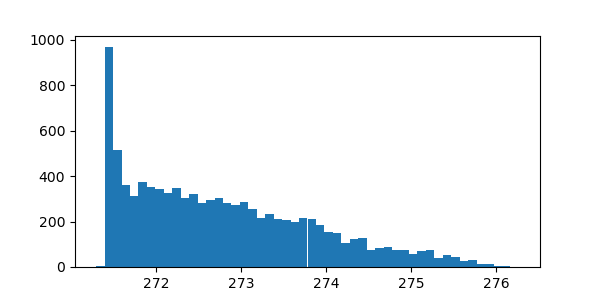

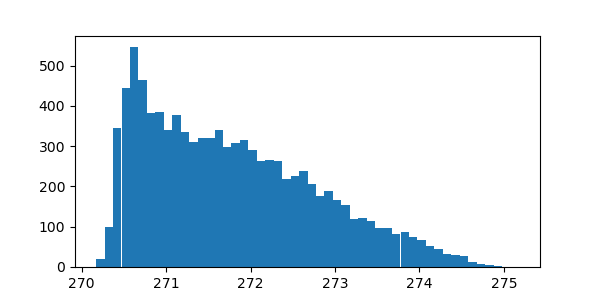

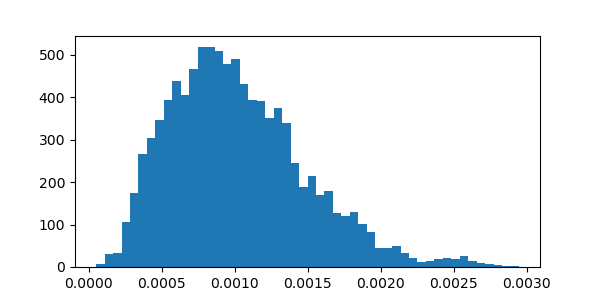

In [15]:
# Create scalar for normalizing T, TOA, and WV data
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler

months = ['01','02','03','04','05','06','07','08','09','10','11','12']
window_dataframes = []

n = 0

for mo in months:
    NLSST_input_file = atmpath / f"TCWV_{mo}.csv"
    if os.path.isfile(NLSST_input_file):
        # print(f"  Month {mo}: NLSST input exists")
        modtran = pd.read_csv(NLSST_input_file)
    else:
        spec_hu_file = f"modtran_atmprofiles_{mo}.txt"
        prefix = f"modtran_atmprofiles_{mo}.bts+tau+dbtdsst.txt"
        modtran = prep_NLSST(atmpath, prefix, spec_hu_file)
        modtran.to_csv(NLSST_input_file, index=False)
    
    # Remove rows with Surface T values of 271.46 and 271.461.
    modtran = modtran[~modtran['Surface T[K]'].isin([271.46, 271.461])]
    
    window_dataframes.append(modtran)
    
    n = n + modtran.shape[0]

# Concatenate the DataFrames for the three months in the window.
modtran_lut = pd.concat(window_dataframes, ignore_index=True)

simTOA = modtran_lut[['TOA T[K]']]
simWV = modtran_lut[['TCWV [cm]']]
# simT = modtran_lut[['Surface T[K]']] # Decided this was skewed because of Andy's forcings so use TOA scaler instead
simT = simTOA.rename(columns={'TOA T[K]': 'Surface T[K]'})

print(f'ERA5 count: {n}')
print(f'Simulated TOA min: {np.around(simTOA.min().values[0],2)}, and max: {np.around(simTOA.max().values[0],2)}')
print(f'Simulated WV min: {np.around(simWV.min().values[0],4)}, and max: {np.around(simWV.max().values[0],5)}')
print(f'Simulated SST min: {np.around(simT.min().values[0],2)}, and max: {np.around(simT.max().values[0],2)}')

simTOA_transformer = StandardScaler().fit(simTOA)
simWV_transformer = StandardScaler().fit(simWV)
# simT_transformer = RobustScaler().fit(simT)
simT_transformer = StandardScaler().fit(simT) # This is using TOA at the moment until get updated TOA


plt.figure(figsize=(6, 3))
plt.hist(modtran_lut['Surface T[K]'], bins=50);

plt.figure(figsize=(6, 3))
plt.hist(modtran_lut['TOA T[K]'], bins=50);

plt.figure(figsize=(6, 3))
plt.hist(modtran_lut['TCWV [cm]'], bins=50);

In [17]:
# Orthoganol distance regression - single month

# # Main loop for processing each month
# months = ['01','02','03','04','05','06','07','08','09','10','11','12']
# atmcor = {}

# for mo in months:
#     print(f'Month: {mo}')
#     NLSST_input_file = atmpath / f'TCWV_{mo}_20250511'
    
#     if os.path.isfile(NLSST_input_file):
#         # print('NLSST input exists')
#         modtran_lut = pd.read_pickle(NLSST_input_file)
#     else:
#         spec_hu_file = f'modtran_atmprofiles_{mo}_20230823.txt'
#         prefix = f'modtran_atmprofiles_{mo}.bts+tau+dbtdsst'
#         # Assume prep_NLSST is defined elsewhere and returns the lookup table DataFrame.
#         modtran_lut = prep_NLSST(atmpath, prefix, spec_hu_file)
#         modtran_lut.to_pickle(NLSST_input_file)
    
#     modtran_lut = modtran_lut[~modtran_lut['Surface T[K]'].isin([271.46, 271.461])]
#         # modtran_lut['Surface T[K]'] = modtran_lut['Surface T[K]']-273.15
    
#     modtran_lut_norm = modtran_lut

#     modtran_lut_norm['Surface T[K]'] = simT_transformer.transform(modtran_lut[['Surface T[K]']])
#     modtran_lut_norm['TOA T[K]'] = simTOA_transformer.transform(modtran_lut[['TOA T[K]']])
#     modtran_lut_norm['TCWV [cm]'] = simWV_transformer.transform(modtran_lut[['TCWV [cm]']])
    
#     # Use the ODR-based regression function in place of the OLS function.
#     odr_results = derive_NLSST_odr(modtran_lut_norm)
    
#     # Round the outputs similar to your previous code:
#     a1 = np.around(odr_results['toa'], 2)
#     a2 = np.around(odr_results['tcwv_toa'], 2)
#     a3 = np.around(odr_results['Intercept'], 2)
        
#     atmcor[mo] = {"a1": a1, "a2": a2, "a3": a3}
#     print(f"Month {mo} coefficients: toa = {a1}, tcwv_toa = {a2}, Intercept = {a3}")

In [18]:
# # Orthoganol distance regression - 3 month rolling window
# months = ['01','02','03','04','05','06','07','08','09','10','11','12']
# atmcor = {}

# # Loop over months by index so we can get the previous and next month via modulo arithmetic.
# for i, middle_month in enumerate(months):
#     # Determine the rolling window months: previous, current, and next (with wrap-around)
#     prev_month = months[(i - 1) % 12]
#     next_month = months[(i + 1) % 12]
#     window_months = [prev_month, middle_month, next_month]
    
#     print(f"Processing rolling window for middle month {middle_month}")
    
#     # Create a list to store the DataFrame for each month in the window.
#     modtran_list = []
    
#     for mo in window_months:
#         NLSST_input_file = atmpath / f'TCWV_{mo}_20250511'
        
#         if os.path.isfile(NLSST_input_file):
#             # print('NLSST input exists')
#             modtran_lut = pd.read_pickle(NLSST_input_file)
#         else:
#             spec_hu_file = f'modtran_atmprofiles_{mo}_20230823.txt'
#             prefix = f'modtran_atmprofiles_{mo}.bts+tau+dbtdsst'
#             # Assume prep_NLSST is defined elsewhere and returns the lookup table DataFrame.
#             modtran_lut = prep_NLSST(atmpath, prefix, spec_hu_file)
#             modtran_lut.to_pickle(NLSST_input_file)

#         modtran_lut = modtran_lut[~modtran_lut['Surface T[K]'].isin([271.46, 271.461])]
#         # modtran_lut['Surface T[K]'] = modtran_lut['Surface T[K]']-273.15

#         modtran_list.append(modtran_lut)

#     # Concatenate the DataFrames for the three months in the window.
#     modtran_lut = pd.concat(modtran_list, ignore_index=True)

#     modtran_lut_norm = modtran_lut

#     modtran_lut_norm['Surface T[K]'] = simT_transformer.transform(modtran_lut[['Surface T[K]']])
#     modtran_lut_norm['TOA T[K]'] = simTOA_transformer.transform(modtran_lut[['TOA T[K]']])
#     modtran_lut_norm['TCWV [cm]'] = simWV_transformer.transform(modtran_lut[['TCWV [cm]']])
    
#     # Use the ODR-based regression function in place of the OLS function.
#     odr_results = derive_NLSST_odr(modtran_lut_norm)
    
#     # Round the outputs similar to your previous code:
#     a1 = np.around(odr_results['toa'], 2)
#     a2 = np.around(odr_results['tcwv_toa'], 2)
#     a3 = np.around(odr_results['Intercept'], 2)
        
#     atmcor[mo] = {"a1": a1, "a2": a2, "a3": a3}
#     print(f"Rolling window ODR regression for month {middle_month}: toa = {a1}, tcwv_toa = {a2}, Intercept = {a3}")

In [19]:
# Ransac regression - single month

# months = ['01','02','03','04','05','06','07','08','09','10','11','12']
# atmcor = {}

# for mo in months:
#     print(f'Month: {mo}')
#     NLSST_input_file = atmpath / f'TCWV_{mo}_20250511'
    
#     if os.path.isfile(NLSST_input_file):
#         # print('NLSST input exists')
#         modtran_lut = pd.read_pickle(NLSST_input_file)
#     else:
#         # Assuming prep_NLSST is defined elsewhere and returns a DataFrame.
#         spec_hu_file = f'modtran_atmprofiles_{mo}_20230823.txt'
#         prefix = f'modtran_atmprofiles_{mo}.bts+tau+dbtdsst'
#         modtran_lut = prep_NLSST(atmpath, prefix, spec_hu_file)
#         modtran_lut.to_pickle(NLSST_input_file)
    
#     modtran_lut = modtran_lut[~modtran_lut['Surface T[K]'].isin([271.46, 271.461])]
#     # modtran_lut['Surface T[K]'] = modtran_lut['Surface T[K]']-273.15

#     modtran_lut_norm = modtran_lut

#     modtran_lut_norm['Surface T[K]'] = simT_transformer.transform(modtran_lut[['Surface T[K]']])
#     modtran_lut_norm['TOA T[K]'] = simTOA_transformer.transform(modtran_lut[['TOA T[K]']])
#     modtran_lut_norm['TCWV [cm]'] = simWV_transformer.transform(modtran_lut[['TCWV [cm]']])
    
#     # Use the RANSAC-based regression function
#     results = derive_NLSST_ransac(modtran_lut_norm, residual_threshold=1.0, max_trials=100, random_state=42)
    
#     # Round the outputs as in your old code:
#     a1 = np.around(results['toa'], 2)
#     a2 = np.around(results['tcwv_toa'], 2)
#     a3 = np.around(results['Intercept'], 2)
    
#     atmcor[mo] = {"a1": a1, "a2": a2, "a3": a3}
#     print(f"Ransac {mo} coefficients: toa = {a1}, tcwv_toa = {a2}, Intercept = {a3}")

In [20]:
# # RANSAC regression - 3 month rolling window
# months = ['01','02','03','04','05','06','07','08','09','10','11','12']
# atmcor = {}

# # Loop over months by index so we can get the previous and next month via modulo arithmetic.
# for i, middle_month in enumerate(months):
#     # Determine the rolling window months: previous, current, and next (with wrap-around)
#     prev_month = months[(i - 1) % 12]
#     next_month = months[(i + 1) % 12]
#     window_months = [prev_month, middle_month, next_month]
    
#     print(f"Processing rolling window for middle month {middle_month}")
    
#     # Create a list to store the DataFrame for each month in the window.
#     modtran_list = []
    
#     for mo in window_months:
#         NLSST_input_file = atmpath / f'TCWV_{mo}_20250511'
        
#         if os.path.isfile(NLSST_input_file):
#             # print('NLSST input exists')
#             modtran_lut = pd.read_pickle(NLSST_input_file)
#         else:
#             # Assuming prep_NLSST is defined elsewhere and returns a DataFrame.
#             spec_hu_file = f'modtran_atmprofiles_{mo}_20230823.txt'
#             prefix = f'modtran_atmprofiles_{mo}.bts+tau+dbtdsst'
#             modtran_lut = prep_NLSST(atmpath, prefix, spec_hu_file)
#             modtran_lut.to_pickle(NLSST_input_file)
        
#         modtran_lut = modtran_lut[~modtran_lut['Surface T[K]'].isin([271.46, 271.461])]
#         # modtran_lut['Surface T[K]'] = modtran_lut['Surface T[K]']-273.15

#         modtran_list.append(modtran_lut)

#     # Concatenate the DataFrames for the three months in the window.
#     modtran_lut = pd.concat(modtran_list, ignore_index=True)

#     modtran_lut_norm = modtran_lut

#     modtran_lut_norm['Surface T[K]'] = simT_transformer.transform(modtran_lut[['Surface T[K]']])
#     modtran_lut_norm['TOA T[K]'] = simTOA_transformer.transform(modtran_lut[['TOA T[K]']])
#     modtran_lut_norm['TCWV [cm]'] = simWV_transformer.transform(modtran_lut[['TCWV [cm]']])
        
#     # Use the RANSAC-based regression function
#     results = derive_NLSST_ransac(modtran_lut_norm, residual_threshold=1.0, max_trials=100, random_state=42)
    
#     # Round the outputs as in your old code:
#     a1 = np.around(results['toa'], 2)
#     a2 = np.around(results['tcwv_toa'], 2)
#     a3 = np.around(results['Intercept'], 2)
    
#     atmcor[middle_month] = {"a1": a1, "a2": a2, "a3": a3}
#     print(f"Rolling window RANSAC regression for month {middle_month}: toa = {a1}, tcwv_toa = {a2}, Intercept = {a3}")

In [21]:
# # Derive NLSST coefficiencts from MODTRAN files by season

# months = [['12','01','02','03','04','05'],['06','07','08','09','10','11']]
# atmcor = {}

# for season in months:
#     # Create an empty list to store modtran DataFrames for the season
#     modtran_list = []
#     for mo in season:
#         print (f'Month: {mo}')
#         NLSST_input_file = atmpath / f'TCWV_{mo}_20230911'
#         if os.path.isfile(NLSST_input_file):
#             print ('NLSST input exists')
#             modtran_lut = pd.read_pickle(NLSST_input_file)
#         else:
#             spec_hu_file = f'modtran_atmprofiles_{mo}_20230823.txt'
#             prefix = f'modtran_atmprofiles_{mo}.bts+tau+dbtdsst'
#             modtran_lut = prep_NLSST(atmpath,prefix,spec_hu_file)
#             modtran_lut.to_pickle(NLSST_input_file)

#         # Append the DataFrame for this month to the list
#         modtran_list.append(modtran_lut)
    
#     # Concatenate all the months' DataFrames for the season
#     modtran_lut = pd.concat(modtran_list, ignore_index=True)

#     modtran_lut_norm = modtran_lut

#     modtran_lut_norm['Surface T[K]'] = simT_transformer.transform(modtran_lut[['Surface T[K]']])
#     modtran_lut_norm['TOA T[K]'] = simTOA_transformer.transform(modtran_lut[['TOA T[K]']])
#     modtran_lut_norm['TCWV [cm]'] = simWV_transformer.transform(modtran_lut[['TCWV [cm]']])
        
#     NLSST_results = derive_NLSST(modtran_lut)
#     a1 = np.around(NLSST_results.params.toa,2)
#     a2 = np.around(NLSST_results.params.tcwv_toa,2)
#     a3 = np.around(NLSST_results.params.Intercept,2)
            
#     atmcor[mo] = {"a1": a1, "a2": a2, "a3": a3}
#     print(f"Linear regress {mo} coefficients: toa = {a1}, tcwv_toa = {a2}, Intercept = {a3}")
#     print(NLSST_results.rsquared)

In [22]:
# # Derive NLSST coefficiencts from MODTRAN files - single month

# months = ['01','02','03','04','05','06','07','08','09','10','11','12']
# atmcor = {}

# for mo in months:
#     print (f'Month: {mo}')
#     NLSST_input_file = atmpath / f'TCWV_{mo}_20250511'
#     if os.path.isfile(NLSST_input_file):
#         # print ('NLSST input exists')
#         modtran_lut = pd.read_pickle(NLSST_input_file)
#     else:
#         spec_hu_file = f'modtran_atmprofiles_{mo}_20230823.txt'
#         prefix = f'modtran_atmprofiles_{mo}.bts+tau+dbtdsst'
#         modtran_lut = prep_NLSST(atmpath,prefix,spec_hu_file)
#         modtran_lut.to_pickle(NLSST_input_file)

#     modtran_lut = modtran_lut[~modtran_lut['Surface T[K]'].isin([271.46, 271.461])]
#     # modtran_lut['Surface T[K]'] = modtran_lut['Surface T[K]']-273.15

#     modtran_lut_norm = modtran_lut

#     modtran_lut_norm['Surface T[K]'] = simT_transformer.transform(modtran_lut[['Surface T[K]']])
#     modtran_lut_norm['TOA T[K]'] = simTOA_transformer.transform(modtran_lut[['TOA T[K]']])
#     modtran_lut_norm['TCWV [cm]'] = simWV_transformer.transform(modtran_lut[['TCWV [cm]']])
    
#     NLSST_results = derive_NLSST(modtran_lut)
#     a1 = np.around(NLSST_results.params.toa,2)
#     a2 = np.around(NLSST_results.params.tcwv_toa,2)
#     a3 = np.around(NLSST_results.params.Intercept,2)
        
#     atmcor[mo] = {"a1": a1, "a2": a2, "a3": a3}
#     print(f"Linear regress {mo} coefficients: toa = {a1}, tcwv_toa = {a2}, Intercept = {a3}, R2 = {NLSST_results.rsquared}")
    
# print(NLSST_results.summary())

# atmcor['02']['a3']=atmcor['03']['a3']
# atmcor['11']['a1']=atmcor['10']['a1']
# atmcor['11']['a3']=atmcor['10']['a3']

In [23]:
# Derive NLSST coefficiencts from MODTRAN files - 3 month rolling window
months = ['01','02','03','04','05','06','07','08','09','10','11','12']
atmcor = {}  # To store the regression results for each middle month.

# Loop over months by index so we can get the previous and next month via modulo arithmetic.
for i, middle_month in enumerate(months):
    # Determine the rolling window months: previous, current, and next (with wrap-around)
    prev_month = months[(i - 1) % 12]
    next_month = months[(i + 1) % 12]
    window_months = [prev_month, middle_month, next_month]
    
    print(f"Processing rolling window for middle month {middle_month}")
    
    # Create a list to store the DataFrame for each month in the window.
    modtran_list = []
    
    for mo in window_months:
        NLSST_input_file = atmpath / f"TCWV_{mo}_20250511"
        if os.path.isfile(NLSST_input_file):
            # print(f"  Month {mo}: NLSST input exists")
            modtran_lut = pd.read_pickle(NLSST_input_file)
        else:
            spec_hu_file = f"modtran_atmprofiles_{mo}_20230823.txt"
            prefix = f"modtran_atmprofiles_{mo}.bts+tau+dbtdsst"
            modtran_lut = prep_NLSST(atmpath, prefix, spec_hu_file)
            modtran.to_pickle(NLSST_input_file)
        
        # Remove rows with Surface T values of 271.46 and 271.461.
        modtran_lut = modtran_lut[~modtran_lut['Surface T[K]'].isin([271.46, 271.461])]
        print(f'{mo}: {modtran_lut.shape[0]}')
        
        modtran_list.append(modtran_lut)
    
    # Concatenate the DataFrames for the three months in the window.
    modtran_lut = pd.concat(modtran_list, ignore_index=True)

    modtran_lut_norm = modtran_lut

    modtran_lut_norm['Surface T[K]'] = simT_transformer.transform(modtran_lut[['Surface T[K]']])
    modtran_lut_norm['TOA T[K]'] = simTOA_transformer.transform(modtran_lut[['TOA T[K]']])
    modtran_lut_norm['TCWV [cm]'] = simWV_transformer.transform(modtran_lut[['TCWV [cm]']])
    
    # Run the regression using your derive_NLSST function on the concatenated DataFrame.
    NLSST_results = derive_NLSST(modtran_lut_norm)
    a1 = np.around(NLSST_results.params.toa, 2)
    a2 = np.around(NLSST_results.params.tcwv_toa, 2)
    a3 = np.around(NLSST_results.params.Intercept, 2)
    r2 = np.around(NLSST_results.rsquared, 2)
    
    pa1 = np.around(NLSST_results.pvalues[1], 3)
    pa2 = np.around(NLSST_results.pvalues[2], 3)
    pa3 = np.around(NLSST_results.pvalues[0], 3)
    
    # Store the regression coefficients and R2 for the middle month.
    atmcor[middle_month] = {"a1": a1, "a2": a2, "a3": a3}
    print(f"Rolling for month {middle_month}: toa = {a1}, tcwv_toa = {a2}, Intercept = {a3}, R2 = {r2}")
    print(f"p-values for month {middle_month}: toa = {pa1}, tcwv_toa = {pa2}, Intercept = {pa3}")

print(NLSST_results.summary())

Processing rolling window for middle month 01
12: 772
01: 1175
02: 1417
Rolling for month 01: toa = 1.08, tcwv_toa = -0.02, Intercept = 0.96, R2 = 0.98
p-values for month 01: toa = 0.0, tcwv_toa = 0.0, Intercept = 0.0
Processing rolling window for middle month 02
01: 1175
02: 1417
03: 1417
Rolling for month 02: toa = 1.08, tcwv_toa = -0.01, Intercept = 0.96, R2 = 0.98
p-values for month 02: toa = 0.0, tcwv_toa = 0.011, Intercept = 0.0
Processing rolling window for middle month 03
02: 1417
03: 1417
04: 1145
Rolling for month 03: toa = 1.07, tcwv_toa = 0.01, Intercept = 0.99, R2 = 0.99
p-values for month 03: toa = 0.0, tcwv_toa = 0.007, Intercept = 0.0
Processing rolling window for middle month 04
03: 1417
04: 1145
05: 958
Rolling for month 04: toa = 1.06, tcwv_toa = 0.01, Intercept = 0.99, R2 = 0.98
p-values for month 04: toa = 0.0, tcwv_toa = 0.0, Intercept = 0.0
Processing rolling window for middle month 05
04: 1145
05: 958
06: 605
Rolling for month 05: toa = 1.05, tcwv_toa = -0.0, In

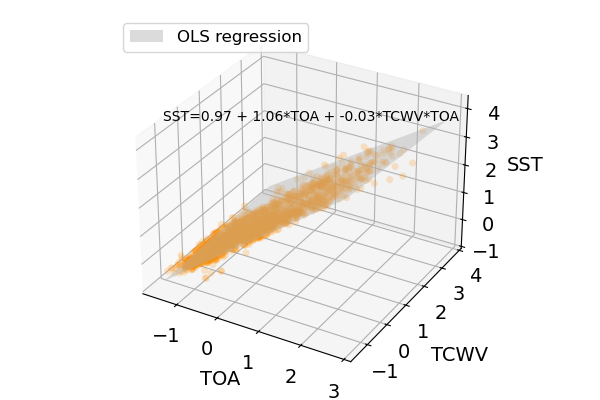

In [24]:
# Plot multiple linear regression in 3D

data = modtran_lut_norm

# Generating predictions for a range of TOA and TCWV values
xi = np.linspace(data['TOA T[K]'].min(), data['TOA T[K]'].max(), 100)
wi = np.linspace(data['TCWV [cm]'].min(), data['TCWV [cm]'].max(), 100)
X, W = np.meshgrid(xi, wi)
Z_pred = NLSST_results.predict(exog=dict(toa=X.ravel(), tcwv_toa=(X*W).ravel())).values.reshape(X.shape)

# Create a figure and a 3D axes
fig = plt.figure(figsize=(6, 4))
ax = fig.add_subplot(111, projection='3d')

ax.tick_params(labelsize=14)
ax.plot_surface(X,W,Z_pred,color='0.8', alpha=0.5,label='OLS regression',zorder=0)
ax.scatter(data['TOA T[K]'],data['TCWV [cm]'],data['Surface T[K]'],color='darkorange',linewidth=0,s=25,alpha=0.2,label='_no label_',zorder=2)
ax.text(-2.8,1,3.0,f'SST={a3} + {a1}*TOA + {a2}*TCWV*TOA',fontsize=10)
# a1.set_ylim([-3,2.5])
# a1.set_xlim([-3,2.5])
ax.set_xlabel('TOA',labelpad=6,fontsize=14)
ax.set_ylabel('TCWV',labelpad=13,fontsize=14)
ax.set_zlabel('SST',labelpad=6,fontsize=14)
ax.legend(markerscale=1,fontsize=12,loc='upper left')

plt.tight_layout()
# plt.savefig('/Users/tashasnow/Library/CloudStorage/GoogleDrive-tsnow03@gmail.com/My\ Drive/GoogleDrivePhD_postdoc/PhD_Project/Manuscripts/LandsatManuscript/Figures/MODTRANretrieval.jpg', format='jpg', dpi=1000)
plt.show()

In [25]:
# # Info on MODIS atmospheric dataset (MOD/MYD07 Level 2)
# from pprint import pprint
# datasets = earthaccess.search_datasets(short_name="MOD07_L2",
#                                        cloud_hosted=True)

# for dataset in datasets:
#     pprint(dataset.summary())

## Acquire MODIS water vapor climatologies to be able to remove land contaminated wv

In [26]:
# start_dt = '2023-02-01'
# end_dt = '2023-03-01'

# # Gather all files from search location from Terra and Aqua for the same day as the Landsat image
# results = earthaccess.search_data(
#     short_name='MOD07_L2',
#     bounding_box=bbox,
#     # Day of a landsat scene to day after - searches day of only
#     temporal=(start_dt,end_dt)
# )
# results2 = earthaccess.search_data(
#     short_name='MYD07_L2',
#     bounding_box=bbox,
#     # Day of a landsat scene to day after - searches day of only
#     temporal=(start_dt,end_dt)
# )
# results = results + results2
# print (f'{len(results)} TOTAL granules')

In [27]:
# # Use these access pathways while S3 streaming is not working
# # data_links = [granule.data_links(access="external") for granule in results[ind:ind+1]]
# netcdf_list = [g._filter_related_links("USE SERVICE API")[0].replace(".html", ".nc4") for g in results]
# # This is going to be slow as we are asking Opendap to format HDF into NetCDF4 so we only processing 3 granules
# # and Opendap is very prone to failures due concurrent connections, not ideal.
# file_handlers = earthaccess.download(netcdf_list,modout_path,provider='NSIDC')

In [28]:
# for modfilenm in file_handlers:
#     os.rename(f'{modfilenm}', f'{modfilenm}.gz')
#     with gzip.open(f'{modfilenm}.gz', 'rb') as f_in:
#         with open(f'{modfilenm}', 'wb') as f_out:
#             f_out.write(f_in.read())
#             os.remove(f'{modfilenm}.gz')

In [29]:
# mod07 = xr.open_dataset(f'{modfilenm}')
# mod07

In [30]:
# import glob

# # # Step 1: Make a list of local NetCDF/HDF files
# # data_files = glob.glob(f'{modout_path}/*.nc4')  

# # Step 2: Load them in one go with xarray
# ds = xr.open_mfdataset(
#     file_handlers,
#     combine='nested',
#     parallel=True,
#     chunks={'time': 1}  # Adjust chunking as needed
# )

# # Now ds is your combined Dataset
# print(ds)

In [31]:
# # 3. Force the data to load into memory
# ds.load()

# # 4. Now you can safely delete the source files
# for f in data_files:
#     os.remove(f)

# # ds is still accessible in memory
# print(ds)

In [32]:
# # Suppose lat = ds['Latitude'], lon = ds['Longitude'], or 
# # you can read an explicit bounding box after georeferencing
# ds_subset = ds.where(
#   (ds.lat >= min_lat) & (ds.lat <= max_lat) &
#   (ds.lon >= min_lon) & (ds.lon <= max_lon),
#   drop=True
# )

In [33]:
# # Convert time dimension to xarray datetime if needed
# ds_subset = ds_subset.resample(time='1W').mean()   # weekly
# # or
# ds_subset = ds_subset.resample(time='1M').mean()   # monthly

In [34]:
# # Example: each monthly step, flatten the spatial dimension
# monthly_distributions = ds_subset.groupby('time').apply(
#     lambda x: np.histogram(x.Water_Vapor.values.ravel(), bins=50)
# )

In [35]:
# ds_climatology.to_netcdf("mod07_climatology.nc")

In [36]:
# modout_path

## Search for desired Landsat scenes

In [37]:
# Search for desired Landsat scenes
items = search_stac(url,collection,gjson_outfile=gjson_outfile,bbox=bbox,timeRange=timeRange)

# Open stac catalog for some needed info
catalog = intake.open_stac_item_collection(items)

# Load the geojson file
gf = gpd.read_file(gjson_outfile)

Searching for items in bbox (-104.2, -73.81, -103.8, -73.42) and timeRange 2021-09-01/2023-04-06
Found 377 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


In [38]:
# Plot tiles of all scenes found
plot_search(gf,satellite,colnm)

:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]   (landsat:wrs_path,landsat:wrs_row)

**Note the bands you would like to include are assigned by passing the bandNames parameter to landsat_to_xarray using the following codes:**

'coastal', 'blue', 'green', 'red', 'nir08', 'swir16', 'swir22', 'pan', 'cirrus', 'lwir11', 'lwir12', 'qa_pixel'

## Process Landsat scenes to acquire sea surface temperature

In [50]:
# Convert bounding box to polar for checking if landsat has any data in bounding box
source_crs = 'epsg:4326' 
target_crs = 'epsg:3031' # Coordinate system of the file

sbox,checkbox = lsat_reproj(source_crs,target_crs,(bbox[0],bbox[1],bbox[2],bbox[3]))

# Create polygon for later cropping
polygon = Polygon([(sbox[0][0],sbox[0][1]),(sbox[3][0],sbox[3][1]),(sbox[2][0],sbox[2][1]),(sbox[1][0],sbox[1][1])])

# Create min/max boundaries for trimming image before crop_xarray to cut down on processing times
minx, miny, maxx, maxy = polygon.bounds
polarx = [minx, maxx]
polary = [miny, maxy]

lsat_reproj normal orientation
bbox=[(-1758211.7101406257, -444895.95878999075), (-1716314.436869494, -434294.3188082189), (-1719304.5331828727, -422301.69752508285), (-1761274.798255307, -432610.5833818861)]
lbox=(-104.2, -73.81, -103.8, -73.42)
checkbox=[-104.2   -73.81 -103.8   -73.42]


In [56]:
%%time
# ***Problems downloading w earthaccess (tried up one and up down one version) or xarray reading (tried up and down versions, but didn't try other engines like rasterio)
## 1 min 1 sec per image without interpolation, 1 min 5 s with interp, no extra memory 
## With all clusters - 4 min 20 sec @ 15k, 4 min 6 sec @ 10k, 6 min 40 sec @ 5k

# Saves MODIS water vapor file name in COG so know what each image was corrected with

# Include only Landsat 8 scenes
catalog_list = [x for x in items if x.id[3]=='8']

for sceneid in tqdm(catalog_list[43:], desc="Processing"):
    print(sceneid.id)
    
    scene = catalog[sceneid.id]
    timestr = scene.metadata['datetime'].strftime('%H%M%S')

    outFile = f'{SSTpath}/{sceneid.id}_{timestr}_Cel.tif'
    
    if os.path.isfile(outFile):
        print (f'{sceneid.id} - atm corr exists')

    else:
        # Open all desired bands for one scene
        ls_scene = landsat_to_xarray(sceneid,catalog)
        ls_scene = ls_scene.rio.write_crs("epsg:3031", inplace=True)

        # Create classification mask
        ls_scene = create_masks(ls_scene, cloud_mask=True, ice_mask=True, ocean_mask=True)
        
        try:
            # Check for any open ocean pixels in bounding box - go to next image if none - 9.3 s
            mask = np.ones(ls_scene.shape[1:])
            mask[ls_scene.mask!=3] = np.nan
            ls_thermal = ls_scene.sel(band='lwir11').compute()
            ls_box = subset_img(ls_thermal*mask,polarx,polary)
            # ls_box = (ls_thermal*mask).sel(y=slice(polary[1],polary[0]),x=slice(polarx[0],polarx[1]))
            # ls_box = ls_box.where(ls_box >= -3.5, np.nan)
    
            if ((ls_box).notnull()).sum().values==0:
                print (f'{sceneid.id} has no SSTs')
                try:
                    del ls_scene, scene, mask, ls_thermal, ls_box
                except:
                    pass
                gc.collect()
                continue
                
            # Use band ratios for RF cloud pixel classification
            # ###
    
            # Atmospheric correction using MODIS
            # Acquire and align MODIS water vapor (MOD/MYD07) to Landsat
            mod07,modfilenm = open_MODIS(ls_scene,scene,modout_path)
    
            # Create water vapor files aligned and subsampled to Landsat
            spacing = [300,-300] # 300m sampling of MODIS data so that upsampling is easy and because 30m takes far too long, 1 must be negative for MODISlookup
    
            #***has not yet been tested to ensure no interp works properly
            WV_xr = get_wv(ls_scene,mod07,spacing,WV,scene,interp=interp)
    
            # Create SST by masking and using water vapor to apply month-specific atmospheric correction
            SST = apply_NLSST(ls_thermal,scene,mask,WV_xr,atmcor,simT_transformer,simTOA_transformer,simWV_transformer)
    
            # Record MODIS water vapor image used in atmospheric correction, will find this info save under band_data in
            # data variables in COG (click on white paper info button in xarray readout)
            SST.attrs['MODIS_WV'] = modfilenm
    
            print (f'Mean SST: {np.nanmean(SST)}')
    
            # Save to a cloud-optimized Geotiff
            SST.rio.to_raster(raster_path=outFile, driver="COG")
                
        except Exception as e:
            print (f'{sceneid.id} has no SSTs: {e}')
        
        try:
            del ls_scene, scene, ls_thermal, ls_box, mod07, WV_xr, SST
        except:
            pass
        
        gc.collect()

Processing:   0%|          | 0/166 [00:00<?, ?it/s]

LC08_L1GT_156132_20230107_20230110_02_T2
LC08_L1GT_156132_20230107_20230110_02_T2 - atm corr exists
LC08_L1GT_005112_20230105_20230111_02_T2
(753, 1499)
LC08_L1GT_005112_20230105_20230111_02_T2 has no SSTs


Processing:   1%|          | 2/166 [00:33<45:48, 16.76s/it]

LC08_L1GT_158132_20230105_20230110_02_T2
(753, 1499)
LC08_L1GT_158132_20230105_20230110_02_T2 has no SSTs


Processing:   2%|▏         | 3/166 [01:17<1:15:49, 27.91s/it]

LC08_L1GT_160131_20230103_20230111_02_T2
(753, 970)
LC08_L1GT_160131_20230103_20230111_02_T2 has no SSTs


Processing:   2%|▏         | 4/166 [02:00<1:31:30, 33.89s/it]

LC08_L1GT_002113_20221231_20230110_02_T2
(753, 1210)
LC08_L1GT_002113_20221231_20230110_02_T2 has no SSTs


Processing:   3%|▎         | 5/166 [02:39<1:35:08, 35.45s/it]

LC08_L1GT_002112_20221231_20230110_02_T2
(734, 1499)
LC08_L1GT_002112_20221231_20230110_02_T2 has no SSTs


Processing:   4%|▎         | 6/166 [03:16<1:36:02, 36.01s/it]

LC08_L1GT_155132_20221231_20230111_02_T2
LC08_L1GT_155132_20221231_20230111_02_T2 - atm corr exists
LC08_L1GT_004112_20221229_20230110_02_T2
(753, 1499)
LC08_L1GT_004112_20221229_20230110_02_T2 has no SSTs


Processing:   5%|▍         | 8/166 [03:49<1:09:30, 26.40s/it]

LC08_L1GT_157132_20221229_20230104_02_T2
(753, 1499)
21 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -95.54367002809623 -72.056960907748405. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -21.848619026526148 -74.371655383793012. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -100.6846443451912 -69.974317277644744. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
5 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 01:23:58


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2022363.0540.061.2022363135542.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 3643 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


y resample reversed
Latitude in proper position
Mean water vapor value is: 0.5250977882539225, min: 0.35545, max: 0.65874
Mean SST: -3.056232301934039


Processing:   5%|▌         | 9/166 [06:21<2:34:12, 58.94s/it]

LC08_L1GT_006112_20221227_20230113_02_T2
(753, 1499)
LC08_L1GT_006112_20221227_20230113_02_T2 has no SSTs


Processing:   6%|▌         | 10/166 [06:53<2:14:40, 51.80s/it]

LC08_L1GT_159131_20221227_20230113_02_T2
(753, 1370)
20 TOTAL granules
TopologyException: side location conflict at -39.342973442791099 -70.953561627612132. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -49.763617774809894 -76.163714677964791. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -31.59059268198445 -71.801996227840334. This can occur if the input geometry is invalid.
1 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 08:24:05


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 1822 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2022361.1540.061.2022362082826.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.3649123032327579, min: 0.26618, max: 0.42043
Mean SST: -3.22903278725801


Processing:   7%|▋         | 11/166 [09:29<3:28:25, 80.68s/it]

LC08_L1GT_156132_20221222_20230113_02_T2
LC08_L1GT_156132_20221222_20230113_02_T2 - atm corr exists
LC08_L1GT_005112_20221220_20221227_02_T2
(753, 1499)
22 TOTAL granules
TopologyException: side location conflict at -53.985509030891443 -71.871190169657083. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -106.04635100207187 -69.724617946759494. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -84.638831933271803 -69.607423323617155. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -61.653994441027486 -70.199297647017119. This can occur if the input geometry is invalid.
3 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 02:08:26


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 3422 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2022354.1725.061.2022355221327.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.4162533702047807, min: 0.29397, max: 0.48827
Mean SST: -2.81621166426106


Processing:   8%|▊         | 13/166 [11:16<2:54:43, 68.52s/it]

LC08_L1GT_158132_20221220_20221227_02_T2
LC08_L1GT_158132_20221220_20221227_02_T2 - atm corr exists
LC08_L1GT_160131_20221218_20230113_02_T2
(753, 970)
LC08_L1GT_160131_20221218_20230113_02_T2 has no SSTs


Processing:   9%|▉         | 15/166 [11:59<2:06:55, 50.43s/it]

LC08_L1GT_002113_20221215_20221227_02_T2
(753, 1210)
LC08_L1GT_002113_20221215_20221227_02_T2 has no SSTs


Processing:  10%|▉         | 16/166 [12:36<1:58:41, 47.48s/it]

LC08_L1GT_002112_20221215_20221227_02_T2
LC08_L1GT_002112_20221215_20221227_02_T2 - atm corr exists
LC08_L1GT_155132_20221215_20221219_02_T2
(753, 1499)
LC08_L1GT_155132_20221215_20221219_02_T2 has no SSTs


Processing:  11%|█         | 18/166 [13:19<1:32:26, 37.47s/it]

LC08_L1GT_004112_20221213_20221223_02_T2
(753, 1499)
LC08_L1GT_004112_20221213_20221223_02_T2 has no SSTs


Processing:  11%|█▏        | 19/166 [13:49<1:28:09, 35.98s/it]

LC08_L1GT_157132_20221213_20221219_02_T2
LC08_L1GT_157132_20221213_20221219_02_T2 - atm corr exists
LC08_L1GT_006112_20221211_20221219_02_T2
(753, 1499)
LC08_L1GT_006112_20221211_20221219_02_T2 has no SSTs


Processing:  13%|█▎        | 21/166 [14:21<1:08:24, 28.31s/it]

LC08_L1GT_159131_20221211_20221219_02_T2
(753, 1370)
23 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -41.011755249734897 -73.19138110503917. This can occur if the input geometry is invalid.
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:51:02


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 4868 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.


['MOD07_L2.A2022345.0625.061.2022350044133.hdf.nc4']


surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


y resample reversed
Latitude in proper position
Mean water vapor value is: 0.14139660055849038, min: 0.11369, max: 0.16545
Mean SST: -9.063027791338213


Processing:  13%|█▎        | 22/166 [16:52<2:10:45, 54.48s/it]

LC08_L1GT_003113_20221206_20221212_02_T2
(753, 800)
18 TOTAL granules
TopologyException: side location conflict at -89.09080918638567 -73.23222975583576. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
3 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:55:15


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 2216 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2022340.1600.061.2022350032157.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.4875086365562668, min: 0.42427, max: 0.54466
Mean SST: -2.766890828141556


Processing:  14%|█▍        | 23/166 [19:00<2:51:05, 71.79s/it]

LC08_L1GT_003112_20221206_20221212_02_T2
LC08_L1GT_003112_20221206_20221212_02_T2 - atm corr exists
LC08_L1GT_156132_20221206_20230113_02_T2
LC08_L1GT_156132_20221206_20230113_02_T2 - atm corr exists
LC08_L1GT_005112_20221204_20221212_02_T2
LC08_L1GT_005112_20221204_20221212_02_T2 - atm corr exists
LC08_L1GT_158132_20221204_20230113_02_T2
LC08_L1GT_158132_20221204_20230113_02_T2 - atm corr exists
LC08_L1GT_160131_20221202_20221212_02_T2
(753, 970)
23 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at 7.1176852385874394 -75.756262165718852. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -79.509108039813214 -70.720946242456833. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -61.522444603970889 -71.722569581218067. This can occur if

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 3869 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2022336.0510.061.2022350022504.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.34647288402561727, min: 0.19459, max: 0.49636
Mean SST: -2.7830804612779616


Processing:  17%|█▋        | 28/166 [21:29<1:44:39, 45.50s/it]

LC08_L1GT_002113_20221129_20221206_02_T2
(753, 1210)
19 TOTAL granules
TopologyException: side location conflict at -13.337467405385688 -73.505667359824656. This can occur if the input geometry is invalid.
3 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 06:03:35


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 4661 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MYD07_L2.A2022333.0855.061.2022333210509.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.3171603606639961, min: 0.22384, max: 0.39168
Mean SST: -2.571639164250036


Processing:  17%|█▋        | 29/166 [23:47<2:15:50, 59.49s/it]

LC08_L1GT_002112_20221129_20221206_02_T2
LC08_L1GT_002112_20221129_20221206_02_T2 - atm corr exists
LC08_L1GT_155132_20221129_20221206_02_T2
LC08_L1GT_155132_20221129_20221206_02_T2 - atm corr exists
LC08_L1GT_004112_20221127_20221206_02_T2
(753, 1499)
LC08_L1GT_004112_20221127_20221206_02_T2 has no SSTs


Processing:  19%|█▉        | 32/166 [24:19<1:30:04, 40.33s/it]

LC08_L1GT_006112_20221125_20221205_02_T2
(753, 1499)
20 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -14.729277611043626 -76.132619089366258. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -102.11128876366413 -71.000270003024113. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -73.052236208789537 -72.724548782757864. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -25.540221133201431 -73.444800859433386. This can occur if the input geometry is invalid.
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:22:53


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 5797 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2022329.1500.061.2022330021215.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.14385028770308309, min: 0.11146, max: 0.4183
Mean SST: -3.8326831548722593


Processing:  20%|█▉        | 33/166 [26:30<2:00:53, 54.54s/it]

LC08_L1GT_159131_20221125_20221205_02_T2
(753, 1370)
19 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -14.729277611043626 -76.132619089366258. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -102.11128876366413 -71.000270003024113. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -73.052236208789537 -72.724548782757864. This can occur if the input geometry is invalid.
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:28:56


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 6728 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MYD07_L2.A2022329.0745.061.2022329193302.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.16466591426649602, min: 0.06799, max: 0.33587
Mean SST: -4.834483207777055


Processing:  20%|██        | 34/166 [30:03<3:04:18, 83.77s/it]

LC08_L1GT_003113_20221120_20221129_02_T2
(753, 800)
LC08_L1GT_003113_20221120_20221129_02_T2 has no SSTs


Processing:  21%|██        | 35/166 [30:39<2:41:00, 73.74s/it]

LC08_L1GT_003112_20221120_20221129_02_T2
(753, 1499)
LC08_L1GT_003112_20221120_20221129_02_T2 has no SSTs


Processing:  22%|██▏       | 36/166 [31:13<2:20:15, 64.73s/it]

LC08_L1GT_005112_20221118_20221128_02_T2
(753, 1499)
LC08_L1GT_005112_20221118_20221128_02_T2 has no SSTs


Processing:  22%|██▏       | 37/166 [31:42<1:59:59, 55.81s/it]

LC08_L1GT_002113_20221113_20230113_02_T2
(753, 1210)
20 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -86.869249767300261 -71.203517323495348. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -39.13495639426975 -71.921997303854482. This can occur if the input geometry is invalid.
3 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 01:36:25


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 3387 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2022317.1635.061.2022335232921.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.18746179731059337, min: 0.17652, max: 0.20095
Mean SST: -9.110404566245576


Processing:  23%|██▎       | 38/166 [35:09<3:23:10, 95.24s/it]

LC08_L1GT_002112_20221113_20230113_02_T2
(753, 1499)
LC08_L1GT_002112_20221113_20230113_02_T2 has no SSTs


Processing:  23%|██▎       | 39/166 [35:41<2:45:34, 78.22s/it]

LC08_L1GT_004112_20221111_20221121_02_T2
LC08_L1GT_004112_20221111_20221121_02_T2 - atm corr exists
LC08_L1GT_006112_20221109_20221121_02_T2
(753, 1499)
LC08_L1GT_006112_20221109_20221121_02_T2 has no SSTs


Processing:  25%|██▍       | 41/166 [36:10<1:45:00, 50.41s/it]

LC08_L1GT_003113_20221104_20221114_02_T2
(753, 790)
LC08_L1GT_003113_20221104_20221114_02_T2 has no SSTs


Processing:  25%|██▌       | 42/166 [36:42<1:35:13, 46.08s/it]

LC08_L1GT_003112_20221104_20221114_02_T2
(753, 1499)
21 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at 5.4945221308383791 -76.124746608898235. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -81.837662504788412 -70.992658617611269. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -88.12638507532013 -69.168349425036453. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -67.327530142685049 -69.880212251633452. This can occur if the input geometry is invalid.
3 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 01:50:34


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 1037 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2022308.1655.061.2022335000646.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.18942990137855997, min: 0.14273, max: 0.22096
Mean SST: -7.306021130607369


Processing:  26%|██▌       | 43/166 [38:54<2:18:40, 67.64s/it]

LC08_L1GT_005112_20221102_20221114_02_T2
LC08_L1GT_005112_20221102_20221114_02_T2 - atm corr exists
LC08_L1GT_002113_20221028_20221108_02_T2
(753, 1200)
LC08_L1GT_002113_20221028_20221108_02_T2 has no SSTs


Processing:  27%|██▋       | 45/166 [39:27<1:33:16, 46.25s/it]

LC08_L1GT_002112_20221028_20221108_02_T2
(753, 1499)
LC08_L1GT_002112_20221028_20221108_02_T2 has no SSTs


Processing:  28%|██▊       | 46/166 [40:15<1:33:05, 46.54s/it]

LC08_L1GT_004112_20221026_20221107_02_T2
(753, 1499)
LC08_L1GT_004112_20221026_20221107_02_T2 has no SSTs


Processing:  28%|██▊       | 47/166 [40:45<1:24:34, 42.64s/it]

LC08_L1GT_006112_20221024_20221107_02_T2
LC08_L1GT_006112_20221024_20221107_02_T2 - atm corr exists
LC08_L1GT_003113_20221019_20221031_02_T2
(753, 800)
LC08_L1GT_003113_20221019_20221031_02_T2 has no SSTs


Processing:  30%|██▉       | 49/166 [41:19<1:02:04, 31.83s/it]

LC08_L1GT_003112_20221019_20221031_02_T2
(753, 1499)
LC08_L1GT_003112_20221019_20221031_02_T2 has no SSTs: list index out of range


Processing:  30%|███       | 50/166 [42:16<1:12:52, 37.69s/it]

LC08_L1GT_005112_20221017_20221031_02_T2
(753, 1499)
LC08_L1GT_005112_20221017_20221031_02_T2 has no SSTs


Processing:  31%|███       | 51/166 [42:45<1:08:20, 35.66s/it]

LC08_L1GT_002113_20221012_20221020_02_T2
(753, 1210)
LC08_L1GT_002113_20221012_20221020_02_T2 has no SSTs


Processing:  31%|███▏      | 52/166 [43:17<1:05:53, 34.68s/it]

LC08_L1GT_002112_20221012_20221020_02_T2
(753, 1499)
LC08_L1GT_002112_20221012_20221020_02_T2 has no SSTs


Processing:  32%|███▏      | 53/166 [43:49<1:03:49, 33.89s/it]

LC08_L1GT_004112_20221010_20221020_02_T2
(753, 1499)
LC08_L1GT_004112_20221010_20221020_02_T2 has no SSTs


Processing:  33%|███▎      | 54/166 [44:21<1:02:04, 33.26s/it]

LC08_L1GT_006112_20221008_20221013_02_T2
(753, 1499)
LC08_L1GT_006112_20221008_20221013_02_T2 has no SSTs


Processing:  33%|███▎      | 55/166 [44:59<1:04:02, 34.62s/it]

LC08_L1GT_003113_20221003_20221012_02_T2
(753, 790)
LC08_L1GT_003113_20221003_20221012_02_T2 has no SSTs


Processing:  34%|███▎      | 56/166 [45:29<1:01:07, 33.34s/it]

LC08_L1GT_003112_20221003_20221012_02_T2
(753, 1499)
LC08_L1GT_003112_20221003_20221012_02_T2 has no SSTs


Processing:  34%|███▍      | 57/166 [45:59<59:04, 32.52s/it]  

LC08_L1GT_005112_20221001_20221005_02_T2
(753, 1499)
LC08_L1GT_005112_20221001_20221005_02_T2 has no SSTs


Processing:  35%|███▍      | 58/166 [46:31<57:54, 32.17s/it]

LC08_L1GT_002113_20220926_20221004_02_T2
(753, 1200)
LC08_L1GT_002113_20220926_20221004_02_T2 has no SSTs


Processing:  36%|███▌      | 59/166 [47:04<57:38, 32.32s/it]

LC08_L1GT_002112_20220926_20221004_02_T2
(753, 1499)
LC08_L1GT_002112_20220926_20221004_02_T2 has no SSTs


Processing:  36%|███▌      | 60/166 [47:38<58:07, 32.90s/it]

LC08_L1GT_004112_20220924_20221004_02_T2
(753, 1499)
LC08_L1GT_004112_20220924_20221004_02_T2 has no SSTs


Processing:  37%|███▋      | 61/166 [48:10<57:03, 32.60s/it]

LC08_L1GT_006112_20220922_20220929_02_T2
(753, 1499)
LC08_L1GT_006112_20220922_20220929_02_T2 has no SSTs


Processing:  37%|███▋      | 62/166 [48:42<56:06, 32.37s/it]

LC08_L1GT_003113_20220917_20220928_02_T2
(753, 780)
LC08_L1GT_003113_20220917_20220928_02_T2 has no SSTs


Processing:  38%|███▊      | 63/166 [49:14<55:48, 32.51s/it]

LC08_L1GT_003112_20220917_20220928_02_T2
(753, 1499)
LC08_L1GT_003112_20220917_20220928_02_T2 has no SSTs


Processing:  39%|███▊      | 64/166 [49:47<55:33, 32.68s/it]

LC08_L1GT_005112_20220915_20220922_02_T2
(753, 1499)
LC08_L1GT_005112_20220915_20220922_02_T2 has no SSTs


Processing:  39%|███▉      | 65/166 [50:19<54:24, 32.32s/it]

LC08_L1GT_006112_20220330_20220405_02_T2
(753, 1499)
23 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -52.852249116940179 -72.284391374810568. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -34.069379016751057 -75.155077979799557. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -55.431090859538344 -72.220677170156833. This can occur if the input geometry is invalid.
5 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:42:04


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 3289 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2022089.1440.061.2022090014338.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.08698532257784358, min: 0.04227, max: 0.33951
Mean SST: -11.828262091707943


Processing:  40%|███▉      | 66/166 [52:14<1:35:23, 57.23s/it]

LC08_L1GT_003113_20220325_20220329_02_T2
(753, 820)
LC08_L1GT_003113_20220325_20220329_02_T2 has no SSTs


Processing:  40%|████      | 67/166 [52:47<1:22:17, 49.88s/it]

LC08_L1GT_003112_20220325_20220329_02_T2
LC08_L1GT_003112_20220325_20220329_02_T2 - atm corr exists
LC08_L1GT_005112_20220323_20220329_02_T2
(753, 1499)
LC08_L1GT_005112_20220323_20220329_02_T2 has no SSTs


Processing:  42%|████▏     | 69/166 [53:19<55:14, 34.17s/it]  

LC08_L1GT_002113_20220318_20220321_02_T2
(753, 1230)
LC08_L1GT_002113_20220318_20220321_02_T2 has no SSTs


Processing:  42%|████▏     | 70/166 [53:51<53:58, 33.74s/it]

LC08_L1GT_002112_20220318_20220321_02_T2
(694, 1499)
LC08_L1GT_002112_20220318_20220321_02_T2 has no SSTs


Processing:  43%|████▎     | 71/166 [54:21<52:01, 32.86s/it]

LC08_L1GT_004112_20220316_20220321_02_T2
(753, 1499)
21 TOTAL granules
TopologyException: side location conflict at -54.25739209440362 -76.030145229150577. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -43.678902124196306 -70.955151913119252. This can occur if the input geometry is invalid.
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:55:07


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 5646 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2022075.1605.061.2022091174125.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.26977760833487, min: 0.2164, max: 0.32055
Mean SST: -10.679616930987095


Processing:  43%|████▎     | 72/166 [56:18<1:27:13, 55.68s/it]

LC08_L1GT_006112_20220314_20220321_02_T2
LC08_L1GT_006112_20220314_20220321_02_T2 - atm corr exists
LC08_L1GT_003113_20220309_20220315_02_T2
(753, 810)
LC08_L1GT_003113_20220309_20220315_02_T2 has no SSTs


Processing:  45%|████▍     | 74/166 [56:51<59:00, 38.48s/it]  

LC08_L1GT_003112_20220309_20220315_02_T2
(753, 1499)
LC08_L1GT_003112_20220309_20220315_02_T2 has no SSTs


Processing:  45%|████▌     | 75/166 [57:24<56:22, 37.17s/it]

LC08_L1GT_005112_20220307_20220315_02_T2
(753, 1499)
20 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -72.446920611466808 -70.605010430958473. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -24.431495493031505 -75.897444359361401. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -44.537554871887984 -73.02254743994169. This can occur if the input geometry is invalid.
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 02:33:51


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 572 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2022066.1750.061.2022067013009.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.1959238108918966, min: 0.09426, max: 0.32969
Mean SST: -4.485513810057019


Processing:  46%|████▌     | 76/166 [59:02<1:18:53, 52.59s/it]

LC08_L1GT_002113_20220302_20220309_02_T2
(753, 1220)
LC08_L1GT_002113_20220302_20220309_02_T2 has no SSTs


Processing:  46%|████▋     | 77/166 [59:33<1:09:40, 46.97s/it]

LC08_L1GT_002112_20220302_20220309_02_T2
(704, 1499)
LC08_L1GT_002112_20220302_20220309_02_T2 has no SSTs


Processing:  47%|████▋     | 78/166 [1:00:04<1:02:19, 42.49s/it]

LC08_L1GT_004112_20220228_20220309_02_T2
(753, 1499)
LC08_L1GT_004112_20220228_20220309_02_T2 has no SSTs


Processing:  48%|████▊     | 79/166 [1:00:33<56:13, 38.77s/it]  

LC08_L1GT_006112_20220226_20220309_02_T2
(753, 1499)
19 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -4.4536633929100518 -76.329326965232639. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -86.69477710666348 -71.554469581924337. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
7 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:42:21


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 2453 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2022057.1440.061.2022058013851.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.26229225846632753, min: 0.14242, max: 0.417
Mean SST: -5.926736620150656


Processing:  48%|████▊     | 80/166 [1:02:05<1:17:27, 54.04s/it]

LC08_L1GT_003113_20220221_20220301_02_T2
(753, 820)
LC08_L1GT_003113_20220221_20220301_02_T2 has no SSTs


Processing:  49%|████▉     | 81/166 [1:02:38<1:07:41, 47.79s/it]

LC08_L1GT_003112_20220221_20220301_02_T2
(753, 1499)
LC08_L1GT_003112_20220221_20220301_02_T2 has no SSTs


Processing:  49%|████▉     | 82/166 [1:03:11<1:00:41, 43.36s/it]

LC08_L1GT_005112_20220219_20220302_02_T2
LC08_L1GT_005112_20220219_20220302_02_T2 - atm corr exists
LC08_L1GT_002113_20220214_20220222_02_T2
(753, 1220)
23 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -49.355242977040319 -74.080388329139311. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
6 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:56:55


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 2108 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2022045.1555.061.2022046013527.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.37497181496893156, min: 0.12742, max: 0.65009
Mean SST: -2.9903227297155777


Processing:  51%|█████     | 84/166 [1:05:17<1:11:36, 52.39s/it]

LC08_L1GT_002112_20220214_20220222_02_T2
LC08_L1GT_002112_20220214_20220222_02_T2 - atm corr exists
LC08_L1GT_004112_20220212_20220222_02_T2
(753, 1499)
LC08_L1GT_004112_20220212_20220222_02_T2 has no SSTs


Processing:  52%|█████▏    | 86/166 [1:05:46<50:01, 37.52s/it]  

LC08_L1GT_006112_20220210_20220222_02_T2
(753, 1499)
LC08_L1GT_006112_20220210_20220222_02_T2 has no SSTs


Processing:  52%|█████▏    | 87/166 [1:06:18<47:39, 36.20s/it]

LC08_L1GT_003113_20220205_20220212_02_T2
(753, 810)
LC08_L1GT_003113_20220205_20220212_02_T2 has no SSTs


Processing:  53%|█████▎    | 88/166 [1:06:49<45:30, 35.01s/it]

LC08_L1GT_003112_20220205_20220212_02_T2
(753, 1499)
LC08_L1GT_003112_20220205_20220212_02_T2 has no SSTs


Processing:  54%|█████▎    | 89/166 [1:07:20<43:27, 33.87s/it]

LC08_L1GT_005112_20220203_20220212_02_T2
LC08_L1GT_005112_20220203_20220212_02_T2 - atm corr exists
LC08_L1GT_002113_20220129_20220204_02_T2
(753, 1220)
LC08_L1GT_002113_20220129_20220204_02_T2 has no SSTs


Processing:  55%|█████▍    | 91/166 [1:08:00<35:17, 28.23s/it]

LC08_L1GT_002112_20220129_20220204_02_T2
(704, 1499)
LC08_L1GT_002112_20220129_20220204_02_T2 has no SSTs


Processing:  55%|█████▌    | 92/166 [1:08:35<36:32, 29.63s/it]

LC08_L1GT_004112_20220127_20220204_02_T2
LC08_L1GT_004112_20220127_20220204_02_T2 - atm corr exists
LC08_L1GT_006112_20220125_20220204_02_T2
(753, 1499)
LC08_L1GT_006112_20220125_20220204_02_T2 has no SSTs


Processing:  57%|█████▋    | 94/166 [1:09:03<28:16, 23.56s/it]

LC08_L1GT_003113_20220120_20220127_02_T2
(753, 810)
22 TOTAL granules
TopologyException: side location conflict at -46.706463697905093 -70.4321102188852. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -79.792388398280806 -71.088171788093518. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -18.603300075875186 -72.898645247750039. This can occur if the input geometry is invalid.
2 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 08:19:23


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 2912 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MYD07_L2.A2022020.0645.061.2022022001911.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.25920999209939055, min: 0.09613, max: 0.58733
Mean SST: -4.57058235151515


Processing:  57%|█████▋    | 95/166 [1:11:11<55:06, 46.57s/it]

LC08_L1GT_003112_20220120_20220127_02_T2
LC08_L1GT_003112_20220120_20220127_02_T2 - atm corr exists
LC08_L1GT_005112_20220118_20220127_02_T2
(753, 1499)
LC08_L1GT_005112_20220118_20220127_02_T2 has no SSTs


Processing:  58%|█████▊    | 97/166 [1:11:40<39:19, 34.19s/it]

LC08_L1GT_160131_20220116_20220122_02_T2
(753, 970)
LC08_L1GT_160131_20220116_20220122_02_T2 has no SSTs


Processing:  59%|█████▉    | 98/166 [1:12:15<38:59, 34.40s/it]

LC08_L1GT_002113_20220113_20220123_02_T2
(753, 1220)
22 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -91.490551288434474 -72.651667848255997. This can occur if the input geometry is invalid.
5 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:56:46


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 3372 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2022013.1555.061.2022018150851.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.44263324979451, min: 0.39359, max: 0.50266
Mean SST: -2.877519037211488


Processing:  60%|█████▉    | 99/166 [1:14:22<1:02:47, 56.24s/it]

LC08_L1GT_002112_20220113_20220123_02_T2
(724, 1499)
LC08_L1GT_002112_20220113_20220123_02_T2 has no SSTs


Processing:  60%|██████    | 100/166 [1:14:54<54:57, 49.97s/it] 

LC08_L1GT_004112_20220111_20220122_02_T2
LC08_L1GT_004112_20220111_20220122_02_T2 - atm corr exists
LC08_L1GT_157132_20220111_20220122_02_T2
LC08_L1GT_157132_20220111_20220122_02_T2 - atm corr exists
LC08_L1GT_006112_20220109_20220114_02_T2
(753, 1499)
LC08_L1GT_006112_20220109_20220114_02_T2 has no SSTs


Processing:  62%|██████▏   | 103/166 [1:15:23<30:28, 29.02s/it]

LC08_L1GT_159131_20220109_20220114_02_T2
(753, 1370)
LC08_L1GT_159131_20220109_20220114_02_T2 has no SSTs


Processing:  63%|██████▎   | 104/166 [1:15:59<31:36, 30.58s/it]

LC08_L1GT_003113_20220104_20220113_02_T2
(753, 810)
22 TOTAL granules
TopologyException: side location conflict at -26.918946651076901 -71.995954043779165. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -80.007730003211904 -71.071941497534937. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -17.170466357313739 -73.015673900460698. This can occur if the input geometry is invalid.
2 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 02:35:34


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 2555 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2022004.1740.061.2022005014512.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.30500089564841165, min: 0.25706, max: 0.40635
Mean SST: -3.216818093495727


Processing:  63%|██████▎   | 105/166 [1:18:28<57:29, 56.55s/it]

LC08_L1GT_003112_20220104_20220113_02_T2
LC08_L1GT_003112_20220104_20220113_02_T2 - atm corr exists
LC08_L1GT_156132_20220104_20220114_02_T2
LC08_L1GT_156132_20220104_20220114_02_T2 - atm corr exists
LC08_L1GT_005112_20220102_20220113_02_T2
LC08_L1GT_005112_20220102_20220113_02_T2 - atm corr exists
LC08_L1GT_158132_20220102_20220105_02_T2
LC08_L1GT_158132_20220102_20220105_02_T2 - atm corr exists
LC08_L1GT_160131_20211231_20220105_02_T2
(753, 980)
19 TOTAL granules
TopologyException: side location conflict at -41.877548136383254 -71.29653765719253. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -21.143223378658892 -74.358879293986504. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -99.022846623793498 -70.053997125517455. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
0 TOTAL granules w overlap
LC08_L1GT_160131_202

Processing:  66%|██████▋   | 110/166 [1:19:08<25:06, 26.89s/it]

LC08_L1GT_002113_20211228_20220105_02_T2
(753, 1220)
21 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -68.075680557760478 -74.579143564532728. This can occur if the input geometry is invalid.
5 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:56:43


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 3380 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2021362.1555.061.2021363215819.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.493252923651038, min: 0.30021, max: 0.57931
Mean SST: -1.8774187633563788


Processing:  67%|██████▋   | 111/166 [1:21:25<39:36, 43.20s/it]

LC08_L1GT_002112_20211228_20220105_02_T2
LC08_L1GT_002112_20211228_20220105_02_T2 - atm corr exists
LC08_L1GT_004112_20211226_20220105_02_T2
LC08_L1GT_004112_20211226_20220105_02_T2 - atm corr exists
LC08_L1GT_157132_20211226_20211229_02_T2
LC08_L1GT_157132_20211226_20211229_02_T2 - atm corr exists
LC08_L1GT_006112_20211224_20211230_02_T2
LC08_L1GT_006112_20211224_20211230_02_T2 - atm corr exists
LC08_L1GT_159131_20211224_20211229_02_T2
(753, 1370)
22 TOTAL granules
TopologyException: side location conflict at -83.141263873544077 -73.839710191253076. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -97.906916511596791 -68.665674917165717. This can occur if the input geometry is invalid.
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:40:49


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 6101 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2021358.0635.061.2021358194013.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.4466429992327717, min: 0.26586, max: 0.55704
Mean SST: -2.5971792803123837


Processing:  70%|██████▉   | 116/166 [1:23:40<29:05, 34.91s/it]

LC08_L1GT_003113_20211219_20211223_02_T2
(753, 800)
20 TOTAL granules
TopologyException: side location conflict at -102.20526343824 -68.377248500543132. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -86.358169877979748 -70.566560837312352. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -23.365928552636081 -72.510297594809273. This can occur if the input geometry is invalid.
1 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 02:35:29


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values


['MOD07_L2.A2021353.1740.061.2021354014135.hdf.nc4']


surface [WARNING]: 2435 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


y resample reversed
Latitude in proper position
Mean water vapor value is: 0.5093944594682338, min: 0.3648, max: 0.58923
Mean SST: -2.9790463970012304


Processing:  70%|███████   | 117/166 [1:25:38<37:10, 45.53s/it]

LC08_L1GT_003112_20211219_20211223_02_T2
LC08_L1GT_003112_20211219_20211223_02_T2 - atm corr exists
LC08_L1GT_156132_20211219_20211223_02_T2
LC08_L1GT_156132_20211219_20211223_02_T2 - atm corr exists
LC08_L1GT_005112_20211217_20211223_02_T2
(753, 1499)
LC08_L1GT_005112_20211217_20211223_02_T2 has no SSTs


Processing:  72%|███████▏  | 120/166 [1:26:07<25:08, 32.79s/it]

LC08_L1GT_158132_20211217_20211223_02_T2
(753, 1499)
LC08_L1GT_158132_20211217_20211223_02_T2 has no SSTs


Processing:  73%|███████▎  | 121/166 [1:26:41<24:42, 32.95s/it]

LC08_L1GT_002113_20211212_20211222_02_T2
(753, 1210)
LC08_L1GT_002113_20211212_20211222_02_T2 has no SSTs


Processing:  73%|███████▎  | 122/166 [1:27:18<24:43, 33.73s/it]

LC08_L1GT_002112_20211212_20211222_02_T2
(753, 1499)
LC08_L1GT_002112_20211212_20211222_02_T2 has no SSTs


Processing:  74%|███████▍  | 123/166 [1:27:48<23:37, 32.97s/it]

LC08_L1GT_155132_20211212_20211223_02_T2
LC08_L1GT_155132_20211212_20211223_02_T2 - atm corr exists
LC08_L1GT_004112_20211210_20211216_02_T2
(753, 1499)
LC08_L1GT_004112_20211210_20211216_02_T2 has no SSTs


Processing:  75%|███████▌  | 125/166 [1:28:17<18:01, 26.38s/it]

LC08_L1GT_157132_20211210_20211214_02_T2
(753, 1499)
LC08_L1GT_157132_20211210_20211214_02_T2 has no SSTs


Processing:  76%|███████▌  | 126/166 [1:28:54<18:57, 28.44s/it]

LC08_L1GT_006112_20211208_20211215_02_T2
(753, 1499)
22 TOTAL granules
TopologyException: side location conflict at -60.844652135546461 -75.692562975205021. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
5 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:57:18


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 2534 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2021342.1620.061.2021343014657.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.3015016355673284, min: 0.29256, max: 0.35249
Mean SST: -7.958710694863694


Processing:  77%|███████▋  | 127/166 [1:30:27<28:02, 43.13s/it]

LC08_L1GT_159131_20211208_20211214_02_T2
(753, 1370)
LC08_L1GT_159131_20211208_20211214_02_T2 has no SSTs


Processing:  77%|███████▋  | 128/166 [1:31:05<26:33, 41.93s/it]

LC08_L1GT_003113_20211203_20211209_02_T2
(753, 800)
LC08_L1GT_003113_20211203_20211209_02_T2 has no SSTs


Processing:  78%|███████▊  | 129/166 [1:31:37<24:14, 39.32s/it]

LC08_L1GT_003112_20211203_20211209_02_T2
LC08_L1GT_003112_20211203_20211209_02_T2 - atm corr exists
LC08_L1GT_005112_20211201_20211209_02_T2
LC08_L1GT_005112_20211201_20211209_02_T2 - atm corr exists
LC08_L1GT_002113_20211126_20211201_02_T2
(753, 1210)
23 TOTAL granules
TopologyException: side location conflict at -32.979581217955278 -71.391014695786851. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 02:36:38


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 2039 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2021330.1735.061.2021331023639.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.2637743418031168, min: 0.23473, max: 0.29366
Mean SST: -5.639004004007051


Processing:  80%|███████▉  | 132/166 [1:33:32<21:58, 38.77s/it]

LC08_L1GT_002112_20211126_20211201_02_T2
LC08_L1GT_002112_20211126_20211201_02_T2 - atm corr exists
LC08_L1GT_004112_20211124_20211201_02_T2
(753, 1499)
LC08_L1GT_004112_20211124_20211201_02_T2 has no SSTs


Processing:  81%|████████  | 134/166 [1:34:02<16:24, 30.77s/it]

LC08_L1GT_006112_20211122_20211130_02_T2
(753, 1499)
LC08_L1GT_006112_20211122_20211130_02_T2 has no SSTs


Processing:  81%|████████▏ | 135/166 [1:34:31<15:43, 30.44s/it]

LC08_L1GT_003113_20211117_20211125_02_T2
(753, 800)
22 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -46.955460112679432 -72.377450370525636. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -41.323699010267809 -71.076011811191449. This can occur if the input geometry is invalid.
2 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 02:35:29


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 1394 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2021321.1740.061.2021322014842.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.15130267769951197, min: -0.16826, max: 1.64774
Mean SST: -3.71420711261171


Processing:  82%|████████▏ | 136/166 [1:36:30<24:50, 49.69s/it]

LC08_L1GT_003112_20211117_20211125_02_T2
LC08_L1GT_003112_20211117_20211125_02_T2 - atm corr exists
LC08_L1GT_005112_20211115_20211125_02_T2
(753, 1499)
LC08_L1GT_005112_20211115_20211125_02_T2 has no SSTs


Processing:  83%|████████▎ | 138/166 [1:36:59<16:56, 36.29s/it]

LC08_L1GT_002113_20211110_20211117_02_T2
(753, 1210)
24 TOTAL granules
TopologyException: side location conflict at -17.163020172978534 -72.655296371681715. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -104.74094540680896 -67.311101211939061. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 02:36:36


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 3199 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2021314.1735.061.2021315055938.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.202869587680911, min: 0.12615, max: 0.25031
Mean SST: -3.03579765908769


Processing:  84%|████████▎ | 139/166 [1:39:10<25:24, 56.48s/it]

LC08_L1GT_002112_20211110_20211117_02_T2
LC08_L1GT_002112_20211110_20211117_02_T2 - atm corr exists
LC08_L1GT_004112_20211108_20211117_02_T2
(753, 1499)
LC08_L1GT_004112_20211108_20211117_02_T2 has no SSTs


Processing:  85%|████████▍ | 141/166 [1:39:39<16:54, 40.59s/it]

LC08_L1GT_006112_20211106_20211117_02_T2
(753, 1499)
LC08_L1GT_006112_20211106_20211117_02_T2 has no SSTs


Processing:  86%|████████▌ | 142/166 [1:40:11<15:26, 38.61s/it]

LC08_L1GT_003113_20211101_20211109_02_T2
(753, 790)
LC08_L1GT_003113_20211101_20211109_02_T2 has no SSTs


Processing:  86%|████████▌ | 143/166 [1:40:43<14:16, 37.22s/it]

LC08_L1GT_003112_20211101_20211109_02_T2
(753, 1499)
LC08_L1GT_003112_20211101_20211109_02_T2 has no SSTs


Processing:  87%|████████▋ | 144/166 [1:41:21<13:40, 37.29s/it]

LC08_L1GT_005112_20211030_20211109_02_T2
LC08_L1GT_005112_20211030_20211109_02_T2 - atm corr exists
LC08_L1GT_002113_20211025_20211103_02_T2
(753, 1200)
LC08_L1GT_002113_20211025_20211103_02_T2 has no SSTs


Processing:  88%|████████▊ | 146/166 [1:42:02<10:06, 30.31s/it]

LC08_L1GT_002112_20211025_20211103_02_T2
(753, 1499)
LC08_L1GT_002112_20211025_20211103_02_T2 has no SSTs


Processing:  89%|████████▊ | 147/166 [1:42:40<10:10, 32.11s/it]

LC08_L1GT_004112_20211023_20211103_02_T2
LC08_L1GT_004112_20211023_20211103_02_T2 - atm corr exists
LC08_L1GT_006112_20211021_20211103_02_T2
(753, 1499)
20 TOTAL granules
TopologyException: side location conflict at -18.375101801143146 -73.053956428833558. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
A granule has messed up polygon that likely crosses the International DateLine
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 04:57:14


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 2584 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MYD07_L2.A2021294.2020.061.2021295154355.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.17107316634327036, min: 0.16827, max: 0.17678
Mean SST: -7.250553733951366


Processing:  90%|████████▉ | 149/166 [1:44:23<11:18, 39.89s/it]

LC08_L1GT_003113_20211016_20211026_02_T2
(753, 790)
LC08_L1GT_003113_20211016_20211026_02_T2 has no SSTs


Processing:  90%|█████████ | 150/166 [1:44:56<10:10, 38.17s/it]

LC08_L1GT_003112_20211016_20211026_02_T2
LC08_L1GT_003112_20211016_20211026_02_T2 - atm corr exists
LC08_L1GT_005112_20211014_20211019_02_T2
(753, 1499)
LC08_L1GT_005112_20211014_20211019_02_T2 has no SSTs


Processing:  92%|█████████▏| 152/166 [1:45:25<06:46, 29.02s/it]

LC08_L1GT_002113_20211009_20211019_02_T2
(753, 1200)
24 TOTAL granules
TopologyException: side location conflict at -62.902549637957144 -70.977011325700602. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 02:36:35


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 1832 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2021282.1735.061.2021283013606.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.11530264605176768, min: 0.08282, max: 0.12427
Mean SST: -4.562782043728264


Processing:  92%|█████████▏| 153/166 [1:47:21<10:21, 47.83s/it]

LC08_L1GT_002112_20211009_20211019_02_T2
(753, 1499)
22 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -62.902549637957144 -70.977011325700602. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
A granule has messed up polygon that likely crosses the International DateLine
5 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 02:36:59


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 1832 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2021282.1735.061.2021283013606.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.11718156512071541, min: 0.08691, max: 0.12529
Mean SST: -5.393541907456353


Processing:  93%|█████████▎| 154/166 [1:49:15<12:42, 63.57s/it]

LC08_L1GT_004112_20211007_20211018_02_T2
(753, 1499)
LC08_L1GT_004112_20211007_20211018_02_T2 has no SSTs


Processing:  93%|█████████▎| 155/166 [1:49:44<10:03, 54.83s/it]

LC08_L1GT_006112_20211005_20211013_02_T2
(753, 1499)
LC08_L1GT_006112_20211005_20211013_02_T2 has no SSTs


Processing:  94%|█████████▍| 156/166 [1:50:18<08:13, 49.40s/it]

LC08_L1GT_003113_20210930_20211013_02_T2
(753, 790)
20 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -77.887116107488168 -71.876375444930915. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -51.342135897230619 -70.293142873202683. This can occur if the input geometry is invalid.
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 01:00:27


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 3109 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2021273.1605.061.2021274204810.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.2474943253113905, min: 0.09644, max: 0.3555
Mean SST: -4.8442693759371425


Processing:  95%|█████████▍| 157/166 [1:53:22<12:55, 86.21s/it]

LC08_L1GT_003112_20210930_20211013_02_T2
LC08_L1GT_003112_20210930_20211013_02_T2 - atm corr exists
LC08_L1GT_005112_20210928_20211013_02_T2
(753, 1499)
21 TOTAL granules
TopologyException: side location conflict at -48.544202726397579 -70.520918773202567. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -83.637284516369547 -73.03384982920339. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -20.149473807271768 -75.105777963631041. This can occur if the input geometry is invalid.
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:58:30


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 3917 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2021271.1615.061.2021272014328.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.0886546990692864, min: 0.07508, max: 0.11484
Mean SST: -9.755095910035068


Processing:  96%|█████████▌| 159/166 [1:54:53<07:58, 68.31s/it]

LC08_L1GT_002113_20210923_20210930_02_T2
(753, 1200)
16 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -48.870420112230036 -72.092888214919952. This can occur if the input geometry is invalid.
3 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 02:36:41


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 3309 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2021266.1735.061.2021267013055.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.16170827329623016, min: 0.1478, max: 0.28224
Mean SST: -8.486369471267043


Processing:  96%|█████████▋| 160/166 [1:56:53<08:04, 80.83s/it]

LC08_L1GT_002112_20210923_20210930_02_T2
LC08_L1GT_002112_20210923_20210930_02_T2 - atm corr exists
LC08_L1GT_004112_20210921_20210930_02_T2
(753, 1499)
LC08_L1GT_004112_20210921_20210930_02_T2 has no SSTs


Processing:  98%|█████████▊| 162/166 [1:57:30<03:41, 55.38s/it]

LC08_L1GT_006112_20210919_20210924_02_T2
(753, 1499)
LC08_L1GT_006112_20210919_20210924_02_T2 has no SSTs


Processing:  98%|█████████▊| 163/166 [1:57:58<02:28, 49.38s/it]

LC08_L1GT_003113_20210914_20210924_02_T2
(753, 790)
20 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -64.685795737449027 -72.910636156864427. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -55.196966423546193 -69.956942658618473. This can occur if the input geometry is invalid.
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 01:00:31


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 4456 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


['MOD07_L2.A2021257.1605.061.2021258014400.hdf.nc4']
y resample reversed
Latitude in proper position
Mean water vapor value is: 0.15202784040817216, min: 0.10809, max: 0.22485
Mean SST: -4.916406997522278


Processing:  99%|█████████▉| 164/166 [2:00:53<02:39, 79.77s/it]

LC08_L1GT_003112_20210914_20210924_02_T2
LC08_L1GT_003112_20210914_20210924_02_T2 - atm corr exists
LC08_L1GT_005112_20210912_20210924_02_T2
(753, 1499)
LC08_L1GT_005112_20210912_20210924_02_T2 has no SSTs


Processing: 100%|██████████| 166/166 [2:01:21<00:00, 43.86s/it]

CPU times: user 1h 20min 54s, sys: 7min 35s, total: 1h 28min 30s
Wall time: 2h 1min 21s


In [ ]:
# # Get spatial extent of Landsat scene in lat/lon
# mbbox = (scene.metadata['bbox'][0], scene.metadata['bbox'][1], scene.metadata['bbox'][2], scene.metadata['bbox'][3]) #(west, south, east, north) 
# lsatpoly = Polygon([(mbbox[0],mbbox[1]),(mbbox[0],mbbox[3]),(mbbox[2],mbbox[3]),(mbbox[2],mbbox[1]),(mbbox[0],mbbox[1])]) # ensure full lineup between landsat and modis

# ls_time = pd.to_datetime(ls_scene.time.values)
# calc_dt = datetime.strptime(ls_time.strftime('%Y-%m-%d %H:%M:%S'), '%Y-%m-%d %H:%M:%S')
# start_dt = (calc_dt + timedelta(days=-0.5)).strftime('%Y-%m-%d %H:%M:%S')
# end_dt = (calc_dt + timedelta(days=0.5)).strftime('%Y-%m-%d %H:%M:%S')

# # Gather all files from search location from Terra and Aqua for the same day as the Landsat image
# results = earthaccess.search_data(
#     short_name='MOD07_L2',
#     bounding_box=mbbox,
#     # Day of a landsat scene to day after - searches day of only
#     temporal=(start_dt,end_dt)
# )
# results2 = earthaccess.search_data(
#     short_name='MYD07_L2',
#     bounding_box=mbbox,
#     # Day of a landsat scene to day after - searches day of only
#     temporal=(start_dt,end_dt)
# )
# results = results + results2
# print (f'{len(results)} TOTAL granules')

# # Accept only granules that overlap at least 100% with Landsat (percent_dif<0.1 is the other option)
# best_grans = []
# for granule in results:
#     try:
#         granule['umm']['SpatialExtent']['HorizontalSpatialDomain']['Geometry']['GPolygons']
#     except Exception as error:
#         print(error)
#         continue
#     for num in range(len(granule['umm']['SpatialExtent']['HorizontalSpatialDomain']['Geometry']['GPolygons'])):
#         try:
#             map_points = [(xi['Longitude'],xi['Latitude']) for xi in granule['umm']['SpatialExtent']['HorizontalSpatialDomain']['Geometry']['GPolygons'][num]['Boundary']['Points']]
#             pgon = Polygon(map_points)
#             percent_dif = lsatpoly.difference(pgon).area/lsatpoly.area
#             if percent_dif < 0.1:
#                 if crosses_idl(map_points):
#                     print (f'A granule has messed up polygon that likely crosses the International DateLine')
#                 else:
#                     best_grans.append(granule)
#                     continue
#         except Exception as error:
#             print(error)
#             # Would love to raise an exception for a valueerror except for GEOSError but not sure how 
# print(f'{len(best_grans)} TOTAL granules w overlap')

# # Find MODIS image closest in time to the Landsat image
# Mdates = [pd.to_datetime(granule['umm']['TemporalExtent']['RangeDateTime']['BeginningDateTime']) for granule in best_grans]
# ind = Mdates.index(min( Mdates, key=lambda x: abs(x - pytz.utc.localize(pd.to_datetime(ls_time)))))
# print(f'Time difference between MODIS and Landsat: {abs(Mdates[ind] - pytz.utc.localize(pd.to_datetime(ls_time)))}')

# # Download MODIS data if needed

# # This doesn't work because xarray can't open legacy HDF EOS data formats
# mod07 = xr.open_mfdataset(earthaccess.open(results))

# # Use these access pathways while S3 streaming is not working
# data_links = [granule.data_links(access="external") for granule in best_grans[ind:ind+1]]
# netcdf_list = [g._filter_related_links("USE SERVICE API")[0].replace(".html", ".nc4") for g in best_grans[ind:ind+1]]
# # This is going to be slow as we are asking Opendap to format HDF into NetCDF4 so we only processing 3 granules
# # and Opendap is very prone to failures due concurrent connections, not ideal.
# file_handlers = earthaccess.download(netcdf_list,modout_path,provider='NSIDC')

# # Open MODIS data
# mod_list = os.listdir(modout_path)
# mod_list = [file for file in mod_list if file[-3:]=='nc4']
# print(mod_list)
# modfilenm = mod_list[0]

# mod07 = xr.open_dataset(f'{modout_path}/{modfilenm}')
#                         # ['netcdf4', 'h5netcdf', 'scipy', 'kerchunk', 'rasterio', 'zarr']
# mod07 = mod07.rio.write_crs('epsg:4326')

# # Delete MODIS file
# os.remove(f'{modout_path}/{modfilenm}')

In [ ]:
def plot_geotiff(filepath):
    # Open the geotiff file
    with rasterio.open(filepath) as src:
        # Reproject the dataset to lat/lon
        transform, width, height = rasterio.warp.calculate_default_transform(
            src.crs, 'EPSG:4326', src.width, src.height, *src.bounds)
        kwargs = src.meta.copy()
        kwargs.update({
            'crs': 'EPSG:4326',
            'transform': transform,
            'width': width,
            'height': height
        })

        # Read the data and reproject
        with rasterio.MemoryFile() as memfile:
            with memfile.open(**kwargs) as dst:
                rasterio.warp.reproject(
                    source=rasterio.band(src, 1),
                    destination=rasterio.band(dst, 1),
                    src_transform=src.transform,
                    src_crs=src.crs,
                    dst_transform=transform,
                    dst_crs='EPSG:4326',
                    resampling=rasterio.enums.Resampling.nearest
                )
                data = dst.read(1)

    # Plot the data
    fig, ax = plt.subplots(figsize=(8, 8), subplot_kw={'projection': ccrs.PlateCarree()})
    ax.set_global()
    ax.add_feature(cfeature.COASTLINE)
    ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
    ax.imshow(data, transform=ccrs.PlateCarree(), origin='upper', extent=dst.bounds, cmap='viridis')
    ax.set_title(os.path.basename(filepath))
    plt.show()

def create_geotiff_dropdown(directory):
    # Create a dropdown widget with all GeoTIFF files in the directory
    tif_files = [f for f in os.listdir(directory) if f.endswith('.tif')]
    dropdown = Dropdown(options=tif_files, description='Select a file:')
    
    # Update function to plot based on the selected file
    def update_plot(selected_file):
        plot_geotiff(os.path.join(directory, selected_file))
    
    interact(update_plot, selected_file=dropdown)

# Use the function with your directory path
create_geotiff_dropdown(SSTpath)

In [32]:
wv2 = mask*WV_xr.values

# # Get rid of low outliers from over ice, cutoff for 98.5%
# outlier = np.quantile(wv2[np.isfinite(wv2)],0.01)
# mask2 = np.ones(wv2.shape)
# mask2[wv2<outlier] = np.nan

# wv3 = mask2*wv2
wv3 = np.around(wv2,decimals=5)

means = np.nanmean(wv3)
print (f'Mean water vapor value is: {means}, min: {np.nanmin(wv3)}, max: {np.nanmax(wv3)}')

# Select appropriate atmospheric correction coefficients
month = scene.metadata['datetime'].month
a_mo = f'{2}'.zfill(2)
a1 = atmcor[a_mo]['a1']
a2 = atmcor[a_mo]['a2']
a3 = atmcor[a_mo]['a3']


Mean water vapor value is: 0.0006673100996691812, min: 0.00032, max: 0.00074


In [33]:
# Calculate radiances using MTL data
s3 = boto3.client("s3")

# Extract bucket and key for json MTL file
# Example: bucket = "usgs-landsat" ; key = "collection02/level-1/standard/oli-tirs/2019/002/113/LC08_L1GT_002113_20190206_20201016_02_T2/LC08_L1GT_002113_20190206_20201016_02_T2_MTL.json"
s3_url = scene['MTL.json'].metadata['alternate']['s3']['href']
bucket = s3_url.split('/')[2].strip()
key = s3_url.split(bucket)[1].strip()[1:]

# Get MLT data
res = s3.get_object(Bucket=bucket, Key=key, RequestPayer="requester")
MTL = res["Body"].read().decode("utf-8")

# Get important constants from MTL
ind = MTL.find('K1_CONSTANT_BAND_10')
K1_10 = float(MTL[ind+23:ind+31])
ind = MTL.find('K2_CONSTANT_BAND_10')
K2_10 = float(MTL[ind+23:ind+32])
ind = MTL.find('RADIANCE_MULT_BAND_10')
ML10 = float(MTL[ind+25:ind+35])
ind = MTL.find('RADIANCE_ADD_BAND_10')
AL10 = float(MTL[ind+24:ind+31])

# Mask no data 
DN_masked = ls_thermal.where(ls_thermal != 0)

# Top of Atmosphere radiance for Band 10
Llambda = ML10 * DN_masked + AL10

# Top of Atmosphere brightness temperature for Band 10
T10 = K2_10 / np.log((K1_10 / Llambda) + 1)

In [34]:
T10 = mask * T10
toa=T10
# SST = a3 + a1*toa + a2*wv3*toa - 273.15
# SST = SST.compute()

In [47]:
# Convert toa DataArray to numpy, preserving shape.
toa_arr = toa.values
original_toa_shape = toa_arr.shape
# Reshape to a column vector for the transformer
toa_norm = simTOA_transformer.transform(toa_arr.reshape(-1, 1))
toa_norm = toa_norm.reshape(original_toa_shape)

# Convert wv DataArray to numpy array and transform similarly.
original_wv_shape = wv3.shape
wv_norm = simWV_transformer.transform(wv3.reshape(-1, 1))
wv_norm = wv_norm.reshape(original_wv_shape)

# Calculate normalized SST using the NLSST coefficients and water vapor
SST_norm = a3 + a1 * toa_norm + a2 * wv_norm * toa_norm

# Inverse transform SST: again reshape as needed.
original_sst_shape = SST_norm.shape
SST_norm_flat = SST_norm.reshape(-1, 1)
SST_flat = simT_transformer.inverse_transform(SST_norm_flat)
SST = SST_flat.reshape(original_sst_shape) - 273.15

# Optionally, convert the result back into an xarray.DataArray,
# preserving the original toa coordinates and dimensions:
SST = xr.DataArray(SST, coords=toa.coords, dims=toa.dims)

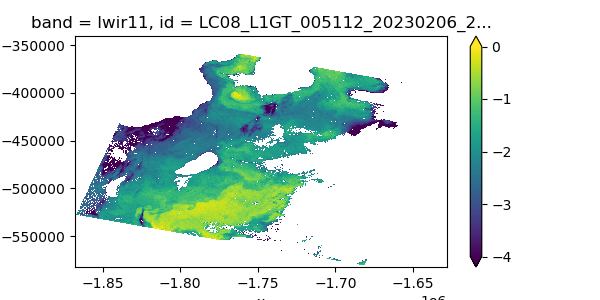

In [51]:
# January atm correction
plt.figure(figsize=(6, 3))
(SST).plot.imshow(x='x',y='y',vmin=-4,vmax=0)

(array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]),
 array([11223.        , 11977.09960938, 12731.20019531, 13485.29980469,
        14239.40039062, 14993.5       , 15747.59960938, 16501.69921875,
        17255.80078125, 18009.90039062, 18764.        ]),
 <a list of 7991 BarContainer objects>)

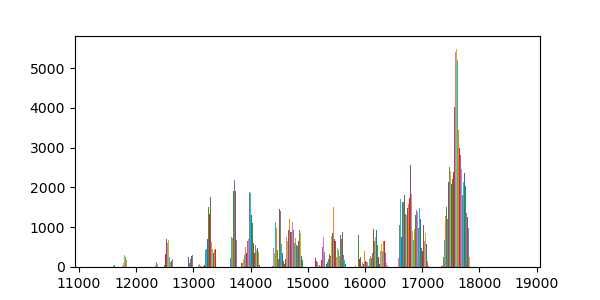

In [23]:
plt.figure(figsize=(6, 3))
plt.hist(DN_masked)

(array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]),
 array([261.53265381, 262.62966919, 263.72668457, 264.82369995,
        265.92071533, 267.01773071, 268.11474609, 269.21176147,
        270.30877686, 271.40579224, 272.50280762]),
 <a list of 7991 BarContainer objects>)

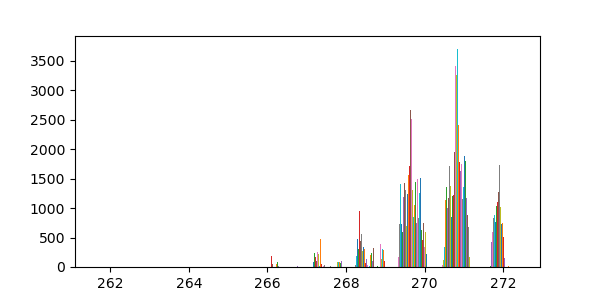

In [22]:
plt.figure(figsize=(6, 3))
plt.hist(toa)

In [32]:
for mo in ['05','11']:
    # Select appropriate atmospheric correction coefficients
    a_mo = mo
    a1 = atmcor[a_mo]['a1']
    a2 = atmcor[a_mo]['a2']
    a3 = atmcor[a_mo]['a3']
    print (f'{mo}: {a3 + a1*np.nanmean(toa) + a2*np.nanmean(wv3)*np.nanmean(toa) - 273.15}')
# Linear

05: -2.2590351534010438
11: -2.772665537320961


AttributeError: 'NoneType' object has no attribute 'plot'

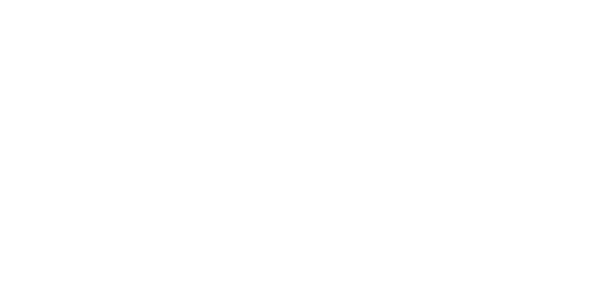

In [31]:
# Feb atm correction
plt.figure(figsize=(6, 3))
(SST).plot.imshow(x='x',y='y',vmin=-4,vmax=0)

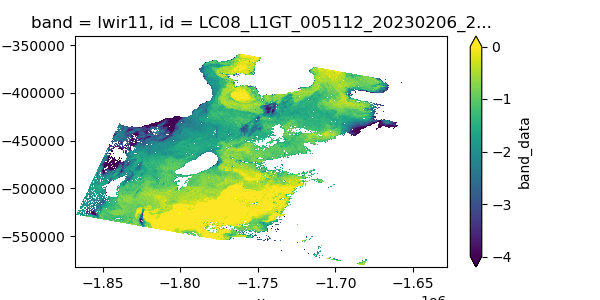

In [185]:
# January atm correction
plt.figure(figsize=(6, 3))
(SST).plot.imshow(x='x',y='y',vmin=-4,vmax=0)

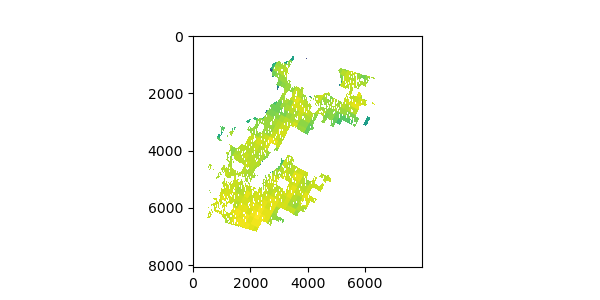

In [33]:
# no interpolation
plt.figure(figsize=(6, 3))
plt.imshow(wv0)

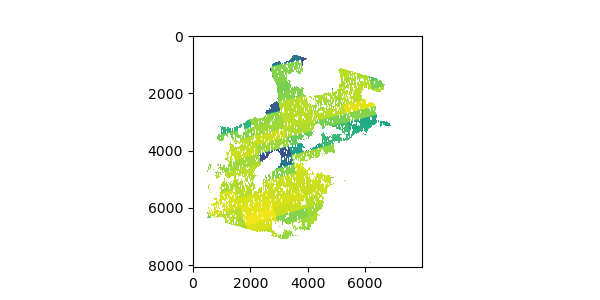

In [60]:
# no interpolation but remove 4% data
plt.figure(figsize=(6, 3))
plt.imshow(wv1)

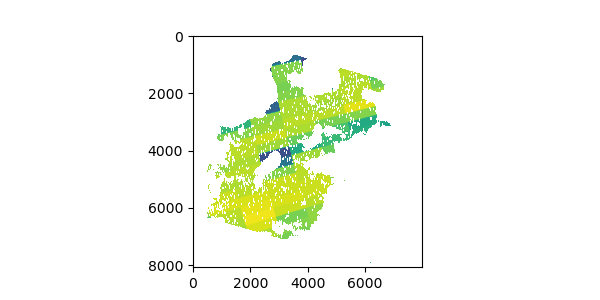

In [80]:
# Interpololation without masking
plt.figure(figsize=(6, 3))
# (ls_thermal*mask).plot.imshow(x='x',y='y')
# (SST).plot.imshow(x='x',y='y')
# (mod07.Water_Vapor).plot.pcolormesh(x='Longitude',y='Latitude')
# (ls_scene.sel(band='qa_pixel').compute()*mask).plot.imshow(x='x',y='y')
plt.imshow(wv3)

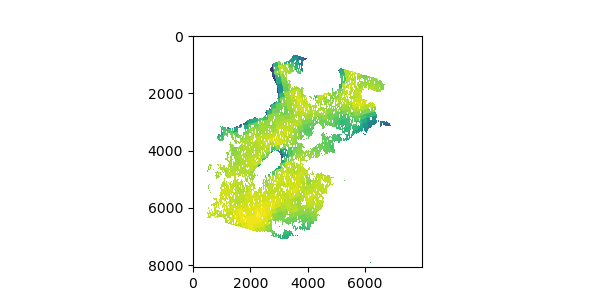

In [144]:
# Interpolation with masking
plt.figure(figsize=(6, 3))
plt.imshow(wv4)

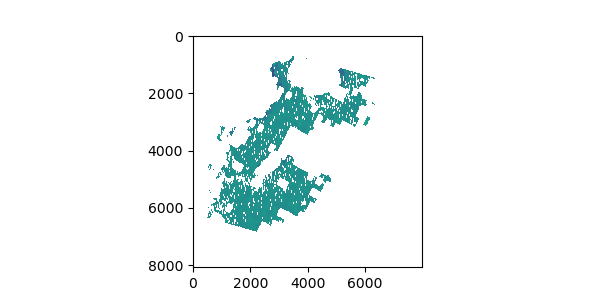

In [164]:
plt.figure(figsize=(6, 3))
plt.imshow(wv4-wv0)

In [163]:
np.unique(wv4-wv0,return_counts=True)

(array([-3.7e-04, -3.6e-04, -3.5e-04, -3.4e-04, -3.4e-04, -3.3e-04,
        -3.3e-04, -3.3e-04, -3.2e-04, -3.2e-04, -3.1e-04, -3.1e-04,
        -3.1e-04, -3.0e-04, -3.0e-04, -2.9e-04, -2.9e-04, -2.9e-04,
        -2.8e-04, -2.8e-04, -2.7e-04, -2.7e-04, -2.7e-04, -2.6e-04,
        -2.6e-04, -2.5e-04, -2.5e-04, -2.5e-04, -2.4e-04, -2.4e-04,
        -2.4e-04, -2.3e-04, -2.3e-04, -2.3e-04, -2.2e-04, -2.2e-04,
        -2.2e-04, -2.1e-04, -2.1e-04, -2.1e-04, -2.0e-04, -2.0e-04,
        -2.0e-04, -2.0e-04, -1.9e-04, -1.9e-04, -1.9e-04, -1.8e-04,
        -1.8e-04, -1.8e-04, -1.7e-04, -1.7e-04, -1.7e-04, -1.6e-04,
        -1.6e-04, -1.6e-04, -1.6e-04, -1.5e-04, -1.5e-04, -1.5e-04,
        -1.4e-04, -1.4e-04, -1.4e-04, -1.3e-04, -1.3e-04, -1.2e-04,
        -1.2e-04, -1.2e-04, -1.2e-04, -1.1e-04, -1.1e-04, -1.1e-04,
        -1.0e-04, -1.0e-04, -1.0e-04, -9.0e-05, -9.0e-05, -9.0e-05,
        -8.0e-05, -8.0e-05, -8.0e-05, -8.0e-05, -7.0e-05, -7.0e-05,
        -7.0e-05, -6.0e-05, -6.0e-05, -6.0e-05, 

In [ ]:
# Plot water vapor data ***need to comment out the delete code above for this to work
data0 = ls_thermal*mask
plt.figure(figsize=(6, 3))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_global()
cb = ax.pcolormesh(data0.x,data0.y,data0.values,vmin=14000,vmax=17800,transform=cartopy.crs.epsg(3031))
ax.coastlines()
ax.set_ylim([-78, -72])
ax.set_xlim([-111,-101])
cbar = plt.colorbar(cb)
plt.tight_layout()

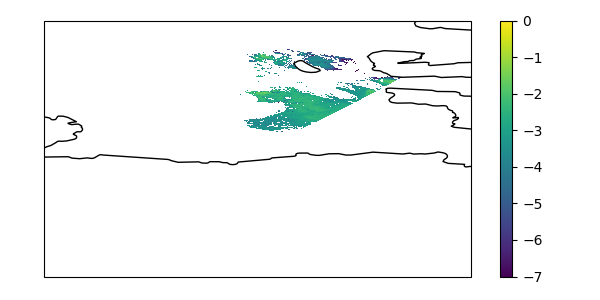

In [29]:
# Plot water vapor data ***need to comment out the delete code above for this to work
data0 = SST
plt.figure(figsize=(6, 3))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_global()
cb = ax.pcolormesh(data0.x,data0.y,data0.values,vmin=-7,vmax=0,transform=cartopy.crs.epsg(3031))
ax.coastlines()
ax.set_ylim([-78, -72])
ax.set_xlim([-111,-101])
cbar = plt.colorbar(cb)
plt.tight_layout()

## Plotting Landat blue to check images

In [23]:
from matplotlib.patches import Polygon as Pgon

In [24]:
lsatfiles = ['LC08_L1GT_007112_20210926_20210930_02_T2_152850_Cel.tif',
 'LC08_L1GT_007113_20210926_20210930_02_T2_152914_Cel.tif',
 'LC08_L1GT_012112_20211202_20211209_02_T2_155947_Cel.tif',
 'LC08_L1GT_010112_20211204_20211214_02_T2_154725_Cel.tif',
 'LC08_L1GT_162132_20211213_20211223_02_T2_073448_Cel.tif',
 'LC08_L1GT_007112_20211215_20211223_02_T2_152851_Cel.tif',
 'LC08_L1GT_163131_20211220_20211229_02_T2_074034_Cel.tif',
 'LC08_L1GT_010112_20211220_20211229_02_T2_154723_Cel.tif',
 'LC08_L1GT_008112_20211222_20211230_02_T2_153500_Cel.tif',
 'LC08_L1GT_008113_20211222_20211230_02_T2_153524_Cel.tif',
 'LC08_L1GT_164131_20211227_20220105_02_T2_074642_Cel.tif',
 'LC08_L1GT_011112_20211227_20220105_02_T2_155331_Cel.tif',
 'LC08_L1GT_009112_20211229_20220105_02_T2_154108_Cel.tif',
 'LC08_L1GT_163131_20220105_20220114_02_T2_074029_Cel.tif',
 'LC08_L1GT_010112_20220105_20220114_02_T2_154718_Cel.tif',
 'LC08_L1GT_008112_20220107_20220114_02_T2_153456_Cel.tif',
 'LC08_L1GT_008113_20220107_20220114_02_T2_153520_Cel.tif',
 'LC08_L1GT_164131_20220112_20220122_02_T2_074639_Cel.tif',
 'LC08_L1GT_011112_20220112_20220123_02_T2_155328_Cel.tif',
 'LC08_L1GT_010112_20220121_20220128_02_T2_154714_Cel.tif',
 'LC08_L1GT_008112_20220123_20220128_02_T2_153452_Cel.tif',
 'LC08_L1GT_007112_20220201_20220211_02_T2_152839_Cel.tif',
 'LC08_L1GT_007113_20220201_20220211_02_T2_152903_Cel.tif',
 'LC08_L1GT_012112_20220204_20220212_02_T2_155933_Cel.tif',
 'LC08_L1GT_010112_20220206_20220212_02_T2_154711_Cel.tif',
 'LC08_L1GT_007112_20221202_20221212_02_T2_152905_Cel.tif',
 'LC08_L1GT_007113_20221202_20221212_02_T2_152929_Cel.tif',
 'LC08_L1GT_009112_20221216_20221227_02_T2_154121_Cel.tif',
 'LC08_L1GT_012112_20221221_20221228_02_T2_155948_Cel.tif',
 'LC08_L1GT_010112_20221223_20230103_02_T2_154726_Cel.tif',
 'LC08_L1GT_008112_20221225_20230113_02_T2_153505_Cel.tif',
 'LC08_L1GT_008113_20221225_20230113_02_T2_153529_Cel.tif',
 'LC08_L1GT_163131_20230108_20230124_02_T2_074038_Cel.tif',
 'LC08_L1GT_010112_20230108_20230124_02_T2_154727_Cel.tif',
 'LC08_L1GT_161132_20230110_20230124_02_T2_072839_Cel.tif',
 'LC08_L1GT_008112_20230110_20230124_02_T2_153504_Cel.tif',
 'LC08_L1GT_009112_20230117_20230131_02_T2_154109_Cel.tif',
 'LC08_L1GT_009113_20230117_20230131_02_T2_154132_Cel.tif',
 'LC08_L1GT_012112_20230122_20230207_02_T2_155945_Cel.tif',
 'LC08_L1GT_011112_20230131_20230208_02_T2_155337_Cel.tif',
 'LC08_L1GT_009112_20230202_20230209_02_T2_154115_Cel.tif',
 'LC08_L1GT_009113_20230202_20230209_02_T2_154139_Cel.tif',
 'LC08_L1GT_007113_20230204_20230209_02_T2_152917_Cel.tif',
 'LC08_L1GT_007112_20230308_20230320_02_T2_152829_Cel.tif',
 'LC08_L1GT_007113_20230308_20230320_02_T2_152853_Cel.tif',
 'LC08_L1GT_012112_20230311_20230320_02_T2_155924_Cel.tif']

In [25]:
catalog_list = [x for x in items if any(x.id == filename[:-15] for filename in lsatfiles)]

In [26]:
# SSTpath = lsatpath / 'SST/MODcalib/Cosgrove/'
# bbox = (-103.0, -73.5, -102.0, -73.42) # LatboundsC from LandsatCalibration20201031
SSTpath = lsatpath / 'SST/MODcalib/DotsonPolynya/'

# SSTpath = lsatpath / 'SST/UncalibratedSST/PineIslandPlume/'
# bbox = (-101.98,-75.09,-101.65,-75.05) # PIG plume for analysis - 2014
# bbox = (-101.88,-75.23,-100.35,-74.76) # PIG ice front for analysis
# bbox = (-101.8,-75.23,-100.50,-74.80) # PIG 2019?
# SSTpath = lsatpath / 'SST/Validation/DotsonIntercomp/'
# bbox = (-113.5,-74.20,-113.17,-74.11) # Dotson plume for analysis 

# Convert bounding box to polar for checking if landsat has any data in bounding box
source_crs = 'epsg:4326' 
target_crs = 'epsg:3031' # Coordinate system of the file

bbox = (-113, -73.9, -111.5, -73.5) # Dotson polynya
bbox1,checkbox = lsat_reproj(source_crs,target_crs,(bbox[0],bbox[1],bbox[2],bbox[3]))

bbox = (-113.5,-74.20,-113.17,-74.11) # Dotson plume for analysis 
bbox2,checkbox = lsat_reproj(source_crs,target_crs,(bbox[0],bbox[1],bbox[2],bbox[3]))

lsat_reproj normal orientation
bbox=[(-1661288.422933332, -705175.0979957702), (-1620494.5472650512, -687859.1251189994), (-1637945.2970177971, -645203.8109795384), (-1679178.4729706317, -661445.990930234)]
lbox=(-113, -73.9, -111.5, -73.5)
checkbox=[-113.   -73.9 -111.5  -73.5]
lsat_reproj normal orientation
bbox=[(-1593109.0801169195, -692703.5426974659), (-1583974.6675212178, -688731.7870628558), (-1587915.183520055, -679597.3747787862), (-1597072.3201527703, -683516.4543874896)]
lbox=(-113.5, -74.2, -113.17, -74.11)
checkbox=[-113.5   -74.2  -113.17  -74.11]


LC08_L1GT_012112_20230311_20230320_02_T2


TypeError: cannot unpack non-iterable Figure object

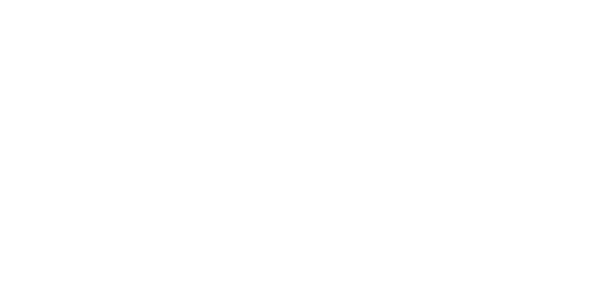

In [27]:
for sceneid in catalog_list:
    print(sceneid.id)
    
    scene = catalog[sceneid.id]
    timestr = scene.metadata['datetime'].strftime('%H%M%S')

    # Open all desired bands for one scene
    ls_scene = landsat_to_xarray(sceneid,catalog)
    ls_scene = ls_scene.rio.write_crs("epsg:3031", inplace=True)

    blue = ls_scene.sel(band='blue')

    fig,ax1 = plt.figure(figsize=(6, 3))
    blue.plot.imshow(x='x',y='y')
    polygon_show1 = Pgon(bbox1, closed=True, edgecolor='red', facecolor='none')
    ax1.add_patch(polygon_show1)
    polygon_show2 = Pgon(bbox2, closed=True, edgecolor='red', facecolor='none')
    ax1.add_patch(polygon_show2)
    plt.show()

    # # Create classification mask
    # ls_scene = create_masks(ls_scene, cloud_mask=True, ice_mask=True, ocean_mask=True)
    
    # try:
    #     # Check for any open ocean pixels in bounding box - go to next image if none - 9.3 s
    #     mask = np.ones(ls_scene.shape[1:])
    #     mask[ls_scene.mask!=3] = np.nan
    #     ls_thermal = ls_scene.sel(band='lwir11').compute()
    #     ls_box = subset_img(ls_thermal*mask,polarx,polary)
    #     # ls_box = (ls_thermal*mask).sel(y=slice(polary[1],polary[0]),x=slice(polarx[0],polarx[1]))
    #     ls_box = ls_box.where(ls_box >= -3.5, np.nan)

    #     if ((ls_box).notnull()).sum().values==0:
    #         print (f'{sceneid.id} has no SSTs')
    #         try:
    #             del ls_scene, scene, mask, ls_thermal, ls_box
    #         except:
    #             pass
    #         gc.collect()
    #         continue
        
    #     # Use band ratios for RF cloud pixel classification
    #     # ###

    #     # Atmospheric correction using MODIS
    #     # Acquire and align MODIS water vapor (MOD/MYD07) to Landsat
    #     mod07,modfilenm = open_MODIS(ls_scene,scene,modout_path)

    #     # Create water vapor files aligned and subsampled to Landsat
    #     spacing = [300,-300] # 300m sampling of MODIS data so that upsampling is easy and because 30m takes far too long, 1 must be negative for MODISlookup

    #     #***has not yet been tested to ensure no interp works properly
    #     WV_xr = get_wv(ls_scene,mod07,spacing,WV,scene,interp=interp)

    #     # Create SST by masking and using water vapor to apply month-specific atmospheric correction
    #     SST = apply_NLSST(ls_thermal,scene,mask,WV_xr,atmcor)

    #     # Record MODIS water vapor image used in atmospheric correction, will find this info save under band_data in
    #     # data variables in COG (click on white paper info button in xarray readout)
    #     SST.attrs['MODIS_WV'] = modfilenm

    #     print (f'Mean SST: {np.nanmean(SST)}')

    #     # Save to a cloud-optimized Geotiff
    #     SST.rio.to_raster(raster_path=outFile, driver="COG")
        
    # except Exception as e:
    #     print (f'{sceneid.id} has no SSTs: {e}')
    
    # try:
    #     del ls_scene, scene, ls_thermal, ls_box, mod07, WV_xr, SST
    # except:
    #     pass
        
    gc.collect()
    break

## Testing code

In [21]:
# Get date/time for Landsat image and search for corresponding MODIS imagery  
# ls_time = ls_scene.time.values.item()

# Get spatial extent of Landsat scene in lat/lon
mbbox = (scene.metadata['bbox'][0], scene.metadata['bbox'][1], scene.metadata['bbox'][2], scene.metadata['bbox'][3]) #(west, south, east, north) 
lsatpoly = Polygon([(mbbox[0],mbbox[1]),(mbbox[0],mbbox[3]),(mbbox[2],mbbox[3]),(mbbox[2],mbbox[1]),(mbbox[0],mbbox[1])]) # ensure full lineup between landsat and modis

# start_dt = ls_time[0:10]
# calc_dt = datetime.strptime(start_dt, '%Y-%m-%d')
# end_dt = (calc_dt + timedelta(days=1)).strftime('%Y-%m-%d')
ls_time = pd.to_datetime(ls_scene.time.values)
calc_dt = datetime.strptime(ls_time.strftime('%Y-%m-%d %H:%M:%S'), '%Y-%m-%d %H:%M:%S')
start_dt = (calc_dt + timedelta(days=-0.5)).strftime('%Y-%m-%d %H:%M:%S')
end_dt = (calc_dt + timedelta(days=0.5)).strftime('%Y-%m-%d %H:%M:%S')

# Gather all files from search location from Terra and Aqua for the same day as the Landsat image
results = earthaccess.search_data(
    short_name='MOD07_L2',
    bounding_box=mbbox,
    # Day of a landsat scene to day after - searches day of only
    temporal=(start_dt,end_dt)
)
results2 = earthaccess.search_data(
    short_name='MYD07_L2',
    bounding_box=mbbox,
    # Day of a landsat scene to day after - searches day of only
    temporal=(start_dt,end_dt)
)
results = results + results2
print (f'{len(results)} TOTAL')

# Accept only granules that overlap at least 90% with Landsat
best_grans = []
for granule in results:
    try:
        granule['umm']['SpatialExtent']['HorizontalSpatialDomain']['Geometry']['GPolygons']
    except Exception as error:
        print(error)
        continue
    for num in range(len(granule['umm']['SpatialExtent']['HorizontalSpatialDomain']['Geometry']['GPolygons'])):
        try:
            map_points = [(xi['Longitude'],xi['Latitude']) for xi in granule['umm']['SpatialExtent']['HorizontalSpatialDomain']['Geometry']['GPolygons'][num]['Boundary']['Points']]
            pgon = Polygon(map_points)
            percent_dif = lsatpoly.difference(pgon).area/lsatpoly.area
            if percent_dif < 0.1:
                if crosses_idl(map_points):
                    print (f'A granule has messed up polygon that likely crosses the International DateLine')
                else:
                    best_grans.append(granule)
                    continue
        except Exception as error:
            print(error)
            # Would love to raise an exception for a valueerror except for GEOSError but not sure how 
print(f'{len(best_grans)} TOTAL w overlap')

# Find MODIS image closest in time to the Landsat image
Mdates = [pd.to_datetime(granule['umm']['TemporalExtent']['RangeDateTime']['BeginningDateTime']) for granule in best_grans]
ind = Mdates.index(min( Mdates, key=lambda x: abs(x - pytz.utc.localize(pd.to_datetime(ls_time)))))
print(abs(Mdates[ind] - pytz.utc.localize(pd.to_datetime(ls_time))))


# Download MODIS data if needed

# # This doesn't work because xarray can't open legacy HDF EOS data formats
# mod07 = xr.open_mfdataset(earthaccess.open(results))

# Use these access pathways while S3 streaming is not working
data_links = [granule.data_links(access="external") for granule in best_grans[ind:ind+1]]
netcdf_list = [g._filter_related_links("USE SERVICE API")[0].replace(".html", ".nc4") for g in best_grans[ind:ind+1]]
# This is going to be slow as we are asking Opendap to format HDF into NetCDF4 so we only processing 3 granules
# and Opendap is very prone to failures due concurrent connections, not ideal.
file_handlers = earthaccess.download(netcdf_list, modout_path,provider='NSIDC')


# Open MODIS data
mod_list = os.listdir(modout_path)
mod_list = [file for file in mod_list if file[-3:]=='nc4']
print(mod_list)
modfilenm = mod_list[0]

mod07 = xr.open_dataset(f'{modout_path}/{mod_list[0]}')
mod07 = mod07.rio.write_crs('epsg:4326')

Granules found: 10
Granules found: 10
20 TOTAL
A granule has messed up polygon that likely crosses the International DateLine
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: Input geom 1 is invalid: Self-intersection at -75.891037882737649 -71.714827762325314
A granule has messed up polygon that likely crosses the International DateLine
A granule has messed up polygon that likely crosses the International DateLine
A granule has messed up polygon that likely crosses the International DateLine
6 TOTAL w overlap
0 days 01:12:17


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2023096.1345.061.2023133105537.hdf.nc4', 'MOD07_L2.A2023094.1540.061.2023133095851.hdf.nc4']


In [35]:
%%time
# Read in desired variables and paths

param = WV
spacing = [300,-300]
interp=1

uniqWV = []

ULX = ls_scene.x[0] 
ULY = ls_scene.y[0]  
LRX = ls_scene.x[-1] 
LRY = ls_scene.y[-1] 
box = [ULX,LRX,ULY,LRY]

#Extract desired datasets from MODIS file from lookup key
data = mod07[param].values
lat, lon = mod07.Latitude, mod07.Longitude
#data.attributes()

# Test lat is in correct range
if ~((lat < 90) & (lat > -90)).all():
    print('MODIS latitude not between -90 and 90')
# Test lon is in correct range
if ~((lon < 180) & (lon > -180)).all():
    print('MODIS longitude not between -180 and 180')

# Interpolate using PyGMT
# Extract necessary data into Pandas DataFrame (required for PyGMT)
df = pd.DataFrame({
    'longitude': lon.values.flatten(),
    'latitude': lat.values.flatten(),
    'water_vapor': data.flatten()
})

# Remove missing or NaN values from DataFrame, as `surface` cannot handle them
df = df.dropna(subset=['water_vapor'])

# Set the region of interest [xmin, xmax, ymin, ymax] - make this the full image
region = [df.longitude.min(), df.longitude.max(), df.latitude.min(), df.latitude.max()]
# region = [scene.metadata['bbox'][0],  scene.metadata['bbox'][2], scene.metadata['bbox'][1], scene.metadata['bbox'][3]]

# Create a PyGMT session
with pygmt.clib.Session() as session:
    # Run the surface function
    grid = pygmt.surface(
        data=df[['longitude', 'latitude', 'water_vapor']].to_numpy(),  # Input data as NumPy array
        region=region,  
        spacing=f'0.3k',  
        tension=0.25,  
    )
# lat = grid.lat
# lon = grid.lon

    
data = grid.values

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 16697 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


CPU times: user 453 ms, sys: 4.64 ms, total: 457 ms
Wall time: 753 ms


In [36]:
# # Test for correct projection
# transformer_3031_to_4326 = pyproj.Transformer.from_crs("EPSG:3031", "EPSG:4326", always_xy=True)
# transformer_4326_to_3031 = pyproj.Transformer.from_crs("EPSG:4326", "EPSG:3031", always_xy=True)

# # Test points in EPSG:3031
# test_points = np.array([[-1000000, -1000000], [1000000, 1000000]])  # Add more points as needed

# # Round-trip transformation
# for point in test_points:
#     lat, lon = transformer_3031_to_4326.transform(*point)
#     x, y = transformer_4326_to_3031.transform(lat, lon)
#     if np.linalg.norm(np.array([x, y]) - point) > some_acceptable_threshold:
#         print(f"Round-trip transformation error for point {point}")

In [41]:
%%time
interpgrid=grid
test_threshold = 10

#modlookup
if interpgrid is None:
    lat, lon = mod07.Latitude.values, mod07.Longitude.values # Different for SST vs WV
else:
    lat, lon = interpgrid.lat, interpgrid.lon
    lon, lat = np.meshgrid(lon,lat)

# Test lat is in correct range
if ~((lat < 90) & (lat > -90)).all():
    print('MODIS latitude not between -90 and 90')
# Test lon is in correct range
if ~((lon < 180) & (lon > -180)).all():
    print('MODIS longitude not between -180 and 180')
    
# Get the existing coordinate system
old_cs = ls_scene.rio.crs #crs[6:] # 'epsg:3031'
new_cs = mod07.rio.crs #'epsg:4326'

# Create a transform object to convert between coordinate systems
inProj = Proj(init=old_cs)
outProj = Proj(init=new_cs)

# Parse coordinates and spacing to different variables
west,east,north,south = box
ewspace,nsspace = spacing

# Setting up grid, x coord from here to here at this spacing, mesh grid makes 2D
samples = len(np.r_[west:east+1:ewspace])
lines = len(np.r_[north:south-1:nsspace])#ns space is -300, could also do 30 instead of 300, but would just have duplicate pixels
if lines==0:
    lines = len(np.r_[south:north-1:nsspace])

# x1, y1 = np.meshgrid(np.r_[west:east:ewspace],np.r_[north:south:nsspace]) # offset by 1 meter to preserve shape
ewdnsamp = int(spacing[0]/30)
nsdnsamp = int(spacing[1]/30)

# Set up coarser sampling and check to make sure is in the same orientation as the original Landsat grid
# If length issues arise it is because spacing should be -300 for y
xresamp = ls_scene.x.values[0::ewdnsamp]
if len(xresamp)==1:
    xresamp = ls_scene.x.values[0::-ewdnsamp]
if xresamp[0]!=ls_scene.x.values[0]:
    xresamp = np.flip(xresamp)
    print ('x flip')
yresamp = ls_scene.y.values[0::nsdnsamp]
if len(yresamp)==1:
    yresamp = ls_scene.y.values[0::-nsdnsamp]
if yresamp[0]!=ls_scene.y.values[0]:
    yresamp = np.flip(yresamp)
    print ('y flip')
x1, y1 = np.meshgrid(xresamp,yresamp)
LScoords = np.vstack([x1.ravel(),y1.ravel()]).T
if (LScoords[0,0]!=ls_scene.x.values[0]) |  (LScoords[0,1]!=ls_scene.y.values[0]):
    raise Exception(f'Landsat coordinates do not match expected during MODIS lookup')

# Ravel so ND can lookup easily
# Convert from LS map coords to lat lon --> x = lon, y = lat (usually?)
# Test that reprojection is working correctly on first and last grid point using round-trip transformation
xs1, ys1 =  transform(inProj,outProj,LScoords[0,0], LScoords[0,1], radians=True, always_xy=True)
xsl1, ysl1 =  transform(outProj,inProj,xs1, ys1, radians=True, always_xy=True)
if np.linalg.norm(np.array([xsl1, ysl1]) - LScoords[0,:]) > test_threshold:
    print(f"Round-trip transformation error for point {LScoords[0,:]}, {np.linalg.norm(np.array([xsl1, ysl1]) - LScoords[0,:])}")
else:
    # If passes, run on entire grid
    xs, ys =  transform(inProj,outProj,LScoords[:,0], LScoords[:,1], radians=True, always_xy=True)

# Produce landsat reprojected to lat/lon and ensure lat is in 0 column
# Test: landsat data is in correct orientation as long as lat is in col 0 and lon in col 1
grid_coords = test_gridcoords(xs,ys,scene)

# Test that lines and samples match grid_coords
if len(grid_coords) != lines*samples:
    raise Exception(f'Size of grid coordinates do not match low resolution Landsat dims: {len(grid_coords)} vs. {lines*samples}')
MODIS_coords = np.vstack([lat.ravel(),lon.ravel()]).T
MODIS_coords *= np.pi / 180. # to radians

# Build lookup, haversine = calc dist between lat,lon pairs so can do nearest neighbor on sphere - if did utm it would be planar
MOD_Ball = BallTree(MODIS_coords,metric='haversine') #sklearn library
#LS_Ball = BallTree(grid_coords,metric='haversine') # In case want reverse coordinate for Landsat
# Query modis coords with landsat coords, gives distance between and index for nearest neighbor
distanceMOD, indiciesMOD= MOD_Ball.query(grid_coords, dualtree=True, breadth_first=True)

Latitude in proper position
CPU times: user 13.3 s, sys: 11.8 ms, total: 13.3 s
Wall time: 13.2 s


In [44]:
nsdnsamp = int(-300/30)
ls_scene.y.values[0::-nsdnsamp].shape

(840,)

In [38]:
%%time
# Unique MODIS

# Convert from K to C
KtoC = -273.15

# #Extract desired datasets from MODIS file from lookup key
# data = mod07[param]
# lat, lon = mod07.Latitude, mod07.Longitude


# if interp==1:        
#     # Interpolate using PyGMT    
#     # Assume `ds` is your xarray DataSet
#     # Extract necessary data into Pandas DataFrame (modify this step based on your actual data structure)
#     df = pd.DataFrame({
#         'longitude': lon.values.flatten(),
#         'latitude': lat.values.flatten(),
#         'water_vapor': data.values.flatten()
#     })

#     # Remove missing or NaN values from DataFrame, as `surface` cannot handle them
#     df = df.dropna(subset=['water_vapor'])

#     # Set the region of interest [xmin, xmax, ymin, ymax]
#     region = [df.longitude.min(), df.longitude.max(), df.latitude.min(), df.latitude.max()]
#     # region = [scene.metadata['bbox'][0],  scene.metadata['bbox'][2], scene.metadata['bbox'][1], scene.metadata['bbox'][3]]

#     # Create a PyGMT session
#     with pygmt.clib.Session() as session:
#         # Run the surface function
#         grid = pygmt.surface(
#             data=df[['longitude', 'latitude', 'water_vapor']].to_numpy(),  # Input data as NumPy array
#             region=region,  
#             spacing=f'0.6k',  
#             tension=0.25,  
#         )
#     data = grid


#     # # Interpolate using scikit gaussian process
#     # # Extract longitude, latitude, and water vapor data, flattening the arrays
#     # # Adjust the variable names as per your actual dataset

#     # Prepare the input features as a 2D array and target variable
#     X = np.vstack((lon.values.flatten(), lat.values.flatten())).T
#     y = data.values.flatten()

#     # Removing NaN values (you may want to handle this more gracefully)
#     mask = ~np.isnan(y)
#     X_mask = X[mask]
#     y = y[mask]
    
#     subsample_indices = np.random.choice(len(y), size=5000, replace=False)  # Adjust size as needed
#     X_subsampled = X_mask[subsample_indices]
#     y_subsampled = y[subsample_indices]

#     # Fit the Gaussian Process Model
#     # Define Matern kernel
#     kernel = GPy.kern.Matern52(input_dim=2, variance=1., lengthscale=15.)

#     # Initialize Sparse GP using inducing inputs
#     z = X_subsampled.copy()  # Inducing inputs, you might need to choose these more carefully
#     model = GPy.models.SparseGPRegression(X_mask, y.reshape(-1, 1), kernel, Z=z)
    
#     # Optimize the model parameters
#     model.optimize(optimizer='bfgs', max_iters=3, messages=True)
#     model.plot()
#     print (model)
    
#     # Make predictions
#     results, variance = model.predict(X)

#     data = results.reshape(lat.shape)
# else:
#     print('No interpolation')
#     data = data.values

    
#     # Interpolate using Spherical Krigging
#     data_flat = data.values.flatten()
#     lat_flat = lat.values.flatten()
#     lon_flat = lon.values.flatten()

#     mask = ~np.isnan(data_flat)
#     lon_valid = lon_flat[mask]
#     lat_valid = lat_flat[mask]
#     data_valid = data_flat[mask]

#     # Create the kriging object using the valid data - gaussian sucks, sph and exp both look pretty good
#     OK = OrdinaryKriging(lon_valid, lat_valid, data_valid, variogram_model='spherical', verbose=True)

#     # # Predict using the original irregular grid locations
#     # z, ss = OK.execute('points', lon_flat, lat_flat)
#     # data = z.reshape(lat.shape)

#     # Using ray to parallelize the spherical krigging
#     # Define chunk size and calculate number of chunks
#     chunk_size = 10000  # example value, adjust as necessary
#     num_chunks = len(lon_flat) // chunk_size + (len(lon_flat) % chunk_size != 0)

#     # Placeholder for results
#     results = np.zeros_like(data_flat)

#     ray.init() #num_cpus=4)

#     OK_r = ray.put(OK)

#     @ray.remote        
#     def kriging_chunk(i, chunk_size, lon_flat, lat_flat, OK):
#         start_idx = i * chunk_size
#         end_idx = (i + 1) * chunk_size

#         # Subset data
#         lon_subset = lon_flat[start_idx:end_idx]
#         lat_subset = lat_flat[start_idx:end_idx]

#         # Kriging on subset
#         z, ss = OK.execute('points', lon_subset, lat_subset)
#         return start_idx, end_idx, z

#     # Launch Ray tasks
#     futures = [kriging_chunk.remote(i, chunk_size, lon_flat, lat_flat, OK_r) for i in range(num_chunks)]

#     # Collect results
#     for future in ray.get(futures):
#         start_idx, end_idx, z = future
#         results[start_idx:end_idx] = z

#     # When you're done with Ray, shut it down
#     ray.shutdown()

#     data = results.reshape(lat.shape)
# else:
#     data = data.values



# Regrid
if (np.shape(lat)== np.shape(lon)== np.shape(data))==False:
    raise Exception("Error in creating indicies, lat/lon and data shapes do not match")

# Reproject data from MODIS into corresponding postions for Landsat pixels for water vapor and ozone
if param == 'sst':
    dataOut = np.reshape(np.array(data.ravel())[indiciesMOD],(lines,samples))#* # to scale?
    dataOut[dataOut < -3] = np.nan
    MODimg = np.array(data)#* # to scale?
    MODimg[MODimg < 0] = np.nan
elif param == 'Water_Vapor':
    dataOut = np.reshape(np.array(data.ravel())[indiciesMOD],(lines,samples))
    dataOut[dataOut < 0] = np.nan
    MODimg = np.array(data)
    MODimg[MODimg < 0] = np.nan
elif param == 'Total_Ozone':
    dataOut = np.reshape(np.array(data.ravel())[indiciesMOD],(lines,samples))
    dataOut[dataOut < 225] = np.nan
    dataOut[dataOut > 430] = np.nan
    MODimg = np.array(data)
    MODimg[MODimg < 0] = np.nan

CPU times: user 2.82 ms, sys: 3.83 ms, total: 6.64 ms
Wall time: 5.21 ms


In [39]:
# EPSG 3031:
# Easting is always x, Northing is always y
# scene box is not necessarily oriented to same x/y directions
# 180 is the antimeridian of the projection

# -0 Easting, -3333134.03 Northing = -60N,-180E
# +0 Easting, -3333134.03 Northing = -60N,+180E

# -2356881.67 Easting, -2356881.67 Northing = -60N,-135E
# +2356881.67 Easting, -2356881.67 Northing = -60N,+135E

# -3333134.03 Easting, +0 Northing = -60N,-90E
# +3333134.03 Easting, +0 Northing = -60N,+90E

# -2356881.67 Easting, +2356881.67 Northing = -60N,-45E
# +2356881.67 Easting, +2356881.67 Northing = -60N,+45E

# +0 Easting, +3333134.03 Northing = -60N,+0E

In [40]:
# # Reproject the Landsat points, do they match the orientation of the modis grid?
# x1, y1 = transformer_test.transform(ls_scene.x.values[0], ls_scene.y.values[0])
# x2, y2 = transformer_test.transform(ls_scene.x.values[-1], ls_scene.y.values[-1])
# print(x1,x2)
# print(y1,y2)
# # To match MODIS, the landsat scene must be flipped in the x direction

In [41]:
# print(lon[0,0],lon[-1,-1])
# print(lat[0,0],lat[-1,-1])

In [42]:
# Align MODIS
test_threshold = 5

##***Don't forget to add uniqMODIS back in here
## dataOut,uniqWV = uniqMODIS2(......)

# Check grid directionality and create matching x/y for new grid
# Define the source and target coordinate reference systems (CRS)
src_crs = mod07.rio.crs #'epsg:4326'  MODIS
target_crs = ls_scene.rio.crs #crs[6:] # 'epsg:3031' Landsat

# Create a PyProj transformer
transformer = pyproj.Transformer.from_crs(src_crs, target_crs, always_xy=True)
transformer_test = pyproj.Transformer.from_crs(target_crs, src_crs, always_xy=True)

# Test that reprojection is working correctly on first and last modis grid point
xm1,xm2 = lon[0,0],lon[-1,-1]
ym1,ym2 = lat[0,0],lat[-1,-1]
xx,yy = [xm1,xm2], [ym1,ym2]
xs1, ys1 =  transformer.transform(xx,yy)
xsl1, ysl1 = transformer_test.transform(xs1, ys1)
for i,n in enumerate(xsl1):
    if np.linalg.norm(np.array([xsl1[i], ysl1[i]]) - [xx[i],yy[i]]) > test_threshold:
        print(f"Round-trip transformation error for {sceneid}, {np.linalg.norm(np.array([xsl1[i], ysl1[i]]) - xx[i],yy[i])}")

# # Reproject the Landsat points, do they match the orientation of the modis grid?
# xl1, yl1 = transformer_test.transform(ls_scene.x.values[0], ls_scene.y.values[0])
# xl2, yl2 = transformer_test.transform(ls_scene.x.values[-1], ls_scene.y.values[-1])

# Spacing to create x and y parameters at the correct spacing
red_y = int(abs(spacing[0]/30))
red_x = int(abs(spacing[1]/30))

# # if modis lat not in same orientation as Landsat grid lats, flip the data
# if yl1<yl2:
#     if ym1>ym2:
#         dataOut = np.flip(dataOut,axis=1)
#         print('Y flipped')
# else:
#     if ym1<ym2:
#         dataOut = np.flip(dataOut,axis=1)
#         print('Y flipped')

# # if modis lon not in same orientation as Landsat grid lons, flip the data
# if xl1<xl2:
#     if xm1>xm2:
#         dataOut = np.flip(dataOut,axis=0)
#         print('X flipped')
# else:
#     if xm1<xm2:
#         dataOut = np.flip(dataOut,axis=0)
#         print('X flipped')
    
# xgrid = ls_scene.x.values[::red_x]
# ygrid = ls_scene.y.values[::red_y]

# Set up coarser sampling and check to make sure is in the same orientation as the original Landsat grid
xgrid = ls_scene.x.values[::red_x]
if xgrid[0]!=ls_scene.x.values[0]:
    xgrid = np.flip(xgrid)
    print ('Align x flip')
ygrid = ls_scene.y.values[::red_y]
if ygrid[0]!=ls_scene.y.values[0]:
    ygrid = np.flip(ygrid)
    print ('Align y flip')
if (xgrid[0]!=ls_scene.x.values[0]) |  (ygrid[0]!=ls_scene.y.values[0]):
    raise Exception(f'Landsat coordinates do not match expected during MODIS align')

# Create xarray from numpy array
dataOut_xr = xr.DataArray(dataOut,name='SST',dims=["y","x"], coords={"latitude": (["y"],ygrid), "longitude": (["x"],xgrid)})
dataOutWV_xr = dataOut_xr

In [43]:
# dataOutWV_xr = xr.DataArray(dataOut,name='SST',dims=["y","x"], coords={"latitude": (["y"],ygrid), "longitude": (["x"],xgrid)})

# # Resample WV to Landsat resolution and interpolate with B-spline
# # Need to use 0.1k (this samples at .1 of the grid)
# # Output of shape fits and need to adjust x and y coords cuz are wrong
ups_factor = 30/spacing[0]
WV_upsample = pygmt.grdsample(grid=dataOutWV_xr, spacing=f'{ups_factor}k', interpolation='c')
# WV_upsample = xr.open_dataarray(lsatpath+'WV_upsample_B-spline_'+str(ls_scene.id.values))
# # Resample WV to Landsat resolution manual - no interpolation
# WV_resamp = MODresample(ls_scene,dataOutWV,y1,x1,spacing)

# Put into Xarray
# Sometimes spacing works properly with -1 and sometimes not
latnew = np.arange(dataOutWV_xr.latitude[0],dataOutWV_xr.latitude[-1]+1,(dataOutWV_xr.latitude[-1]-dataOutWV_xr.latitude[0])/(WV_upsample.shape[0]-1))
if (WV_upsample.shape[0]!=latnew.shape[0]):
    latnew = np.arange(dataOutWV_xr.latitude[0],dataOutWV_xr.latitude[-1]+1,(dataOutWV_xr.latitude[-1]-dataOutWV_xr.latitude[0])/(WV_upsample.shape[0]))

# lonnew = np.arange(dataOutWV_xr.longitude[0],dataOutWV_xr.longitude[-1]+1,(dataOutWV_xr.longitude[-1]-dataOutWV_xr.longitude[0])/(WV_upsample.shape[1]-1))
lonnew = np.arange(dataOutWV_xr.longitude[-1],dataOutWV_xr.longitude[0]-1,-(dataOutWV_xr.longitude[-1]-dataOutWV_xr.longitude[0])/(WV_upsample.shape[1]-1))
if (WV_upsample.shape[1]!=lonnew.shape[0]):
    # lonnew = np.arange(dataOutWV_xr.longitude[0],dataOutWV_xr.longitude[-1]+1,(dataOutWV_xr.longitude[-1]-dataOutWV_xr.longitude[0])/(WV_upsample.shape[1]))
    lonnew = np.arange(dataOutWV_xr.longitude[-1],dataOutWV_xr.longitude[0]-1,-(dataOutWV_xr.longitude[-1]-dataOutWV_xr.longitude[0])/(WV_upsample.shape[1]))

# Check to make sure coordinates in the same orientation as the previous grid
if latnew[0]!=dataOutWV_xr.latitude[0]:
    latnew = np.flip(latnew)
    print ('Upsample lat flip')
if lonnew[0]!=dataOutWV_xr.longitude[0]:
    lonnew = np.flip(lonnew)
    print ('Upsample lon flip')
if (latnew[0]!=dataOutWV_xr.latitude[0]) |  (lonnew[0]!=dataOutWV_xr.longitude[0]):
    raise Exception(f'Coordinates do not match expected after upsampling')
    
WV_xr = xr.DataArray(WV_upsample,name='SST',dims=["y","x"], coords={"latitude": (["y"],latnew), "longitude": (["x"],lonnew)})

# WV_xr = xr.DataArray(WV_upsample,name='WV',dims=["y","x"], coords={"latitude": (["y"],ls_scene.y.values), "longitude": (["x"],ls_scene.x.values)})
WV_xr = WV_xr.rio.write_crs("epsg:3031", inplace=True)
WV_xr = WV_xr.rename({'longitude':'x','latitude':'y'})


Upsample lon flip


In [26]:
import cartopy.feature as cfeature

In [ ]:
# Create a figure with two subplots side by side
fig, axs = plt.subplots(nrows=1, ncols=2, subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(12, 6))

grid_array = data.to_numpy()
grid_extent = [data.coords["Cell_Across_Swath"][0], data.coords["Cell_Across_Swath"][-1], data.coords["Cell_Along_Swath"][0], data.coords["Cell_Along_Swath"][-1]]

# Iterate over the subplots and plot the data
ax = axs[0]
# ax.set_extent(grid_extent)  # Set the extent of the plot to the extent of the grid
ax.imshow(grid_array, extent=grid_extent,origin='upper', cmap='viridis')  # Plot the grid data

grid_array = grid.to_numpy()
grid_extent = [grid.coords["lon"][0], grid.coords["lon"][-1], grid.coords["lat"][0], grid.coords["lat"][-1]]

ax1 = axs[1]
ax1.set_extent(grid_extent, crs=ccrs.PlateCarree())  # Set the extent of the plot to the extent of the grid
ax1.imshow(grid_array, extent=grid_extent, transform=ccrs.PlateCarree(), origin='upper', cmap='viridis')  # Plot the grid data
ax1.add_feature(cfeature.COASTLINE)  # Add coastlines to the plot
ax1.add_feature(cfeature.BORDERS, linestyle=':')  # Add country borders to the plot

# Show the plot
plt.show()

In [49]:
# data.to_netcdf("mod07data.nc")
# lat.to_netcdf("mod07lat.nc")
# lon.to_netcdf("mod07lon.nc")

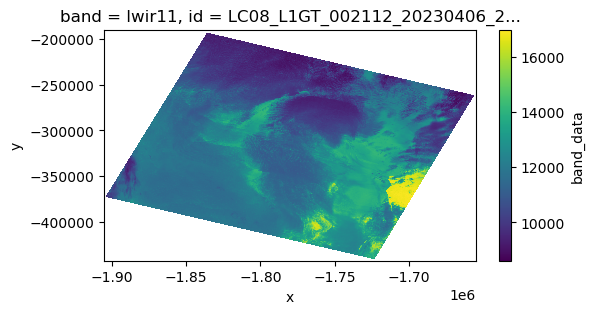

In [32]:
plt.figure(figsize=(6, 3))
ls_thermal.plot.imshow(x='x',y='y')#,vmin=0,vmax=0.0008)
# (dataOutWV_xrGPy-dataOutWV_xrK).plot.imshow(x='longitude',y='latitude',vmin=-0.00012,vmax=0.00012)

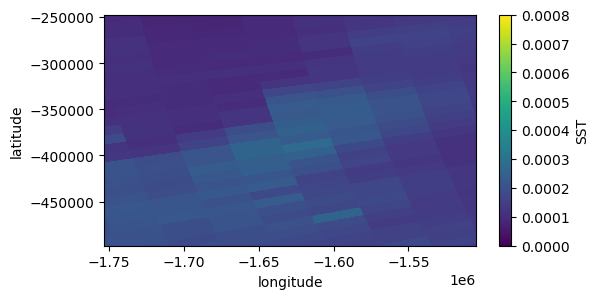

In [122]:
plt.figure(figsize=(6, 3))
dataOutWV_xr.plot.imshow(x='longitude',y='latitude',vmin=0,vmax=0.0008)
# (dataOutWV_xrGPy-dataOutWV_xrK).plot.imshow(x='longitude',y='latitude',vmin=-0.00012,vmax=0.00012)

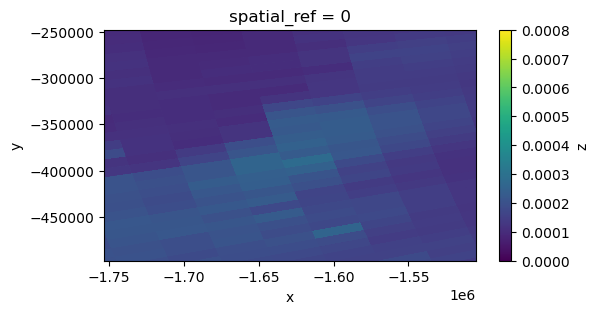

In [123]:
plt.figure(figsize=(6, 3))
WV_xr.plot.imshow(x='x',y='y',vmin=0,vmax=0.0008)

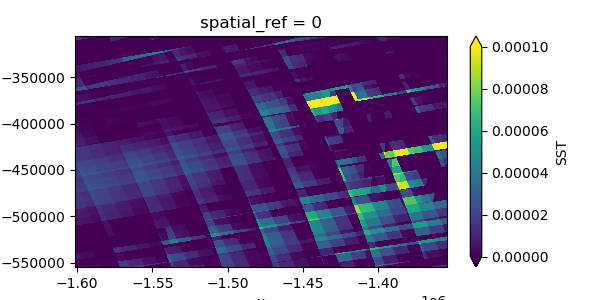

In [333]:
plt.figure(figsize=(6, 3))
(WV_xr-WV_xrK).plot.imshow(x='x',y='y',vmin=0,vmax=0.0001)

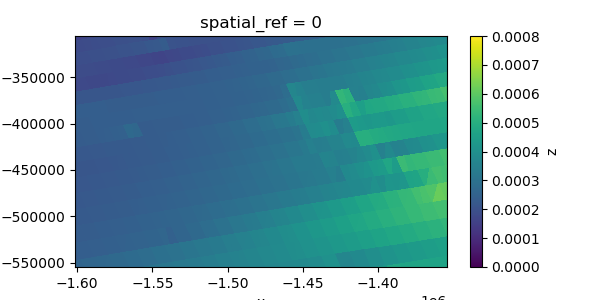

In [308]:
plt.figure(figsize=(6, 3))
WV_xrK.plot.imshow(x='x',y='y',vmin=0,vmax=0.0008)

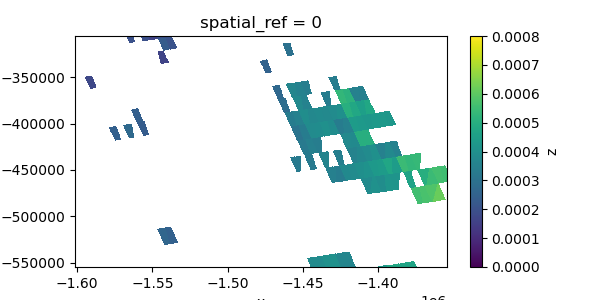

In [318]:
plt.figure(figsize=(6, 3))
WV_xr.plot.imshow(x='x',y='y',vmin=0,vmax=0.0008)

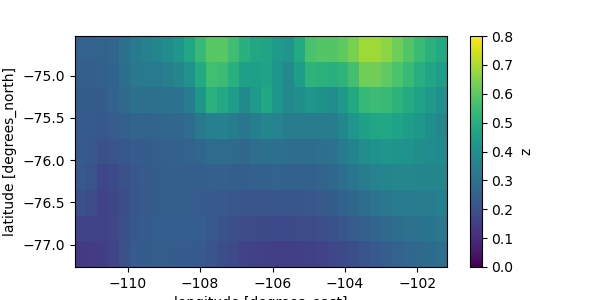

In [208]:
plt.figure(figsize=(6, 3))
dataPG_sub300.plot.imshow(x='lon',y='lat',vmin=0,vmax=0.8)

In [ ]:
# Plot water vapor data ***need to comment out the delete code above for this to work
data0 = mod07[WV]
plt.figure(figsize=(6, 3))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_global()
cb = ax.pcolormesh(data0.Longitude,data0.Latitude,data0.values,vmin=0,vmax=0.8,transform=ccrs.PlateCarree())
ax.coastlines()
ax.set_ylim([-90, -55])
ax.set_xlim([-135,-62.5])
# ax.set_ylim([-75, -72])
# ax.set_xlim([-107,-100])
cbar = plt.colorbar(cb)
plt.tight_layout()

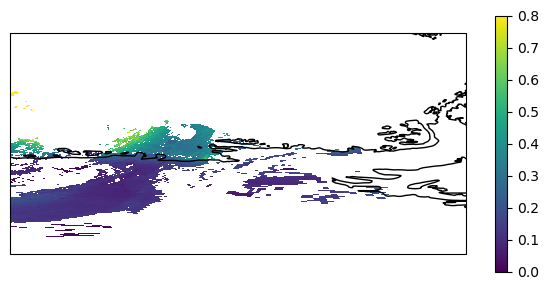

In [66]:
# Plot water vapor data ***need to comment out the delete code above for this to work
data0 = mod07[param]
plt.figure(figsize=(6, 3))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_global()
cb = ax.pcolormesh(data0.Longitude,data0.Latitude,data0.values,vmin=0,vmax=0.8,transform=ccrs.PlateCarree())
ax.coastlines()
ax.set_ylim([-90, -55])
ax.set_xlim([-135,-62.5])
# ax.set_ylim([-75, -72])
# ax.set_xlim([-107,-100])
cbar = plt.colorbar(cb)
plt.tight_layout()

In [ ]:
# Plot water vapor data ***need to comment out the delete code above for this to work
plt.figure(figsize=(6, 3))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_global()
# cb = ax.pcolormesh(lon,lat,dataK,vmin=0,vmax=0.8,transform=ccrs.PlateCarree())
# cb = ax.pcolormesh(lon,lat,data,vmin=0,vmax=0.8,transform=ccrs.PlateCarree())
# cb = ax.pcolormesh(dataPG_sub30.lon,dataPG_sub30.lat,dataPG_sub30,vmin=0,vmax=0.8,transform=ccrs.PlateCarree())
# cb = ax.pcolormesh(lon,lat,dataGPy-dataK,vmin=-0.15,vmax=0.15,transform=ccrs.PlateCarree())
# cb = ax.pcolormesh(data0.Longitude,data0.Latitude,data0.values,vmin=0,vmax=0.8,transform=ccrs.PlateCarree(),zorder=3)
cb = ax.pcolormesh(WV_xr.x,WV_xr.y,WV_xr,vmin=0,vmax=0.0008,transform=cartopy.crs.epsg(3031))
ax.coastlines()
# ax.set_ylim([-90, -55])
# ax.set_xlim([-135,-62.5])
# ax.set_ylim([-75, -72])
# ax.set_xlim([-107,-100])
# ax.set_ylim([-81, -61])
# ax.set_xlim([-135,-93])
# ax.set_ylim([-75.6, -72]) # close in on LC08_L1GT_004112_20230130_20230208_02_T2_151021_Cel
# ax.set_xlim([-107,-99])
ax.set_ylim([-77.1, -74.7]) # close in on LC08_L1GT_002114_20190206_20201016_02_T2_145810_Cel
ax.set_xlim([-107.2,-101.4])
cbar = plt.colorbar(cb)
plt.tight_layout()

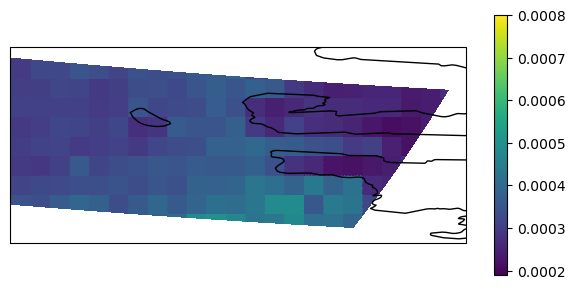

In [65]:
# Plot water vapor data ***need to comment out the delete code above for this to work
plt.figure(figsize=(6, 3))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_global()
cb = ax.pcolormesh(WV_xr.x,WV_xr.y,WV_xr,vmin=0.00019,vmax=0.0008,transform=cartopy.crs.epsg(3031)) #
ax.coastlines()
ax.set_ylim([-75, -72])
ax.set_xlim([-107,-100])
cbar = plt.colorbar(cb)
plt.tight_layout()

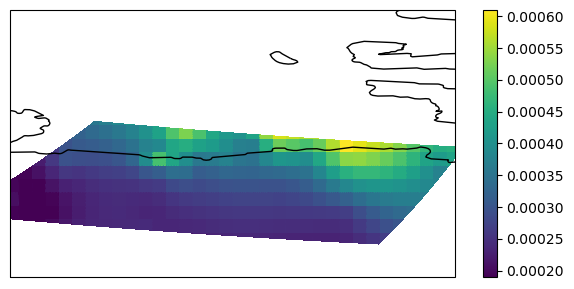

In [106]:
# For [2:3], plot water vapor data ***need to comment out the delete code above for this to work
plt.figure(figsize=(6, 3))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_global()
cb = ax.pcolormesh(WV_xr.x,WV_xr.y,WV_xr,vmin=0.00019,vmax=0.00061,transform=cartopy.crs.epsg(3031))
ax.coastlines()
ax.set_ylim([-78, -72])
ax.set_xlim([-111,-101])
cbar = plt.colorbar(cb)
plt.tight_layout()

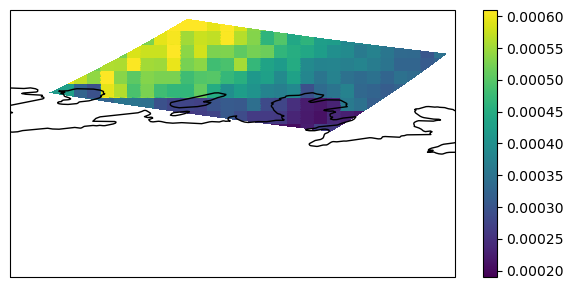

In [45]:
# For Dotson, plot water vapor data ***need to comment out the delete code above for this to work
plt.figure(figsize=(6, 3))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_global()
cb = ax.pcolormesh(WV_xr.x,WV_xr.y,WV_xr,vmin=0.00019,vmax=0.00061,transform=cartopy.crs.epsg(3031))
ax.coastlines()
ax.set_ylim([-78, -72])
ax.set_xlim([-121,-111])
cbar = plt.colorbar(cb)
plt.tight_layout()

### Make a list of images w SST in a desired box

In [ ]:
# # To make a list of images with SST in a desired box
# catalog = intake.open_stac_item_collection(items)

# # Include only Landsat 8 scenes
# catalog_list = [x for x in list(catalog) if x[3]=='8']

# if calib==1:
#     print('Running calibration!')
    
# mm=0
# lsat_good = []

# for img in catalog_list[847:1047]:
#     print(img)
    
#     scene = catalog[img]
#     timestr = scene.metadata['datetime'].strftime('%H%M%S')

#     if calib==1:
#         outFile = f'{lsatpath}{SSTpath}/{img}_{timestr}_Cel_calib.tif'
#     elif calib==0:
#         outFile = f'{lsatpath}{SSTpath}/{img}_{timestr}_Cel.tif'
    
#     if os.path.isfile(outFile):
#         print (f'{img} - atm corr exists')

#     else:
#         print(mm)
#         mm+=1
#         # Open all desired bands for one scene
#         ls_scene = landsat_to_xarray(scene,catalog)
#         ls_scene = ls_scene.rio.write_crs("epsg:3031", inplace=True)

#         # Create classification mask
#         ls_scene = create_masks(ls_scene, cloud_mask=True, ice_mask=True, ocean_mask=True)
        
#         try:
#             # Check for any open ocean pixels - go to next image if none - 9.3 s
#             mask = np.ones(ls_scene.shape[1:])
#             mask[ls_scene.mask!=3] = np.nan
#             ls_thermal = ls_scene.sel(band='lwir11').compute()
#             # Check in bounding box or for entire Landsat image depending on whether doing calibration runs or not
#             if calib==0:
#                 ls_box = (ls_thermal*mask).sel(y=slice(polary[1],polary[0]),x=slice(polarx[0],polarx[1]))
#             else:
#                 ls_box = ls_thermal
                
#             if ((ls_box).notnull()).sum().values==0:
#                 print (f'{img} has no SSTs')
#                 del ls_scene, scene, mask, ls_box
#                 gc.collect()

#             else:
#                 lsat_good.append([img,((ls_box).notnull()).sum().values])
#                 del ls_scene, scene, mask, ls_box, ls_thermal

#         except Exception as e:
#             print (f'{img} has no SSTs: {e}')
        
#         gc.collect()

In [8]:
# # Save list and re-open list
# import pickle
# with open(lsatpath+'landsat8_goodfiles_dotson_2021_2023', "wb") as fp:   #Pickling
#     pickle.dump(lsat_good, fp)

# with open(lsatpath+'landsat8_goodfiles_dotson_1', "rb") as fp:   # Unpickling
#     bb = pickle.load(fp)
# len(bb)

# import csv

# with open(lsatpath+'landsat8_goodfiles_dotson_forTed.csv', 'w', newline = '') as csvfile:
#     my_writer = csv.writer(csvfile, delimiter = ' ')
#     my_writer.writerow(bb)

In [33]:
# # Plot water vapor data ***need to comment out the delete code above for this to work
# plt.figure(figsize=(6, 3))
# ax = plt.axes(projection=ccrs.PlateCarree())
# ax.set_global()
# cb = ax.pcolormesh(WV_xr.x,WV_xr.y,WV_xr,transform=cartopy.crs.epsg(3031))
# ax.coastlines()
# ax.set_ylim([-76, -69])
# ax.set_xlim([-115,-95])
# cbar = plt.colorbar(cb)
# plt.tight_layout()

In [ ]:
# # Plot SST data ***need to comment out the delete code above for this to work
# plt.figure(figsize=(6, 3))
# ax = plt.axes(projection=ccrs.PlateCarree())
# ax.set_global()
# cb = ax.pcolormesh(WV_xr.x,WV_xr.y,SST,transform=cartopy.crs.epsg(3031))
# ax.coastlines()
# ax.set_ylim([-74.4, -74.2])
# ax.set_xlim([-103.9,-103.5])
# cbar = plt.colorbar(cb)
# # cbar.set_clim(-1, -6) # set limits of color map
# plt.tight_layout()

### Mosaic SST images from Xarray
https://github.com/pangeo-data/cog-best-practices/issues/4

# Create validation matchups via GHRSST iQUAM data
https://www.star.nesdis.noaa.gov/socd/sst/iquam/?tab=0&dateinput_year=2023&dateinput_month=02&dayofmoninput_day=26&dateinput_hour=00&dayofmon=monthly&qcrefsst=_qcrey&qcrefsst=_qccmc&outlier=qced#qmap

In [30]:
# Landsat STAC catalog location
url = 'https://landsatlook.usgs.gov/stac-server'

# Paths
basepath = Path('/home/jovyan/Landsat_SST_algorithm')
lsatpath = basepath / 'Data'
atmpath = lsatpath / 'AtmCorrection'
modout_path = lsatpath / 'MOD07_L2'
SSTpath = lsatpath / 'SST/Validation/iQuamIntercomp/'
iQpath = lsatpath / 'iQuam'

WV = 'Water_Vapor'

# For geopandas and tile plots
satellite = 'Landsat8'
collection = 'landsat-c2l1' # Landsat Collection 2, Level 1
colnm = ['landsat:wrs_path','landsat:wrs_row']
gjson_outfile = lsatpath / f'{satellite}_iQuam.geojson'

# Buffer around iquam point used to create a bounding box for Landsat sample
dist = 1.0 # km

# Temporal search range (days) before/after iquam measurement for finding Landsat image
time_add = 0.5

lthresh = -1.9

interp = 1

In [31]:
# # Get iQuam file paths in directory between desired dates
# start_yrmo = '201509'
# end_yrmo = '201603'

# yrmo = []
# m0 = start_yrmo

# # Make a list of months between start and end
# while int(m0) <= int(end_yrmo):
#     calc_dt = datetime.strptime(f'{m0[:4]}-{m0[4:]}', '%Y-%m')
#     yrmo.append(calc_dt.strftime("%Y%m"))
#     m0 = (calc_dt + relativedelta(months=1)).strftime("%Y%m")

# # Get file names and select only those matching dates from yrmo    
# iQfiles = os.listdir(iQpath)
# iQfiles = [x for x in iQfiles if x[:6] in yrmo]
# iQfiles.sort(reverse=True)
# print (len(iQfiles))

# os.chdir(iQpath)

In [32]:
# # Open Argos data from iQuam files
# # iquam_file = lsatpath / 'iQuam/202304-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # iquam_file = lsatpath / 'iQuam/202303-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # iquam_file = lsatpath / 'iQuam/202302-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # iquam_file = lsatpath / 'iQuam/202301-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # iquam_file = lsatpath / 'iQuam/202212-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # iquam_file = lsatpath / 'iQuam/202211-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # iquam_file = lsatpath / 'iQuam/202210-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # # iquam_file = lsatpath / 'iQuam/202209-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # # iquam_file = lsatpath / 'iQuam/202208-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # # iquam_file = lsatpath / 'iQuam/202207-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # # iquam_file = lsatpath / 'iQuam/202206-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv03.0.nc'
# # # iquam_file = lsatpath / 'iQuam/202205-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # # iquam_file = lsatpath / 'iQuam/202204-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv03.0.nc'
# # iquam_file = lsatpath / 'iQuam/202203-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # iquam_file = lsatpath / 'iQuam/202202-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv03.0.nc'
# # iquam_file = lsatpath / 'iQuam/202201-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # iquam_file = lsatpath / 'iQuam/202112-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv03.0.nc'
# iquam_file = lsatpath / 'iQuam/202111-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv03.0.nc'
# # iquam_file = lsatpath / 'iQuam/202110-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv05.0.nc'
# # iquam_file = lsatpath / 'iQuam/202109-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv03.0.nc'

# # iquam_file = lsatpath / 'iQuam/202101-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv01.0.nc'
# # iquam_file = lsatpath / 'iQuam/202001-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv10.0.nc'
# # iquam_file = lsatpath / 'iQuam/201901-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv13.0.nc'
# # iquam_file = lsatpath / 'iQuam/201801-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv10.0.nc'
# # iquam_file = lsatpath / 'iQuam/201701-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv01.0.nc'
# # iquam_file = lsatpath / 'iQuam/201601-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv01.0.nc'
# # iquam_file = lsatpath / 'iQuam/201501-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv01.0.nc'
# # iquam_file = lsatpath / 'iQuam/201401-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv01.0.nc'
# df = xr.open_dataset(iquam_file)
# iquam = df.to_dataframe()
# iquam.head(2)

In [33]:
# iquam_file = 'https://www.star.nesdis.noaa.gov/pub/sod/sst/iquam/v2.10/202304-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# df = xr.open_dataset(iquam_file,engine='netcdf4')

In [34]:
# # Subset to Antarctica
# ant = iquam[(iquam.lat<-65)&(iquam.lon>-142)&(iquam.lon<-72)&(iquam.platform_type==5.0)&(iquam.quality_level==5.0)]  # Entire West Antarctica (later)
# # ant = iquam[(iquam.lat<-69)&(iquam.lon>-125)&(iquam.lon<-98)&(iquam.platform_type==5.0)&(iquam.quality_level==5.0)] # Amundsen Sea
# print(f'{ant.shape[0]} measurements')
# ant.head(3)

In [35]:
# Authenticate for accessing NASA data (MODIS)
auth = earthaccess.login(strategy="netrc")

# If we are not authenticated
if not auth.authenticated:
    # ask for credentials and persist them in a .netrc file
    auth.login(strategy="interactive", persist=True)

In [36]:
# Authenticate for boto S3 access, etc.
os.environ["AWS_REQUEST_PAYER"] = "requester"
aws_session = AWSSession(boto3.Session(), requester_pays=True)

In [37]:
# Setup and authenticate 
from dask.distributed import Client
import logging
client = Client(processes=True, n_workers=4, 
                threads_per_worker=1,
                silence_logs=logging.ERROR)
client.run(lambda: os.environ["AWS_REQUEST_PAYER"] == "requester" )
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /user/tsnow03/proxy/33051/status,
Dashboard: /user/tsnow03/proxy/33051/status,Workers: 4
Total threads: 4,Total memory: 29.67 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:44591,Workers: 4
Dashboard: /user/tsnow03/proxy/33051/status,Total threads: 4
Started: Just now,Total memory: 29.67 GiB
Comm: tcp://127.0.0.1:41639,Total threads: 1
Dashboard: /user/tsnow03/proxy/33977/status,Memory: 7.42 GiB
Nanny: tcp://127.0.0.1:46743,


In [38]:
# Year and months desired (multiple years)
start_yr = 2013
end_yr = 2023

# Note these will get months from the later part of the year to early next
start_mo = '09'
end_mo = '03'

# Headers for the saved outputs
headers = ['DateTime','L8_filename','L8_SST','L8_std','center','N','S','E','W','NE','SE','NW','SW','L8_SST_max','L8_SST_min','Argo_id','Argo_SST','A_lat','A_lon']

# Desired projection transformation
source_crs = 'epsg:4326' 
target_crs = 'epsg:3031' # Coordinate system of the Landsat file

In [39]:
%%time

# Multiple years

# Set up projections
transformer = Transformer.from_crs(source_crs, target_crs, always_xy=True)

# Get iQuam file paths in directory between desired dates and find and produce matching Landsat SSTs 
for year in range(start_yr, end_yr):  
    yrmo = []
    start_yrmo = f"{year}{start_mo}"  # Start from September of the current year
    end_yrmo = f"{year+1}{end_mo}"  # End in March of the next year

    m0 = start_yrmo
    
    # Make a list of months between start and end
    while int(m0) <= int(end_yrmo):
        calc_dt = datetime.strptime(f'{m0[:4]}-{m0[4:]}', '%Y-%m')
        yrmo.append(calc_dt.strftime("%Y%m"))
        m0 = (calc_dt + relativedelta(months=1)).strftime("%Y%m")
    
    # Get file names and select only those matching dates from yrmo    
    iQfiles = os.listdir(iQpath)
    iQfiles = [x for x in iQfiles if x[:6] in yrmo]
    iQfiles.sort(reverse=True)
    print (f'{year}: {len(iQfiles)}')
    
    os.chdir(iQpath)

    # For each iquam file, pair West Antarctic Argo buoy data with Landsat data and create calibrated SSTs
    valid = []
    
    for iquam_file in iQfiles:
        # Open Argos data from iQuam file
        df = xr.open_dataset(iquam_file)
        iquam = df.to_dataframe()
        
        # Subset to Antarctica
        ant = iquam[(iquam.lat<-65)&(iquam.lon>-142)&(iquam.lon<-72)&(iquam.platform_type==5.0)&(iquam.quality_level==5.0)]  # Entire West Antarctica (later)
        # ant = iquam[(iquam.lat<-69)&(iquam.lon>-125)&(iquam.lon<-98)&(iquam.platform_type==5.0)&(iquam.quality_level==5.0)] # Amundsen Sea
        
        # To remove a landsat day that is coming up with a 403 error
        if ant['year'].iloc[0] == 2020 and ant['month'].iloc[0] == 12:
            ant = ant[ant.day != 9.0] # for 202012 because otherwise will fail
        
        print('')
        print(f'{iquam_file[:6]}: {ant.shape[0]} measurements')
    
        for idx in range(ant.shape[0]):
    
            # Create search area
            ilat = ant['lat'].iloc[idx]
            ilon = ant['lon'].iloc[idx]
    
            lat_add = km_to_decimal_degrees(dist, ilat, direction='latitude')
            lon_add = km_to_decimal_degrees(dist, ilat, direction='longitude')
            bboxV = (ilon-lon_add,ilat-lat_add,ilon+lon_add,ilat+lat_add)
    
            # Create Landsat temporal search range in correct format
            ihr = int(ant.hour.iloc[idx])
            iyr = int(ant.year.iloc[idx])
            imo = int(ant.month.iloc[idx])
    
            calc_dt = datetime.strptime(f'{iyr}-{imo}-{int(ant.day.iloc[idx])} {ihr}', '%Y-%m-%d %H')
            start_dt = (calc_dt + timedelta(days=-time_add)).strftime('%Y-%m-%dT%H:%M:%SZ')
            end_dt = (calc_dt + timedelta(days=time_add)).strftime('%Y-%m-%dT%H:%M:%SZ')
    
            timeRangeV = f'{start_dt}/{end_dt}'
    
            # Search for desired Landsat scenes
            items = search_stac(url,collection,gjson_outfile=gjson_outfile,bbox=bboxV,timeRange=timeRangeV)
    
            # Load the geojson file and open stac catalog
            catalog = intake.open_stac_item_collection(items)
            gf = gpd.read_file(gjson_outfile)
    
            # Exclude Landsat 9
            catalog_list = [x for x in items if x.id[3]=='8']
            num_scene = len(catalog_list)
            print(f'{num_scene} Landsat 8 items')
    
            # If any matching landsat scenes are found create calibrated SSTs for them
            if num_scene>0:
    
                # Reproject to determine bounding box in espg 3031
                sbox,checkbox = lsat_reproj(source_crs,target_crs,(bboxV[0],bboxV[1],bboxV[2],bboxV[3]))
    
                # Create polygon for later cropping
                polygon = Polygon([(sbox[0][0],sbox[0][1]),(sbox[3][0],sbox[3][1]),(sbox[2][0],sbox[2][1]),(sbox[1][0],sbox[1][1])])
                
                # Create min/max boundaries for trimming image before crop_xarray to cut down on processing times
                minx, miny, maxx, maxy = polygon.bounds
                polarx = [minx, maxx]
                polary = [miny, maxy]
    
                # Create calibrated SSTs for each matching landsat scene
                for sceneid in catalog_list:
                    print(sceneid.id)
    
                    scene = catalog[sceneid.id]
                    timestr = scene.metadata['datetime'].strftime('%H%M%S')
    
                    outFile = f'{SSTpath}/{sceneid.id}_{timestr}_Cel.tif'
    
                    if os.path.isfile(outFile):
                        print (f'{sceneid.id} - atm corr exists')
                        ls_scene = xr.open_dataset(outFile,chunks=dict(x=512, y=512),engine='rasterio')
                        ls_scene = ls_scene.rio.write_crs("epsg:3031", inplace=True)
    
                        # Subset all scenes and check for right dimensions because y order changes sometimes
                        ls_sub = subset_img(ls_scene['band_data'].sel(band=1),polarx,polary) # subset so easier to work with
    
                    else:
                        try:
                            # Open all desired bands for one scene
                            ls_scene = landsat_to_xarray(sceneid,catalog)
                            ls_scene = ls_scene.rio.write_crs("epsg:3031", inplace=True)
            
                            # Create classification mask
                            ls_scene = create_masks(ls_scene, cloud_mask=True, ice_mask=True, ocean_mask=True)
    
                            # Check for any open ocean pixels - go to next image if none - ??? s
                            mask = np.ones(ls_scene.shape[1:])
                            mask[ls_scene.mask!=3] = np.nan
                            ls_thermal = ls_scene.sel(band='lwir11').compute()
    
                            # Check in bounding box or for entire Landsat image depending on whether doing calibration runs or not
                            ls_box = subset_img(ls_thermal*mask,polarx,polary)
    
                            if ((ls_box).notnull()).sum().values==0:
                                print (f'{sceneid.id} has no SSTs')
                                try:
                                    del ls_scene, scene, mask, ls_thermal, ls_box
                                except:
                                    pass
                                gc.collect()
                                continue
    
                            # Use band ratios for RF cloud pixel classification
                            ####
    
                            # Atmospheric correction using MODIS
                            # Acquire and align MODIS water vapor (MOD/MYD07) to Landsat
                            mod07,modfilenm = open_MODIS(ls_scene,scene,modout_path)
    
                            # Create water vapor files aligned and subsampled to Landsat
                            spacing = [300,-300] # 300m sampling of MODIS data so that upsampling is easy and because 30m takes far too long
                            WV_xr = get_wv(ls_scene,mod07,spacing,WV,scene,interp=interp)
    
                            # Create SST by masking and using water vapor to apply atmospheric correction
                            SST = apply_NLSST(ls_thermal,scene,mask,WV_xr,atmcor,simT_transformer,simTOA_transformer,simWV_transformer)
    
                            # Record MODIS water vapor image used in atmospheric correction, will find this info save under band_data in
                            # data variables in COG (click on white paper info button in xarray readout)
                            SST.attrs['MODIS_WV'] = modfilenm
    
                            # Save to a cloud-optimized Geotiff
                            SST.rio.to_raster(raster_path=outFile, driver="COG")
                            print (f'Mean SST: {np.nanmean(SST)}')
    
                            # Subset all scenes and check for right dimensions because y order changes sometimes
                            ls_sub = subset_img(SST,polarx,polary) # subset so easier to work with 
    
                            try:
                                del mask, ls_thermal, mod07, WV_xr, SST
                            except:
                                pass
    
                        except Exception as e:
                            print (sceneid.id, e)
                            lsat = np.nan
                            lstd = np.nan
    
                    # Crop data to exact bounding box
                    ls_sub = crop_xarray_dataarray_with_polygon(ls_sub, polygon) 
    
                    # Calibrate using MODIS
                    ls_sub = ls_sub * calib_m + calib_b
    
                    # Remove all pixels that are too cold
                    ls_sub = ls_sub.where(ls_sub>=lthresh,np.nan)
    
                    lsat = np.around(np.nanmean(ls_sub),2)
                    lstd = np.around(np.nanstd(ls_sub),2)
    
                    # Convert Argo lat/lon to Landsat's EPSG:3031
                    argo_px, argo_py = transformer.transform(ilon, ilat)
    
                    # 1) Find the nearest center pixel
                    center_val = ls_sub.sel(x=argo_px, y=argo_py, method="nearest")
                    
                    # Extract the x/y coordinate values as plain floats
                    center_x = center_val.x.item()
                    center_y = center_val.y.item()
                    
                    # 2) Get integer indices from the coordinate indexes
                    #    This uses ls_sub.get_index('dim_name') -> pandas.Index -> get_indexer(...)
                    center_x_idx = ls_sub.get_index("x").get_indexer([center_x])[0]
                    center_y_idx = ls_sub.get_index("y").get_indexer([center_y])[0]
                    
                    # 3) Gather offsets for the 3x3 neighborhood
                    offsets = [
                        ( 0,  0, "center"),
                        ( 0,  1, "N"),
                        ( 0, -1, "S"),
                        ( 1,  0, "E"),
                        (-1,  0, "W"),
                        ( 1,  1, "NE"),
                        ( 1, -1, "SE"),
                        (-1,  1, "NW"),
                        (-1, -1, "SW"),
                    ]
                    
                    neighbors = {}
                    for dx, dy, name in offsets:
                        nx = center_x_idx + dx
                        ny = center_y_idx + dy
                        # Ensure we're within the array bounds
                        if (0 <= nx < ls_sub.sizes['x']) and (0 <= ny < ls_sub.sizes['y']):
                            # xarray dimension order is typically (y, x), so use isel(y=ny, x=nx):
                            neighbors[name] = ls_sub.isel(y=ny, x=nx).values.item()
                        else:
                            neighbors[name] = np.nan
                    
                    # 4) Record coincident data from Landsat and Argo float
                    argo_temp = np.around((ant.sst.iloc[idx] - 273.15),2)  # convert to Celsius
                    times = pd.to_datetime(calc_dt, format='%Y%m%d%H')  # standardize time
                    
                    valid.append([
                        times,
                        sceneid.id,
                        lsat,
                        lstd,
                        neighbors['center'],
                        neighbors['N'],
                        neighbors['S'],
                        neighbors['E'],
                        neighbors['W'],
                        neighbors['NE'],
                        neighbors['SE'],
                        neighbors['NW'],
                        neighbors['SW'],
                        ls_sub.max().values.item(),
                        ls_sub.min().values.item(),
                        ant.iloc[idx].name,  # Argo ID or whichever label you prefer
                        argo_temp,
                        ilat,
                        ilon
                    ])
                    print (f'Argo temp: {argo_temp}, Landsat 8 mean: {lsat}+/-{lstd}')
    
                    try:
                        del ls_scene, scene, ls_thermal, ls_box, mod07, WV_xr, SST, ls_sub, neighbors
                    except:
                        pass
    
                    gc.collect()

    # Put data into DataFrame and save    
    lsat_mod_df = pd.DataFrame(valid,columns=headers)
    out_df = lsatpath / f'Landsat_validation_20250507_{start_yrmo}_{end_yrmo}_{dist}'
    lsat_mod_df.to_pickle(out_df)
    print('________')

2013: 1

201401: 27 measurements
Searching for items in bbox (-125.50082546621091, -70.71892116106632, -125.44644015878909, -70.7009549375665) and timeRange 2014-01-01T21:00:00Z/2014-01-02T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-125.18454042041535, -65.358981585871, -125.14146360790497, -65.34101536237118) and timeRange 2014-01-02T00:00:00Z/2014-01-03T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-131.1535906408042, -65.41797969378116, -131.11041692755518, -65.40001347028134) and timeRange 2014-01-02T11:00:00Z/2014-01-03T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-140.3134180862519, -65.20198390520694, -140.27059680632624, -65.18401768170712) and timeRange 2014-01-03T08:00:00Z/2014-01-04T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-119.87693280430673, -71.92098567522648, -119.81906634120108, -71.90301945172665) and timeRange 2014-01-03T22:00:00Z/2014-01-04T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-84.81968297931562, -70.33598659075382, -84.76631555584063, -70.318020367254) and timeRange 2014-01-04T21:00:00Z/2014-01-05T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-123.41030044820987, -65.06498286760929, -123.36769942971982, -65.04701664410946) and timeRange 2014-01-09T00:00:00Z/2014-01-10T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.52462457638767, -70.76604793108585, -125.47011114138577, -70.74808170758602) and timeRange 2014-01-09T01:00:00Z/2014-01-10T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-130.91168886703582, -65.54198024309757, -130.86830991226105, -65.52401401959774) and timeRange 2014-01-09T11:00:00Z/2014-01-10T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.17626020622535, -65.0159868959296, -135.1337373523684, -64.99802067242977) and timeRange 2014-01-09T23:00:00Z/2014-01-10T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-140.40042543234995, -65.22297999895694, -140.3575701731188, -65.20501377545712) and timeRange 2014-01-10T08:00:00Z/2014-01-11T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-119.11261651128372, -71.7139849428046, -119.0553827562944, -71.69601871930477) and timeRange 2014-01-11T01:00:00Z/2014-01-12T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.54832456430084, -70.8129839662421, -125.49368288198822, -70.79501774274227) and timeRange 2014-01-16T05:00:00Z/2014-01-17T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-130.7437731509136, -65.6419863466132, -130.70022709322703, -65.62402012311337) and timeRange 2014-01-16T11:00:00Z/2014-01-17T11:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-134.92428601253297, -65.04698512591007, -134.8817137433264, -65.02901890241024) and timeRange 2014-01-16T23:00:00Z/2014-01-17T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-140.43944067996003, -65.2399859193671, -140.39655785519622, -65.22201969586727) and timeRange 2014-01-17T08:00:00Z/2014-01-18T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.78671865436993, -71.77897975481632, -118.72928781535663, -71.7610135313165) and timeRange 2014-01-18T04:00:00Z/2014-01-19T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-125.53635644199633, -70.83698604143741, -125.48164892909742, -70.81901981793759) and timeRange 2014-01-23T07:00:00Z/2014-01-24T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-130.60085626737782, -65.74698207415226, -130.5571332345753, -65.72901585065243) and timeRange 2014-01-23T11:00:00Z/2014-01-24T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-134.72634479731423, -65.11798427141788, -134.68365886479515, -65.10001804791806) and timeRange 2014-01-23T23:00:00Z/2014-01-24T23:00:00Z
Found 0 item(s)


Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-140.27039144090207, -65.1869845155585, -140.22759439894168, -65.16901829205868) and timeRange 2014-01-24T08:00:00Z/2014-01-25T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-119.13293878295555, -71.92698237932804, -119.07505377075539, -71.90901615582821) and timeRange 2014-01-25T07:00:00Z/2014-01-26T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-121.53876376936799, -65.63298366106632, -121.49523281266326, -65.6150174375665) and timeRange 2014-01-30T00:00:00Z/2014-01-31T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.63733652812166, -70.82398555315616, -125.58266469258146, -70.80601932965634) and timeRange 2014-01-30T07:00:00Z/2014-01-31T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-130.41993811482652, -65.84298274553898, -130.37605187540785, -65.82501652203915) and timeRange 2014-01-30T12:00:00Z/2014-01-31T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-134.455422035114, -65.2089800599921, -134.41258943949538, -65.19101383649227) and timeRange 2014-01-30T23:00:00Z/2014-01-31T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-140.05527872309779, -65.04198024309757, -140.01271444096471, -65.02401401959774) and timeRange 2014-01-31T09:00:00Z/2014-02-01T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
2014: 7

201503: 46 measurements


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-73.93463335926168, -66.51272151507023, -73.88957013194926, -66.4947552915704) and timeRange 2015-03-03T11:00:00Z/2015-03-04T11:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.75366108059687, -65.65135524309757, -77.71009929537969, -65.63338901959774) and timeRange 2015-03-03T13:00:00Z/2015-03-04T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.39146227379683, -66.79986140764835, -77.34587293128129, -66.78189518414852) and timeRange 2015-03-03T15:00:00Z/2015-03-04T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-74.17909964006279, -65.24543330706241, -74.13620797712471, -65.22746708356259) and timeRange 2015-03-03T18:00:00Z/2015-03-04T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.48320029411595, -65.34917018450382, -78.44013954963405, -65.331203961004) and timeRange 2015-03-04T04:00:00Z/2015-03-05T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-73.58392151630377, -66.16590449846866, -73.53947631084466, -66.14793827496884) and timeRange 2015-03-04T04:00:00Z/2015-03-05T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-81.17768862977194, -65.77912471331241, -81.13391110167338, -65.76115848981259) and timeRange 2015-03-04T06:00:00Z/2015-03-05T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-92.54854200289934, -67.57598445452335, -92.50146104885847, -67.55801823102352) and timeRange 2015-03-05T08:00:00Z/2015-03-06T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.9574355127994, -65.22698543108585, -138.91457376454434, -65.20901920758602) and timeRange 2015-03-05T19:00:00Z/2015-03-06T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-97.10129550468719, -66.24598262346866, -97.056709256055, -66.22801639996884) and timeRange 2015-03-05T20:00:00Z/2015-03-06T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.8802648380607, -67.30098292864444, -139.8337244197518, -67.28301670514462) and timeRange 2015-03-06T05:00:00Z/2015-03-07T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-85.57403732426769, -68.97998378313663, -85.52396987788075, -68.9620175596368) and timeRange 2015-03-10T00:00:00Z/2015-03-11T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-92.76260076440015, -67.63798091448429, -92.71539606177173, -67.62001469098446) and timeRange 2015-03-12T07:00:00Z/2015-03-13T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.687415047155, -65.20698115862491, -138.64458568526686, -65.18901493512509) and timeRange 2015-03-12T19:00:00Z/2015-03-13T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.87439210452658, -67.42798183001163, -139.8276037450828, -67.4100156065118) and timeRange 2015-03-13T05:00:00Z/2015-03-14T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-74.48785162558391, -66.42317531145694, -74.44294976601765, -66.40520908795712) and timeRange 2015-03-13T11:00:00Z/2015-03-14T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.88109912370255, -65.78290126360538, -77.83731518293807, -65.76493504010556) and timeRange 2015-03-13T13:00:00Z/2015-03-14T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.69527197196365, -66.49942348040226, -76.65023278877854, -66.48145725690243) and timeRange 2015-03-13T14:00:00Z/2015-03-14T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-74.11145668197165, -65.5141329530585, -74.06812400650492, -65.49616672955868) and timeRange 2015-03-14T04:00:00Z/2015-03-15T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.77468892075113, -66.15081355608585, -77.73027018569418, -66.13284733258602) and timeRange 2015-03-14T04:00:00Z/2015-03-15T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.99539748545801, -65.72268245257023, -80.95171555165136, -65.7047162290704) and timeRange 2015-03-14T06:00:00Z/2015-03-15T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.51731681432638, -66.3981661561835, -76.47245979700175, -66.38019993268368) and timeRange 2015-03-14T09:00:00Z/2015-03-15T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.25369094603421, -66.33006618059757, -76.20895553834079, -66.31209995709774) and timeRange 2015-03-15T03:00:00Z/2015-03-16T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-93.93661687644891, -66.60498378313663, -93.89138605323859, -66.5870175596368) and timeRange 2015-03-15T18:00:00Z/2015-03-16T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-75.99012914077886, -66.30799434221866, -75.9454329930102, -66.29002811871884) and timeRange 2015-03-15T21:00:00Z/2015-03-16T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.75833495091652, -66.3360552553046, -75.71358887720848, -66.31808903180477) and timeRange 2015-03-16T16:00:00Z/2015-03-17T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.65327309466932, -66.31318233049991, -75.60856772564318, -66.29521610700009) and timeRange 2015-03-18T21:00:00Z/2015-03-19T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-92.85670308289592, -67.73797938860538, -92.80929728331502, -67.72001316510556) and timeRange 2015-03-19T08:00:00Z/2015-03-20T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-123.56134307943768, -65.11698482073429, -123.51865875161701, -65.09901859723446) and timeRange 2015-03-19T11:00:00Z/2015-03-20T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-86.08202383762207, -68.97198054827335, -86.03197457546386, -68.95401432477352) and timeRange 2015-03-19T13:00:00Z/2015-03-20T13:00:00Z
Found 2 item(s)
2 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2306318.7453374723, 157956.00883709002), (-2304306.7457075515, 157818.21026437904), (-2304168.008520926, 159831.01799428897), (-2306179.887012821, 159970.57404499853)]
lbox=(-86.08202383762207, -68.97198054827335, -86.03197457546386, -68.95401432477352)
checkbox=[-86.08202384 -68.97198055 -86.03197458 -68.95401432]
LC08_L1GT_231109_20150319_20200909_02_T2
(72, 72)
LC08_L1GT_231109_20150319_20200909_02_T2 has no SSTs
LC08_L1GT_231108_20150319_20201016_02_T2
(72, 72)
LC08_L1GT_231108_20150319_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-138.5763782869839, -65.17098567522648, -138.5336070645786, -65.15301945172665) and timeRange 2015-03-19T20:00:00Z/2015-03-20T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-139.7705753756635, -67.61698482073429, -139.72341266144588, -67.59901859723446) and timeRange 2015-03-20T06:00:00Z/2015-03-21T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-75.3724923631969, -66.18812129534366, -75.32800812508435, -66.17015507184384) and timeRange 2015-03-21T03:00:00Z/2015-03-22T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.0905593004306, -66.28721187151554, -75.04590005015534, -66.26924564801571) and timeRange 2015-03-23T08:00:00Z/2015-03-24T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-73.90787812187794, -66.66467616594913, -73.86253813788768, -66.6467099424493) and timeRange 2015-03-23T11:00:00Z/2015-03-24T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.74727971763963, -65.6838564638007, -77.70366327552443, -65.66589024030087) and timeRange 2015-03-23T13:00:00Z/2015-03-24T13:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-77.70573798150384, -66.539889788996, -77.66062554388678, -66.52192356549618) and timeRange 2015-03-24T04:00:00Z/2015-03-25T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-79.04450686750783, -66.02458522356632, -79.00030819596873, -66.0066190000665) and timeRange 2015-03-24T06:00:00Z/2015-03-25T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-75.05632247512098, -66.4028506044257, -75.01145706589465, -66.38488438092587) and timeRange 2015-03-25T13:00:00Z/2015-03-26T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-93.21582996688268, -66.83698604143741, -93.17017162003138, -66.81901981793759) and timeRange 2015-03-25T16:00:00Z/2015-03-26T16:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-92.52271052623507, -67.74498317278507, -92.47529057239774, -67.72701694928524) and timeRange 2015-03-26T08:00:00Z/2015-03-27T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-122.43434177142372, -65.1139864686835, -122.3916622568966, -65.09602024518368) and timeRange 2015-03-26T12:00:00Z/2015-03-27T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-138.60337022602621, -65.15098140276554, -138.56063123881754, -65.13301517926571) and timeRange 2015-03-26T21:00:00Z/2015-03-27T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.54784629225946, -67.87697932757023, -139.50015785813116, -67.8590131040704) and timeRange 2015-03-27T07:00:00Z/2015-03-28T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.39002817983935, -68.97698543108585, -86.33996754769971, -68.95901920758602) and timeRange 2015-03-28T23:00:00Z/2015-03-29T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-74.9714151643366, -66.42011592424991, -74.92651879562433, -66.40214970075009) and timeRange 2015-03-30T11:00:00Z/2015-03-31T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



201502: 41 measurements
Searching for items in bbox (-74.73395350431548, -66.95510432757023, -74.68807408357515, -66.9371381040704) and timeRange 2015-02-01T11:00:00Z/2015-02-02T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.47570581436683, -66.04312465227726, -77.43147497176598, -66.02515842877743) and timeRange 2015-02-01T13:00:00Z/2015-02-02T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.82069698599511, -65.29654262102726, -76.77772220345801, -65.27857639752743) and timeRange 2015-02-01T16:00:00Z/2015-02-02T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.94385337674686, -65.51320979632023, -76.9005222336047, -65.4952435728204) and timeRange 2015-02-01T20:00:00Z/2015-02-02T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-81.71693259067142, -65.97329280413273, -81.67282265835202, -65.9553265806329) and timeRange 2015-02-01T20:00:00Z/2015-02-02T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-78.96111792021391, -66.43982265032413, -78.91618615693453, -66.4218564268243) and timeRange 2015-02-02T04:00:00Z/2015-02-03T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.9534685125743, -66.15950343645694, -78.90903453918351, -66.14153721295712) and timeRange 2015-02-02T05:00:00Z/2015-02-03T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-81.53381318224113, -66.90803096331241, -81.4880221449073, -66.89006473981259) and timeRange 2015-02-02T07:00:00Z/2015-02-03T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-103.59253972656234, -67.57498500383976, -103.54546076171891, -67.55701878033993) and timeRange 2015-02-04T01:00:00Z/2015-02-05T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-91.45988350535109, -66.89898250139835, -91.41410941457079, -66.88101627789852) and timeRange 2015-02-05T07:00:00Z/2015-02-06T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-139.4890166516142, -67.03298518694523, -139.4429901843233, -67.0150189634454) and timeRange 2015-02-06T03:00:00Z/2015-02-07T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-85.90096857391225, -68.92298457659366, -85.85103032745494, -68.90501835309384) and timeRange 2015-02-07T13:00:00Z/2015-02-08T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-74.53913516771838, -66.67402217424991, -74.49377804028943, -66.65605595075009) and timeRange 2015-02-11T11:00:00Z/2015-02-12T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.79392042008239, -65.73169276751163, -77.75022325667543, -65.7137265440118) and timeRange 2015-02-11T13:00:00Z/2015-02-12T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-74.6581783403121, -65.75886104143741, -74.61443518507852, -65.74089481793759) and timeRange 2015-02-11T15:00:00Z/2015-02-12T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-79.36150339712172, -66.56917140520694, -79.31633778940171, -66.55120518170712) and timeRange 2015-02-11T18:00:00Z/2015-02-12T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.09972963127699, -65.91990230120304, -76.0557116529027, -65.90193607770321) and timeRange 2015-02-11T19:00:00Z/2015-02-12T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.63170193006198, -65.75601527727726, -78.58796359728177, -65.73804905377743) and timeRange 2015-02-12T03:00:00Z/2015-02-13T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.85208132884449, -65.33027980364444, -77.80905148365551, -65.31231358014462) and timeRange 2015-02-12T04:00:00Z/2015-02-13T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-82.15768398910284, -66.23692653216007, -82.11311374038935, -66.21896030866024) and timeRange 2015-02-12T07:00:00Z/2015-02-13T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-91.98127913322799, -67.30998561419132, -91.93472123298295, -67.2920193906915) and timeRange 2015-02-12T07:00:00Z/2015-02-13T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.71930415579973, -65.07198665178898, -107.67669193795027, -65.05402042828915) and timeRange 2015-02-12T22:00:00Z/2015-02-13T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.59803958886613, -67.0639834169257, -139.55195430761825, -67.04601719342587) and timeRange 2015-02-13T04:00:00Z/2015-02-14T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.17970820689914, -67.74498317278507, -102.1322882530618, -67.72701694928524) and timeRange 2015-02-14T00:00:00Z/2015-02-15T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-85.93486143206876, -68.82398555315616, -85.88514589214999, -68.80601932965634) and timeRange 2015-02-16T23:00:00Z/2015-02-17T23:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2322480.413179416, 165057.1613388685), (-2320467.8417745577, 164914.1292077071), (-2320323.872281924, 166927.53649661527), (-2322336.3188202023, 167072.31488164113)]
lbox=(-85.93486143206876, -68.82398555315616, -85.88514589214999, -68.80601932965634)
checkbox=[-85.93486143 -68.82398555 -85.88514589 -68.80601933]
LC08_L1GT_229109_20150217_20201016_02_T2
(72, 72)
LC08_L1GT_229109_20150217_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-92.22343737668905, -67.47498652971866, -92.17655651979533, -67.45702030621884) and timeRange 2015-02-19T07:00:00Z/2015-02-20T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.70236442311156, -65.14498469866398, -139.6596350886072, -65.12701847516415) and timeRange 2015-02-19T16:00:00Z/2015-02-20T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.73409832672735, -67.12398097551944, -139.68789874358515, -67.10601475201962) and timeRange 2015-02-20T04:00:00Z/2015-02-21T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-73.593853401884, -66.54043147600773, -73.54873998190506, -66.5224652525079) and timeRange 2015-02-21T11:00:00Z/2015-02-22T11:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.17919095829134, -65.69716975725773, -78.13555208370084, -65.6792035337579) and timeRange 2015-02-21T13:00:00Z/2015-02-22T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-73.80042910841246, -65.21621272600773, -73.75758480760317, -65.1982465025079) and timeRange 2015-02-21T15:00:00Z/2015-02-22T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.82633208029432, -66.59453151262882, -77.7811203122838, -66.576565289129) and timeRange 2015-02-21T17:00:00Z/2015-02-22T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.12743202514814, -66.01724574602726, -75.0832460754378, -65.99927952252743) and timeRange 2015-02-21T19:00:00Z/2015-02-22T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.51926531205879, -65.76238582171085, -77.47551618208183, -65.74441959821102) and timeRange 2015-02-22T03:00:00Z/2015-02-23T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-75.67829683630929, -65.97271297014835, -75.63418790490165, -65.95474674664852) and timeRange 2015-02-22T04:00:00Z/2015-02-23T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-81.4055346685117, -66.0213808778632, -81.36134155219142, -66.00341465436337) and timeRange 2015-02-22T07:00:00Z/2015-02-23T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.58935002836961, -67.38098475969913, -99.54265375581008, -67.3630185361993) and timeRange 2015-02-23T22:00:00Z/2015-02-24T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-92.34946447145626, -67.50298640764835, -92.3025283263953, -67.48502018414852) and timeRange 2015-02-26T07:00:00Z/2015-02-27T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-139.36643938504156, -65.2359804872382, -139.3235630563647, -65.21801426373837) and timeRange 2015-02-26T18:00:00Z/2015-02-27T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-85.50595273512126, -68.90598628557804, -85.45605288011312, -68.88802006207821) and timeRange 2015-02-26T23:00:00Z/2015-02-27T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.8311818771594, -67.21098659075382, -139.78481543729373, -67.193020367254) and timeRange 2015-02-27T04:00:00Z/2015-02-28T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



201501: 63 measurements
Searching for items in bbox (-93.87907337096604, -65.99198482073429, -93.83493114563552, -65.97401859723446) and timeRange 2015-01-01T05:00:00Z/2015-01-02T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-108.67497205678627, -65.87697932757023, -108.6310276990731, -65.8590131040704) and timeRange 2015-01-05T07:00:00Z/2015-01-06T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-93.11877986161802, -65.64998195208194, -93.0752203825226, -65.63201572858212) and timeRange 2015-01-08T05:00:00Z/2015-01-09T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.91597700480582, -66.9889864686835, -138.87003373738168, -66.97102024518368) and timeRange 2015-01-08T18:00:00Z/2015-01-09T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-74.00812875461348, -66.31868312395694, -73.96341360378496, -66.30071690045712) and timeRange 2015-01-09T02:00:00Z/2015-01-10T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.01578898726358, -66.47242305315616, -75.97079853715049, -66.45445682965634) and timeRange 2015-01-09T06:00:00Z/2015-01-10T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.02191238232606, -66.5366167787421, -76.97680587939269, -66.51865055524227) and timeRange 2015-01-09T08:00:00Z/2015-01-10T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.51454993838001, -66.6620821718085, -78.46921471005749, -66.64411594830868) and timeRange 2015-01-09T11:00:00Z/2015-01-10T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-73.86093689670676, -66.3295626405585, -73.8162023855198, -66.31159641705868) and timeRange 2015-01-09T13:00:00Z/2015-01-10T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-80.03741131923852, -66.77379176653507, -79.99187029697242, -66.75582554303524) and timeRange 2015-01-09T14:00:00Z/2015-01-10T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.11616400534636, -66.52608058489444, -76.07107659523957, -66.50811436139462) and timeRange 2015-01-09T17:00:00Z/2015-01-10T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-81.54268645228223, -66.88387630022648, -81.49694062291309, -66.86591007672665) and timeRange 2015-01-09T18:00:00Z/2015-01-10T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.04208451577841, -66.49447200335148, -76.9970542781669, -66.47650577985165) and timeRange 2015-01-09T19:00:00Z/2015-01-10T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-83.01229668893389, -66.99556300676944, -82.96634100637861, -66.97759678326962) and timeRange 2015-01-09T20:00:00Z/2015-01-10T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-84.01497297345935, -67.0743593934882, -83.96886796892346, -67.05639316998837) and timeRange 2015-01-09T22:00:00Z/2015-01-10T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-78.43829857329258, -66.67523524798038, -78.39293921967617, -66.65726902448056) and timeRange 2015-01-09T22:00:00Z/2015-01-10T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.13704039569755, -66.79505488909366, -80.09145997051338, -66.77708866559384) and timeRange 2015-01-10T02:00:00Z/2015-01-11T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-81.62800227764563, -66.87992427385929, -81.58226383563562, -66.86195805035946) and timeRange 2015-01-10T05:00:00Z/2015-01-11T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-82.90792459608619, -66.98538539446476, -82.86198812364037, -66.96741917096493) and timeRange 2015-01-10T08:00:00Z/2015-01-11T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-83.92601049987026, -67.1104922059882, -83.87983666809849, -67.09252598248837) and timeRange 2015-01-10T10:00:00Z/2015-01-11T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-73.6972291351746, -66.385104632746, -73.65239549861447, -66.36713840924618) and timeRange 2015-01-10T13:00:00Z/2015-01-11T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.47940202503476, -66.50359675921085, -76.43435529918399, -66.48563053571102) and timeRange 2015-01-10T16:00:00Z/2015-01-11T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.12895096282395, -66.42464015520694, -77.08404647369949, -66.40667393170712) and timeRange 2015-01-10T19:00:00Z/2015-01-11T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-78.31732249916071, -66.67876002825382, -78.27195667564398, -66.660793804754) and timeRange 2015-01-10T22:00:00Z/2015-01-11T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.27687027416175, -66.834323382746, -80.23121688404137, -66.81635715924618) and timeRange 2015-01-11T00:00:00Z/2015-01-12T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-81.72898900577044, -66.8597597841132, -81.68328821590924, -66.84179356061337) and timeRange 2015-01-11T04:00:00Z/2015-01-12T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-82.73429677682749, -66.9550509218085, -82.68841745657095, -66.93708469830868) and timeRange 2015-01-11T07:00:00Z/2015-01-12T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-83.81846400702021, -67.1795840028632, -83.77215794122198, -67.16161777936337) and timeRange 2015-01-11T09:00:00Z/2015-01-12T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-73.71146978214095, -66.47473475969913, -73.66647516414811, -66.4567685361993) and timeRange 2015-01-11T12:00:00Z/2015-01-12T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.45098130858828, -66.36636683977726, -76.40618116699765, -66.34840061627743) and timeRange 2015-01-11T16:00:00Z/2015-01-12T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.24506646420457, -66.37771937883976, -77.20024603579543, -66.35975315533993) and timeRange 2015-01-11T18:00:00Z/2015-01-12T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-78.20165564803361, -66.67306087053898, -78.15630028458358, -66.65509464703915) and timeRange 2015-01-11T21:00:00Z/2015-01-12T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.4232861150055, -66.8672060731757, -80.37757142893982, -66.84923984967587) and timeRange 2015-01-11T23:00:00Z/2015-01-12T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-81.78698631832617, -66.82554957903507, -81.74134925296289, -66.80758335553524) and timeRange 2015-01-12T04:00:00Z/2015-01-13T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-82.5862024103067, -66.91422603167179, -82.54039976254487, -66.89625980817196) and timeRange 2015-01-12T06:00:00Z/2015-01-13T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-83.74539027755611, -67.2357134584296, -83.69897617752201, -67.21774723492977) and timeRange 2015-01-12T09:00:00Z/2015-01-13T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-73.8893222713231, -66.57148311174991, -73.84415246012222, -66.55351688825009) and timeRange 2015-01-12T11:00:00Z/2015-01-13T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.05613767752678, -66.38391444719913, -76.01130617012947, -66.3659482236993) and timeRange 2015-01-12T15:00:00Z/2015-01-13T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.37265729933893, -66.34854457415226, -77.32788896530951, -66.33057835065243) and timeRange 2015-01-12T17:00:00Z/2015-01-13T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.0883185191386, -66.66204402483585, -78.04298336074422, -66.64407780133602) and timeRange 2015-01-12T20:00:00Z/2015-01-13T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.58557024864356, -66.89093349016788, -80.539811221083, -66.87296726666806) and timeRange 2015-01-12T22:00:00Z/2015-01-13T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-81.81666229781152, -66.77366206682804, -81.77112151566504, -66.75569584332821) and timeRange 2015-01-13T03:00:00Z/2015-01-14T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-82.44745662565745, -66.85966060198429, -82.40175602082692, -66.84169437848446) and timeRange 2015-01-13T06:00:00Z/2015-01-14T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-83.69324753969813, -67.28736445940616, -83.64673353940343, -67.26939823590634) and timeRange 2015-01-13T08:00:00Z/2015-01-14T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-91.50890429832337, -65.79798457659366, -91.46509472511413, -65.78001835309384) and timeRange 2015-01-15T05:00:00Z/2015-01-16T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-105.75160895446245, -66.60198543108585, -105.70638359924848, -66.58401920758602) and timeRange 2015-01-15T05:00:00Z/2015-01-16T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.02026996314908, -67.00422999895694, -138.97429790794467, -66.98626377545712) and timeRange 2015-01-15T17:00:00Z/2015-01-16T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-110.08848990916017, -65.29798457659366, -110.0455127763867, -65.28001835309384) and timeRange 2015-01-15T20:00:00Z/2015-01-16T20:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-90.913272538443, -66.22397944964054, -90.86872514222107, -66.20601322614071) and timeRange 2015-01-22T06:00:00Z/2015-01-23T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.48657953363895, -66.35722682512882, -75.44179571050168, -66.339260601629) and timeRange 2015-01-22T11:00:00Z/2015-01-23T11:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.82568840827544, -66.22547481096866, -76.78113837395112, -66.20750858746884) and timeRange 2015-01-22T15:00:00Z/2015-01-23T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.89290155100915, -65.80953547991398, -77.84907232594398, -65.79156925641415) and timeRange 2015-01-22T17:00:00Z/2015-01-23T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.32277593189272, -66.23633143938663, -77.2782067341229, -66.2183652158868) and timeRange 2015-01-22T20:00:00Z/2015-01-23T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-108.51266602070267, -65.5169863466132, -108.46932860820358, -65.49902012311337) and timeRange 2015-01-22T21:00:00Z/2015-01-23T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-82.08361593936654, -66.85699031389835, -82.03792031551627, -66.83902409039852) and timeRange 2015-01-22T21:00:00Z/2015-01-23T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.12799665238936, -67.01998469866398, -139.08199480268877, -67.00201847516415) and timeRange 2015-01-22T22:00:00Z/2015-01-23T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-80.56425807901606, -65.99666163958194, -80.5201077657105, -65.97869541608212) and timeRange 2015-01-23T04:00:00Z/2015-01-24T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.87963961636231, -65.89644954241398, -80.83566189730956, -65.87848331891415) and timeRange 2015-01-23T05:00:00Z/2015-01-24T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-82.622845156462, -67.47635219133976, -82.5759616062333, -67.45838596783993) and timeRange 2015-01-23T08:00:00Z/2015-01-24T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.07148141038883, -67.51998469866398, -105.02451163160336, -67.50201847516415) and timeRange 2015-01-25T03:00:00Z/2015-01-26T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-91.0456153021187, -66.60198543108585, -91.00038994690473, -66.58401920758602) and timeRange 2015-01-29T06:00:00Z/2015-01-30T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.08935339925297, -65.12998530901554, -107.04664818766109, -65.11201908551571) and timeRange 2015-01-29T21:00:00Z/2015-01-30T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.2859626880273, -66.97898433245304, -139.2400382885352, -66.96101810895321) and timeRange 2015-01-30T02:00:00Z/2015-01-31T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



201412: 11 measurements
Searching for items in bbox (-96.4417814474099, -66.7869829896796, -96.39621598911354, -66.76901676617977) and timeRange 2014-12-03T19:00:00Z/2014-12-04T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-138.3948941768456, -66.9129824403632, -138.34909386026376, -66.89501621686337) and timeRange 2014-12-04T20:00:00Z/2014-12-05T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-114.76207762054105, -66.00197932757023, -114.71791810699801, -65.9840131040704) and timeRange 2014-12-06T12:00:00Z/2014-12-07T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-97.14973078235704, -66.73198268450382, -97.10426702037734, -66.714016461004) and timeRange 2014-12-11T00:00:00Z/2014-12-12T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.4999192304022, -66.92798183001163, -138.4540907793634, -66.9100156065118) and timeRange 2014-12-11T20:00:00Z/2014-12-12T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-113.243466697032, -66.43998286760929, -113.19853464574143, -66.42201664410946) and timeRange 2014-12-16T10:00:00Z/2014-12-17T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-95.71562076333294, -66.6099810365546, -95.67038082358113, -66.59201481305477) and timeRange 2014-12-18T04:00:00Z/2014-12-19T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.60392196395713, -66.94298121966007, -138.55806534073037, -66.92501499616024) and timeRange 2014-12-18T19:00:00Z/2014-12-19T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-94.10335467837257, -66.3139834169257, -94.058647885104, -66.29601719342587) and timeRange 2014-12-25T05:00:00Z/2014-12-26T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.7079399752034, -66.9579806093085, -138.6620551419841, -66.94001438580868) and timeRange 2014-12-25T19:00:00Z/2014-12-26T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-110.87433123059037, -66.29198024309757, -110.82966352038619, -66.27401401959774) and timeRange 2014-12-26T08:00:00Z/2014-12-27T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



201411: 13 measurements
Searching for items in bbox (-106.23939034865437, -65.17398402727726, -106.19661429001751, -65.15601780377743) and timeRange 2014-11-03T09:00:00Z/2014-11-04T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.9447114458223, -66.712985492121, -99.8992826948027, -66.69501926862118) and timeRange 2014-11-05T20:00:00Z/2014-11-06T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-121.99967799236894, -65.53198573626163, -121.9563156599748, -65.5140195127618) and timeRange 2014-11-06T18:00:00Z/2014-11-07T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.97883679797448, -66.85198543108585, -137.93315050671302, -66.83401920758602) and timeRange 2014-11-06T21:00:00Z/2014-11-07T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.07072840198595, -66.73198268450382, -99.02526464000624, -66.714016461004) and timeRange 2014-11-12T20:00:00Z/2014-11-13T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.84334477251613, -65.12198207415226, -106.80065241986668, -65.10401585065243) and timeRange 2014-11-13T06:00:00Z/2014-11-14T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.08285469511034, -66.86698482073429, -138.03714042207716, -66.84901859723446) and timeRange 2014-11-13T21:00:00Z/2014-11-14T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-119.35618114228406, -66.11898372210148, -119.31181812529407, -66.10101749860165) and timeRange 2014-11-16T16:00:00Z/2014-11-17T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-98.19474556302842, -66.74998042620304, -98.14924857759658, -66.73201420270321) and timeRange 2014-11-19T20:00:00Z/2014-11-20T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-138.18687261096332, -66.88198421038273, -138.14113031872418, -66.8640179868829) and timeRange 2014-11-20T21:00:00Z/2014-11-21T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-116.96900335832552, -65.91498134173038, -116.92499383405729, -65.89701511823056) and timeRange 2014-11-26T14:00:00Z/2014-11-27T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-97.31876275767394, -66.76798579729679, -97.27323248158388, -66.75001957379696) and timeRange 2014-11-26T20:00:00Z/2014-11-27T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-138.2908905455697, -66.89698360003116, -138.2451201966178, -66.87901737653134) and timeRange 2014-11-27T21:00:00Z/2014-11-28T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



201410: 18 measurements
Searching for items in bbox (-104.31462982901058, -66.62098262346866, -104.26936980477848, -66.60301639996884) and timeRange 2014-10-01T23:00:00Z/2014-10-02T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.70533987527705, -65.10698268450382, -136.66267159933233, -65.089016461004) and timeRange 2014-10-02T10:00:00Z/2014-10-03T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.4577691715167, -66.77498195208194, -137.4122259456708, -66.75701572858212) and timeRange 2014-10-03T00:00:00Z/2014-10-04T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-87.68148245260899, -65.285983538996, -87.63852487160976, -65.26801731549618) and timeRange 2014-10-03T12:00:00Z/2014-10-04T12:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-104.45792307599773, -65.82298610247257, -104.41407094255696, -65.80501987897274) and timeRange 2014-10-04T06:00:00Z/2014-10-05T06:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-103.44164517974293, -66.63898036516788, -103.3963522567805, -66.62101414166806) and timeRange 2014-10-08T22:00:00Z/2014-10-09T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.80831187019552, -65.07598445452335, -136.7656932567576, -65.05801823102352) and timeRange 2014-10-09T09:00:00Z/2014-10-10T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.561787899677, -66.79098079241398, -137.5162150300105, -66.77301456891415) and timeRange 2014-10-09T23:00:00Z/2014-10-10T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.67876987098987, -65.6409868959296, -104.63522549033826, -65.62302067242977) and timeRange 2014-10-14T09:00:00Z/2014-10-15T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.56566312727112, -66.65798518694523, -102.52033540788513, -66.6400189634454) and timeRange 2014-10-15T22:00:00Z/2014-10-16T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.912291009151, -65.04498622454288, -136.86972193030212, -65.02702000104306) and timeRange 2014-10-16T09:00:00Z/2014-10-17T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.66679754234966, -66.80598018206241, -137.62119684241597, -66.78801395856259) and timeRange 2014-10-16T23:00:00Z/2014-10-17T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-101.69367798255439, -66.67598292864444, -101.64831725670342, -66.65801670514462) and timeRange 2014-10-22T21:00:00Z/2014-10-23T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.0152631256777, -65.01398036516788, -136.97274346611917, -64.99601414166806) and timeRange 2014-10-23T08:00:00Z/2014-10-24T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.77081538230343, -66.82097957171085, -137.7251868149622, -66.80301334821102) and timeRange 2014-10-23T22:00:00Z/2014-10-24T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.6675536046576, -65.37298152483585, -105.62445384163146, -65.35501530133602) and timeRange 2014-10-24T07:00:00Z/2014-10-25T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-123.80231393547989, -65.0839800599921, -123.75968252448105, -65.06601383649227) and timeRange 2014-10-27T20:00:00Z/2014-10-28T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-100.81769598008592, -66.69498012102726, -100.77230035780471, -66.67701389752743) and timeRange 2014-10-29T21:00:00Z/2014-10-30T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



201409: 17 measurements
Searching for items in bbox (-107.81256356996971, -66.54698512591007, -107.76743826108498, -66.52901890241024) and timeRange 2014-09-04T00:00:00Z/2014-09-05T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.85242972083505, -65.22397944964054, -102.80957284264151, -65.20601322614071) and timeRange 2014-09-04T09:00:00Z/2014-09-05T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.29043130592663, -65.23098323382023, -136.247563078839, -65.2130170103204) and timeRange 2014-09-04T11:00:00Z/2014-09-05T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.0417124881295, -66.7139849428046, -136.99628189663613, -66.69601871930477) and timeRange 2014-09-05T01:00:00Z/2014-09-06T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.19880438784953, -65.67698237932804, -126.15519951840047, -65.65901615582821) and timeRange 2014-09-08T06:00:00Z/2014-09-09T06:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-106.93858027134253, -66.56598231829288, -106.89342046107934, -66.54801609479306) and timeRange 2014-09-11T00:00:00Z/2014-09-12T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.39340304259758, -65.19998500383976, -136.3505849945118, -65.18201878033993) and timeRange 2014-09-11T10:00:00Z/2014-09-12T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.14573113629285, -66.72998378313663, -137.10027106097277, -66.7120175596368) and timeRange 2014-09-12T01:00:00Z/2014-09-13T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.06359664110968, -66.5839800599921, -106.01840409131219, -66.56601383649227) and timeRange 2014-09-18T00:00:00Z/2014-09-19T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-126.80433688861122, -65.1139864686835, -126.7616573740841, -65.09602024518368) and timeRange 2014-09-18T03:00:00Z/2014-09-19T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.49738192426642, -65.16898677385929, -136.45461392534295, -65.15102055035946) and timeRange 2014-09-18T10:00:00Z/2014-09-19T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.24974888252714, -66.74498317278507, -137.20426112723848, -66.72701694928524) and timeRange 2014-09-19T01:00:00Z/2014-09-20T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-90.37233607184905, -65.11197993792179, -90.32965977776033, -65.09401371442196) and timeRange 2014-09-23T09:00:00Z/2014-09-24T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.19061194518511, -66.60198543108585, -105.14538658997114, -66.58401920758602) and timeRange 2014-09-24T23:00:00Z/2014-09-25T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.6013608644777, -65.13798091448429, -136.55864279763168, -65.12001469098446) and timeRange 2014-09-25T10:00:00Z/2014-09-26T10:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-137.3537513883972, -66.7599825624335, -137.3082359162903, -66.74201633893368) and timeRange 2014-09-26T00:00:00Z/2014-09-27T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-127.28444352199888, -65.24198482073429, -127.24155745456362, -65.22401859723446) and timeRange 2014-09-28T01:00:00Z/2014-09-29T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
2015: 7

201603: 34 measurements
Searching for items in bbox (-76.24417114657808, -66.10698268450382, -76.19982909756254, -66.089016461004) and timeRange 2016-03-02T23:00:00Z/2016-03-03T23:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-138.15018701832864, -69.1139864686835, -138.09981298167136, -69.09602024518368) and timeRange 2016-03-03T21:00:00Z/2016-03-04T21:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-135.2712538370049, -71.47297999895694, -135.21473859463572, -71.45501377545712) and timeRange 2016-03-04T22:00:00Z/2016-03-05T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-122.5363311229785, -65.10398433245304, -122.49366765631838, -65.08601810895321) and timeRange 2016-03-05T23:00:00Z/2016-03-06T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-131.3699724052151, -65.72524592913273, -131.32628613970678, -65.7072797056329) and timeRange 2016-03-06T01:00:00Z/2016-03-07T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-98.26373072633433, -65.74951503313663, -98.22000340452504, -65.7315488096368) and timeRange 2016-03-06T11:00:00Z/2016-03-07T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-113.95685720566946, -65.62700221575382, -113.91333627577585, -65.609035992254) and timeRange 2016-03-07T12:00:00Z/2016-03-08T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-121.26031263359714, -65.41116664446476, -121.21715013495755, -65.39320042096493) and timeRange 2016-03-08T07:00:00Z/2016-03-09T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-75.29185678203021, -66.98343989885929, -75.24592397968854, -66.96547367535946) and timeRange 2016-03-08T09:00:00Z/2016-03-09T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-139.06632870502972, -69.2359804872382, -139.01567202739216, -69.21801426373837) and timeRange 2016-03-10T21:00:00Z/2016-03-11T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.02411935130385, -71.37697932757023, -134.9678850432274, -71.3590131040704) and timeRange 2016-03-11T21:00:00Z/2016-03-12T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-94.81128305659388, -65.04198024309757, -94.76871877446081, -65.02401401959774) and timeRange 2016-03-12T14:00:00Z/2016-03-13T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.27314431609882, -66.07698390520694, -77.22885458526837, -66.05901768170712) and timeRange 2016-03-13T13:00:00Z/2016-03-14T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-124.49557929981268, -65.40998408831241, -124.45241874706232, -65.39201786481259) and timeRange 2016-03-15T21:00:00Z/2016-03-16T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-132.1508799424366, -65.49836299456241, -132.10757342670402, -65.48039677106259) and timeRange 2016-03-16T01:00:00Z/2016-03-17T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-97.04277837196906, -65.73448512591007, -96.99907648642937, -65.71651890241024) and timeRange 2016-03-16T11:00:00Z/2016-03-17T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-112.48717532138733, -66.42619655169132, -112.44226803798767, -66.4082303281915) and timeRange 2016-03-17T12:00:00Z/2016-03-18T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-139.58264091904124, -69.49498317278507, -139.53137275283376, -69.47701694928524) and timeRange 2016-03-17T21:00:00Z/2016-03-18T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-119.69368713097047, -65.36715266741398, -119.65059692664671, -65.34918644391415) and timeRange 2016-03-18T07:00:00Z/2016-03-19T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-74.63265526429716, -66.91966578997257, -74.5868424163669, -66.90169956647274) and timeRange 2016-03-18T10:00:00Z/2016-03-19T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.07106993020895, -71.34498164690616, -135.0149286049473, -71.32701542340634) and timeRange 2016-03-18T21:00:00Z/2016-03-19T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-92.99059768801573, -65.42898128069523, -92.94740585202334, -65.4110150571954) and timeRange 2016-03-19T14:00:00Z/2016-03-20T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.76531499997279, -66.27498195208194, -77.72067743166784, -66.25701572858212) and timeRange 2016-03-22T23:00:00Z/2016-03-23T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.57775862180168, -69.59698054827335, -138.52624528444832, -69.57901432477352) and timeRange 2016-03-24T20:00:00Z/2016-03-25T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-134.94115382568936, -71.40598628557804, -134.8848349438419, -71.38802006207821) and timeRange 2016-03-25T21:00:00Z/2016-03-26T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-122.870809036954, -65.68598506487491, -122.827189009921, -65.66801884137509) and timeRange 2016-03-25T23:00:00Z/2016-03-26T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-133.05608772445953, -65.28844020403507, -133.01312614272797, -65.27047398053524) and timeRange 2016-03-26T00:00:00Z/2016-03-27T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-140.5987382210193, -70.37298152483585, -140.5452742301526, -70.35501530133602) and timeRange 2016-03-26T02:00:00Z/2016-03-27T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1367747.569159339, -1665048.381269338), (-1366472.8577597763, -1663496.591889276), (-1368024.5090128423, -1662220.781052137), (-1369300.6678670906, -1663771.3802946797)]
lbox=(-140.5987382210193, -70.37298152483585, -140.5452742301526, -70.35501530133602)
checkbox=[-140.59873822  -70.37298152 -140.54527423  -70.3550153 ]
LC08_L1GT_033109_20160326_20200907_02_T2
(94, 94)
LC08_L1GT_033109_20160326_20200907_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-97.10556807639456, -65.3583941224921, -97.06249222633981, -65.34042789899227) and timeRange 2016-03-26T11:00:00Z/2016-03-27T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-92.63228699332724, -65.04798457659366, -92.58971312874307, -65.03001835309384) and timeRange 2016-03-26T14:00:00Z/2016-03-27T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-132.2709829005528, -65.2202334169257, -132.22813208968157, -65.20226719342587) and timeRange 2016-03-27T07:00:00Z/2016-03-28T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-111.35430341179965, -66.35127589739444, -111.30953020636441, -66.33330967389462) and timeRange 2016-03-27T11:00:00Z/2016-03-28T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.01005337511873, -65.62270686663273, -117.9665396424594, -65.6047406431329) and timeRange 2016-03-28T06:00:00Z/2016-03-29T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-75.19491042354403, -67.00805995501163, -75.14893112919034, -66.9900937315118) and timeRange 2016-03-28T10:00:00Z/2016-03-29T10:00:00Z
Found 0 item(s)
0 Landsat 8 items

201602: 22 measurements
Searching for items in bbox (-79.32654990887156, -66.53198573626163, -79.28145180011282, -66.5140195127618) and timeRange 2016-02-02T13:00:00Z/2016-02-03T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-92.17731554194911, -65.08598659075382, -92.13468091801182, -65.068020367254) and timeRange 2016-02-03T18:00:00Z/2016-02-04T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.29736418862402, -69.26398036516788, -136.24664215903223, -69.24601414166806) and timeRange 2016-02-04T19:00:00Z/2016-02-05T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.27545319307848, -71.608981585871, -136.2185348440309, -71.59101536237118) and timeRange 2016-02-05T19:00:00Z/2016-02-06T19:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1394046.0069899415, -1457535.1365769021), (-1392662.7600304824, -1456088.8923095928), (-1394108.5696511075, -1454704.685325665), (-1395493.2526450604, -1456149.5547446213)]
lbox=(-136.27545319307848, -71.608981585871, -136.2185348440309, -71.59101536237118)
checkbox=[-136.27545319  -71.60898159 -136.21853484  -71.59101536]
LC08_L1GT_026111_20160206_20201016_02_T2
(94, 94)
LC08_L1GT_026111_20160206_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-141.09068422897377, -68.67298457659366, -141.04130429641685, -68.65501835309384) and timeRange 2016-02-05T21:00:00Z/2016-02-06T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-122.18406480991354, -65.41158626116398, -122.14090162075053, -65.39362003766415) and timeRange 2016-02-06T13:00:00Z/2016-02-07T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-73.77359371357724, -66.74820277727726, -73.7281000120087, -66.73023655377743) and timeRange 2016-02-07T08:00:00Z/2016-02-08T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.55026527341613, -69.1869845155585, -136.49972251955262, -69.16901829205868) and timeRange 2016-02-11T20:00:00Z/2016-02-12T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.91495025593747, -65.85398433245304, -77.87104522746097, -65.83601810895321) and timeRange 2016-02-11T23:00:00Z/2016-02-12T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.98058555424072, -71.69597957171085, -135.92340614497803, -71.67801334821102) and timeRange 2016-02-12T20:00:00Z/2016-02-13T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1394795.159115031, -1443373.5894095295), (-1393404.8157011792, -1441934.8226123778), (-1394843.1277766733, -1440543.5300523252), (-1396234.906342534, -1441980.908613678)]
lbox=(-135.98058555424072, -71.69597957171085, -135.92340614497803, -71.67801334821102)
checkbox=[-135.98058555  -71.69597957 -135.92340614  -71.67801335]
LC08_L1GT_027111_20160213_20201016_02_T2
LC08_L1GT_027111_20160213_20201016_02_T2 - atm corr exists
(94, 95)
Argo temp: -0.53, Landsat 8 mean: -1.74+/-0.09


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-127.6519622372988, -65.31150386370304, -127.60896305566995, -65.29353764020321) and timeRange 2016-02-15T02:00:00Z/2016-02-16T02:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-120.56397501759496, -65.95157191790226, -120.5199025458816, -65.93360569440243) and timeRange 2016-02-16T13:00:00Z/2016-02-17T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-74.3221434566001, -67.00554225481632, -74.27616892132959, -66.9875760313165) and timeRange 2016-02-17T08:00:00Z/2016-02-18T08:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-136.9321628354946, -69.09498164690616, -136.88183252583352, -69.07701542340634) and timeRange 2016-02-18T19:00:00Z/2016-02-19T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-93.2933976544161, -65.181979632746, -93.25060869324015, -65.16401340924618) and timeRange 2016-02-19T13:00:00Z/2016-02-20T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.81946551139185, -71.61297938860538, -135.76253522103002, -71.59501316510556) and timeRange 2016-02-19T20:00:00Z/2016-02-20T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-75.77373340646848, -65.59598109758976, -75.7302643962659, -65.57801487408993) and timeRange 2016-02-22T13:00:00Z/2016-02-23T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-129.69797942367285, -65.85576198137882, -129.65407135757715, -65.837795757879) and timeRange 2016-02-25T02:00:00Z/2016-02-26T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.4791151651082, -69.05598018206241, -137.42887433684493, -69.03801395856259) and timeRange 2016-02-25T21:00:00Z/2016-02-26T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-117.38338228262636, -66.34636256731632, -117.33861783944396, -66.3283963438165) and timeRange 2016-02-26T12:00:00Z/2016-02-27T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.63730126237036, -71.50698421038273, -135.58068579817652, -71.4890179868829) and timeRange 2016-02-26T21:00:00Z/2016-02-27T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1418138.2077539654, -1450042.3107713375), (-1416738.5496116069, -1448611.1642752213), (-1418169.2684602279, -1447210.5407346205), (-1419570.340072479, -1448640.3034933184)]
lbox=(-135.63730126237036, -71.50698421038273, -135.58068579817652, -71.4890179868829)
checkbox=[-135.63730126  -71.50698421 -135.5806858   -71.48901799]
LC08_L1GT_029110_20160227_20201016_02_T2
(94, 95)
LC08_L1GT_029110_20160227_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-74.05017069200653, -67.11788508928898, -74.00398275037628, -67.09991886578915) and timeRange 2016-02-27T09:00:00Z/2016-02-28T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



201601: 26 measurements
Searching for items in bbox (-137.67977477081612, -68.83271358049991, -137.63003968230888, -68.81474735700009) and timeRange 2015-12-31T14:00:00Z/2016-01-01T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.7489617779083, -70.58133266008976, -135.69494691349794, -70.56336643658993) and timeRange 2015-12-31T23:00:00Z/2016-01-01T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 2 item(s)
2 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1487373.175132838, -1526775.9212901308), (-1485972.6774551233, -1525338.3223284804), (-1487410.0101337195, -1523936.7629468814), (-1488811.8624669467, -1525373.040968592)]
lbox=(-135.7489617779083, -70.58133266008976, -135.69494691349794, -70.56336643658993)
checkbox=[-135.74896178  -70.58133266 -135.69494691  -70.56336644]
LC08_L1GT_030110_20160101_20201016_02_T2
(95, 95)
LC08_L1GT_030110_20160101_20201016_02_T2 has no SSTs
LC08_L1GT_030109_20160101_20201016_02_T2
(95, 95)
LC08_L1GT_030109_20160101_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-84.53641137001244, -67.44498012102726, -84.48958960655006, -67.42701389752743) and timeRange 2016-01-04T00:00:00Z/2016-01-05T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.03846248739842, -65.28679988421085, -134.9955035770547, -65.26883366071102) and timeRange 2016-01-06T03:00:00Z/2016-01-07T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-122.48308396654836, -66.01734492815616, -122.43889784497507, -65.99937870465634) and timeRange 2016-01-07T13:00:00Z/2016-01-08T13:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-137.6569785567134, -68.92798183001163, -137.60702901164598, -68.9100156065118) and timeRange 2016-01-07T13:00:00Z/2016-01-08T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.6780951078106, -70.64598414934757, -135.6239068453144, -70.62801792584774) and timeRange 2016-01-08T04:00:00Z/2016-01-09T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-75.1952993184135, -65.05898616350773, -75.15270788373493, -65.0410199400079) and timeRange 2016-01-08T05:00:00Z/2016-01-09T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-74.21658184476838, -66.78399989641788, -74.17102191499724, -66.76603367291806) and timeRange 2016-01-08T05:00:00Z/2016-01-09T05:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-83.34682590546677, -67.8609804872382, -83.29917018828323, -67.84301426373837) and timeRange 2016-01-13T13:00:00Z/2016-01-14T13:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-137.35804788719398, -68.99898097551944, -137.3079372202279, -68.98101475201962) and timeRange 2016-01-14T18:00:00Z/2016-01-15T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.89927650732501, -65.0369829896796, -75.85672019677655, -65.01901676617977) and timeRange 2016-01-15T05:00:00Z/2016-01-16T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.2042667622509, -70.77198360003116, -136.1497371439991, -70.75401737653134) and timeRange 2016-01-15T07:00:00Z/2016-01-16T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-134.02174075823496, -65.54859492815616, -133.97835079449942, -65.53062870465634) and timeRange 2016-01-16T03:00:00Z/2016-01-17T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-121.79203700898815, -66.05333278216007, -121.74778843046498, -66.03536655866024) and timeRange 2016-01-17T13:00:00Z/2016-01-18T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-74.24335180260974, -66.46491572893741, -74.19837488196058, -66.44694950543759) and timeRange 2016-01-18T06:00:00Z/2016-01-19T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.86620540699647, -69.12697932757023, -136.81580142894103, -69.1090131040704) and timeRange 2016-01-21T19:00:00Z/2016-01-22T19:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-136.30549722692848, -70.94098231829288, -136.2505025289309, -70.92301609479306) and timeRange 2016-01-22T12:00:00Z/2016-01-23T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-141.58412615143632, -69.05598018206241, -141.53388532317305, -69.03801395856259) and timeRange 2016-01-22T21:00:00Z/2016-01-23T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-81.69331019183413, -67.34398219622257, -81.6466861460565, -67.32601597272274) and timeRange 2016-01-22T23:00:00Z/2016-01-23T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-132.10196035660388, -65.2567095521796, -132.05905038558362, -65.23874332867977) and timeRange 2016-01-26T03:00:00Z/2016-01-27T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-122.96492836003641, -65.85157344378116, -122.92102745051046, -65.83360722028134) and timeRange 2016-01-27T13:00:00Z/2016-01-28T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-74.75083016977983, -66.40721461809757, -74.70595693959517, -66.38924839459774) and timeRange 2016-01-28T07:00:00Z/2016-01-29T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.42332216924086, -69.2349810365546, -136.3726678209935, -69.21701481305477) and timeRange 2016-01-28T19:00:00Z/2016-01-29T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.25899537653294, -71.29098079241398, -136.20301023870144, -71.27301456891415) and timeRange 2016-01-29T16:00:00Z/2016-01-30T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-141.1948783448616, -68.84398219622257, -141.14511799302903, -68.82601597272274) and timeRange 2016-01-29T21:00:00Z/2016-01-30T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



201512: 20 measurements
Searching for items in bbox (-137.77106041331098, -68.4511904481757, -137.72216468434527, -68.43322422467587) and timeRange 2015-12-03T15:00:00Z/2015-12-04T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.02521019483217, -70.32932612932804, -135.97186011766783, -70.31135990582821) and timeRange 2015-12-03T22:00:00Z/2015-12-04T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-74.78235579921508, -65.13198421038273, -74.73964737461304, -65.1140179868829) and timeRange 2015-12-04T02:00:00Z/2015-12-05T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-127.4854504724189, -65.25498530901554, -127.44254330199516, -65.23701908551571) and timeRange 2015-12-06T21:00:00Z/2015-12-07T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-121.24108118003521, -65.4970431093085, -121.19777685219135, -65.47907688580868) and timeRange 2015-12-08T14:00:00Z/2015-12-09T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-74.52280314088844, -66.80898616350773, -74.47719685911156, -66.7910199400079) and timeRange 2015-12-09T04:00:00Z/2015-12-10T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.7482755832781, -68.54645106829288, -137.69917314719066, -68.52848484479306) and timeRange 2015-12-10T14:00:00Z/2015-12-11T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.95641399416888, -70.39209315813663, -135.90289997067487, -70.3741269346368) and timeRange 2015-12-10T22:00:00Z/2015-12-11T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1496536.4148253035, -1547351.4557720516), (-1495140.3683849631, -1545908.006437718), (-1496583.5877824698, -1544510.877372741), (-1497980.9817894632, -1545953.0221760091)]
lbox=(-135.95641399416888, -70.39209315813663, -135.90289997067487, -70.3741269346368)
checkbox=[-135.95641399  -70.39209316 -135.90289997  -70.37412693]
LC08_L1GT_027110_20151211_20201016_02_T2
LC08_L1GT_027110_20151211_20201016_02_T2 - atm corr exists
(95, 94)
Argo temp: -1.76, Landsat 8 mean: -1.09+/-0.12


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.10867167163646, -65.52298305071476, -75.06532430004323, -65.50501682721493) and timeRange 2015-12-11T02:00:00Z/2015-12-12T02:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-128.38559433108213, -65.42898128069523, -128.34240249508974, -65.4110150571954) and timeRange 2015-12-16T23:00:00Z/2015-12-17T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.72540049057926, -68.64202449358585, -137.67608876723324, -68.62405827008602) and timeRange 2015-12-17T14:00:00Z/2015-12-18T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.8874659042848, -70.45498225725773, -135.83378653712145, -70.4370160337579) and timeRange 2015-12-17T22:00:00Z/2015-12-18T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1493504.8799622536, -1540502.999549478), (-1492107.3523229598, -1539061.4940350533), (-1493548.6158103715, -1537662.8907171318), (-1494947.4933562633, -1539103.0862810423)]
lbox=(-135.8874659042848, -70.45498225725773, -135.83378653712145, -70.4370160337579)
checkbox=[-135.8874659   -70.45498226 -135.83378654  -70.43701603]
LC08_L1GT_028110_20151218_20201016_02_T2
(95, 95)
LC08_L1GT_028110_20151218_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-121.53353491851256, -66.02357051409366, -121.48933800629213, -66.00560429059384) and timeRange 2015-12-18T13:00:00Z/2015-12-19T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-74.42280466676735, -66.80898616350773, -74.37719838499046, -66.7910199400079) and timeRange 2015-12-19T04:00:00Z/2015-12-20T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-85.78860775221476, -67.64398524798038, -85.74139102708212, -67.62601902448056) and timeRange 2015-12-24T13:00:00Z/2015-12-25T13:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-137.70263269170854, -68.73716304339054, -137.65311071649458, -68.71919681989071) and timeRange 2015-12-24T14:00:00Z/2015-12-25T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.81772587475075, -70.51860377825382, -135.7638781291555, -70.500637554754) and timeRange 2015-12-24T23:00:00Z/2015-12-25T23:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1490424.0918537038, -1533585.7173168783), (-1489025.067843917, -1532146.1785632311), (-1490464.352351295, -1530746.085908283), (-1491864.7286509972, -1532184.3091949965)]
lbox=(-135.81772587475075, -70.51860377825382, -135.7638781291555, -70.500637554754)
checkbox=[-135.81772587  -70.51860378 -135.76387813  -70.50063755]
LC08_L1GT_029110_20151225_20201016_02_T2
(95, 94)
LC08_L1GT_029110_20151225_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-128.13796094155083, -65.86698482073429, -128.09403368735542, -65.84901859723446) and timeRange 2015-12-26T21:00:00Z/2015-12-27T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-122.7559600388165, -66.0385699037421, -122.71173710473819, -66.02060368024227) and timeRange 2015-12-28T13:00:00Z/2015-12-29T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-74.32280619264625, -66.80898616350773, -74.27719991086937, -66.7910199400079) and timeRange 2015-12-29T04:00:00Z/2015-12-30T04:00:00Z
Found 0 item(s)
0 Landsat 8 items

201511: 15 measurements


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.86240669971843, -68.06956050432804, -137.81432059520344, -68.05159428082821) and timeRange 2015-11-05T16:00:00Z/2015-11-06T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.30061369257055, -70.0780977968085, -136.2479092566482, -70.06013157330868) and timeRange 2015-11-05T23:00:00Z/2015-11-06T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-123.88627141028633, -65.37093684710148, -123.84317500084649, -65.35297062360165) and timeRange 2015-11-08T14:00:00Z/2015-11-09T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-74.92289793799651, -66.90898463762882, -74.8771051137613, -66.891018414129) and timeRange 2015-11-09T04:00:00Z/2015-11-10T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.22213061398094, -65.88737056292179, -116.17816845828469, -65.86940433942196) and timeRange 2015-11-10T19:00:00Z/2015-11-11T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.83960291978804, -68.16479823626163, -137.79131749036821, -68.1468320127618) and timeRange 2015-11-12T16:00:00Z/2015-11-13T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.23183062004492, -70.1408419374335, -136.1789664990957, -70.12287571393368) and timeRange 2015-11-12T23:00:00Z/2015-11-13T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-123.70138905219406, -65.8727755311835, -123.65745189018875, -65.85480930768368) and timeRange 2015-11-18T14:00:00Z/2015-11-19T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-74.82289946387542, -66.90898463762882, -74.77710663964021, -66.891018414129) and timeRange 2015-11-19T04:00:00Z/2015-11-20T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.81675455983228, -68.26031825579288, -137.76826741282397, -68.24235203229306) and timeRange 2015-11-19T15:00:00Z/2015-11-20T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.1629261414312, -70.20370051897648, -136.1099010070063, -70.18573429547665) and timeRange 2015-11-19T23:00:00Z/2015-11-20T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.79392220136828, -68.35567805803898, -137.7452318513661, -68.33771183453915) and timeRange 2015-11-26T15:00:00Z/2015-11-27T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.09414411901125, -70.266452288996, -136.04095719934813, -70.24848606549618) and timeRange 2015-11-26T22:00:00Z/2015-11-27T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-121.9304419935294, -65.72407100237491, -121.88675771350185, -65.70610477887509) and timeRange 2015-11-28T14:00:00Z/2015-11-29T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-74.72289336035979, -66.90898463762882, -74.67710053612458, -66.891018414129) and timeRange 2015-11-29T04:00:00Z/2015-11-30T04:00:00Z
Found 0 item(s)
0 Landsat 8 items

201510: 21 measurements
Searching for items in bbox (-79.81635800612307, -65.13898036516788, -79.77363833176756, -65.12101414166806) and timeRange 2015-10-01T15:00:00Z/2015-10-02T15:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-137.97651441560393, -67.59283778704288, -137.9293998910367, -67.57487156354306) and timeRange 2015-10-01T18:00:00Z/2015-10-02T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.64490245268166, -69.76404902971866, -136.5929820688027, -69.74608280621884) and timeRange 2015-10-02T01:00:00Z/2015-10-03T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.95375197781368, -67.6879610780585, -137.9064469967957, -67.66999485455868) and timeRange 2015-10-08T18:00:00Z/2015-10-09T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.8885856537604, -65.11069819964054, -78.8459114165521, -65.09273197614071) and timeRange 2015-10-08T19:00:00Z/2015-10-09T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.57599493461404, -69.82690761126163, -136.5239196161672, -69.8089413877618) and timeRange 2015-10-09T01:00:00Z/2015-10-10T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.22298746805217, -67.00898311174991, -75.17700642843221, -66.99101688825009) and timeRange 2015-10-10T04:00:00Z/2015-10-11T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.93092957579282, -67.78331325091007, -137.8834319964728, -67.76534702741024) and timeRange 2015-10-15T17:00:00Z/2015-10-16T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.98129877385331, -65.08303401507023, -77.93866887751388, -65.0650677915704) and timeRange 2015-10-15T18:00:00Z/2015-10-16T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.5070421828915, -69.88980433977726, -136.45481084445225, -69.87183811627743) and timeRange 2015-10-16T01:00:00Z/2015-10-17T01:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-75.1228948862387, -66.90898463762882, -75.07710206200349, -66.891018414129) and timeRange 2015-10-20T04:00:00Z/2015-10-21T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-72.3566437395167, -65.48797938860538, -72.31335442942861, -65.47001316510556) and timeRange 2015-10-20T05:00:00Z/2015-10-21T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.90806241503938, -67.87882564104679, -137.86037020214812, -67.86085941754696) and timeRange 2015-10-22T17:00:00Z/2015-10-23T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.07351602819199, -65.05536220110538, -77.03093038294082, -65.03739597760556) and timeRange 2015-10-22T18:00:00Z/2015-10-23T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.43836428415935, -69.95245692766788, -136.38597653615315, -69.93449070416806) and timeRange 2015-10-23T00:00:00Z/2015-10-24T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-126.65781306944801, -65.42207667864444, -126.61463260926293, -65.40411045514462) and timeRange 2015-10-29T14:00:00Z/2015-10-30T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.8852568735011, -67.97406337298038, -137.83736885892077, -67.95609714948056) and timeRange 2015-10-29T16:00:00Z/2015-10-30T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.16738894846199, -65.02773616350773, -76.12484737966301, -65.0097699400079) and timeRange 2015-10-29T18:00:00Z/2015-10-30T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.3695344622854, -70.01523921526554, -136.3169889752146, -69.99727299176571) and timeRange 2015-10-29T23:00:00Z/2015-10-30T23:00:00Z
Found 0 item(s)


Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-73.31429178554772, -65.05498073137882, -73.27170674960853, -65.037014507879) and timeRange 2015-10-30T02:00:00Z/2015-10-31T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.0228964121176, -66.90898463762882, -74.9771035878824, -66.891018414129) and timeRange 2015-10-30T04:00:00Z/2015-10-31T04:00:00Z
Found 0 item(s)
0 Landsat 8 items

201509: 23 measurements


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-79.5436851708279, -65.53298518694523, -79.50032117682835, -65.5150189634454) and timeRange 2015-08-31T12:00:00Z/2015-09-01T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-81.22667175164989, -65.91597316301944, -81.18266052374074, -65.89800693951962) and timeRange 2015-09-03T10:00:00Z/2015-09-04T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.0679524850088, -67.21096370257023, -138.02158608920996, -67.1929974790704) and timeRange 2015-09-03T19:00:00Z/2015-09-04T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.92033925977069, -69.5128130678046, -136.86902841601056, -69.49484684430477) and timeRange 2015-09-04T02:00:00Z/2015-09-05T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1537508.0379313137, -1644186.430687069), (-1536132.885125177, -1642715.864336721), (-1537603.3919064787, -1641339.5324868741), (-1538979.8611166498, -1642808.8667389946)]
lbox=(-136.92033925977069, -69.5128130678046, -136.86902841601056, -69.49484684430477)
checkbox=[-136.92033926  -69.51281307 -136.86902842  -69.49484684]
LC08_L1GT_029109_20150904_20200908_02_T2
(95, 95)
LC08_L1GT_029109_20150904_20200908_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-74.42141782368823, -65.2089800599921, -74.37858522806958, -65.19101383649227) and timeRange 2015-09-09T13:00:00Z/2015-09-10T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-75.62298899393107, -67.00898311174991, -75.57700795431111, -66.99101688825009) and timeRange 2015-09-10T03:00:00Z/2015-09-11T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-72.12141477193042, -65.2089800599921, -72.07858217631177, -65.19101383649227) and timeRange 2015-09-10T06:00:00Z/2015-09-11T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-80.66160089847341, -65.83604762591007, -80.61772649410472, -65.81808140241024) and timeRange 2015-09-10T09:00:00Z/2015-09-11T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.04508034393933, -67.30646846331241, -137.9985292752013, -67.28850223981259) and timeRange 2015-09-10T19:00:00Z/2015-09-11T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.85139931758903, -69.57569453753116, -136.79993735233285, -69.55772831403134) and timeRange 2015-09-11T02:00:00Z/2015-09-12T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1534666.3852552744, -1637194.455286176), (-1533289.7265485781, -1635725.8246944859), (-1534758.28529737, -1634347.9937953684), (-1536136.2625442958, -1635815.3873065053)]
lbox=(-136.85139931758903, -69.57569453753116, -136.79993735233285, -69.55772831403134)
checkbox=[-136.85139932  -69.57569454 -136.79993735  -69.55772831]
LC08_L1GT_030109_20150911_20200908_02_T2
(95, 95)
LC08_L1GT_030109_20150911_20200908_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-86.35020573013857, -68.22798488176944, -86.301787067713, -68.21001865826962) and timeRange 2015-09-15T13:00:00Z/2015-09-16T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.08812954656405, -65.75493953264835, -80.04439303644376, -65.73697330914852) and timeRange 2015-09-17T11:00:00Z/2015-09-18T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.02225463344539, -67.40182063616398, -137.9755175833515, -67.38385441266415) and timeRange 2015-09-17T19:00:00Z/2015-09-18T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.78244462195894, -69.63859889544132, -136.73083052452543, -69.6206326719415) and timeRange 2015-09-18T02:00:00Z/2015-09-19T02:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1531809.7225487684, -1630210.4210070397), (-1530431.5594463618, -1628743.7271884026), (-1531898.1691588042, -1627364.3987542854), (-1533277.6529523446, -1628829.8504791209)]
lbox=(-136.78244462195894, -69.63859889544132, -136.73083052452543, -69.6206326719415)
checkbox=[-136.78244462  -69.6385989  -136.73083052  -69.62063267]
LC08_L1GT_031109_20150918_20200908_02_T2
(95, 95)
LC08_L1GT_031109_20150918_20200908_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-74.12141477193042, -65.2089800599921, -74.07858217631177, -65.19101383649227) and timeRange 2015-09-19T13:00:00Z/2015-09-20T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.52299051980998, -67.00898311174991, -75.47700948019002, -66.99101688825009) and timeRange 2015-09-20T03:00:00Z/2015-09-21T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.24280900165296, -65.68398616350773, -77.19919234112048, -65.6660199400079) and timeRange 2015-09-20T08:00:00Z/2015-09-21T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-79.52280020344693, -65.67498347796085, -79.47919869792025, -65.65701725446102) and timeRange 2015-09-24T11:00:00Z/2015-09-25T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.99938410860403, -67.49732539690616, -137.95245915311472, -67.47935917340634) and timeRange 2015-09-24T18:00:00Z/2015-09-25T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.71373426990633, -69.70127437151554, -136.66196763439055, -69.68330814801571) and timeRange 2015-09-25T01:00:00Z/2015-09-26T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-73.8213387931587, -65.108981585871, -73.77866731035692, -65.09101536237118) and timeRange 2015-09-29T13:00:00Z/2015-09-30T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.32299357156779, -67.00898311174991, -75.27701253194783, -66.99101688825009) and timeRange 2015-09-30T03:00:00Z/2015-10-01T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-74.11773684719807, -65.59797999895694, -74.07426449557536, -65.58001377545712) and timeRange 2015-09-30T07:00:00Z/2015-10-01T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
2016: 7

201703: 70 measurements
Searching for items in bbox (-132.8949059961947, -70.50798366106632, -132.84108643544593, -70.4900174375665) and timeRange 2017-02-28T12:00:00Z/2017-03-01T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.17656663003922, -71.68398616350773, -139.11942336019516, -71.6660199400079) and timeRange 2017-03-01T08:00:00Z/2017-03-02T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.30430791708812, -67.40406367815616, -99.25756647256031, -67.38609745465634) and timeRange 2017-03-01T15:00:00Z/2017-03-02T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-139.4882143422607, -70.7359804872382, -139.4337827280518, -70.71801426373837) and timeRange 2017-03-01T16:00:00Z/2017-03-02T16:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-140.68526676803597, -66.30867335833194, -140.64056941360465, -66.29070713483212) and timeRange 2017-03-02T04:00:00Z/2017-03-03T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-122.25715825856199, -66.17013118303898, -122.21270563303958, -66.15216495953915) and timeRange 2017-03-02T16:00:00Z/2017-03-03T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-113.83006202658778, -65.385104632746, -113.78694236794347, -65.36713840924618) and timeRange 2017-03-03T02:00:00Z/2017-03-04T02:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.37756851041551, -66.57493159807804, -76.33239242708449, -66.55696537457821) and timeRange 2017-03-03T10:00:00Z/2017-03-04T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-75.84161623641353, -65.45398280657413, -75.79838315323491, -65.4360165830743) and timeRange 2017-03-04T05:00:00Z/2017-03-05T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.03342380172194, -71.58198115862491, -137.97658596390306, -71.56401493512509) and timeRange 2017-03-04T12:00:00Z/2017-03-05T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.06770069694572, -67.10743281878116, -116.02153270149178, -67.08946659528134) and timeRange 2017-03-05T00:00:00Z/2017-03-06T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-132.64062529642453, -71.02798030413273, -132.58538788716922, -71.0100140806329) and timeRange 2017-03-05T04:00:00Z/2017-03-06T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-90.37347544244149, -67.5119814638007, -90.3265215058007, -67.49401524030087) and timeRange 2017-03-05T12:00:00Z/2017-03-06T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-98.50584340776241, -67.87398097551944, -98.45816110883915, -67.85601475201962) and timeRange 2017-03-05T18:00:00Z/2017-03-06T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-130.07068093933114, -70.32898280657413, -130.01733175598136, -70.3110165830743) and timeRange 2017-03-05T18:00:00Z/2017-03-06T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-104.1499686418516, -66.98697993792179, -104.10402916088277, -66.96901371442196) and timeRange 2017-03-06T04:00:00Z/2017-03-07T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.41040412776773, -69.29898402727726, -102.3596001446932, -69.28101780377743) and timeRange 2017-03-06T07:00:00Z/2017-03-07T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.39439021311902, -70.1109804872382, -106.3416022185216, -70.09301426373837) and timeRange 2017-03-07T02:00:00Z/2017-03-08T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-131.47965710593567, -65.5119814638007, -131.4363280014862, -65.49401524030087) and timeRange 2017-03-07T06:00:00Z/2017-03-08T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.29834371014947, -66.30198237932804, -126.25365824297553, -66.28401615582821) and timeRange 2017-03-09T04:00:00Z/2017-03-10T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-127.15849686261035, -68.49398372210148, -127.1095085084834, -68.47601749860165) and timeRange 2017-03-10T01:00:00Z/2017-03-11T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-132.65494098131987, -70.52698085344913, -132.60107098157076, -70.5090146299493) and timeRange 2017-03-10T12:00:00Z/2017-03-11T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.92074875767247, -71.80198237932804, -138.86324782435878, -71.78401615582821) and timeRange 2017-03-11T10:00:00Z/2017-03-12T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.8883512263566, -71.535983538996, -137.83164999434652, -71.51801731549618) and timeRange 2017-03-11T13:00:00Z/2017-03-12T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-97.72509546973991, -67.56997249163273, -97.67802647850228, -67.5520062681329) and timeRange 2017-03-11T14:00:00Z/2017-03-12T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.9993621152485, -70.84298274553898, -138.94463812889214, -70.82501652203915) and timeRange 2017-03-11T16:00:00Z/2017-03-12T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-140.44399496713106, -66.47931239641788, -140.3989920934158, -66.46134617291806) and timeRange 2017-03-12T04:00:00Z/2017-03-13T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-132.44450202024703, -70.9389834169257, -132.3895128723311, -70.92101719342587) and timeRange 2017-03-12T08:00:00Z/2017-03-13T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-123.28495407190204, -66.2933306459296, -123.24028396520734, -66.27536442242977) and timeRange 2017-03-12T18:00:00Z/2017-03-13T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-129.998661700836, -70.31898067034366, -129.94533854330462, -70.30101444684384) and timeRange 2017-03-12T18:00:00Z/2017-03-13T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-114.65187313224472, -65.20179317034366, -114.60905216072403, -65.18382694684384) and timeRange 2017-03-13T01:00:00Z/2017-03-14T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.35724452732124, -66.42373988665226, -76.31234165431938, -66.40577366315243) and timeRange 2017-03-13T10:00:00Z/2017-03-14T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.01783159520126, -65.7089800599921, -76.97417279932999, -65.69101383649227) and timeRange 2017-03-14T05:00:00Z/2017-03-15T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-116.5083984493699, -66.71781489885929, -116.46296080355978, -66.69984867535946) and timeRange 2017-03-15T03:00:00Z/2017-03-16T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-87.26321965316613, -67.25097987688663, -87.21677607437293, -67.2330136533868) and timeRange 2017-03-15T12:00:00Z/2017-03-16T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-98.01494433927, -67.97698543108585, -97.96705028963625, -67.95901920758602) and timeRange 2017-03-15T18:00:00Z/2017-03-16T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-104.49586790149205, -67.89998195208194, -104.44813234264858, -67.88201572858212) and timeRange 2017-03-16T06:00:00Z/2017-03-17T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.68644268648231, -69.33098170794132, -102.63556353910363, -69.3130154844415) and timeRange 2017-03-16T07:00:00Z/2017-03-17T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.36125512826038, -70.00197932757023, -106.30874304068493, -69.9840131040704) and timeRange 2017-03-17T02:00:00Z/2017-03-18T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-131.2566196281837, -65.45698115862491, -131.21338159251943, -65.43901493512509) and timeRange 2017-03-17T09:00:00Z/2017-03-18T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.0051819693243, -71.41797969378116, -137.94882804044133, -71.40001347028134) and timeRange 2017-03-18T13:00:00Z/2017-03-19T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.88826484356491, -66.21698329485538, -126.84372978534134, -66.19901707135556) and timeRange 2017-03-19T04:00:00Z/2017-03-20T04:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-132.21941703474616, -70.88198421038273, -132.16458565080072, -70.8640179868829) and timeRange 2017-03-19T13:00:00Z/2017-03-20T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-130.10160015051883, -70.27398250139835, -130.04839374596554, -70.25601627789852) and timeRange 2017-03-19T19:00:00Z/2017-03-20T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.86959561010113, -68.58598659075382, -126.82040683130512, -68.568020367254) and timeRange 2017-03-20T03:00:00Z/2017-03-21T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-132.51202228472795, -70.59198329485538, -132.45797893597518, -70.57401707135556) and timeRange 2017-03-20T11:00:00Z/2017-03-21T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.8610644514818, -72.00498530901554, -138.80293701336194, -71.98701908551571) and timeRange 2017-03-21T10:00:00Z/2017-03-22T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-96.7219397895342, -67.04667995012882, -96.6758873589033, -67.028713726629) and timeRange 2017-03-21T13:00:00Z/2017-03-22T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.56553484418868, -70.97198054827335, -139.51045392534257, -70.95401432477352) and timeRange 2017-03-21T15:00:00Z/2017-03-22T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-140.32108780842145, -66.69974086321476, -140.27568343181292, -66.68177463971493) and timeRange 2017-03-22T04:00:00Z/2017-03-23T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-124.33545625451421, -66.22799251116398, -124.29090177771235, -66.21002628766415) and timeRange 2017-03-22T18:00:00Z/2017-03-23T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.76110838214734, -65.0659136537421, -116.71850587566516, -65.04794743024227) and timeRange 2017-03-23T00:00:00Z/2017-03-24T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.5076640177454, -66.36223170794132, -76.46287126057491, -66.3442654844415) and timeRange 2017-03-23T11:00:00Z/2017-03-24T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-78.59271778661547, -65.57698390520694, -78.54928050440016, -65.55901768170712) and timeRange 2017-03-24T04:00:00Z/2017-03-25T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.23693762257558, -66.45034358538273, -116.1919869379713, -66.4323773618829) and timeRange 2017-03-25T06:00:00Z/2017-03-26T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.3070689257313, -71.3389849428046, -138.25094499028432, -71.32101871930477) and timeRange 2017-03-25T13:00:00Z/2017-03-26T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-86.44945970474095, -67.49198482073429, -86.40254530014187, -67.47401859723446) and timeRange 2017-03-25T13:00:00Z/2017-03-26T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-97.2220832887866, -68.1099810365546, -97.1739128049634, -68.09201481305477) and timeRange 2017-03-25T17:00:00Z/2017-03-26T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.93137913490538, -69.28098628557804, -102.88061732505555, -69.26302006207821) and timeRange 2017-03-26T07:00:00Z/2017-03-27T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-104.53120676806596, -68.22198054827335, -104.48280080029342, -68.20401432477352) and timeRange 2017-03-26T09:00:00Z/2017-03-27T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-130.10059151420748, -70.2609820131171, -130.04741873969877, -70.24301578961727) and timeRange 2017-03-26T19:00:00Z/2017-03-27T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.01508696269698, -69.86798427141788, -105.96290986347489, -69.85001804791806) and timeRange 2017-03-27T03:00:00Z/2017-03-28T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-130.96556325589808, -65.38898036516788, -130.92243723238317, -65.37101414166806) and timeRange 2017-03-27T07:00:00Z/2017-03-28T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-127.25015389116518, -66.09098384417179, -127.20583976117857, -66.07301762067196) and timeRange 2017-03-29T07:00:00Z/2017-03-30T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-127.14572198933622, -68.69998500383976, -127.09628240519503, -68.68201878033993) and timeRange 2017-03-30T05:00:00Z/2017-03-31T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-132.66919238282884, -70.71998164690616, -132.6148041992024, -70.70201542340634) and timeRange 2017-03-30T11:00:00Z/2017-03-31T11:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-139.48132906815346, -72.17598292864444, -139.4226626310653, -72.15801670514462) and timeRange 2017-03-31T10:00:00Z/2017-04-01T10:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-134.2952339747943, -66.32258937395694, -134.2505118748151, -66.30462315045712) and timeRange 2017-03-09T22:00:00Z/2017-03-10T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-134.71813158298224, -66.08023402727726, -134.67383619045526, -66.06226780377743) and timeRange 2017-03-19T22:00:00Z/2017-03-20T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.34404303239396, -66.11054561174991, -135.2996947605748, -66.09257938825009) and timeRange 2017-03-29T21:00:00Z/2017-03-30T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



201702: 65 measurements
Searching for items in bbox (-124.1695297660932, -66.21660182512882, -124.12499538039117, -66.198635601629) and timeRange 2017-01-31T14:00:00Z/2017-02-01T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-72.16121997761165, -66.1629824403632, -72.11677990031804, -66.14501621686337) and timeRange 2017-02-01T02:00:00Z/2017-02-02T02:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.67756748014703, -66.41838405169132, -76.63267421907172, -66.4004178281915) and timeRange 2017-02-01T10:00:00Z/2017-02-02T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-79.70896580687416, -66.9859804872382, -79.66302821168053, -66.96801426373837) and timeRange 2017-02-02T06:00:00Z/2017-02-03T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-115.72791630720148, -66.68168208635929, -115.68254511857977, -66.66371586285946) and timeRange 2017-02-02T16:00:00Z/2017-02-03T16:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-93.62228104095503, -68.29598567522648, -93.57371810455278, -68.27801945172665) and timeRange 2017-02-03T09:00:00Z/2017-02-04T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-95.701353874877, -68.36197993792179, -95.652650031373, -68.34401371442196) and timeRange 2017-02-03T19:00:00Z/2017-02-04T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.97510996219835, -67.13098475969913, -102.92889699580947, -67.1130185361993) and timeRange 2017-02-03T21:00:00Z/2017-02-04T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.6706683408044, -68.64998195208194, -102.62133910548467, -68.63201572858212) and timeRange 2017-02-04T08:00:00Z/2017-02-05T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-133.9306508594268, -71.05098292864444, -133.87534889643257, -71.03301670514462) and timeRange 2017-02-04T11:00:00Z/2017-02-05T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.3853485950388, -70.83198115862491, -136.33065482292994, -70.81401493512509) and timeRange 2017-02-04T12:00:00Z/2017-02-05T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-108.62525129418266, -69.99898097551944, -108.57274675269234, -69.98101475201962) and timeRange 2017-02-04T23:00:00Z/2017-02-05T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-131.4496849212316, -65.54398677385929, -131.40630262759652, -65.52602055035946) and timeRange 2017-02-05T09:00:00Z/2017-02-06T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-130.32946181719205, -70.16898677385929, -130.27652573163607, -70.15102055035946) and timeRange 2017-02-05T18:00:00Z/2017-02-06T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-127.68534433636565, -68.35198543108585, -127.63666188922029, -68.33401920758602) and timeRange 2017-02-07T21:00:00Z/2017-02-08T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-133.33981776784466, -66.45633266008976, -133.29485630442096, -66.43836643658993) and timeRange 2017-02-08T00:00:00Z/2017-02-09T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.89438670983546, -65.17098567522648, -135.85161548743017, -65.15301945172665) and timeRange 2017-02-08T04:00:00Z/2017-02-09T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-133.51675319162902, -70.3849825624335, -133.4632577946991, -70.36701633893368) and timeRange 2017-02-08T13:00:00Z/2017-02-09T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-139.5422006274495, -71.42898128069523, -139.48581450926926, -71.4110150571954) and timeRange 2017-02-09T08:00:00Z/2017-02-10T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-100.20670485254618, -68.16323421038273, -100.15842271093038, -68.1452679868829) and timeRange 2017-02-09T16:00:00Z/2017-02-10T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.81545845127425, -70.91698024309757, -139.760530318257, -70.89901401959774) and timeRange 2017-02-09T17:00:00Z/2017-02-10T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-141.36962024277057, -66.00926539934757, -141.32544811660443, -65.99129917584774) and timeRange 2017-02-10T05:00:00Z/2017-02-11T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-124.05796495699676, -66.16435573137882, -124.01352246976106, -66.146389507879) and timeRange 2017-02-10T14:00:00Z/2017-02-11T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-73.58433653122188, -66.29898402727726, -73.5396563887, -66.28101780377743) and timeRange 2017-02-11T04:00:00Z/2017-02-12T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-113.57895868805858, -65.01114985979679, -113.53644353362111, -64.99318363629696) and timeRange 2017-02-11T04:00:00Z/2017-02-12T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.66030889045388, -66.50211665667179, -76.61526484001487, -66.48415043317196) and timeRange 2017-02-11T10:00:00Z/2017-02-12T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.0806307112807, -71.04098079241398, -137.02535683754743, -71.02301456891415) and timeRange 2017-02-11T12:00:00Z/2017-02-12T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-133.78763566300242, -71.04398677385929, -133.73235335066946, -71.02602055035946) and timeRange 2017-02-11T16:00:00Z/2017-02-12T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.79583231651331, -65.7099795106757, -78.75217183387731, -65.69201328717587) and timeRange 2017-02-12T06:00:00Z/2017-02-13T06:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-130.3924244475571, -70.1369814638007, -130.33957018134916, -70.11901524030087) and timeRange 2017-02-12T17:00:00Z/2017-02-13T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-114.48082923173457, -66.89407680071476, -114.43506432295293, -66.87611057721493) and timeRange 2017-02-12T18:00:00Z/2017-02-13T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-92.45139571948839, -68.40098140276554, -92.40260818676161, -68.38301517926571) and timeRange 2017-02-13T08:00:00Z/2017-02-14T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-97.36833870899966, -68.34797999895694, -97.3196648310394, -68.33001377545712) and timeRange 2017-02-13T19:00:00Z/2017-02-14T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-104.20411292760441, -67.13798091448429, -104.15788658411434, -67.12001469098446) and timeRange 2017-02-14T01:00:00Z/2017-02-15T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-100.8027229868892, -68.70298335589054, -100.75327676897018, -68.68501713239071) and timeRange 2017-02-14T08:00:00Z/2017-02-15T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.94662339124366, -70.29098079241398, -107.89337294664696, -70.27301456891415) and timeRange 2017-02-14T23:00:00Z/2017-02-15T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-131.78663907985722, -65.48198268450382, -131.74335969943965, -65.464016461004) and timeRange 2017-02-15T06:00:00Z/2017-02-16T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-126.1054285277916, -66.39798305071476, -126.06057183841934, -66.38001682721493) and timeRange 2017-02-17T03:00:00Z/2017-02-18T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-127.51031030087418, -68.32298610247257, -127.46168982119613, -68.30501987897274) and timeRange 2017-02-17T22:00:00Z/2017-02-18T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.77596342778537, -71.26998469866398, -137.72003876948025, -71.25201847516415) and timeRange 2017-02-18T12:00:00Z/2017-02-19T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-133.19785285411157, -70.46098659075382, -133.1441576439353, -70.443020367254) and timeRange 2017-02-18T13:00:00Z/2017-02-19T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-133.58473108093898, -71.10298488176944, -133.52928259093602, -71.08501865826962) and timeRange 2017-02-18T20:00:00Z/2017-02-19T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.4425475192846, -71.66698024309757, -139.3854554104029, -71.64901401959774) and timeRange 2017-02-19T08:00:00Z/2017-02-20T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.74306892962936, -67.87117335833194, -99.69539237408158, -67.85320713483212) and timeRange 2017-02-19T15:00:00Z/2017-02-20T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-139.95337611622836, -70.85698268450382, -139.8986136298654, -70.839016461004) and timeRange 2017-02-19T17:00:00Z/2017-02-20T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-130.31551696353458, -70.20598170794132, -130.26248596615292, -70.1880154844415) and timeRange 2017-02-19T18:00:00Z/2017-02-20T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-141.09684139610047, -66.16968104876163, -141.05238956093078, -66.1517148252618) and timeRange 2017-02-20T05:00:00Z/2017-02-21T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-123.11231963151963, -65.93052241839054, -123.06828339582412, -65.91255619489071) and timeRange 2017-02-20T15:00:00Z/2017-02-21T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-114.46865963079033, -65.33169124163273, -114.42562747858467, -65.3137250181329) and timeRange 2017-02-21T03:00:00Z/2017-02-22T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-72.53676989675334, -65.63898036516788, -72.49322888254353, -65.62101414166806) and timeRange 2017-02-21T05:00:00Z/2017-02-22T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.56487598903955, -66.47184321917179, -76.51988658420264, -66.45387699567196) and timeRange 2017-02-21T10:00:00Z/2017-02-22T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-115.2525106369218, -67.17449519671085, -115.20621433866414, -67.15652897321102) and timeRange 2017-02-22T21:00:00Z/2017-02-23T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-91.59312110271321, -68.14398524798038, -91.54487938556804, -68.12601902448056) and timeRange 2017-02-23T11:00:00Z/2017-02-24T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-98.3150147226599, -68.04198024309757, -98.26698600976198, -68.02401401959774) and timeRange 2017-02-23T19:00:00Z/2017-02-24T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.61863342208736, -66.62398097551944, -104.57336792068608, -66.60601475201962) and timeRange 2017-02-24T02:00:00Z/2017-02-25T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-101.08627999219975, -69.19698665178898, -101.03571402635494, -69.17902042828915) and timeRange 2017-02-24T07:00:00Z/2017-02-25T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-107.0325934401793, -70.26898524798038, -106.97939996802383, -70.25101902448056) and timeRange 2017-02-24T23:00:00Z/2017-02-25T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-131.73566077237422, -65.50197932757023, -131.6923482608289, -65.4840131040704) and timeRange 2017-02-25T09:00:00Z/2017-02-26T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.0752502819095, -71.46998164690616, -138.0187438587155, -71.45201542340634) and timeRange 2017-02-25T12:00:00Z/2017-02-26T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-133.2507074537414, -71.08598659075382, -133.19530695055548, -71.068020367254) and timeRange 2017-02-26T00:00:00Z/2017-02-27T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-130.1545988394094, -70.2659868959296, -130.10141312348122, -70.24802067242977) and timeRange 2017-02-26T17:00:00Z/2017-02-27T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-125.80646081117996, -66.4379839662421, -125.76153235288254, -66.42001774274227) and timeRange 2017-02-27T03:00:00Z/2017-02-28T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-127.66331017880387, -68.32298610247257, -127.61468969912582, -68.30501987897274) and timeRange 2017-02-28T00:00:00Z/2017-03-01T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-134.01866290343827, -66.4528536561835, -133.97370770203048, -66.43488743268368) and timeRange 2017-02-18T00:00:00Z/2017-02-19T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-134.24704307760052, -66.40396449602726, -134.20217567239948, -66.38599827252743) and timeRange 2017-02-27T23:00:00Z/2017-02-28T23:00:00Z
Found 0 item(s)
0 Landsat 8 items

201701: 68 measurements
Searching for items in bbox (-98.88798427706402, -68.23310420549991, -98.83955478543598, -68.21513798200009) and timeRange 2016-12-31T18:00:00Z/2017-01-01T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-141.42149143326913, -65.30898616350773, -141.37849635969962, -65.2910199400079) and timeRange 2017-01-01T04:00:00Z/2017-01-02T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.9572259552933, -65.84648463762882, -125.91333373708952, -65.828518414129) and timeRange 2017-01-01T14:00:00Z/2017-01-02T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-130.29654422045917, -70.22498652971866, -130.2434643244627, -70.20702030621884) and timeRange 2017-01-01T15:00:00Z/2017-01-02T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.27429246652503, -65.056979632746, -76.23170423757654, -65.03901340924618) and timeRange 2017-01-01T16:00:00Z/2017-01-02T16:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-74.26345525148892, -66.43098018206241, -74.21853937741733, -66.41301395856259) and timeRange 2017-01-02T00:00:00Z/2017-01-03T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.49498341326772, -66.5565142396796, -76.44984080548228, -66.53854801617977) and timeRange 2017-01-02T09:00:00Z/2017-01-03T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-84.18318976881359, -67.2139849428046, -84.13681755540516, -67.19601871930477) and timeRange 2017-01-03T04:00:00Z/2017-01-04T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.86214772444326, -65.9257998231757, -116.81811960954111, -65.90783359967587) and timeRange 2017-01-03T07:00:00Z/2017-01-04T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-95.46428178250095, -68.29398677385929, -95.41572310031155, -68.27602055035946) and timeRange 2017-01-04T08:00:00Z/2017-01-05T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.86182445513579, -68.79598567522648, -99.8121715165439, -68.77801945172665) and timeRange 2017-01-04T21:00:00Z/2017-01-05T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-104.63508216419628, -69.02198360003116, -104.58491905650685, -69.00401737653134) and timeRange 2017-01-05T09:00:00Z/2017-01-06T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-109.11284072780757, -69.66797969378116, -109.06115524387212, -69.65001347028134) and timeRange 2017-01-05T22:00:00Z/2017-01-06T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-130.09129664997488, -65.05098292864444, -130.04871799846262, -65.03301670514462) and timeRange 2017-01-06T06:00:00Z/2017-01-07T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-134.0895473497401, -70.22798488176944, -134.03645973033804, -70.21001865826962) and timeRange 2017-01-07T08:00:00Z/2017-01-08T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-130.33756132936117, -70.23797938860538, -130.28444794798258, -70.22001316510556) and timeRange 2017-01-08T17:00:00Z/2017-01-09T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-128.48224214130235, -68.2659868959296, -128.43374296611952, -68.24802067242977) and timeRange 2017-01-08T22:00:00Z/2017-01-09T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-132.39484040736065, -66.30211207903507, -132.35015470982685, -66.28414585553524) and timeRange 2017-01-09T01:00:00Z/2017-01-10T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-133.9321404340586, -69.90498683489444, -133.8798712846914, -69.88702061139462) and timeRange 2017-01-09T14:00:00Z/2017-01-10T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.54614931465122, -70.6889834169257, -136.4918450701144, -70.67101719342587) and timeRange 2017-01-10T07:00:00Z/2017-01-11T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.55417941349324, -71.41898677385929, -139.49782253963176, -71.40102055035946) and timeRange 2017-01-10T18:00:00Z/2017-01-11T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.8143972491157, -68.0644716981757, -99.76632174502492, -68.04650547467587) and timeRange 2017-01-10T18:00:00Z/2017-01-11T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-141.42518016943924, -65.45298335589054, -141.38194873681076, -65.43501713239071) and timeRange 2017-01-11T04:00:00Z/2017-01-12T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-124.31090431838437, -65.93843410051944, -124.26685447067813, -65.92046787701962) and timeRange 2017-01-11T14:00:00Z/2017-01-12T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-74.11958548553235, -66.57198665178898, -74.07441475860827, -66.55402042828915) and timeRange 2017-01-12T00:00:00Z/2017-01-13T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.5893160899869, -66.5259966615546, -76.5442288318881, -66.50803043805477) and timeRange 2017-01-12T09:00:00Z/2017-01-13T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-82.3094076501842, -66.37198207415226, -82.26459747676893, -66.35401585065243) and timeRange 2017-01-13T06:00:00Z/2017-01-14T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-115.96142330146868, -65.13896510637882, -115.91870365165632, -65.120998882879) and timeRange 2017-01-13T10:00:00Z/2017-01-14T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-134.5617590292401, -71.12998530901554, -134.5062341348224, -71.11201908551571) and timeRange 2017-01-13T23:00:00Z/2017-01-14T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-134.53383292688468, -70.44698665178898, -134.4801746414747, -70.42902042828915) and timeRange 2017-01-14T09:00:00Z/2017-01-15T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-95.85711264869714, -68.1359820131171, -95.8088877175138, -68.11801578961727) and timeRange 2017-01-14T09:00:00Z/2017-01-15T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-97.90116690317059, -69.09698054827335, -97.8508319981966, -69.07901432477352) and timeRange 2017-01-14T20:00:00Z/2017-01-15T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.7311011072013, -69.0379824403632, -103.68090145627527, -69.02001621686337) and timeRange 2017-01-15T09:00:00Z/2017-01-16T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-130.2625775271273, -70.2599825624335, -130.20940733615396, -70.24201633893368) and timeRange 2017-01-15T16:00:00Z/2017-01-16T16:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.86878801742242, -69.62098262346866, -108.81721662124946, -69.60301639996884) and timeRange 2017-01-15T22:00:00Z/2017-01-16T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-130.6623494359861, -65.11798427141788, -130.61966350346702, -65.10001804791806) and timeRange 2017-01-16T09:00:00Z/2017-01-17T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-128.31227585296676, -68.29598567522648, -128.2637129165645, -68.27801945172665) and timeRange 2017-01-18T21:00:00Z/2017-01-19T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-132.33252765339606, -66.30677363909366, -132.28783367472894, -66.28880741559384) and timeRange 2017-01-19T01:00:00Z/2017-01-20T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-133.6644877499746, -70.18398616350773, -133.6115132265879, -70.1660199400079) and timeRange 2017-01-19T14:00:00Z/2017-01-20T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.92658020203427, -70.99898097551944, -137.87142394835635, -70.98101475201962) and timeRange 2017-01-20T07:00:00Z/2017-01-21T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-100.34798681669552, -68.032565570246, -100.29997766084354, -68.01459934674618) and timeRange 2017-01-20T17:00:00Z/2017-01-21T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.65297960526206, -71.28198573626163, -139.59702039473794, -71.2640195127618) and timeRange 2017-01-20T18:00:00Z/2017-01-21T18:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-134.31369855419703, -71.087985492121, -134.25829241259984, -71.07001926862118) and timeRange 2017-01-21T03:00:00Z/2017-01-22T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-141.2496795140582, -65.60700557268741, -141.20619206797306, -65.58903934918759) and timeRange 2017-01-21T04:00:00Z/2017-01-22T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.18101525693797, -70.58198115862491, -135.12699865907766, -70.56401493512509) and timeRange 2017-01-21T10:00:00Z/2017-01-22T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-124.33017247594907, -66.24911067522648, -124.28558069787906, -66.23114445172665) and timeRange 2017-01-21T14:00:00Z/2017-01-22T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-72.88278611864013, -66.78998134173038, -72.837215102063, -66.77201511823056) and timeRange 2017-01-22T01:00:00Z/2017-01-23T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.38467924025255, -66.6002154115546, -76.33945711228651, -66.58224918805477) and timeRange 2017-01-22T10:00:00Z/2017-01-23T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-130.20057719266487, -70.25698421038273, -130.1474147506945, -70.2390179868829) and timeRange 2017-01-22T17:00:00Z/2017-01-23T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-80.7090055026261, -67.02798030413273, -80.66298851592859, -67.0100140806329) and timeRange 2017-01-23T06:00:00Z/2017-01-24T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-115.04868400033044, -65.79803035296085, -115.00487434927894, -65.78006412946102) and timeRange 2017-01-23T13:00:00Z/2017-01-24T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-95.0150595782901, -68.087985492121, -94.96693505061614, -68.07001926862118) and timeRange 2017-01-24T09:00:00Z/2017-01-25T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-103.02199579413809, -67.01398036516788, -102.97600530449472, -66.99601414166806) and timeRange 2017-01-24T20:00:00Z/2017-01-25T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.42589574264954, -68.85698268450382, -103.37610621047546, -68.839016461004) and timeRange 2017-01-25T08:00:00Z/2017-01-26T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.78790110318545, -69.7149843934882, -108.73610097200987, -69.69701816998837) and timeRange 2017-01-25T23:00:00Z/2017-01-26T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-131.1067045158323, -65.55198237932804, -131.06330891190208, -65.53401615582821) and timeRange 2017-01-26T06:00:00Z/2017-01-27T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-134.1246764134425, -71.06898067034366, -134.06932383069812, -71.05101444684384) and timeRange 2017-01-28T07:00:00Z/2017-01-29T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.7861399454358, -70.67798183001163, -135.73186542565796, -70.6600156065118) and timeRange 2017-01-28T11:00:00Z/2017-01-29T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.59472486734684, -65.55018184221866, -126.55133226155941, -65.53221561871884) and timeRange 2017-01-28T19:00:00Z/2017-01-29T19:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-128.34530724465813, -68.32097957171085, -128.2966910463575, -68.30301334821102) and timeRange 2017-01-28T21:00:00Z/2017-01-29T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-132.63247808114158, -66.28186366594913, -132.5878283153428, -66.2638974424493) and timeRange 2017-01-29T01:00:00Z/2017-01-30T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.2352954383318, -65.05298183001163, -135.19271359487132, -65.0350156065118) and timeRange 2017-01-29T08:00:00Z/2017-01-30T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-133.5876545262844, -70.30998561419132, -133.53435475105934, -70.2920193906915) and timeRange 2017-01-29T13:00:00Z/2017-01-30T13:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-130.21554432182776, -70.23198268450382, -130.1624464008285, -70.214016461004) and timeRange 2017-01-29T17:00:00Z/2017-01-30T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-138.87874196405593, -71.11698482073429, -138.82325388555344, -71.09901859723446) and timeRange 2017-01-30T07:00:00Z/2017-01-31T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-100.65428433502566, -68.0694536928046, -100.60619845306027, -68.05148746930477) and timeRange 2017-01-30T17:00:00Z/2017-01-31T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.8575841475322, -71.00197932757023, -139.80241951457717, -70.9840131040704) and timeRange 2017-01-30T18:00:00Z/2017-01-31T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-141.4033653336515, -65.76920650042179, -141.35960463705163, -65.75124027692196) and timeRange 2017-01-31T04:00:00Z/2017-02-01T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



201612: 26 measurements
Searching for items in bbox (-99.42398164771285, -68.00898311174991, -99.37602140404496, -67.99101688825009) and timeRange 2016-12-01T22:00:00Z/2016-12-02T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-126.52182939793563, -65.7089800599921, -126.47817060206437, -65.69101383649227) and timeRange 2016-12-02T14:00:00Z/2016-12-03T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.79823727922711, -66.45601222551944, -76.75327639264789, -66.43804600201962) and timeRange 2016-12-03T08:00:00Z/2016-12-04T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-119.41433398222347, -65.89164302385929, -119.37036450410466, -65.87367680035946) and timeRange 2016-12-03T22:00:00Z/2016-12-04T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-128.36605143159798, -65.97598598040226, -128.32193684965202, -65.95801975690243) and timeRange 2016-12-07T09:00:00Z/2016-12-08T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-83.54129156198701, -65.05798671282413, -83.4987017241458, -65.0400204893243) and timeRange 2016-12-08T17:00:00Z/2016-12-09T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-132.22199656168357, -65.90898463762882, -132.1779973348008, -65.891018414129) and timeRange 2016-12-10T04:00:00Z/2016-12-11T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.22408114502943, -68.108981585871, -99.17591275145494, -68.09101536237118) and timeRange 2016-12-11T20:00:00Z/2016-12-12T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-141.3213387931587, -65.108981585871, -141.27866731035692, -65.09101536237118) and timeRange 2016-12-12T05:00:00Z/2016-12-13T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.32183244969345, -65.7089800599921, -126.27817365382218, -65.69101383649227) and timeRange 2016-12-12T13:00:00Z/2016-12-13T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.84495253398855, -66.47347590960148, -76.79996018573802, -66.45550968610165) and timeRange 2016-12-13T08:00:00Z/2016-12-14T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-117.51667975348029, -65.52698085344913, -117.47332573968377, -65.5090146299493) and timeRange 2016-12-13T09:00:00Z/2016-12-14T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.86443491483031, -65.9416460756171, -118.82037953829469, -65.92367985211727) and timeRange 2016-12-14T01:00:00Z/2016-12-15T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.14478778379922, -69.61998317278507, -135.09321880799766, -69.60201694928524) and timeRange 2016-12-17T00:00:00Z/2016-12-18T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-128.5278294824375, -65.712985492121, -128.4841639257656, -65.69501926862118) and timeRange 2016-12-17T07:00:00Z/2016-12-18T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-132.42199350992576, -65.90898463762882, -132.377994283043, -65.891018414129) and timeRange 2016-12-20T03:00:00Z/2016-12-21T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.02408419678724, -68.108981585871, -98.97591580321276, -68.09101536237118) and timeRange 2016-12-21T19:00:00Z/2016-12-22T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-141.32141934956712, -65.2089800599921, -141.2785867539485, -65.19101383649227) and timeRange 2016-12-22T04:00:00Z/2016-12-23T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.12191261915063, -65.80898616350773, -126.07808432909155, -65.7910199400079) and timeRange 2016-12-22T14:00:00Z/2016-12-23T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.58523985504144, -66.50677058733585, -76.54018739105231, -66.48880436383602) and timeRange 2016-12-23T09:00:00Z/2016-12-24T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-134.75184189209398, -69.66898677385929, -134.7001539575154, -69.65102055035946) and timeRange 2016-12-24T04:00:00Z/2016-12-25T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.03205457623709, -66.13714931048038, -117.98765977923166, -66.11918308698056) and timeRange 2016-12-24T05:00:00Z/2016-12-25T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-129.0963198635734, -65.09298274553898, -129.05367403291098, -65.07501652203915) and timeRange 2016-12-27T09:00:00Z/2016-12-28T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-132.63058160005258, -65.9980425599921, -132.5864288979943, -65.98007633649227) and timeRange 2016-12-30T02:00:00Z/2016-12-31T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.61440810618375, -65.19597957171085, -118.57159653248813, -65.17801334821102) and timeRange 2016-12-03T10:00:00Z/2016-12-04T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-132.42199350992576, -65.90898463762882, -132.377994283043, -65.891018414129) and timeRange 2016-12-20T03:00:00Z/2016-12-21T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



201611: 31 measurements
Searching for items in bbox (-99.92377638882583, -67.80898616350773, -99.87622666293198, -67.7910199400079) and timeRange 2016-11-02T01:00:00Z/2016-11-03T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-127.02166206445123, -65.50898311174991, -126.97833793554877, -65.49101688825009) and timeRange 2016-11-02T14:00:00Z/2016-11-03T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.5270401957928, -65.95935390032413, -77.48295431104314, -65.9413876768243) and timeRange 2016-11-03T06:00:00Z/2016-11-04T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-121.42158098003452, -65.40898463762882, -121.37842207172329, -65.391018414129) and timeRange 2016-11-03T13:00:00Z/2016-11-04T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.92361831825107, -69.4859804872382, -135.8723716719833, -69.46801426373837) and timeRange 2016-11-04T17:00:00Z/2016-11-05T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-131.05785610271315, -70.462985492121, -131.00415561603685, -70.44501926862118) and timeRange 2016-11-05T19:00:00Z/2016-11-06T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.86801746401281, -65.92898128069523, -126.82398387876063, -65.9110150571954) and timeRange 2016-11-07T06:00:00Z/2016-11-08T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-131.52182939793565, -65.7089800599921, -131.47817060206435, -65.69101383649227) and timeRange 2016-11-10T08:00:00Z/2016-11-11T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.7946468306876, -69.50798366106632, -135.743347554078, -69.4900174375665) and timeRange 2016-11-11T17:00:00Z/2016-11-12T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.72377181118911, -67.80898616350773, -99.67622208529527, -67.7910199400079) and timeRange 2016-11-12T00:00:00Z/2016-11-13T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.82174842792416, -65.608981585871, -126.77825767559146, -65.59101536237118) and timeRange 2016-11-12T14:00:00Z/2016-11-13T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-130.93881327077278, -70.43298671282413, -130.88519185618034, -70.4150204893243) and timeRange 2016-11-12T18:00:00Z/2016-11-13T18:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-77.42327749458819, -66.1403765443671, -77.37887704642743, -66.12241032086727) and timeRange 2016-11-13T07:00:00Z/2016-11-14T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-120.40714273874191, -65.50643489397648, -120.36382283742996, -65.48846867047665) and timeRange 2016-11-13T16:00:00Z/2016-11-14T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-128.5742219917718, -66.1629824403632, -128.5297819144782, -66.14501621686337) and timeRange 2016-11-17T09:00:00Z/2016-11-18T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.66668248109977, -69.52998683489444, -135.61533045835336, -69.51202061139462) and timeRange 2016-11-18T17:00:00Z/2016-11-19T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-130.81977186350738, -70.40397975481632, -130.76622667164887, -70.3860135313165) and timeRange 2016-11-19T18:00:00Z/2016-11-20T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-131.72182634617783, -65.7089800599921, -131.67816755030654, -65.69101383649227) and timeRange 2016-11-20T06:00:00Z/2016-11-21T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.52387701490626, -67.90898463762882, -99.47612298509374, -67.891018414129) and timeRange 2016-11-21T23:00:00Z/2016-11-22T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.72174232440854, -65.608981585871, -126.67825157207584, -65.59101536237118) and timeRange 2016-11-22T14:00:00Z/2016-11-23T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.20630542705717, -66.48401973284366, -77.16129406024751, -66.46605350934384) and timeRange 2016-11-23T07:00:00Z/2016-11-24T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-119.86359751122292, -65.62031123674991, -119.82008779151145, -65.60234501325009) and timeRange 2016-11-23T19:00:00Z/2016-11-24T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.53769584155395, -69.55198237932804, -135.4862909748523, -69.53401615582821) and timeRange 2016-11-25T16:00:00Z/2016-11-26T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-130.6997387599708, -70.37498042620304, -130.64626954081044, -70.35701420270321) and timeRange 2016-11-26T18:00:00Z/2016-11-27T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-129.1778724600357, -65.75298640764835, -129.1341392587143, -65.73502018414852) and timeRange 2016-11-27T06:00:00Z/2016-11-28T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-131.92190804151392, -65.80898616350773, -131.87807975145483, -65.7910199400079) and timeRange 2016-11-30T05:00:00Z/2016-12-01T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-134.6109492616731, -70.5379824403632, -134.557050005905, -70.52001621686337) and timeRange 2016-11-03T16:00:00Z/2016-11-04T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-134.60602177538746, -70.59598109758976, -134.55196772656566, -70.57801487408993) and timeRange 2016-11-10T15:00:00Z/2016-11-11T15:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-134.6011113779107, -70.65498683489444, -134.54689887599554, -70.63702061139462) and timeRange 2016-11-17T18:00:00Z/2016-11-18T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-131.72182634617783, -65.7089800599921, -131.67816755030654, -65.69101383649227) and timeRange 2016-11-20T06:00:00Z/2016-11-21T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-131.92190804151392, -65.80898616350773, -131.87807975145483, -65.7910199400079) and timeRange 2016-11-30T05:00:00Z/2016-12-01T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items

201610: 32 measurements
Searching for items in bbox (-136.56749771181828, -69.37398097551944, -136.51651718075985, -69.35601475201962) and timeRange 2016-09-30T17:00:00Z/2016-10-01T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-130.62158555767124, -65.40898463762882, -130.57842664936, -65.391018414129) and timeRange 2016-10-01T12:00:00Z/2016-10-02T12:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-131.65904822197896, -70.608981585871, -131.6049593463804, -70.59101536237118) and timeRange 2016-10-01T16:00:00Z/2016-10-02T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-94.64189249403093, -69.71098659075382, -94.59010213487532, -69.693020367254) and timeRange 2016-10-01T16:00:00Z/2016-10-02T16:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2221549.285599381, -180376.53528092528), (-2219543.7329183365, -180213.69638003965), (-2219705.7235235064, -178207.35017672024), (-2221711.422577289, -178368.37616761564)]
lbox=(-94.64189249403093, -69.71098659075382, -94.59010213487532, -69.693020367254)
checkbox=[-94.64189249 -69.71098659 -94.59010213 -69.69302037]
LC08_L1GT_003109_20161002_20201016_02_T2
(72, 73)
LC08_L1GT_003109_20161002_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-100.42347552812247, -67.50898311174991, -100.37652752363535, -67.49101688825009) and timeRange 2016-10-03T04:00:00Z/2016-10-04T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-127.62149601090586, -65.30898616350773, -127.57850093733633, -65.2910199400079) and timeRange 2016-10-03T12:00:00Z/2016-10-04T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.12208429280214, -66.00898311174991, -77.07791265544004, -65.99101688825009) and timeRange 2016-10-04T06:00:00Z/2016-10-05T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-118.08299671373857, -65.41902492083194, -118.0398212794255, -65.40105869733212) and timeRange 2016-10-05T02:00:00Z/2016-10-06T02:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.43752003574147, -69.39698360003116, -136.38648509121165, -69.37901737653134) and timeRange 2016-10-07T18:00:00Z/2016-10-08T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1560255.5930506664, -1640579.6687798074), (-1558867.6074449918, -1639120.227791183), (-1560326.998832313, -1637731.0510002668), (-1561716.2838518885, -1639189.255092711)]
lbox=(-136.43752003574147, -69.39698360003116, -136.38648509121165, -69.37901737653134)
checkbox=[-136.43752004  -69.3969836  -136.38648509  -69.37901738]
LC08_L1GT_029109_20161008_20201016_02_T2
(94, 95)
LC08_L1GT_029109_20161008_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-131.53800721448152, -70.57998225725773, -131.4839959593466, -70.5620160337579) and timeRange 2016-10-08T17:00:00Z/2016-10-09T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-130.82166511620903, -65.50898311174991, -130.7783409873066, -65.49101688825009) and timeRange 2016-10-11T11:00:00Z/2016-10-12T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-100.22357031349698, -67.608981585871, -100.1764235829874, -67.59101536237118) and timeRange 2016-10-13T03:00:00Z/2016-10-14T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-127.42158098003452, -65.40898463762882, -127.37842207172329, -65.391018414129) and timeRange 2016-10-13T12:00:00Z/2016-10-14T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.22199656168355, -65.90898463762882, -77.17799733480082, -65.891018414129) and timeRange 2016-10-14T06:00:00Z/2016-10-15T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-121.93027725215921, -65.17330501116398, -121.88750228885641, -65.15533878766415) and timeRange 2016-10-14T06:00:00Z/2016-10-15T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.30954013717442, -69.41898677385929, -136.25845302688808, -69.40102055035946) and timeRange 2016-10-14T18:00:00Z/2016-10-15T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1562212.3733266112, -1635306.9218475756), (-1560821.2247359594, -1633850.68263295), (-1562277.4079139992, -1632458.3453944337), (-1563669.854390113, -1633913.3436290186)]
lbox=(-136.30954013717442, -69.41898677385929, -136.25845302688808, -69.40102055035946)
checkbox=[-136.30954014  -69.41898677 -136.25845303  -69.40102055]
LC08_L1GT_030109_20161015_20201016_02_T2
(95, 95)
LC08_L1GT_030109_20161015_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-131.41896522647946, -70.55098292864444, -131.3650313555518, -70.53301670514462) and timeRange 2016-10-15T17:00:00Z/2016-10-16T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-131.02174537616634, -65.608981585871, -130.97825462383366, -65.59101536237118) and timeRange 2016-10-21T10:00:00Z/2016-10-22T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.18056846539557, -69.44098231829288, -136.12942909319818, -69.42301609479306) and timeRange 2016-10-21T18:00:00Z/2016-10-22T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-131.29693130605725, -70.52098414934757, -131.24307723886463, -70.50301792584774) and timeRange 2016-10-22T19:00:00Z/2016-10-23T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-100.02367364544676, -67.7089800599921, -99.97632635455324, -67.69101383649227) and timeRange 2016-10-23T02:00:00Z/2016-10-24T02:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-127.2215764023978, -65.40898463762882, -127.17841749408657, -65.391018414129) and timeRange 2016-10-23T13:00:00Z/2016-10-24T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.31891368607126, -65.90117213762882, -77.27492786666312, -65.883205914129) and timeRange 2016-10-24T06:00:00Z/2016-10-25T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-122.52459758553978, -65.28398463762882, -122.48164325918678, -65.266018414129) and timeRange 2016-10-24T09:00:00Z/2016-10-25T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.0515968600049, -69.462985492121, -136.0004050931201, -69.44501926862118) and timeRange 2016-10-28T18:00:00Z/2016-10-29T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-131.17788955676008, -70.49198482073429, -131.12411239636492, -70.47401859723446) and timeRange 2016-10-29T19:00:00Z/2016-10-30T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-131.22174232440852, -65.608981585871, -131.17825157207585, -65.59101536237118) and timeRange 2016-10-31T09:00:00Z/2016-11-01T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-134.63064729358402, -70.30498073137882, -134.57736051891598, -70.287014507879) and timeRange 2016-10-06T15:00:00Z/2016-10-07T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-134.62571926193604, -70.3639864686835, -134.57227878493896, -70.34602024518368) and timeRange 2016-10-13T17:00:00Z/2016-10-14T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-134.62079037969409, -70.42198512591007, -134.56719790155591, -70.40401890241024) and timeRange 2016-10-20T16:00:00Z/2016-10-21T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-134.61587721742694, -70.47998378313663, -134.56213181577618, -70.4620175596368) and timeRange 2016-10-27T16:00:00Z/2016-10-28T16:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-130.82166511620903, -65.50898311174991, -130.7783409873066, -65.49101688825009) and timeRange 2016-10-11T11:00:00Z/2016-10-12T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



201609: 32 measurements
Searching for items in bbox (-129.92141019429368, -65.2089800599921, -129.87857759867507, -65.19101383649227) and timeRange 2016-09-01T15:00:00Z/2016-09-02T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-101.87564274819995, -68.63198421038273, -101.82635310140942, -68.6140179868829) and timeRange 2016-09-01T23:00:00Z/2016-09-02T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-83.93626313809331, -65.0169863466132, -83.89373869296138, -64.99902012311337) and timeRange 2016-09-01T23:00:00Z/2016-09-02T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.082393592009, -69.285983538996, -137.031620079866, -69.26801731549618) and timeRange 2016-09-02T18:00:00Z/2016-09-03T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-100.92327950525343, -67.30898616350773, -100.87672354650438, -67.2910199400079) and timeRange 2016-09-03T06:00:00Z/2016-09-04T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-128.12142240132493, -65.2089800599921, -128.07858980570632, -65.19101383649227) and timeRange 2016-09-03T09:00:00Z/2016-09-04T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-132.13819466884817, -70.72598598040226, -132.08379019443308, -70.70801975690243) and timeRange 2016-09-03T15:00:00Z/2016-09-04T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.82217582173051, -66.108981585871, -76.77783028178511, -66.09101536237118) and timeRange 2016-09-04T06:00:00Z/2016-09-05T06:00:00Z
Found 0 item(s)


Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-136.95340632782032, -69.30798671282413, -136.9025812210078, -69.2900204893243) and timeRange 2016-09-09T18:00:00Z/2016-09-10T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-132.0191673394764, -70.69698665178898, -131.9648414495861, -70.67902042828915) and timeRange 2016-09-10T14:00:00Z/2016-09-11T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1573944.4692497167, -1418139.6672843157), (-1572453.9145152175, -1416796.6625998751), (-1573796.5654069243, -1415305.0791761272), (-1575288.3928621213, -1416646.6699642919)]
lbox=(-132.0191673394764, -70.69698665178898, -131.9648414495861, -70.67902042828915)
checkbox=[-132.01916734  -70.69698665 -131.96484145  -70.67902043]
LC08_L1GT_025110_20160910_20200906_02_T2
(95, 94)
LC08_L1GT_025110_20160910_20200906_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-130.12150364030038, -65.30898616350773, -130.07850856673087, -65.2910199400079) and timeRange 2016-09-11T14:00:00Z/2016-09-12T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-83.62554779790037, -65.37498042620304, -83.58244475581057, -65.35701420270321) and timeRange 2016-09-11T19:00:00Z/2016-09-12T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-98.52031129231122, -69.21898219622257, -98.46969420085284, -69.20101597272274) and timeRange 2016-09-11T21:00:00Z/2016-09-12T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2258797.715030352, -338398.25016867556), (-2256804.7867555246, -338099.68273325363), (-2257102.5951075912, -336105.81093690114), (-2259095.786369581, -336402.6176336438)]
lbox=(-98.52031129231122, -69.21898219622257, -98.46969420085284, -69.20101597272274)
checkbox=[-98.52031129 -69.2189822  -98.4696942  -69.20101597]
LC08_L1GT_007109_20160912_20200906_02_T2
(76, 77)
LC08_L1GT_007109_20160912_20200906_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-100.7233724925045, -67.40898463762882, -100.67662140397988, -67.391018414129) and timeRange 2016-09-13T05:00:00Z/2016-09-14T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-127.92141782368823, -65.2089800599921, -127.87858522806958, -65.19101383649227) and timeRange 2016-09-13T09:00:00Z/2016-09-14T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.9221742958516, -66.108981585871, -76.87782875590621, -66.09101536237118) and timeRange 2016-09-14T06:00:00Z/2016-09-15T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-119.87468040258378, -65.43351314104679, -119.83148109643966, -65.41554691754696) and timeRange 2016-09-15T01:00:00Z/2016-09-16T01:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-136.82544144976242, -69.32998225725773, -136.7745646537532, -69.3120160337579) and timeRange 2016-09-16T17:00:00Z/2016-09-17T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-131.9001248613116, -70.66797969378116, -131.84587733595401, -70.65001347028134) and timeRange 2016-09-17T14:00:00Z/2016-09-18T14:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1579298.7179889423, -1417029.9090534886), (-1577805.2522639718, -1415689.8930221172), (-1579144.917128872, -1414195.3959700186), (-1580639.6509086648, -1415533.9973907338)]
lbox=(-131.9001248613116, -70.66797969378116, -131.84587733595401, -70.65001347028134)
checkbox=[-131.90012486  -70.66797969 -131.84587734  -70.65001347]
LC08_L1GT_026110_20160917_20200906_02_T2
(95, 94)
LC08_L1GT_026110_20160917_20200906_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-130.32158250591343, -65.40898463762882, -130.2784235976022, -65.391018414129) and timeRange 2016-09-21T13:00:00Z/2016-09-22T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-100.52337554426231, -67.40898463762882, -100.47662445573769, -67.391018414129) and timeRange 2016-09-23T04:00:00Z/2016-09-24T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-127.82150058854258, -65.30898616350773, -127.77850551497305, -65.2910199400079) and timeRange 2016-09-23T10:00:00Z/2016-09-24T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.69646955699838, -69.35198543108585, -136.6455409410485, -69.33401920758602) and timeRange 2016-09-23T17:00:00Z/2016-09-24T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.02208581868105, -66.00898311174991, -76.97791418131895, -65.99101688825009) and timeRange 2016-09-24T06:00:00Z/2016-09-25T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-131.77809044676738, -70.63798091448429, -131.72392371338887, -70.62001469098446) and timeRange 2016-09-24T16:00:00Z/2016-09-25T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 2 item(s)
2 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1584811.8879061702, -1415895.2500512137), (-1583315.442904599, -1414558.303132872), (-1584652.0413771847, -1413060.8240487943), (-1586149.7496432003, -1414396.3556489816)]
lbox=(-131.77809044676738, -70.63798091448429, -131.72392371338887, -70.62001469098446)
checkbox=[-131.77809045  -70.63798091 -131.72392371  -70.62001469]
LC08_L1GT_027110_20160924_20200906_02_T2
(94, 94)
LC08_L1GT_027110_20160924_20200906_02_T2 has no SSTs
LC08_L1GT_027109_20160924_20201016_02_T2
(94, 94)
LC08_L1GT_027109_20160924_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-118.8980721859826, -65.68992946184757, -118.85444551421271, -65.67196323834774) and timeRange 2016-09-25T02:00:00Z/2016-09-26T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-134.65427839807109, -70.01497981585148, -134.60173356481954, -69.99701359235165) and timeRange 2016-09-01T14:00:00Z/2016-09-02T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-134.6493481016664, -70.07398555315616, -134.59665409559923, -70.05601932965634) and timeRange 2016-09-08T17:00:00Z/2016-09-09T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 2 item(s)
2 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1556750.2582901022, -1537811.2123225273), (-1555320.3179960442, -1536398.6683351768), (-1556732.6611597936, -1534967.6157208558), (-1558163.8999428994, -1536378.8440179445)]
lbox=(-134.6493481016664, -70.07398555315616, -134.59665409559923, -70.05601932965634)
checkbox=[-134.6493481   -70.07398555 -134.5966541   -70.05601933]
LC08_L1GT_027110_20160908_20200906_02_T2
(95, 94)
LC08_L1GT_027110_20160908_20200906_02_T2 has no SSTs
LC08_L1GT_027109_20160908_20200906_02_T2
(95, 94)
LC08_L1GT_027109_20160908_20200906_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-134.6444156988253, -70.13098475969913, -134.59157673281533, -70.1130185361993) and timeRange 2016-09-15T16:00:00Z/2016-09-16T16:00:00Z
Found 2 item(s)
2 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1552345.9189184287, -1533196.4367403903), (-1550916.097268522, -1531784.25313357), (-1552328.0703342461, -1530353.3255320315), (-1553759.1937113462, -1531764.1899370796)]
lbox=(-134.6444156988253, -70.13098475969913, -134.59157673281533, -70.1130185361993)
checkbox=[-134.6444157   -70.13098476 -134.59157673  -70.11301854]
LC08_L1GT_028110_20160915_20200906_02_T2
(95, 94)
LC08_L1GT_028110_20160915_20200906_02_T2 has no SSTs
LC08_L1GT_028109_20160915_20200906_02_T2
(95, 94)
LC08_L1GT_028109_20160915_20200906_02_T2 has no SSTs
Searching for items in bbox (-134.63950026314004, -70.1889834169257, -134.5865129204537, -70.17101719342587) and timeRange 2016-09-22T15:00:00Z/2016-09-23T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1547861.5697947056, -1528505.1002695914), (-1546431.87070561, -1527093.2799930382), (-1547843.470552674, -1525662.4814163193), (-1549274.474686663, -1527072.9788984703)]
lbox=(-134.63950026314004, -70.1889834169257, -134.5865129204537, -70.17101719342587)
checkbox=[-134.63950026  -70.18898342 -134.58651292  -70.17101719]
LC08_L1GT_029109_20160922_20200906_02_T2
LC08_L1GT_029109_20160922_20200906_02_T2 - atm corr exists
(95, 95)
Argo temp: -1.83, Landsat 8 mean: nan+/-nan


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-134.6345700137952, -70.24698207415226, -134.58143340417354, -70.22901585065243) and timeRange 2016-09-29T15:00:00Z/2016-09-30T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-130.32158250591343, -65.40898463762882, -130.2784235976022, -65.391018414129) and timeRange 2016-09-21T13:00:00Z/2016-09-22T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
2017: 7


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



201803: 49 measurements
Searching for items in bbox (-118.13971124242217, -66.93463466204288, -118.09387030054658, -66.91666843854306) and timeRange 2018-02-28T22:00:00Z/2018-03-01T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-109.63810565254553, -69.04398677385929, -109.58789227225915, -69.02602055035946) and timeRange 2018-03-01T11:00:00Z/2018-03-02T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-127.1280903897236, -65.01872584856632, -127.08556317472953, -65.0007596250665) and timeRange 2018-03-01T14:00:00Z/2018-03-02T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-78.41151149239258, -68.50898311174991, -78.36249058280274, -68.49101688825009) and timeRange 2018-03-02T09:00:00Z/2018-03-03T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-101.45594782332766, -70.535983538996, -101.40205388565671, -70.51801731549618) and timeRange 2018-03-02T15:00:00Z/2018-03-03T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.85960550794996, -68.59698054827335, -105.81039266099535, -68.57901432477352) and timeRange 2018-03-03T22:00:00Z/2018-03-04T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-94.27059137647198, -67.99299190081241, -94.22266423876239, -67.97502567731259) and timeRange 2018-03-04T03:00:00Z/2018-03-05T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-129.21183987877058, -70.45698115862491, -129.15815523841692, -70.43901493512509) and timeRange 2018-03-04T13:00:00Z/2018-03-05T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.52988521782827, -66.89298579729679, -126.48412235053111, -66.87501957379696) and timeRange 2018-03-05T17:00:00Z/2018-03-06T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-141.74824436117177, -68.2619814638007, -141.69975368570323, -68.24401524030087) and timeRange 2018-03-05T23:00:00Z/2018-03-06T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-92.7895563325494, -67.09992549456241, -92.7434026518256, -67.08195927106259) and timeRange 2018-03-06T03:00:00Z/2018-03-07T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-98.71531869217519, -66.27398250139835, -98.67068289473887, -66.25601627789852) and timeRange 2018-03-07T10:00:00Z/2018-03-08T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.47734346186573, -67.85498378313663, -76.42969999516552, -67.8370175596368) and timeRange 2018-03-09T08:00:00Z/2018-03-10T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-113.32506265625713, -67.0829806093085, -113.27894124999287, -67.06501438580868) and timeRange 2018-03-10T01:00:00Z/2018-03-11T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-85.45134802683559, -66.306979632746, -85.40665368214879, -66.28901340924618) and timeRange 2018-03-10T05:00:00Z/2018-03-11T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.61108871028097, -66.99449489153507, -118.56513504460185, -66.97652866803524) and timeRange 2018-03-10T22:00:00Z/2018-03-11T22:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-109.46209628542395, -69.0379824403632, -109.41189663449792, -69.02001621686337) and timeRange 2018-03-11T10:00:00Z/2018-03-12T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-129.22476933170927, -70.40298030413273, -129.17122676204073, -70.3850140806329) and timeRange 2018-03-11T13:00:00Z/2018-03-12T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-79.80939205826513, -68.39598414934757, -79.76061526595362, -68.37801792584774) and timeRange 2018-03-12T09:00:00Z/2018-03-13T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-101.88871190840898, -70.35798213518741, -101.83528711502852, -70.34001591168759) and timeRange 2018-03-12T16:00:00Z/2018-03-13T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-141.64876259152211, -68.74498317278507, -141.59922324832164, -68.72701694928524) and timeRange 2018-03-13T00:00:00Z/2018-03-14T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-104.984592372146, -68.5849795106757, -104.93540579679932, -68.56701328717587) and timeRange 2018-03-14T03:00:00Z/2018-03-15T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-93.83117375174534, -67.87919185198429, -93.78348078927029, -67.86122562848446) and timeRange 2018-03-14T06:00:00Z/2018-03-15T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.61602502549577, -67.04297969378116, -126.5699796131761, -67.02501347028134) and timeRange 2018-03-15T19:00:00Z/2018-03-16T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-91.53796011532494, -67.09015986956241, -91.49182504092506, -67.07219364606259) and timeRange 2018-03-16T03:00:00Z/2018-03-17T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-97.80927626158753, -66.22397944964054, -97.7647288653656, -66.20601322614071) and timeRange 2018-03-17T13:00:00Z/2018-03-18T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-129.3426818808019, -70.3389849428046, -129.28930664458872, -70.32101871930477) and timeRange 2018-03-18T13:00:00Z/2018-03-19T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.2095017609274, -67.94021174944523, -76.16168354180698, -67.9222455259454) and timeRange 2018-03-19T08:00:00Z/2018-03-20T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-140.45183177018333, -68.79898402727726, -140.40217213606667, -68.78101780377743) and timeRange 2018-03-20T00:00:00Z/2018-03-21T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-112.90991432519259, -66.92698237932804, -112.86408775000272, -66.90901615582821) and timeRange 2018-03-20T04:00:00Z/2018-03-21T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-86.43277361989787, -65.63898036516788, -86.38923260568806, -65.62101414166806) and timeRange 2018-03-20T05:00:00Z/2018-03-21T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.20656848440701, -67.10486171282413, -118.16040539254611, -67.0868954893243) and timeRange 2018-03-20T23:00:00Z/2018-03-21T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-109.5651190412093, -69.05398128069523, -109.51488278984539, -69.0360150571954) and timeRange 2018-03-21T10:00:00Z/2018-03-22T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.57827699756567, -68.29098079241398, -80.52972471141871, -68.27301456891415) and timeRange 2018-03-22T10:00:00Z/2018-03-23T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2356031.1526632207, 390956.2275536887), (-2354037.3430668362, 390625.3778204915), (-2353705.4830384846, 392620.0421083296), (-2355699.011557888, 392952.58127131016)]
lbox=(-80.57827699756567, -68.29098079241398, -80.52972471141871, -68.27301456891415)
checkbox=[-80.578277   -68.29098079 -80.52972471 -68.27301457]
LC08_L1GT_228108_20180322_20200901_02_T2
(78, 78)
LC08_L1GT_228108_20180322_20200901_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.63327517664183, -68.28898189104679, -102.5847271426941, -68.27101566754696) and timeRange 2018-03-24T04:00:00Z/2018-03-25T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-94.31200895473278, -68.1807818178046, -94.26368989780629, -68.16281559430477) and timeRange 2018-03-24T09:00:00Z/2018-03-25T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-129.4347197675034, -70.3599810365546, -129.38128975398098, -70.34201481305477) and timeRange 2018-03-25T13:00:00Z/2018-03-26T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-127.3921778528707, -67.20198390520694, -127.34582873892617, -67.18401768170712) and timeRange 2018-03-25T21:00:00Z/2018-03-26T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-90.61683286128326, -66.73201320208194, -90.57136904301362, -66.71404697858212) and timeRange 2018-03-26T02:00:00Z/2018-03-27T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-138.68458055333573, -68.56998012102726, -138.63542677088302, -68.55201389752743) and timeRange 2018-03-27T00:00:00Z/2018-03-28T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-96.26598832922056, -65.8919863466132, -96.22201826257631, -65.87402012311337) and timeRange 2018-03-27T16:00:00Z/2018-03-28T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.0335690452254, -67.84451625383976, -75.98594694598553, -67.82655003033993) and timeRange 2018-03-29T09:00:00Z/2018-03-30T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.33254115459941, -65.3659853700507, -86.28945286395528, -65.34801914655087) and timeRange 2018-03-30T04:00:00Z/2018-03-31T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-112.99892623641807, -66.94298121966007, -112.9530696131913, -66.92501499616024) and timeRange 2018-03-30T07:00:00Z/2018-03-31T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-118.07262186517774, -66.93838069475773, -118.02677388677539, -66.9204144712579) and timeRange 2018-03-31T00:00:00Z/2018-04-01T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-109.75206410302714, -69.00898311174991, -109.70193064794942, -68.99101688825009) and timeRange 2018-03-31T09:00:00Z/2018-04-01T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.3985271286562, -66.27825496233585, -136.35388376001566, -66.26028873883602) and timeRange 2018-03-03T08:00:00Z/2018-03-04T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.8699857358219, -65.9554400209296, -136.82590659816248, -65.93747379742977) and timeRange 2018-03-13T07:00:00Z/2018-03-14T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.53999614564367, -65.91646144426944, -137.4959840789657, -65.89849522076962) and timeRange 2018-03-23T06:00:00Z/2018-03-24T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



201802: 45 measurements
Searching for items in bbox (-105.40308513518883, -68.11197993792179, -105.35491047027992, -68.09401371442196) and timeRange 2018-02-01T09:00:00Z/2018-02-02T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-96.3283673033804, -67.30637691057804, -96.28181641243991, -67.28841068707821) and timeRange 2018-02-01T19:00:00Z/2018-02-02T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.81371658227599, -66.7149843934882, -125.76828415014589, -66.69701816998837) and timeRange 2018-02-03T11:00:00Z/2018-02-04T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-93.34547643557661, -66.10074946917179, -93.30114526852495, -66.08278324567196) and timeRange 2018-02-04T03:00:00Z/2018-02-05T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-128.93688165047917, -70.483981585871, -128.88312567373958, -70.46601536237118) and timeRange 2018-02-04T11:00:00Z/2018-02-05T11:00:00Z
Found 2 item(s)
2 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1666429.537485359, -1346411.1514785043), (-1664867.9701080048, -1345149.4649304922), (-1666129.2816681094, -1343586.8627157852), (-1667692.0320960244, -1344847.0836168595)]
lbox=(-128.93688165047917, -70.483981585871, -128.88312567373958, -70.46601536237118)
checkbox=[-128.93688165  -70.48398159 -128.88312567  -70.46601536]
LC08_L1GT_025110_20180204_20201016_02_T2
(94, 94)
LC08_L1GT_025110_20180204_20201016_02_T2 has no SSTs
LC08_L1GT_025109_20180204_20201016_02_T2
(94, 94)
LC08_L1GT_025109_20180204_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.19517715596528, -66.11798427141788, -102.1508158860269, -66.10001804791806) and timeRange 2018-02-05T03:00:00Z/2018-02-06T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.55692505844627, -68.8859820131171, -138.50707030288186, -68.86801578961727) and timeRange 2018-02-05T22:00:00Z/2018-02-06T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-130.60746728174828, -70.91797969378116, -130.5525363803611, -70.90001347028134) and timeRange 2018-02-06T20:00:00Z/2018-02-07T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.84831965921867, -67.655856585871, -76.80107914449226, -67.63789036237118) and timeRange 2018-02-07T03:00:00Z/2018-02-08T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-113.18105117895615, -67.07598445452335, -113.13494308373916, -67.05801823102352) and timeRange 2018-02-07T15:00:00Z/2018-02-08T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-84.93344310631942, -66.410983538996, -84.88856311926652, -66.39301731549618) and timeRange 2018-02-08T06:00:00Z/2018-02-09T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-117.6821948526118, -66.83188960589054, -117.63654599211476, -66.81392338239071) and timeRange 2018-02-08T21:00:00Z/2018-02-09T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-109.84233201132695, -69.23797938860538, -109.79167067421993, -69.22001316510556) and timeRange 2018-02-09T12:00:00Z/2018-02-10T12:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-126.53510705630819, -65.58472011126163, -126.49165685970743, -65.5667538877618) and timeRange 2018-02-09T14:00:00Z/2018-02-10T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-100.96163835072282, -70.30298183001163, -100.90835676646468, -70.2850156065118) and timeRange 2018-02-10T06:00:00Z/2018-02-11T06:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-78.93856635307202, -68.55898616350773, -78.88943657661548, -68.5410199400079) and timeRange 2018-02-10T06:00:00Z/2018-02-11T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-128.72090604867253, -70.50498530901554, -128.66709443960872, -70.48701908551571) and timeRange 2018-02-11T12:00:00Z/2018-02-12T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.77916436637342, -68.1879839662421, -105.73083014046252, -68.17001774274227) and timeRange 2018-02-11T13:00:00Z/2018-02-12T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-95.58107806988599, -67.58033320940616, -95.53398845843432, -67.56236698590634) and timeRange 2018-02-11T22:00:00Z/2018-02-12T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-139.84083189497605, -68.80598018206241, -139.79115663041458, -68.78801395856259) and timeRange 2018-02-12T23:00:00Z/2018-02-13T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.40586783703591, -66.87498042620304, -126.36013863269065, -66.85701420270321) and timeRange 2018-02-13T15:00:00Z/2018-02-14T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-93.93202098039707, -66.52612636126163, -93.88693348737637, -66.5081601377618) and timeRange 2018-02-14T03:00:00Z/2018-02-15T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-100.86923772731464, -66.18298671282413, -100.82476251682598, -66.1650204893243) and timeRange 2018-02-15T05:00:00Z/2018-02-16T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.61697592498231, -67.801852679621, -76.56944070099425, -67.78388645612118) and timeRange 2018-02-17T05:00:00Z/2018-02-18T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-113.18706978668233, -67.09098384417179, -113.14093314300517, -67.07301762067196) and timeRange 2018-02-17T19:00:00Z/2018-02-18T19:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-85.49526974526334, -66.21998164690616, -85.45072940024447, -66.20201542340634) and timeRange 2018-02-18T05:00:00Z/2018-02-19T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-128.58778511405515, -70.40998408831241, -128.5342241632886, -70.39201786481259) and timeRange 2018-02-18T11:00:00Z/2018-02-19T11:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-117.63228683952433, -66.87654445208194, -117.58655471321005, -66.85857822858212) and timeRange 2018-02-18T21:00:00Z/2018-02-19T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-109.75220859555075, -69.1349825624335, -109.70178615542581, -69.11701633893368) and timeRange 2018-02-19T11:00:00Z/2018-02-20T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-127.4069593830902, -65.38594386614444, -127.36383834640199, -65.36797764264462) and timeRange 2018-02-19T14:00:00Z/2018-02-20T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-140.41017818772144, -68.19698665178898, -140.36182498610668, -68.17902042828915) and timeRange 2018-02-19T23:00:00Z/2018-02-20T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.63353553511475, -68.53098628557804, -78.58446678422119, -68.51302006207821) and timeRange 2018-02-20T07:00:00Z/2018-02-21T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2314946.8317550095, 465365.2865968539), (-2312966.921892058, 464967.2725655297), (-2312567.870520146, 466947.9527332445), (-2314547.4387933663, 467347.66223550803)]
lbox=(-78.63353553511475, -68.53098628557804, -78.58446678422119, -68.51302006207821)
checkbox=[-78.63353554 -68.53098629 -78.58446678 -68.51302006]
LC08_L1GT_226108_20180220_20201016_02_T2
(80, 79)
LC08_L1GT_226108_20180220_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-101.18686182350567, -70.46898219622257, -101.13314550071308, -70.45101597272274) and timeRange 2018-02-20T10:00:00Z/2018-02-21T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.00237985466939, -68.3909868959296, -105.95361379767436, -68.37302067242977) and timeRange 2018-02-21T18:00:00Z/2018-02-22T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.7728786217678, -66.88997981585148, -126.7271213782322, -66.87201359235165) and timeRange 2018-02-23T17:00:00Z/2018-02-24T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-94.08528414376511, -66.88685176409366, -94.03953275076614, -66.86888554059384) and timeRange 2018-02-24T03:00:00Z/2018-02-25T03:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-99.47999378654254, -65.90198085344913, -99.4360065796684, -65.8840146299493) and timeRange 2018-02-25T05:00:00Z/2018-02-26T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-129.0007729406083, -70.40498683489444, -128.9472251062667, -70.38702061139462) and timeRange 2018-02-25T12:00:00Z/2018-02-26T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-140.7968761136858, -67.9129824403632, -140.74911387654856, -67.89501621686337) and timeRange 2018-02-27T00:00:00Z/2018-02-28T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.49148021393704, -67.71914241350773, -76.44411243743015, -67.7011761900079) and timeRange 2018-02-27T07:00:00Z/2018-02-28T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-113.39009846608707, -67.12597987688663, -113.34389506418637, -67.1080136533868) and timeRange 2018-02-27T20:00:00Z/2018-02-28T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-84.84599368001031, -65.90498683489444, -84.80200131510688, -65.88702061139462) and timeRange 2018-02-28T05:00:00Z/2018-03-01T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-134.98913099041857, -66.8788027528632, -134.94339464434705, -66.86083652936337) and timeRange 2018-02-01T11:00:00Z/2018-02-02T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.43273980886602, -66.78611323870304, -135.38717596261836, -66.76814701520321) and timeRange 2018-02-11T10:00:00Z/2018-02-12T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.87020826824366, -66.61912105120304, -135.82495164386572, -66.60115482770321) and timeRange 2018-02-21T09:00:00Z/2018-02-22T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



201801: 48 measurements
Searching for items in bbox (-109.3462937369913, -69.20698115862491, -109.29570455402433, -69.18901493512509) and timeRange 2017-12-31T13:00:00Z/2018-01-01T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-80.64934229293428, -68.35298488176944, -80.60065770706572, -68.33501865826962) and timeRange 2018-01-01T00:00:00Z/2018-01-02T00:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2349632.3983714916, 386900.49159780494), (-2347638.5779362326, 386572.1806215458), (-2347309.2576529295, 388566.8441617314), (-2349302.7984005413, 388896.8491810878)]
lbox=(-80.64934229293428, -68.35298488176944, -80.60065770706572, -68.33501865826962)
checkbox=[-80.64934229 -68.35298488 -80.60065771 -68.33501866]
LC08_L1GT_228108_20180101_20201016_02_T2
LC08_L1GT_228108_20180101_20201016_02_T2 - atm corr exists
(78, 78)
Argo temp: -0.05, Landsat 8 mean: -0.68+/-0.05


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.15855755078769, -67.59098384417179, -106.11144672167325, -67.57301762067196) and timeRange 2018-01-01T19:00:00Z/2018-01-02T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-97.50522468069485, -67.53229091204288, -97.45823051950046, -67.51432468854306) and timeRange 2018-01-02T11:00:00Z/2018-01-03T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.19738074518988, -65.99360988176944, -99.15323570988825, -65.97564365826962) and timeRange 2018-01-05T02:00:00Z/2018-01-06T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.40701978826249, -65.92998073137882, -102.36298448419845, -65.912014507879) and timeRange 2018-01-06T00:00:00Z/2018-01-07T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-128.80443083785337, -70.13997981585148, -128.751568918006, -70.12201359235165) and timeRange 2018-01-07T11:00:00Z/2018-01-08T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.1172321244637, -67.64744136370304, -77.07000847612224, -67.62947514020321) and timeRange 2018-01-08T00:00:00Z/2018-01-09T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-111.9655453138613, -66.52698085344913, -111.92045627305276, -66.5090146299493) and timeRange 2018-01-08T08:00:00Z/2018-01-09T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-142.0190449729222, -68.98697993792179, -141.9689616188747, -68.96901371442196) and timeRange 2018-01-08T17:00:00Z/2018-01-09T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-85.33618537281902, -66.11998317278507, -85.2918206086263, -66.10201694928524) and timeRange 2018-01-09T06:00:00Z/2018-01-10T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-117.62261753218209, -66.608981585871, -117.5773794160601, -66.59101536237118) and timeRange 2018-01-09T21:00:00Z/2018-01-10T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-109.90413425730137, -69.06998012102726, -109.85386134816738, -69.05201389752743) and timeRange 2018-01-10T13:00:00Z/2018-01-11T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.0102924336112, -65.53433558977726, -124.96692619431849, -65.51636936627743) and timeRange 2018-01-10T15:00:00Z/2018-01-11T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-80.25144393812475, -68.44998500383976, -80.20255081285181, -68.43201878033993) and timeRange 2018-01-11T03:00:00Z/2018-01-12T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.68457847355597, -67.6109804872382, -104.63742775202996, -67.59301426373837) and timeRange 2018-01-12T00:00:00Z/2018-01-13T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-96.80331323509186, -67.35430476702335, -96.75666906471282, -67.33633854352352) and timeRange 2018-01-12T14:00:00Z/2018-01-13T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-125.0747948831533, -66.79798457659366, -125.0292090230967, -66.78001835309384) and timeRange 2018-01-14T01:00:00Z/2018-01-15T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-128.68154645189733, -70.23098323382023, -128.62845110669642, -70.2130170103204) and timeRange 2018-01-14T10:00:00Z/2018-01-15T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-95.86667800520765, -65.985934710871, -95.82254623795642, -65.96796848737118) and timeRange 2018-01-15T03:00:00Z/2018-01-16T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-141.21975480324542, -68.72498652971866, -141.17025984519208, -68.70702030621884) and timeRange 2018-01-15T21:00:00Z/2018-01-16T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.23295873707805, -65.86297938860538, -102.18903833323445, -65.84501316510556) and timeRange 2018-01-16T00:00:00Z/2018-01-17T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.01017932198941, -67.71103999651554, -76.96282788015903, -67.69307377301571) and timeRange 2018-01-18T01:00:00Z/2018-01-19T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-112.46175980277843, -66.75898311174991, -112.41624617866688, -66.74101688825009) and timeRange 2018-01-18T10:00:00Z/2018-01-19T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-85.30021903971553, -66.1619829896796, -85.25578071614385, -66.14401676617977) and timeRange 2018-01-19T06:00:00Z/2018-01-20T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-117.2921036268618, -66.65806148089054, -117.24677576766945, -66.64009525739071) and timeRange 2018-01-19T20:00:00Z/2018-01-20T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-110.28126227789944, -69.181979632746, -110.23073113030368, -69.16401340924618) and timeRange 2018-01-20T12:00:00Z/2018-01-21T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-125.87500076513969, -65.65349147356632, -125.83143539208687, -65.6355252500665) and timeRange 2018-01-20T15:00:00Z/2018-01-21T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-79.74438961685888, -68.39598414934757, -79.69561282454737, -68.37801792584774) and timeRange 2018-01-21T04:00:00Z/2018-01-22T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-128.8225993995583, -70.2669863466132, -128.76941109848858, -70.24902012311337) and timeRange 2018-01-21T11:00:00Z/2018-01-22T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1688009.112255494, -1358290.7381200488), (-1686444.0447961125, -1357031.3748742128), (-1687703.0650808618, -1355465.245861336), (-1689269.3009464438, -1356723.155695443)]
lbox=(-128.8225993995583, -70.2669863466132, -128.76941109848858, -70.24902012311337)
checkbox=[-128.8225994   -70.26698635 -128.7694111   -70.24902012]
LC08_L1GT_023110_20180121_20201016_02_T2
LC08_L1GT_023110_20180121_20201016_02_T2 - atm corr exists
(94, 94)
Argo temp: -1.08, Landsat 8 mean: -0.93+/-0.05


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-105.03397915249684, -68.00598475969913, -104.9860251199641, -67.9880185361993) and timeRange 2018-01-22T04:00:00Z/2018-01-23T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-96.31989282142133, -67.26885554827335, -96.27341467369585, -67.25088932477352) and timeRange 2018-01-22T16:00:00Z/2018-01-23T16:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-140.56138343743282, -68.38898036516788, -140.5126216895203, -68.37101414166806) and timeRange 2018-01-22T22:00:00Z/2018-01-23T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.33262939635233, -66.62298152483585, -125.28736572083517, -66.60501530133602) and timeRange 2018-01-24T06:00:00Z/2018-01-25T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-93.86695426400419, -65.74695155657413, -93.82323128287081, -65.7289853330743) and timeRange 2018-01-25T03:00:00Z/2018-01-26T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.28899704659919, -65.90798518694523, -102.24499953543206, -65.8900189634454) and timeRange 2018-01-26T02:00:00Z/2018-01-27T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.71025380224262, -67.71983668841007, -76.66288462549176, -67.70187046491024) and timeRange 2018-01-28T03:00:00Z/2018-01-29T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2386880.0401201695, 563783.5189677171), (-2384909.416724864, 563318.0556961278), (-2384442.8795891004, 565289.5822788838), (-2386413.1174901025, 565756.6746003568)]
lbox=(-76.71025380224262, -67.71983668841007, -76.66288462549176, -67.70187046491024)
checkbox=[-76.7102538  -67.71983669 -76.66288463 -67.70187046]
LC08_L1GT_225108_20180128_20201016_02_T2
(81, 81)
LC08_L1GT_225108_20180128_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-128.96569862704072, -70.35098598040226, -128.91229209561553, -70.33301975690243) and timeRange 2018-01-28T11:00:00Z/2018-01-29T11:00:00Z
Found 2 item(s)
2 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1677309.5335190431, -1356596.649497385), (-1675747.9988196825, -1355333.6907536983), (-1677010.6040418749, -1353771.1042755046), (-1678573.3152915684, -1355032.6069333071)]
lbox=(-128.96569862704072, -70.35098598040226, -128.91229209561553, -70.33301975690243)
checkbox=[-128.96569863  -70.35098598 -128.9122921   -70.33301976]
LC08_L1GT_024110_20180128_20201016_02_T2
(94, 94)
LC08_L1GT_024110_20180128_20201016_02_T2 has no SSTs
LC08_L1GT_024109_20180128_20201016_02_T2
(94, 94)
LC08_L1GT_024109_20180128_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-112.84390398839643, -66.91797969378116, -112.79809430261919, -66.90001347028134) and timeRange 2018-01-28T12:00:00Z/2018-01-29T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-84.85120225705657, -66.13997981585148, -84.80680250368562, -66.12201359235165) and timeRange 2018-01-29T06:00:00Z/2018-01-30T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-117.60461221281756, -66.77507350481632, -117.55906881745588, -66.7571072813165) and timeRange 2018-01-29T21:00:00Z/2018-01-30T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-139.24329051797204, -68.30998561419132, -139.19469776327796, -68.2920193906915) and timeRange 2018-01-29T22:00:00Z/2018-01-30T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-110.07037907387023, -69.28098628557804, -110.0196172640204, -69.26302006207821) and timeRange 2018-01-30T12:00:00Z/2018-01-31T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.25917890882722, -65.83376643694523, -126.21530839586028, -65.8158002134454) and timeRange 2018-01-30T14:00:00Z/2018-01-31T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-79.41353975416546, -68.535983538996, -79.36446012376423, -68.51801731549618) and timeRange 2018-01-31T05:00:00Z/2018-02-01T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-134.32280619264625, -66.80898616350773, -134.27719991086937, -66.7910199400079) and timeRange 2018-01-02T14:00:00Z/2018-01-03T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-134.42748989830866, -66.81804225481632, -134.38186679114446, -66.8000760313165) and timeRange 2018-01-12T13:00:00Z/2018-01-13T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-134.5403406394669, -66.84733150042179, -134.49466302264247, -66.82936527692196) and timeRange 2018-01-22T12:00:00Z/2018-01-23T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



201712: 34 measurements
Searching for items in bbox (-119.22261600630318, -66.608981585871, -119.17737789018119, -66.59101536237118) and timeRange 2017-11-30T18:00:00Z/2017-12-01T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.04167542314133, -67.712985492121, -105.99432006025711, -67.69501926862118) and timeRange 2017-12-02T19:00:00Z/2017-12-03T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-129.31137604449643, -70.09398219622257, -129.25863127972232, -70.07601597272274) and timeRange 2017-12-03T01:00:00Z/2017-12-04T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-100.32347705400137, -67.50898311174991, -100.27652904951425, -67.49101688825009) and timeRange 2017-12-03T03:00:00Z/2017-12-04T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-100.32299357156779, -67.00898311174991, -100.27701253194783, -66.99101688825009) and timeRange 2017-12-06T03:00:00Z/2017-12-07T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.2867163630179, -65.57498500383976, -103.24328241627897, -65.55701878033993) and timeRange 2017-12-06T10:00:00Z/2017-12-07T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.22357031349698, -67.608981585871, -77.1764235829874, -67.59101536237118) and timeRange 2017-12-08T22:00:00Z/2017-12-09T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-114.26319894827768, -66.1419863466132, -114.21879568062857, -66.12402012311337) and timeRange 2017-12-09T04:00:00Z/2017-12-10T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-129.25435650753045, -70.0839800599921, -129.2016371448133, -70.06601383649227) and timeRange 2017-12-10T00:00:00Z/2017-12-11T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-84.20571925115499, -65.57998225725773, -84.16227696466532, -65.5620160337579) and timeRange 2017-12-10T07:00:00Z/2017-12-11T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.82262210981881, -66.608981585871, -118.77738399369682, -66.59101536237118) and timeRange 2017-12-10T20:00:00Z/2017-12-11T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.11714207519636, -68.1619829896796, -80.06886256347552, -68.14401676617977) and timeRange 2017-12-11T15:00:00Z/2017-12-12T15:00:00Z
Found 0 item(s)


Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-106.08063564516218, -67.67198512591007, -106.03336276792376, -67.65401890241024) and timeRange 2017-12-12T19:00:00Z/2017-12-13T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.42347552812247, -67.50898311174991, -99.37652752363535, -67.49101688825009) and timeRange 2017-12-13T06:00:00Z/2017-12-14T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.51632229541268, -67.07322261370304, -99.4702194526342, -67.05525639020321) and timeRange 2017-12-16T02:00:00Z/2017-12-17T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.59275121998088, -65.61698482073429, -102.54924707103474, -65.59901859723446) and timeRange 2017-12-16T15:00:00Z/2017-12-17T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.22357031349698, -67.608981585871, -77.1764235829874, -67.59101536237118) and timeRange 2017-12-18T22:00:00Z/2017-12-19T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-112.52950672811983, -66.48098323382023, -112.48450084023955, -66.4630170103204) and timeRange 2017-12-19T07:00:00Z/2017-12-20T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-84.08159512387175, -65.43098018206241, -84.03839999331575, -65.41301395856259) and timeRange 2017-12-20T06:00:00Z/2017-12-21T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-118.4226205839399, -66.608981585871, -118.37738246781791, -66.59101536237118) and timeRange 2017-12-20T20:00:00Z/2017-12-21T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.9884229007106, -69.31898067034366, -108.93757197233627, -69.30101444684384) and timeRange 2017-12-21T12:00:00Z/2017-12-22T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.68827973441888, -68.29297969378116, -80.63972319526862, -68.27501347028134) and timeRange 2017-12-21T20:00:00Z/2017-12-22T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.11959702240019, -67.63198421038273, -106.07240432037325, -67.6140179868829) and timeRange 2017-12-22T19:00:00Z/2017-12-23T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-98.42347552812247, -67.50898311174991, -98.37652752363535, -67.49101688825009) and timeRange 2017-12-23T08:00:00Z/2017-12-24T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-100.71689248973107, -66.40483424700382, -100.67202352589393, -66.386868023504) and timeRange 2017-12-26T02:00:00Z/2017-12-27T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.49299256021278, -65.89998195208194, -102.44900878256065, -65.88201572858212) and timeRange 2017-12-26T18:00:00Z/2017-12-27T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.12357183937588, -67.608981585871, -77.0764251088663, -67.59101536237118) and timeRange 2017-12-28T23:00:00Z/2017-12-29T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-111.90852077870228, -66.49898097551944, -111.86348239512584, -66.48101475201962) and timeRange 2017-12-29T08:00:00Z/2017-12-30T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-84.35103552747941, -65.94798610247257, -84.30696923326278, -65.93001987897274) and timeRange 2017-12-30T06:00:00Z/2017-12-31T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.022619058061, -66.608981585871, -117.977380941939, -66.59101536237118) and timeRange 2017-12-30T21:00:00Z/2017-12-31T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-129.07731274590088, -70.05098292864444, -129.02467700019287, -70.03301670514462) and timeRange 2017-12-31T07:00:00Z/2018-01-01T07:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-134.22280008913063, -66.80898616350773, -134.17719380735375, -66.7910199400079) and timeRange 2017-12-03T18:00:00Z/2017-12-04T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-134.22280008913063, -66.80898616350773, -134.17719380735375, -66.7910199400079) and timeRange 2017-12-13T17:00:00Z/2017-12-14T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-134.32280619264625, -66.80898616350773, -134.27719991086937, -66.7910199400079) and timeRange 2017-12-23T15:00:00Z/2017-12-24T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



201711: 25 measurements
Searching for items in bbox (-120.32262210981881, -66.608981585871, -120.27738399369682, -66.59101536237118) and timeRange 2017-10-31T17:00:00Z/2017-11-01T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-105.92580175217745, -67.8349795106757, -105.87819910231474, -67.81701328717587) and timeRange 2017-11-02T19:00:00Z/2017-11-03T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-129.5414265227524, -70.1369814638007, -129.48857225654447, -70.11901524030087) and timeRange 2017-11-05T08:00:00Z/2017-11-06T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.82280619264625, -66.80898616350773, -102.77719991086937, -66.7910199400079) and timeRange 2017-11-06T04:00:00Z/2017-11-07T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.4235748911337, -67.608981585871, -77.37642816062412, -67.59101536237118) and timeRange 2017-11-08T21:00:00Z/2017-11-09T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2405910.422976926, 536745.394729958), (-2403933.430101681, 536304.3384831969), (-2403491.309856734, 538282.2710061093), (-2405467.939132653, 538724.9539029502)]
lbox=(-77.4235748911337, -67.608981585871, -77.37642816062412, -67.59101536237118)
checkbox=[-77.42357489 -67.60898159 -77.37642816 -67.59101536]
LC08_L1GT_225108_20171109_20201016_02_T2
(81, 81)
LC08_L1GT_225108_20171109_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-119.9226205839399, -66.608981585871, -119.87738246781791, -66.59101536237118) and timeRange 2017-11-10T17:00:00Z/2017-11-11T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-129.48440565551198, -70.12597987688663, -129.4315794519099, -70.1080136533868) and timeRange 2017-11-12T06:00:00Z/2017-11-13T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.96476151420056, -67.79398677385929, -105.91724226997913, -67.77602055035946) and timeRange 2017-11-12T19:00:00Z/2017-11-13T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-101.92280466676735, -66.80898616350773, -101.87719838499046, -66.7910199400079) and timeRange 2017-11-16T03:00:00Z/2017-11-17T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.3235764170126, -67.608981585871, -77.27642968650302, -67.59101536237118) and timeRange 2017-11-18T21:00:00Z/2017-11-19T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-129.4263942651547, -70.1159853700507, -129.37359352781405, -70.09801914655087) and timeRange 2017-11-19T03:00:00Z/2017-11-20T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.33749453207625, -65.30298183001163, -118.29450925210344, -65.2850156065118) and timeRange 2017-11-19T04:00:00Z/2017-11-20T04:00:00Z
Found 0 item(s)


Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-85.0697603236668, -65.63098475969913, -85.02623271832539, -65.6130185361993) and timeRange 2017-11-20T06:00:00Z/2017-11-21T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-119.522619058061, -66.608981585871, -119.477380941939, -66.59101536237118) and timeRange 2017-11-20T17:00:00Z/2017-11-21T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.00271434642889, -67.75298640764835, -105.95527820728205, -67.73502018414852) and timeRange 2017-11-22T19:00:00Z/2017-11-23T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-101.32347705400137, -67.50898311174991, -101.27652904951425, -67.49101688825009) and timeRange 2017-11-23T01:00:00Z/2017-11-24T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-129.3693886869574, -70.10498378313663, -129.31661595171448, -70.0870175596368) and timeRange 2017-11-26T03:00:00Z/2017-11-27T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-101.1228948862387, -66.90898463762882, -101.07710206200349, -66.891018414129) and timeRange 2017-11-26T03:00:00Z/2017-11-27T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.24994677916511, -65.85098598040226, -103.20604687317864, -65.83301975690243) and timeRange 2017-11-26T06:00:00Z/2017-11-27T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.3235764170126, -67.608981585871, -77.27642968650302, -67.59101536237118) and timeRange 2017-11-28T22:00:00Z/2017-11-29T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.29984109620213, -65.72297999895694, -116.25615865965725, -65.70501377545712) and timeRange 2017-11-29T04:00:00Z/2017-11-30T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-84.53255228815858, -65.37398097551944, -84.48945088566954, -65.35601475201962) and timeRange 2017-11-30T07:00:00Z/2017-12-01T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-134.02271068835498, -66.7089800599921, -133.97728931164502, -66.69101383649227) and timeRange 2017-11-03T22:00:00Z/2017-11-04T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-134.1227167918706, -66.7089800599921, -134.07729541516065, -66.69101383649227) and timeRange 2017-11-13T20:00:00Z/2017-11-14T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-134.1227167918706, -66.7089800599921, -134.07729541516065, -66.69101383649227) and timeRange 2017-11-23T19:00:00Z/2017-11-24T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items

201710: 22 measurements
Searching for items in bbox (-129.82948872808367, -70.18998286760929, -129.77649882074445, -70.17201664410946) and timeRange 2017-10-01T12:00:00Z/2017-10-02T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1670492.65883147, -1393259.218888574), (-1668949.6154472572, -1391972.257578787), (-1670236.2647507614, -1390428.137187232), (-1671780.4977189363, -1391713.670865692)]
lbox=(-129.82948872808367, -70.18998286760929, -129.77649882074445, -70.17201664410946)
checkbox=[-129.82948873  -70.18998287 -129.77649882  -70.17201664]
LC08_L1GT_023110_20171001_20201016_02_T2
(94, 95)
LC08_L1GT_023110_20171001_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-105.80893004553108, -67.95698115862491, -105.76107727868767, -67.93901493512509) and timeRange 2017-10-03T16:00:00Z/2017-10-04T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-79.32150058854258, -65.30898616350773, -79.27850551497305, -65.2910199400079) and timeRange 2017-10-07T02:00:00Z/2017-10-08T02:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.22261600630318, -66.608981585871, -105.17737789018119, -66.59101536237118) and timeRange 2017-10-07T05:00:00Z/2017-10-08T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-129.7714772437594, -70.17998073137882, -129.7185129906156, -70.162014507879) and timeRange 2017-10-08T11:00:00Z/2017-10-09T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 2 item(s)
2 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1672762.2670272032, -1392282.7804981067), (-1671217.876059993, -1390997.3444308375), (-1672503.0006195786, -1389451.8755230857), (-1674048.5791846423, -1390735.8834054037)]
lbox=(-129.7714772437594, -70.17998073137882, -129.7185129906156, -70.162014507879)
checkbox=[-129.77147724  -70.17998073 -129.71851299  -70.16201451]
LC08_L1GT_024110_20171008_20201016_02_T2
(94, 94)
LC08_L1GT_024110_20171008_20201016_02_T2 has no SSTs
LC08_L1GT_024109_20171008_20201016_02_T2
(94, 94)
LC08_L1GT_024109_20171008_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-121.12252670666123, -66.50898311174991, -121.07747024158095, -66.49101688825009) and timeRange 2017-10-09T17:00:00Z/2017-10-10T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.52357336525479, -67.608981585871, -77.47642663474521, -67.59101536237118) and timeRange 2017-10-09T19:00:00Z/2017-10-10T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-105.84788169487612, -67.91598079241398, -105.80011330024107, -67.89801456891415) and timeRange 2017-10-13T19:00:00Z/2017-10-14T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-129.71447158281705, -70.16898677385929, -129.66153549726107, -70.15102055035946) and timeRange 2017-10-15T11:00:00Z/2017-10-16T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 2 item(s)
2 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1675092.5435461318, -1391403.4809884531), (-1673546.824513904, -1390119.5406770012), (-1674830.453990252, -1388572.7426387912), (-1676377.3586065832, -1389855.2542987517)]
lbox=(-129.71447158281705, -70.16898677385929, -129.66153549726107, -70.15102055035946)
checkbox=[-129.71447158  -70.16898677 -129.6615355   -70.15102055]
LC08_L1GT_025110_20171015_20201016_02_T2
(95, 95)
LC08_L1GT_025110_20171015_20201016_02_T2 has no SSTs
LC08_L1GT_025109_20171015_20201016_02_T2
(95, 95)
LC08_L1GT_025109_20171015_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-78.12133421552198, -65.108981585871, -78.0786627327202, -65.09101536237118) and timeRange 2017-10-17T01:00:00Z/2017-10-18T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.4226205839399, -66.608981585871, -104.37738246781791, -66.59101536237118) and timeRange 2017-10-17T05:00:00Z/2017-10-18T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.52357336525479, -67.608981585871, -77.47642663474521, -67.59101536237118) and timeRange 2017-10-19T20:00:00Z/2017-10-20T20:00:00Z
Found 0 item(s)


Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-120.72261600630318, -66.608981585871, -120.67737789018119, -66.59101536237118) and timeRange 2017-10-19T22:00:00Z/2017-10-20T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-120.72261600630318, -66.608981585871, -120.67737789018119, -66.59101536237118) and timeRange 2017-10-21T15:00:00Z/2017-10-22T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-129.65645884798525, -70.15798518694523, -129.60355091763975, -70.1400189634454) and timeRange 2017-10-22T10:00:00Z/2017-10-23T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.88684113430318, -67.87498042620304, -105.8391567905015, -67.85701420270321) and timeRange 2017-10-23T19:00:00Z/2017-10-24T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-103.62270916247606, -66.7089800599921, -103.57728778576613, -66.69101383649227) and timeRange 2017-10-27T04:00:00Z/2017-10-28T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-129.5984474058837, -70.14798305071476, -129.54556504528819, -70.13001682721493) and timeRange 2017-10-29T09:00:00Z/2017-10-30T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.4235748911337, -67.608981585871, -77.37642816062412, -67.59101536237118) and timeRange 2017-10-29T20:00:00Z/2017-10-30T20:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-133.92270458483935, -66.7089800599921, -133.8772832081294, -66.69101383649227) and timeRange 2017-10-05T02:00:00Z/2017-10-06T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-133.92270458483935, -66.7089800599921, -133.8772832081294, -66.69101383649227) and timeRange 2017-10-15T00:00:00Z/2017-10-16T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-134.02271068835498, -66.7089800599921, -133.97728931164502, -66.69101383649227) and timeRange 2017-10-24T23:00:00Z/2017-10-25T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items

201709: 25 measurements
Searching for items in bbox (-141.26848846731113, -72.27398250139835, -141.20950835886075, -72.25601627789852) and timeRange 2017-09-02T11:00:00Z/2017-09-03T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.69205214024574, -68.07898280657413, -105.64394639491051, -68.0610165830743) and timeRange 2017-09-03T12:00:00Z/2017-09-04T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-130.05955500927405, -70.23298213518741, -130.00645451221033, -70.21501591168759) and timeRange 2017-09-03T18:00:00Z/2017-09-04T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1661204.200607226, -1396860.8629620713), (-1659666.53113566, -1395567.8790506308), (-1660959.2005085452, -1394029.1366595482), (-1662498.0676292737, -1395320.6949368897)]
lbox=(-130.05955500927405, -70.23298213518741, -130.00645451221033, -70.21501591168759)
checkbox=[-130.05955501  -70.23298214 -130.00645451  -70.21501591]
LC08_L1GT_026109_20170904_20200903_02_T2
(95, 94)
LC08_L1GT_026109_20170904_20200903_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-82.72191109327173, -65.80898616350773, -82.67808280321265, -65.7910199400079) and timeRange 2017-09-07T04:00:00Z/2017-09-08T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.72234590340902, -66.30898616350773, -107.67764799307535, -66.2910199400079) and timeRange 2017-09-07T06:00:00Z/2017-09-08T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-122.32253128429795, -66.50898311174991, -122.27747481921767, -66.49101688825009) and timeRange 2017-09-09T09:00:00Z/2017-09-10T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-141.4615274970033, -72.29297969378116, -141.4024861748717, -72.27501347028134) and timeRange 2017-09-09T10:00:00Z/2017-09-10T10:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1209164.8523089725, -1518035.1784634748), (-1207920.2676418116, -1516472.6757958538), (-1209482.2987671907, -1515227.1507546764), (-1210728.4928783192, -1516788.3700914267)]
lbox=(-141.4615274970033, -72.29297969378116, -141.4024861748717, -72.27501347028134)
checkbox=[-141.4615275   -72.29297969 -141.40248617  -72.27501347]
LC08_L1GT_029111_20170909_20200903_02_T2
(94, 93)
LC08_L1GT_029111_20170909_20200903_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.72357031349698, -67.608981585871, -77.6764235829874, -67.59101536237118) and timeRange 2017-09-09T17:00:00Z/2017-09-10T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-130.00154218118558, -70.22198054827335, -129.94847002584567, -70.20401432477352) and timeRange 2017-09-10T17:00:00Z/2017-09-11T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.73001252302264, -68.03898189104679, -105.68199004045393, -68.02101566754696) and timeRange 2017-09-13T12:00:00Z/2017-09-14T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-141.65455134708853, -72.3119845155585, -141.59544865291147, -72.29401829205868) and timeRange 2017-09-16T10:00:00Z/2017-09-17T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1202732.934326545, -1520442.861802019), (-1201493.6822112936, -1518876.252974048), (-1203059.819159424, -1517636.0603801664), (-1204300.6866294246, -1519201.3900409488)]
lbox=(-141.65455134708853, -72.3119845155585, -141.59544865291147, -72.29401829205868)
checkbox=[-141.65455135  -72.31198452 -141.59544865  -72.29401829]
LC08_L1GT_030111_20170916_20200903_02_T2
(94, 94)
LC08_L1GT_030111_20170916_20200903_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-81.52182939793563, -65.7089800599921, -81.47817060206437, -65.69101383649227) and timeRange 2017-09-17T03:00:00Z/2017-09-18T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.82244125334438, -66.40898463762882, -106.77756485017125, -66.391018414129) and timeRange 2017-09-17T06:00:00Z/2017-09-18T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-129.94452248553446, -70.21198604143741, -129.8914760496218, -70.19401981793759) and timeRange 2017-09-17T16:00:00Z/2017-09-18T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-121.92252975841905, -66.50898311174991, -121.87747329333877, -66.49101688825009) and timeRange 2017-09-19T10:00:00Z/2017-09-20T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.62357183937588, -67.608981585871, -77.5764251088663, -67.59101536237118) and timeRange 2017-09-19T18:00:00Z/2017-09-20T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-141.84658343064476, -72.33098170794132, -141.78741925490212, -72.3130154844415) and timeRange 2017-09-23T09:00:00Z/2017-09-24T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1196325.4803156576, -1522804.497857902), (-1195091.547009944, -1521233.8223026998), (-1196661.7503271678, -1519998.9484062884), (-1197897.3048694928, -1521568.3489528666)]
lbox=(-141.84658343064476, -72.33098170794132, -141.78741925490212, -72.3130154844415)
checkbox=[-141.84658343  -72.33098171 -141.78741925  -72.31301548]
LC08_L1GT_031111_20170923_20200903_02_T2
(94, 93)
LC08_L1GT_031111_20170923_20200903_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-129.887501509431, -70.20098445452335, -129.83448335385026, -70.18301823102352) and timeRange 2017-09-24T14:00:00Z/2017-09-25T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.42166359033014, -65.50898311174991, -80.37833946142767, -65.49101688825009) and timeRange 2017-09-27T03:00:00Z/2017-09-28T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.02252823254014, -66.50898311174991, -105.97747176745986, -66.49101688825009) and timeRange 2017-09-27T05:00:00Z/2017-09-28T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-121.52252823254014, -66.50898311174991, -121.47747176745986, -66.49101688825009) and timeRange 2017-09-29T12:00:00Z/2017-09-30T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.62357183937588, -67.608981585871, -77.5764251088663, -67.59101536237118) and timeRange 2017-09-29T19:00:00Z/2017-09-30T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-133.72261600630318, -66.608981585871, -133.6773778901812, -66.59101536237118) and timeRange 2017-09-05T05:00:00Z/2017-09-06T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-133.72270763659716, -66.7089800599921, -133.6772862598872, -66.69101383649227) and timeRange 2017-09-15T04:00:00Z/2017-09-16T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-133.8227137401128, -66.7089800599921, -133.77729236340284, -66.69101383649227) and timeRange 2017-09-25T03:00:00Z/2017-09-26T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
2018: 6


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



201903: 60 measurements
Searching for items in bbox (-124.69509595666712, -69.87498042620304, -124.64290147985632, -69.85701420270321) and timeRange 2019-03-11T13:00:00Z/2019-03-12T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-124.164944086167, -69.75097987688663, -124.11305579176269, -69.7330136533868) and timeRange 2019-03-25T13:00:00Z/2019-03-26T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.39176151752244, -65.62498042620304, -102.34824397564162, -65.60701420270321) and timeRange 2019-03-12T15:00:00Z/2019-03-13T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.23169414254863, -65.54868648089054, -103.18830402639668, -65.53072025739071) and timeRange 2019-03-22T18:00:00Z/2019-03-23T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-88.04398384171878, -68.93847987688663, -87.99401054304684, -68.9205136533868) and timeRange 2019-03-02T23:00:00Z/2019-03-03T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-87.75115174457719, -68.9108843568671, -87.70124083354781, -68.89291813336727) and timeRange 2019-03-13T02:00:00Z/2019-03-14T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-109.29227470208183, -65.02798030413273, -109.24973274420724, -65.0100140806329) and timeRange 2019-03-31T09:00:00Z/2019-04-01T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.8511526874581, -66.09198329485538, -137.80683681449503, -66.07401707135556) and timeRange 2019-03-03T07:00:00Z/2019-03-04T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.68259902728124, -66.5829806093085, -137.6374082969375, -66.56501438580868) and timeRange 2019-03-22T22:00:00Z/2019-03-23T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.66486387427484, -68.82998225725773, -86.61513490502203, -68.8120160337579) and timeRange 2019-03-08T11:00:00Z/2019-03-09T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-86.45976278994868, -68.7409853700507, -86.41023232723882, -68.72301914655087) and timeRange 2019-03-28T14:00:00Z/2019-03-29T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-107.48813444571245, -70.67698237932804, -107.43386262460005, -70.65901615582821) and timeRange 2019-03-29T04:00:00Z/2019-03-30T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.39972200322345, -68.70198390520694, -106.35027799677655, -68.68401768170712) and timeRange 2019-03-25T22:00:00Z/2019-03-26T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-90.02899396090068, -68.02498195208194, -89.98100054593526, -68.00701572858212) and timeRange 2019-03-06T15:00:00Z/2019-03-07T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-119.9301098966437, -67.1369814638007, -119.88388546468443, -67.11901524030087) and timeRange 2019-03-09T14:00:00Z/2019-03-10T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-119.7334040710657, -67.4389834169257, -119.6865940978796, -67.42101719342587) and timeRange 2019-03-19T15:00:00Z/2019-03-20T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-119.86553836600181, -67.57097957171085, -119.81846737130287, -67.55301334821102) and timeRange 2019-03-29T18:00:00Z/2019-03-30T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.74165050709226, -67.68368098772648, -76.69435413157962, -67.66571476422665) and timeRange 2019-03-05T05:00:00Z/2019-03-06T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-112.32053883816957, -67.57728145159366, -112.27345530245543, -67.55931522809384) and timeRange 2019-03-26T12:00:00Z/2019-03-27T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-114.76889701654719, -67.92578456438663, -114.72110847661688, -67.9078183408868) and timeRange 2019-03-06T12:00:00Z/2019-03-07T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-118.43534679407857, -66.30428645647648, -118.39065723424174, -66.28632023297665) and timeRange 2019-03-06T15:00:00Z/2019-03-07T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.10379559415765, -65.66797969378116, -103.0602058706861, -65.65001347028134) and timeRange 2019-03-03T10:00:00Z/2019-03-04T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.83559314541772, -65.42198512591007, -103.7924128360276, -65.40401890241024) and timeRange 2019-03-13T10:00:00Z/2019-03-14T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-104.35638953251237, -65.17698237932804, -104.31360863643295, -65.15901615582821) and timeRange 2019-03-23T10:00:00Z/2019-03-24T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-115.64631610861858, -65.08448360003116, -115.60368389138142, -65.06651737653134) and timeRange 2019-03-24T05:00:00Z/2019-03-25T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-115.60033788307678, -65.10868403948429, -115.55766687766541, -65.09071781598446) and timeRange 2019-03-25T08:00:00Z/2019-03-26T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-125.03903947755575, -69.82798335589054, -124.98696149900675, -69.81001713239071) and timeRange 2019-03-04T12:00:00Z/2019-03-05T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-124.40709642615425, -69.87697932757023, -124.35489698204887, -69.8590131040704) and timeRange 2019-03-18T13:00:00Z/2019-03-19T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-109.24631417962051, -65.0839800599921, -109.20368276862168, -65.06601383649227) and timeRange 2019-03-27T06:00:00Z/2019-03-28T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-101.56186158588157, -65.74598262346866, -101.51814024517311, -65.72801639996884) and timeRange 2019-03-02T11:00:00Z/2019-03-03T11:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.03443638272914, -65.23318049944523, -124.99156459383336, -65.2152142759454) and timeRange 2019-02-28T18:00:00Z/2019-03-01T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.01828698492996, -65.04598567522648, -124.97571631096848, -65.02801945172665) and timeRange 2019-03-10T21:00:00Z/2019-03-11T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-108.67130363295696, -65.06698176897648, -108.62869941880085, -65.04901554547665) and timeRange 2019-03-21T14:00:00Z/2019-03-22T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.88132827219886, -66.29297969378116, -137.83665878834802, -66.27501347028134) and timeRange 2019-03-13T03:00:00Z/2019-03-14T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.66315760897469, -67.18498561419132, -107.61684117032219, -67.1670193906915) and timeRange 2019-03-03T11:00:00Z/2019-03-04T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-108.42889464209807, -66.90898463762882, -108.38310181786287, -66.891018414129) and timeRange 2019-03-13T07:00:00Z/2019-03-14T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.28975787531029, -66.7619814638007, -108.24423870672096, -66.74401524030087) and timeRange 2019-03-23T03:00:00Z/2019-03-24T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.47381169151843, -68.78498408831241, -86.42418330359875, -68.76701786481259) and timeRange 2019-03-18T11:00:00Z/2019-03-19T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-107.61899781637979, -70.57198665178898, -107.5650079209249, -70.55402042828915) and timeRange 2019-03-08T19:00:00Z/2019-03-09T19:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2032514.2294892138, -645493.316148267), (-2030601.3172995583, -644885.8064861519), (-2031208.0925148677, -642972.0819196664), (-2033121.5763123985, -643577.7887724264)]
lbox=(-107.61899781637979, -70.57198665178898, -107.5650079209249, -70.55402042828915)
checkbox=[-107.61899782  -70.57198665 -107.56500792  -70.55402043]
LC08_L1GT_011110_20190309_20201016_02_T2
(84, 84)
LC08_L1GT_011110_20190309_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-107.56612928239406, -70.67098567522648, -107.51187364729344, -70.65301945172665) and timeRange 2019-03-18T23:00:00Z/2019-03-19T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.57045268343447, -70.15798518694523, -99.51754475308897, -70.1400189634454) and timeRange 2019-03-10T11:00:00Z/2019-03-11T11:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-100.36915435284892, -69.91898677385929, -100.31685028582295, -69.90102055035946) and timeRange 2019-03-20T12:00:00Z/2019-03-21T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-100.82903915735709, -69.82698390520694, -100.7769636502601, -69.80901768170712) and timeRange 2019-03-30T15:00:00Z/2019-03-31T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-86.62106494661687, -65.9859804872382, -86.57693310025813, -65.96801426373837) and timeRange 2019-03-04T12:00:00Z/2019-03-05T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-85.17276310383603, -65.62898585833194, -85.12923884928897, -65.61101963483212) and timeRange 2019-03-14T13:00:00Z/2019-03-15T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-85.52032963441617, -66.285983538996, -85.47567256284945, -66.26801731549618) and timeRange 2019-03-24T15:00:00Z/2019-03-25T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-89.4332249606497, -68.24598262346866, -89.3847682034128, -68.22801639996884) and timeRange 2019-03-16T17:00:00Z/2019-03-17T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-88.59672927496014, -67.7659868959296, -88.54926681878986, -67.74802067242977) and timeRange 2019-03-26T20:00:00Z/2019-03-27T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.78321923785349, -67.55768153704288, -76.73617468304495, -67.53971531354306) and timeRange 2019-03-15T06:00:00Z/2019-03-16T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.89363474739693, -67.56828639544132, -76.84656911002494, -67.5503201719415) and timeRange 2019-03-25T07:00:00Z/2019-03-26T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-111.16330693104884, -67.33938167132023, -111.11669184824804, -67.3214154478204) and timeRange 2019-03-06T11:00:00Z/2019-03-07T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-111.79253776810886, -67.57608363665226, -111.74545661665677, -67.55811741315243) and timeRange 2019-03-16T12:00:00Z/2019-03-17T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-117.46184408128312, -66.84978053606632, -117.4161619001622, -66.8318143125665) and timeRange 2019-03-04T14:00:00Z/2019-03-05T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-117.72598220455392, -66.99708125628116, -117.68002365482108, -66.97911503278134) and timeRange 2019-03-14T14:00:00Z/2019-03-15T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-118.29188685904228, -66.90178248919132, -118.24610752572335, -66.8838162656915) and timeRange 2019-03-24T14:00:00Z/2019-03-25T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-114.93070967825697, -67.74698207415226, -114.88328568307115, -67.72901585065243) and timeRange 2019-03-16T12:00:00Z/2019-03-17T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-114.80965954706507, -67.69188258684757, -114.76234667852087, -67.67391636334774) and timeRange 2019-03-26T12:00:00Z/2019-03-27T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-140.556852500897, -66.86568019426944, -140.5111406631655, -66.84771397076962) and timeRange 2019-03-19T11:00:00Z/2019-03-20T11:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.85687992457409, -65.76978633440616, -116.81311824437122, -65.75182011090634) and timeRange 2019-03-16T15:00:00Z/2019-03-17T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-115.39181823585461, -65.69248530901554, -115.34818725730945, -65.67451908551571) and timeRange 2019-03-26T14:00:00Z/2019-03-27T14:00:00Z
Found 0 item(s)
0 Landsat 8 items

201902: 59 measurements
Searching for items in bbox (-89.37563733146854, -68.89448115862491, -89.3257634253674, -68.87651493512509) and timeRange 2019-01-31T15:00:00Z/2019-02-01T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 2 item(s)
2 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2320284.3422245225, 25285.56697138313), (-2318267.260515495, 25263.585590173843), (-2318244.391195712, 27281.543660737938), (-2320261.4530065656, 27305.28083015294)]
lbox=(-89.37563733146854, -68.89448115862491, -89.3257634253674, -68.87651493512509)
checkbox=[-89.37563733 -68.89448116 -89.32576343 -68.87651494]
LC08_L1GT_232109_20190201_20201016_02_T2
(68, 68)
LC08_L1GT_232109_20190201_20201016_02_T2 has no SSTs
LC08_L1GT_232108_20190201_20201016_02_T2
(68, 68)
LC08_L1GT_232108_20190201_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-127.14331183363765, -65.07708308733585, -127.10069146226078, -65.05911686383602) and timeRange 2019-02-08T13:00:00Z/2019-02-09T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.06838548197445, -67.42098567522648, -106.02161085591618, -67.40301945172665) and timeRange 2019-02-02T01:00:00Z/2019-02-03T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.81440829996984, -67.44198176897648, -106.76759243245203, -67.42401554547665) and timeRange 2019-02-11T21:00:00Z/2019-02-12T21:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-107.21931409017634, -67.34698054827335, -107.17268420083929, -67.32901432477352) and timeRange 2019-02-21T15:00:00Z/2019-02-22T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-116.31519411071092, -67.22248408831241, -116.26880552307814, -67.20451786481259) and timeRange 2019-02-04T12:00:00Z/2019-02-05T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-115.73530592106049, -67.33978602923038, -115.6886900506192, -67.32181980573056) and timeRange 2019-02-14T13:00:00Z/2019-02-15T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-115.00869644529318, -67.73098323382023, -114.96130477540994, -67.7130170103204) and timeRange 2019-02-24T12:00:00Z/2019-02-25T12:00:00Z
Found 0 item(s)


Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-125.27011793992779, -69.88898036516788, -125.21788865186909, -69.87101414166806) and timeRange 2019-02-04T10:00:00Z/2019-02-05T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-125.40605604080027, -69.84398219622257, -125.35393846603567, -69.82601597272274) and timeRange 2019-02-11T11:00:00Z/2019-02-12T11:00:00Z
Found 2 item(s)
2 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1804530.9159923976, -1282700.4570770732), (-1802891.5312496503, -1281535.146169839), (-1804056.4994199127, -1279894.6641114762), (-1805696.943478216, -1281058.483314295)]
lbox=(-125.40605604080027, -69.84398219622257, -125.35393846603567, -69.82601597272274)
checkbox=[-125.40605604  -69.8439822  -125.35393847  -69.82601597]
LC08_L1GT_021110_20190211_20201016_02_T2
(93, 93)
LC08_L1GT_021110_20190211_20201016_02_T2 has no SSTs
LC08_L1GT_021109_20190211_20201016_02_T2
(93, 93)
LC08_L1GT_021109_20190211_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-125.4140320650774, -69.82198665178898, -125.3619689114851, -69.80402042828915) and timeRange 2019-02-18T11:00:00Z/2019-02-19T11:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1806359.310546617, -1284378.6716881953), (-1804719.980284683, -1283213.0559593712), (-1805885.2566905275, -1281572.625289384), (-1807525.6454395934, -1282736.7509213125)]
lbox=(-125.4140320650774, -69.82198665178898, -125.3619689114851, -69.80402042828915)
checkbox=[-125.41403207  -69.82198665 -125.36196891  -69.80402043]
LC08_L1GT_022109_20190218_20201016_02_T2
(93, 93)
LC08_L1GT_022109_20190218_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-125.25306111505698, -69.84797999895694, -125.20093363591958, -69.83001377545712) and timeRange 2019-02-25T12:00:00Z/2019-02-26T12:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1807584.1380193434, -1277618.9810039762), (-1805941.6670462268, -1276458.0656989207), (-1807102.2360941367, -1274814.4988840949), (-1808745.7625836125, -1275973.9193951404)]
lbox=(-125.25306111505698, -69.84797999895694, -125.20093363591958, -69.83001377545712)
checkbox=[-125.25306112  -69.84798    -125.20093364  -69.83001378]
LC08_L1GT_023109_20190225_20201016_02_T2
(94, 93)
LC08_L1GT_023109_20190225_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-100.87509095785857, -66.01858089007023, -100.83090269448518, -66.0006146665704) and timeRange 2019-02-10T04:00:00Z/2019-02-11T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-101.0679125308555, -65.80988643206241, -101.02408270840232, -65.79192020856259) and timeRange 2019-02-20T08:00:00Z/2019-02-21T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-88.9053836651148, -68.84638545549991, -88.85561792179926, -68.82841923200009) and timeRange 2019-02-10T18:00:00Z/2019-02-11T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.51216643011453, -68.9224810365546, -88.46222932183859, -68.90451481305477) and timeRange 2019-02-20T20:00:00Z/2019-02-21T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.90548375599975, -65.28878352678898, -125.862521615094, -65.27081730328915) and timeRange 2019-02-18T15:00:00Z/2019-02-19T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.538997904457, -65.90898463762882, -137.49499867757424, -65.891018414129) and timeRange 2019-02-01T22:00:00Z/2019-02-02T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.5970533764029, -65.97498652971866, -137.55294052008148, -65.95702030621884) and timeRange 2019-02-11T17:00:00Z/2019-02-12T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.7060872303932, -66.00398585833194, -137.66192424421618, -65.98601963483212) and timeRange 2019-02-21T12:00:00Z/2019-02-22T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.78492051325101, -68.87798640764835, -86.73508375920993, -68.86002018414852) and timeRange 2019-02-06T09:00:00Z/2019-02-07T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-86.6918229308839, -68.79297969378116, -86.64217670290516, -68.77501347028134) and timeRange 2019-02-16T09:00:00Z/2019-02-17T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.74285897056319, -68.82298610247257, -86.69314566810868, -68.80501987897274) and timeRange 2019-02-26T10:00:00Z/2019-02-27T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 2 item(s)
2 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2324689.135645381, 132296.0882209851), (-2322674.7410300276, 132181.45073089734), (-2322559.178084136, 134196.6945694756), (-2324573.472474791, 134313.0798274559)]
lbox=(-86.74285897056319, -68.82298610247257, -86.69314566810868, -68.80501987897274)
checkbox=[-86.74285897 -68.8229861  -86.69314567 -68.80501988]
LC08_L1GT_231109_20190226_20201016_02_T2
(71, 71)
LC08_L1GT_231109_20190226_20201016_02_T2 has no SSTs
LC08_L1GT_231108_20190226_20201016_02_T2
(71, 71)
LC08_L1GT_231108_20190226_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-107.41765392266547, -70.3139834169257, -107.3643437579986, -70.29601719342587) and timeRange 2019-02-06T05:00:00Z/2019-02-07T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.46477115253268, -70.40018031633976, -107.41123592754545, -70.38221409283993) and timeRange 2019-02-16T10:00:00Z/2019-02-17T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.51088179263942, -70.4859804872382, -107.45712052669651, -70.46801426373837) and timeRange 2019-02-26T14:00:00Z/2019-02-27T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-105.75723220508107, -68.24798152483585, -105.70877121288768, -68.23001530133602) and timeRange 2019-02-04T00:00:00Z/2019-02-05T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.17669259893889, -68.67498347796085, -106.1273082555533, -68.65701725446102) and timeRange 2019-02-14T00:00:00Z/2019-02-15T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.94839092349443, -68.39498469866398, -106.89961627865401, -68.37701847516415) and timeRange 2019-02-24T00:00:00Z/2019-02-25T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.26061990437091, -70.285983538996, -99.20738241496502, -70.26801731549618) and timeRange 2019-02-08T07:00:00Z/2019-02-09T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.18251501324889, -70.20698115862491, -99.12948144671205, -70.18901493512509) and timeRange 2019-02-18T08:00:00Z/2019-02-19T08:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2145498.5128762936, -346823.0477027264), (-2143515.069321979, -346502.4210817685), (-2143834.877270438, -344518.2131974772), (-2145818.616750367, -344837.0037854654)]
lbox=(-99.18251501324889, -70.20698115862491, -99.12948144671205, -70.18901493512509)
checkbox=[-99.18251501 -70.20698116 -99.12948145 -70.18901494]
LC08_L1GT_006109_20190218_20201016_02_T2
(77, 77)
LC08_L1GT_006109_20190218_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.29091767477148, -70.51398036516788, -99.23708220315821, -70.49601414166806) and timeRange 2019-02-28T09:00:00Z/2019-03-01T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-91.00610054599474, -67.12298152483585, -90.95990287197401, -67.10501530133602) and timeRange 2019-02-02T06:00:00Z/2019-02-03T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-89.23248219941173, -66.4589800599921, -89.18751596953358, -66.44101383649227) and timeRange 2019-02-12T08:00:00Z/2019-02-13T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-87.46846068050155, -66.43498561419132, -87.42353761051407, -66.4170193906915) and timeRange 2019-02-22T10:00:00Z/2019-02-23T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-90.16716274912103, -68.18598506487491, -90.1188327342774, -68.16801884137509) and timeRange 2019-02-04T09:00:00Z/2019-02-05T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-89.6899690973206, -67.99798152483585, -89.64203163510128, -67.98001530133602) and timeRange 2019-02-14T12:00:00Z/2019-02-15T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-90.32280799029886, -67.837985492121, -90.27519921184958, -67.82001926862118) and timeRange 2019-02-24T13:00:00Z/2019-02-25T13:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2439207.272684926, -13742.791105351089), (-2437183.245859619, -13731.387491495347), (-2437193.814309338, -11706.254463721047), (-2439217.849911509, -11715.976249351525)]
lbox=(-90.32280799029886, -67.837985492121, -90.27519921184958, -67.82001926862118)
checkbox=[-90.32280799 -67.83798549 -90.27519921 -67.82001927]
LC08_L1GT_233108_20190224_20201016_02_T2
(68, 68)
LC08_L1GT_233108_20190224_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-121.45131634847712, -67.34698054827335, -121.40468645914007, -67.32901432477352) and timeRange 2019-02-07T10:00:00Z/2019-02-08T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-121.18934263417654, -67.37498042620304, -121.14265809824533, -67.35701420270321) and timeRange 2019-02-17T11:00:00Z/2019-02-18T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-120.72923757993868, -67.2659868959296, -120.68276498353788, -67.24802067242977) and timeRange 2019-02-27T12:00:00Z/2019-02-28T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.27784285572896, -67.57538173235538, -77.23076310130229, -67.55741550885556) and timeRange 2019-02-03T00:00:00Z/2019-02-04T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.20820909332106, -67.64388606585148, -77.16099256683519, -67.62591984235165) and timeRange 2019-02-13T01:00:00Z/2019-02-14T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.61919630168497, -67.73428676165226, -76.57179796101035, -67.71632053815243) and timeRange 2019-02-23T03:00:00Z/2019-02-24T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2384396.6643700474, 567199.2735453863), (-2382426.8774227956, 566730.7014565993), (-2381957.230264995, 568701.3868704176), (-2383926.6289086854, 569171.5883189309)]
lbox=(-76.61919630168497, -67.73428676165226, -76.57179796101035, -67.71632053815243)
checkbox=[-76.6191963  -67.73428676 -76.57179796 -67.71632054]
LC08_L1GT_226108_20190223_20201016_02_T2
LC08_L1GT_226108_20190223_20201016_02_T2 - atm corr exists
(81, 81)
Argo temp: 1.29, Landsat 8 mean: 0.95+/-0.09


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-141.57218116949184, -68.1973833803046, -141.5238271312894, -68.17941715680477) and timeRange 2019-02-04T03:00:00Z/2019-02-05T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-111.06441469201512, -67.4484820131171, -111.01758604040675, -67.43051578961727) and timeRange 2019-02-04T10:00:00Z/2019-02-05T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-111.06650725101487, -67.54328486956241, -111.01949128414138, -67.52531864606259) and timeRange 2019-02-14T10:00:00Z/2019-02-15T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-110.92834476025769, -67.3787798646796, -110.88165279833606, -67.36081364117977) and timeRange 2019-02-24T11:00:00Z/2019-02-25T11:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-114.27576747153593, -65.63798091448429, -114.23222813393282, -65.62001469098446) and timeRange 2019-02-02T15:00:00Z/2019-02-03T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-113.79860362874281, -66.59098384417179, -113.75339832438219, -66.57301762067196) and timeRange 2019-02-12T15:00:00Z/2019-02-13T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-116.34277130774717, -66.77498195208194, -116.29722808190127, -66.75701572858212) and timeRange 2019-02-22T14:00:00Z/2019-02-23T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-141.9988567928704, -65.73548457659366, -141.9551532168952, -65.71751835309384) and timeRange 2019-02-07T20:00:00Z/2019-02-08T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-142.00189541030963, -65.79198024309757, -141.9580960447685, -65.77401401959774) and timeRange 2019-02-17T18:00:00Z/2019-02-18T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-141.84826838357432, -66.21338222063663, -141.8037396730663, -66.1954159971368) and timeRange 2019-02-27T16:00:00Z/2019-02-28T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-119.45049822323918, -65.30878016985538, -119.4075034857452, -65.29081394635556) and timeRange 2019-02-14T16:00:00Z/2019-02-15T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-119.2590407573149, -65.95738551653507, -119.2149582661226, -65.93941929303524) and timeRange 2019-02-24T16:00:00Z/2019-02-25T16:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.83920034434387, -66.13898036516788, -103.79480234120301, -66.12101414166806) and timeRange 2019-02-01T10:00:00Z/2019-02-02T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.92806242612437, -65.983981585871, -102.88393403383657, -65.96601536237118) and timeRange 2019-02-11T10:00:00Z/2019-02-12T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.66691759502972, -65.81698176897648, -102.6230756911031, -65.79901554547665) and timeRange 2019-02-21T10:00:00Z/2019-02-22T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



201901: 56 measurements
Searching for items in bbox (-105.20942489346717, -66.39808223284366, -105.1645680264547, -66.38011600934384) and timeRange 2019-01-10T19:00:00Z/2019-01-11T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.875308434442, -66.26687953508976, -102.83068521790175, -66.24891331158993) and timeRange 2019-01-20T22:00:00Z/2019-01-21T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-101.396236746502, -66.18138453997257, -101.35176435213081, -66.16341831647274) and timeRange 2019-01-31T01:00:00Z/2019-02-01T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.98947911408202, -68.66498134173038, -88.94011683318361, -68.64701511823056) and timeRange 2019-01-11T09:00:00Z/2019-01-12T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.72646696451636, -68.8329806093085, -88.67673127767114, -68.81501438580868) and timeRange 2019-01-21T12:00:00Z/2019-01-22T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-86.8218727632749, -68.8399843934882, -86.7721213773501, -68.82201816998837) and timeRange 2019-01-06T21:00:00Z/2019-01-07T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.7036077428183, -70.27598140276554, -107.6503961634317, -70.25801517926571) and timeRange 2019-01-27T01:00:00Z/2019-01-28T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.51138145879821, -68.38997981585148, -106.46261756463929, -68.37201359235165) and timeRange 2019-01-05T01:00:00Z/2019-01-06T01:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-107.39334451947111, -68.35198543108585, -107.34466207232576, -68.33401920758602) and timeRange 2019-01-15T01:00:00Z/2019-01-16T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.79825484516114, -68.26898524798038, -106.74974930522949, -68.25101902448056) and timeRange 2019-01-25T01:00:00Z/2019-01-26T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-100.21237447184987, -70.09797999895694, -100.15961954670482, -70.08001377545712) and timeRange 2019-01-08T21:00:00Z/2019-01-09T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.9721824748757, -70.25608394182804, -99.91902235910868, -70.23811771832821) and timeRange 2019-01-19T00:00:00Z/2019-01-20T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2135106.844932985, -375408.1952280085), (-2133128.293062236, -375060.313533598), (-2133475.3629666823, -373080.99531430716), (-2135454.2367570316, -373427.04112112557)]
lbox=(-99.9721824748757, -70.25608394182804, -99.91902235910868, -70.23811771832821)
checkbox=[-99.97218247 -70.25608394 -99.91902236 -70.23811772]
LC08_L1GT_004110_20190119_20201016_02_T2
(77, 77)
LC08_L1GT_004110_20190119_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.7307894173843, -70.41498134173038, -99.67721534335789, -70.39701511823056) and timeRange 2019-01-29T05:00:00Z/2019-01-30T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-91.46720851614037, -67.23697993792179, -91.42079197214088, -67.21901371442196) and timeRange 2019-01-02T18:00:00Z/2019-01-03T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-91.34332634202191, -67.358981585871, -91.29667304762653, -67.34101536237118) and timeRange 2019-01-12T22:00:00Z/2019-01-13T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-91.55117924270893, -67.20698115862491, -91.50482051315045, -67.18901493512509) and timeRange 2019-01-23T03:00:00Z/2019-01-24T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-92.72769730721873, -68.67698237932804, -92.67830855215627, -68.65901615582821) and timeRange 2019-01-04T20:00:00Z/2019-01-05T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2342194.6096161576, -111589.87633228663), (-2340178.313552553, -111493.81333757937), (-2340273.551384787, -109476.54690873389), (-2342289.9295052444, -109570.87182804057)]
lbox=(-92.72769730721873, -68.67698237932804, -92.67830855215627, -68.65901615582821)
checkbox=[-92.72769731 -68.67698238 -92.67830855 -68.65901616]
LC08_L1GT_002108_20190105_20201016_02_T2
(70, 71)
LC08_L1GT_002108_20190105_20201016_02_T2 has no SSTs
Searching for items in bbox (-122.54245735615078, -67.49498317278507, -122.49553702861485, -67.47701694928524) and timeRange 2019-01-07T21:00:00Z/2019-01-08T21:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-122.04756746208099, -67.60098598040226, -122.00043668830963, -67.58301975690243) and timeRange 2019-01-18T01:00:00Z/2019-01-19T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.01180118238537, -67.63948390520694, -76.96459347093494, -67.62151768170712) and timeRange 2019-01-03T21:00:00Z/2019-01-04T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.5614256328007, -67.76358363665226, -76.5139680439571, -67.74561741315243) and timeRange 2019-01-13T22:00:00Z/2019-01-14T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.83050278044784, -67.63838527239444, -76.78329726838028, -67.62041904889462) and timeRange 2019-01-23T23:00:00Z/2019-01-24T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-111.78233850728401, -67.3683809999335, -111.73566686380974, -67.35041477643368) and timeRange 2019-01-05T10:00:00Z/2019-01-06T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-111.6334563284546, -67.49048183001163, -111.58654489224853, -67.4725156065118) and timeRange 2019-01-15T10:00:00Z/2019-01-16T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-111.32841030168044, -67.44407985247257, -111.28159030867113, -67.42611362897274) and timeRange 2019-01-25T10:00:00Z/2019-01-26T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-118.52243820158657, -66.40898463762882, -118.47756179841343, -66.391018414129) and timeRange 2019-01-03T17:00:00Z/2019-01-04T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-117.87547922677153, -66.45818660296085, -117.83051442557222, -66.44022037946102) and timeRange 2019-01-13T16:00:00Z/2019-01-14T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-115.99240317899182, -66.36848018206241, -115.94759926241443, -66.35051395856259) and timeRange 2019-01-23T16:00:00Z/2019-01-24T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-116.58723280288741, -67.25928065813663, -116.5407731785579, -67.2413144346368) and timeRange 2019-01-25T12:00:00Z/2019-01-26T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-114.51365941191096, -65.50968501604679, -114.47033411836247, -65.49171879254696) and timeRange 2019-01-02T20:00:00Z/2019-01-03T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-115.06537312666399, -65.15708491839054, -115.02262430985945, -65.13911869489071) and timeRange 2019-01-12T14:00:00Z/2019-01-13T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-125.2063371652386, -70.06598231829288, -125.15366344511297, -70.04801609479306) and timeRange 2019-01-07T06:00:00Z/2019-01-08T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-125.33833585256924, -70.06798121966007, -125.28565706735263, -70.05001499616024) and timeRange 2019-01-14T06:00:00Z/2019-01-15T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-125.35130976534015, -70.04698512591007, -125.29868413114423, -70.02901890241024) and timeRange 2019-01-21T07:00:00Z/2019-01-22T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-125.24023281186743, -69.9859804872382, -125.18776096254663, -69.96801426373837) and timeRange 2019-01-28T08:00:00Z/2019-01-29T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.3401991871677, -66.13828609026554, -106.29580239974636, -66.12031986676571) and timeRange 2018-12-31T16:00:00Z/2019-01-01T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.6809920146808, -68.94478175676944, -88.63100444528014, -68.92681553326962) and timeRange 2019-01-01T06:00:00Z/2019-01-02T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.79789216955692, -65.78198573626163, -137.75410978356808, -65.7640195127618) and timeRange 2019-01-03T09:00:00Z/2019-01-04T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.6259436143279, -65.8389849428046, -137.5820641981721, -65.82101871930477) and timeRange 2019-01-13T07:00:00Z/2019-01-14T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.5239693692858, -65.87498042620304, -137.48002843344858, -65.85701420270321) and timeRange 2019-01-23T02:00:00Z/2019-01-24T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-105.7940368661321, -67.05398128069523, -105.74797058015696, -67.0360150571954) and timeRange 2019-01-03T15:00:00Z/2019-01-04T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.18028148584759, -67.31498286760929, -105.13371387548054, -67.29701664410946) and timeRange 2019-01-13T10:00:00Z/2019-01-14T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.34132841582164, -67.3599810365546, -105.29467317109243, -67.34201481305477) and timeRange 2019-01-23T07:00:00Z/2019-01-24T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-86.98295349426623, -68.90898463762882, -86.93304687194471, -68.891018414129) and timeRange 2019-01-17T01:00:00Z/2019-01-18T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-87.17407108114129, -69.0109820131171, -87.12393306924933, -68.99301578961727) and timeRange 2019-01-27T07:00:00Z/2019-01-28T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.42562988947137, -70.29297969378116, -107.37237426091926, -70.27501347028134) and timeRange 2019-01-06T20:00:00Z/2019-01-07T20:00:00Z
Found 0 item(s)


Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-92.07159802218189, -68.59198329485538, -92.02239611844311, -68.57401707135556) and timeRange 2019-01-15T00:00:00Z/2019-01-16T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-91.15797348539087, -67.99998042620304, -91.11003188570288, -67.98201420270321) and timeRange 2019-01-25T08:00:00Z/2019-01-26T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-121.63335558834521, -67.38798091448429, -121.58664563235791, -67.37001469098446) and timeRange 2019-01-28T05:00:00Z/2019-01-29T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-141.25778918150212, -66.79328486956241, -141.212212039201, -66.77531864606259) and timeRange 2019-01-05T04:00:00Z/2019-01-06T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-141.03117054405018, -67.20238063372257, -140.98482066688732, -67.18441441022274) and timeRange 2019-01-15T04:00:00Z/2019-01-16T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-139.6418783605431, -67.91398189104679, -139.59411407109752, -67.89601566754696) and timeRange 2019-01-25T03:00:00Z/2019-01-26T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-117.7231782367522, -67.2089800599921, -117.67681565973217, -67.19101383649227) and timeRange 2019-01-05T13:00:00Z/2019-01-06T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-117.7181830102357, -67.21108577288273, -117.67181637941273, -67.1931195493829) and timeRange 2019-01-15T12:00:00Z/2019-01-16T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-104.37040238772263, -65.19298121966007, -104.32759565915237, -65.17501499616024) and timeRange 2019-01-12T10:00:00Z/2019-01-13T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.5830413592757, -65.96098659075382, -104.53895265927899, -65.943020367254) and timeRange 2019-01-22T10:00:00Z/2019-01-23T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



201812: 60 measurements
Searching for items in bbox (-114.44384767114448, -65.73408076799991, -114.40014646948052, -65.71611454450009) and timeRange 2018-12-24T01:00:00Z/2018-12-25T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-125.16147401846067, -70.17198512591007, -125.10853025400027, -70.15401890241024) and timeRange 2018-12-24T05:00:00Z/2018-12-25T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.09138117435104, -70.09897944964054, -125.03862370846146, -70.08101322614071) and timeRange 2018-12-31T06:00:00Z/2019-01-01T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.85383308572982, -65.71248195208194, -108.81016837911393, -65.69451572858212) and timeRange 2018-12-01T06:00:00Z/2018-12-02T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-89.32495636291857, -68.90898463762882, -89.27504974059705, -68.891018414129) and timeRange 2018-12-01T23:00:00Z/2018-12-02T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-89.12495178528185, -68.90898463762882, -89.07504516296034, -68.891018414129) and timeRange 2018-12-12T01:00:00Z/2018-12-13T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.22385990458463, -65.74998042620304, -137.18013179463412, -65.73201420270321) and timeRange 2018-12-05T00:00:00Z/2018-12-06T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-85.921406841902, -68.6900820497382, -85.87198915419175, -68.67211582623837) and timeRange 2018-12-07T16:00:00Z/2018-12-08T16:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2337444.759915214, 166672.34416302788), (-2335431.3724243394, 166528.77883965962), (-2335286.87247036, 168543.02938201296), (-2337300.1353870756, 168688.33120121376)]
lbox=(-85.921406841902, -68.6900820497382, -85.87198915419175, -68.67211582623837)
checkbox=[-85.92140684 -68.69008205 -85.87198915 -68.67211583]
LC08_L1GT_231108_20181208_20201016_02_T2
(72, 72)
LC08_L1GT_231108_20181208_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-107.00666090850618, -70.31588313616398, -106.95334580536101, -70.29791691266415) and timeRange 2018-12-07T17:00:00Z/2018-12-08T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.4880247607464, -68.05498073137882, -106.43996901366766, -68.037014507879) and timeRange 2018-12-25T23:00:00Z/2018-12-26T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.78728876157108, -70.02668330706241, -99.73471441225705, -70.00871708356259) and timeRange 2018-12-09T14:00:00Z/2018-12-10T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 2 item(s)
2 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2161593.57361442, -372878.1974250602), (-2159612.5730838557, -372536.47180376324), (-2159953.501648263, -370554.6644737793), (-2161934.814910692, -370894.5721943004)]
lbox=(-99.78728876157108, -70.02668330706241, -99.73471441225705, -70.00871708356259)
checkbox=[-99.78728876 -70.02668331 -99.73471441 -70.00871708]
LC08_L1GT_005110_20181209_20201016_02_T2
LC08_L1GT_005110_20181209_20201016_02_T2 - atm corr exists
(78, 77)
Argo temp: -1.79, Landsat 8 mean: nan+/-nan
LC08_L1GT_005109_20181209_20201016_02_T2
LC08_L1GT_005109_20181209_20201016_02_T2 - atm corr exists
(78, 77)
Argo temp: -1.79, Landsat 8 mean: -1.85+/-0.04


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.77084468131336, -70.07278010882023, -99.71815373177257, -70.0548138853204) and timeRange 2018-12-19T14:00:00Z/2018-12-20T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.75440101340781, -70.11898372210148, -99.70159263893594, -70.10101749860165) and timeRange 2018-12-29T14:00:00Z/2018-12-30T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-92.60007084911237, -67.0899843934882, -92.55393610889544, -67.07201816998837) and timeRange 2018-12-13T10:00:00Z/2018-12-14T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-91.89395967960131, -66.97397944964054, -91.84804471492994, -66.95601322614071) and timeRange 2018-12-23T14:00:00Z/2018-12-24T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-95.28551084865254, -68.50788447893741, -95.23649232517559, -68.48991825543759) and timeRange 2018-12-05T20:00:00Z/2018-12-06T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-94.43207199640203, -68.56438014544132, -94.38293044500422, -68.5464139219415) and timeRange 2018-12-15T20:00:00Z/2018-12-16T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-93.58133396514387, -68.62058589495304, -93.53206935516863, -68.60261967145321) and timeRange 2018-12-25T20:00:00Z/2018-12-26T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-123.36422511154151, -67.25088069475773, -123.31778172439599, -67.2329144712579) and timeRange 2018-12-18T16:00:00Z/2018-12-19T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-123.06622879205783, -67.25898311174991, -123.01976974309842, -67.24101688825009) and timeRange 2018-12-28T16:00:00Z/2018-12-29T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-141.22252518078233, -66.50898311174991, -141.17746871570205, -66.49101688825009) and timeRange 2018-12-06T06:00:00Z/2018-12-07T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-141.22261600630318, -66.608981585871, -141.1773778901812, -66.59101536237118) and timeRange 2018-12-16T05:00:00Z/2018-12-17T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-141.22270763659716, -66.7089800599921, -141.1772862598872, -66.69101383649227) and timeRange 2018-12-26T04:00:00Z/2018-12-27T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-113.523085474899, -67.108981585871, -113.476914525101, -67.09101536237118) and timeRange 2018-12-06T10:00:00Z/2018-12-07T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-112.32328103113234, -67.30898616350773, -112.27672507238329, -67.2910199400079) and timeRange 2018-12-26T10:00:00Z/2018-12-27T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-120.42235048104574, -66.30898616350773, -120.37765257071207, -66.2910199400079) and timeRange 2018-12-04T19:00:00Z/2018-12-05T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-119.82235200692465, -66.30898616350773, -119.77765409659098, -66.2910199400079) and timeRange 2018-12-14T18:00:00Z/2018-12-15T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-100.58635906396694, -65.1349825624335, -100.54364581884556, -65.11701633893368) and timeRange 2018-12-13T10:00:00Z/2018-12-14T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-100.91143755398686, -65.2359804872382, -100.86856122531002, -65.21801426373837) and timeRange 2018-12-23T10:00:00Z/2018-12-24T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.12182787205673, -65.7089800599921, -116.07816907618546, -65.69101383649227) and timeRange 2018-12-04T02:00:00Z/2018-12-05T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-115.32183244969345, -65.7089800599921, -115.27817365382218, -65.69101383649227) and timeRange 2018-12-13T21:00:00Z/2018-12-14T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-114.5218620266477, -65.74758479632023, -114.4781379733523, -65.7296185728204) and timeRange 2018-12-22T21:00:00Z/2018-12-23T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.71962044778768, -70.28668544329288, -125.66638113912639, -70.26871921979306) and timeRange 2018-12-03T03:00:00Z/2018-12-04T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.5335939193025, -70.26388118303898, -125.48041364905687, -70.24591495953915) and timeRange 2018-12-10T03:00:00Z/2018-12-11T03:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-125.34656026224674, -70.2409853700507, -125.2934391274017, -70.22301914655087) and timeRange 2018-12-17T03:00:00Z/2018-12-18T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-108.83979960782605, -65.67267940081241, -108.79620197908801, -65.65471317731259) and timeRange 2018-12-11T10:00:00Z/2018-12-12T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.05589057390644, -65.78528163469913, -108.01210259015606, -65.7673154111993) and timeRange 2018-12-21T13:00:00Z/2018-12-22T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.92495483703966, -68.90898463762882, -88.87504821471815, -68.891018414129) and timeRange 2018-12-22T04:00:00Z/2018-12-23T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 2 item(s)
2 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2318385.534829556, 43505.15342588767), (-2316368.779988173, 43467.30845684406), (-2316330.039734761, 45484.929710171135), (-2318346.760846803, 45524.53132844343)]
lbox=(-88.92495483703966, -68.90898463762882, -88.87504821471815, -68.891018414129)
checkbox=[-88.92495484 -68.90898464 -88.87504821 -68.89101841]
LC08_L1GT_233109_20181222_20201016_02_T2
(69, 68)
LC08_L1GT_233109_20181222_20201016_02_T2 has no SSTs
LC08_L1GT_233108_20181222_20201016_02_T2
(69, 68)
LC08_L1GT_233108_20181222_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.41586972042947, -65.7599825624335, -137.37212466433616, -65.74201633893368) and timeRange 2018-12-14T20:00:00Z/2018-12-15T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.60588148992596, -65.77098414934757, -137.56211777765216, -65.75301792584774) and timeRange 2018-12-24T13:00:00Z/2018-12-25T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-112.01747416360564, -66.44597957171085, -111.97253132955842, -66.42801334821102) and timeRange 2018-12-05T04:00:00Z/2018-12-06T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-109.70130193783754, -66.25498530901554, -109.65669977114683, -66.23701908551571) and timeRange 2018-12-15T00:00:00Z/2018-12-16T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.04365659293227, -66.64598414934757, -106.9983508533568, -66.62801792584774) and timeRange 2018-12-24T18:00:00Z/2018-12-25T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-86.16102622716915, -68.70658443010929, -86.11157203943242, -68.68861820660946) and timeRange 2018-12-17T16:00:00Z/2018-12-18T16:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.39974525451036, -68.72297999895694, -86.35025474548964, -68.70501377545712) and timeRange 2018-12-27T16:00:00Z/2018-12-28T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.14565058695838, -70.30798671282413, -107.09235600483849, -70.2900204893243) and timeRange 2018-12-17T18:00:00Z/2018-12-18T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-107.28664033369252, -70.30098292864444, -107.23336393876842, -70.28301670514462) and timeRange 2018-12-27T17:00:00Z/2018-12-28T17:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2065143.5891683802, -642692.3954503332), (-2063225.6801186593, -642095.5238488205), (-2063821.839644336, -640176.7592273752), (-2065740.3028650135, -640771.8472062494)]
lbox=(-107.28664033369252, -70.30098292864444, -107.23336393876842, -70.28301670514462)
checkbox=[-107.28664033  -70.30098293 -107.23336394  -70.28301671]
LC08_L1GT_010110_20181228_20201016_02_T2
(84, 84)
LC08_L1GT_010110_20181228_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.71317126108676, -68.1890825990546, -106.66483472035856, -68.17111637555477) and timeRange 2018-12-06T01:00:00Z/2018-12-07T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.60009419796798, -68.12198207415226, -106.55189859988359, -68.10401585065243) and timeRange 2018-12-16T00:00:00Z/2018-12-17T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-93.68830417042454, -67.3349795106757, -93.64169766063014, -67.31701328717587) and timeRange 2018-12-03T05:00:00Z/2018-12-04T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-123.66621161747274, -67.24278590716007, -123.6197838659257, -67.22481968366024) and timeRange 2018-12-08T13:00:00Z/2018-12-09T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.12357183937588, -67.608981585871, -77.0764251088663, -67.59101536237118) and timeRange 2018-12-04T20:00:00Z/2018-12-05T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2403067.0346192764, 549335.4251083285), (-2401092.378222759, 548884.0233390909), (-2400639.9075499093, 550859.6137992814), (-2402614.1918349178, 551312.6402924883)]
lbox=(-77.12357183937588, -67.608981585871, -77.0764251088663, -67.59101536237118)
checkbox=[-77.12357184 -67.60898159 -77.07642511 -67.59101536]
LC08_L1GT_226108_20181205_20201016_02_T2
(81, 81)
LC08_L1GT_226108_20181205_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.12357183937588, -67.608981585871, -77.0764251088663, -67.59101536237118) and timeRange 2018-12-14T20:00:00Z/2018-12-15T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.1919840833153, -67.6160845521796, -77.14482316766126, -67.59811832867977) and timeRange 2018-12-24T20:00:00Z/2018-12-25T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-112.92318281438892, -67.2089800599921, -112.87682023736889, -67.19101383649227) and timeRange 2018-12-16T10:00:00Z/2018-12-17T10:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-119.12243667570766, -66.40898463762882, -119.07756027253453, -66.391018414129) and timeRange 2018-12-24T17:00:00Z/2018-12-25T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-117.92318281438892, -67.2089800599921, -117.87682023736889, -67.19101383649227) and timeRange 2018-12-06T12:00:00Z/2018-12-07T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-117.82318434026783, -67.2089800599921, -117.7768217632478, -67.19101383649227) and timeRange 2018-12-16T12:00:00Z/2018-12-17T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-117.82318434026783, -67.2089800599921, -117.7768217632478, -67.19101383649227) and timeRange 2018-12-26T11:00:00Z/2018-12-27T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-100.00957512837178, -65.40498683489444, -99.96642279643291, -65.38702061139462) and timeRange 2018-12-03T10:00:00Z/2018-12-04T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



201810: 61 measurements
Searching for items in bbox (-125.45316755550404, -67.19438502825382, -125.40683305484752, -67.176418804754) and timeRange 2018-10-09T13:00:00Z/2018-10-10T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-125.15517881816554, -67.20247981585148, -125.10882875019384, -67.18451359235165) and timeRange 2018-10-19T13:00:00Z/2018-10-20T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-124.85718236899733, -67.21048305071476, -124.8108168985808, -67.19251682721493) and timeRange 2018-10-29T13:00:00Z/2018-10-30T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.12317976263111, -67.2089800599921, -118.07681718561108, -67.19101383649227) and timeRange 2018-10-07T11:00:00Z/2018-10-08T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.12317976263111, -67.2089800599921, -118.07681718561108, -67.19101383649227) and timeRange 2018-10-17T11:00:00Z/2018-10-18T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-121.42174690204526, -65.608981585871, -121.37825614971256, -65.59101536237118) and timeRange 2018-10-04T07:00:00Z/2018-10-05T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-120.52182939793563, -65.7089800599921, -120.47817060206437, -65.69101383649227) and timeRange 2018-10-14T01:00:00Z/2018-10-15T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-119.72182634617782, -65.7089800599921, -119.67816755030655, -65.69101383649227) and timeRange 2018-10-23T19:00:00Z/2018-10-24T19:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-119.62182787205673, -65.7089800599921, -119.57816907618546, -65.69101383649227) and timeRange 2018-10-24T23:00:00Z/2018-10-25T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-107.17638035550185, -65.16598079241398, -107.1336172030919, -65.14801456891415) and timeRange 2018-10-07T04:00:00Z/2018-10-08T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.5134009368753, -65.19398067034366, -107.47059259339814, -65.17601444684384) and timeRange 2018-10-16T23:00:00Z/2018-10-17T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.84742321912785, -65.22198054827335, -107.80456957872372, -65.20401432477352) and timeRange 2018-10-26T17:00:00Z/2018-10-27T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-127.31185812577937, -70.4661822084296, -127.25814919843938, -70.44821598492977) and timeRange 2018-09-30T21:00:00Z/2018-10-01T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-127.21586247227796, -70.46998164690616, -127.16214350916735, -70.45201542340634) and timeRange 2018-10-08T02:00:00Z/2018-10-09T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-127.02482970849296, -70.44658229387882, -126.97117248877267, -70.428616070379) and timeRange 2018-10-15T06:00:00Z/2018-10-16T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-126.83779548471921, -70.42368648089054, -126.78419853383548, -70.40572025739071) and timeRange 2018-10-22T06:00:00Z/2018-10-23T06:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1720020.2098648285, -1288509.9969431453), (-1718413.1971609532, -1287306.143684746), (-1719616.6469913085, -1285698.1026414367), (-1721224.785128327, -1286900.452104131)]
lbox=(-126.83779548471921, -70.42368648089054, -126.78419853383548, -70.40572025739071)
checkbox=[-126.83779548  -70.42368648 -126.78419853  -70.40572026]
LC08_L1GT_021110_20181022_20201016_02_T2
(94, 94)
LC08_L1GT_021110_20181022_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-126.65176853297973, -70.40088222063663, -126.59823146702027, -70.3829159971368) and timeRange 2018-10-29T05:00:00Z/2018-10-30T05:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1726239.477393777, -1284440.1755394), (-1724628.4579619167, -1283241.466954088), (-1725826.7632548665, -1281629.4174822185), (-1727438.9020542656, -1282826.620211001)]
lbox=(-126.65176853297973, -70.40088222063663, -126.59823146702027, -70.3829159971368)
checkbox=[-126.65176853  -70.40088222 -126.59823147  -70.382916  ]
LC08_L1GT_022110_20181029_20201016_02_T2
LC08_L1GT_022110_20181029_20201016_02_T2 - atm corr exists
(94, 94)
Argo temp: -1.82, Landsat 8 mean: nan+/-nan


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-118.32166511620905, -65.50898311174991, -118.27834098730658, -65.49101688825009) and timeRange 2018-10-01T11:00:00Z/2018-10-02T11:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-117.02182939793563, -65.7089800599921, -116.97817060206437, -65.69101383649227) and timeRange 2018-10-11T14:00:00Z/2018-10-12T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-115.7389679509901, -65.86868617571476, -115.69503778631459, -65.85071995221493) and timeRange 2018-10-21T17:00:00Z/2018-10-22T17:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-90.72495025940295, -68.90898463762882, -90.67504363708143, -68.891018414129) and timeRange 2018-10-02T09:00:00Z/2018-10-03T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-90.52495331116076, -68.90898463762882, -90.47504668883924, -68.891018414129) and timeRange 2018-10-12T11:00:00Z/2018-10-13T11:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2318696.3669212232, -21244.870153939657), (-2316679.3416881743, -21226.389321440558), (-2316696.9517769804, -19208.473016465618), (-2318713.9923423165, -19225.196942848244)]
lbox=(-90.52495331116076, -68.90898463762882, -90.47504668883924, -68.891018414129)
checkbox=[-90.52495331 -68.90898464 -90.47504669 -68.89101841]
LC08_L1GT_232109_20181012_20201016_02_T2
(68, 68)
LC08_L1GT_232109_20181012_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-90.32495636291857, -68.90898463762882, -90.27504974059705, -68.891018414129) and timeRange 2018-10-22T13:00:00Z/2018-10-23T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.07980782908214, -65.68498561419132, -136.03618948537098, -65.6670193906915) and timeRange 2018-10-07T09:00:00Z/2018-10-08T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.27181843406535, -65.69597957171085, -136.22818156593465, -65.67801334821102) and timeRange 2018-10-17T04:00:00Z/2018-10-18T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.46182930962559, -65.70598170794132, -136.41817557318691, -65.6880154844415) and timeRange 2018-10-26T22:00:00Z/2018-10-27T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-122.28770247560516, -65.55898616350773, -122.2442952050589, -65.5410199400079) and timeRange 2018-10-07T06:00:00Z/2018-10-08T06:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-121.30883618548275, -65.7139849428046, -121.26516894147038, -65.69601871930477) and timeRange 2018-10-17T01:00:00Z/2018-10-18T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-120.32396814498114, -65.86998317278507, -120.28003576126886, -65.85201694928524) and timeRange 2018-10-26T20:00:00Z/2018-10-27T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-84.48810137723963, -68.59147975481632, -84.43890057588537, -68.5735135313165) and timeRange 2018-10-08T18:00:00Z/2018-10-09T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-84.72731612377956, -68.6078829530585, -84.67807938403294, -68.58991672955868) and timeRange 2018-10-18T18:00:00Z/2018-10-19T18:00:00Z
Found 0 item(s)


Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-84.96563825945019, -68.6242861513007, -84.9163655247295, -68.60631992780087) and timeRange 2018-10-28T17:00:00Z/2018-10-29T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.17672084742027, -70.36328456438663, -106.12328220433754, -70.3453183408868) and timeRange 2018-10-08T20:00:00Z/2018-10-09T20:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2070516.2477765267, -600628.432464495), (-2068587.4868842417, -600068.9253210104), (-2069146.2595258513, -598139.333868082), (-2071075.5414204267, -598697.0418512429)]
lbox=(-106.17672084742027, -70.36328456438663, -106.12328220433754, -70.3453183408868)
checkbox=[-106.17672085  -70.36328456 -106.1232822   -70.34531834]
LC08_L1GT_010110_20181009_20201016_02_T2
(83, 83)
LC08_L1GT_010110_20181009_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.31471114404523, -70.35547969378116, -106.26129288427508, -70.33751347028134) and timeRange 2018-10-18T19:00:00Z/2018-10-19T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.45370065086342, -70.34748408831241, -106.40030325538658, -70.32951786481259) and timeRange 2018-10-28T19:00:00Z/2018-10-29T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.38859859663401, -68.5912813905585, -107.33939822953786, -68.57331516705868) and timeRange 2018-10-07T05:00:00Z/2018-10-08T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-107.27552642227646, -68.52418086565616, -107.22647247909073, -68.50621464215634) and timeRange 2018-10-17T05:00:00Z/2018-10-18T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.16345427369879, -68.45717952288273, -107.1145456042309, -68.4392132993829) and timeRange 2018-10-27T04:00:00Z/2018-10-28T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.90238887926395, -69.70338008440616, -99.85061710218136, -69.68541386090634) and timeRange 2018-09-30T15:00:00Z/2018-10-01T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.88594304474472, -69.74958369768741, -99.8340581759584, -69.73161747418759) and timeRange 2018-10-10T15:00:00Z/2018-10-11T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.86949746534823, -69.79577968157413, -99.8174989946127, -69.7778134580743) and timeRange 2018-10-20T15:00:00Z/2018-10-21T15:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2186519.4323104112, -380409.34803570365), (-2184537.56244504, -380064.5434973873), (-2184881.588258534, -378081.82215766254), (-2186863.7702331613, -378424.8279190926)]
lbox=(-99.86949746534823, -69.79577968157413, -99.8174989946127, -69.7778134580743)
checkbox=[-99.86949747 -69.79577968 -99.81749899 -69.77781346]
LC08_L1GT_007109_20181020_20201016_02_T2
(78, 78)
LC08_L1GT_007109_20181020_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.8530597910462, -69.84198329485538, -99.8009471669616, -69.82401707135556) and timeRange 2018-10-30T15:00:00Z/2018-10-31T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-93.81886381107735, -66.8766817811835, -93.77313142818046, -66.85871555768368) and timeRange 2018-10-04T02:00:00Z/2018-10-05T02:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-93.89162061158365, -66.9367861513007, -93.84577562865073, -66.91881992780087) and timeRange 2018-10-14T02:00:00Z/2018-10-15T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-93.96417925024413, -66.99678370989444, -93.91822126245118, -66.97881748639462) and timeRange 2018-10-24T02:00:00Z/2018-10-25T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-100.3941512288899, -68.1702837709296, -100.34585426427417, -68.15231754742977) and timeRange 2018-10-06T22:00:00Z/2018-10-07T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.54080951425483, -68.2266802553046, -99.49239361074517, -68.20871403180477) and timeRange 2018-10-16T23:00:00Z/2018-10-17T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-98.69076381251828, -68.28288600481632, -98.64222874119265, -68.2649197813165) and timeRange 2018-10-26T22:00:00Z/2018-10-27T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.92367517132567, -67.7089800599921, -76.87632788043214, -67.69101383649227) and timeRange 2018-10-05T18:00:00Z/2018-10-06T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.9235748911337, -67.608981585871, -76.87642816062412, -67.59101536237118) and timeRange 2018-10-15T18:00:00Z/2018-10-16T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.02357336525479, -67.608981585871, -76.97642663474521, -67.59101536237118) and timeRange 2018-10-25T19:00:00Z/2018-10-26T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-141.12192024854517, -65.80898616350773, -141.07809195848608, -65.7910199400079) and timeRange 2018-10-07T11:00:00Z/2018-10-08T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-141.12209192219666, -66.00898311174991, -141.0779202848346, -65.99101688825009) and timeRange 2018-10-17T10:00:00Z/2018-10-18T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-141.12217887348834, -66.108981585871, -141.0778333335429, -66.09101536237118) and timeRange 2018-10-27T09:00:00Z/2018-10-28T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.82271374011277, -66.7089800599921, -116.77729236340285, -66.69101383649227) and timeRange 2018-10-07T11:00:00Z/2018-10-08T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-116.32280619264625, -66.80898616350773, -116.27719991086937, -66.7910199400079) and timeRange 2018-10-17T11:00:00Z/2018-10-18T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-115.72280008913063, -66.80898616350773, -115.67719380735375, -66.7910199400079) and timeRange 2018-10-27T11:00:00Z/2018-10-28T11:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-124.22208276692324, -66.00898311174991, -124.17791112956114, -65.99101688825009) and timeRange 2018-10-06T00:00:00Z/2018-10-07T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-123.62217124409379, -66.108981585871, -123.5778257041484, -66.09101536237118) and timeRange 2018-10-15T23:00:00Z/2018-10-16T23:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-123.0221727699727, -66.108981585871, -122.9778272300273, -66.09101536237118) and timeRange 2018-10-25T22:00:00Z/2018-10-26T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-118.02318128851002, -67.2089800599921, -117.97681871148998, -67.19101383649227) and timeRange 2018-10-27T11:00:00Z/2018-10-28T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



201809: 61 measurements
Searching for items in bbox (-84.24237177431176, -65.15298030413273, -84.19962956846167, -65.1350140806329) and timeRange 2018-09-09T21:00:00Z/2018-09-10T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-83.73846782939049, -65.26898524798038, -83.6955379079142, -65.25101902448056) and timeRange 2018-09-19T17:00:00Z/2018-09-20T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-127.6938342289374, -70.45098445452335, -127.64016540485166, -70.43301823102352) and timeRange 2018-09-02T10:00:00Z/2018-09-03T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-120.9213372672798, -65.108981585871, -120.87866578447802, -65.09101536237118) and timeRange 2018-09-11T06:00:00Z/2018-09-12T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-119.62149601090586, -65.30898616350773, -119.57850093733633, -65.2910199400079) and timeRange 2018-09-21T09:00:00Z/2018-09-22T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-91.22495025940295, -68.90898463762882, -91.17504363708143, -68.891018414129) and timeRange 2018-09-12T04:00:00Z/2018-09-13T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-91.02495331116076, -68.90898463762882, -90.97504668883924, -68.891018414129) and timeRange 2018-09-22T06:00:00Z/2018-09-23T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.5087817689566, -65.65298030413273, -135.4652172544809, -65.6350140806329) and timeRange 2018-09-08T02:00:00Z/2018-09-09T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.69879261371256, -65.6629824403632, -135.65521129253744, -65.64501621686337) and timeRange 2018-09-17T20:00:00Z/2018-09-18T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.88979612771033, -65.67398402727726, -135.8461963039303, -65.65601780377743) and timeRange 2018-09-27T15:00:00Z/2018-09-28T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-123.26357293110615, -65.40498683489444, -123.22042059916728, -65.38702061139462) and timeRange 2018-09-27T12:00:00Z/2018-09-28T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-83.77194494722009, -68.54218623674991, -83.7228518057096, -68.52422001325009) and timeRange 2018-09-08T19:00:00Z/2018-09-09T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-84.01046532590486, -68.55858180559757, -83.96133643190764, -68.54061558209774) and timeRange 2018-09-18T19:00:00Z/2018-09-19T19:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2345283.8056712816, 246066.16056143199), (-2343275.4874949963, 245855.4486886816), (-2343063.8146381835, 247864.6253058125), (-2345071.9513989897, 248077.05915531772)]
lbox=(-84.01046532590486, -68.55858180559757, -83.96133643190764, -68.54061558209774)
checkbox=[-84.01046533 -68.55858181 -83.96133643 -68.54061558]
LC08_L1GT_231108_20180919_20200830_02_T2
(74, 74)
LC08_L1GT_231108_20180919_20200830_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.03873080844123, -70.37128016985538, -105.98527126675408, -70.35331394635556) and timeRange 2018-09-28T20:00:00Z/2018-09-29T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.7258187380972, -68.79228541887882, -107.67617405975436, -68.774319195379) and timeRange 2018-09-07T08:00:00Z/2018-09-08T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.61374469614158, -68.72528407610538, -107.56424907827248, -68.70731785260556) and timeRange 2018-09-17T07:00:00Z/2018-09-18T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-107.50067157410021, -68.65818355120304, -107.45132427550917, -68.64021732770321) and timeRange 2018-09-27T06:00:00Z/2018-09-28T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.95172046046852, -69.56488368548038, -99.90028454441429, -69.54691746198056) and timeRange 2018-08-31T16:00:00Z/2018-09-01T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.93517465238486, -69.6110796693671, -99.88362722749795, -69.59311344586727) and timeRange 2018-09-10T16:00:00Z/2018-09-11T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2206458.484682565, -386484.6363266468), (-2204475.9101194255, -386137.3673368404), (-2204822.414997628, -384153.9054529086), (-2206805.3011866533, -384499.39063502627)]
lbox=(-99.93517465238486, -69.6110796693671, -99.88362722749795, -69.59311344586727)
checkbox=[-99.93517465 -69.61107967 -99.88362723 -69.59311345]
LC08_L1GT_006109_20180911_20200830_02_T2
(77, 78)
LC08_L1GT_006109_20180911_20200830_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-93.60129739766455, -66.69668147600773, -93.55589864725732, -66.6787152525079) and timeRange 2018-09-04T04:00:00Z/2018-09-05T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-93.67385484797906, -66.756686663996, -93.62834546940375, -66.73872044049618) and timeRange 2018-09-14T03:00:00Z/2018-09-15T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-93.74631331223225, -66.81658504046085, -93.70069291335369, -66.79861881696102) and timeRange 2018-09-24T02:00:00Z/2018-09-25T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.04915275718673, -67.17827937639835, -126.00284919593827, -67.16031315289852) and timeRange 2018-09-19T13:00:00Z/2018-09-20T13:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-125.75115638646909, -67.18638179339054, -125.70483726587466, -67.16841556989071) and timeRange 2018-09-29T13:00:00Z/2018-09-30T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.82367669720458, -67.7089800599921, -76.77632940631105, -67.69101383649227) and timeRange 2018-09-05T17:00:00Z/2018-09-06T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-141.12166816796685, -65.50898311174991, -141.0783440390644, -65.49101688825009) and timeRange 2018-09-07T13:00:00Z/2018-09-08T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-141.12175147968196, -65.608981585871, -141.0782607273493, -65.59101536237118) and timeRange 2018-09-17T12:00:00Z/2018-09-18T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-118.32308852665682, -67.108981585871, -118.2769175768588, -67.09101536237118) and timeRange 2018-09-07T08:00:00Z/2018-09-08T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-118.2230824231412, -67.108981585871, -118.17691147334318, -67.09101536237118) and timeRange 2018-09-17T10:00:00Z/2018-09-18T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-118.2231782367522, -67.2089800599921, -118.17681565973217, -67.19101383649227) and timeRange 2018-09-27T11:00:00Z/2018-09-28T11:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-141.70864012868202, -66.62697932757023, -141.66336914866173, -66.6090131040704) and timeRange 2018-09-08T22:00:00Z/2018-09-09T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-141.81776608144554, -66.77098414934757, -141.77223025644508, -66.75301792584774) and timeRange 2018-09-18T16:00:00Z/2018-09-19T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-141.92690992680647, -66.91598079241398, -141.88110398920915, -66.89801456891415) and timeRange 2018-09-28T11:00:00Z/2018-09-29T11:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-124.02174537616635, -65.608981585871, -123.97825462383365, -65.59101536237118) and timeRange 2018-09-03T22:00:00Z/2018-09-04T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-123.22174232440854, -65.608981585871, -123.17825157207584, -65.59101536237118) and timeRange 2018-09-13T16:00:00Z/2018-09-14T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-122.32174842792416, -65.608981585871, -122.27825767559146, -65.59101536237118) and timeRange 2018-09-23T10:00:00Z/2018-09-24T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-122.22174232440854, -65.608981585871, -122.17825157207584, -65.59101536237118) and timeRange 2018-09-24T14:00:00Z/2018-09-25T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.17031538065314, -65.08098170794132, -106.12768876973749, -65.0630154844415) and timeRange 2018-09-07T21:00:00Z/2018-09-08T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.50433745038526, -65.108981585871, -106.46166596758349, -65.09101536237118) and timeRange 2018-09-17T15:00:00Z/2018-09-18T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.84135872824724, -65.13798091448429, -106.7986406614012, -65.12001469098446) and timeRange 2018-09-27T10:00:00Z/2018-09-28T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-127.59683924759679, -70.45488307512882, -127.54316014205165, -70.436916851629) and timeRange 2018-09-09T15:00:00Z/2018-09-10T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 2 item(s)
2 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1700037.4055376842, -1309055.6527874384), (-1698446.6255525097, -1307830.7270739507), (-1699671.1566768936, -1306238.9175377204), (-1701263.0835686445, -1307462.3523484548)]
lbox=(-127.59683924759679, -70.45488307512882, -127.54316014205165, -70.436916851629)
checkbox=[-127.59683925  -70.45488308 -127.54316014  -70.43691685]
LC08_L1GT_024110_20180909_20200830_02_T2
(94, 94)
LC08_L1GT_024110_20180909_20200830_02_T2 has no SSTs
LC08_L1GT_024109_20180909_20200830_02_T2
(94, 94)
LC08_L1GT_024109_20180909_20200830_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-127.50084358817308, -70.45868251360538, -127.44715445870192, -70.44071629010556) and timeRange 2018-09-16T19:00:00Z/2018-09-17T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-127.40584738142326, -70.46248195208194, -127.3521482240455, -70.44451572858212) and timeRange 2018-09-23T22:00:00Z/2018-09-24T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-91.42495483703966, -68.90898463762882, -91.37504821471815, -68.891018414129) and timeRange 2018-09-02T02:00:00Z/2018-09-03T02:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-84.24968012429505, -68.57508418596866, -84.20051518820495, -68.55711796246884) and timeRange 2018-09-28T19:00:00Z/2018-09-29T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.76175105611712, -70.3870806459296, -105.708250164586, -70.36911442242977) and timeRange 2018-09-08T21:00:00Z/2018-09-09T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2072252.1076060226, -584894.3780347467), (-2070319.4787094784, -584348.8923902793), (-2070864.2215962145, -582415.4425101863), (-2072797.3590064712, -582959.1232925797)]
lbox=(-105.76175105611712, -70.3870806459296, -105.708250164586, -70.36911442242977)
checkbox=[-105.76175106  -70.38708065 -105.70825016  -70.36911442]
LC08_L1GT_008110_20180909_20200830_02_T2
(83, 83)
LC08_L1GT_008110_20180909_20200830_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-105.90074065836194, -70.37918422258976, -105.84726044027087, -70.36121799908993) and timeRange 2018-09-18T21:00:00Z/2018-09-19T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.91872829479729, -69.65728328264835, -99.86706882434333, -69.63931705914852) and timeRange 2018-09-20T16:00:00Z/2018-09-21T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.97396764542995, -67.99988124407413, -102.92602625105442, -67.9819150205743) and timeRange 2018-09-06T16:00:00Z/2018-09-07T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.12302804002023, -68.05607936419132, -102.07497000685477, -68.0381131406915) and timeRange 2018-09-16T16:00:00Z/2018-09-17T16:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-101.25208583453548, -68.11358211077335, -101.20390781780827, -68.09561588727352) and timeRange 2018-09-26T21:00:00Z/2018-09-27T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.34614206083127, -67.1701845888007, -126.29985403291873, -67.15221836530087) and timeRange 2018-09-09T13:00:00Z/2018-09-10T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.82367669720458, -67.7089800599921, -76.77632940631105, -67.69101383649227) and timeRange 2018-09-15T18:00:00Z/2018-09-16T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2389182.8495545103, 559336.2681200388), (-2387211.237694507, 558874.6902126963), (-2386748.587548369, 560847.2096490631), (-2388719.817302885, 561310.4166718577)]
lbox=(-76.82367669720458, -67.7089800599921, -76.77632940631105, -67.69101383649227)
checkbox=[-76.8236767  -67.70898006 -76.77632941 -67.69101384]
LC08_L1GT_226108_20180916_20200830_02_T2
(81, 81)
LC08_L1GT_226108_20180916_20200830_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.92367517132567, -67.7089800599921, -76.87632788043214, -67.69101383649227) and timeRange 2018-09-25T18:00:00Z/2018-09-26T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-141.12183550145127, -65.7089800599921, -141.07817670557998, -65.69101383649227) and timeRange 2018-09-27T12:00:00Z/2018-09-28T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.52252823254014, -66.50898311174991, -118.47747176745986, -66.49101688825009) and timeRange 2018-09-07T12:00:00Z/2018-09-08T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-118.02252823254014, -66.50898311174991, -117.97747176745986, -66.49101688825009) and timeRange 2018-09-17T12:00:00Z/2018-09-18T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-117.4226205839399, -66.608981585871, -117.37738246781791, -66.59101536237118) and timeRange 2018-09-27T12:00:00Z/2018-09-28T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.22199656168355, -65.90898463762882, -126.17799733480082, -65.891018414129) and timeRange 2018-09-06T01:00:00Z/2018-09-07T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-125.52199961344137, -65.90898463762882, -125.47800038655863, -65.891018414129) and timeRange 2018-09-16T01:00:00Z/2018-09-17T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-124.92208734455996, -66.00898311174991, -124.87791570719786, -65.99101688825009) and timeRange 2018-09-26T00:00:00Z/2018-09-27T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
2019: 7


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



202003: 84 measurements
Searching for items in bbox (-80.92734285590579, -65.4849810365546, -80.88405851128171, -65.46701481305477) and timeRange 2020-03-01T04:00:00Z/2020-03-02T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-88.69803615049581, -68.98517940081241, -88.64795689149638, -68.96721317731259) and timeRange 2020-03-31T10:00:00Z/2020-04-01T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-121.30365832968963, -67.69498012102726, -121.25633922890412, -67.67701389752743) and timeRange 2020-03-15T06:00:00Z/2020-03-16T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-120.71904811794305, -65.96698329485538, -120.67494907443977, -65.94901707135556) and timeRange 2020-03-01T11:00:00Z/2020-03-02T11:00:00Z
Found 0 item(s)


Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-118.96911485225816, -66.0440859559882, -118.92488234012465, -66.02611973248837) and timeRange 2020-03-11T11:00:00Z/2020-03-12T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-97.22312407884057, -68.70168635882023, -97.17368073072974, -68.6837201353204) and timeRange 2020-03-09T15:00:00Z/2020-03-10T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-97.78120300919576, -68.59438655413273, -97.7319958433433, -68.5764203306329) and timeRange 2020-03-19T14:00:00Z/2020-03-20T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-98.03979472250205, -68.3056826356757, -97.99121113687295, -68.28771641217587) and timeRange 2020-03-29T14:00:00Z/2020-03-30T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-98.06815220081484, -68.26888606585148, -98.01964687145079, -68.25091984235165) and timeRange 2020-03-30T18:00:00Z/2020-03-31T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.1422995116413, -65.06098506487491, -136.09970488288994, -65.04301884137509) and timeRange 2020-03-27T21:00:00Z/2020-03-28T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-133.2367209153349, -66.715182757746, -133.19128811786823, -66.69721653424618) and timeRange 2020-03-07T23:00:00Z/2020-03-08T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-133.17166217479163, -66.65388057268741, -133.126341975599, -66.63591434918759) and timeRange 2020-03-17T23:00:00Z/2020-03-18T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-133.22164482143597, -66.63157985247257, -133.17636543247028, -66.61361362897274) and timeRange 2020-03-27T23:00:00Z/2020-03-28T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.42711581087174, -69.05158565081241, -104.37688504362045, -69.03361942731259) and timeRange 2020-03-09T15:00:00Z/2020-03-10T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.70620924179968, -69.13347957171085, -104.65579026991907, -69.11551334821102) and timeRange 2020-03-19T15:00:00Z/2020-03-20T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.15809632168394, -69.03208491839054, -104.10791014804262, -69.01411869489071) and timeRange 2020-03-29T14:00:00Z/2020-03-30T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2234960.4257664913, -563793.0386564218), (-2233005.337609987, -563299.8464370478), (-2233497.8831421165, -561343.7100301196), (-2235453.402542523, -561835.1895714909)]
lbox=(-104.15809632168394, -69.03208491839054, -104.10791014804262, -69.01411869489071)
checkbox=[-104.15809632  -69.03208492 -104.10791015  -69.01411869]
LC08_L1GT_009109_20200329_20200822_02_T2
LC08_L1GT_009109_20200329_20200822_02_T2 - atm corr exists
(82, 82)
Argo temp: -0.61, Landsat 8 mean: -1.12+/-0.17


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-88.78372406971272, -65.93338344133976, -88.73968291270916, -65.91541721783993) and timeRange 2020-03-03T22:00:00Z/2020-03-04T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-87.51738649887177, -65.54198024309757, -87.47400754409698, -65.52401401959774) and timeRange 2020-03-13T16:00:00Z/2020-03-14T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.28553123507614, -65.590182757746, -86.24207191433793, -65.57221653424618) and timeRange 2020-03-23T11:00:00Z/2020-03-24T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-86.13745627652368, -65.62227962053898, -86.09394325960913, -65.60431339703915) and timeRange 2020-03-24T15:00:00Z/2020-03-25T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.0353141708809, -69.22198054827335, -87.98469010158004, -69.20401432477352) and timeRange 2020-03-01T01:00:00Z/2020-03-02T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.35319160291272, -69.20118281878116, -88.30261589220447, -69.18321659528134) and timeRange 2020-03-11T04:00:00Z/2020-03-12T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.70757581271218, -70.25298640764835, -137.65442369900657, -70.23502018414852) and timeRange 2020-03-09T14:00:00Z/2020-03-10T14:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1459017.2720825695, -1603865.020663194), (-1457665.4398035451, -1602378.9817055908), (-1459151.3063189092, -1601026.046220776), (-1460504.5165837614, -1602510.8304721822)]
lbox=(-137.70757581271218, -70.25298640764835, -137.65442369900657, -70.23502018414852)
checkbox=[-137.70757581  -70.25298641 -137.6544237   -70.23502018]
LC08_L1GT_029110_20200309_20201016_02_T2
LC08_L1GT_029110_20200309_20201016_02_T2 - atm corr exists
(95, 95)
Argo temp: -0.9, Landsat 8 mean: -0.93+/-0.05


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.28735999985497, -70.0829806093085, -137.23464317397315, -70.06501438580868) and timeRange 2020-03-19T10:00:00Z/2020-03-20T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.56147810463355, -70.17398402727726, -136.5085292195852, -70.15601780377743) and timeRange 2020-03-29T05:00:00Z/2020-03-30T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.77705108700266, -65.97198054827335, -103.73294341983328, -65.95401432477352) and timeRange 2020-03-04T02:00:00Z/2020-03-05T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-103.68385815906309, -65.7399859193671, -103.64014696789003, -65.72201969586727) and timeRange 2020-03-14T06:00:00Z/2020-03-15T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-103.67386448222133, -65.74998042620304, -103.63013637227085, -65.73201420270321) and timeRange 2020-03-24T10:00:00Z/2020-03-25T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.35430140404716, -68.3129839662421, -136.3057022580622, -68.29501774274227) and timeRange 2020-03-07T05:00:00Z/2020-03-08T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.48947534286097, -68.47998378313663, -135.44051733292028, -68.4620175596368) and timeRange 2020-03-17T06:00:00Z/2020-03-18T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.3365308354077, -68.53098628557804, -135.28746208451417, -68.51302006207821) and timeRange 2020-03-27T06:00:00Z/2020-03-28T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-81.04783690676375, -68.80298183001163, -80.99816834225969, -68.7850156065118) and timeRange 2020-03-03T06:00:00Z/2020-03-04T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-81.86104818012237, -68.99398372210148, -81.81094889019013, -68.97601749860165) and timeRange 2020-03-13T07:00:00Z/2020-03-14T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-81.55524350841003, -69.16398189104679, -81.50475405018372, -69.14601566754696) and timeRange 2020-03-23T08:00:00Z/2020-03-24T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.92526470812538, -70.76998469866398, -104.87074054089805, -70.75201847516415) and timeRange 2020-03-03T19:00:00Z/2020-03-04T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.30678056673266, -70.410983538996, -104.2532169918611, -70.39301731549618) and timeRange 2020-03-13T23:00:00Z/2020-03-14T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-109.86314400555821, -68.16898677385929, -109.81484976885585, -68.15102055035946) and timeRange 2020-03-09T04:00:00Z/2020-03-10T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-110.38523161602085, -68.24898097551944, -110.33676850604947, -68.23101475201962) and timeRange 2020-03-19T04:00:00Z/2020-03-20T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-110.5793801061107, -68.38798091448429, -110.53062050424086, -68.37001469098446) and timeRange 2020-03-29T04:00:00Z/2020-03-30T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.14301727130118, -65.92698237932804, -99.09898712323007, -65.90901615582821) and timeRange 2020-03-09T02:00:00Z/2020-03-10T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.29966194238092, -65.50898311174991, -99.25633781347845, -65.49101688825009) and timeRange 2020-03-18T20:00:00Z/2020-03-19T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.57260336940593, -65.43498561419132, -99.52940163547689, -65.4170193906915) and timeRange 2020-03-28T17:00:00Z/2020-03-29T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.30182105451011, -66.82898280657413, -77.25617760271645, -66.8110165830743) and timeRange 2020-03-02T05:00:00Z/2020-03-03T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.27179626120363, -66.80098292864444, -77.22620483742918, -66.78301670514462) and timeRange 2020-03-12T06:00:00Z/2020-03-13T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.8239835713695, -66.99898097551944, -76.77802143351332, -66.98101475201962) and timeRange 2020-03-22T09:00:00Z/2020-03-23T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-121.67773460627667, -67.76998469866398, -121.63026405094989, -67.75201847516415) and timeRange 2020-03-05T00:00:00Z/2020-03-06T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-121.86669210232502, -67.72498652971866, -121.81931253634686, -67.70702030621884) and timeRange 2020-03-25T09:00:00Z/2020-03-26T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.119826184853, -70.44298121966007, -103.06617845381888, -70.42501499616024) and timeRange 2020-03-19T10:00:00Z/2020-03-20T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-85.92049030749443, -68.48697993792179, -85.87151713879463, -68.46901371442196) and timeRange 2020-03-03T07:00:00Z/2020-03-04T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-86.22629452416405, -68.30498073137882, -86.17771243384377, -68.287014507879) and timeRange 2020-03-13T14:00:00Z/2020-03-14T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.89299067535019, -68.0159868959296, -86.84501591644668, -67.99802067242977) and timeRange 2020-03-23T21:00:00Z/2020-03-24T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-95.60993152522185, -69.7409853700507, -95.55806774235627, -69.72301914655087) and timeRange 2020-03-20T09:00:00Z/2020-03-21T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-95.95808030406293, -69.86197993792179, -95.905918109023, -69.84401371442196) and timeRange 2020-03-30T16:00:00Z/2020-03-31T16:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.75845045673746, -66.4225802186835, -116.71354966533285, -66.40461399518368) and timeRange 2020-03-21T11:00:00Z/2020-03-22T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-114.41821727080483, -66.15558192766788, -114.37379017548423, -66.13761570416806) and timeRange 2020-03-31T11:00:00Z/2020-04-01T11:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-77.95790398053333, -67.43628261126163, -77.9110993153651, -67.4183163877618) and timeRange 2020-03-01T06:00:00Z/2020-03-02T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.82226498580116, -67.4014849428046, -77.77552859330041, -67.38351871930477) and timeRange 2020-03-11T01:00:00Z/2020-03-12T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.85683984288782, -67.36868617571476, -77.81016760340124, -67.35071995221493) and timeRange 2020-03-20T19:00:00Z/2020-03-21T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.90278923257432, -67.21668574846866, -77.85641181723037, -67.19871952496884) and timeRange 2020-03-30T11:00:00Z/2020-03-31T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.82190858358874, -67.94308040178898, -107.77408445840345, -67.92511417828915) and timeRange 2020-03-02T10:00:00Z/2020-03-03T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-107.8299231509683, -67.95408198870304, -107.78207636075045, -67.93611576520321) and timeRange 2020-03-03T12:00:00Z/2020-03-04T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.97303432808584, -68.06358668841007, -107.92496066703134, -68.04562046491024) and timeRange 2020-03-13T07:00:00Z/2020-03-14T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.60288935164849, -67.91868159807804, -108.5551154090937, -67.90071537457821) and timeRange 2020-03-23T02:00:00Z/2020-03-24T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.8488110086741, -68.41528651751163, -99.7999927022634, -68.3973202940118) and timeRange 2020-03-09T21:00:00Z/2020-03-10T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.60121182871274, -68.78218410051944, -99.55158968495914, -68.76421787701962) and timeRange 2020-03-19T22:00:00Z/2020-03-20T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.43443224841623, -68.80178401507023, -99.38476635998221, -68.7838177915704) and timeRange 2020-03-21T03:00:00Z/2020-03-22T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-98.25262609911074, -68.88548610247257, -98.20277246045957, -68.86751987897274) and timeRange 2020-03-30T21:00:00Z/2020-03-31T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-98.69397037995243, -67.80798671282413, -98.64642268645382, -67.7900204893243) and timeRange 2020-03-03T04:00:00Z/2020-03-04T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-97.1067595889557, -67.98738429583194, -97.05884404873962, -67.96941807233212) and timeRange 2020-03-13T04:00:00Z/2020-03-14T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-96.14168376356731, -68.01378200091007, -96.09371357529987, -67.99581577741024) and timeRange 2020-03-23T04:00:00Z/2020-03-24T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-96.07387988750713, -68.01238582171085, -96.02591259296162, -67.99441959821102) and timeRange 2020-03-24T09:00:00Z/2020-03-25T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-118.74838705981597, -67.42228267229679, -118.70160988842622, -67.40431644879696) and timeRange 2020-03-09T17:00:00Z/2020-03-10T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.30837028924189, -67.39988276995304, -118.26163703497686, -67.38191654645321) and timeRange 2020-03-19T17:00:00Z/2020-03-20T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.27335468692691, -67.38768336809757, -118.22664531307309, -67.36971714459774) and timeRange 2020-03-20T19:00:00Z/2020-03-21T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.37540069012942, -67.43728206194523, -118.32859406084714, -67.4193158384454) and timeRange 2020-03-30T14:00:00Z/2020-03-31T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-98.13516806283856, -69.09698054827335, -98.08483315786457, -69.07901432477352) and timeRange 2020-03-01T23:00:00Z/2020-03-02T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-96.51328310566673, -69.19798610247257, -96.46271481913796, -69.18001987897274) and timeRange 2020-03-11T18:00:00Z/2020-03-12T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-96.01295001768241, -68.90698573626163, -95.96304790712227, -68.8890195127618) and timeRange 2020-03-21T13:00:00Z/2020-03-22T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-95.2916574091675, -68.64498469866398, -95.24233917286375, -68.62701847516415) and timeRange 2020-03-31T09:00:00Z/2020-04-01T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.49763513353872, -65.47898433245304, -135.45436071607065, -65.46101810895321) and timeRange 2020-03-08T05:00:00Z/2020-03-09T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.8053854175228, -65.17498347796085, -135.7626077465397, -65.15701725446102) and timeRange 2020-03-18T00:00:00Z/2020-03-19T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-101.48910341490605, -66.02598140276554, -101.44490232239863, -66.00801517926571) and timeRange 2020-03-08T10:00:00Z/2020-03-09T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-100.91656075367284, -66.54798457659366, -100.87143363109278, -66.53001835309384) and timeRange 2020-03-18T10:00:00Z/2020-03-19T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-98.88979865054485, -65.67698237932804, -98.84619378109578, -65.65901615582821) and timeRange 2020-03-28T10:00:00Z/2020-03-29T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



202002: 73 measurements
Searching for items in bbox (-81.639898362631, -65.79487941301944, -81.59609406900962, -65.77691318951962) and timeRange 2020-02-20T01:00:00Z/2020-02-21T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-125.02359498282169, -65.42917964495304, -124.98040281991268, -65.41121342145321) and timeRange 2020-02-10T11:00:00Z/2020-02-11T11:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-121.97751334920845, -65.32678554094913, -121.93448921426811, -65.3088193174493) and timeRange 2020-02-20T11:00:00Z/2020-02-21T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-95.60811200165557, -68.23008296526554, -95.55968890166474, -68.21211674176571) and timeRange 2020-02-08T16:00:00Z/2020-02-09T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-96.26130668288441, -68.41268489397648, -96.21249397629528, -68.39471867047665) and timeRange 2020-02-18T16:00:00Z/2020-02-19T16:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-96.79975740049852, -68.64277980364444, -96.7504440155171, -68.62481358014462) and timeRange 2020-02-28T15:00:00Z/2020-02-29T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-133.64169624101353, -66.68968532122257, -133.59631035078334, -66.67171909772274) and timeRange 2020-02-06T23:00:00Z/2020-02-07T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-133.34971077303666, -66.71358058489444, -133.3042809261821, -66.69561436139462) and timeRange 2020-02-16T23:00:00Z/2020-02-17T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-133.17471536703783, -66.72188136614444, -133.1292702286653, -66.70391514264462) and timeRange 2020-02-26T23:00:00Z/2020-02-27T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-103.63729160857883, -68.30648372210148, -103.58870631622585, -68.28851749860165) and timeRange 2020-02-08T17:00:00Z/2020-02-09T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-103.01564829314356, -68.63758418596866, -102.9663463357627, -68.61961796246884) and timeRange 2020-02-18T16:00:00Z/2020-02-19T16:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2288922.04793002, -529097.7914590121), (-2286955.079562142, -528643.1151539562), (-2287409.1204550522, -526675.0371849872), (-2289376.479335224, -527128.0207820642)]
lbox=(-103.01564829314356, -68.63758418596866, -102.9663463357627, -68.61961796246884)
checkbox=[-103.01564829  -68.63758419 -102.96634634  -68.61961796]
LC08_L1GT_008109_20200219_20201016_02_T2
(81, 81)
LC08_L1GT_008109_20200219_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-103.83487639115268, -68.84278438128116, -103.78511872603482, -68.82481815778134) and timeRange 2020-02-28T16:00:00Z/2020-02-29T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-91.11650711178852, -66.03528163469913, -91.07228988528179, -66.0173154111993) and timeRange 2020-02-02T11:00:00Z/2020-02-03T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-90.81933563119907, -66.29728267229679, -90.77465850942593, -66.27931644879696) and timeRange 2020-02-12T05:00:00Z/2020-02-13T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-90.28819661954032, -66.13758418596866, -90.24380106112375, -66.11961796246884) and timeRange 2020-02-22T00:00:00Z/2020-02-23T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-90.15865290626658, -66.0890841249335, -90.1143420888506, -66.07111790143368) and timeRange 2020-02-23T04:00:00Z/2020-02-24T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-82.08228426626552, -66.00308558977726, -82.03812283822667, -65.98511936627743) and timeRange 2020-02-09T22:00:00Z/2020-02-10T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.00826612426705, -69.18098018206241, -87.9577372937017, -69.16301395856259) and timeRange 2020-02-09T18:00:00Z/2020-02-10T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-88.11222537106893, -69.14898250139835, -88.06177060061076, -69.13101627789852) and timeRange 2020-02-19T22:00:00Z/2020-02-20T22:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2290614.028922511, 75498.20391805294), (-2288599.518425376, 75431.80603417232), (-2288532.2056864407, 77447.12153719086), (-2290546.6569323963, 77515.29337680431)]
lbox=(-88.11222537106893, -69.14898250139835, -88.06177060061076, -69.13101627789852)
checkbox=[-88.11222537 -69.1489825  -88.0617706  -69.13101628]
LC08_L1GT_232109_20200220_20201016_02_T2
(69, 69)
LC08_L1GT_232109_20200220_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.65422809985049, -69.97498652971866, -137.60178386304014, -69.95702030621884) and timeRange 2020-02-09T04:00:00Z/2020-02-10T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.81901479003497, -69.80898616350773, -136.76698374512128, -69.7910199400079) and timeRange 2020-02-18T23:00:00Z/2020-02-19T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.5873263047022, -70.05398128069523, -137.53468297264155, -70.0360150571954) and timeRange 2020-02-28T19:00:00Z/2020-02-29T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1477393.200526614, -1617233.445239228), (-1476037.45948311, -1615749.378737598), (-1477521.385923205, -1614392.5144858232), (-1478878.4899537843, -1615875.3347070524)]
lbox=(-137.5873263047022, -70.05398128069523, -137.53468297264155, -70.0360150571954)
checkbox=[-137.5873263   -70.05398128 -137.53468297  -70.03601506]
LC08_L1GT_030109_20200229_20201016_02_T2
(94, 94)
LC08_L1GT_030109_20200229_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-91.9824952566738, -65.30798671282413, -91.9395018136387, -65.2900204893243) and timeRange 2020-02-09T21:00:00Z/2020-02-10T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.76886654926011, -65.75097987688663, -107.72513674663833, -65.7330136533868) and timeRange 2020-02-02T14:00:00Z/2020-02-03T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.29345807033422, -66.42698237932804, -106.24854937595484, -66.40901615582821) and timeRange 2020-02-12T18:00:00Z/2020-02-13T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-104.6619207394659, -66.93498561419132, -104.61607913846379, -66.9170193906915) and timeRange 2020-02-22T22:00:00Z/2020-02-23T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.70166327076325, -68.64698360003116, -137.65234063548675, -68.62901737653134) and timeRange 2020-02-06T03:00:00Z/2020-02-07T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.22909230804112, -68.1149859193671, -136.18091135406826, -68.09701969586727) and timeRange 2020-02-16T05:00:00Z/2020-02-17T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.81086112296114, -67.8909868959296, -136.76314400399198, -67.87302067242977) and timeRange 2020-02-26T06:00:00Z/2020-02-27T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-82.01157203675692, -68.56598231829288, -81.96242698668058, -68.54801609479306) and timeRange 2020-02-02T03:00:00Z/2020-02-03T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-80.74373040925622, -68.7079806093085, -80.69427313078285, -68.69001438580868) and timeRange 2020-02-12T04:00:00Z/2020-02-13T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-80.67404375221906, -68.98697993792179, -80.62396039817156, -68.96901371442196) and timeRange 2020-02-22T04:00:00Z/2020-02-23T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-104.94941552047459, -70.88398311174991, -104.89457862015041, -70.86601688825009) and timeRange 2020-02-22T14:00:00Z/2020-02-23T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-109.91437704484628, -68.3859820131171, -109.8656217344506, -68.36801578961727) and timeRange 2020-02-08T05:00:00Z/2020-02-09T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-109.8233791109423, -68.38398311174991, -109.77462809120614, -68.36601688825009) and timeRange 2020-02-18T05:00:00Z/2020-02-19T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-109.66832558336472, -68.3399843934882, -109.6196688014009, -68.32201816998837) and timeRange 2020-02-28T04:00:00Z/2020-02-29T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-101.89483133995081, -65.7099795106757, -101.85117085731481, -65.69201328717587) and timeRange 2020-02-08T16:00:00Z/2020-02-09T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-100.70513046850364, -66.0619845155585, -100.66086684594949, -66.04401829205868) and timeRange 2020-02-18T11:00:00Z/2020-02-19T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-100.02037050738004, -66.33198115862491, -99.97563168988559, -66.31401493512509) and timeRange 2020-02-28T05:00:00Z/2020-02-29T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.78516885995198, -67.19498012102726, -77.73883321524333, -67.17701389752743) and timeRange 2020-01-31T20:00:00Z/2020-02-01T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.46511451451848, -67.13798091448429, -77.4188881710284, -67.12001469098446) and timeRange 2020-02-11T02:00:00Z/2020-02-12T02:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-77.38401234789639, -67.03198573626163, -77.33798777417393, -67.0140195127618) and timeRange 2020-02-21T03:00:00Z/2020-02-22T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-119.93894174073048, -67.97098109758976, -119.8910600903242, -67.95301487408993) and timeRange 2020-02-03T11:00:00Z/2020-02-04T11:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-120.6686612302547, -67.69998500383976, -120.62133205587811, -67.68201878033993) and timeRange 2020-02-13T15:00:00Z/2020-02-14T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-121.12082185542042, -67.85498378313663, -121.07317838872021, -67.8370175596368) and timeRange 2020-02-23T20:00:00Z/2020-02-24T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-86.71595069192743, -68.90498683489444, -86.66605309225226, -68.88702061139462) and timeRange 2020-02-01T11:00:00Z/2020-02-02T11:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.45482007334601, -68.78998134173038, -86.40518053700555, -68.77201511823056) and timeRange 2020-02-11T18:00:00Z/2020-02-12T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.35659949638178, -68.5899843934882, -86.30740196846197, -68.57201816998837) and timeRange 2020-02-22T01:00:00Z/2020-02-23T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 2 item(s)
2 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2349868.5987423714, 149628.31454048358), (-2347853.539514697, 149500.00527412823), (-2347724.304498159, 151515.9551245119), (-2349739.2528091134, 151645.9945917849)]
lbox=(-86.35659949638178, -68.5899843934882, -86.30740196846197, -68.57201816998837)
checkbox=[-86.3565995  -68.58998439 -86.30740197 -68.57201817]
LC08_L1GT_230109_20200222_20201016_02_T2
(71, 71)
LC08_L1GT_230109_20200222_20201016_02_T2 has no SSTs
LC08_L1GT_230108_20200222_20201016_02_T2
(71, 71)
LC08_L1GT_230108_20200222_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.734958780622, -67.39058253801944, -77.68824373402644, -67.37261631451962) and timeRange 2020-02-08T23:00:00Z/2020-02-09T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.86538321463283, -67.41388270891788, -77.81862252267186, -67.39591648541806) and timeRange 2020-02-19T00:00:00Z/2020-02-20T00:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2431490.2160001015, 522803.10162345436), (-2429508.588825833, 522377.02512676455), (-2429081.4532327564, 524359.6410093163), (-2431062.7320141434, 524787.3346254216)]
lbox=(-77.86538321463283, -67.41388270891788, -77.81862252267186, -67.39591648541806)
checkbox=[-77.86538321 -67.41388271 -77.81862252 -67.39591649]
LC08_L1GT_225108_20200219_20201016_02_T2
(80, 80)
LC08_L1GT_225108_20200219_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.98329614217865, -67.43007991350773, -77.93650366250885, -67.4121136900079) and timeRange 2020-02-29T01:00:00Z/2020-03-01T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-105.66982627455477, -67.85578486956241, -105.6221811717343, -67.83781864606259) and timeRange 2020-01-31T22:00:00Z/2020-02-01T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-105.8308108321343, -67.84508082903507, -105.78318758095163, -67.82711460553524) and timeRange 2020-02-02T02:00:00Z/2020-02-03T02:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.8917911271684, -67.82868526018741, -106.84420130447222, -67.81071903668759) and timeRange 2020-02-11T20:00:00Z/2020-02-12T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.51080767415311, -67.84168574846866, -107.46319134928439, -67.82371952496884) and timeRange 2020-02-21T15:00:00Z/2020-02-22T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.92998736525593, -68.01768062151554, -104.88200909470501, -67.99971439801571) and timeRange 2020-02-08T19:00:00Z/2020-02-09T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.05914131758209, -68.15998408831241, -104.01086600663666, -68.14201786481259) and timeRange 2020-02-18T19:00:00Z/2020-02-19T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-101.18393541079254, -67.96218440569523, -101.1360719134262, -67.9442181821954) and timeRange 2020-02-28T20:00:00Z/2020-02-29T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-100.09489136100403, -67.92378566301944, -100.0471069300116, -67.90581943951962) and timeRange 2020-02-02T03:00:00Z/2020-02-03T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-98.91016260211919, -67.7985796693671, -98.86263402874019, -67.78061344586727) and timeRange 2020-02-12T04:00:00Z/2020-02-13T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.5427930982487, -67.52588222063663, -99.49581163807943, -67.5079159971368) and timeRange 2020-02-22T04:00:00Z/2020-02-23T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-117.45022248950865, -67.24968287981632, -117.40378141674135, -67.2317166563165) and timeRange 2020-02-08T14:00:00Z/2020-02-09T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.20227669260422, -67.3067812684882, -118.15572501638016, -67.28881504498837) and timeRange 2020-02-18T15:00:00Z/2020-02-19T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.86436642206122, -67.39618251360538, -118.81764041387628, -67.37821629010556) and timeRange 2020-02-28T16:00:00Z/2020-02-29T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-103.22015677865141, -68.17898128069523, -103.17184151236421, -68.1610150571954) and timeRange 2020-02-01T14:00:00Z/2020-02-02T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-101.78309001800133, -68.11197993792179, -101.73491535309242, -68.09401371442196) and timeRange 2020-02-11T09:00:00Z/2020-02-12T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.69283914227843, -68.80798671282413, -99.64315939287782, -68.7900204893243) and timeRange 2020-02-21T05:00:00Z/2020-02-22T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2296871.2813926586, -392315.95273747726), (-2294882.3366534538, -391976.2320240771), (-2295221.3468116214, -389986.24936791917), (-2297210.5853665303, -390324.2453891765)]
lbox=(-99.69283914227843, -68.80798671282413, -99.64315939287782, -68.7900204893243)
checkbox=[-99.69283914 -68.80798671 -99.64315939 -68.79002049]
LC08_L1GT_006109_20200221_20201016_02_T2
LC08_L1GT_006109_20200221_20201016_02_T2 - atm corr exists
(78, 77)
Argo temp: 1.1, Landsat 8 mean: -0.82+/-0.41


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.02657446946, -65.39698360003116, -135.983435296165, -65.37901737653134) and timeRange 2020-02-07T18:00:00Z/2020-02-08T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.13068966802922, -65.54998347796085, -136.08729739251766, -65.53201725446102) and timeRange 2020-02-17T14:00:00Z/2020-02-18T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.69679035271204, -65.65898463762882, -135.65321575080358, -65.641018414129) and timeRange 2020-02-27T10:00:00Z/2020-02-28T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-101.40572633156499, -65.5829806093085, -101.36227903952876, -65.56501438580868) and timeRange 2020-02-06T10:00:00Z/2020-02-07T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-101.23172106190457, -65.58098170794132, -101.18827710704075, -65.5630154844415) and timeRange 2020-02-16T10:00:00Z/2020-02-17T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-101.5157077638757, -65.55998561419132, -101.47229882792118, -65.5420193906915) and timeRange 2020-02-26T10:00:00Z/2020-02-27T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items

202001: 74 measurements
Searching for items in bbox (-82.26919299192521, -65.42938563860538, -82.2260004895201, -65.41141941510556) and timeRange 2020-01-10T13:00:00Z/2020-01-11T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-82.20872751915003, -65.7099795106757, -82.16506703651403, -65.69201328717587) and timeRange 2020-01-20T16:00:00Z/2020-01-21T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.06473259104163, -69.32588527239444, -88.0138654314193, -69.30791904889462) and timeRange 2020-01-10T08:00:00Z/2020-01-11T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 2 item(s)
2 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2270720.3776968615, 76726.82194163516), (-2268707.0199347134, 76658.79130957741), (-2268638.068229913, 78672.91760284298), (-2270651.3648010613, 78742.73566570201)]
lbox=(-88.06473259104163, -69.32588527239444, -88.0138654314193, -69.30791904889462)
checkbox=[-88.06473259 -69.32588527 -88.01386543 -69.30791905]
LC08_L1GT_233109_20200110_20201016_02_T2
(69, 69)
LC08_L1GT_233109_20200110_20201016_02_T2 has no SSTs
LC08_L1GT_233108_20200110_20201016_02_T2
(69, 69)
LC08_L1GT_233108_20200110_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.77406359996655, -69.84698054827335, -135.72193859729907, -69.82901432477352) and timeRange 2019-12-31T19:00:00Z/2020-01-01T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.80220553620399, -69.96098659075382, -135.74979641692101, -69.943020367254) and timeRange 2020-01-10T15:00:00Z/2020-01-11T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.83134094606243, -70.07498500383976, -135.77864440550007, -70.05701878033993) and timeRange 2020-01-20T09:00:00Z/2020-01-21T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.64438894117967, -70.1099810365546, -136.59160349046095, -70.09201481305477) and timeRange 2020-01-30T08:00:00Z/2020-01-31T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1499506.2444443533, -1588146.2123033297), (-1498126.492280542, -1586684.899167094), (-1499587.6372259518, -1585304.0321644233), (-1500968.7350824736, -1586764.0735427372)]
lbox=(-136.64438894117967, -70.1099810365546, -136.59160349046095, -70.09201481305477)
checkbox=[-136.64438894  -70.10998104 -136.59160349  -70.09201481]
LC08_L1GT_028110_20200130_20201016_02_T2
(95, 95)
LC08_L1GT_028110_20200130_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-115.10786513581695, -65.75298640764835, -115.06413193449555, -65.73502018414852) and timeRange 2020-01-03T02:00:00Z/2020-01-04T02:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-82.80992766378718, -68.88298366106632, -82.76007966043157, -68.8650174375665) and timeRange 2020-01-02T18:00:00Z/2020-01-03T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-82.67193280289268, -68.88798091448429, -82.62207354476357, -68.87001469098446) and timeRange 2020-01-12T17:00:00Z/2020-01-13T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-82.76068230329021, -68.66598079241398, -82.7113178187801, -68.64801456891415) and timeRange 2020-01-23T02:00:00Z/2020-01-24T02:00:00Z
Found 2 item(s)
2 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2327385.562830106, 295639.906994375), (-2325383.001158408, 295385.52836634434), (-2325127.6419818457, 297388.9052010719), (-2327129.983744608, 297645.00908711867)]
lbox=(-82.76068230329021, -68.66598079241398, -82.7113178187801, -68.64801456891415)
checkbox=[-82.7606823  -68.66598079 -82.71131782 -68.64801457]
LC08_L1GT_228109_20200123_20201016_02_T2
(75, 75)
LC08_L1GT_228109_20200123_20201016_02_T2 has no SSTs
LC08_L1GT_228108_20200123_20201016_02_T2
LC08_L1GT_228108_20200123_20201016_02_T2 - atm corr exists
(75, 75)
Argo temp: 1.39, Landsat 8 mean: nan+/-nan


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-109.44671796790631, -68.70098445452335, -109.39727617271869, -68.68301823102352) and timeRange 2020-01-09T06:00:00Z/2020-01-10T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-109.87337238838306, -68.38198421038273, -109.82462565849194, -68.3640179868829) and timeRange 2020-01-29T06:00:00Z/2020-01-30T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.73374425858374, -66.74698207415226, -104.68825281172876, -66.72901585065243) and timeRange 2019-12-31T12:00:00Z/2020-01-01T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.86867553264881, -66.66998622454288, -103.82332581012463, -66.65202000104306) and timeRange 2020-01-10T07:00:00Z/2020-01-11T07:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-103.2871008025131, -66.02698085344913, -103.24289797678378, -66.0090146299493) and timeRange 2020-01-20T01:00:00Z/2020-01-21T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.48375927552145, -65.62798640764835, -102.44023669615824, -65.61002018414852) and timeRange 2020-01-29T21:00:00Z/2020-01-30T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-78.01256379997162, -67.60098598040226, -77.96543302620026, -67.58301975690243) and timeRange 2020-01-21T15:00:00Z/2020-01-22T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-119.55226964390994, -68.28498408831241, -119.50373011194944, -68.26701786481259) and timeRange 2020-01-24T06:00:00Z/2020-01-25T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-127.2722749719837, -65.03367946184757, -127.22972392938348, -65.01571323834774) and timeRange 2020-01-11T12:00:00Z/2020-01-12T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-127.78049540640063, -65.30308101214054, -127.73750996469312, -65.28511478864071) and timeRange 2020-01-21T11:00:00Z/2020-01-22T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.63225555326338, -67.48748347796085, -77.58535003755694, -67.46951725446102) and timeRange 2020-01-19T20:00:00Z/2020-01-20T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.61084405115079, -67.47628352678898, -77.56396063634921, -67.45831730328915) and timeRange 2020-01-29T22:00:00Z/2020-01-30T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.22598154176501, -66.99637935198429, -105.18002431760999, -66.97841312848446) and timeRange 2020-01-11T22:00:00Z/2020-01-12T22:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-103.96365334407089, -67.68638179339054, -103.91635153874161, -67.66841556989071) and timeRange 2020-01-21T22:00:00Z/2020-01-22T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-104.5148693036703, -67.90408656633976, -104.46712532523595, -67.88612034283993) and timeRange 2020-01-29T19:00:00Z/2020-01-30T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.60312761665367, -67.46538112200382, -99.55626569389321, -67.447414898504) and timeRange 2020-01-03T03:00:00Z/2020-01-04T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.18519608534862, -67.22168300188663, -118.1388090416045, -67.2037167783868) and timeRange 2020-01-09T09:00:00Z/2020-01-10T09:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-117.44501608045783, -67.0390810731757, -117.39897806016717, -67.02111484967587) and timeRange 2020-01-29T12:00:00Z/2020-01-30T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-95.74595220683284, -67.98188350237491, -95.69804803730779, -67.96391727887509) and timeRange 2020-01-09T18:00:00Z/2020-01-10T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-96.30602263943594, -67.75468013323429, -96.25858307345469, -67.73671390973446) and timeRange 2020-01-19T18:00:00Z/2020-01-20T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-95.60613329562825, -67.86798427141788, -95.55846326198893, -67.85001804791806) and timeRange 2020-01-29T17:00:00Z/2020-01-30T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-101.3764827051624, -67.52098414934757, -101.32951094718135, -67.50301792584774) and timeRange 2020-01-03T05:00:00Z/2020-01-04T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.88690475074436, -67.9369845155585, -102.83909317406032, -67.91901829205868) and timeRange 2020-01-22T19:00:00Z/2020-01-23T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-133.32235200692466, -66.30898616350773, -133.27765409659096, -66.2910199400079) and timeRange 2020-01-08T00:00:00Z/2020-01-09T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-133.6224443051022, -66.40898463762882, -133.57756790192906, -66.391018414129) and timeRange 2020-01-18T00:00:00Z/2020-01-19T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-133.8255865011368, -66.58008143938663, -133.78040104769133, -66.5621152158868) and timeRange 2020-01-27T23:00:00Z/2020-01-28T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.23668056454527, -68.66628596819523, -105.18731540713442, -68.6483197446954) and timeRange 2020-01-19T18:00:00Z/2020-01-20T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.87826678907706, -68.28568599260929, -104.82972576463388, -68.26771976910946) and timeRange 2020-01-29T17:00:00Z/2020-01-30T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-100.08983525920527, -65.7149843934882, -100.04616632770879, -65.69701816998837) and timeRange 2020-01-07T10:00:00Z/2020-01-08T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-101.03365563618642, -65.49998042620304, -100.99034643900889, -65.48201420270321) and timeRange 2020-01-17T10:00:00Z/2020-01-18T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-91.41792183977329, -65.2162813905585, -91.37507742780484, -65.19831516705868) and timeRange 2020-01-02T23:00:00Z/2020-01-03T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-91.69889589808864, -65.18638179339054, -91.65609982945043, -65.16841556989071) and timeRange 2020-01-12T18:00:00Z/2020-01-13T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-91.58104005420441, -65.358981585871, -91.53796324169403, -65.34101536237118) and timeRange 2020-01-22T13:00:00Z/2020-01-23T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-91.55748505493386, -65.4202837709296, -91.5143075476052, -65.40231754742977) and timeRange 2020-01-23T16:00:00Z/2020-01-24T16:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-82.21573394608328, -65.94578120745304, -82.17167144942454, -65.92781498395321) and timeRange 2020-01-30T19:00:00Z/2020-01-31T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-92.87215379636382, -66.0889849428046, -92.82784315187837, -66.07101871930477) and timeRange 2020-01-01T15:00:00Z/2020-01-02T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-92.67978527210313, -65.65998408831241, -92.63620899059218, -65.64201786481259) and timeRange 2020-01-11T11:00:00Z/2020-01-12T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-92.94269791843627, -65.55498073137882, -92.89929732082155, -65.537014507879) and timeRange 2020-01-21T05:00:00Z/2020-01-22T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-92.36164679474437, -65.49498317278507, -92.31834588103688, -65.47701694928524) and timeRange 2020-01-31T02:00:00Z/2020-02-01T02:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-112.37736030813555, -66.31798121966007, -112.33264640573164, -66.30001499616024) and timeRange 2020-01-13T07:00:00Z/2020-01-14T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-109.41193056725011, -65.82898280657413, -109.36806821204677, -65.8110165830743) and timeRange 2020-01-23T10:00:00Z/2020-01-24T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.4550799337162, -69.02698085344913, -136.4049054178463, -69.0090146299493) and timeRange 2020-01-06T22:00:00Z/2020-01-07T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.0317169369109, -68.69398067034366, -136.98229063144848, -68.67601444684384) and timeRange 2020-01-17T03:00:00Z/2020-01-18T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.15947459426516, -68.48098323382023, -138.1105144194067, -68.4630170103204) and timeRange 2020-01-27T02:00:00Z/2020-01-28T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-109.65252293418975, -68.52198360003116, -109.60347376991182, -68.50401737653134) and timeRange 2020-01-19T06:00:00Z/2020-01-20T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-79.29832914824351, -67.3599810365546, -79.2516739035143, -67.34201481305477) and timeRange 2020-01-01T06:00:00Z/2020-01-02T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.1456914309383, -67.72498652971866, -78.09831186496014, -67.70702030621884) and timeRange 2020-01-11T11:00:00Z/2020-01-12T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-120.32684972014883, -67.88098475969913, -120.27915308746836, -67.8630185361993) and timeRange 2020-01-03T22:00:00Z/2020-01-04T22:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-120.18226477243368, -68.28298518694523, -120.13372949026163, -68.2650189634454) and timeRange 2020-01-14T02:00:00Z/2020-01-15T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-126.8564622527576, -65.26678035296085, -126.81353591618772, -65.24881412946102) and timeRange 2020-01-31T11:00:00Z/2020-02-01T11:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.62347247636465, -67.50898311174991, -77.57652447187753, -67.49101688825009) and timeRange 2020-01-09T20:00:00Z/2020-01-10T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.73877303178217, -67.8107867006171, -103.69121964399908, -67.79282047711727) and timeRange 2020-01-19T19:00:00Z/2020-01-20T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.90540448606225, -67.93548152483585, -99.857596002219, -67.91751530133602) and timeRange 2020-01-13T03:00:00Z/2020-01-14T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-100.63707406835104, -68.10028407610538, -100.58892385645365, -68.08231785260556) and timeRange 2020-01-23T03:00:00Z/2020-01-24T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-117.80600723586944, -67.0296816591132, -117.75998702682587, -67.01171543561337) and timeRange 2020-01-19T11:00:00Z/2020-01-20T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-101.97676762714093, -67.79898402727726, -101.92923823223407, -67.78101780377743) and timeRange 2020-01-13T00:00:00Z/2020-01-14T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-134.07036305180617, -65.14798305071476, -134.0276288915532, -65.13001682721493) and timeRange 2020-01-09T08:00:00Z/2020-01-10T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-134.4124543690796, -65.24798152483585, -134.36955857037353, -65.23001530133602) and timeRange 2020-01-19T04:00:00Z/2020-01-20T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.31746695382057, -65.26497981585148, -135.2745435442263, -65.24701359235165) and timeRange 2020-01-28T22:00:00Z/2020-01-29T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-133.32235200692466, -66.30898616350773, -133.27765409659096, -66.2910199400079) and timeRange 2020-01-08T01:00:00Z/2020-01-09T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-133.6224443051022, -66.40898463762882, -133.57756790192906, -66.391018414129) and timeRange 2020-01-18T00:00:00Z/2020-01-19T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.00174850940738, -68.72828242815616, -105.95224624156918, -68.71031620465634) and timeRange 2020-01-09T18:00:00Z/2020-01-10T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-101.63662184227222, -65.462985492121, -101.59337388526684, -65.44501926862118) and timeRange 2020-01-27T10:00:00Z/2020-01-28T10:00:00Z
Found 0 item(s)


Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items

201912: 81 measurements
Searching for items in bbox (-84.85629171503162, -65.7868838075507, -84.81250100957776, -65.76891758405087) and timeRange 2019-12-01T00:00:00Z/2019-12-02T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-120.10419509525894, -68.21277949846866, -120.05580856685043, -68.19481327496884) and timeRange 2019-12-04T23:00:00Z/2019-12-05T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-120.12321078323144, -68.23028132952335, -120.07478726364356, -68.21231510602352) and timeRange 2019-12-14T22:00:00Z/2019-12-15T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-98.72397707007613, -68.00898311174991, -98.67601682640824, -67.99101688825009) and timeRange 2019-11-30T22:00:00Z/2019-12-01T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-98.72397707007613, -68.00898311174991, -98.67601682640824, -67.99101688825009) and timeRange 2019-11-30T22:00:00Z/2019-12-01T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-97.52398012183394, -68.00898311174991, -97.47601987816606, -67.99101688825009) and timeRange 2019-12-10T21:00:00Z/2019-12-11T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-97.52398012183394, -68.00898311174991, -97.47601987816606, -67.99101688825009) and timeRange 2019-12-10T21:00:00Z/2019-12-11T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-96.32388006666407, -67.90898463762882, -96.27612603685155, -67.891018414129) and timeRange 2019-12-20T20:00:00Z/2019-12-21T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-96.32388006666407, -67.90898463762882, -96.27612603685155, -67.891018414129) and timeRange 2019-12-20T20:00:00Z/2019-12-21T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-95.15285717520271, -67.89178035296085, -95.10513843026604, -67.87381412946102) and timeRange 2019-12-30T19:00:00Z/2019-12-31T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-95.15285717520271, -67.89178035296085, -95.10513843026604, -67.87381412946102) and timeRange 2019-12-30T19:00:00Z/2019-12-31T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-132.622005716957, -65.90898463762882, -132.57800649007424, -65.891018414129) and timeRange 2019-12-09T02:00:00Z/2019-12-10T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-132.622005716957, -65.90898463762882, -132.57800649007424, -65.891018414129) and timeRange 2019-12-09T02:00:00Z/2019-12-10T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-132.82217582173053, -66.108981585871, -132.7778302817851, -66.09101536237118) and timeRange 2019-12-19T02:00:00Z/2019-12-20T02:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-132.82217582173053, -66.108981585871, -132.7778302817851, -66.09101536237118) and timeRange 2019-12-19T02:00:00Z/2019-12-20T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-133.12226658021123, -66.2089800599921, -133.07774562682002, -66.19101383649227) and timeRange 2019-12-29T01:00:00Z/2019-12-30T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-133.12226658021123, -66.2089800599921, -133.07774562682002, -66.19101383649227) and timeRange 2019-12-29T01:00:00Z/2019-12-30T01:00:00Z
Found 0 item(s)


Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-106.62397859595504, -68.00898311174991, -106.57601835228715, -67.99101688825009) and timeRange 2019-11-30T20:00:00Z/2019-12-01T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.42419077894209, -68.2089800599921, -106.37581227281572, -68.19101383649227) and timeRange 2019-12-10T20:00:00Z/2019-12-11T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.27127470749804, -68.2880816224921, -106.2227285884004, -68.27011539899227) and timeRange 2019-12-20T19:00:00Z/2019-12-21T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.65246123152123, -68.4650835756171, -106.60353547258033, -68.44711735211727) and timeRange 2019-12-30T18:00:00Z/2019-12-31T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-91.69965331788876, -66.97297999895694, -91.65374023679874, -66.95501377545712) and timeRange 2019-12-03T13:00:00Z/2019-12-04T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-91.35882375292505, -66.16578242815616, -91.31437876172339, -66.14781620465634) and timeRange 2019-12-13T07:00:00Z/2019-12-14T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-91.61666320287237, -65.508883929621, -91.57333923853388, -65.49091770612118) and timeRange 2019-12-23T01:00:00Z/2019-12-24T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-91.60581801159343, -65.45818660296085, -91.56257798450032, -65.44022037946102) and timeRange 2019-12-24T05:00:00Z/2019-12-25T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-84.51431909315616, -65.81347987688663, -84.47048315293759, -65.7955136533868) and timeRange 2019-12-11T03:00:00Z/2019-12-12T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-84.10362685904724, -65.34498164690616, -84.06057297005432, -65.32701542340634) and timeRange 2019-12-21T07:00:00Z/2019-12-22T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-83.07235470358744, -65.12948176897648, -83.02965030129538, -65.11151554547665) and timeRange 2019-12-31T10:00:00Z/2020-01-01T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-87.92529844044631, -69.2089800599921, -87.8747046113115, -69.19101383649227) and timeRange 2019-11-30T21:00:00Z/2019-12-01T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-87.92541525241202, -69.30898616350773, -87.87458779934579, -69.2910199400079) and timeRange 2019-12-11T00:00:00Z/2019-12-12T00:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2272420.8135689422, 82316.54951477774), (-2270407.5228334325, 82243.6197363108), (-2270333.6706436784, 84257.68016968112), (-2272346.8958905353, 84332.39592232692)]
lbox=(-87.92541525241202, -69.30898616350773, -87.87458779934579, -69.2910199400079)
checkbox=[-87.92541525 -69.30898616 -87.8745878  -69.29101994]
LC08_L1GT_231109_20191211_20201016_02_T2
(70, 70)
LC08_L1GT_231109_20191211_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-88.02541372653312, -69.30898616350773, -87.97458627346688, -69.2910199400079) and timeRange 2019-12-21T03:00:00Z/2019-12-22T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.02541372653312, -69.30898616350773, -87.97458627346688, -69.2910199400079) and timeRange 2019-12-31T06:00:00Z/2020-01-01T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.68765100521293, -69.50698421038273, -135.6363541217402, -69.4890179868829) and timeRange 2019-12-02T12:00:00Z/2019-12-03T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1572979.608946368, -1611197.2150326462), (-1571573.1134717227, -1609756.5469026745), (-1573013.6976750635, -1608348.8732889548), (-1574421.482415315, -1609788.2816069901)]
lbox=(-135.68765100521293, -69.50698421038273, -135.6363541217402, -69.4890179868829)
checkbox=[-135.68765101  -69.50698421 -135.63635412  -69.48901799]
LC08_L1GT_031109_20191202_20201016_02_T2
(95, 95)
LC08_L1GT_031109_20191202_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.7167787505961, -69.61998317278507, -135.66520977479453, -69.60201694928524) and timeRange 2019-12-12T06:00:00Z/2019-12-13T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.7449174510314, -69.733981585871, -135.6930708302186, -69.71601536237118) and timeRange 2019-12-22T01:00:00Z/2019-12-23T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-96.26347474194068, -65.28498408831241, -96.22051878833275, -65.26701786481259) and timeRange 2019-12-03T06:00:00Z/2019-12-04T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-94.63285734792251, -65.74198482073429, -94.5891427741478, -65.72401859723446) and timeRange 2019-12-13T01:00:00Z/2019-12-14T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-93.78733768641182, -66.29698512591007, -93.74266109288506, -66.27901890241024) and timeRange 2019-12-22T21:00:00Z/2019-12-23T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-115.71355943096609, -65.38298366106632, -115.67044325458079, -65.3650174375665) and timeRange 2019-12-03T14:00:00Z/2019-12-04T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-115.89137063113405, -65.14898250139835, -115.84863486203001, -65.13101627789852) and timeRange 2019-12-13T18:00:00Z/2019-12-14T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-115.40341684852868, -65.20498225725773, -115.3605907198307, -65.1870160337579) and timeRange 2019-12-23T22:00:00Z/2019-12-24T22:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-136.58151078015513, -68.50298640764835, -136.53250289171987, -68.48502018414852) and timeRange 2019-12-07T18:00:00Z/2019-12-08T18:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-136.53969332934594, -68.67658565081241, -136.49030544995094, -68.65861942731259) and timeRange 2019-12-17T18:00:00Z/2019-12-18T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.49789366054355, -68.8495821718085, -136.44812074375332, -68.83161594830868) and timeRange 2019-12-27T17:00:00Z/2019-12-28T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1600805.626873217, -1686772.959325779), (-1599416.8277484032, -1685309.578156731), (-1600880.2546523444, -1683919.5269892882), (-1602270.3244940653, -1685381.7011547508)]
lbox=(-136.49789366054355, -68.8495821718085, -136.44812074375332, -68.83161594830868)
checkbox=[-136.49789366  -68.84958217 -136.44812074  -68.83161595]
LC08_L1GT_030109_20191227_20201016_02_T2
(95, 96)
LC08_L1GT_030109_20191227_20201016_02_T2 has no SSTs
Searching for items in bbox (-83.22290405067181, -68.86698482073429, -83.17309204307819, -68.84901859723446) and timeRange 2019-12-03T17:00:00Z/2019-12-04T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2307274.635661137, 274190.43778099184), (-2305271.3562525427, 273952.3733349349), (-2305032.3154045874, 275956.43452336534), (-2307035.3870868296, 276196.2404973781)]
lbox=(-83.22290405067181, -68.86698482073429, -83.17309204307819, -68.84901859723446)
checkbox=[-83.22290405 -68.86698482 -83.17309204 -68.8490186 ]
LC08_L1GT_230108_20191204_20201016_02_T2
(75, 75)
LC08_L1GT_230108_20191204_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-83.0849091810456, -68.87198207415226, -83.0350859361419, -68.85401585065243) and timeRange 2019-12-13T18:00:00Z/2019-12-14T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-82.9479137648282, -68.87697932757023, -82.89807927716399, -68.8590131040704) and timeRange 2019-12-23T17:00:00Z/2019-12-24T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.56834862395726, -70.8329806093085, -105.51365210846461, -70.81501438580868) and timeRange 2019-12-04T00:00:00Z/2019-12-05T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.49135476136343, -70.8399843934882, -105.43663901305064, -70.82201816998837) and timeRange 2019-12-14T00:00:00Z/2019-12-15T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.55687673567904, -68.84298274553898, -108.50711862564908, -68.82501652203915) and timeRange 2019-12-20T07:00:00Z/2019-12-21T07:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-109.01784167714655, -68.8129839662421, -108.96815075449408, -68.79501774274227) and timeRange 2019-12-30T07:00:00Z/2019-12-31T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-104.44671061060157, -66.70498225725773, -104.40129659154687, -66.6870160337579) and timeRange 2019-12-02T04:00:00Z/2019-12-03T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.42463135214315, -66.62198207415226, -105.37936950234904, -66.60401585065243) and timeRange 2019-12-11T22:00:00Z/2019-12-12T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.82473383411485, -66.73198268450382, -104.77927007213515, -66.714016461004) and timeRange 2019-12-21T18:00:00Z/2019-12-22T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-79.55539137350775, -67.4274859193671, -79.50860398782038, -67.40951969586727) and timeRange 2019-12-02T06:00:00Z/2019-12-03T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-79.46966831858565, -67.40498683489444, -79.42292506520342, -67.38702061139462) and timeRange 2019-12-12T07:00:00Z/2019-12-13T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-79.38415129504207, -67.38248012102726, -79.33745209851261, -67.36451389752743) and timeRange 2019-12-22T06:00:00Z/2019-12-23T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-120.30084772057646, -67.87998530901554, -120.25315313391573, -67.86201908551571) and timeRange 2019-12-24T22:00:00Z/2019-12-25T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.42347552812247, -67.50898311174991, -77.37652752363535, -67.49101688825009) and timeRange 2019-11-30T20:00:00Z/2019-12-01T20:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2416915.4263402876, 539204.9505647932), (-2414937.774617718, 538763.7437324479), (-2414495.50242523, 540742.3560296679), (-2416472.7919602627, 541185.1831961102)]
lbox=(-77.42347552812247, -67.50898311174991, -77.37652752363535, -67.49101688825009)
checkbox=[-77.42347553 -67.50898311 -77.37652752 -67.49101689]
LC08_L1GT_225108_20191201_20201016_02_T2
(81, 80)
LC08_L1GT_225108_20191201_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.52347400224356, -67.50898311174991, -77.47652599775644, -67.49101688825009) and timeRange 2019-12-10T20:00:00Z/2019-12-11T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.52347400224356, -67.50898311174991, -77.47652599775644, -67.49101688825009) and timeRange 2019-12-20T20:00:00Z/2019-12-21T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.52347400224356, -67.50898311174991, -77.47652599775644, -67.49101688825009) and timeRange 2019-12-30T20:00:00Z/2019-12-31T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-115.81982921561297, -65.7128863099921, -115.77616382637922, -65.69492008649227) and timeRange 2019-12-02T22:00:00Z/2019-12-03T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-114.23150077476147, -66.47898433245304, -114.18649849281665, -66.46101810895321) and timeRange 2019-12-12T22:00:00Z/2019-12-13T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-111.13134664437844, -66.30507991350773, -111.0866556749575, -66.2871136900079) and timeRange 2019-12-22T22:00:00Z/2019-12-23T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.32337859602012, -67.40898463762882, -108.2766275074955, -67.391018414129) and timeRange 2019-11-30T21:00:00Z/2019-12-01T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.1233740183834, -67.40898463762882, -108.07662292985879, -67.391018414129) and timeRange 2019-12-10T20:00:00Z/2019-12-11T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.8843382297947, -67.37078425921085, -107.83766189227562, -67.35281803571102) and timeRange 2019-12-20T20:00:00Z/2019-12-21T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.91741584922636, -67.45288417376163, -106.87057853553927, -67.4349179502618) and timeRange 2019-12-30T20:00:00Z/2019-12-31T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-104.018079259741, -67.0995821718085, -103.97192623342306, -67.08161594830868) and timeRange 2019-12-04T03:00:00Z/2019-12-05T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.22636110932167, -66.31998012102726, -102.18164365142052, -66.30201389752743) and timeRange 2019-12-14T03:00:00Z/2019-12-15T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.64981197592891, -66.92588374651554, -99.60398746254765, -66.90791752301571) and timeRange 2019-12-24T03:00:00Z/2019-12-25T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-118.2231782367522, -67.2089800599921, -118.17681565973217, -67.19101383649227) and timeRange 2019-12-10T07:00:00Z/2019-12-11T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.2231782367522, -67.2089800599921, -118.17681565973217, -67.19101383649227) and timeRange 2019-12-20T08:00:00Z/2019-12-21T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.2231782367522, -67.2089800599921, -118.17681565973217, -67.19101383649227) and timeRange 2019-12-30T09:00:00Z/2019-12-31T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.67299582552889, -67.01298091448429, -102.62700722622893, -66.99501469098446) and timeRange 2019-12-04T19:00:00Z/2019-12-05T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-100.11700080359313, -67.01798579729679, -100.07100273644593, -67.00001957379696) and timeRange 2019-12-14T15:00:00Z/2019-12-15T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-100.88953082360946, -67.56898067034366, -100.84246380529679, -67.55101444684384) and timeRange 2019-12-24T10:00:00Z/2019-12-25T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.73873570332684, -65.59398219622257, -99.69527003397785, -65.57601597272274) and timeRange 2019-12-08T10:00:00Z/2019-12-09T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-100.77286096708485, -65.74698207415226, -100.72913793428233, -65.72901585065243) and timeRange 2019-12-18T10:00:00Z/2019-12-19T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-100.65811775685093, -66.04398677385929, -100.6138854169772, -66.02602055035946) and timeRange 2019-12-28T10:00:00Z/2019-12-29T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



201911: 77 measurements
Searching for items in bbox (-98.19092562312805, -66.50208613909366, -98.14588162784851, -66.48411991559384) and timeRange 2019-11-03T01:00:00Z/2019-11-04T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-87.42183092381454, -65.7089800599921, -87.37817212794327, -65.69101383649227) and timeRange 2019-10-31T14:00:00Z/2019-11-01T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.22174232440854, -65.608981585871, -86.17825157207584, -65.59101536237118) and timeRange 2019-11-10T17:00:00Z/2019-11-11T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-85.04285668599111, -65.49998042620304, -84.99954748881358, -65.48201420270321) and timeRange 2019-11-20T20:00:00Z/2019-11-21T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-87.82529996632522, -69.2089800599921, -87.7747061371904, -69.19101383649227) and timeRange 2019-10-31T14:00:00Z/2019-11-01T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2283481.47519796, 86712.72705301183), (-2281467.695609489, 86636.25596196219), (-2281390.3038258688, 88650.82383198754), (-2283404.015103053, 88729.07311856633)]
lbox=(-87.82529996632522, -69.2089800599921, -87.7747061371904, -69.19101383649227)
checkbox=[-87.82529997 -69.20898006 -87.77470614 -69.19101384]
LC08_L1GT_232109_20191031_20201016_02_T2
(70, 70)
LC08_L1GT_232109_20191031_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-87.82529996632522, -69.2089800599921, -87.7747061371904, -69.19101383649227) and timeRange 2019-11-10T16:00:00Z/2019-11-11T16:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-87.92529844044631, -69.2089800599921, -87.8747046113115, -69.19101383649227) and timeRange 2019-11-20T19:00:00Z/2019-11-21T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.6012499140133, -69.16498134173038, -135.55075814262733, -69.14701511823056) and timeRange 2019-11-03T04:00:00Z/2019-11-04T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.63037428388546, -69.27897975481632, -135.57961717119267, -69.2610135313165) and timeRange 2019-11-12T23:00:00Z/2019-11-13T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.6585083448019, -69.39298579729679, -135.6074828661356, -69.37501957379696) and timeRange 2019-11-22T17:00:00Z/2019-11-23T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.77574987720745, -65.61698482073429, -116.7322457282613, -65.59901859723446) and timeRange 2019-11-13T06:00:00Z/2019-11-14T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-116.11373486821964, -65.59298274553898, -116.07027086908505, -65.57501652203915) and timeRange 2019-11-23T10:00:00Z/2019-11-24T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.70695187724783, -67.98298213518741, -136.6590454372053, -67.96501591168759) and timeRange 2019-11-07T20:00:00Z/2019-11-08T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.6651399256083, -68.15598628557804, -136.61687301384484, -68.13802006207821) and timeRange 2019-11-17T19:00:00Z/2019-11-18T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-83.63488864418069, -68.85098598040226, -83.58511257652243, -68.83301975690243) and timeRange 2019-11-03T19:00:00Z/2019-11-04T19:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2310972.0197792547, 257792.23616689077), (-2308966.97974921, 257568.57108201506), (-2308742.3441345706, 259574.4031707102), (-2310747.189097555, 259799.81006205897)]
lbox=(-83.63488864418069, -68.85098598040226, -83.58511257652243, -68.83301975690243)
checkbox=[-83.63488864 -68.85098598 -83.58511258 -68.83301976]
LC08_L1GT_228109_20191104_20201016_02_T2
(74, 74)
LC08_L1GT_228109_20191104_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-105.79932538390679, -70.8139834169257, -105.74468096374946, -70.79601719342587) and timeRange 2019-11-03T22:00:00Z/2019-11-04T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.72233149143474, -70.82097957171085, -105.6676678982137, -70.80301334821102) and timeRange 2019-11-13T21:00:00Z/2019-11-14T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.64533624560343, -70.82698390520694, -105.5906561860372, -70.80901768170712) and timeRange 2019-11-24T00:00:00Z/2019-11-25T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-107.85380319870707, -68.77298305071476, -107.80420156203512, -68.75501682721493) and timeRange 2019-11-10T07:00:00Z/2019-11-11T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.93378626443952, -68.76298091448429, -107.88420689962298, -68.74501469098446) and timeRange 2019-11-20T06:00:00Z/2019-11-21T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.01377753013799, -68.75348231829288, -107.96421929603389, -68.73551609479306) and timeRange 2019-11-30T05:00:00Z/2019-12-01T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-105.24094661708449, -66.9599795106757, -105.19505802158739, -66.94201328717587) and timeRange 2019-11-02T19:00:00Z/2019-11-03T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.71846068050155, -66.43498561419132, -104.67353761051407, -66.4170193906915) and timeRange 2019-11-12T15:00:00Z/2019-11-13T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.5649290677745, -66.94398067034366, -105.51907056601456, -66.92601444684384) and timeRange 2019-11-22T09:00:00Z/2019-11-23T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-79.81195789262345, -67.49478480852726, -79.76503795698592, -67.47681858502743) and timeRange 2019-11-02T08:00:00Z/2019-11-03T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-120.06515694743015, -68.17798183001163, -120.01684378499172, -68.1600156065118) and timeRange 2019-11-15T00:00:00Z/2019-11-16T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.3235764170126, -67.608981585871, -77.27642968650302, -67.59101536237118) and timeRange 2019-10-31T19:00:00Z/2019-11-01T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.42347552812247, -67.50898311174991, -77.37652752363535, -67.49101688825009) and timeRange 2019-11-10T19:00:00Z/2019-11-11T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-120.62208429280214, -66.00898311174991, -120.57791265544004, -65.99101688825009) and timeRange 2019-11-02T21:00:00Z/2019-11-03T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-119.5441404676424, -66.06828639544132, -119.49986588001384, -66.0503201719415) and timeRange 2019-11-12T21:00:00Z/2019-11-13T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-117.72199656168355, -65.90898463762882, -117.67799733480082, -65.891018414129) and timeRange 2019-11-22T21:00:00Z/2019-11-23T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-108.6233740183834, -67.40898463762882, -108.57662292985879, -67.391018414129) and timeRange 2019-11-10T22:00:00Z/2019-11-11T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.42337707014121, -67.40898463762882, -108.3766259816166, -67.391018414129) and timeRange 2019-11-20T21:00:00Z/2019-11-21T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.14082603556389, -66.83768031633976, -106.09516639607673, -66.81971409283993) and timeRange 2019-11-04T03:00:00Z/2019-11-05T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.18961458841495, -66.60428187883976, -104.14438504537411, -66.58631565533993) and timeRange 2019-11-14T03:00:00Z/2019-11-15T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.01552580757361, -66.51048610247257, -105.97046662406702, -66.49251987897274) and timeRange 2019-11-24T03:00:00Z/2019-11-25T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.12317976263111, -67.2089800599921, -118.07681718561108, -67.19101383649227) and timeRange 2019-11-10T04:00:00Z/2019-11-11T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-118.2231782367522, -67.2089800599921, -118.17681565973217, -67.19101383649227) and timeRange 2019-11-20T05:00:00Z/2019-11-21T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.2231782367522, -67.2089800599921, -118.17681565973217, -67.19101383649227) and timeRange 2019-11-30T06:00:00Z/2019-12-01T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-141.9216559609356, -65.50898311174991, -141.87833183203315, -65.49101688825009) and timeRange 2019-11-13T14:00:00Z/2019-11-14T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.324192304821, -68.2089800599921, -102.27581379869463, -68.19101383649227) and timeRange 2019-11-01T01:00:00Z/2019-11-02T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-101.12408267090834, -68.108981585871, -101.07591427733385, -68.09101536237118) and timeRange 2019-11-11T00:00:00Z/2019-11-12T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.92408572266615, -68.108981585871, -99.87591732909166, -68.09101536237118) and timeRange 2019-11-20T23:00:00Z/2019-11-21T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.89705642816071, -65.97498652971866, -106.85294357183929, -65.95702030621884) and timeRange 2019-11-05T10:00:00Z/2019-11-06T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-132.32191719678735, -65.80898616350773, -132.27808890672827, -65.7910199400079) and timeRange 2019-11-29T02:00:00Z/2019-11-30T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.22367059368895, -67.7089800599921, -107.17632330279542, -67.69101383649227) and timeRange 2019-10-31T23:00:00Z/2019-11-01T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.82388006666407, -67.90898463762882, -106.77612603685155, -67.891018414129) and timeRange 2019-11-20T21:00:00Z/2019-11-21T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-101.66253123795393, -66.51298091448429, -101.61746754134295, -66.49501469098446) and timeRange 2019-11-18T10:00:00Z/2019-11-19T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-98.69424874677122, -66.19898555315616, -98.64974539385378, -66.18101932965634) and timeRange 2019-11-28T10:00:00Z/2019-11-29T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-95.53377567607906, -66.56138179339054, -95.48862422626469, -66.54341556989071) and timeRange 2019-11-12T20:00:00Z/2019-11-13T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-94.46922028542627, -66.60827968157413, -94.42398344992529, -66.5903134580743) and timeRange 2019-11-22T14:00:00Z/2019-11-23T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-94.27198093743024, -66.6786837343085, -94.22661525397601, -66.66071751080868) and timeRange 2019-11-23T18:00:00Z/2019-11-24T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-94.75544349476425, -66.4129824403632, -94.7105599232045, -66.39501621686337) and timeRange 2019-11-03T20:00:00Z/2019-11-04T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-95.17126167152352, -66.2079806093085, -95.1267424788671, -66.19001438580868) and timeRange 2019-11-13T16:00:00Z/2019-11-14T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-96.14401242679924, -65.92198512591007, -96.0999908690992, -65.90401890241024) and timeRange 2019-11-23T10:00:00Z/2019-11-24T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.6253802763172, -65.16898677385929, -116.58261227739374, -65.15102055035946) and timeRange 2019-11-03T02:00:00Z/2019-11-04T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.62331673038207, -68.32998225725773, -136.57468131649293, -68.3120160337579) and timeRange 2019-11-27T19:00:00Z/2019-11-28T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-83.49789321652611, -68.85598323382023, -83.4481059289817, -68.8380170103204) and timeRange 2019-11-13T18:00:00Z/2019-11-14T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-83.35989834090701, -68.8609804872382, -83.3100998280383, -68.84301426373837) and timeRange 2019-11-23T18:00:00Z/2019-11-24T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-79.72663915741792, -67.4723849061835, -79.6797634304727, -67.45441868268368) and timeRange 2019-11-12T07:00:00Z/2019-11-13T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-79.64081682979074, -67.44988582171085, -79.59398541630301, -67.43191959821102) and timeRange 2019-11-22T07:00:00Z/2019-11-23T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-120.04514189966896, -68.16047999895694, -119.9968655466201, -68.14251377545712) and timeRange 2019-11-04T23:00:00Z/2019-11-05T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-120.08417247029656, -68.19538447893741, -120.03582264689094, -68.17741825543759) and timeRange 2019-11-24T23:00:00Z/2019-11-25T23:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-77.42347552812247, -67.50898311174991, -77.37652752363535, -67.49101688825009) and timeRange 2019-11-20T20:00:00Z/2019-11-21T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-108.82337859602012, -67.40898463762882, -108.7766275074955, -67.391018414129) and timeRange 2019-10-31T22:00:00Z/2019-11-01T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-141.92157335064, -65.40898463762882, -141.87841444232876, -65.391018414129) and timeRange 2019-11-03T15:00:00Z/2019-11-04T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.08197917683825, -66.99898097551944, -107.03601703898207, -66.98101475201962) and timeRange 2019-11-15T05:00:00Z/2019-11-16T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-104.48955982858631, -67.59198329485538, -104.44244700735119, -67.57401707135556) and timeRange 2019-11-25T00:00:00Z/2019-11-26T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-131.9217392726507, -65.608981585871, -131.87824852031804, -65.59101536237118) and timeRange 2019-11-09T04:00:00Z/2019-11-10T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-131.9217392726507, -65.608981585871, -131.87824852031804, -65.59101536237118) and timeRange 2019-11-09T04:00:00Z/2019-11-10T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-132.12183550145127, -65.7089800599921, -132.07817670557998, -65.69101383649227) and timeRange 2019-11-19T03:00:00Z/2019-11-20T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-132.12183550145127, -65.7089800599921, -132.07817670557998, -65.69101383649227) and timeRange 2019-11-19T03:00:00Z/2019-11-20T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-132.32191719678735, -65.80898616350773, -132.27808890672827, -65.7910199400079) and timeRange 2019-11-29T02:00:00Z/2019-11-30T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-107.02377486294692, -67.80898616350773, -106.97622513705308, -67.7910199400079) and timeRange 2019-11-10T22:00:00Z/2019-11-11T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.02377486294692, -67.80898616350773, -106.97622513705308, -67.7910199400079) and timeRange 2019-11-10T22:00:00Z/2019-11-11T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.82388006666407, -67.90898463762882, -106.77612603685155, -67.891018414129) and timeRange 2019-11-20T21:00:00Z/2019-11-21T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.50792527619691, -65.82198665178898, -103.4640748458734, -65.80402042828915) and timeRange 2019-11-08T10:00:00Z/2019-11-09T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



201910: 78 measurements
Searching for items in bbox (-90.92208734455996, -66.00898311174991, -90.87791570719786, -65.99101688825009) and timeRange 2019-10-01T06:00:00Z/2019-10-02T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-87.72517820490827, -69.108981585871, -87.6748156915761, -69.09101536237118) and timeRange 2019-10-01T06:00:00Z/2019-10-02T06:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2294536.269879063, 91148.17081091144), (-2292522.0044630384, 91068.15612096801), (-2292441.070690637, 93083.2284424334), (-2294455.264996287, 93165.01362377453)]
lbox=(-87.72517820490827, -69.108981585871, -87.6748156915761, -69.09101536237118)
checkbox=[-87.7251782  -69.10898159 -87.67481569 -69.09101536]
LC08_L1GT_230109_20191001_20201016_02_T2
(70, 70)
LC08_L1GT_230109_20191001_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-116.02143816433842, -65.2359804872382, -115.97856183566158, -65.21801426373837) and timeRange 2019-10-03T14:00:00Z/2019-10-04T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.00736231601644, -65.1419863466132, -115.96463780605387, -65.12402012311337) and timeRange 2019-10-13T18:00:00Z/2019-10-14T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.74777530611573, -67.81038234270694, -136.70022274075927, -67.79241611920712) and timeRange 2019-10-28T21:00:00Z/2019-10-29T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-84.04887215835743, -68.8349795106757, -83.9991319920332, -68.81701328717587) and timeRange 2019-10-04T19:00:00Z/2019-10-05T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.53284646121494, -68.81098506487491, -107.48316000851162, -68.79301884137509) and timeRange 2019-10-01T10:00:00Z/2019-10-02T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.61282948596278, -68.80098292864444, -107.5631653870841, -68.78301670514462) and timeRange 2019-10-11T09:00:00Z/2019-10-12T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-119.98708079568637, -68.10818049944523, -119.93891407736051, -68.0902142759454) and timeRange 2019-10-06T01:00:00Z/2019-10-07T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.12317976263111, -67.2089800599921, -118.07681718561108, -67.19101383649227) and timeRange 2019-10-01T01:00:00Z/2019-10-02T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.12317976263111, -67.2089800599921, -118.07681718561108, -67.19101383649227) and timeRange 2019-10-11T02:00:00Z/2019-10-12T02:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-118.12317976263111, -67.2089800599921, -118.07681718561108, -67.19101383649227) and timeRange 2019-10-21T02:00:00Z/2019-10-22T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-118.12317976263111, -67.2089800599921, -118.07681718561108, -67.19101383649227) and timeRange 2019-10-31T03:00:00Z/2019-11-01T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-141.8213387931587, -65.108981585871, -141.77866731035692, -65.09101536237118) and timeRange 2019-10-14T13:00:00Z/2019-10-15T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-141.82150058854256, -65.30898616350773, -141.77850551497306, -65.2910199400079) and timeRange 2019-10-24T14:00:00Z/2019-10-25T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-113.63553261906694, -66.51497981585148, -113.59046530573775, -66.49701359235165) and timeRange 2019-10-07T01:00:00Z/2019-10-08T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-110.6690483856001, -65.96198604143741, -110.62495796205614, -65.94401981793759) and timeRange 2019-10-16T20:00:00Z/2019-10-17T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-131.12142240132493, -65.2089800599921, -131.07858980570632, -65.19101383649227) and timeRange 2019-10-10T05:00:00Z/2019-10-11T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-131.62158555767124, -65.40898463762882, -131.57842664936, -65.391018414129) and timeRange 2019-10-30T04:00:00Z/2019-10-31T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.7233724925045, -67.40898463762882, -107.67662140397988, -67.391018414129) and timeRange 2019-10-02T01:00:00Z/2019-10-03T01:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-107.52347400224356, -67.50898311174991, -107.47652599775644, -67.49101688825009) and timeRange 2019-10-12T01:00:00Z/2019-10-13T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.3235764170126, -67.608981585871, -107.27642968650302, -67.59101536237118) and timeRange 2019-10-22T00:00:00Z/2019-10-23T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.63442983652988, -65.22698543108585, -102.59156808827481, -65.20901920758602) and timeRange 2019-10-09T10:00:00Z/2019-10-10T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-101.52234895516683, -66.30898616350773, -101.47765104483317, -66.2910199400079) and timeRange 2019-10-04T09:00:00Z/2019-10-05T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-100.42243972746547, -66.40898463762882, -100.37756332429234, -66.391018414129) and timeRange 2019-10-14T04:00:00Z/2019-10-15T04:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-99.32244125334438, -66.40898463762882, -99.27756485017125, -66.391018414129) and timeRange 2019-10-23T22:00:00Z/2019-10-24T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.22243514982875, -66.40898463762882, -99.17755874665562, -66.391018414129) and timeRange 2019-10-25T01:00:00Z/2019-10-26T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-110.91842910437127, -65.22088191546085, -110.87557724328498, -65.20291569196102) and timeRange 2019-10-07T17:00:00Z/2019-10-08T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-110.96036580421682, -65.14268062151554, -110.91764017722849, -65.12471439801571) and timeRange 2019-10-17T17:00:00Z/2019-10-18T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-89.82200266519918, -65.90898463762882, -89.77800343831645, -65.891018414129) and timeRange 2019-10-11T09:00:00Z/2019-10-12T09:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-88.62191261915063, -65.80898616350773, -88.57808432909155, -65.7910199400079) and timeRange 2019-10-21T12:00:00Z/2019-10-22T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-87.72517820490827, -69.108981585871, -87.6748156915761, -69.09101536237118) and timeRange 2019-10-11T09:00:00Z/2019-10-12T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-87.82529996632522, -69.2089800599921, -87.7747061371904, -69.19101383649227) and timeRange 2019-10-21T11:00:00Z/2019-10-22T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.51585620325292, -68.82498500383976, -135.46613842565333, -68.80701878033993) and timeRange 2019-10-04T21:00:00Z/2019-10-05T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.54398328040492, -68.9379839662421, -135.4940111043607, -68.92001774274227) and timeRange 2019-10-14T15:00:00Z/2019-10-15T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.57311998807037, -69.05198237932804, -135.52288831271088, -69.03401615582821) and timeRange 2019-10-24T10:00:00Z/2019-10-25T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1611915.9357774842, -1644490.302835372), (-1610504.591454395, -1643050.4373921645), (-1611944.4480054956, -1641637.8636759478), (-1613357.0541277623, -1643076.4912289276)]
lbox=(-135.57311998807037, -69.05198237932804, -135.52288831271088, -69.03401615582821)
checkbox=[-135.57311999  -69.05198238 -135.52288831  -69.03401616]
LC08_L1GT_030109_20191024_20201016_02_T2
(95, 95)
LC08_L1GT_030109_20191024_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-95.32249157393476, -66.4649843934882, -95.27751452958087, -66.44701816998837) and timeRange 2019-10-05T06:00:00Z/2019-10-06T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-94.81041514782265, -66.38098475969913, -94.76558888049766, -66.3630185361993) and timeRange 2019-10-15T01:00:00Z/2019-10-16T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-94.30033817469307, -66.29698512591007, -94.25566158116631, -66.27901890241024) and timeRange 2019-10-24T19:00:00Z/2019-10-25T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-116.25432462431559, -65.09298274553898, -116.21167879365316, -65.07501652203915) and timeRange 2019-10-23T22:00:00Z/2019-10-24T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.83142824322726, -67.4639849428046, -136.78456907122586, -67.44601871930477) and timeRange 2019-10-08T23:00:00Z/2019-10-09T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.78960782076078, -67.6369814638007, -136.74240511869235, -67.61901524030087) and timeRange 2019-10-18T21:00:00Z/2019-10-19T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-83.91087727987646, -68.8399843934882, -83.86112589395167, -68.82201816998837) and timeRange 2019-10-14T19:00:00Z/2019-10-15T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-83.77288239555897, -68.84498164690616, -83.72311980170666, -68.82701542340634) and timeRange 2019-10-24T18:00:00Z/2019-10-25T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.02929648265287, -70.79598567522648, -105.97470132008151, -70.77801945172665) and timeRange 2019-10-04T23:00:00Z/2019-10-05T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.9523088339278, -70.80198237932804, -105.89769726958782, -70.78401615582821) and timeRange 2019-10-14T23:00:00Z/2019-10-15T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-105.87631302216376, -70.80798671282413, -105.82168502471124, -70.7900204893243) and timeRange 2019-10-24T22:00:00Z/2019-10-25T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.69282126618667, -68.79198024309757, -107.64317726896958, -68.77401401959774) and timeRange 2019-10-21T08:00:00Z/2019-10-22T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.77381195292757, -68.78248164690616, -107.72418914570524, -68.76451542340634) and timeRange 2019-10-31T08:00:00Z/2019-11-01T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-108.1746918563943, -65.54498622454288, -108.13130789946507, -65.52702000104306) and timeRange 2019-10-04T10:00:00Z/2019-10-05T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.71075924995505, -65.62198207415226, -106.66724673149027, -65.60401585065243) and timeRange 2019-10-14T04:00:00Z/2019-10-15T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.52523947159052, -66.1869845155585, -106.48075723251104, -66.16901829205868) and timeRange 2019-10-24T00:00:00Z/2019-10-25T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-80.06892937594527, -67.56228206194523, -80.02187567776566, -67.5443158384454) and timeRange 2019-10-03T09:00:00Z/2019-10-04T09:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2433306.1530779204, 426039.77443853806), (-2431310.600116464, 425690.37946721324), (-2430960.1854703096, 427686.9299707186), (-2432955.450821049, 428037.96365585877)]
lbox=(-80.06892937594527, -67.56228206194523, -80.02187567776566, -67.5443158384454)
checkbox=[-80.06892938 -67.56228206 -80.02187568 -67.54431584]
LC08_L1GT_228108_20191003_20201016_02_T2
(78, 78)
LC08_L1GT_228108_20191003_20201016_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-79.98310676695583, -67.53968379534366, -79.93609794495823, -67.52171757184384) and timeRange 2019-10-13T09:00:00Z/2019-10-14T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-79.89768112923952, -67.51728389299991, -79.85071669790892, -67.49931766950009) and timeRange 2019-10-23T08:00:00Z/2019-10-24T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-120.00710327872467, -68.125583148371, -119.95890013924408, -68.10761692487118) and timeRange 2019-10-16T00:00:00Z/2019-10-17T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-120.0261188155143, -68.1430849794257, -119.97787898722008, -68.12511875592587) and timeRange 2019-10-26T00:00:00Z/2019-10-27T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.22357031349698, -67.608981585871, -77.1764235829874, -67.59101536237118) and timeRange 2019-10-01T19:00:00Z/2019-10-02T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.22357031349698, -67.608981585871, -77.1764235829874, -67.59101536237118) and timeRange 2019-10-11T20:00:00Z/2019-10-12T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.3235764170126, -67.608981585871, -77.27642968650302, -67.59101536237118) and timeRange 2019-10-21T20:00:00Z/2019-10-22T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-123.88981153151892, -65.6922793153632, -123.84618090012171, -65.67431309186337) and timeRange 2019-10-03T22:00:00Z/2019-10-04T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-122.82191719678735, -65.80898616350773, -122.77808890672827, -65.7910199400079) and timeRange 2019-10-13T22:00:00Z/2019-10-14T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-121.72199656168355, -65.90898463762882, -121.67799733480082, -65.891018414129) and timeRange 2019-10-23T21:00:00Z/2019-10-24T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-109.42337707014121, -67.40898463762882, -109.3766259816166, -67.391018414129) and timeRange 2019-10-02T00:00:00Z/2019-10-03T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-109.2233724925045, -67.40898463762882, -109.17662140397988, -67.391018414129) and timeRange 2019-10-12T00:00:00Z/2019-10-13T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-109.02337554426231, -67.40898463762882, -108.97662445573769, -67.391018414129) and timeRange 2019-10-21T23:00:00Z/2019-10-22T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.04279698759221, -65.66607997454288, -107.99921045869685, -65.64811375104306) and timeRange 2019-10-05T02:00:00Z/2019-10-06T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.12303304991667, -65.95028255022648, -106.0789627996927, -65.93231632672665) and timeRange 2019-10-15T03:00:00Z/2019-10-16T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.08335716336472, -66.32158229387882, -106.03863685518996, -66.303616070379) and timeRange 2019-10-25T03:00:00Z/2019-10-26T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.92429683821237, -68.30898616350773, -105.87570621354544, -68.2910199400079) and timeRange 2019-10-02T04:00:00Z/2019-10-03T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.72429226057565, -68.30898616350773, -104.67570163590872, -68.2910199400079) and timeRange 2019-10-12T03:00:00Z/2019-10-13T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.52418925306318, -68.2089800599921, -103.47581074693682, -68.19101383649227) and timeRange 2019-10-22T02:00:00Z/2019-10-23T02:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-109.18701684882127, -65.92798183001163, -109.14298498223341, -65.9100156065118) and timeRange 2019-10-26T15:00:00Z/2019-10-27T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-131.42149143326913, -65.30898616350773, -131.37849635969962, -65.2910199400079) and timeRange 2019-10-20T05:00:00Z/2019-10-21T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-131.42149143326913, -65.30898616350773, -131.37849635969962, -65.2910199400079) and timeRange 2019-10-20T05:00:00Z/2019-10-21T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.3235764170126, -67.608981585871, -107.27642968650302, -67.59101536237118) and timeRange 2019-10-22T00:00:00Z/2019-10-23T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-103.11768017618915, -65.52998683489444, -103.07432116658428, -65.51202061139462) and timeRange 2019-10-19T10:00:00Z/2019-10-20T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.47580817987637, -65.68098018206241, -103.43219658086582, -65.66301395856259) and timeRange 2019-10-29T10:00:00Z/2019-10-30T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items

201909: 65 measurements
Searching for items in bbox (-119.94805063611274, -68.0733828309882, -119.8999565660357, -68.05541660748837) and timeRange 2019-09-16T02:00:00Z/2019-09-17T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.82217582173051, -66.108981585871, -104.77783028178511, -66.09101536237118) and timeRange 2019-09-04T00:00:00Z/2019-09-05T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-103.7222574249378, -66.2089800599921, -103.67773647154658, -66.19101383649227) and timeRange 2019-09-13T18:00:00Z/2019-09-14T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.7222574249378, -66.2089800599921, -102.67773647154658, -66.19101383649227) and timeRange 2019-09-23T12:00:00Z/2019-09-24T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.5222604766956, -66.2089800599921, -102.4777395233044, -66.19101383649227) and timeRange 2019-09-24T16:00:00Z/2019-09-25T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-110.93728522221468, -65.0453829530585, -110.89471551020719, -65.02741672955868) and timeRange 2019-09-27T17:00:00Z/2019-09-28T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.4513593385988, -65.13798091448429, -102.40864127175276, -65.12001469098446) and timeRange 2019-09-08T06:00:00Z/2019-09-09T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-94.52234895516683, -66.30898616350773, -94.47765104483317, -66.2910199400079) and timeRange 2019-08-31T21:00:00Z/2019-09-01T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-93.32226352845342, -66.2089800599921, -93.2777425750622, -66.19101383649227) and timeRange 2019-09-11T00:00:00Z/2019-09-12T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-92.12217124409379, -66.108981585871, -92.0778257041484, -66.09101536237118) and timeRange 2019-09-21T03:00:00Z/2019-09-22T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-87.62517973078718, -69.108981585871, -87.574817217455, -69.09101536237118) and timeRange 2019-09-11T01:00:00Z/2019-09-12T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.4294821147219, -68.483981585871, -135.38051544387184, -68.46601536237118) and timeRange 2019-09-05T13:00:00Z/2019-09-06T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.45760617534, -68.59797999895694, -135.40839113911312, -68.58001377545712) and timeRange 2019-09-15T08:00:00Z/2019-09-16T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.48673758236308, -68.71098659075382, -135.43727364810567, -68.693020367254) and timeRange 2019-09-25T02:00:00Z/2019-09-26T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-96.85172043731734, -66.71698329485538, -96.80628432342485, -66.69901707135556) and timeRange 2019-09-05T23:00:00Z/2019-09-06T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-96.3426415863526, -66.63398311174991, -96.29735780329584, -66.61601688825009) and timeRange 2019-09-15T17:00:00Z/2019-09-16T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-95.83156257612762, -66.54898402727726, -95.78643363969269, -66.53101780377743) and timeRange 2019-09-25T12:00:00Z/2019-09-26T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-119.90947683789845, -65.28298518694523, -119.86652413866405, -65.2650189634454) and timeRange 2019-09-03T02:00:00Z/2019-09-04T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-117.63314579688482, -66.07798335589054, -117.5888543251855, -66.06001713239071) and timeRange 2019-09-13T06:00:00Z/2019-09-14T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.29060465347813, -65.44298121966007, -116.2473897312875, -65.42501499616024) and timeRange 2019-09-23T10:00:00Z/2019-09-24T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.95693498818466, -66.94398067034366, -136.91107648642472, -66.92601444684384) and timeRange 2019-09-09T00:00:00Z/2019-09-10T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.91509235651085, -67.11798427141788, -136.8689042255204, -67.10001804791806) and timeRange 2019-09-19T00:00:00Z/2019-09-20T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.87326660967418, -67.29098079241398, -136.82674559735707, -67.27301456891415) and timeRange 2019-09-28T23:00:00Z/2019-09-29T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-84.46084917812226, -68.81898067034366, -84.41114484043243, -68.80101444684384) and timeRange 2019-09-04T20:00:00Z/2019-09-05T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-84.3238613710336, -68.82398555315616, -84.27414583111484, -68.80601932965634) and timeRange 2019-09-14T20:00:00Z/2019-09-15T20:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2316922.077460815, 230285.09088939783), (-2314914.322694006, 230085.53476558335), (-2314713.8060795553, 232094.09873348856), (-2316721.3869357435, 232295.39691049332)]
lbox=(-84.3238613710336, -68.82398555315616, -84.27414583111484, -68.80601932965634)
checkbox=[-84.32386137 -68.82398555 -84.27414583 -68.80601933]
LC08_L1GT_230108_20190915_20200826_02_T2
(74, 73)
LC08_L1GT_230108_20190915_20200826_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-84.18586647803738, -68.82898280657413, -84.13613974754855, -68.8110165830743) and timeRange 2019-09-24T20:00:00Z/2019-09-25T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.26027333442102, -70.77698085344913, -106.20573008354773, -70.7590146299493) and timeRange 2019-09-05T00:00:00Z/2019-09-06T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.18327845640972, -70.78328273333194, -106.12871800355121, -70.76531650983212) and timeRange 2019-09-14T23:00:00Z/2019-09-15T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.1072906642337, -70.78958461321476, -106.05271299787567, -70.77161838971493) and timeRange 2019-09-24T23:00:00Z/2019-09-25T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.29187286351089, -68.8389849428046, -107.24212371852036, -68.82101871930477) and timeRange 2019-09-01T12:00:00Z/2019-09-02T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.37186460669672, -68.82998225725773, -107.3221356374439, -68.8120160337579) and timeRange 2019-09-11T11:00:00Z/2019-09-12T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-107.45285469095188, -68.81998012102726, -107.4031481166653, -68.80201389752743) and timeRange 2019-09-21T11:00:00Z/2019-09-22T11:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-111.72835201325988, -66.31098506487491, -111.68365055021668, -66.29301884137509) and timeRange 2019-09-05T00:00:00Z/2019-09-06T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-109.97183986181135, -65.72498652971866, -109.92815403467303, -65.70702030621884) and timeRange 2019-09-14T20:00:00Z/2019-09-15T20:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-109.67563239664143, -65.47397944964054, -109.63236626058513, -65.45601322614071) and timeRange 2019-09-24T14:00:00Z/2019-09-25T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-80.32549671823767, -67.62958095110538, -80.27830882375451, -67.61161472760556) and timeRange 2019-09-03T10:00:00Z/2019-09-04T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.24007089670111, -67.60718104876163, -80.19292776052545, -67.5892148252618) and timeRange 2019-09-13T09:00:00Z/2019-09-14T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.15434747600293, -67.58468196428898, -80.10724920368457, -67.56671574078915) and timeRange 2019-09-23T10:00:00Z/2019-09-24T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-119.92902758948809, -68.0558809999335, -119.88096996910566, -68.03791477643368) and timeRange 2019-09-06T02:00:00Z/2019-09-07T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-119.96806543040687, -68.09078547991398, -119.91993505787438, -68.07281925641415) and timeRange 2019-09-26T01:00:00Z/2019-09-27T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.12357183937588, -67.608981585871, -77.0764251088663, -67.59101536237118) and timeRange 2019-09-01T18:00:00Z/2019-09-02T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.12357183937588, -67.608981585871, -77.0764251088663, -67.59101536237118) and timeRange 2019-09-11T18:00:00Z/2019-09-12T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.22357031349698, -67.608981585871, -77.1764235829874, -67.59101536237118) and timeRange 2019-09-21T19:00:00Z/2019-09-22T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-127.6596977058354, -65.55128047503116, -127.6163032707271, -65.53331425153134) and timeRange 2019-09-03T22:00:00Z/2019-09-04T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.39469806845803, -65.55098292864444, -126.3513041288076, -65.53301670514462) and timeRange 2019-09-13T22:00:00Z/2019-09-14T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.12174385028744, -65.608981585871, -125.07825309795474, -65.59101536237118) and timeRange 2019-09-23T22:00:00Z/2019-09-24T22:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-110.02337554426231, -67.40898463762882, -109.97662445573769, -67.391018414129) and timeRange 2019-09-02T03:00:00Z/2019-09-03T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-109.82337859602012, -67.40898463762882, -109.7766275074955, -67.391018414129) and timeRange 2019-09-12T02:00:00Z/2019-09-13T02:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-109.6233740183834, -67.40898463762882, -109.57662292985879, -67.391018414129) and timeRange 2019-09-22T01:00:00Z/2019-09-23T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-110.86804406759987, -65.95988032854679, -110.82395727517357, -65.94191410504696) and timeRange 2019-09-05T01:00:00Z/2019-09-06T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-111.30800684628677, -65.91378352678898, -111.26399937929916, -65.89581730328915) and timeRange 2019-09-15T01:00:00Z/2019-09-16T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-110.61088901307414, -65.78308436907413, -110.56710476133992, -65.7651181455743) and timeRange 2019-09-25T02:00:00Z/2019-09-26T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.12327645349562, -67.30898616350773, -118.07672049474657, -67.2910199400079) and timeRange 2019-08-31T22:00:00Z/2019-09-01T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-118.12327645349562, -67.30898616350773, -118.07672049474657, -67.2910199400079) and timeRange 2019-09-10T23:00:00Z/2019-09-11T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.12317976263111, -67.2089800599921, -118.07681718561108, -67.19101383649227) and timeRange 2019-09-21T00:00:00Z/2019-09-22T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.82398317359176, -68.00898311174991, -107.77602292992387, -67.99101688825009) and timeRange 2019-09-02T02:00:00Z/2019-09-03T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.52418925306318, -68.2089800599921, -107.47581074693682, -68.19101383649227) and timeRange 2019-09-12T03:00:00Z/2019-09-13T03:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-107.10935636729386, -68.36698482073429, -107.06064180165146, -68.34901859723446) and timeRange 2019-09-22T04:00:00Z/2019-09-23T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-119.06390205449732, -65.79498622454288, -119.02009757929174, -65.77702000104306) and timeRange 2019-09-07T15:00:00Z/2019-09-08T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.38800465192787, -65.91797969378116, -116.34398997697838, -65.90001347028134) and timeRange 2019-09-17T10:00:00Z/2019-09-18T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-114.88778461540734, -65.65898463762882, -114.84421001349891, -65.641018414129) and timeRange 2019-09-27T06:00:00Z/2019-09-28T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-130.92132963788526, -65.108981585871, -130.87865815508349, -65.09101536237118) and timeRange 2019-09-30T05:00:00Z/2019-10-01T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.32299357156779, -67.00898311174991, -108.27701253194783, -66.99101688825009) and timeRange 2019-09-02T04:00:00Z/2019-09-03T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.1230839490201, -67.108981585871, -108.07691299922209, -67.09101536237118) and timeRange 2019-09-12T03:00:00Z/2019-09-13T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-107.92318281438892, -67.2089800599921, -107.87682023736889, -67.19101383649227) and timeRange 2019-09-22T02:00:00Z/2019-09-23T02:00:00Z
Found 0 item(s)
0 Landsat 8 items
2020: 7

202103: 84 measurements
Searching for items in bbox (-92.50289561190782, -65.42818019426944, -92.4597050961, -65.41021397076962) and timeRange 2021-03-27T07:00:00Z/2021-03-28T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-92.05946701639053, -69.35718104876163, -92.00852614767197, -69.3392148252618) and timeRange 2021-03-10T09:00:00Z/2021-03-11T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-92.32034061769247, -69.24808070696476, -92.26965572019816, -69.23011448346493) and timeRange 2021-03-20T12:00:00Z/2021-03-21T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-91.45865995328212, -66.65698573626163, -91.41333406527256, -66.6390195127618) and timeRange 2021-03-03T10:00:00Z/2021-03-04T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-87.33900954539685, -65.91898677385929, -87.29499314015003, -65.90102055035946) and timeRange 2021-03-23T10:00:00Z/2021-03-24T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.44588859155907, -67.52228114641788, -75.39891426488624, -67.50431492291806) and timeRange 2021-03-06T22:00:00Z/2021-03-07T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.26345773361503, -67.49468562639835, -76.21653799392404, -67.47671940289852) and timeRange 2021-03-27T14:00:00Z/2021-03-28T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.43647377564167, -67.70548579729679, -88.38913352416301, -67.68751957379696) and timeRange 2021-03-02T21:00:00Z/2021-03-03T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.36540680344248, -67.13088557757023, -86.31919402663564, -67.1129193540704) and timeRange 2021-03-23T14:00:00Z/2021-03-24T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-81.08376870675035, -65.7586855653632, -81.04002584891371, -65.74071934186337) and timeRange 2021-03-19T23:00:00Z/2021-03-20T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.63677637950443, -65.5297808412421, -78.59341771229245, -65.51181461774227) and timeRange 2021-03-04T19:00:00Z/2021-03-05T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.58999839084453, -65.5546831849921, -78.54659828884297, -65.53671696149227) and timeRange 2021-03-05T17:00:00Z/2021-03-06T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-78.62069848989366, -65.55398128069523, -78.57729955698134, -65.5360150571954) and timeRange 2021-03-05T17:00:00Z/2021-03-06T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-78.43142204954712, -65.5828814271796, -78.38797492310913, -65.56491520367977) and timeRange 2021-03-07T12:00:00Z/2021-03-08T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.29031910497484, -65.57698390520694, -78.24688182275953, -65.55901768170712) and timeRange 2021-03-08T10:00:00Z/2021-03-09T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.13220557328646, -65.56548640764835, -78.08878746870573, -65.54752018414852) and timeRange 2021-03-09T08:00:00Z/2021-03-10T08:00:00Z
Found 0 item(s)


Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-77.3036818290257, -65.41568324602726, -77.26051189656023, -65.39771702252743) and timeRange 2021-03-13T20:00:00Z/2021-03-14T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.41669328259609, -65.55058620012882, -76.37330000353673, -65.532619976629) and timeRange 2021-03-16T13:00:00Z/2021-03-17T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-75.58818278710844, -66.1182818178046, -75.54382099707125, -66.10031559430477) and timeRange 2021-03-21T02:00:00Z/2021-03-22T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-75.16965721410543, -66.20538661516788, -75.12514259058207, -66.18742039166806) and timeRange 2021-03-22T22:00:00Z/2021-03-23T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-74.61904120723926, -66.18508479632023, -74.57456230838574, -66.1671185728204) and timeRange 2021-03-25T00:00:00Z/2021-03-26T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-134.81933562506006, -70.06558558977726, -134.7666629100962, -70.04761936627743) and timeRange 2021-03-12T11:00:00Z/2021-03-13T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1552847.5914919637, -1543085.4994982104), (-1551421.8129196928, -1541668.6841890838), (-1552838.4321266983, -1540241.7917725202), (-1554265.5125920416, -1541657.29574735)]
lbox=(-134.81933562506006, -70.06558558977726, -134.7666629100962, -70.04761936627743)
checkbox=[-134.81933563  -70.06558559 -134.76666291  -70.04761937]
LC08_L1GT_029109_20210312_20210317_02_T2
(95, 94)
LC08_L1GT_029109_20210312_20210317_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.1086250545788, -70.29028651751163, -135.05537641026496, -70.2723202940118) and timeRange 2021-03-15T08:00:00Z/2021-03-16T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.12601399657794, -69.80898616350773, -103.07398295166425, -69.7910199400079) and timeRange 2021-03-05T15:00:00Z/2021-03-06T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.22588967623282, -69.7089800599921, -103.17410422025155, -69.69101383649227) and timeRange 2021-03-08T00:00:00Z/2021-03-09T00:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-75.42347596337218, -65.28198573626163, -75.38052489112, -65.2640195127618) and timeRange 2021-03-13T10:00:00Z/2021-03-14T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-92.16948767748549, -65.04767940081241, -92.12691430005357, -65.02971317731259) and timeRange 2021-03-06T15:00:00Z/2021-03-07T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-92.18806232083635, -65.01528499163273, -92.14554058443709, -64.9973187681329) and timeRange 2021-03-07T19:00:00Z/2021-03-08T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-91.77229474914266, -65.181979632746, -91.72950578796672, -65.16401340924618) and timeRange 2021-03-17T13:00:00Z/2021-03-18T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-92.08457061120045, -69.09758327044132, -92.03423432044018, -69.0796170469415) and timeRange 2021-03-30T15:00:00Z/2021-03-31T15:00:00Z
Found 2 item(s)
2 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2296104.408747209, -83575.17496017725), (-2294089.8175710742, -83501.84649594137), (-2294162.2914589923, -81486.37861105522), (-2296176.9462792147, -81557.93716036205)]
lbox=(-92.08457061120045, -69.09758327044132, -92.03423432044018, -69.0796170469415)
checkbox=[-92.08457061 -69.09758327 -92.03423432 -69.07961705]
LC08_L1GT_002109_20210331_20210408_02_T2
LC08_L1GT_002109_20210331_20210408_02_T2 - atm corr exists
(69, 70)
Argo temp: -1.23, Landsat 8 mean: -1.13+/-0.06
LC08_L1GT_002108_20210331_20210408_02_T2
LC08_L1GT_002108_20210331_20210408_02_T2 - atm corr exists
(69, 70)
Argo temp: -1.23, Landsat 8 mean: -1.13+/-0.06


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-83.59047617866533, -69.3599810365546, -83.53952870414717, -69.34201481305477) and timeRange 2021-03-09T13:00:00Z/2021-03-10T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-82.82534771727656, -69.24998042620304, -82.77465838623907, -69.23201420270321) and timeRange 2021-03-19T14:00:00Z/2021-03-20T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-82.52117079874967, -69.09797999895694, -82.47083359578158, -69.08001377545712) and timeRange 2021-03-29T16:00:00Z/2021-03-30T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2278034.9384119487, 299052.7073543771), (-2276036.165035965, 298790.3151586312), (-2275772.7844806793, 300789.81099976005), (-2277771.326560672, 301053.95911622193)]
lbox=(-82.52117079874967, -69.09797999895694, -82.47083359578158, -69.08001377545712)
checkbox=[-82.5211708  -69.09798    -82.4708336  -69.08001378]
LC08_L1GT_228109_20210330_20210408_02_T2
(76, 75)
LC08_L1GT_228109_20210330_20210408_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-95.52358506624654, -69.45298335589054, -95.47241713101909, -69.43501713239071) and timeRange 2021-03-09T18:00:00Z/2021-03-10T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-95.47573189528018, -69.57898280657413, -95.4242620012042, -69.5610165830743) and timeRange 2021-03-19T23:00:00Z/2021-03-20T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-95.43087930334372, -69.69898555315616, -95.37911825525003, -69.68101932965634) and timeRange 2021-03-29T23:00:00Z/2021-03-30T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-90.070279927565, -66.2349810365546, -90.02571311442719, -66.21701481305477) and timeRange 2021-03-13T10:00:00Z/2021-03-14T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-113.66757354122186, -68.56898067034366, -113.61842194217658, -68.55101444684384) and timeRange 2021-03-01T08:00:00Z/2021-03-02T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-73.53635279866346, -65.13098475969913, -73.49364598063342, -65.1130185361993) and timeRange 2021-03-08T11:00:00Z/2021-03-09T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-73.30855572432901, -65.37697932757023, -73.26544940262411, -65.3590131040704) and timeRange 2021-03-18T17:00:00Z/2021-03-19T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-72.50443906302834, -65.2349810365546, -72.4615643549404, -65.21701481305477) and timeRange 2021-03-29T00:00:00Z/2021-03-30T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-90.61155395679607, -69.42898128069523, -90.56044311351643, -69.4110150571954) and timeRange 2021-03-05T08:00:00Z/2021-03-06T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-90.61255935422264, -69.43398616350773, -90.56143661745705, -69.4160199400079) and timeRange 2021-03-15T15:00:00Z/2021-03-16T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-90.51256444412753, -69.4369845155585, -90.46143457930997, -69.41901829205868) and timeRange 2021-03-25T23:00:00Z/2021-03-26T23:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2259470.378754466, -20213.61929888527), (-2257456.6366607845, -20195.604008031907), (-2257473.760039299, -18181.07695101765), (-2259487.517407723, -18197.29520273073)]
lbox=(-90.51256444412753, -69.4369845155585, -90.46143457930997, -69.41901829205868)
checkbox=[-90.51256444 -69.43698452 -90.46143458 -69.41901829]
LC08_L1GT_232109_20210326_20210401_02_T2
(67, 68)
LC08_L1GT_232109_20210326_20210401_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.89069932477298, -67.63138148821476, -75.84350782854733, -67.61341526471493) and timeRange 2021-03-16T16:00:00Z/2021-03-17T16:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-75.95270218939913, -67.63778255022648, -75.90549788384305, -67.61981632672665) and timeRange 2021-03-17T20:00:00Z/2021-03-18T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2388190.1074380986, 597537.1129583172), (-2386225.2755660145, 597045.502193899), (-2385732.5775732636, 599011.2400829367), (-2387697.003754934, 599504.4694474494)]
lbox=(-75.95270218939913, -67.63778255022648, -75.90549788384305, -67.61981632672665)
checkbox=[-75.95270219 -67.63778255 -75.90549788 -67.61981633]
LC08_L1GT_224108_20210318_20210328_02_T2
(82, 82)
LC08_L1GT_224108_20210318_20210328_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-88.40029023942101, -67.7232851747382, -88.35291410628211, -67.70531895123837) and timeRange 2021-03-04T01:00:00Z/2021-03-05T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-87.41644113340989, -67.67727992571476, -87.36915762147292, -67.65931370221493) and timeRange 2021-03-13T20:00:00Z/2021-03-14T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-79.29493994320235, -65.48208186663273, -79.25166039859452, -65.4641156431329) and timeRange 2021-03-10T04:00:00Z/2021-03-11T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-81.06595979167358, -65.62968013323429, -81.02243437336548, -65.61171390973446) and timeRange 2021-03-21T03:00:00Z/2021-03-22T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.04472693900132, -65.46438167132023, -77.00147667427993, -65.4464154478204) and timeRange 2021-03-03T22:00:00Z/2021-03-04T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.15960611753647, -65.91218135393741, -75.11560140199478, -65.89421513043759) and timeRange 2021-03-13T16:00:00Z/2021-03-14T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-74.25287258004529, -65.63907954729679, -74.2093313994469, -65.62111332379696) and timeRange 2021-03-23T10:00:00Z/2021-03-24T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-74.3902402828627, -65.483981585871, -74.34695759311386, -65.46601536237118) and timeRange 2021-03-24T14:00:00Z/2021-03-25T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-115.78529583433469, -68.30798671282413, -115.73670733949344, -68.2900204893243) and timeRange 2021-02-28T15:00:00Z/2021-03-01T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.59019858520585, -65.5568804506171, -78.54679482299727, -65.53891422711727) and timeRange 2021-03-05T18:00:00Z/2021-03-06T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.51881763796226, -65.57478663958194, -78.47538402219399, -65.55682041608212) and timeRange 2021-03-06T15:00:00Z/2021-03-07T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-78.43142204954712, -65.5828814271796, -78.38797492310913, -65.56491520367977) and timeRange 2021-03-07T13:00:00Z/2021-03-08T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.98918717773581, -65.54068324602726, -77.94581038085794, -65.52271702252743) and timeRange 2021-03-10T05:00:00Z/2021-03-11T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.84146231907692, -65.5076861146796, -77.79814034205589, -65.48971989117977) and timeRange 2021-03-11T03:00:00Z/2021-03-12T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.69953818675567, -65.47748134173038, -77.6562662566037, -65.45951511823056) and timeRange 2021-03-12T01:00:00Z/2021-03-13T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.53300149109256, -65.43778560198429, -77.48979513976681, -65.41981937848446) and timeRange 2021-03-12T22:00:00Z/2021-03-13T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.05299570865866, -65.42558620012882, -77.0098094671226, -65.407619976629) and timeRange 2021-03-14T18:00:00Z/2021-03-15T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.75472370958981, -65.46158168352726, -76.71147807263675, -65.44361546002743) and timeRange 2021-03-15T16:00:00Z/2021-03-16T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.13071679181884, -65.69168422258976, -76.08708716325928, -65.67371799908993) and timeRange 2021-03-17T11:00:00Z/2021-03-18T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.94174096451925, -65.84068629778507, -75.89785864485575, -65.82272007428524) and timeRange 2021-03-18T09:00:00Z/2021-03-19T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-75.83094965202635, -65.9683794740546, -75.78684819953615, -65.95041325055477) and timeRange 2021-03-19T07:00:00Z/2021-03-20T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-75.7228268357746, -66.05758235491398, -75.67857086930353, -66.03961613141415) and timeRange 2021-03-20T04:00:00Z/2021-03-21T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.58818278710844, -66.1182818178046, -75.54382099707125, -66.10031559430477) and timeRange 2021-03-21T02:00:00Z/2021-03-22T02:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-75.38332165172363, -66.16568324602726, -75.33887683460449, -66.14771702252743) and timeRange 2021-03-22T00:00:00Z/2021-03-23T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-74.94006931348814, -66.21798274553898, -74.89553249315249, -66.20001652203915) and timeRange 2021-03-23T19:00:00Z/2021-03-24T19:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-74.61904120723926, -66.18508479632023, -74.57456230838574, -66.1671185728204) and timeRange 2021-03-25T00:00:00Z/2021-03-26T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-121.50741312538415, -65.20498225725773, -121.46458699668617, -65.1870160337579) and timeRange 2021-03-27T19:00:00Z/2021-03-28T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.01855703031214, -65.38898036516788, -136.97543100679724, -65.37101414166806) and timeRange 2021-03-05T22:00:00Z/2021-03-06T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.88953380337742, -65.35798213518741, -136.8464586282632, -65.34001591168759) and timeRange 2021-03-15T18:00:00Z/2021-03-16T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.71053294888523, -65.35798213518741, -136.66745777377102, -65.34001591168759) and timeRange 2021-03-25T16:00:00Z/2021-03-26T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.58477304628562, -69.60578486956241, -135.53323842832376, -69.58781864606259) and timeRange 2021-03-02T12:00:00Z/2021-03-03T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-134.926385350035, -70.108981585871, -134.87360244293376, -70.09101536237118) and timeRange 2021-03-13T11:00:00Z/2021-03-14T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.02651935282123, -70.2089800599921, -134.97348064717877, -70.19101383649227) and timeRange 2021-03-14T09:00:00Z/2021-03-15T09:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1535921.0366789233, -1537343.4973383844), (-1534500.9899216595, -1535922.135434965), (-1535922.1354349654, -1534500.9899216592), (-1537343.4973383846, -1535921.0366789228)]
lbox=(-135.02651935282123, -70.2089800599921, -134.97348064717877, -70.19101383649227)
checkbox=[-135.02651935  -70.20898006 -134.97348065  -70.19101384]
LC08_L1GT_027110_20210314_20210328_02_T2
(94, 94)
LC08_L1GT_027110_20210314_20210328_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.82317383608586, -69.93878505266788, -102.77082030453914, -69.92081882916806) and timeRange 2021-02-28T22:00:00Z/2021-03-01T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.9261410835436, -69.90898463762882, -102.87386196821421, -69.891018414129) and timeRange 2021-03-03T06:00:00Z/2021-03-04T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-103.3868204441465, -69.64958522356632, -103.33517967792382, -69.6316190000665) and timeRange 2021-03-10T08:00:00Z/2021-03-11T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-103.41077174231596, -69.6076845888007, -103.35923253014498, -69.58971836530087) and timeRange 2021-03-11T08:00:00Z/2021-03-12T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-74.14629571733929, -65.05898616350773, -74.10370428266071, -65.0410199400079) and timeRange 2021-03-23T10:00:00Z/2021-03-24T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items

202102: 50 measurements
Searching for items in bbox (-94.90726610685994, -67.29398677385929, -94.86073926423381, -67.27602055035946) and timeRange 2021-02-01T11:00:00Z/2021-02-02T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-93.81955972475487, -66.54698512591007, -93.77443441587013, -66.52901890241024) and timeRange 2021-02-21T11:00:00Z/2021-02-22T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.87299219119954, -68.39738032854679, -75.8242123986442, -68.37941410504696) and timeRange 2021-02-14T06:00:00Z/2021-02-15T06:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2304415.0426621647, 579983.9655583596), (-2302455.76276032, 579490.8465211754), (-2301961.568422024, 581450.8734003673), (-2303920.4277880867, 581945.660326826)]
lbox=(-75.87299219119954, -68.39738032854679, -75.8242123986442, -68.37941410504696)
checkbox=[-75.87299219 -68.39738033 -75.8242124  -68.37941411]
LC08_L1GT_224108_20210214_20210301_02_T2
(82, 81)
LC08_L1GT_224108_20210214_20210301_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.01766415929228, -67.9953799013007, -74.9697320809421, -67.97741367780087) and timeRange 2021-02-25T03:00:00Z/2021-02-26T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-79.57471029498635, -65.68368098772648, -79.53109414837303, -65.66571476422665) and timeRange 2021-02-18T16:00:00Z/2021-02-19T16:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.0515749452663, -65.40498683489444, -137.00842261332744, -65.38702061139462) and timeRange 2021-02-14T08:00:00Z/2021-02-15T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.87932781806055, -69.23218104876163, -136.82867999443945, -69.2142148252618) and timeRange 2021-02-10T12:00:00Z/2021-02-11T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-91.60122059622626, -65.08678004778507, -91.5585847016253, -65.06881382428524) and timeRange 2021-02-24T20:00:00Z/2021-02-25T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-91.06803939060467, -69.24398372210148, -91.01736405177815, -69.22601749860165) and timeRange 2021-02-08T00:00:00Z/2021-02-09T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-90.99067450629917, -69.1890825990546, -90.94012688530239, -69.17111637555477) and timeRange 2021-02-18T03:00:00Z/2021-02-19T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-91.27888417228449, -69.19708583391788, -91.22831797615301, -69.17911961041806) and timeRange 2021-02-28T06:00:00Z/2021-03-01T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-83.53809688727377, -69.03498408831241, -83.48790408928873, -69.01701786481259) and timeRange 2021-02-07T09:00:00Z/2021-02-08T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-83.58930804856155, -69.21598384417179, -83.53869793288376, -69.19801762067196) and timeRange 2021-02-17T09:00:00Z/2021-02-18T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2270057.922244792, 255056.74734859922), (-2268055.3355041887, 254831.74284305924), (-2267829.354487003, 256835.0462777849), (-2269831.7416969417, 257061.8196065246)]
lbox=(-83.58930804856155, -69.21598384417179, -83.53869793288376, -69.19801762067196)
checkbox=[-83.58930805 -69.21598384 -83.53869793 -69.19801762]
LC08_L1GT_229109_20210217_20210302_02_T2
(74, 74)
LC08_L1GT_229109_20210217_20210302_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-83.94341768777933, -69.3129839662421, -83.89258084737692, -69.29501774274227) and timeRange 2021-02-27T11:00:00Z/2021-02-28T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-95.06909511725424, -69.03498408831241, -95.0189023192692, -69.01701786481259) and timeRange 2021-02-07T06:00:00Z/2021-02-08T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-95.26406172384772, -69.00598475969913, -95.21393510232416, -68.9880185361993) and timeRange 2021-02-17T10:00:00Z/2021-02-18T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-95.38128230134417, -69.19398067034366, -95.3307233138902, -69.17601444684384) and timeRange 2021-02-27T15:00:00Z/2021-02-28T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-94.48187171407312, -66.88298366106632, -94.436127553505, -66.8650174375665) and timeRange 2021-02-11T11:00:00Z/2021-02-12T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-113.8567870786952, -68.7599825624335, -113.80721438614854, -68.74201633893368) and timeRange 2021-02-09T07:00:00Z/2021-02-10T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-113.85375651013742, -68.73098323382023, -113.80424825060477, -68.7130170103204) and timeRange 2021-02-19T08:00:00Z/2021-02-20T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-72.5115692320297, -66.55598018206241, -72.46642759414217, -66.53801395856259) and timeRange 2021-02-05T14:00:00Z/2021-02-06T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-72.05936040351409, -66.31898067034366, -72.01464472343903, -66.30101444684384) and timeRange 2021-02-15T21:00:00Z/2021-02-16T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2483871.77871491, 804214.7647644005), (-2481936.1374163134, 803588.0531422633), (-2481308.232710104, 805524.8001464899), (-2483243.384311056, 806153.0222214666)]
lbox=(-72.05936040351409, -66.31898067034366, -72.01464472343903, -66.30101444684384)
checkbox=[-72.0593604  -66.31898067 -72.01464472 -66.30101445]
LC08_L1GT_222107_20210216_20210301_02_T2
(85, 85)
LC08_L1GT_222107_20210216_20210301_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-72.8810308577043, -65.94398067034366, -72.83697146163163, -65.92601444684384) and timeRange 2021-02-26T03:00:00Z/2021-02-27T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-91.01868302540967, -69.53898189104679, -90.96730940623095, -69.52101566754696) and timeRange 2021-02-02T06:00:00Z/2021-02-03T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-90.87862851936248, -69.49298427141788, -90.82736513298127, -69.47501804791806) and timeRange 2021-02-12T15:00:00Z/2021-02-13T15:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2253019.2433953895, -34552.669771966524), (-2251006.0007710275, -34521.794355445185), (-2251035.986948283, -32507.77224702695), (-2253049.256391521, -32536.84637330132)]
lbox=(-90.87862851936248, -69.49298427141788, -90.82736513298127, -69.47501804791806)
checkbox=[-90.87862852 -69.49298427 -90.82736513 -69.47501805]
LC08_L1GT_233109_20210213_20210301_02_T2
(68, 68)
LC08_L1GT_233109_20210213_20210301_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-90.78560278569242, -69.46698329485538, -90.73440148676852, -69.44901707135556) and timeRange 2021-02-23T00:00:00Z/2021-02-24T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.1346942933631, -68.40318629778507, -76.08590202011347, -68.38522007428524) and timeRange 2021-02-04T12:00:00Z/2021-02-05T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.12755516957432, -68.4545855287421, -76.0786521058163, -68.43661930524227) and timeRange 2021-02-15T09:00:00Z/2021-02-16T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.77560498498646, -66.81098506487491, -88.72999499059948, -66.79301884137509) and timeRange 2021-02-01T13:00:00Z/2021-02-02T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.9290490052515, -67.17637965716007, -88.88274909045163, -67.15841343366024) and timeRange 2021-02-11T08:00:00Z/2021-02-12T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-88.60085397955484, -67.38758418596866, -88.55414479974203, -67.36961796246884) and timeRange 2021-02-21T03:00:00Z/2021-02-22T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.11491146788103, -66.92198512591007, -80.06909426942366, -66.90401890241024) and timeRange 2021-02-07T17:00:00Z/2021-02-08T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-79.38189561960785, -65.78647944964054, -79.33810560109528, -65.76851322614071) and timeRange 2021-02-17T11:00:00Z/2021-02-18T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-79.84853692672148, -66.40397975481632, -79.80366949417696, -66.3860135313165) and timeRange 2021-02-01T11:00:00Z/2021-02-02T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-80.74996126887858, -65.01738307512882, -80.70743619205892, -64.999416851629) and timeRange 2021-02-11T06:00:00Z/2021-02-12T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-80.315081577855, -66.89508388079288, -80.26931478444969, -66.87711765729306) and timeRange 2021-02-02T06:00:00Z/2021-02-03T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-79.5695631135689, -65.75007960833194, -79.52583483564985, -65.73211338483212) and timeRange 2021-02-12T01:00:00Z/2021-02-13T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-79.5695631135689, -65.75007960833194, -79.52583483564985, -65.73211338483212) and timeRange 2021-02-12T01:00:00Z/2021-02-13T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-79.79095367012648, -65.615085101496, -79.74745270194383, -65.59711887799618) and timeRange 2021-02-13T05:00:00Z/2021-02-14T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.98157465794407, -65.39498469866398, -136.9384387697903, -65.37701847516415) and timeRange 2021-02-04T12:00:00Z/2021-02-05T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.0365796660236, -65.40998408831241, -136.99341911327326, -65.39201786481259) and timeRange 2021-02-24T03:00:00Z/2021-02-25T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-138.21879382417387, -68.76648280657413, -138.16920666410738, -68.7485165830743) and timeRange 2021-01-31T12:00:00Z/2021-02-01T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.82464728172664, -69.50937984026554, -135.77334466163273, -69.49141361676571) and timeRange 2021-02-20T12:00:00Z/2021-02-21T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-101.7265163010634, -70.2089800599921, -101.67347759542098, -70.19101383649227) and timeRange 2021-02-01T21:00:00Z/2021-02-02T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-101.64263019551865, -70.29688594378116, -101.5893644333876, -70.27891972028134) and timeRange 2021-02-11T20:00:00Z/2021-02-12T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.35936456164676, -70.08768031633976, -102.30663580456418, -70.06971409283993) and timeRange 2021-02-21T20:00:00Z/2021-02-22T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.47629094026193, -70.03208491839054, -102.42370295622244, -70.01411869489071) and timeRange 2021-02-24T05:00:00Z/2021-02-25T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.62626333578264, -70.00898311174991, -102.57373361245955, -69.99101688825009) and timeRange 2021-02-26T13:00:00Z/2021-02-27T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.34165346492604, -65.49898097551944, -77.2983459247224, -65.48101475201962) and timeRange 2021-02-11T10:00:00Z/2021-02-12T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.28481807996924, -65.69498012102726, -75.24118289659326, -65.67701389752743) and timeRange 2021-02-21T10:00:00Z/2021-02-22T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



202101: 66 measurements
Searching for items in bbox (-91.84654760561781, -65.84797999895694, -91.80265283383531, -65.83001377545712) and timeRange 2021-01-15T16:00:00Z/2021-01-16T16:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-91.48728487156129, -69.11458156145694, -91.43690946437621, -69.09661533795712) and timeRange 2021-01-18T18:00:00Z/2021-01-19T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2294944.1932242727, -59585.58639718645), (-2292929.053268888, -59533.265606001856), (-2292980.509662221, -57517.26129999886), (-2294995.694840041, -57567.81032645247)]
lbox=(-91.48728487156129, -69.11458156145694, -91.43690946437621, -69.09661533795712)
checkbox=[-91.48728487 -69.11458156 -91.43690946 -69.09661534]
LC08_L1GT_001109_20210119_20210307_02_T2
(69, 69)
LC08_L1GT_001109_20210119_20210307_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-91.3289145882463, -69.22718379534366, -91.27827840491776, -69.20921757184384) and timeRange 2021-01-28T21:00:00Z/2021-01-29T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-96.44145152836973, -67.48697993792179, -96.39454700678652, -67.46901371442196) and timeRange 2021-01-02T10:00:00Z/2021-01-03T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-72.68620397401122, -66.14298579729679, -72.64179895567628, -66.12501957379696) and timeRange 2021-01-08T09:00:00Z/2021-01-09T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-73.75857896587436, -65.40898463762882, -73.71542005756314, -65.391018414129) and timeRange 2021-01-28T17:00:00Z/2021-01-29T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-114.76963877884674, -68.62398097551944, -114.72036671431732, -68.60601475201962) and timeRange 2021-01-09T20:00:00Z/2021-01-10T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-114.09162310907323, -68.6109804872382, -114.04237957647365, -68.59301426373837) and timeRange 2021-01-19T23:00:00Z/2021-01-20T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-113.8427084233612, -68.6889834169257, -113.79329316355286, -68.67101719342587) and timeRange 2021-01-30T05:00:00Z/2021-01-31T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.58435140514538, -67.38738582171085, -102.5376426134093, -67.36941959821102) and timeRange 2021-01-05T12:00:00Z/2021-01-06T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.15557126405886, -67.60308406389835, -103.10843630430051, -67.58511784039852) and timeRange 2021-01-15T12:00:00Z/2021-01-16T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.15031171763327, -68.32488582171085, -76.10168718373392, -68.30691959821102) and timeRange 2021-01-05T01:00:00Z/2021-01-06T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.29581954652963, -68.04968593157413, -75.24777481382193, -68.0317197080743) and timeRange 2021-01-14T19:00:00Z/2021-01-15T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-75.2858454394644, -68.06928584612491, -75.23775990721529, -68.05131962262509) and timeRange 2021-01-16T00:00:00Z/2021-01-17T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-75.37249471828066, -68.21688411272648, -75.32409952000059, -68.19891788922665) and timeRange 2021-01-25T18:00:00Z/2021-01-26T18:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-90.60339957827142, -67.02008388079288, -90.5573975408692, -67.00211765729306) and timeRange 2021-01-11T22:00:00Z/2021-01-12T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-83.05478031458043, -68.19908473528507, -83.00642268834926, -68.18111851178524) and timeRange 2021-01-08T05:00:00Z/2021-01-09T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-82.959249444007, -67.9766802553046, -82.911356024743, -67.95871403180477) and timeRange 2021-01-18T00:00:00Z/2021-01-19T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-83.00610733728658, -67.9378847841132, -82.95829390783061, -67.91991856061337) and timeRange 2021-01-19T04:00:00Z/2021-01-20T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-84.64102159368967, -67.14988276995304, -84.59477247369314, -67.13191654645321) and timeRange 2021-01-11T19:00:00Z/2021-01-12T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-82.69437949761847, -67.09978053606632, -82.64822609320184, -67.0818143125665) and timeRange 2021-01-22T17:00:00Z/2021-01-23T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-84.07227929237612, -67.81328151262882, -84.02472082969419, -67.795315289129) and timeRange 2021-01-13T17:00:00Z/2021-01-14T17:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2428971.701711366, 252197.59655560477), (-2426958.3015853106, 251988.5473219977), (-2426748.3020018674, 254002.96129446648), (-2428761.5279126563, 254213.68168218585)]
lbox=(-84.07227929237612, -67.81328151262882, -84.02472082969419, -67.795315289129)
checkbox=[-84.07227929 -67.81328151 -84.02472083 -67.79531529]
LC08_L1GT_231108_20210114_20210308_02_T2
(74, 74)
LC08_L1GT_231108_20210114_20210308_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-83.14217609654577, -67.61278102434757, -83.0950217794308, -67.59481480084774) and timeRange 2021-01-23T11:00:00Z/2021-01-24T11:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2446994.3621076792, 294291.37801837886), (-2444983.2855393747, 294049.51293534), (-2444740.4553539758, 296061.62969905767), (-2446751.3321867245, 296305.1498121739)]
lbox=(-83.14217609654577, -67.61278102434757, -83.0950217794308, -67.59481480084774)
checkbox=[-83.1421761  -67.61278102 -83.09502178 -67.5948148 ]
LC08_L1GT_230108_20210123_20210305_02_T2
(75, 75)
LC08_L1GT_230108_20210123_20210305_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.08613306360989, -66.05998561419132, -76.04187291783542, -66.0420193906915) and timeRange 2021-01-09T14:00:00Z/2021-01-10T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.99353770962742, -65.35798213518741, -136.9504625345132, -65.34001591168759) and timeRange 2021-01-06T02:00:00Z/2021-01-07T02:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.0195452439549, -65.3659853700507, -136.97645695331073, -65.34801914655087) and timeRange 2021-01-15T21:00:00Z/2021-01-16T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.0425410583213, -65.36698482073429, -136.9994511291787, -65.34901859723446) and timeRange 2021-01-25T16:00:00Z/2021-01-26T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.42461347088607, -68.608981585871, -138.37537432208268, -68.59101536237118) and timeRange 2021-01-01T12:00:00Z/2021-01-02T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-138.62473584912723, -68.7089800599921, -138.57527635790402, -68.69101383649227) and timeRange 2021-01-11T12:00:00Z/2021-01-12T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.20207299296919, -65.1525835756171, -76.15933142597612, -65.13461735211727) and timeRange 2021-01-16T17:00:00Z/2021-01-17T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-93.57620607703593, -66.14608333147648, -93.53179563194844, -66.12811710797665) and timeRange 2021-01-04T17:00:00Z/2021-01-05T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-93.26756316795311, -66.09858272112491, -93.2232357822422, -66.08061649762509) and timeRange 2021-01-05T21:00:00Z/2021-01-06T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-91.76241240267366, -65.20748469866398, -91.71958222623259, -65.18951847516415) and timeRange 2021-01-25T10:00:00Z/2021-01-26T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-91.54010992846423, -68.96028468645694, -91.49008721509045, -68.94231846295712) and timeRange 2021-01-08T15:00:00Z/2021-01-09T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-83.42033081597917, -69.2409853700507, -83.36966247015364, -69.22301914655087) and timeRange 2021-01-08T00:00:00Z/2021-01-09T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-83.91820434973762, -69.13098475969913, -83.86779113366082, -69.1130185361993) and timeRange 2021-01-18T04:00:00Z/2021-01-19T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-84.15407251534549, -69.0159868959296, -84.10392309012326, -68.99802067242977) and timeRange 2021-01-28T05:00:00Z/2021-01-29T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-95.89486796388324, -69.68598506487491, -95.84313862791363, -69.66801884137509) and timeRange 2021-01-07T20:00:00Z/2021-01-08T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2219859.2933625686, -229199.1862014821), (-2217857.6304134433, -228992.51566143436), (-2218063.471719844, -226990.03597999678), (-2220065.320445058, -227194.89924020402)]
lbox=(-95.89486796388324, -69.68598506487491, -95.84313862791363, -69.66801884137509)
checkbox=[-95.89486796 -69.68598506 -95.84313863 -69.66801884]
LC08_L1GT_004109_20210108_20210307_02_T2
(73, 74)
LC08_L1GT_004109_20210108_20210307_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-95.61283343414497, -69.6619829896796, -95.56116253753471, -69.64401676617977) and timeRange 2021-01-17T21:00:00Z/2021-01-18T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-95.47344939280138, -69.34098384417179, -95.42254670094862, -69.32301762067196) and timeRange 2021-01-28T01:00:00Z/2021-01-29T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-129.79144892778564, -65.24398372210148, -129.74855961713624, -65.22601749860165) and timeRange 2021-01-15T17:00:00Z/2021-01-16T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-96.07057643081168, -67.6149859193671, -96.02341770981332, -67.59701969586727) and timeRange 2021-01-12T12:00:00Z/2021-01-13T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-95.4618079292637, -67.837985492121, -95.41419915081443, -67.82001926862118) and timeRange 2021-01-22T12:00:00Z/2021-01-23T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-73.2222883062293, -66.24398372210148, -73.17770559025507, -66.22601749860165) and timeRange 2021-01-18T12:00:00Z/2021-01-19T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-72.35037055882398, -66.32998225725773, -72.30563530055102, -66.3120160337579) and timeRange 2021-01-16T00:00:00Z/2021-01-17T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-72.54046736128188, -66.44398067034366, -72.49552812211655, -66.42601444684384) and timeRange 2021-01-26T07:00:00Z/2021-01-27T07:00:00Z
Found 0 item(s)


Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5


0 Landsat 8 items
Searching for items in bbox (-91.03482355045357, -69.64998195208194, -90.98318182064018, -69.63201572858212) and timeRange 2021-01-02T06:00:00Z/2021-01-03T06:00:00Z
Found 0 item(s)


Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-90.75982810425927, -69.65498683489444, -90.70817421507667, -69.63702061139462) and timeRange 2021-01-12T13:00:00Z/2021-01-13T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2234935.934679517, -29640.34535515853), (-2232923.619704387, -29613.65747122383), (-2232949.409902117, -27600.597101340223), (-2234961.7481194227, -27625.470811474974)]
lbox=(-90.75982810425927, -69.65498683489444, -90.70817421507667, -69.63702061139462)
checkbox=[-90.7598281  -69.65498683 -90.70817422 -69.63702061]
LC08_L1GT_233109_20210112_20210308_02_T2
(68, 68)
LC08_L1GT_233109_20210112_20210308_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-90.88371136510403, -69.55798671282413, -90.83229205286472, -69.5400204893243) and timeRange 2021-01-22T22:00:00Z/2021-01-23T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-91.7233724925045, -67.40898463762882, -91.67662140397988, -67.391018414129) and timeRange 2020-12-31T23:00:00Z/2021-01-01T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-91.65781964762624, -67.4544863466132, -91.61097918049876, -67.43652012311337) and timeRange 2021-01-02T03:00:00Z/2021-01-03T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-89.93409863728137, -66.36768672503116, -89.88929613810926, -66.34972050153134) and timeRange 2021-01-21T17:00:00Z/2021-01-22T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.79045183167571, -66.75338313616398, -88.74494855894929, -66.73541691266415) and timeRange 2021-01-31T09:00:00Z/2021-02-01T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-82.90599607214544, -67.53158137835148, -82.859003317503, -67.51361515485165) and timeRange 2021-01-28T23:00:00Z/2021-01-29T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-84.17536467400933, -66.76407954729679, -84.1298416248188, -66.74611332379696) and timeRange 2021-01-02T00:00:00Z/2021-01-03T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-82.93626594619766, -67.19178340471866, -82.88993644638046, -67.17381718121884) and timeRange 2021-01-21T13:00:00Z/2021-01-22T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.29746927692777, -67.60198543108585, -86.25033650920504, -67.58401920758602) and timeRange 2021-01-02T18:00:00Z/2021-01-03T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-84.22974426082178, -67.7775835756171, -84.18225830265479, -67.75961735211727) and timeRange 2021-01-12T12:00:00Z/2021-01-13T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-84.22974426082178, -67.7775835756171, -84.18225830265479, -67.75961735211727) and timeRange 2021-01-12T13:00:00Z/2021-01-13T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-84.07227929237612, -67.81328151262882, -84.02472082969419, -67.795315289129) and timeRange 2021-01-13T17:00:00Z/2021-01-14T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2428971.701711366, 252197.59655560477), (-2426958.3015853106, 251988.5473219977), (-2426748.3020018674, 254002.96129446648), (-2428761.5279126563, 254213.68168218585)]
lbox=(-84.07227929237612, -67.81328151262882, -84.02472082969419, -67.795315289129)
checkbox=[-84.07227929 -67.81328151 -84.02472083 -67.79531529]
LC08_L1GT_231108_20210114_20210308_02_T2
(74, 74)
LC08_L1GT_231108_20210114_20210308_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.12920125987121, -66.13898036516788, -75.08480325673035, -66.12101414166806) and timeRange 2021-01-19T10:00:00Z/2021-01-20T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-74.02380470087246, -65.68098018206241, -73.98019310186191, -65.66301395856259) and timeRange 2021-01-29T05:00:00Z/2021-01-30T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-138.7497783264894, -68.74727962053898, -138.70023388054184, -68.72931339703915) and timeRange 2021-01-21T12:00:00Z/2021-01-22T12:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1540867.513169025, -1757008.9418993997), (-1539536.8585100297, -1755491.6329066064), (-1541054.280421109, -1754159.718130539), (-1542386.246620341, -1755675.8759208834)]
lbox=(-138.7497783264894, -68.74727962053898, -138.70023388054184, -68.72931339703915)
checkbox=[-138.74977833  -68.74727962 -138.70023388  -68.7293134 ]
LC08_L1GT_031109_20210121_20210307_02_T2
(95, 95)
LC08_L1GT_031109_20210121_20210307_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-101.82639450530844, -70.108981585871, -101.77361159820718, -70.09101536237118) and timeRange 2021-01-02T23:00:00Z/2021-01-03T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-101.72638840179282, -70.108981585871, -101.67360549469156, -70.09101536237118) and timeRange 2021-01-12T22:00:00Z/2021-01-13T22:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2138723.2018400272, -443935.6447703025), (-2136755.377016227, -443527.1825713619), (-2137163.0632468383, -441558.53969869064), (-2139131.2635254487, -441965.18889444164)]
lbox=(-101.72638840179282, -70.108981585871, -101.67360549469156, -70.09101536237118)
checkbox=[-101.7263884   -70.10898159 -101.67360549  -70.09101536]
LC08_L1GT_007109_20210113_20210308_02_T2
(79, 79)
LC08_L1GT_007109_20210113_20210308_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-101.7265163010634, -70.2089800599921, -101.67347759542098, -70.19101383649227) and timeRange 2021-01-22T22:00:00Z/2021-01-23T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



202012: 61 measurements
Searching for items in bbox (-96.62243667570766, -66.40898463762882, -96.57756027253453, -66.391018414129) and timeRange 2020-12-05T09:00:00Z/2020-12-06T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-95.31195381014702, -66.19758174456241, -95.26745292813423, -66.17961552106259) and timeRange 2020-12-26T02:00:00Z/2020-12-27T02:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-98.19552163710925, -67.55998561419132, -98.14847250351575, -67.5420193906915) and timeRange 2020-12-03T12:00:00Z/2020-12-04T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-97.61139870076202, -67.53568599260929, -97.56439780802704, -67.51771976910946) and timeRange 2020-12-13T11:00:00Z/2020-12-14T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-72.24344156100068, -66.4119829896796, -72.19855978177276, -66.39401676617977) and timeRange 2020-12-29T04:00:00Z/2020-12-30T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-115.75255952506986, -68.556979632746, -115.7034341272739, -68.53901340924618) and timeRange 2020-12-10T16:00:00Z/2020-12-11T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-115.5186283592027, -68.6139864686835, -115.46937823259418, -68.59602024518368) and timeRange 2020-12-20T15:00:00Z/2020-12-21T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.00037840974105, -67.41458461321476, -102.95361634123552, -67.39661838971493) and timeRange 2020-12-16T12:00:00Z/2020-12-17T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-75.08471579352222, -68.04387996233585, -75.03668313225903, -68.02591373883602) and timeRange 2020-12-26T07:00:00Z/2020-12-27T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-93.82328103113234, -67.30898616350773, -93.77672507238329, -67.2910199400079) and timeRange 2020-12-02T17:00:00Z/2020-12-03T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-81.17655920676556, -66.21108577288273, -81.13203454323444, -66.1931195493829) and timeRange 2020-12-02T14:00:00Z/2020-12-03T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-87.06078436052506, -68.01638362444523, -87.01280877912338, -67.9984174009454) and timeRange 2020-12-13T01:00:00Z/2020-12-14T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2415970.6968609476, 124045.68883880519), (-2413950.482840529, 123941.96289540273), (-2413845.8560587983, 125963.19684796114), (-2415865.9825179786, 126068.61434435882)]
lbox=(-87.06078436052506, -68.01638362444523, -87.01280877912338, -67.9984174009454)
checkbox=[-87.06078436 -68.01638362 -87.01280878 -67.9984174 ]
LC08_L1GT_231108_20201213_20210314_02_T2
(71, 71)
LC08_L1GT_231108_20201213_20210314_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-86.99508536672084, -68.01418635882023, -86.9471143403104, -67.9962201353204) and timeRange 2020-12-14T05:00:00Z/2020-12-15T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-86.62377333706802, -67.80898616350773, -86.57622361117417, -67.7910199400079) and timeRange 2020-12-24T00:00:00Z/2020-12-25T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.23674261063452, -66.74698207415226, -78.19125116377954, -66.72901585065243) and timeRange 2020-12-01T10:00:00Z/2020-12-02T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.03736701878492, -66.32998225725773, -76.99263176051196, -66.3120160337579) and timeRange 2020-12-30T20:00:00Z/2020-12-31T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-138.02429531233346, -68.30898616350773, -137.97570468766654, -68.2910199400079) and timeRange 2020-12-02T13:00:00Z/2020-12-03T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-138.2243993204519, -68.40898463762882, -138.17559457603247, -68.391018414129) and timeRange 2020-12-12T13:00:00Z/2020-12-13T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-138.12440847572535, -68.40898463762882, -138.0756037313059, -68.391018414129) and timeRange 2020-12-12T13:00:00Z/2020-12-13T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.32451350655273, -68.50898311174991, -138.2754925969629, -68.49101688825009) and timeRange 2020-12-22T13:00:00Z/2020-12-23T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-101.9261410835436, -69.90898463762882, -101.87386196821421, -69.891018414129) and timeRange 2020-12-04T00:00:00Z/2020-12-05T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-101.92626638754045, -70.00898311174991, -101.87373666421736, -69.99101688825009) and timeRange 2020-12-14T00:00:00Z/2020-12-15T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-80.94664047451799, -65.7255816224921, -80.90295364169295, -65.70761539899227) and timeRange 2020-12-07T18:00:00Z/2020-12-08T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-80.86714157014691, -65.60688350237491, -80.82365432829059, -65.58891727887509) and timeRange 2020-12-17T18:00:00Z/2020-12-18T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-96.58123462892547, -66.40528438128116, -96.53636485837922, -66.38731815778134) and timeRange 2020-12-06T13:00:00Z/2020-12-07T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-95.80522925287703, -66.06328151262882, -95.7609633740761, -66.045315289129) and timeRange 2020-12-16T08:00:00Z/2020-12-17T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-91.52472974561161, -68.7089800599921, -91.47527025438839, -68.69101383649227) and timeRange 2020-12-19T09:00:00Z/2020-12-20T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-91.65674150559789, -68.7161822084296, -91.60726606276148, -68.69821598492977) and timeRange 2020-12-29T11:00:00Z/2020-12-30T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-83.07030555192988, -69.21798274553898, -83.01969078596075, -69.20001652203915) and timeRange 2020-12-18T15:00:00Z/2020-12-19T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-83.16838332731014, -69.28498408831241, -83.1176121560883, -69.26701786481259) and timeRange 2020-12-28T20:00:00Z/2020-12-29T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-132.92564499383028, -65.47998378313663, -132.88236892218535, -65.4620175596368) and timeRange 2020-12-27T01:00:00Z/2020-12-28T01:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-97.02567353952367, -67.51127955950382, -96.97872099172633, -67.493313336004) and timeRange 2020-12-23T11:00:00Z/2020-12-24T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-72.07761116051893, -66.59998652971866, -72.03238944983264, -66.58202030621884) and timeRange 2020-12-18T23:00:00Z/2020-12-19T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-115.98649866788789, -68.49998042620304, -115.9374973037918, -68.48201420270321) and timeRange 2020-11-30T16:00:00Z/2020-12-01T16:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-115.28369044683494, -68.67098567522648, -115.23431492425881, -68.65301945172665) and timeRange 2020-12-30T15:00:00Z/2020-12-31T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-72.90787421651453, -66.88298366106632, -72.86213005594641, -66.8650174375665) and timeRange 2020-12-05T20:00:00Z/2020-12-06T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-72.165399257043, -66.36798427141788, -72.12059622635543, -66.35001804791806) and timeRange 2020-12-16T04:00:00Z/2020-12-17T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-73.46897934067445, -65.8869814638007, -73.42501785170836, -65.86901524030087) and timeRange 2020-12-26T11:00:00Z/2020-12-27T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-91.85680394443663, -69.6349825624335, -91.80519861903993, -69.61701633893368) and timeRange 2020-12-02T10:00:00Z/2020-12-03T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2236198.6062342394, -72494.63449243322), (-2234187.049595324, -72429.42245675247), (-2234251.3793051555, -70417.09941405171), (-2236262.993863507, -70480.49964898064)]
lbox=(-91.85680394443663, -69.6349825624335, -91.80519861903993, -69.61701633893368)
checkbox=[-91.85680394 -69.63498256 -91.80519862 -69.61701634]
LC08_L1GT_001109_20201202_20210312_02_T2
LC08_L1GT_001109_20201202_20210312_02_T2 - atm corr exists
(69, 70)
Argo temp: -1.84, Landsat 8 mean: nan+/-nan


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-91.58280793051009, -69.63997981585148, -91.53119048257585, -69.62201359235165) and timeRange 2020-12-12T16:00:00Z/2020-12-13T16:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-91.30881192888913, -69.64498469866398, -91.25718233380618, -69.62701847516415) and timeRange 2020-12-22T23:00:00Z/2020-12-23T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.66135644401837, -67.38898036516788, -103.61464453254413, -67.37101414166806) and timeRange 2020-12-26T12:00:00Z/2020-12-27T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.75644044403212, -67.87588069475773, -75.70875425811631, -67.8579144712579) and timeRange 2020-12-05T17:00:00Z/2020-12-06T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.29961614849618, -68.2360796693671, -76.25118036029288, -68.21811344586727) and timeRange 2020-12-15T08:00:00Z/2020-12-16T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.0514442496233, -68.1681856874335, -76.00315169764232, -68.15021946393368) and timeRange 2020-12-16T12:00:00Z/2020-12-17T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-93.92327950525343, -67.30898616350773, -93.87672354650438, -67.2910199400079) and timeRange 2020-12-01T13:00:00Z/2020-12-02T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-93.12327645349562, -67.30898616350773, -93.07672049474657, -67.2910199400079) and timeRange 2020-12-12T11:00:00Z/2020-12-13T11:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-92.42337707014121, -67.40898463762882, -92.3766259816166, -67.391018414129) and timeRange 2020-12-22T05:00:00Z/2020-12-23T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-85.45944534577102, -68.3588824037421, -85.4107481356743, -68.34091618024227) and timeRange 2020-12-18T12:00:00Z/2020-12-19T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-85.38028686700459, -68.39118526018741, -85.33152038397198, -68.37321903668759) and timeRange 2020-12-19T17:00:00Z/2020-12-20T17:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2369255.154487336, 191446.20699121524), (-2367241.2960586455, 191283.47839828173), (-2367077.6304296693, 193298.2524313728), (-2369091.349624811, 193462.69503194682)]
lbox=(-85.38028686700459, -68.39118526018741, -85.33152038397198, -68.37321903668759)
checkbox=[-85.38028687 -68.39118526 -85.33152038 -68.37321904]
LC08_L1GT_232108_20201220_20210310_02_T2
(72, 73)
LC08_L1GT_232108_20201220_20210310_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-84.25066886150437, -68.28198573626163, -84.20213570392532, -68.2640195127618) and timeRange 2020-12-29T11:00:00Z/2020-12-30T11:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2377241.420676423, 239347.59112807867), (-2375230.4554427518, 239145.12129041934), (-2375027.0322550167, 241157.00603075867), (-2377037.8252624692, 241361.17921061692)]
lbox=(-84.25066886150437, -68.28198573626163, -84.20213570392532, -68.2640195127618)
checkbox=[-84.25066886 -68.28198574 -84.2021357  -68.26401951]
LC08_L1GT_231108_20201229_20210310_02_T2
(74, 74)
LC08_L1GT_231108_20201229_20210310_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-81.64880091390619, -66.13868281878116, -81.60440343179694, -66.12071659528134) and timeRange 2020-12-12T08:00:00Z/2020-12-13T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-82.94198708373527, -66.46087977923038, -82.89701743286629, -66.44291355573056) and timeRange 2020-12-22T03:00:00Z/2020-12-23T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-83.10201811698344, -66.49968287981632, -83.0569784650478, -66.4817166563165) and timeRange 2020-12-23T06:00:00Z/2020-12-24T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-87.06840362316343, -68.0286822084296, -87.02040252918032, -68.01071598492977) and timeRange 2020-12-03T06:00:00Z/2020-12-04T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.50862368593798, -66.6139864686835, -77.46337643613234, -66.59602024518368) and timeRange 2020-12-11T06:00:00Z/2020-12-12T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.35849155981109, -66.46998164690616, -77.31350551050141, -66.45201542340634) and timeRange 2020-12-21T01:00:00Z/2020-12-22T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.9574355127994, -65.22698543108585, -136.91457376454434, -65.20901920758602) and timeRange 2020-12-07T13:00:00Z/2020-12-08T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.9544693076305, -65.27598140276554, -136.91152800682264, -65.25801517926571) and timeRange 2020-12-17T07:00:00Z/2020-12-18T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.95251035245715, -65.32498500383976, -136.9094891592616, -65.30701878033993) and timeRange 2020-12-27T02:00:00Z/2020-12-28T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.0653354305807, -65.23318049944523, -80.02246364168492, -65.2152142759454) and timeRange 2020-12-27T18:00:00Z/2020-12-28T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



202011: 71 measurements
Searching for items in bbox (-83.4413724974621, -65.15698573626163, -83.39862384042853, -65.1390195127618) and timeRange 2020-11-03T02:00:00Z/2020-11-04T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.36356970314542, -67.608981585871, -99.31642297263583, -67.59101536237118) and timeRange 2020-11-13T13:00:00Z/2020-11-14T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-98.78055222127475, -67.5839800599921, -98.73345534708463, -67.56601383649227) and timeRange 2020-11-23T12:00:00Z/2020-11-24T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-75.70916835716345, -66.10798213518741, -75.66482456275843, -66.09001591168759) and timeRange 2020-11-08T10:00:00Z/2020-11-09T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-74.23323437700556, -66.18098018206241, -74.18876269330694, -66.16301395856259) and timeRange 2020-11-28T15:00:00Z/2020-11-29T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.73333657276919, -68.34797999895694, -116.68466269480894, -68.33001377545712) and timeRange 2020-10-31T18:00:00Z/2020-11-01T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.22043922585674, -68.44398067034366, -116.17155906515889, -68.42601444684384) and timeRange 2020-11-20T17:00:00Z/2020-11-21T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.92595425483208, -66.97068355120304, -105.8800455010273, -66.95271732770321) and timeRange 2020-11-06T12:00:00Z/2020-11-07T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.92347552812247, -67.50898311174991, -76.87652752363535, -67.49101688825009) and timeRange 2020-11-05T07:00:00Z/2020-11-06T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.82347705400137, -67.50898311174991, -76.77652904951425, -67.49101688825009) and timeRange 2020-11-15T01:00:00Z/2020-11-16T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.80091208308964, -67.55028102434757, -76.7538822284338, -67.53231480084774) and timeRange 2020-11-16T06:00:00Z/2020-11-17T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.12778690679201, -67.8244814638007, -77.08020564691893, -67.80651524030087) and timeRange 2020-11-25T22:00:00Z/2020-11-26T22:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-96.023085474899, -67.108981585871, -95.976914525101, -67.09101536237118) and timeRange 2020-11-02T05:00:00Z/2020-11-03T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-95.32318434026783, -67.2089800599921, -95.2768217632478, -67.19101383649227) and timeRange 2020-11-12T00:00:00Z/2020-11-13T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.22408114502943, -68.108981585871, -86.17591275145494, -68.09101536237118) and timeRange 2020-11-08T13:00:00Z/2020-11-09T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-85.72418620130537, -68.2089800599921, -85.675807695179, -68.19101383649227) and timeRange 2020-11-18T07:00:00Z/2020-11-19T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2390801.312927133, 178750.35392260595), (-2388785.3307613595, 178599.6272504709), (-2388633.676101167, 180616.56820482734), (-2390649.530280099, 180768.9970462369)]
lbox=(-85.72418620130537, -68.2089800599921, -85.675807695179, -68.19101383649227)
checkbox=[-85.7241862  -68.20898006 -85.6758077  -68.19101384]
LC08_L1GT_232108_20201118_20210315_02_T2
(72, 72)
LC08_L1GT_232108_20201118_20210315_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-81.72280008913063, -66.80898616350773, -81.67719380735375, -66.7910199400079) and timeRange 2020-11-21T16:00:00Z/2020-11-22T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-81.6183494303611, -66.75498530901554, -81.57284319659202, -66.73701908551571) and timeRange 2020-11-22T20:00:00Z/2020-11-23T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-87.52408419678724, -68.108981585871, -87.47591580321276, -68.09101536237118) and timeRange 2020-11-13T21:00:00Z/2020-11-14T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-87.24551877874345, -68.14448115862491, -87.19727602106124, -68.12651493512509) and timeRange 2020-11-23T11:00:00Z/2020-11-24T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-79.84481567450952, -66.82398555315616, -79.7991815178733, -66.80601932965634) and timeRange 2020-11-01T19:00:00Z/2020-11-02T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-79.04373283926215, -66.72898433245304, -78.99827460702691, -66.71101810895321) and timeRange 2020-11-11T13:00:00Z/2020-11-12T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.25969364858888, -66.69098231829288, -78.21430537484862, -66.67301609479306) and timeRange 2020-11-21T14:00:00Z/2020-11-22T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.95939560089613, -65.17898128069523, -136.916611479182, -65.1610150571954) and timeRange 2020-11-27T18:00:00Z/2020-11-28T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.62409030030287, -68.108981585871, -137.57592190672838, -68.09101536237118) and timeRange 2020-11-02T14:00:00Z/2020-11-03T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.824192304821, -68.2089800599921, -137.77581379869463, -68.19101383649227) and timeRange 2020-11-12T14:00:00Z/2020-11-13T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.824192304821, -68.2089800599921, -137.77581379869463, -68.19101383649227) and timeRange 2020-11-12T14:00:00Z/2020-11-13T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.92418314954756, -68.2089800599921, -137.8758046434212, -68.19101383649227) and timeRange 2020-11-22T14:00:00Z/2020-11-23T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.02601552245685, -69.80898616350773, -101.97398447754315, -69.7910199400079) and timeRange 2020-11-14T01:00:00Z/2020-11-15T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.02613955766469, -69.90898463762882, -101.97386044233531, -69.891018414129) and timeRange 2020-11-24T01:00:00Z/2020-11-25T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-87.99364229438235, -65.4849810365546, -87.95035794975827, -65.46701481305477) and timeRange 2020-11-13T10:00:00Z/2020-11-14T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-98.5222604766956, -66.2089800599921, -98.4777395233044, -66.19101383649227) and timeRange 2020-11-04T22:00:00Z/2020-11-05T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-98.42235048104574, -66.30898616350773, -98.37765257071207, -66.2910199400079) and timeRange 2020-11-06T02:00:00Z/2020-11-07T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-97.82235200692465, -66.30898616350773, -97.77765409659098, -66.2910199400079) and timeRange 2020-11-15T20:00:00Z/2020-11-16T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-97.22234590340902, -66.30898616350773, -97.17764799307535, -66.2910199400079) and timeRange 2020-11-25T15:00:00Z/2020-11-26T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-91.1247282197327, -68.7089800599921, -91.07526872850949, -68.69101383649227) and timeRange 2020-11-08T22:00:00Z/2020-11-09T22:00:00Z
Found 2 item(s)
2 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2340805.277859062, -45956.40381286996), (-2338787.2878279593, -45916.78515443779), (-2338826.053219619, -43897.854682423815), (-2340844.0766989, -43935.731334822674)]
lbox=(-91.1247282197327, -68.7089800599921, -91.07526872850949, -68.69101383649227)
checkbox=[-91.12472822 -68.70898006 -91.07526873 -68.69101384]
LC08_L1GT_233109_20201109_20210317_02_T2
LC08_L1GT_233109_20201109_20210317_02_T2 - atm corr exists
(68, 69)
Argo temp: -1.79, Landsat 8 mean: nan+/-nan
LC08_L1GT_233108_20201109_20210317_02_T2
LC08_L1GT_233108_20201109_20210317_02_T2 - atm corr exists
(68, 69)
Argo temp: -1.79, Landsat 8 mean: nan+/-nan


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-91.2247266938538, -68.7089800599921, -91.17526720263058, -68.69101383649227) and timeRange 2020-11-19T00:00:00Z/2020-11-20T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-91.32473279736942, -68.7089800599921, -91.2752733061462, -68.69101383649227) and timeRange 2020-11-29T03:00:00Z/2020-11-30T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-82.16727948773757, -65.03398463762882, -82.12472795855149, -65.016018414129) and timeRange 2020-11-13T07:00:00Z/2020-11-14T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-82.7431962448463, -69.11998317278507, -82.69280839382557, -69.10201694928524) and timeRange 2020-11-08T07:00:00Z/2020-11-09T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-82.82820224056626, -69.12597987688663, -82.77780056705093, -69.1080136533868) and timeRange 2020-11-18T07:00:00Z/2020-11-19T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-82.91220879847238, -69.13198421038273, -82.86179327672293, -69.1140179868829) and timeRange 2020-11-28T07:00:00Z/2020-11-29T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.94860040259158, -67.63298366106632, -99.90140570092404, -67.6150174375665) and timeRange 2020-11-03T14:00:00Z/2020-11-04T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.76497439180437, -65.88398311174991, -76.72101803983625, -65.86601688825009) and timeRange 2020-11-18T10:00:00Z/2020-11-19T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-116.45337958250765, -68.3869814638007, -116.40462212647672, -68.36901524030087) and timeRange 2020-11-10T18:00:00Z/2020-11-11T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-75.3723928436691, -66.3599810365546, -75.32760410457308, -66.34201481305477) and timeRange 2020-11-04T20:00:00Z/2020-11-05T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-75.14138339563209, -66.34398219622257, -75.09662319616478, -66.32601597272274) and timeRange 2020-11-15T03:00:00Z/2020-11-16T03:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-74.90936688743373, -66.32798335589054, -74.86463518776158, -66.31001713239071) and timeRange 2020-11-25T09:00:00Z/2020-11-26T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-92.6787831557662, -69.61898372210148, -92.62721660009318, -69.60101749860165) and timeRange 2020-11-01T14:00:00Z/2020-11-02T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-92.40478713210675, -69.62398097551944, -92.353208473362, -69.60601475201962) and timeRange 2020-11-11T20:00:00Z/2020-11-12T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-92.1307987501254, -69.62898585833194, -92.0792079637418, -69.61101963483212) and timeRange 2020-11-22T03:00:00Z/2020-11-23T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-101.200810391049, -66.815280413996, -101.15519241656818, -66.79731419049618) and timeRange 2020-11-26T12:00:00Z/2020-11-27T12:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-96.1230839490201, -67.108981585871, -96.07691299922209, -67.09101536237118) and timeRange 2020-11-01T02:00:00Z/2020-11-02T02:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-94.62317976263111, -67.2089800599921, -94.57681718561108, -67.19101383649227) and timeRange 2020-11-21T18:00:00Z/2020-11-22T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-85.72418620130537, -68.2089800599921, -85.675807695179, -68.19101383649227) and timeRange 2020-11-19T11:00:00Z/2020-11-20T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-85.26183050744986, -68.24588344133976, -85.21337396032358, -68.22791721783993) and timeRange 2020-11-29T05:00:00Z/2020-11-30T05:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2385142.8841821714, 197694.2109483701), (-2383128.4243419073, 197527.24105685993), (-2382960.518110993, 199542.64454012006), (-2384974.8360200226, 199711.3180533644)]
lbox=(-85.26183050744986, -68.24588344133976, -85.21337396032358, -68.22791721783993)
checkbox=[-85.26183051 -68.24588344 -85.21337396 -68.22791722]
LC08_L1GT_229108_20201129_20210316_02_T2
(73, 72)
LC08_L1GT_229108_20201129_20210316_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-83.82289946387542, -66.90898463762882, -83.77710663964021, -66.891018414129) and timeRange 2020-11-02T04:00:00Z/2020-11-03T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-82.82280619264625, -66.80898616350773, -82.77719991086937, -66.7910199400079) and timeRange 2020-11-11T22:00:00Z/2020-11-12T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-87.82408724854506, -68.108981585871, -87.77591885497057, -68.09101536237118) and timeRange 2020-11-03T02:00:00Z/2020-11-04T02:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-87.82408724854506, -68.108981585871, -87.77591885497057, -68.09101536237118) and timeRange 2020-11-03T03:00:00Z/2020-11-04T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-87.52408419678724, -68.108981585871, -87.47591580321276, -68.09101536237118) and timeRange 2020-11-12T17:00:00Z/2020-11-13T17:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-87.52408419678724, -68.108981585871, -87.47591580321276, -68.09101536237118) and timeRange 2020-11-13T21:00:00Z/2020-11-14T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-87.52408419678724, -68.108981585871, -87.47591580321276, -68.09101536237118) and timeRange 2020-11-13T21:00:00Z/2020-11-14T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.96430646952032, -65.08098170794132, -136.92167985860468, -65.0630154844415) and timeRange 2020-11-08T05:00:00Z/2020-11-09T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.96234686849124, -65.12998530901554, -136.9196416568994, -65.11201908551571) and timeRange 2020-11-18T00:00:00Z/2020-11-19T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.72418620130537, -68.2089800599921, -137.675807695179, -68.19101383649227) and timeRange 2020-11-12T14:00:00Z/2020-11-13T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.12589120211173, -69.7089800599921, -102.07410574613046, -69.69101383649227) and timeRange 2020-11-04T02:00:00Z/2020-11-05T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-82.94706182540138, -67.19208095110538, -82.90073175370019, -67.17411472760556) and timeRange 2020-11-07T18:00:00Z/2020-11-08T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-81.29704441358803, -66.52908656633976, -81.25195155809166, -66.51112034283993) and timeRange 2020-11-17T18:00:00Z/2020-11-18T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-81.16738322610357, -66.00388667620304, -81.12322041159175, -65.98592045270321) and timeRange 2020-11-27T18:00:00Z/2020-11-28T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.31530962427671, -65.07798335589054, -86.27268781224673, -65.06001713239071) and timeRange 2020-11-23T10:00:00Z/2020-11-24T10:00:00Z
Found 0 item(s)
0 Landsat 8 items

202010: 79 measurements
Searching for items in bbox (-100.4221742958516, -66.108981585871, -100.37782875590621, -66.09101536237118) and timeRange 2020-10-05T15:00:00Z/2020-10-06T15:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-99.1222589508167, -66.2089800599921, -99.07773799742549, -66.19101383649227) and timeRange 2020-10-26T07:00:00Z/2020-10-27T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-90.7247266938538, -68.7089800599921, -90.67526720263058, -68.69101383649227) and timeRange 2020-10-09T14:00:00Z/2020-10-10T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-90.82473279736942, -68.7089800599921, -90.7752733061462, -68.69101383649227) and timeRange 2020-10-19T17:00:00Z/2020-10-20T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-90.92473127149051, -68.7089800599921, -90.8752717802673, -68.69101383649227) and timeRange 2020-10-29T19:00:00Z/2020-10-30T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-88.51244521380616, -65.24798152483585, -88.46954941510009, -65.23001530133602) and timeRange 2020-10-03T14:00:00Z/2020-10-04T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-101.70167202900063, -67.70598170794132, -101.65433077861655, -67.6880154844415) and timeRange 2020-10-04T16:00:00Z/2020-10-05T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-101.11764824788393, -67.681979632746, -101.07035529215513, -67.66401340924618) and timeRange 2020-10-14T15:00:00Z/2020-10-15T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-95.81531683051097, -65.08698604143741, -95.77268060601247, -65.06901981793759) and timeRange 2020-09-30T16:00:00Z/2020-10-01T16:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-74.65437319292691, -66.33198115862491, -74.60963437543246, -66.31401493512509) and timeRange 2020-10-29T11:00:00Z/2020-10-30T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-117.29225051166505, -68.26898524798038, -117.24374497173339, -68.25101902448056) and timeRange 2020-10-11T19:00:00Z/2020-10-12T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-117.01229320982297, -68.30798671282413, -116.96370471498172, -68.2900204893243) and timeRange 2020-10-21T19:00:00Z/2020-10-22T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-109.2415619164397, -67.59518001116398, -109.19444272223218, -67.57721378766415) and timeRange 2020-10-27T12:00:00Z/2020-10-28T12:00:00Z
Found 0 item(s)


Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-77.1233740183834, -67.40898463762882, -77.07662292985879, -67.391018414129) and timeRange 2020-10-05T21:00:00Z/2020-10-06T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.02337554426231, -67.40898463762882, -76.97662445573769, -67.391018414129) and timeRange 2020-10-15T15:00:00Z/2020-10-16T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.02337554426231, -67.40898463762882, -76.97662445573769, -67.391018414129) and timeRange 2020-10-16T19:00:00Z/2020-10-17T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.02337554426231, -67.40898463762882, -76.97662445573769, -67.391018414129) and timeRange 2020-10-26T13:00:00Z/2020-10-27T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-98.32289946387542, -66.90898463762882, -98.27710663964021, -66.891018414129) and timeRange 2020-10-01T15:00:00Z/2020-10-02T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-97.52299051980998, -67.00898311174991, -97.47700948019002, -66.99101688825009) and timeRange 2020-10-12T13:00:00Z/2020-10-13T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-87.12397859595504, -68.00898311174991, -87.07601835228715, -67.99101688825009) and timeRange 2020-10-20T01:00:00Z/2020-10-21T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.62408267090834, -68.108981585871, -86.57591427733385, -68.09101536237118) and timeRange 2020-10-29T19:00:00Z/2020-10-30T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.72397707007613, -68.00898311174991, -88.67601682640824, -67.99101688825009) and timeRange 2020-10-02T17:00:00Z/2020-10-03T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.72397707007613, -68.00898311174991, -88.67601682640824, -67.99101688825009) and timeRange 2020-10-03T04:00:00Z/2020-10-04T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-88.72397707007613, -68.00898311174991, -88.67601682640824, -67.99101688825009) and timeRange 2020-10-03T05:00:00Z/2020-10-04T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.42408572266615, -68.108981585871, -88.37591732909166, -68.09101536237118) and timeRange 2020-10-13T03:00:00Z/2020-10-14T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-88.42408572266615, -68.108981585871, -88.37591732909166, -68.09101536237118) and timeRange 2020-10-13T04:00:00Z/2020-10-14T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-88.42408572266615, -68.108981585871, -88.37591732909166, -68.09101536237118) and timeRange 2020-10-14T11:00:00Z/2020-10-15T11:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.42408572266615, -68.108981585871, -88.37591732909166, -68.09101536237118) and timeRange 2020-10-14T11:00:00Z/2020-10-15T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.12408267090834, -68.108981585871, -88.07591427733385, -68.09101536237118) and timeRange 2020-10-24T07:00:00Z/2020-10-25T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2407437.543866638, 78849.93036376512), (-2405416.362857482, 78783.73135385495), (-2405349.2795738233, 80805.92974679683), (-2407370.404215416, 80873.82793405179)]
lbox=(-88.12408267090834, -68.108981585871, -88.07591427733385, -68.09101536237118)
checkbox=[-88.12408267 -68.10898159 -88.07591428 -68.09101536]
LC08_L1GT_233108_20201024_20201106_02_T2
(69, 69)
LC08_L1GT_233108_20201024_20201106_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-88.12408267090834, -68.108981585871, -88.07591427733385, -68.09101536237118) and timeRange 2020-10-24T08:00:00Z/2020-10-25T08:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2407437.543866638, 78849.93036376512), (-2405416.362857482, 78783.73135385495), (-2405349.2795738233, 80805.92974679683), (-2407370.404215416, 80873.82793405179)]
lbox=(-88.12408267090834, -68.108981585871, -88.07591427733385, -68.09101536237118)
checkbox=[-88.12408267 -68.10898159 -88.07591428 -68.09101536]
LC08_L1GT_233108_20201024_20201106_02_T2
(69, 69)
LC08_L1GT_233108_20201024_20201106_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-81.45099664863028, -67.01398036516788, -81.40500615898691, -66.99601414166806) and timeRange 2020-10-13T04:00:00Z/2020-10-14T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.2237718111891, -67.80898616350773, -137.17622208529528, -67.7910199400079) and timeRange 2020-10-03T16:00:00Z/2020-10-04T16:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.52398012183394, -68.00898311174991, -137.47601987816606, -67.99101688825009) and timeRange 2020-10-23T15:00:00Z/2020-10-24T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.12576964876246, -69.608981585871, -102.07422729947973, -69.59101536237118) and timeRange 2020-10-15T03:00:00Z/2020-10-16T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.12589120211173, -69.7089800599921, -102.07410574613046, -69.69101383649227) and timeRange 2020-10-25T03:00:00Z/2020-10-26T03:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2179350.318373147, -468242.4062455172), (-2177383.048225439, -467819.73013882065), (-2177804.9867811347, -465851.56236497156), (-2179772.638151212, -466272.4602279592)]
lbox=(-102.12589120211173, -69.7089800599921, -102.07410574613046, -69.69101383649227)
checkbox=[-102.1258912   -69.70898006 -102.07410575  -69.69101384]
LC08_L1GT_007109_20201025_20201106_02_T2
(80, 80)
LC08_L1GT_007109_20201025_20201106_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.12589120211173, -69.7089800599921, -102.07410574613046, -69.69101383649227) and timeRange 2020-10-25T03:00:00Z/2020-10-26T03:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2179350.318373147, -468242.4062455172), (-2177383.048225439, -467819.73013882065), (-2177804.9867811347, -465851.56236497156), (-2179772.638151212, -466272.4602279592)]
lbox=(-102.12589120211173, -69.7089800599921, -102.07410574613046, -69.69101383649227)
checkbox=[-102.1258912   -69.70898006 -102.07410575  -69.69101384]
LC08_L1GT_007109_20201025_20201106_02_T2
(80, 80)
LC08_L1GT_007109_20201025_20201106_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-86.94190429179511, -66.25698421038273, -86.89729858906426, -66.2390179868829) and timeRange 2020-10-08T20:00:00Z/2020-10-09T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-85.62261753218209, -66.608981585871, -85.5773794160601, -66.59101536237118) and timeRange 2020-10-18T19:00:00Z/2020-10-19T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-100.32217582173051, -66.108981585871, -100.27783028178511, -66.09101536237118) and timeRange 2020-10-06T19:00:00Z/2020-10-07T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-100.32217582173051, -66.108981585871, -100.27783028178511, -66.09101536237118) and timeRange 2020-10-06T19:00:00Z/2020-10-07T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.7222574249378, -66.2089800599921, -99.67773647154658, -66.19101383649227) and timeRange 2020-10-16T13:00:00Z/2020-10-17T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-82.49016954526365, -69.10198543108585, -82.4398231305176, -69.08401920758602) and timeRange 2020-10-09T09:00:00Z/2020-10-10T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-82.57518315818676, -69.10798213518741, -82.52482294532886, -69.09001591168759) and timeRange 2020-10-19T08:00:00Z/2020-10-20T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-82.6591897038755, -69.1139864686835, -82.60881566721825, -69.09602024518368) and timeRange 2020-10-29T08:00:00Z/2020-10-30T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-100.5326240749689, -67.65698573626163, -100.48538129612486, -67.6390195127618) and timeRange 2020-10-24T15:00:00Z/2020-10-25T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-74.93346285207654, -66.43298671282413, -74.88854337350939, -66.4150204893243) and timeRange 2020-10-09T12:00:00Z/2020-10-10T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-74.79441809504671, -66.38298366106632, -74.74958825260954, -66.3650174375665) and timeRange 2020-10-19T11:00:00Z/2020-10-20T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-117.57120851541012, -68.22998378313663, -117.52278562521488, -68.2120175596368) and timeRange 2020-10-01T20:00:00Z/2020-10-02T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.06643691984829, -66.40898463762882, -76.02156051667515, -66.391018414129) and timeRange 2020-10-05T02:00:00Z/2020-10-06T02:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-75.83542651595639, -66.3919863466132, -75.79058056412174, -66.37402012311337) and timeRange 2020-10-15T08:00:00Z/2020-10-16T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-75.60440939174138, -66.37597987688663, -75.55959207310237, -66.3580136533868) and timeRange 2020-10-25T14:00:00Z/2020-10-26T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-93.41279399934946, -69.62697932757023, -93.36120807584585, -69.6090131040704) and timeRange 2020-10-01T18:00:00Z/2020-10-02T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-93.18278216856484, -69.61998317278507, -93.13121319276328, -69.60201694928524) and timeRange 2020-10-12T00:00:00Z/2020-10-13T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-92.95377863314465, -69.6139864686835, -92.90222417447254, -69.59602024518368) and timeRange 2020-10-22T07:00:00Z/2020-10-23T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2236749.9202127364, -115413.79646302367), (-2234739.8532447913, -115310.0792535945), (-2234842.7040116643, -113299.22499229717), (-2236852.8634901214, -113401.13351168035)]
lbox=(-92.95377863314465, -69.6139864686835, -92.90222417447254, -69.59602024518368)
checkbox=[-92.95377863 -69.61398647 -92.90222417 -69.59602025]
LC08_L1GT_002109_20201022_20201105_02_T2
LC08_L1GT_002109_20201022_20201105_02_T2 - atm corr exists
(71, 70)
Argo temp: -1.82, Landsat 8 mean: nan+/-nan


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-108.98714770827397, -68.17198512591007, -108.93884716477291, -68.15401890241024) and timeRange 2020-10-07T11:00:00Z/2020-10-08T11:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-98.22289336035979, -66.90898463762882, -98.17710053612458, -66.891018414129) and timeRange 2020-10-02T19:00:00Z/2020-10-03T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-96.82299357156779, -67.00898311174991, -96.77701253194783, -66.99101688825009) and timeRange 2020-10-22T07:00:00Z/2020-10-23T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-87.62397859595504, -68.00898311174991, -87.57601835228715, -67.99101688825009) and timeRange 2020-10-09T03:00:00Z/2020-10-10T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-87.12397859595504, -68.00898311174991, -87.07601835228715, -67.99101688825009) and timeRange 2020-10-18T21:00:00Z/2020-10-19T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-87.02299051980998, -67.00898311174991, -86.97700948019002, -66.99101688825009) and timeRange 2020-10-02T19:00:00Z/2020-10-03T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.02299051980998, -67.00898311174991, -85.97700948019002, -66.99101688825009) and timeRange 2020-10-12T12:00:00Z/2020-10-13T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-85.0228964121176, -66.90898463762882, -84.9771035878824, -66.891018414129) and timeRange 2020-10-22T06:00:00Z/2020-10-23T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-84.82289946387542, -66.90898463762882, -84.77710663964021, -66.891018414129) and timeRange 2020-10-23T10:00:00Z/2020-10-24T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.72397707007613, -68.00898311174991, -88.67601682640824, -67.99101688825009) and timeRange 2020-10-02T16:00:00Z/2020-10-03T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-88.72397707007613, -68.00898311174991, -88.67601682640824, -67.99101688825009) and timeRange 2020-10-02T17:00:00Z/2020-10-03T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.72397707007613, -68.00898311174991, -88.67601682640824, -67.99101688825009) and timeRange 2020-10-02T17:00:00Z/2020-10-03T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.72397707007613, -68.00898311174991, -88.67601682640824, -67.99101688825009) and timeRange 2020-10-03T07:00:00Z/2020-10-04T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-88.42408572266615, -68.108981585871, -88.37591732909166, -68.09101536237118) and timeRange 2020-10-13T01:00:00Z/2020-10-14T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.42408572266615, -68.108981585871, -88.37591732909166, -68.09101536237118) and timeRange 2020-10-14T09:00:00Z/2020-10-15T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.12408267090834, -68.108981585871, -88.07591427733385, -68.09101536237118) and timeRange 2020-10-24T05:00:00Z/2020-10-25T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2407437.543866638, 78849.93036376512), (-2405416.362857482, 78783.73135385495), (-2405349.2795738233, 80805.92974679683), (-2407370.404215416, 80873.82793405179)]
lbox=(-88.12408267090834, -68.108981585871, -88.07591427733385, -68.09101536237118)
checkbox=[-88.12408267 -68.10898159 -88.07591428 -68.09101536]
LC08_L1GT_233108_20201024_20201106_02_T2
(69, 69)
LC08_L1GT_233108_20201024_20201106_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-82.2540882825162, -67.108981585871, -82.20791733271818, -67.09101536237118) and timeRange 2020-10-03T09:00:00Z/2020-10-04T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.64790578721338, -66.91898677385929, -80.60209421278662, -66.90102055035946) and timeRange 2020-10-23T00:00:00Z/2020-10-24T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.96727411333944, -65.03298518694523, -136.92472417767618, -65.0150189634454) and timeRange 2020-10-29T11:00:00Z/2020-10-30T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.32388006666406, -67.90898463762882, -137.27612603685157, -67.891018414129) and timeRange 2020-10-13T15:00:00Z/2020-10-14T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.32388006666406, -67.90898463762882, -137.27612603685157, -67.891018414129) and timeRange 2020-10-13T15:00:00Z/2020-10-14T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.52398012183394, -68.00898311174991, -137.47601987816606, -67.99101688825009) and timeRange 2020-10-23T15:00:00Z/2020-10-24T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.22576812288355, -69.608981585871, -102.17422577360082, -69.59101536237118) and timeRange 2020-10-05T04:00:00Z/2020-10-06T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-84.32289946387542, -66.90898463762882, -84.27710663964021, -66.891018414129) and timeRange 2020-10-28T19:00:00Z/2020-10-29T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-84.32289946387542, -66.90898463762882, -84.27710663964021, -66.891018414129) and timeRange 2020-10-28T19:00:00Z/2020-10-29T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



202009: 69 measurements
Searching for items in bbox (-101.90493372956186, -65.82818172014835, -101.8610727401647, -65.81021549664852) and timeRange 2020-09-05T03:00:00Z/2020-09-06T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.20804938123916, -65.97028682268741, -102.16394463731552, -65.95232059918759) and timeRange 2020-09-06T07:00:00Z/2020-09-07T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-101.0221727699727, -66.108981585871, -100.9778272300273, -66.09101536237118) and timeRange 2020-09-25T20:00:00Z/2020-09-26T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-90.52472974561161, -68.7089800599921, -90.47527025438839, -68.69101383649227) and timeRange 2020-09-19T09:00:00Z/2020-09-20T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-90.6247282197327, -68.7089800599921, -90.57526872850949, -68.69101383649227) and timeRange 2020-09-29T12:00:00Z/2020-09-30T12:00:00Z
Found 1 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2341117.1873559603, -25527.533581813124), (-2339098.928430105, -25505.52649357986), (-2339120.0740772644, -23486.334608685476), (-2341138.3512483467, -23506.599465328974)]
lbox=(-90.6247282197327, -68.7089800599921, -90.57526872850949, -68.69101383649227)
checkbox=[-90.62472822 -68.70898006 -90.57526873 -68.69101384]
LC08_L1GT_001108_20200929_20201006_02_T2
LC08_L1GT_001108_20200929_20201006_02_T2 - atm corr exists
(68, 68)
Argo temp: -1.84, Landsat 8 mean: nan+/-nan


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-90.6247282197327, -68.7089800599921, -90.57526872850949, -68.69101383649227) and timeRange 2020-09-29T12:00:00Z/2020-09-30T12:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2341117.1873559603, -25527.533581813124), (-2339098.928430105, -25505.52649357986), (-2339120.0740772644, -23486.334608685476), (-2341138.3512483467, -23506.599465328974)]
lbox=(-90.6247282197327, -68.7089800599921, -90.57526872850949, -68.69101383649227)
checkbox=[-90.62472822 -68.70898006 -90.57526873 -68.69101384]
LC08_L1GT_001108_20200929_20201006_02_T2
LC08_L1GT_001108_20200929_20201006_02_T2 - atm corr exists
(68, 68)
Argo temp: -1.84, Landsat 8 mean: nan+/-nan


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-103.45474415055178, -67.77897975481632, -103.40725536116697, -67.7610135313165) and timeRange 2020-09-04T18:00:00Z/2020-09-05T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.86972076312968, -67.75498530901554, -102.82228057964376, -67.73701908551571) and timeRange 2020-09-14T18:00:00Z/2020-09-15T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.28669531433135, -67.72998378313663, -102.23930566223115, -67.7120175596368) and timeRange 2020-09-24T17:00:00Z/2020-09-25T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.35159774554296, -66.5829806093085, -75.30640701519923, -66.56501438580868) and timeRange 2020-09-09T13:00:00Z/2020-09-10T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.07250779898203, -66.48298213518741, -75.0274983045336, -66.46501591168759) and timeRange 2020-09-29T12:00:00Z/2020-09-30T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.41008787404807, -68.1109804872382, -118.36191529978005, -68.09301426373837) and timeRange 2020-09-01T21:00:00Z/2020-09-02T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.1311304589043, -68.15098140276554, -118.08287405769727, -68.13301517926571) and timeRange 2020-09-11T20:00:00Z/2020-09-12T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.32328103113234, -67.30898616350773, -77.27672507238329, -67.2910199400079) and timeRange 2020-09-16T09:00:00Z/2020-09-17T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.22327492761671, -67.30898616350773, -77.17671896886766, -67.2910199400079) and timeRange 2020-09-26T03:00:00Z/2020-09-27T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-100.42280466676735, -66.80898616350773, -100.37719838499046, -66.7910199400079) and timeRange 2020-09-02T08:00:00Z/2020-09-03T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-89.02377486294692, -67.80898616350773, -88.97622513705308, -67.7910199400079) and timeRange 2020-09-08T18:00:00Z/2020-09-09T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.52387701490626, -67.90898463762882, -88.47612298509374, -67.891018414129) and timeRange 2020-09-18T12:00:00Z/2020-09-19T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.52387701490626, -67.90898463762882, -88.47612298509374, -67.891018414129) and timeRange 2020-09-19T16:00:00Z/2020-09-20T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-90.32318434026783, -67.2089800599921, -90.2768217632478, -67.19101383649227) and timeRange 2020-09-02T09:00:00Z/2020-09-03T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-88.2230824231412, -67.108981585871, -88.17691147334318, -67.09101536237118) and timeRange 2020-09-21T21:00:00Z/2020-09-22T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-88.1230839490201, -67.108981585871, -88.07691299922209, -67.09101536237118) and timeRange 2020-09-23T01:00:00Z/2020-09-24T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-89.42398164771285, -68.00898311174991, -89.37602140404496, -67.99101688825009) and timeRange 2020-09-09T17:00:00Z/2020-09-10T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-89.42398164771285, -68.00898311174991, -89.37602140404496, -67.99101688825009) and timeRange 2020-09-09T17:00:00Z/2020-09-10T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-89.12397859595504, -68.00898311174991, -89.07601835228715, -67.99101688825009) and timeRange 2020-09-19T14:00:00Z/2020-09-20T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-88.82398317359176, -68.00898311174991, -88.77602292992387, -67.99101688825009) and timeRange 2020-09-29T10:00:00Z/2020-09-30T10:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2419476.6453265585, 49667.61792879275), (-2417454.147410028, 49626.09958887654), (-2417411.760258911, 51649.64619687676), (-2419434.222713373, 51692.85748257359)]
lbox=(-88.82398317359176, -68.00898311174991, -88.77602292992387, -67.99101688825009)
checkbox=[-88.82398317 -68.00898311 -88.77602293 -67.99101689]
LC08_L1GT_001108_20200929_20201006_02_T2
LC08_L1GT_001108_20200929_20201006_02_T2 - atm corr exists
(69, 69)
Argo temp: -1.81, Landsat 8 mean: nan+/-nan


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-84.6533581066747, -67.39398524798038, -84.60663640016124, -67.37601902448056) and timeRange 2020-09-04T02:00:00Z/2020-09-05T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.92366754193114, -67.7089800599921, -136.8763202510376, -67.69101383649227) and timeRange 2020-09-13T16:00:00Z/2020-09-14T16:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.12378096646253, -67.80898616350773, -137.07623124056872, -67.7910199400079) and timeRange 2020-09-23T16:00:00Z/2020-09-24T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.12378096646253, -67.80898616350773, -137.07623124056872, -67.7910199400079) and timeRange 2020-09-23T16:00:00Z/2020-09-24T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.55813586914078, -65.9484820131171, -86.51406872070297, -65.93051578961727) and timeRange 2020-09-08T20:00:00Z/2020-09-09T20:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-86.9221742958516, -66.108981585871, -86.87782875590621, -66.09101536237118) and timeRange 2020-09-28T20:00:00Z/2020-09-29T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-101.62208429280214, -66.00898311174991, -101.57791265544004, -65.99101688825009) and timeRange 2020-09-16T01:00:00Z/2020-09-17T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-90.42473127149051, -68.7089800599921, -90.3752717802673, -68.69101383649227) and timeRange 2020-09-09T06:00:00Z/2020-09-10T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-82.23715050284292, -69.0839800599921, -82.18684546883676, -69.06601383649227) and timeRange 2020-09-09T10:00:00Z/2020-09-10T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-82.32215648297093, -69.0899843934882, -82.27183765765407, -69.07201816998837) and timeRange 2020-09-19T10:00:00Z/2020-09-20T10:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2277871.601981914, 307083.4070859036), (-2275873.702532186, 306814.0671593232), (-2275603.3718257113, 308812.68727152783), (-2277601.0339628104, 309083.78170760407)]
lbox=(-82.32215648297093, -69.0899843934882, -82.27183765765407, -69.07201816998837)
checkbox=[-82.32215648 -69.08998439 -82.27183766 -69.07201817]
LC08_L1GT_228109_20200919_20201007_02_T2
(75, 76)
LC08_L1GT_228109_20200919_20201007_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-82.40616300770407, -69.09598109758976, -82.35583040049906, -69.07801487408993) and timeRange 2020-09-29T09:00:00Z/2020-09-30T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.25922256346911, -69.97397944964054, -99.20678085449964, -69.95601322614071) and timeRange 2020-09-10T01:00:00Z/2020-09-11T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-98.97919370869519, -69.94998500383976, -98.92681215067981, -69.93201878033993) and timeRange 2020-09-20T01:00:00Z/2020-09-21T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-95.79227072092206, -65.02298305071476, -95.749736725367, -65.00501682721493) and timeRange 2020-09-20T22:00:00Z/2020-09-21T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.2115529507538, -66.53298518694523, -75.16645303069151, -66.5150189634454) and timeRange 2020-09-19T13:00:00Z/2020-09-20T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-117.85117269788935, -68.18998286760929, -117.80283426011846, -68.17201664410946) and timeRange 2020-09-21T20:00:00Z/2020-09-22T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.76048027785068, -66.45698115862491, -76.71551764695401, -66.43901493512509) and timeRange 2020-09-04T07:00:00Z/2020-09-05T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.52947070819128, -66.44098231829288, -76.48453686016809, -66.42301609479306) and timeRange 2020-09-14T13:00:00Z/2020-09-15T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.29745407861688, -66.42498347796085, -76.25254897314093, -66.40701725446102) and timeRange 2020-09-24T19:00:00Z/2020-09-25T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-94.10081174578366, -69.64498469866398, -94.04918215070072, -69.62701847516415) and timeRange 2020-08-31T22:00:00Z/2020-09-01T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-93.87180818285657, -69.63898036516788, -93.82019315991687, -69.62101414166806) and timeRange 2020-09-11T04:00:00Z/2020-09-12T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2231820.032256017, -151047.01410717002), (-2229812.0366200395, -150911.11527089693), (-2229947.0804111883, -148902.32346585757), (-2231955.197657122, -149036.41334015905)]
lbox=(-93.87180818285657, -69.63898036516788, -93.82019315991687, -69.62101414166806)
checkbox=[-93.87180818 -69.63898037 -93.82019316 -69.62101414]
LC08_L1GT_003109_20200911_20200917_02_T2
(71, 71)
LC08_L1GT_003109_20200911_20200917_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-93.641797553496, -69.63298366106632, -93.59019707541025, -69.6150174375665) and timeRange 2020-09-21T11:00:00Z/2020-09-22T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.42318281438892, -67.2089800599921, -77.37682023736889, -67.19101383649227) and timeRange 2020-09-05T11:00:00Z/2020-09-06T11:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-77.32328103113234, -67.30898616350773, -77.27672507238329, -67.2910199400079) and timeRange 2020-09-15T05:00:00Z/2020-09-16T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-100.52280314088844, -66.80898616350773, -100.47719685911156, -66.7910199400079) and timeRange 2020-09-01T04:00:00Z/2020-09-02T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-100.42280466676735, -66.80898616350773, -100.37719838499046, -66.7910199400079) and timeRange 2020-09-02T08:00:00Z/2020-09-03T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.72280008913063, -66.80898616350773, -99.67719380735375, -66.7910199400079) and timeRange 2020-09-12T02:00:00Z/2020-09-13T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.0228964121176, -66.90898463762882, -98.9771035878824, -66.891018414129) and timeRange 2020-09-21T21:00:00Z/2020-09-22T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.02387701490626, -67.90898463762882, -87.97612298509374, -67.891018414129) and timeRange 2020-09-29T09:00:00Z/2020-09-30T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2429802.080977428, 83836.76071906979), (-2427779.6978939683, 83766.98135392), (-2427709.037805119, 85790.42155520547), (-2429731.3620274845, 85861.88648154396)]
lbox=(-88.02387701490626, -67.90898463762882, -87.97612298509374, -67.891018414129)
checkbox=[-88.02387701 -67.90898464 -87.97612299 -67.89101841]
LC08_L1GT_001108_20200929_20201006_02_T2
LC08_L1GT_001108_20200929_20201006_02_T2 - atm corr exists
(70, 70)
Argo temp: -1.84, Landsat 8 mean: nan+/-nan


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-89.2230824231412, -67.108981585871, -89.17691147334318, -67.09101536237118) and timeRange 2020-09-12T03:00:00Z/2020-09-13T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-89.42398164771285, -68.00898311174991, -89.37602140404496, -67.99101688825009) and timeRange 2020-09-09T17:00:00Z/2020-09-10T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-89.12397859595504, -68.00898311174991, -89.07601835228715, -67.99101688825009) and timeRange 2020-09-19T14:00:00Z/2020-09-20T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-88.82398317359176, -68.00898311174991, -88.77602292992387, -67.99101688825009) and timeRange 2020-09-29T13:00:00Z/2020-09-30T13:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2419476.6453265585, 49667.61792879275), (-2417454.147410028, 49626.09958887654), (-2417411.760258911, 51649.64619687676), (-2419434.222713373, 51692.85748257359)]
lbox=(-88.82398317359176, -68.00898311174991, -88.77602292992387, -67.99101688825009)
checkbox=[-88.82398317 -68.00898311 -88.77602293 -67.99101689]
LC08_L1GT_001108_20200929_20201006_02_T2
LC08_L1GT_001108_20200929_20201006_02_T2 - atm corr exists
(69, 69)
Argo temp: -1.81, Landsat 8 mean: nan+/-nan


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-83.85526900175351, -67.29898402727726, -83.80873246309024, -67.28101780377743) and timeRange 2020-09-13T20:00:00Z/2020-09-14T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-83.05217580844783, -67.20398280657413, -83.00582284877873, -67.1860165830743) and timeRange 2020-09-23T15:00:00Z/2020-09-24T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.8235764170126, -67.608981585871, -136.77642968650304, -67.59101536237118) and timeRange 2020-09-03T17:00:00Z/2020-09-04T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-136.8235764170126, -67.608981585871, -136.77642968650304, -67.59101536237118) and timeRange 2020-09-03T17:00:00Z/2020-09-04T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.92366754193114, -67.7089800599921, -136.8763202510376, -67.69101383649227) and timeRange 2020-09-13T17:00:00Z/2020-09-14T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.32553474315112, -69.40898463762882, -102.2744713603645, -69.391018414129) and timeRange 2020-09-05T06:00:00Z/2020-09-06T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2210545.4948445023, -483008.96059177734), (-2208577.9216268854, -482579.0415980513), (-2209007.1305542765, -480610.51221107045), (-2210975.086144633, -481038.67748550867)]
lbox=(-102.32553474315112, -69.40898463762882, -102.2744713603645, -69.391018414129)
checkbox=[-102.32553474  -69.40898464 -102.27447136  -69.39101841]
LC08_L1GT_009109_20200905_20200917_02_T2
(80, 80)
LC08_L1GT_009109_20200905_20200917_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.3256538867505, -69.50898311174991, -102.27435221676512, -69.49101688825009) and timeRange 2020-09-15T05:00:00Z/2020-09-16T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.22564778323488, -69.50898311174991, -102.1743461132495, -69.49101688825009) and timeRange 2020-09-25T04:00:00Z/2020-09-26T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.83713442239754, -65.94758174456241, -86.79306882467277, -65.92961552106259) and timeRange 2020-09-18T20:00:00Z/2020-09-19T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-86.9221742958516, -66.108981585871, -86.87782875590621, -66.09101536237118) and timeRange 2020-09-28T20:00:00Z/2020-09-29T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
2021: 6


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



202203: 31 measurements
Searching for items in bbox (-119.49549421436461, -65.5834917787421, -119.45204606883851, -65.56552555524227) and timeRange 2022-02-28T23:00:00Z/2022-03-01T23:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-115.58250024600446, -65.64778468645694, -115.53894445614398, -65.62981846295712) and timeRange 2022-03-20T23:00:00Z/2022-03-21T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-113.87237896462167, -65.66579768694523, -113.82879291037833, -65.6478314634454) and timeRange 2022-03-30T23:00:00Z/2022-03-31T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-81.1495504511753, -66.55156276262882, -81.10441683398095, -66.533596539129) and timeRange 2022-03-08T05:00:00Z/2022-03-09T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-79.05881653568699, -65.69068477190616, -79.01518859126614, -65.67271854840634) and timeRange 2022-03-28T20:00:00Z/2022-03-29T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-112.82190915279865, -66.63029811419132, -112.77663210696697, -66.6123318906915) and timeRange 2022-03-19T17:00:00Z/2022-03-20T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-78.52845560982752, -67.20355556048038, -78.48210347220373, -67.18558933698056) and timeRange 2022-03-07T08:00:00Z/2022-03-08T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-111.70239021539194, -66.35498378313663, -111.65761039495962, -66.3370175596368) and timeRange 2022-03-21T00:00:00Z/2022-03-22T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-110.04287181525083, -67.13642451799991, -109.99664844842104, -67.11845829450009) and timeRange 2022-03-28T05:00:00Z/2022-03-29T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-117.13956422340654, -65.85042903460148, -117.09566526878096, -65.83246281110165) and timeRange 2022-03-10T23:00:00Z/2022-03-11T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-81.0618086086355, -66.56417415178898, -81.01665208472387, -66.54620792828915) and timeRange 2022-03-09T08:00:00Z/2022-03-10T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-80.22042459438961, -66.41300532854679, -80.17554098178226, -66.39503910504696) and timeRange 2022-03-19T02:00:00Z/2022-03-20T02:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-112.97523219855337, -68.25298640764835, -112.92676059929819, -68.23502018414852) and timeRange 2022-03-07T09:00:00Z/2022-03-08T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-112.55127231852225, -68.2869829896796, -112.50272853596994, -68.26901676617977) and timeRange 2022-03-17T09:00:00Z/2022-03-18T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-112.37630974828106, -68.32498500383976, -112.3276850026955, -68.30701878033993) and timeRange 2022-03-27T12:00:00Z/2022-03-28T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-113.48712070575417, -65.9653048280585, -113.44302455791771, -65.94733860455868) and timeRange 2022-03-09T17:00:00Z/2022-03-10T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-112.11020872539028, -66.42818782366398, -112.0652978664066, -66.41022160016415) and timeRange 2022-03-29T17:00:00Z/2022-03-30T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-78.64783220423044, -67.2741427186835, -78.60134382116019, -67.25617649518368) and timeRange 2022-03-08T12:00:00Z/2022-03-09T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.79157013600496, -67.7220644716132, -78.74419646555754, -67.70409824811337) and timeRange 2022-03-18T06:00:00Z/2022-03-19T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.79936086588472, -67.95511958635929, -78.75151193684965, -67.93715336285946) and timeRange 2022-03-28T00:00:00Z/2022-03-29T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-111.99611171566785, -66.03998134173038, -111.95188633120715, -66.02201511823056) and timeRange 2022-03-01T09:00:00Z/2022-03-02T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-112.05825038528386, -66.19398067034366, -112.01375584030208, -66.17601444684384) and timeRange 2022-03-11T04:00:00Z/2022-03-12T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.55151552486305, -73.02228114641788, -138.49001889896508, -73.00431492291806) and timeRange 2022-03-08T19:00:00Z/2022-03-09T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-138.4337974125288, -73.04159114397648, -138.3722328609087, -73.02362492047665) and timeRange 2022-03-09T22:00:00Z/2022-03-10T22:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1232485.0163152528, -1389831.6918910884), (-1231162.1760349488, -1388339.969622226), (-1232653.2420520214, -1387016.2795758364), (-1233977.6844301047, -1388506.5795864894)]
lbox=(-138.4337974125288, -73.04159114397648, -138.3722328609087, -73.02362492047665)
checkbox=[-138.43379741  -73.04159114 -138.37223286  -73.02362492]
LC08_L1GT_026112_20220310_20220321_02_T2
LC08_L1GT_026112_20220310_20220321_02_T2 - atm corr exists
(94, 94)
Argo temp: -1.42, Landsat 8 mean: -1.21+/-0.05
Searching for items in bbox (-137.89268198337453, -73.07151362932804, -137.83101186428172, -73.05354740582821) and timeRange 2022-03-19T14:00:00Z/2022-03-20T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1243329.2656983768, -1375666.5044582677), (-1241992.4964781983, -1374187.452455613), (-1243470.878785874, -1372849.842264653), (-1244809.2392040426, -1374327.4545837853)]
lbox=(-137.89268198337453, -73.07151362932804, -137.83101186428172, -73.05354740582821)
checkbox=[-137.89268198  -73.07151363 -137.83101186  -73.05354741]
LC08_L1GT_025112_20220319_20220329_02_T2
(94, 94)
LC08_L1GT_025112_20220319_20220329_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-104.34847036975012, -69.07013270891788, -104.29819711071863, -69.05216648541806) and timeRange 2022-03-07T21:00:00Z/2022-03-08T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.32801045028761, -69.12506434954288, -104.27761088760302, -69.10709812604306) and timeRange 2022-03-17T20:00:00Z/2022-03-18T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.2961391481234, -69.14202449358585, -104.24570045148597, -69.12405827008602) and timeRange 2022-03-19T00:00:00Z/2022-03-20T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2221640.95864207, -566129.7512006923), (-2219687.7306592125, -565632.0197973924), (-2220184.808434208, -563677.7624291047), (-2222138.4738237364, -564173.774171515)]
lbox=(-104.2961391481234, -69.14202449358585, -104.24570045148597, -69.12405827008602)
checkbox=[-104.29613915  -69.14202449 -104.24570045  -69.12405827]
LC08_L1GT_009109_20220319_20220329_02_T2
(81, 82)
LC08_L1GT_009109_20220319_20220329_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-104.49606380478774, -69.16528651751163, -104.4455713270482, -69.1473202940118) and timeRange 2022-03-28T18:00:00Z/2022-03-29T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-110.63882306704961, -67.18040034807804, -110.59251543392695, -67.16243412457821) and timeRange 2022-03-08T09:00:00Z/2022-03-09T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-110.26068758902647, -67.30704066790226, -110.2141354090204, -67.28907444440243) and timeRange 2022-03-18T07:00:00Z/2022-03-19T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



202202: 27 measurements
Searching for items in bbox (-123.39534888656576, -65.76262233294132, -123.35159935562174, -65.7446561094415) and timeRange 2022-02-18T23:00:00Z/2022-02-19T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-80.76628783329113, -65.75100276507023, -80.72255799190418, -65.7330365415704) and timeRange 2022-02-05T19:00:00Z/2022-02-06T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.82081361405947, -66.1303896669257, -80.77643064863584, -66.11242344342587) and timeRange 2022-02-16T16:00:00Z/2022-02-17T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-81.32135842696341, -66.3669619325507, -81.27655722245065, -66.34899570905087) and timeRange 2022-02-26T11:00:00Z/2022-02-27T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-85.92978381651406, -69.61998317278507, -85.8782148407125, -69.60201694928524) and timeRange 2022-02-12T23:00:00Z/2022-02-13T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-112.23360043550689, -67.6369814638007, -112.18639773343843, -67.61901524030087) and timeRange 2022-02-05T00:00:00Z/2022-02-06T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.57794287657644, -67.19875667132023, -76.53159997010324, -67.1807904478204) and timeRange 2022-02-04T21:00:00Z/2022-02-05T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-76.49651476369414, -67.03131434954288, -76.4504914618918, -67.01334812604306) and timeRange 2022-02-15T19:00:00Z/2022-02-16T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-138.40586341767244, -72.86042354143741, -138.34493003935881, -72.84245731793759) and timeRange 2022-02-07T01:00:00Z/2022-02-08T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-124.44829187986325, -65.72967097796085, -124.40459813478519, -65.71170475446102) and timeRange 2022-02-08T23:00:00Z/2022-02-09T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.73697621196132, -65.79656550921085, -80.69316905171056, -65.77859928571102) and timeRange 2022-02-06T22:00:00Z/2022-02-07T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-112.81591074844532, -67.94198176897648, -112.76808888534374, -67.92401554547665) and timeRange 2022-02-15T05:00:00Z/2022-02-16T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-113.00619151136397, -68.2089800599921, -112.9578130052376, -68.19101383649227) and timeRange 2022-02-25T06:00:00Z/2022-02-26T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.94543148956646, -65.47496364153507, -116.90216372527729, -65.45699741803524) and timeRange 2022-02-07T17:00:00Z/2022-02-08T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-115.79391801229472, -65.63823268450382, -115.75037825235371, -65.620266461004) and timeRange 2022-02-17T17:00:00Z/2022-02-18T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.52325869306114, -67.19427058733585, -76.47692441240761, -67.17630436383602) and timeRange 2022-02-06T01:00:00Z/2022-02-07T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.23100342297458, -66.89270350969913, -77.18524108386136, -66.8747372861993) and timeRange 2022-02-25T13:00:00Z/2022-02-26T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-112.14890453778428, -65.79898402727726, -112.1050932649501, -65.78101780377743) and timeRange 2022-02-09T16:00:00Z/2022-02-10T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-111.79992509309145, -65.82198665178898, -111.75607466276793, -65.80402042828915) and timeRange 2022-02-19T14:00:00Z/2022-02-20T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.66890373145912, -72.88350245989444, -138.60789070213463, -72.86553623639462) and timeRange 2022-02-16T23:00:00Z/2022-02-17T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-138.89362523142026, -72.98311946428898, -138.832265881861, -72.96515324078915) and timeRange 2022-02-26T21:00:00Z/2022-02-27T21:00:00Z
Found 2 item(s)
2 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1225557.8735220055, -1404567.8711399995), (-1224246.8553182331, -1403065.3602530947), (-1225748.727512976, -1401753.4822139908), (-1227061.3540376343, -1403254.5882404435)]
lbox=(-138.89362523142026, -72.98311946428898, -138.832265881861, -72.96515324078915)
checkbox=[-138.89362523  -72.98311946 -138.83226588  -72.96515324]
LC08_L1GT_029112_20220227_20220309_02_T2
(93, 94)
LC08_L1GT_029112_20220227_20220309_02_T2 has no SSTs
LC08_L1GT_029111_20220227_20220309_02_T2
(93, 94)
LC08_L1GT_029111_20220227_20220309_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-103.89368742441424, -68.45096156633976, -103.84479218984357, -68.43299534283993) and timeRange 2022-02-05T23:00:00Z/2022-02-06T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-103.78104085862665, -68.80645320452335, -103.73136453688116, -68.78848698102352) and timeRange 2022-02-15T22:00:00Z/2022-02-16T22:00:00Z
Found 1 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-103.9046861911377, -68.97198054827335, -103.85463692897949, -68.95401432477352) and timeRange 2022-02-25T22:00:00Z/2022-02-26T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-112.74923323180798, -67.3278765443671, -112.7026405474889, -67.30991032086727) and timeRange 2022-02-06T13:00:00Z/2022-02-07T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-111.65833415824426, -67.51970241106632, -111.61136493843543, -67.5017361875665) and timeRange 2022-02-16T12:00:00Z/2022-02-17T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-111.06318342205898, -67.4066347841132, -111.01643693926914, -67.38866856061337) and timeRange 2022-02-26T11:00:00Z/2022-02-27T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



202201: 36 measurements
Searching for items in bbox (-126.63215028568402, -65.22900722063663, -126.58928526119098, -65.2110409971368) and timeRange 2022-01-09T23:00:00Z/2022-01-10T23:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-112.76632383818492, -67.3599810365546, -112.71966859345571, -67.34201481305477) and timeRange 2022-01-05T12:00:00Z/2022-01-06T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-119.56254992552097, -65.6302447084296, -119.51902356080716, -65.61227848492977) and timeRange 2022-01-18T17:00:00Z/2022-01-19T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-117.78474992577202, -65.8752398256171, -117.74080854590767, -65.85727360211727) and timeRange 2022-01-28T17:00:00Z/2022-01-29T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.15599427210351, -68.01898524798038, -108.10801329625586, -68.00101902448056) and timeRange 2022-01-08T00:00:00Z/2022-01-09T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-78.31052430739582, -68.1837115053046, -78.26219908127605, -68.16574528180477) and timeRange 2022-01-05T11:00:00Z/2022-01-06T11:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2350535.214120717, 486322.1873866947), (-2348555.3712892965, 485912.56089368404), (-2348144.7006542645, 487893.2399976023), (-2350124.197288477, 488304.5362120822)]
lbox=(-78.31052430739582, -68.1837115053046, -78.26219908127605, -68.16574528180477)
checkbox=[-78.31052431 -68.18371151 -78.26219908 -68.16574528]
LC08_L1GT_227108_20220105_20220114_02_T2
(79, 80)
LC08_L1GT_227108_20220105_20220114_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.66301167341281, -67.97315547503116, -77.61512553361844, -67.95518925153134) and timeRange 2022-01-16T09:00:00Z/2022-01-17T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-74.82997424953166, -65.81843135393741, -74.7861298764449, -65.80046513043759) and timeRange 2022-01-08T06:00:00Z/2022-01-09T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.02098900980263, -65.89598414934757, -115.97701208883018, -65.87801792584774) and timeRange 2022-01-11T02:00:00Z/2022-01-12T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-113.7296722087724, -65.52098414934757, -113.68632815743854, -65.50301792584774) and timeRange 2022-01-20T23:00:00Z/2022-01-21T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.9303722148773, -72.80898616350773, -138.86961557809144, -72.7910199400079) and timeRange 2022-01-08T08:00:00Z/2022-01-09T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.73037526663512, -72.80898616350773, -138.66961862984925, -72.7910199400079) and timeRange 2022-01-18T06:00:00Z/2022-01-19T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.6305567176889, -72.90898463762882, -138.56945548934235, -72.891018414129) and timeRange 2022-01-28T03:00:00Z/2022-01-29T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1237432.6342168208, -1405101.7348429097), (-1236114.4851949497, -1403604.9798469618), (-1237610.6110981784, -1402285.967717412), (-1238930.355536105, -1403781.3161652049)]
lbox=(-138.6305567176889, -72.90898463762882, -138.56945548934235, -72.891018414129)
checkbox=[-138.63055672  -72.90898464 -138.56945549  -72.89101841]
LC08_L1GT_027112_20220128_20220204_02_T2
LC08_L1GT_027112_20220128_20220204_02_T2 - atm corr exists
(94, 94)
Argo temp: -1.59, Landsat 8 mean: nan+/-nan


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-103.90959760760323, -68.48889491594913, -103.86062028790458, -68.4709286924493) and timeRange 2022-01-06T23:00:00Z/2022-01-07T23:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2296610.940002762, -568762.0306043318), (-2294650.377369748, -568276.4918633734), (-2295135.3104956555, -566314.7817986739), (-2297096.2874583537, -566798.6444431394)]
lbox=(-103.90959760760323, -68.48889491594913, -103.86062028790458, -68.4709286924493)
checkbox=[-103.90959761  -68.48889492 -103.86062029  -68.47092869]
LC08_L1GT_008109_20220107_20220114_02_T2
LC08_L1GT_008109_20220107_20220114_02_T2 - atm corr exists
(81, 81)
Argo temp: -0.17, Landsat 8 mean: 0.05+/-0.17


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-103.28634922581008, -68.70200679339054, -103.23690516872117, -68.68404056989071) and timeRange 2022-01-16T23:00:00Z/2022-01-17T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-104.10620307397973, -68.6735796693671, -104.05682182836402, -68.65561344586727) and timeRange 2022-01-26T23:00:00Z/2022-01-27T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-115.03954681129275, -68.4797549013007, -114.99058929710569, -68.46178867780087) and timeRange 2022-01-07T18:00:00Z/2022-01-08T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-113.72334921670131, -68.03624293841007, -113.67533242392369, -68.01827671491024) and timeRange 2022-01-27T15:00:00Z/2022-01-28T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.70670403528685, -65.2563662294257, -126.66379462193972, -65.23840000592587) and timeRange 2022-01-19T23:00:00Z/2022-01-20T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-124.83650356152022, -65.4620318178046, -124.79325718066728, -65.44406559430477) and timeRange 2022-01-29T23:00:00Z/2022-01-30T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-81.30537031585604, -66.04124019182804, -81.2611427456674, -66.02327396832821) and timeRange 2022-01-06T08:00:00Z/2022-01-07T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-81.40791585122945, -66.03111598528507, -81.36370585287212, -66.01314976178524) and timeRange 2022-01-07T12:00:00Z/2022-01-08T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-81.71611087960407, -65.89610621966007, -81.67213374930218, -65.87813999616024) and timeRange 2022-01-17T06:00:00Z/2022-01-18T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-81.19780414662723, -65.60328242815616, -81.15432292856808, -65.58531620465634) and timeRange 2022-01-27T01:00:00Z/2022-01-28T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-112.62940484785048, -67.43598506487491, -112.5826007673839, -67.41801884137509) and timeRange 2022-01-15T15:00:00Z/2022-01-16T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-112.14836378835841, -67.39698360003116, -112.10163621164159, -67.37901737653134) and timeRange 2022-01-25T20:00:00Z/2022-01-26T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-119.7824588100785, -65.43658015764835, -119.73925444675744, -65.41861393414852) and timeRange 2022-01-08T17:00:00Z/2022-01-09T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.27790526182558, -68.15873286760929, -78.2296325799713, -68.14076664410946) and timeRange 2022-01-06T15:00:00Z/2022-01-07T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2353010.4293947215, 488231.4060550645), (-2351030.6597682275, 487820.6192194716), (-2350618.8281143117, 489801.2297048609), (-2352598.2509432016, 490213.6843844968)]
lbox=(-78.27790526182558, -68.15873286760929, -78.2296325799713, -68.14076664410946)
checkbox=[-78.27790526 -68.15873287 -78.22963258 -68.14076664]
LC08_L1GT_225108_20220107_20220114_02_T2
(80, 80)
LC08_L1GT_225108_20220107_20220114_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-77.61380224225931, -67.34189937151554, -77.567182254811, -67.32393314801571) and timeRange 2022-01-26T03:00:00Z/2022-01-27T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-74.31422739693548, -65.80972621477726, -74.27039784720515, -65.79175999127743) and timeRange 2022-01-18T00:00:00Z/2022-01-19T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-74.26650697704996, -65.76652095354679, -74.22275083545004, -65.74855473004696) and timeRange 2022-01-19T04:00:00Z/2022-01-20T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-73.65254924721901, -65.0270724061835, -73.61000873617942, -65.00910618268368) and timeRange 2022-01-28T22:00:00Z/2022-01-29T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-117.26278629508124, -65.660983538996, -117.21920833382501, -65.64301731549618) and timeRange 2022-01-01T08:00:00Z/2022-01-02T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-112.33672859720478, -65.58598659075382, -112.29327628560772, -65.568020367254) and timeRange 2022-01-30T17:00:00Z/2022-01-31T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.67630088637493, -65.06698176897648, -116.63369667221882, -65.04901554547665) and timeRange 2022-01-06T08:00:00Z/2022-01-07T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-114.07801842964865, -68.38458583391788, -114.02926611624979, -68.36661961041806) and timeRange 2022-01-17T16:00:00Z/2022-01-18T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



202112: 32 measurements
Searching for items in bbox (-79.92502808420124, -65.79957149065616, -79.88121581228313, -65.78160526715634) and timeRange 2021-12-06T21:00:00Z/2021-12-07T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-79.95576069311281, -65.8370547059882, -79.91188457055907, -65.81908848248837) and timeRange 2021-12-08T01:00:00Z/2021-12-09T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-120.00147067141984, -65.24370143450382, -119.95858181881454, -65.225735211004) and timeRange 2021-12-29T17:00:00Z/2021-12-30T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-109.62347247636465, -67.50898311174991, -109.57652447187753, -67.49101688825009) and timeRange 2021-12-08T17:00:00Z/2021-12-09T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.11571696237866, -67.7791933778632, -108.06822773976978, -67.76122715436337) and timeRange 2021-12-28T20:00:00Z/2021-12-29T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-79.35771746793678, -68.40385005510929, -79.30892376741478, -68.38588383160946) and timeRange 2021-12-06T01:00:00Z/2021-12-07T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-79.31295553177257, -68.41777370012882, -79.26413187057118, -68.399807476629) and timeRange 2021-12-07T04:00:00Z/2021-12-08T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.22547470355151, -68.4228243593085, -78.17664016461255, -68.40485813580868) and timeRange 2021-12-26T17:00:00Z/2021-12-27T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.1473537122885, -65.38562343157413, -76.104233201774, -65.3676572080743) and timeRange 2021-12-19T18:00:00Z/2021-12-20T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.77676356971786, -65.63398311174991, -118.73323093711808, -65.61601688825009) and timeRange 2021-12-22T12:00:00Z/2021-12-23T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-115.85732706323051, -65.09998652971866, -115.81467000708199, -65.08202030621884) and timeRange 2021-12-07T14:00:00Z/2021-12-08T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.4303722148773, -72.80898616350773, -139.36961557809144, -72.7910199400079) and timeRange 2021-12-09T15:00:00Z/2021-12-10T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1224919.0884697952, -1430671.777694382), (-1223621.6326988193, -1429156.385068196), (-1225136.4266855887, -1427858.0493164528), (-1226435.4886542216, -1429372.0652644495)]
lbox=(-139.4303722148773, -72.80898616350773, -139.36961557809144, -72.7910199400079)
checkbox=[-139.43037221  -72.80898616 -139.36961558  -72.79101994]
LC08_L1GT_029111_20211209_20211215_02_T2
(94, 94)
LC08_L1GT_029111_20211209_20211215_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-80.29430701513377, -66.04924342669132, -80.25006554345998, -66.0312772031915) and timeRange 2021-12-17T19:00:00Z/2021-12-18T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.62025128427292, -66.09453151262882, -80.57593096670364, -66.076565289129) and timeRange 2021-12-27T14:00:00Z/2021-12-28T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-113.51368966370377, -67.72698543108585, -113.46630606383529, -67.70901920758602) and timeRange 2021-12-05T21:00:00Z/2021-12-06T21:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-113.3183874434397, -67.42298457659366, -113.27160889445092, -67.40501835309384) and timeRange 2021-12-16T02:00:00Z/2021-12-17T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-112.84012121458807, -67.14498469866398, -112.79388147095881, -67.12701847516415) and timeRange 2021-12-26T07:00:00Z/2021-12-27T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.8235764170126, -67.608981585871, -108.77642968650302, -67.59101536237118) and timeRange 2021-12-18T19:00:00Z/2021-12-19T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.7218491594016, -68.50602290667179, -78.67283467848902, -68.48805668317196) and timeRange 2021-12-16T23:00:00Z/2021-12-17T23:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-77.63920641176743, -65.27468440569523, -77.59626722104507, -65.2567181821954) and timeRange 2021-12-08T20:00:00Z/2021-12-09T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-76.2837421818689, -65.35500667132023, -76.2406718806311, -65.3370404478204) and timeRange 2021-12-18T14:00:00Z/2021-12-19T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-75.14571668446185, -65.6832232240546, -75.10210130870222, -65.66525700055477) and timeRange 2021-12-29T12:00:00Z/2021-12-30T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-122.4624441151057, -65.2409853700507, -122.41955966907399, -65.22301914655087) and timeRange 2021-12-02T22:00:00Z/2021-12-03T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.33038137015075, -72.80898616350773, -139.26962473336488, -72.7910199400079) and timeRange 2021-12-19T13:00:00Z/2021-12-20T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.13038442190856, -72.80898616350773, -139.0696277851227, -72.7910199400079) and timeRange 2021-12-29T11:00:00Z/2021-12-30T11:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-106.03859731876994, -69.42530391253116, -105.98749521052693, -69.40733768903134) and timeRange 2021-12-07T23:00:00Z/2021-12-08T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-105.62868308103232, -69.24195430315616, -105.5780124756083, -69.22398807965634) and timeRange 2021-12-17T23:00:00Z/2021-12-18T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.79514390951387, -68.95230433977726, -104.74513929361113, -68.93433811627743) and timeRange 2021-12-28T00:00:00Z/2021-12-29T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.12397859595504, -68.00898311174991, -116.07601835228715, -67.99101688825009) and timeRange 2021-12-09T00:00:00Z/2021-12-10T00:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-116.12397859595504, -68.00898311174991, -116.07601835228715, -67.99101688825009) and timeRange 2021-12-09T00:00:00Z/2021-12-10T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-115.72418620130537, -68.2089800599921, -115.675807695179, -68.19101383649227) and timeRange 2021-12-18T22:00:00Z/2021-12-19T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-115.40704684282244, -68.38751552141788, -115.35828824018537, -68.36954929791806) and timeRange 2021-12-28T20:00:00Z/2021-12-29T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



202111: 28 measurements
Searching for items in bbox (-80.2222574249378, -66.2089800599921, -80.17773647154658, -66.19101383649227) and timeRange 2021-11-06T09:00:00Z/2021-11-07T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-80.1222589508167, -66.2089800599921, -80.07773799742549, -66.19101383649227) and timeRange 2021-11-07T14:00:00Z/2021-11-08T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-79.32444380651519, -66.16362330950382, -79.28000260461762, -66.145657086004) and timeRange 2021-11-17T08:00:00Z/2021-11-18T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-110.32328103113234, -67.30898616350773, -110.27672507238329, -67.2910199400079) and timeRange 2021-11-28T16:00:00Z/2021-11-29T16:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-79.02429531233346, -68.30898616350773, -78.97570468766654, -68.2910199400079) and timeRange 2021-11-05T17:00:00Z/2021-11-06T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
0 Landsat 8 items
Searching for items in bbox (-79.02429531233346, -68.30898616350773, -78.97570468766654, -68.2910199400079) and timeRange 2021-11-06T20:00:00Z/2021-11-07T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.39471597318936, -65.636325335871, -78.35117941255282, -65.61835911237118) and timeRange 2021-11-19T08:00:00Z/2021-11-20T08:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-140.03037831839293, -72.80898616350773, -139.96962168160707, -72.7910199400079) and timeRange 2021-11-09T23:00:00Z/2021-11-10T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-139.83038137015075, -72.80898616350773, -139.76962473336488, -72.7910199400079) and timeRange 2021-11-19T20:00:00Z/2021-11-20T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-117.22347095048575, -67.50898311174991, -117.17652294599863, -67.49101688825009) and timeRange 2021-11-09T07:00:00Z/2021-11-10T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-79.06349301400893, -65.7715029481757, -79.01972842153795, -65.75353672467587) and timeRange 2021-11-27T03:00:00Z/2021-11-28T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-111.82308852665682, -67.108981585871, -111.7769175768588, -67.09101536237118) and timeRange 2021-11-08T13:00:00Z/2021-11-09T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-111.12317976263111, -67.2089800599921, -111.07681718561108, -67.19101383649227) and timeRange 2021-11-18T14:00:00Z/2021-11-19T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-79.13394447719557, -68.34426448382023, -79.08527854526537, -68.3262982603204) and timeRange 2021-11-16T14:00:00Z/2021-11-17T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
0 Landsat 8 items
Searching for items in bbox (-79.32097840402861, -68.36501643694523, -79.27226805593233, -68.3470502134454) and timeRange 2021-11-26T08:00:00Z/2021-11-27T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-78.17515429968581, -65.64189479387882, -78.13160839562669, -65.623928570379) and timeRange 2021-11-08T10:00:00Z/2021-11-09T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.35099431270633, -65.63918635882023, -78.30745295291867, -65.6212201353204) and timeRange 2021-11-18T05:00:00Z/2021-11-19T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.49606043756592, -65.34548518694523, -78.45300572454346, -65.3275189634454) and timeRange 2021-11-29T02:00:00Z/2021-11-30T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-123.02632096949598, -65.09398219622257, -122.98367353733995, -65.07601597272274) and timeRange 2021-11-23T02:00:00Z/2021-11-24T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-116.12551831597034, -65.3389849428046, -116.0824742377406, -65.32101871930477) and timeRange 2021-11-08T08:00:00Z/2021-11-09T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.03645622187871, -65.25898311174991, -115.99354255741817, -65.24101688825009) and timeRange 2021-11-18T01:00:00Z/2021-11-19T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-115.94639511261488, -65.17898128069523, -115.90361099090075, -65.1610150571954) and timeRange 2021-11-27T20:00:00Z/2021-11-28T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-139.63038442190856, -72.80898616350773, -139.5696277851227, -72.7910199400079) and timeRange 2021-11-29T18:00:00Z/2021-11-30T18:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1219917.3436601118, -1434939.087008969), (-1218625.1858249176, -1433419.1743739522), (-1220144.5028960586, -1432126.1344735832), (-1221438.2717249205, -1433644.6760458169)]
lbox=(-139.63038442190856, -72.80898616350773, -139.5696277851227, -72.7910199400079)
checkbox=[-139.63038442  -72.80898616 -139.56962779  -72.79101994]
LC08_L1GT_030111_20211130_20211209_02_T2
(94, 94)
LC08_L1GT_030111_20211130_20211209_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-105.32529996632522, -69.2089800599921, -105.2747061371904, -69.19101383649227) and timeRange 2021-11-07T23:00:00Z/2021-11-08T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.6252953886885, -69.2089800599921, -105.57470155955369, -69.19101383649227) and timeRange 2021-11-17T23:00:00Z/2021-11-18T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.90869925723565, -69.29598567522648, -105.85790230526435, -69.27801945172665) and timeRange 2021-11-27T23:00:00Z/2021-11-28T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-116.82367669720458, -67.7089800599921, -116.77632940631105, -67.69101383649227) and timeRange 2021-11-19T05:00:00Z/2021-11-20T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.52387701490626, -67.90898463762882, -116.47612298509374, -67.891018414129) and timeRange 2021-11-29T03:00:00Z/2021-11-30T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



202110: 32 measurements
Searching for items in bbox (-82.82244125334438, -66.40898463762882, -82.77756485017125, -66.391018414129) and timeRange 2021-10-06T21:00:00Z/2021-10-07T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-82.72243514982875, -66.40898463762882, -82.67755874665562, -66.391018414129) and timeRange 2021-10-08T00:00:00Z/2021-10-09T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-74.02629056960673, -65.05598018206241, -73.98370393722921, -65.03801395856259) and timeRange 2021-10-19T04:00:00Z/2021-10-20T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-113.37858870836236, -67.62098262346866, -113.33141800550483, -67.60301639996884) and timeRange 2021-10-26T23:00:00Z/2021-10-27T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-113.32280619264625, -66.80898616350773, -113.27719991086937, -66.7910199400079) and timeRange 2021-10-19T10:00:00Z/2021-10-20T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.72408114502943, -68.108981585871, -78.67591275145494, -68.09101536237118) and timeRange 2021-10-07T12:00:00Z/2021-10-08T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.92419077894209, -68.2089800599921, -78.87581227281572, -68.19101383649227) and timeRange 2021-10-27T00:00:00Z/2021-10-28T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-78.2773665427875, -65.67969081438663, -78.23375711443906, -65.6617245908868) and timeRange 2021-10-29T16:00:00Z/2021-10-30T16:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.21558792988955, -65.41898677385929, -116.1724125583917, -65.40102055035946) and timeRange 2021-10-29T12:00:00Z/2021-10-30T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.38227058691484, -65.0369829896796, -136.3397142763664, -65.01901676617977) and timeRange 2021-10-07T21:00:00Z/2021-10-08T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-140.53037831839293, -72.80898616350773, -140.46962168160707, -72.7910199400079) and timeRange 2021-10-11T06:00:00Z/2021-10-12T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-82.82244125334438, -66.40898463762882, -82.77756485017125, -66.391018414129) and timeRange 2021-10-06T19:00:00Z/2021-10-07T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-81.92235048104574, -66.30898616350773, -81.87765257071207, -66.2910199400079) and timeRange 2021-10-17T18:00:00Z/2021-10-18T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-81.92235048104574, -66.30898616350773, -81.87765257071207, -66.2910199400079) and timeRange 2021-10-17T19:00:00Z/2021-10-18T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-81.12234742928793, -66.30898616350773, -81.07764951895426, -66.2910199400079) and timeRange 2021-10-27T14:00:00Z/2021-10-28T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-113.40266238992267, -67.69998500383976, -113.35533321554608, -67.68201878033993) and timeRange 2021-10-07T00:00:00Z/2021-10-08T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-113.390622163605, -67.660983538996, -113.34337136666844, -67.64301731549618) and timeRange 2021-10-16T23:00:00Z/2021-10-17T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-114.12261753218209, -66.608981585871, -114.0773794160601, -66.59101536237118) and timeRange 2021-10-09T08:00:00Z/2021-10-10T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-112.6228948862387, -66.90898463762882, -112.57710206200349, -66.891018414129) and timeRange 2021-10-29T12:00:00Z/2021-10-30T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.72408114502943, -68.108981585871, -78.67591275145494, -68.09101536237118) and timeRange 2021-10-06T09:00:00Z/2021-10-07T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.824192304821, -68.2089800599921, -78.77581379869463, -68.19101383649227) and timeRange 2021-10-17T06:00:00Z/2021-10-18T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2352011.1035427246, 464678.78769456793), (-2350027.8302306323, 464286.9591709093), (-2349634.965254277, 466271.07284196536), (-2351617.9070134345, 466664.57583076926)]
lbox=(-78.824192304821, -68.2089800599921, -78.77581379869463, -68.19101383649227)
checkbox=[-78.8241923  -68.20898006 -78.7758138  -68.19101384]
LC08_L1GT_227108_20211017_20211026_02_T2
(79, 79)
LC08_L1GT_227108_20211017_20211026_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-78.82191719678735, -65.80898616350773, -78.77808890672827, -65.7910199400079) and timeRange 2021-10-09T00:00:00Z/2021-10-10T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.52182939793563, -65.7089800599921, -78.47817060206437, -65.69101383649227) and timeRange 2021-10-18T18:00:00Z/2021-10-19T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-78.50742513203326, -65.73611018694523, -78.46372049784955, -65.7181439634454) and timeRange 2021-10-19T21:00:00Z/2021-10-20T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.39572085844485, -65.57898280657413, -116.35228024018797, -65.5610165830743) and timeRange 2021-10-09T23:00:00Z/2021-10-10T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-116.30565035213307, -65.49898097551944, -116.26234281192943, -65.48101475201962) and timeRange 2021-10-19T18:00:00Z/2021-10-20T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-140.73037526663512, -72.80898616350773, -140.66961862984925, -72.7910199400079) and timeRange 2021-10-01T09:00:00Z/2021-10-02T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-140.33038137015075, -72.80898616350773, -140.26962473336488, -72.7910199400079) and timeRange 2021-10-21T04:00:00Z/2021-10-22T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-140.23037526663512, -72.80898616350773, -140.16961862984925, -72.7910199400079) and timeRange 2021-10-31T01:00:00Z/2021-11-01T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 2 item(s)
2 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1204824.3137961312, -1447634.9269323943), (-1203548.1427627453, -1446101.5666411764), (-1205080.916759397, -1444824.507354457), (-1206358.7130553757, -1446356.5135277866)]
lbox=(-140.23037526663512, -72.80898616350773, -140.16961862984925, -72.7910199400079)
checkbox=[-140.23037527  -72.80898616 -140.16961863  -72.79101994]
LC08_L1GT_028112_20211031_20211109_02_T2
(94, 93)
LC08_L1GT_028112_20211031_20211109_02_T2 has no SSTs
LC08_L1GT_028111_20211031_20211109_02_T2
(94, 93)
LC08_L1GT_028111_20211031_20211109_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-104.425182782545, -69.108981585871, -104.37482026921282, -69.09101536237118) and timeRange 2021-10-09T01:00:00Z/2021-10-10T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-104.72517820490827, -69.108981585871, -104.6748156915761, -69.09101536237118) and timeRange 2021-10-19T01:00:00Z/2021-10-20T01:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2220925.0936973765, -583692.0515288858), (-2218975.4480689587, -583179.6557439786), (-2219487.2008472597, -581228.9697543446), (-2221437.2961140764, -581739.6516192465)]
lbox=(-104.72517820490827, -69.108981585871, -104.6748156915761, -69.09101536237118)
checkbox=[-104.7251782   -69.10898159 -104.67481569  -69.09101536]
LC08_L1GT_008109_20211019_20211026_02_T2
(82, 82)
LC08_L1GT_008109_20211019_20211026_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-105.0252969145674, -69.2089800599921, -104.9747030854326, -69.19101383649227) and timeRange 2021-10-29T00:00:00Z/2021-10-30T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
2022: 6


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



202303: 76 measurements
Searching for items in bbox (-85.65411462885727, -65.75310847796085, -85.6103812207521, -65.73514225446102) and timeRange 2023-02-28T18:00:00Z/2023-03-01T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-86.0786139857403, -69.47698543108585, -86.02738882187688, -69.45901920758602) and timeRange 2023-03-01T17:00:00Z/2023-03-02T17:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2249797.7304945313, 154219.49785162997), (-2247788.8672935627, 154081.7939727849), (-2247650.2124748975, 156091.36274726613), (-2249658.9517591726, 156230.86259050074)]
lbox=(-86.0786139857403, -69.47698543108585, -86.02738882187688, -69.45901920758602)
checkbox=[-86.07861399 -69.47698543 -86.02738882 -69.45901921]
LC08_L1GT_230109_20230302_20230316_02_T2
(71, 72)
LC08_L1GT_230109_20230302_20230316_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.05175046023722, -66.53608272112491, -106.00664492550497, -66.51811649762509) and timeRange 2023-03-02T01:00:00Z/2023-03-03T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.24963716938841, -67.7504839662421, -126.20220609233034, -67.73251774274227) and timeRange 2023-03-02T08:00:00Z/2023-03-03T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.70466000961235, -65.85252711809757, -107.6607574708564, -65.83456089459774) and timeRange 2023-03-02T17:00:00Z/2023-03-03T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-118.95196116989705, -66.97698543108585, -118.90604053908733, -66.95901920758602) and timeRange 2023-03-03T09:00:00Z/2023-03-04T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-126.21443096409928, -67.69339320696476, -126.16711505640853, -67.67542698346493) and timeRange 2023-03-03T22:00:00Z/2023-03-04T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-101.44001893975242, -66.46961543596866, -101.39503355048195, -66.45164921246884) and timeRange 2023-03-03T22:00:00Z/2023-03-04T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-116.42392471088715, -69.73298213518741, -116.37208053813629, -69.71501591168759) and timeRange 2023-03-04T00:00:00Z/2023-03-05T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-92.78862178119368, -67.65798518694523, -92.74137699810319, -67.6400189634454) and timeRange 2023-03-05T12:00:00Z/2023-03-06T12:00:00Z
Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2456618.76252882, -119659.68638107071), (-2454595.8966808654, -119561.15440832454), (-2454693.6495767366, -117537.11062312545), (-2456716.595984182, -117633.974553872)]
lbox=(-92.78862178119368, -67.65798518694523, -92.74137699810319, -67.6400189634454)
checkbox=[-92.78862178 -67.65798519 -92.741377   -67.64001896]
LC08_L1GT_002108_20230305_20230316_02_T2
(71, 71)
LC08_L1GT_002108_20230305_20230316_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.26070527201193, -67.19901607073429, -135.21436186665994, -67.18104984723446) and timeRange 2023-03-06T17:00:00Z/2023-03-07T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-139.69498798677316, -65.41828486956241, -139.65181377103934, -65.40031864606259) and timeRange 2023-03-07T13:00:00Z/2023-03-08T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-139.02221063929574, -65.48968074358585, -138.9789185110949, -65.47171452008602) and timeRange 2023-03-08T03:00:00Z/2023-03-09T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-111.36277743396074, -67.06172511614444, -111.31669644299238, -67.04375889264462) and timeRange 2023-03-08T04:00:00Z/2023-03-09T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-81.18911541309205, -68.25371120012882, -81.14064227733763, -68.235744976629) and timeRange 2023-03-08T14:00:00Z/2023-03-09T14:00:00Z
Found 0 item(s)


Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-118.26455738999869, -66.83535335100773, -118.21890208265756, -66.8173871275079) and timeRange 2023-03-09T00:00:00Z/2023-03-10T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-138.06786269712956, -65.8140825990546, -138.02402573060482, -65.79611637555477) and timeRange 2023-03-09T22:00:00Z/2023-03-10T22:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-84.54862701606693, -65.49380061663273, -84.50532806205807, -65.4758343931329) and timeRange 2023-03-10T23:00:00Z/2023-03-11T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.14807423356397, -65.97857234514835, -108.10395518538134, -65.96060612164852) and timeRange 2023-03-12T17:00:00Z/2023-03-13T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-126.20315210263541, -67.42200038469913, -126.15637548525521, -67.4040341611993) and timeRange 2023-03-13T08:00:00Z/2023-03-14T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-116.51311042591944, -69.8859820131171, -116.46088859751806, -69.86801578961727) and timeRange 2023-03-14T01:00:00Z/2023-03-15T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-81.88485599753703, -66.7924761537421, -81.83928035500203, -66.77450993024227) and timeRange 2023-03-14T17:00:00Z/2023-03-15T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.12886657535128, -67.18026301897648, -135.08255920589872, -67.16229679547665) and timeRange 2023-03-16T08:00:00Z/2023-03-17T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.51062834108342, -65.58038661516788, -139.4671853796197, -65.56242039166806) and timeRange 2023-03-17T19:00:00Z/2023-03-18T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.88873346422218, -66.20332667864444, -125.844222468395, -66.18536045514462) and timeRange 2023-03-17T22:00:00Z/2023-03-18T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-81.2384832839642, -68.01162288225773, -81.19051757052799, -67.9936566587579) and timeRange 2023-03-18T08:00:00Z/2023-03-19T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-107.37460997721091, -66.93176600969913, -107.32877442220315, -66.9137997861993) and timeRange 2023-03-18T20:00:00Z/2023-03-19T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.41174133020996, -67.06008479632023, -137.3656634549463, -67.0421185728204) and timeRange 2023-03-19T16:00:00Z/2023-03-20T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-108.03557619051323, -65.91350886858585, -107.99156919522896, -65.89554264508602) and timeRange 2023-03-22T17:00:00Z/2023-03-23T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-125.80588883875035, -67.4057345155585, -125.75914412023403, -67.38776829205868) and timeRange 2023-03-22T20:00:00Z/2023-03-23T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.88205715687559, -66.518893695246, -103.8369827601166, -66.50092747174618) and timeRange 2023-03-23T02:00:00Z/2023-03-24T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-101.20752535573253, -66.8574404481757, -101.16182889231435, -66.83947422467587) and timeRange 2023-03-23T07:00:00Z/2023-03-24T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-90.64320682425539, -66.91978023089054, -90.59739376168211, -66.90181400739071) and timeRange 2023-03-26T02:00:00Z/2023-03-27T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-119.79314754741483, -66.70649287737491, -119.7477307484836, -66.68852665387509) and timeRange 2023-03-28T04:00:00Z/2023-03-29T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.40613568371984, -65.72518489397648, -139.3624495213583, -65.70721867047665) and timeRange 2023-03-28T05:00:00Z/2023-03-29T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-134.4302529125311, -66.19498012102726, -134.38575660895327, -66.17701389752743) and timeRange 2023-03-30T17:00:00Z/2023-03-31T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-114.34791538284979, -67.85201594866398, -114.30027797652521, -67.83404972516415) and timeRange 2023-03-30T18:00:00Z/2023-03-31T18:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-123.23890263959098, -66.9119829896796, -123.19310419634652, -66.89401676617977) and timeRange 2023-02-28T16:00:00Z/2023-03-01T16:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.33166753098568, -67.80979487932804, -126.28411616042057, -67.79182865582821) and timeRange 2023-02-28T18:00:00Z/2023-03-01T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-115.46141252999688, -67.63535640276554, -115.41421308035468, -67.61739017926571) and timeRange 2023-03-01T09:00:00Z/2023-03-02T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.10995391567631, -66.56838557757023, -106.06478973666744, -66.5504193540704) and timeRange 2023-03-03T19:00:00Z/2023-03-04T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-81.84861156820284, -66.77081630266788, -81.80307605386747, -66.75285007916806) and timeRange 2023-03-04T17:00:00Z/2023-03-05T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-81.2136480490066, -68.2863497499335, -81.16510561310278, -68.26838352643368) and timeRange 2023-03-07T10:00:00Z/2023-03-08T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.79060832173013, -65.9274630311835, -125.74657734721518, -65.90949680768368) and timeRange 2023-03-08T03:00:00Z/2023-03-09T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-109.77307018980838, -66.7099795106757, -109.72764697327756, -66.69201328717587) and timeRange 2023-03-09T00:00:00Z/2023-03-10T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.89292884170965, -67.45628688372257, -137.84608483016535, -67.43832066022274) and timeRange 2023-03-09T10:00:00Z/2023-03-10T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-133.90409393031638, -66.01398036516788, -133.859913638043, -65.99601414166806) and timeRange 2023-03-10T10:00:00Z/2023-03-11T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-122.8287815805452, -67.10258052385929, -122.78262283840012, -67.08461430035946) and timeRange 2023-03-11T01:00:00Z/2023-03-12T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-114.91988971249431, -68.10183284319523, -114.87173626406819, -68.0838666196954) and timeRange 2023-03-11T04:00:00Z/2023-03-12T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.09495298711334, -69.75798366106632, -86.0430475011679, -69.7400174375665) and timeRange 2023-03-12T02:00:00Z/2023-03-13T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.17214971583934, -66.93281123674991, -105.12631219822316, -66.91484501325009) and timeRange 2023-03-13T10:00:00Z/2023-03-14T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-101.5390524991305, -66.42318294085148, -101.4941506258695, -66.40521671735165) and timeRange 2023-03-13T14:00:00Z/2023-03-14T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.7726195339641, -67.03618190325382, -118.72658700900465, -67.018215679754) and timeRange 2023-03-13T17:00:00Z/2023-03-14T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-91.3531327493823, -67.36168239153507, -91.30647418421145, -67.34371616803524) and timeRange 2023-03-15T19:00:00Z/2023-03-16T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-138.2063095221713, -65.06022212542179, -138.16371611259433, -65.04225590192196) and timeRange 2023-03-16T23:00:00Z/2023-03-17T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-110.19128221339058, -66.66751430071476, -110.14593702489067, -66.64954807721493) and timeRange 2023-03-18T00:00:00Z/2023-03-19T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.8153067033015, -65.551120257746, -138.77191253497975, -65.53315403424618) and timeRange 2023-03-18T01:00:00Z/2023-03-19T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-119.15906200202753, -66.75728175676944, -119.1135515233631, -66.73931553326962) and timeRange 2023-03-18T14:00:00Z/2023-03-19T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-138.0079104732, -65.81356380022648, -137.96407439008124, -65.79559757672665) and timeRange 2023-03-19T20:00:00Z/2023-03-20T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-134.13518110753637, -66.1109804872382, -134.09083207605738, -66.09301426373837) and timeRange 2023-03-20T12:00:00Z/2023-03-21T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-114.38848900715588, -68.03038356341007, -114.34048438151599, -68.01241733991024) and timeRange 2023-03-20T23:00:00Z/2023-03-21T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-84.47844255081084, -65.88129756487491, -84.43449079879854, -65.86333134137509) and timeRange 2023-03-21T04:00:00Z/2023-03-22T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-122.71153844756059, -67.2670855287421, -122.66506372529098, -67.24911930524227) and timeRange 2023-03-21T09:00:00Z/2023-03-22T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-86.27896952431169, -69.77298305071476, -86.22702717978987, -69.75501682721493) and timeRange 2023-03-22T10:00:00Z/2023-03-23T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.74565890047941, -66.86757991350773, -118.69994351651277, -66.8496136900079) and timeRange 2023-03-24T00:00:00Z/2023-03-25T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-82.5069668792891, -66.52872798479679, -82.46187467344528, -66.51076176129696) and timeRange 2023-03-24T17:00:00Z/2023-03-25T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.1560977161909, -67.30072352923038, -135.1095578013872, -67.28275730573056) and timeRange 2023-03-26T01:00:00Z/2023-03-27T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-125.31045961858872, -66.20757625139835, -125.26594113824721, -66.18961002789852) and timeRange 2023-03-27T17:00:00Z/2023-03-28T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.75515315352654, -67.03333613909366, -106.70912602127815, -67.01536991559384) and timeRange 2023-03-27T20:00:00Z/2023-03-28T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.58772093235825, -65.65946528948429, -138.54414552271987, -65.64149906598446) and timeRange 2023-03-27T23:00:00Z/2023-03-28T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-81.66315425158885, -67.86687037981632, -81.61548649548146, -67.8489041563165) and timeRange 2023-03-28T02:00:00Z/2023-03-29T02:00:00Z
Found 1 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.0505903289594, -67.5949663881171, -106.00347156068904, -67.57700016461727) and timeRange 2023-03-28T15:00:00Z/2023-03-29T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.99699145726703, -65.89236018694523, -137.95302074976422, -65.8743939634454) and timeRange 2023-03-29T18:00:00Z/2023-03-30T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.00730484642833, -67.12178370989444, -137.9611094602123, -67.10381748639462) and timeRange 2023-03-29T23:00:00Z/2023-03-30T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.68395368270626, -65.25698421038273, -126.64104326553593, -65.2390179868829) and timeRange 2023-03-30T15:00:00Z/2023-03-31T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-86.1356069890356, -65.99528834856632, -86.09145905100347, -65.9773221250665) and timeRange 2023-03-31T09:00:00Z/2023-04-01T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



202302: 115 measurements
Searching for items in bbox (-108.64186204674739, -65.58097407854679, -108.5984181046198, -65.56300785504696) and timeRange 2023-01-31T17:00:00Z/2023-02-01T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.9865642510098, -66.51850459612491, -102.94149055856052, -66.50053837262509) and timeRange 2023-01-31T20:00:00Z/2023-02-01T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.05772822239119, -66.489840960871, -103.01270634792131, -66.47187473737118) and timeRange 2023-02-01T17:00:00Z/2023-02-02T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.5551438712869, -69.9129824403632, -116.50285478593966, -69.89501621686337) and timeRange 2023-02-01T21:00:00Z/2023-02-02T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-94.61695077927125, -66.9649843934882, -94.57105276076781, -66.94701816998837) and timeRange 2023-02-02T15:00:00Z/2023-02-03T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.26093437385042, -66.4189409974921, -103.21604011345427, -66.40097477399227) and timeRange 2023-02-03T11:00:00Z/2023-02-04T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.5795395199888, -65.36197993792179, -139.53645779446433, -65.34401371442196) and timeRange 2023-02-04T14:00:00Z/2023-02-05T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-103.54335863079943, -66.36705348528507, -103.49855726275526, -66.34908726178524) and timeRange 2023-02-05T05:00:00Z/2023-02-06T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.4178773501516, -67.47217128313663, -135.37100204437965, -67.4542050596368) and timeRange 2023-02-05T21:00:00Z/2023-02-06T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.49159610751808, -67.39033076799991, -125.44488155361474, -67.37236454450009) and timeRange 2023-02-06T03:00:00Z/2023-02-07T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-139.138431980894, -65.22292659319523, -139.0955768081685, -65.2049603696954) and timeRange 2023-02-06T08:00:00Z/2023-02-07T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-136.14972919436434, -67.75698421038273, -136.1022849657919, -67.7390179868829) and timeRange 2023-02-06T15:00:00Z/2023-02-07T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.59308500268095, -66.05300471819523, -126.54883699438936, -66.0350384946954) and timeRange 2023-02-06T17:00:00Z/2023-02-07T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-125.5572781914963, -67.4221148256171, -125.51050134951933, -67.40414860211727) and timeRange 2023-02-07T12:00:00Z/2023-02-08T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.12057380346843, -66.8089556459296, -108.0749675783675, -66.79098942242977) and timeRange 2023-02-07T14:00:00Z/2023-02-08T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-132.744866180625, -65.74398372210148, -132.70114822367188, -65.72601749860165) and timeRange 2023-02-08T02:00:00Z/2023-02-09T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.59611817343344, -65.79167506731632, -137.55231932656656, -65.7737088438165) and timeRange 2023-02-08T06:00:00Z/2023-02-09T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.0791977243653, -67.2183794740546, -118.03281704614251, -67.20041325055477) and timeRange 2023-02-08T07:00:00Z/2023-02-09T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.37697948423119, -66.45515010393741, -86.33202014955788, -66.43718388043759) and timeRange 2023-02-08T08:00:00Z/2023-02-09T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-104.03414639458244, -66.32026240862491, -103.98942843451913, -66.30229618512509) and timeRange 2023-02-08T15:00:00Z/2023-02-09T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.45188546629359, -69.70098445452335, -86.40011953858922, -69.68301823102352) and timeRange 2023-02-09T03:00:00Z/2023-02-10T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.71790994091192, -67.46343562639835, -125.67105185108026, -67.44546940289852) and timeRange 2023-02-09T03:00:00Z/2023-02-10T03:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-116.09775835112619, -67.18489406145694, -116.05144208832694, -67.16692783795712) and timeRange 2023-02-09T19:00:00Z/2023-02-10T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.14806013902782, -66.28506038225773, -104.10340470472218, -66.2670941587579) and timeRange 2023-02-10T07:00:00Z/2023-02-11T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.89417823368302, -67.50084254778507, -125.84724632686385, -67.48287632428524) and timeRange 2023-02-10T16:00:00Z/2023-02-11T16:00:00Z
Found 0 item(s)


Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-108.50289462126263, -65.99638698137882, -108.45874478303425, -65.978420757879) and timeRange 2023-02-10T17:00:00Z/2023-02-11T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-92.57683375012007, -66.84098384417179, -92.5311679588643, -66.82301762067196) and timeRange 2023-02-12T22:00:00Z/2023-02-13T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-126.18700124194902, -67.57697627581241, -126.13991831371504, -67.55901005231259) and timeRange 2023-02-13T11:00:00Z/2023-02-14T11:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.3065995105119, -67.62275264299991, -126.25942526976154, -67.60478641950009) and timeRange 2023-02-14T20:00:00Z/2023-02-15T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-81.86350100124818, -68.12385127581241, -81.8153014889862, -68.10588505231259) and timeRange 2023-02-15T22:00:00Z/2023-02-16T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2382824.6017735833, 340674.9724591741), (-2380822.7904421943, 340388.77135999047), (-2380535.5993260555, 342391.49448877847), (-2382537.169185281, 342679.37949063175)]
lbox=(-81.86350100124818, -68.12385127581241, -81.8153014889862, -68.10588505231259)
checkbox=[-81.863501   -68.12385128 -81.81530149 -68.10588505]
LC08_L1GT_228108_20230216_20230223_02_T2
(76, 76)
LC08_L1GT_228108_20230216_20230223_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-139.1782561442156, -65.31519649065616, -139.13525093586253, -65.29723026715634) and timeRange 2023-02-16T06:00:00Z/2023-02-17T06:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.12207601110619, -66.25239131487491, -105.07747843225319, -66.23442509137509) and timeRange 2023-02-16T17:00:00Z/2023-02-17T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.70441107974834, -66.72417018450382, -108.65896172298604, -66.706203961004) and timeRange 2023-02-17T10:00:00Z/2023-02-18T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-105.23187813894309, -66.2608828309882, -105.18726553781472, -66.24291660748837) and timeRange 2023-02-18T07:00:00Z/2023-02-19T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-123.87277286322333, -66.77798030413273, -123.82722408501886, -66.7600140806329) and timeRange 2023-02-18T08:00:00Z/2023-02-19T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.61117317074364, -67.74480006731632, -126.56375358706886, -67.7268338438165) and timeRange 2023-02-19T07:00:00Z/2023-02-20T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.32586040355586, -69.67998073137882, -86.27414569995976, -69.662014507879) and timeRange 2023-02-19T10:00:00Z/2023-02-20T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.38740681801225, -66.2475542787421, -105.34281779136275, -66.22958805524227) and timeRange 2023-02-19T22:00:00Z/2023-02-20T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.6228285595406, -67.77265498674991, -126.57535259280316, -67.75468876325009) and timeRange 2023-02-20T20:00:00Z/2023-02-21T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-118.84499195075438, -67.0119814638007, -118.79900524162844, -66.99401524030087) and timeRange 2023-02-21T01:00:00Z/2023-02-22T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.60809489331595, -66.22186610735538, -105.56355122484811, -66.20389988385556) and timeRange 2023-02-21T14:00:00Z/2023-02-22T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-100.67238247739795, -66.56533381975773, -100.62722384584424, -66.5473675962579) and timeRange 2023-02-22T06:00:00Z/2023-02-23T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.45067061676386, -67.31846950091007, -135.40409622893927, -67.30050327741024) and timeRange 2023-02-25T03:00:00Z/2023-02-26T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.79647920522066, -65.29398677385929, -139.7535085877481, -65.27602055035946) and timeRange 2023-02-25T06:00:00Z/2023-02-26T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.505192298399, -67.84902522600773, -126.45756099749944, -67.8310590025079) and timeRange 2023-02-25T11:00:00Z/2023-02-26T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-82.15655484637789, -68.3055605653632, -82.10797152080961, -68.28759434186337) and timeRange 2023-02-25T16:00:00Z/2023-02-26T16:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-111.88050610603887, -66.90587184466007, -111.8347191136877, -66.88790562116024) and timeRange 2023-02-26T08:00:00Z/2023-02-27T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-118.03593612773567, -67.0235552553046, -117.98992751972527, -67.00558903180477) and timeRange 2023-02-27T10:00:00Z/2023-02-28T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-138.06354331394135, -65.8485293153632, -138.0196476040274, -65.83056309186337) and timeRange 2023-02-28T01:00:00Z/2023-03-01T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.0725609294156, -66.49113032854679, -106.0275367268344, -66.47316410504696) and timeRange 2023-02-28T09:00:00Z/2023-03-01T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.77682449292142, -66.6024126771796, -108.73159835864108, -66.58444645367977) and timeRange 2023-02-01T10:00:00Z/2023-02-02T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-125.35253613434857, -67.273776507746, -125.306048460378, -67.25581028424618) and timeRange 2023-02-01T14:00:00Z/2023-02-02T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.71001955297713, -66.60026118792179, -108.66479734155412, -66.58229496442196) and timeRange 2023-02-01T22:00:00Z/2023-02-02T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-103.13210723391046, -66.45603511370304, -103.0871463061286, -66.43806889020321) and timeRange 2023-02-02T13:00:00Z/2023-02-03T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-83.41684012614589, -66.83537623919132, -83.37118477619786, -66.8174100156915) and timeRange 2023-02-02T17:00:00Z/2023-02-03T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.57106129460738, -66.60413692034366, -108.5258320159395, -66.58617069684384) and timeRange 2023-02-02T21:00:00Z/2023-02-03T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.6657668835847, -66.5727267030585, -99.62059481075124, -66.55476047955868) and timeRange 2023-02-02T23:00:00Z/2023-02-03T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.37426872680142, -67.30945155657413, -125.3277118640189, -67.2914853330743) and timeRange 2023-02-03T05:00:00Z/2023-02-04T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-108.42248218352324, -66.62452266253116, -108.37721569245332, -66.60655643903134) and timeRange 2023-02-03T20:00:00Z/2023-02-04T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-126.59381247001518, -66.02092311419132, -126.54962014717232, -66.0029568906915) and timeRange 2023-02-03T21:00:00Z/2023-02-04T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.38799106414432, -66.38977382219913, -103.34314907257443, -66.3718075986993) and timeRange 2023-02-04T08:00:00Z/2023-02-05T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.42362875708764, -67.35427424944523, -125.37698464623267, -67.3363080259454) and timeRange 2023-02-04T17:00:00Z/2023-02-05T17:00:00Z
Found 0 item(s)


Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-108.29544518283136, -66.6579317811835, -108.25011756130927, -66.63996555768368) and timeRange 2023-02-04T19:00:00Z/2023-02-05T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-126.59756614931862, -66.02974269426944, -126.55335853329856, -66.01177647076962) and timeRange 2023-02-04T20:00:00Z/2023-02-05T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-81.06539519045606, -68.06302211321476, -81.01732270505175, -68.04505588971493) and timeRange 2023-02-05T00:00:00Z/2023-02-06T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.49264305400982, -65.7494845155585, -137.4489157838808, -65.73151829205868) and timeRange 2023-02-05T09:00:00Z/2023-02-06T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-108.20510875952891, -66.69471309221866, -108.1597136281664, -66.67674686871884) and timeRange 2023-02-05T17:00:00Z/2023-02-06T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.58848300760236, -66.04252955950382, -126.54425319845232, -66.024563336004) and timeRange 2023-02-05T19:00:00Z/2023-02-06T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.69834903180003, -66.34055659807804, -103.65359493792653, -66.32259037457821) and timeRange 2023-02-06T02:00:00Z/2023-02-07T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-81.12098884550282, -68.04667995012882, -81.07295036348155, -68.028713726629) and timeRange 2023-02-06T04:00:00Z/2023-02-07T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.5342177354566, -65.7609820131171, -137.49047098524653, -65.74301578961727) and timeRange 2023-02-06T08:00:00Z/2023-02-07T08:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.13908736820385, -66.74807307757023, -108.09359390621022, -66.7301068540704) and timeRange 2023-02-06T16:00:00Z/2023-02-07T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-112.65125797499027, -66.92206141985538, -112.60544063340816, -66.90409519635556) and timeRange 2023-02-06T17:00:00Z/2023-02-07T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.85622090470696, -66.31983516253116, -103.81150370466804, -66.30186893903134) and timeRange 2023-02-06T23:00:00Z/2023-02-07T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.2265163010634, -70.2089800599921, -106.17347759542098, -70.19101383649227) and timeRange 2023-02-07T02:00:00Z/2023-02-08T02:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-137.5718739085252, -65.77600429094913, -137.5281016774123, -65.7580380674493) and timeRange 2023-02-07T07:00:00Z/2023-02-08T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-123.49075081205186, -66.74998042620304, -123.44525382662002, -66.73201420270321) and timeRange 2023-02-08T00:00:00Z/2023-02-09T00:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-117.95807922091714, -67.10498378313663, -117.91191589627036, -67.0870175596368) and timeRange 2023-02-10T18:00:00Z/2023-02-11T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.33171148817028, -66.21212337053898, -104.28718499620472, -66.19415714703915) and timeRange 2023-02-11T21:00:00Z/2023-02-12T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.22124693664425, -69.99498317278507, -116.16875245300419, -69.97701694928524) and timeRange 2023-02-11T22:00:00Z/2023-02-12T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1970976.0705153907, -970748.4890396376), (-1969172.5091338765, -969860.1959181805), (-1970060.2699655462, -968055.6301465001), (-1971864.6444455294, -968942.2704695755)]
lbox=(-116.22124693664425, -69.99498317278507, -116.16875245300419, -69.97701694928524)
checkbox=[-116.22124694  -69.99498317 -116.16875245  -69.97701695]
LC08_L1GT_015110_20230212_20230218_02_T2
(90, 89)
LC08_L1GT_015110_20230212_20230218_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-126.04490459780054, -67.53941676653507, -125.99789630551977, -67.52145054303524) and timeRange 2023-02-12T01:00:00Z/2023-02-13T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-100.15363746220876, -66.51530025042179, -100.10856956904124, -66.49733402692196) and timeRange 2023-02-12T14:00:00Z/2023-02-13T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-83.29724287293693, -67.039645648371, -83.2512037823365, -67.02167942487118) and timeRange 2023-02-12T17:00:00Z/2023-02-13T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.69863933095732, -66.18582484758976, -104.65415913095674, -66.16785862408993) and timeRange 2023-02-13T12:00:00Z/2023-02-14T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-139.82247529114238, -65.2879824403632, -139.77951445495137, -65.27001621686337) and timeRange 2023-02-14T20:00:00Z/2023-02-15T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.96911604340185, -66.21116969622257, -104.92459123198877, -66.19320347272274) and timeRange 2023-02-15T02:00:00Z/2023-02-16T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.49993493002722, -67.45242641008976, -135.4530985172384, -67.43446018658993) and timeRange 2023-02-15T12:00:00Z/2023-02-16T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.41085913704902, -67.6647906068671, -126.36360070181817, -67.64682438336727) and timeRange 2023-02-16T06:00:00Z/2023-02-17T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.43240213999415, -66.20974299944523, -126.38787984242772, -66.1917767759454) and timeRange 2023-02-16T12:00:00Z/2023-02-17T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-112.52888864218599, -66.87974116839054, -112.48315054238432, -66.86177494489071) and timeRange 2023-02-16T12:00:00Z/2023-02-17T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.13236015825957, -70.02788112200382, -106.07978278607636, -70.009914898504) and timeRange 2023-02-16T18:00:00Z/2023-02-17T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.4416708994289, -67.70698115862491, -137.39432763572734, -67.68901493512509) and timeRange 2023-02-16T21:00:00Z/2023-02-17T21:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-126.53077579704966, -67.70817134417179, -126.48343013556753, -67.69020512067196) and timeRange 2023-02-17T18:00:00Z/2023-02-18T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-118.58094873029685, -67.277682757746, -118.53445349138283, -67.25971653424618) and timeRange 2023-02-17T21:00:00Z/2023-02-18T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.91729498476448, -65.83904597796085, -137.87341546445427, -65.82107975446102) and timeRange 2023-02-18T04:00:00Z/2023-02-19T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-132.9889051258265, -65.80398128069523, -132.94508535268912, -65.7860150571954) and timeRange 2023-02-18T05:00:00Z/2023-02-19T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.18198273587257, -65.96491572893741, -86.13788725924462, -65.94694950543759) and timeRange 2023-02-18T13:00:00Z/2023-02-19T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-116.1342640478662, -67.31814143694523, -116.08769029783693, -67.3001752134454) and timeRange 2023-02-19T14:00:00Z/2023-02-20T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-107.35153381359574, -65.97728297747257, -107.30741699206833, -65.95931675397274) and timeRange 2023-02-20T17:00:00Z/2023-02-21T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.0500931066889, -69.86998317278507, -115.99791104370172, -69.85201694928524) and timeRange 2023-02-21T23:00:00Z/2023-02-22T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.60436389238622, -67.80121943987491, -126.55682995527003, -67.78325321637509) and timeRange 2023-02-22T11:00:00Z/2023-02-23T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-81.752097571933, -66.92407558001163, -81.7062764515045, -66.9061093565118) and timeRange 2023-02-22T17:00:00Z/2023-02-23T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-92.85859943531885, -67.6359820131171, -92.81139873362646, -67.61801578961727) and timeRange 2023-02-23T05:00:00Z/2023-02-24T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.87017785117654, -66.2282442811835, -105.82562293007346, -66.21027805768368) and timeRange 2023-02-23T06:00:00Z/2023-02-24T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.56502975277407, -67.82668635882023, -126.51744400210875, -67.8087201353204) and timeRange 2023-02-24T00:00:00Z/2023-02-25T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.07312250434136, -66.2917208436835, -106.0284552544477, -66.27375462018368) and timeRange 2023-02-24T23:00:00Z/2023-02-25T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-139.183722286799, -65.39400050676944, -139.14058801593538, -65.37603428326962) and timeRange 2023-02-26T05:00:00Z/2023-02-27T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-126.12709315252823, -66.10132930315616, -126.08276097344833, -66.08336307965634) and timeRange 2023-02-26T07:00:00Z/2023-02-27T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.08330256537573, -69.80730006731632, -106.03127568169458, -69.7893338438165) and timeRange 2023-02-26T09:00:00Z/2023-02-27T09:00:00Z
Found 1 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.14678326772213, -66.3932833436835, -106.10193499399662, -66.37531712018368) and timeRange 2023-02-26T15:00:00Z/2023-02-27T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.41601222007259, -67.84894130266788, -126.36838109047429, -67.83097507916806) and timeRange 2023-02-27T03:00:00Z/2023-02-28T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.03451721114862, -67.55098292864444, -138.9874859626795, -67.53301670514462) and timeRange 2023-02-27T03:00:00Z/2023-02-28T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-108.26754019292522, -67.14227626360538, -108.22130563227009, -67.12431004010556) and timeRange 2023-02-27T05:00:00Z/2023-02-28T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.14299589565383, -69.80188319719913, -106.09098237583055, -69.7839169736993) and timeRange 2023-02-27T10:00:00Z/2023-02-28T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-133.52098480874793, -65.89998195208194, -133.47700103109582, -65.88201572858212) and timeRange 2023-02-28T06:00:00Z/2023-03-01T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



202301: 142 measurements
Searching for items in bbox (-105.18808769686112, -66.1508517030585, -105.14366889493576, -66.13288547955868) and timeRange 2023-01-01T17:00:00Z/2023-01-02T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-138.98127689644033, -65.02698085344913, -138.93873653129404, -65.0090146299493) and timeRange 2023-01-04T20:00:00Z/2023-01-05T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-126.02191414502954, -65.80898616350773, -125.97808585497046, -65.7910199400079) and timeRange 2023-01-05T03:00:00Z/2023-01-06T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.49812644167397, -68.40161464251163, -80.44933754758384, -68.3836484190118) and timeRange 2023-01-05T13:00:00Z/2023-01-06T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-80.59770816217286, -68.4538302186835, -80.54880673040526, -68.43586399518368) and timeRange 2023-01-06T17:00:00Z/2023-01-07T17:00:00Z
Found 1 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.0274446477303, -67.02359340227726, -134.98143596750407, -67.00562717877743) and timeRange 2023-01-06T20:00:00Z/2023-01-07T20:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.04000205341677, -67.02298305071476, -134.99399452861448, -67.00501682721493) and timeRange 2023-01-06T20:00:00Z/2023-01-07T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.03393394851514, -67.04425380266788, -134.98788611984423, -67.02628757916806) and timeRange 2023-01-07T15:00:00Z/2023-01-08T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-86.93611084761815, -69.88298366106632, -86.8838964766006, -69.8650174375665) and timeRange 2023-01-08T07:00:00Z/2023-01-09T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.06503137538772, -67.07640407122257, -135.01892248203416, -67.05843784772274) and timeRange 2023-01-09T00:00:00Z/2023-01-10T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-124.91414692967703, -66.91702601946476, -124.86833903223703, -66.89905979596493) and timeRange 2023-01-09T23:00:00Z/2023-01-10T23:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-114.98019018755964, -67.00151393450382, -114.9342232645888, -66.983547711004) and timeRange 2023-01-10T15:00:00Z/2023-01-11T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-114.96199823554434, -67.01398036516788, -114.91600774590097, -66.99601414166806) and timeRange 2023-01-10T20:00:00Z/2023-01-11T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-124.9134321993435, -66.870700335871, -124.86771098913306, -66.85273411237118) and timeRange 2023-01-11T16:00:00Z/2023-01-12T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-107.34640593914774, -67.07100245989444, -107.3003073176882, -67.05303623639462) and timeRange 2023-01-11T20:00:00Z/2023-01-12T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.14177445085272, -67.11539027727726, -135.09559127180353, -67.09742405377743) and timeRange 2023-01-12T09:00:00Z/2023-01-13T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-100.00402597894727, -66.93838069475773, -99.95817800054492, -66.9204144712579) and timeRange 2023-01-12T20:00:00Z/2023-01-13T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.95604868115744, -66.8774599794257, -99.91031484423318, -66.85949375592587) and timeRange 2023-01-13T07:00:00Z/2023-01-14T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-124.93890518217455, -66.8771929506171, -124.89317184419264, -66.85922672711727) and timeRange 2023-01-13T09:00:00Z/2023-01-14T09:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.95452829604612, -67.27627131975773, -106.90803579086794, -67.2583050962579) and timeRange 2023-01-13T11:00:00Z/2023-01-14T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-83.04869043964841, -66.1762652162421, -83.00422704082034, -66.15829899274227) and timeRange 2023-01-13T17:00:00Z/2023-01-14T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-99.91865920803937, -66.8225054506171, -99.87302780367938, -66.80453922711727) and timeRange 2023-01-13T17:00:00Z/2023-01-14T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.22750962817769, -67.24636409319523, -106.18107496654888, -67.2283978696954) and timeRange 2023-01-15T01:00:00Z/2023-01-16T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-124.98587153009267, -66.90144679583194, -124.94009282537608, -66.88348057233212) and timeRange 2023-01-15T01:00:00Z/2023-01-16T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-138.82544875384522, -65.24798152483585, -138.78255295513915, -65.23001530133602) and timeRange 2023-01-15T01:00:00Z/2023-01-16T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-114.22289336035979, -66.90898463762882, -114.17710053612458, -66.891018414129) and timeRange 2023-01-16T01:00:00Z/2023-01-17T01:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-80.89321819165814, -68.53186366594913, -80.84414753099811, -68.5138974424493) and timeRange 2023-01-16T11:00:00Z/2023-01-17T11:00:00Z
Found 1 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-105.64072782830968, -70.37684199846866, -105.58725373907313, -70.35887577496884) and timeRange 2023-01-16T12:00:00Z/2023-01-17T12:00:00Z
Found 1 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-137.72182634617783, -65.7089800599921, -137.67816755030654, -65.69101383649227) and timeRange 2023-01-16T15:00:00Z/2023-01-17T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-125.05094840617939, -66.92388484514835, -125.0051276436253, -66.90591862164852) and timeRange 2023-01-16T18:00:00Z/2023-01-17T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.2761651606844, -67.18598506487491, -135.22984680220623, -67.16801884137509) and timeRange 2023-01-17T03:00:00Z/2023-01-18T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.74526907443847, -66.57701442278507, -99.70008920192872, -66.55904819928524) and timeRange 2023-01-17T03:00:00Z/2023-01-18T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.28394228384212, -67.16501948870304, -135.23766416147038, -67.14705326520321) and timeRange 2023-01-17T16:00:00Z/2023-01-18T16:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-105.47744311238341, -67.09749171770694, -105.43129407023378, -67.07952549420712) and timeRange 2023-01-18T04:00:00Z/2023-01-19T04:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-86.83500745545794, -69.80398128069523, -86.78298876036237, -69.7860150571954) and timeRange 2023-01-18T14:00:00Z/2023-01-19T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.19381248035101, -67.04102656878116, -105.14777077160211, -67.02306034528134) and timeRange 2023-01-19T00:00:00Z/2023-01-20T00:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-115.71565378016923, -67.32532069719913, -115.66906606846358, -67.3073544736993) and timeRange 2023-01-19T05:00:00Z/2023-01-20T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.89145898097175, -66.98392055071476, -104.84552527195794, -66.96595432721493) and timeRange 2023-01-19T20:00:00Z/2023-01-20T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.29091217898711, -66.54790065325382, -99.2457852087082, -66.529934429754) and timeRange 2023-01-20T15:00:00Z/2023-01-21T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-104.10679493719326, -66.87430141008976, -104.0610670012833, -66.85633518658993) and timeRange 2023-01-21T10:00:00Z/2023-01-22T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.61080131377311, -66.84259364641788, -103.56513252411752, -66.82462742291806) and timeRange 2023-01-22T13:00:00Z/2023-01-23T13:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.56766354471499, -66.84133479632023, -103.52199709981626, -66.8233685728204) and timeRange 2023-01-22T14:00:00Z/2023-01-23T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-103.52955172118246, -66.83811519182804, -103.4838912719816, -66.82014896832821) and timeRange 2023-01-22T15:00:00Z/2023-01-23T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-83.53603709957963, -66.63178584612491, -83.49075733401412, -66.61381962262509) and timeRange 2023-01-23T17:00:00Z/2023-01-24T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.97891048449068, -66.74225184954288, -102.93342777234525, -66.72428562604306) and timeRange 2023-01-24T07:00:00Z/2023-01-25T07:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-126.40884351164985, -66.01871058977726, -126.3646550235064, -66.00074436627743) and timeRange 2023-01-24T23:00:00Z/2023-01-25T23:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-113.41833928531162, -67.082614398371, -113.37221857601651, -67.06464817487118) and timeRange 2023-01-25T23:00:00Z/2023-01-26T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-81.23160954821033, -68.36676356829288, -81.18289545667248, -68.34879734479306) and timeRange 2023-01-26T05:00:00Z/2023-01-27T05:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.21163416988087, -70.31151149309757, -106.15833042972851, -70.29354526959774) and timeRange 2023-01-26T07:00:00Z/2023-01-27T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.0887944365024, -65.12747523821476, -139.0460932588101, -65.10950901471493) and timeRange 2023-01-26T12:00:00Z/2023-01-27T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.62183550145127, -65.7089800599921, -137.57817670557998, -65.69101383649227) and timeRange 2023-01-26T12:00:00Z/2023-01-27T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.81322870451396, -66.64061305559757, -102.76793279450948, -66.62264683209774) and timeRange 2023-01-26T17:00:00Z/2023-01-27T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.81587680239716, -66.6413759950507, -102.77057949643097, -66.62340977155087) and timeRange 2023-01-26T18:00:00Z/2023-01-27T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.81393354762811, -66.64382503069523, -102.76863175998908, -66.6258588071954) and timeRange 2023-01-26T20:00:00Z/2023-01-27T20:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.589441591767, -67.48198268450382, -135.5425469336236, -67.464016461004) and timeRange 2023-01-27T09:00:00Z/2023-01-28T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.3499919199626, -67.16707179583194, -125.30370986226396, -67.14910557233212) and timeRange 2023-01-27T20:00:00Z/2023-01-28T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-113.17244018328785, -67.06265590227726, -113.12635742413403, -67.04468967877743) and timeRange 2023-01-27T22:00:00Z/2023-01-28T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-124.00413800037123, -67.160983538996, -123.95786761486315, -67.14301731549618) and timeRange 2023-01-28T13:00:00Z/2023-01-29T13:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.73391124942145, -69.72397944964054, -86.68208911678948, -69.70601322614071) and timeRange 2023-01-28T20:00:00Z/2023-01-29T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2223786.8932614163, 126902.23752194707), (-2221778.0874428214, 126787.60335718097), (-2221662.503501395, 128797.07582880867), (-2223671.204815542, 128913.52684468881)]
lbox=(-86.73391124942145, -69.72397944964054, -86.68208911678948, -69.70601322614071)
checkbox=[-86.73391125 -69.72397945 -86.68208912 -69.70601323]
LC08_L1GT_230109_20230129_20230227_02_T2
(71, 71)
LC08_L1GT_230109_20230129_20230227_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-115.5208922095, -67.1928438905585, -115.47456067135937, -67.17487766705868) and timeRange 2023-01-29T03:00:00Z/2023-01-30T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.79607507979195, -66.57906672991398, -102.75089147294243, -66.56110050641415) and timeRange 2023-01-29T07:00:00Z/2023-01-30T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.32207717217415, -67.19217250383976, -125.27574692450554, -67.17420628033993) and timeRange 2023-01-29T09:00:00Z/2023-01-30T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-115.53593273746456, -67.1800722841132, -115.48962573421512, -67.16210606061337) and timeRange 2023-01-30T02:00:00Z/2023-01-31T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.85553302605797, -66.54776332415226, -102.81040630499672, -66.52979710065243) and timeRange 2023-01-30T04:00:00Z/2023-01-31T04:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.93867736177023, -66.53846309221866, -102.89356751127664, -66.52049686871884) and timeRange 2023-01-30T23:00:00Z/2023-01-31T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.56348755755727, -69.36998317278507, -116.51251647076305, -69.35201694928524) and timeRange 2023-01-02T19:00:00Z/2023-01-03T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.57657546085218, -70.49520442522648, -106.52278977352282, -70.47723820172665) and timeRange 2023-01-05T14:00:00Z/2023-01-06T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-115.02280314088844, -66.80898616350773, -114.97719685911156, -66.7910199400079) and timeRange 2023-01-06T04:00:00Z/2023-01-07T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.82174842792415, -65.608981585871, -137.77825767559148, -65.59101536237118) and timeRange 2023-01-06T18:00:00Z/2023-01-07T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.03813580672852, -67.03416011370304, -134.99210711319336, -67.01619389020321) and timeRange 2023-01-07T05:00:00Z/2023-01-08T05:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.17100232834765, -66.98639247454288, -125.12506395583203, -66.96842625104306) and timeRange 2023-01-07T18:00:00Z/2023-01-08T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.1479678547936, -66.9849810365546, -125.1020321452064, -66.96701481305477) and timeRange 2023-01-07T22:00:00Z/2023-01-08T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.0517222663788, -67.05672023333194, -135.0056507804962, -67.03875400983212) and timeRange 2023-01-08T02:00:00Z/2023-01-09T02:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.141389968512, -66.9754595521796, -125.09547221410519, -66.95749332867977) and timeRange 2023-01-08T03:00:00Z/2023-01-09T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.05545417144884, -67.06594417132023, -135.00936516448866, -67.0479779478204) and timeRange 2023-01-08T13:00:00Z/2023-01-09T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-125.06986177157592, -66.95646998919132, -125.02397978115846, -66.9385037656915) and timeRange 2023-01-08T14:00:00Z/2023-01-09T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-88.83119232952897, -66.80231044329288, -88.7855984419554, -66.78434421979306) and timeRange 2023-01-08T17:00:00Z/2023-01-09T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-133.1699586222149, -65.86698482073429, -133.12603136801948, -65.84901859723446) and timeRange 2023-01-08T18:00:00Z/2023-01-09T18:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-125.0152752115898, -66.9421114686835, -124.96942022298052, -66.92414524518368) and timeRange 2023-01-09T02:00:00Z/2023-01-10T02:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.1091116453075, -67.24114558733585, -116.0626870607472, -67.22317936383602) and timeRange 2023-01-09T07:00:00Z/2023-01-10T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-124.95679830064226, -66.92841670549991, -124.91096903334211, -66.91045048200009) and timeRange 2023-01-09T12:00:00Z/2023-01-10T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-135.08469161245986, -67.09969661272648, -135.0385383680089, -67.08173038922665) and timeRange 2023-01-10T16:00:00Z/2023-01-11T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-115.02149081112286, -67.01245448626163, -114.97550320743183, -66.9944882627618) and timeRange 2023-01-11T02:00:00Z/2023-01-12T02:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-115.04822391253124, -67.02020595110538, -115.00222164410938, -67.00223972760556) and timeRange 2023-01-11T12:00:00Z/2023-01-12T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.48685098117897, -65.52039668596866, -106.44350790553978, -65.50243046246884) and timeRange 2023-01-11T17:00:00Z/2023-01-12T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-107.166974015858, -67.19470546282413, -107.12063889918106, -67.1767392393243) and timeRange 2023-01-12T14:00:00Z/2023-01-13T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-116.50074307549731, -69.58698604143741, -116.44925387274488, -69.56901981793759) and timeRange 2023-01-12T19:00:00Z/2023-01-13T19:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-100.02389773572071, -66.910983538996, -99.97810116564648, -66.89301731549618) and timeRange 2023-01-13T00:00:00Z/2023-01-14T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-107.07010661662243, -67.23745296038273, -107.02368915974476, -67.2194867368829) and timeRange 2023-01-13T01:00:00Z/2023-01-14T01:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-115.2362843815878, -67.03198573626163, -115.19025980786533, -67.0140195127618) and timeRange 2023-01-13T04:00:00Z/2023-01-14T04:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.19726700624003, -67.127536273371, -135.15106063047872, -67.10957004987118) and timeRange 2023-01-14T02:00:00Z/2023-01-15T02:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-106.72779679895356, -67.31441066301944, -106.68123030065581, -67.29644443951962) and timeRange 2023-01-14T06:00:00Z/2023-01-15T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-115.43318035180826, -67.02028987444523, -115.38717792455893, -67.0023236509454) and timeRange 2023-01-14T21:00:00Z/2023-01-15T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-126.22199656168355, -65.90898463762882, -126.17799733480082, -65.891018414129) and timeRange 2023-01-15T01:00:00Z/2023-01-16T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-105.64166400321653, -70.3984331849921, -105.58813336006472, -70.38046696149227) and timeRange 2023-01-15T08:00:00Z/2023-01-16T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.89143678395719, -66.68131587542179, -99.84606626780062, -66.66334965192196) and timeRange 2023-01-15T10:00:00Z/2023-01-16T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.19837815872086, -65.06423518694523, -139.15577833541977, -65.0462689634454) and timeRange 2023-01-15T12:00:00Z/2023-01-16T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.2385397257177, -67.1410860780585, -135.19230744225106, -67.12311985455868) and timeRange 2023-01-15T21:00:00Z/2023-01-16T21:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.04105996411317, -67.20417354143741, -105.99470663744933, -67.18620731793759) and timeRange 2023-01-16T09:00:00Z/2023-01-17T09:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-115.63839617179057, -66.99646327532413, -115.59243878914693, -66.9784970518243) and timeRange 2023-01-16T14:00:00Z/2023-01-17T14:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-137.72182634617783, -65.7089800599921, -137.67816755030654, -65.69101383649227) and timeRange 2023-01-16T15:00:00Z/2023-01-17T15:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.80311021351139, -67.15211055315616, -105.75685682750424, -67.13414432965634) and timeRange 2023-01-17T05:00:00Z/2023-01-18T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.57198287575362, -67.10962245501163, -105.52581070334794, -67.0916562315118) and timeRange 2023-01-18T00:00:00Z/2023-01-19T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-124.78996803150004, -66.98697993792179, -124.74402855053121, -66.96901371442196) and timeRange 2023-01-18T06:00:00Z/2023-01-19T06:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-115.87474698606903, -66.9638857606757, -115.82885103639191, -66.94591953717587) and timeRange 2023-01-18T08:00:00Z/2023-01-19T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.5367697480567, -66.53143641985538, -99.4916726347558, -66.51347019635556) and timeRange 2023-01-18T19:00:00Z/2023-01-19T19:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-87.77374810631677, -66.78314540423038, -87.72818975989416, -66.76517918073056) and timeRange 2023-01-18T22:00:00Z/2023-01-19T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-108.41592165714641, -66.67534205950382, -108.37056210750202, -66.657375836004) and timeRange 2023-01-19T14:00:00Z/2023-01-20T14:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.14217005472703, -66.9450411561835, -116.09630955953078, -66.92707493268368) and timeRange 2023-01-20T02:00:00Z/2023-01-21T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.44964956521507, -66.90401027239444, -104.40386605978493, -66.88604404889462) and timeRange 2023-01-20T15:00:00Z/2023-01-21T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-116.04094203944777, -66.9599795106757, -115.99505344395067, -66.94201328717587) and timeRange 2023-01-21T03:00:00Z/2023-01-22T03:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.0599699017466, -66.87061641253116, -104.0142488482534, -66.85265018903134) and timeRange 2023-01-21T12:00:00Z/2023-01-22T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-104.00393976647756, -66.86259028948429, -103.9582336954365, -66.84462406598446) and timeRange 2023-01-21T14:00:00Z/2023-01-22T14:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-107.60642723483598, -65.32679317034366, -107.56340308742965, -65.30882694684384) and timeRange 2023-01-21T17:00:00Z/2023-01-22T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-103.67655137189212, -66.8425249818671, -103.63088271013913, -66.82455875836727) and timeRange 2023-01-22T10:00:00Z/2023-01-23T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.12162971838977, -66.62173030413273, -99.07636832848523, -66.6037640806329) and timeRange 2023-01-22T11:00:00Z/2023-01-23T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-116.54002780178615, -69.81898067034366, -116.48797207614354, -69.80101444684384) and timeRange 2023-01-22T20:00:00Z/2023-01-23T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-97.96065366591611, -66.64298579729679, -97.91535341416201, -66.62501957379696) and timeRange 2023-01-23T08:00:00Z/2023-01-24T08:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-103.23659364251148, -66.83318660296085, -103.19094236823071, -66.81522037946102) and timeRange 2023-01-23T12:00:00Z/2023-01-24T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.12344925672049, -66.68413112200382, -99.07807357042795, -66.666164898504) and timeRange 2023-01-24T06:00:00Z/2023-01-25T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.91146742102137, -66.67679164446476, -102.86610521081457, -66.65882542096493) and timeRange 2023-01-25T03:00:00Z/2023-01-26T03:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.17056837697797, -65.39298579729679, -139.12743577341266, -65.37501957379696) and timeRange 2023-01-25T07:00:00Z/2023-01-26T07:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.08822767792302, -65.10574672258976, -139.04556138457698, -65.08778049908993) and timeRange 2023-01-25T12:00:00Z/2023-01-26T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.84833797893477, -66.64763972796085, -102.80302920856523, -66.62967350446102) and timeRange 2023-01-25T22:00:00Z/2023-01-26T22:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-125.36411408739592, -67.13536403216007, -125.31789274854158, -67.11739780866024) and timeRange 2023-01-26T08:00:00Z/2023-01-27T08:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-113.31341643282161, -67.07902095354679, -113.26730256131901, -67.06105473004696) and timeRange 2023-01-26T22:00:00Z/2023-01-27T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-135.4373267288257, -67.32623622454288, -135.39073723601805, -67.30827000104306) and timeRange 2023-01-27T06:00:00Z/2023-01-28T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-139.0913504239959, -65.13714168108585, -139.04863370686348, -65.11917545758602) and timeRange 2023-01-27T10:00:00Z/2023-01-28T10:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.245884710215, -70.30732295549991, -106.192591852285, -70.28935673200009) and timeRange 2023-01-27T10:00:00Z/2023-01-28T10:00:00Z
Found 0 item(s)


Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-102.83019435126828, -66.62159297503116, -102.78493321220829, -66.60362675153134) and timeRange 2023-01-27T16:00:00Z/2023-01-28T16:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.78628955505059, -66.60747096575382, -102.74105419494941, -66.589504742254) and timeRange 2023-01-28T11:00:00Z/2023-01-29T11:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.26900656153761, -70.30513331926944, -106.21571939061083, -70.28716709576962) and timeRange 2023-01-28T11:00:00Z/2023-01-29T11:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-132.7878798448316, -65.7609820131171, -132.74413309462153, -65.74301578961727) and timeRange 2023-01-29T02:00:00Z/2023-01-30T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.82151428849237, -66.78980586565616, -86.77594359724982, -66.77183964215634) and timeRange 2023-01-29T04:00:00Z/2023-01-30T04:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-102.79821351103934, -66.58148524798038, -102.75302550263254, -66.56351902448056) and timeRange 2023-01-29T06:00:00Z/2023-01-30T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.79707172637735, -66.57598445452335, -102.75189372772421, -66.55801823102352) and timeRange 2023-01-29T09:00:00Z/2023-01-30T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-109.14366672029979, -66.67534968889835, -109.09830715665333, -66.65738346539852) and timeRange 2023-01-29T12:00:00Z/2023-01-30T12:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-117.29274230007893, -67.0886416200507, -117.24661011691326, -67.07067539655087) and timeRange 2023-01-29T17:00:00Z/2023-01-30T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-125.34262187717607, -67.23049495257023, -125.29621784450362, -67.2125287290704) and timeRange 2023-01-31T00:00:00Z/2023-02-01T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-115.56302624037816, -67.17370936907413, -115.51673145005152, -67.1557431455743) and timeRange 2023-01-31T00:00:00Z/2023-02-01T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-108.92538997924036, -66.61725947893741, -108.88013675415807, -66.59929325543759) and timeRange 2023-01-31T10:00:00Z/2023-02-01T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-117.0719582582906, -66.97098109758976, -117.02604894385783, -66.95301487408993) and timeRange 2023-01-31T11:00:00Z/2023-02-01T11:00:00Z
Found 0 item(s)
0 Landsat 8 items

202212: 22 measurements
Searching for items in bbox (-116.51319864700297, -69.12498042620304, -116.46279927780172, -69.10701420270321) and timeRange 2022-12-03T11:00:00Z/2022-12-04T11:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.74925638691805, -67.8188433412421, -80.70168660624601, -67.80087711774227) and timeRange 2022-12-07T06:00:00Z/2022-12-08T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2409650.4577097218, 392468.60033220757), (-2407652.597110862, 392143.20145521086), (-2407326.190716717, 394142.01794729027), (-2409323.7804648424, 394469.07543430355)]
lbox=(-80.74925638691805, -67.8188433412421, -80.70168660624601, -67.80087711774227)
checkbox=[-80.74925639 -67.81884334 -80.70168661 -67.80087712]
LC08_L1GT_227108_20221207_20221213_02_T2
(77, 77)
LC08_L1GT_227108_20221207_20221213_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-85.5737143313902, -65.54199550188663, -85.53033535122698, -65.5240292783868) and timeRange 2022-12-14T17:00:00Z/2022-12-15T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-84.10250942962674, -65.4243120912421, -84.05932528717014, -65.40634586774227) and timeRange 2022-12-24T17:00:00Z/2022-12-25T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.52677916346747, -70.40898463762882, -106.47322083653253, -70.391018414129) and timeRange 2022-12-26T20:00:00Z/2022-12-27T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.70292423419082, -65.8300738099921, -105.65906001873887, -65.81210758649227) and timeRange 2022-12-02T17:00:00Z/2022-12-03T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-86.50036984261686, -65.79234645403507, -86.45656985464876, -65.77438023053524) and timeRange 2022-12-04T17:00:00Z/2022-12-05T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.67943460238857, -67.77617213762882, -80.63195150600987, -67.758205914129) and timeRange 2022-12-06T02:00:00Z/2022-12-07T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.32665164102676, -70.30898616350773, -106.27335446248887, -70.2910199400079) and timeRange 2022-12-06T06:00:00Z/2022-12-07T06:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-90.98971533621955, -66.76053187883976, -90.94419884835077, -66.74256565533993) and timeRange 2022-12-09T02:00:00Z/2022-12-10T02:00:00Z
Found 0 item(s)


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


0 Landsat 8 items
Searching for items in bbox (-117.82289946387542, -66.90898463762882, -117.77710663964021, -66.891018414129) and timeRange 2022-12-10T15:00:00Z/2022-12-11T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.80242124152882, -66.28005549944523, -106.75777468132274, -66.2620892759454) and timeRange 2022-12-12T17:00:00Z/2022-12-13T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-106.42678068934637, -70.40898463762882, -106.37322236241144, -70.391018414129) and timeRange 2022-12-15T23:00:00Z/2022-12-16T23:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2062975.505455365, -608214.6378194311), (-2061049.460488007, -607646.7935870843), (-2061616.5694145295, -605719.9229429674), (-2063543.1443435964, -606285.9665200763)]
lbox=(-106.42678068934637, -70.40898463762882, -106.37322236241144, -70.391018414129)
checkbox=[-106.42678069  -70.40898464 -106.37322236  -70.39101841]
LC08_L1GT_009110_20221216_20221227_02_T2
(83, 83)
LC08_L1GT_009110_20221216_20221227_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-81.24666890412563, -68.16445491350773, -81.19838419646031, -68.1464886900079) and timeRange 2022-12-17T00:00:00Z/2022-12-18T00:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-106.42678068934637, -70.40898463762882, -106.37322236241144, -70.391018414129) and timeRange 2022-12-17T03:00:00Z/2022-12-18T03:00:00Z
Found 1 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-90.86419998345724, -66.2236513856757, -90.81965316595682, -66.20568516217587) and timeRange 2022-12-19T07:00:00Z/2022-12-20T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-117.32299357156779, -67.00898311174991, -117.27701253194783, -66.99101688825009) and timeRange 2022-12-20T12:00:00Z/2022-12-21T12:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-105.66146622923195, -66.79129359758976, -105.61589277955711, -66.77332737408993) and timeRange 2022-12-22T17:00:00Z/2022-12-23T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-116.4144089647346, -69.30498073137882, -116.36359091319508, -69.287014507879) and timeRange 2022-12-23T15:00:00Z/2022-12-24T15:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.43371198109678, -68.01909968889835, -80.38573076792666, -68.00113346539852) and timeRange 2022-12-26T18:00:00Z/2022-12-27T18:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-89.7838470966889, -66.15412471331241, -89.73942255663141, -66.13615848981259) and timeRange 2022-12-29T12:00:00Z/2022-12-30T12:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-116.7230824231412, -67.108981585871, -116.67691147334318, -67.09101536237118) and timeRange 2022-12-30T10:00:00Z/2022-12-31T10:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



202211: 11 measurements
Searching for items in bbox (-80.50332863808511, -67.92891261614444, -80.45553366660239, -67.91094639264462) and timeRange 2022-11-05T15:00:00Z/2022-11-06T15:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-80.33694057860639, -67.90056178606632, -80.2892038305733, -67.8825955625665) and timeRange 2022-11-06T19:00:00Z/2022-11-07T19:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-103.62070712430975, -65.32393214739444, -103.57768765108088, -65.30596592389462) and timeRange 2022-11-12T17:00:00Z/2022-11-13T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.5159812932198, -66.25198695696476, -86.47138442943645, -66.23402073346493) and timeRange 2022-11-14T17:00:00Z/2022-11-15T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-104.43540363979093, -65.48076961077335, -104.39212626743563, -65.46280338727352) and timeRange 2022-11-22T17:00:00Z/2022-11-23T17:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-80.72032561286765, -67.79622218645694, -80.6728018285386, -67.77825596295712) and timeRange 2022-11-26T07:00:00Z/2022-11-27T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-91.84479867784415, -66.822116351496, -91.79916799696053, -66.80415012799618) and timeRange 2022-11-28T22:00:00Z/2022-11-29T22:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-102.95764090200804, -65.01723811663273, -102.91511605599977, -64.9992718931329) and timeRange 2022-11-02T17:00:00Z/2022-11-03T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.09293565354524, -68.08340022600773, -80.04482069411101, -68.0654340025079) and timeRange 2022-11-16T13:00:00Z/2022-11-17T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-116.5712724745027, -69.18998286760929, -116.5207227647551, -69.17201664410946) and timeRange 2022-11-23T10:00:00Z/2022-11-24T10:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-86.5910370124097, -65.95218989885929, -86.54696347587155, -65.93422367535946) and timeRange 2022-11-24T17:00:00Z/2022-11-25T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1



202210: 13 measurements
Searching for items in bbox (-115.97061824290049, -69.48198268450382, -115.91938114674795, -69.464016461004) and timeRange 2022-10-03T13:00:00Z/2022-10-04T13:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-89.49477442717034, -65.94041011370304, -89.45072117829841, -65.92244389020321) and timeRange 2022-10-05T17:00:00Z/2022-10-06T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.62397859595504, -68.00898311174991, -80.57601835228715, -67.99101688825009) and timeRange 2022-10-06T05:00:00Z/2022-10-07T05:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.62397859595504, -68.00898311174991, -80.57601835228715, -67.99101688825009) and timeRange 2022-10-07T09:00:00Z/2022-10-08T09:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-102.56799818040535, -65.07220790423038, -102.52538560865715, -65.05424168073056) and timeRange 2022-10-13T17:00:00Z/2022-10-14T17:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-89.67059122157143, -65.92851588762882, -89.6265584366317, -65.910549664129) and timeRange 2022-10-15T17:00:00Z/2022-10-16T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.62387548902736, -67.90898463762882, -80.57612145921483, -67.891018414129) and timeRange 2022-10-17T02:00:00Z/2022-10-18T02:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1
Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-97.84165253053573, -65.77981135882023, -97.79787383665177, -65.7618451353204) and timeRange 2022-10-19T01:00:00Z/2022-10-20T01:00:00Z
Found 0 item(s)
0 Landsat 8 items


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-115.53662610410998, -69.48697993792179, -115.48537706971814, -69.46901371442196) and timeRange 2022-10-23T21:00:00Z/2022-10-24T21:00:00Z
Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-99.20059151052553, -66.17606685198429, -99.1561284601776, -66.15810062848446) and timeRange 2022-10-08T20:00:00Z/2022-10-09T20:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-89.82176214458023, -66.01933620012882, -89.77757257221664, -66.001369976629) and timeRange 2022-10-25T17:00:00Z/2022-10-26T17:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 0 item(s)
0 Landsat 8 items
Searching for items in bbox (-80.52387701490626, -67.90898463762882, -80.47612298509374, -67.891018414129) and timeRange 2022-10-26T21:00:00Z/2022-10-27T21:00:00Z


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Found 1 item(s)
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2398071.894195738, 400272.33908748865), (-2396075.9209147417, 399939.1827313869), (-2395741.753388089, 401936.0891289091), (-2397737.4483016725, 402270.90894307557)]
lbox=(-80.52387701490626, -67.90898463762882, -80.47612298509374, -67.891018414129)
checkbox=[-80.52387701 -67.90898464 -80.47612299 -67.89101841]
LC08_L1GT_228108_20221027_20221108_02_T2
(78, 77)
LC08_L1GT_228108_20221027_20221108_02_T2 has no SSTs


Skipping field instruments: unsupported OGR type: 5
Skipping field proj:shape: unsupported OGR type: 1
Skipping field proj:transform: unsupported OGR type: 1


Searching for items in bbox (-95.56937909395958, -65.86555812395694, -95.52545428006385, -65.84759190045712) and timeRange 2022-10-29T07:00:00Z/2022-10-30T07:00:00Z
Found 0 item(s)
0 Landsat 8 items
CPU times: user 44min 52s, sys: 7min 31s, total: 52min 24s
Wall time: 1h 36min 40s


In [ ]:
# %%time

# # One year at a time

# transformer = Transformer.from_crs(source_crs, target_crs, always_xy=True)

# # Get iQuam file paths in directory between desired dates
# start_yrmo = '201509'
# end_yrmo = '201603'

# yrmo = []
# m0 = start_yrmo

# # Make a list of months between start and end
# while int(m0) <= int(end_yrmo):
#     calc_dt = datetime.strptime(f'{m0[:4]}-{m0[4:]}', '%Y-%m')
#     yrmo.append(calc_dt.strftime("%Y%m"))
#     m0 = (calc_dt + relativedelta(months=1)).strftime("%Y%m")

# # Get file names and select only those matching dates from yrmo    
# iQfiles = os.listdir(iQpath)
# iQfiles = [x for x in iQfiles if x[:6] in yrmo]
# iQfiles.sort(reverse=True)
# print (len(iQfiles))

# os.chdir(iQpath)

# # For each iquam file, pair West Antarctic Argo buoy data with Landsat data and create calibrated SSTs
# valid = []

# for iquam_file in iQfiles:
#     # Open Argos data from iQuam file
#     df = xr.open_dataset(iquam_file)
#     iquam = df.to_dataframe()
    
#     # Subset to Antarctica
#     ant = iquam[(iquam.lat<-65)&(iquam.lon>-142)&(iquam.lon<-72)&(iquam.platform_type==5.0)&(iquam.quality_level==5.0)]  # Entire West Antarctica (later)
#     # ant = iquam[(iquam.lat<-69)&(iquam.lon>-125)&(iquam.lon<-98)&(iquam.platform_type==5.0)&(iquam.quality_level==5.0)] # Amundsen Sea
    
#     # To remove a landsat day that is coming up with a 403 error
#     if ant['year'].iloc[0] == 2020 and ant['month'].iloc[0] == 12:
#         ant = ant[ant.day != 9.0] # for 202012 because otherwise will fail
    
#     print('')
#     print(f'{iquam_file[:6]}: {ant.shape[0]} measurements')

#     for idx in range(ant.shape[0]):

#         # Create search area
#         ilat = ant['lat'].iloc[idx]
#         ilon = ant['lon'].iloc[idx]

#         lat_add = km_to_decimal_degrees(dist, ilat, direction='latitude')
#         lon_add = km_to_decimal_degrees(dist, ilat, direction='longitude')
#         bboxV = (ilon-lon_add,ilat-lat_add,ilon+lon_add,ilat+lat_add)

#         # Create Landsat temporal search range in correct format
#         ihr = int(ant.hour.iloc[idx])
#         iyr = int(ant.year.iloc[idx])
#         imo = int(ant.month.iloc[idx])

#         calc_dt = datetime.strptime(f'{iyr}-{imo}-{int(ant.day.iloc[idx])} {ihr}', '%Y-%m-%d %H')
#         start_dt = (calc_dt + timedelta(days=-time_add)).strftime('%Y-%m-%dT%H:%M:%SZ')
#         end_dt = (calc_dt + timedelta(days=time_add)).strftime('%Y-%m-%dT%H:%M:%SZ')

#         timeRangeV = f'{start_dt}/{end_dt}'

#         # Search for desired Landsat scenes
#         items = search_stac(url,bboxV,timeRangeV,collection,gjson_outfile)

#         # Load the geojson file and open stac catalog
#         catalog = intake.open_stac_item_collection(items)
#         gf = gpd.read_file(gjson_outfile)

#         # Exclude Landsat 9
#         catalog_list = [x for x in items if x.id[3]=='8']
#         num_scene = len(catalog_list)
#         print(f'{num_scene} Landsat 8 items')

#         # If any matching landsat scenes are found create calibrated SSTs for them
#         if num_scene>0:

#             # Reproject to determine bounding box in espg 3031
#             sbox,checkbox = lsat_reproj(source_crs,target_crs,(bboxV[0],bboxV[1],bboxV[2],bboxV[3]))

#             # Create polygon for later cropping
#             polygon = Polygon([(sbox[0][0],sbox[0][1]),(sbox[3][0],sbox[3][1]),(sbox[2][0],sbox[2][1]),(sbox[1][0],sbox[1][1])])
            
#             # Create min/max boundaries for trimming image before crop_xarray to cut down on processing times
#             minx, miny, maxx, maxy = polygon.bounds
#             polarx = [minx, maxx]
#             polary = [miny, maxy]

#             # Create calibrated SSTs for each matching landsat scene
#             for sceneid in catalog_list:
#                 print(sceneid.id)

#                 scene = catalog[sceneid.id]
#                 timestr = scene.metadata['datetime'].strftime('%H%M%S')

#                 outFile = f'{SSTpath}/{sceneid.id}_{timestr}_Cel.tif'

#                 if os.path.isfile(outFile):
#                     print (f'{sceneid.id} - atm corr exists')
#                     ls_scene = xr.open_dataset(outFile,chunks=dict(x=512, y=512),engine='rasterio')
#                     ls_scene = ls_scene.rio.write_crs("epsg:3031", inplace=True)

#                     # Subset all scenes and check for right dimensions because y order changes sometimes
#                     ls_sub = subset_img(ls_scene['band_data'].sel(band=1),polarx,polary) # subset so easier to work with

#                 else:
#                     try:
#                         # Open all desired bands for one scene
#                         ls_scene = landsat_to_xarray(sceneid,catalog)
#                         ls_scene = ls_scene.rio.write_crs("epsg:3031", inplace=True)
        
#                         # Create classification mask
#                         ls_scene = create_masks(ls_scene, cloud_mask=True, ice_mask=True, ocean_mask=True)

#                         # Check for any open ocean pixels - go to next image if none - ??? s
#                         mask = np.ones(ls_scene.shape[1:])
#                         mask[ls_scene.mask!=3] = np.nan
#                         ls_thermal = ls_scene.sel(band='lwir11').compute()

#                         # Check in bounding box or for entire Landsat image depending on whether doing calibration runs or not
#                         ls_box = subset_img(ls_thermal*mask,polarx,polary)

#                         if ((ls_box).notnull()).sum().values==0:
#                             print (f'{sceneid.id} has no SSTs')
#                             try:
#                                 del ls_scene, scene, mask, ls_thermal, ls_box
#                             except:
#                                 pass
#                             gc.collect()
#                             continue

#                         # Use band ratios for RF cloud pixel classification
#                         ####

#                         # Atmospheric correction using MODIS
#                         # Acquire and align MODIS water vapor (MOD/MYD07) to Landsat
#                         mod07,modfilenm = open_MODIS(ls_scene,scene,modout_path)

#                         # Create water vapor files aligned and subsampled to Landsat
#                         spacing = [300,-300] # 300m sampling of MODIS data so that upsampling is easy and because 30m takes far too long
#                         WV_xr = get_wv(ls_scene,mod07,spacing,WV,scene,interp=interp)

#                         # Create SST by masking and using water vapor to apply atmospheric correction
#                         SST = apply_NLSST(ls_thermal,scene,mask,WV_xr,atmcor,simT_transformer,simTOA_transformer,simWV_transformer)

#                         # Record MODIS water vapor image used in atmospheric correction, will find this info save under band_data in
#                         # data variables in COG (click on white paper info button in xarray readout)
#                         SST.attrs['MODIS_WV'] = modfilenm

#                         # Save to a cloud-optimized Geotiff
#                         SST.rio.to_raster(raster_path=outFile, driver="COG")
#                         print (f'Mean SST: {np.nanmean(SST)}')

#                         # Subset all scenes and check for right dimensions because y order changes sometimes
#                         ls_sub = subset_img(SST,polarx,polary) # subset so easier to work with 

#                         try:
#                             del mask, ls_thermal, mod07, WV_xr, SST
#                         except:
#                             pass

#                     except Exception as e:
#                         print (sceneid.id, e)
#                         lsat = np.nan
#                         lstd = np.nan

#                 # Crop data to exact bounding box
#                 ls_sub = crop_xarray_dataarray_with_polygon(ls_sub, polygon) 

#                 # Calibrate using MODIS
#                 ls_sub = ls_sub * calib_m + calib_b

#                 # Remove all pixels that are too cold
#                 ls_sub = ls_sub.where(ls_sub>=lthresh,np.nan)

#                 lsat = np.around(np.nanmean(ls_sub),2)
#                 lstd = np.around(np.nanstd(ls_sub),2)

#                 # Convert Argo lat/lon to Landsat's EPSG:3031
#                 argo_px, argo_py = transformer.transform(ilon, ilat)

#                 # 1) Find the nearest center pixel
#                 center_val = ls_sub.sel(x=argo_px, y=argo_py, method="nearest")
                
#                 # Extract the x/y coordinate values as plain floats
#                 center_x = center_val.x.item()
#                 center_y = center_val.y.item()
                
#                 # 2) Get integer indices from the coordinate indexes
#                 #    This uses ls_sub.get_index('dim_name') -> pandas.Index -> get_indexer(...)
#                 center_x_idx = ls_sub.get_index("x").get_indexer([center_x])[0]
#                 center_y_idx = ls_sub.get_index("y").get_indexer([center_y])[0]
                
#                 # 3) Gather offsets for the 3x3 neighborhood
#                 offsets = [
#                     ( 0,  0, "center"),
#                     ( 0,  1, "N"),
#                     ( 0, -1, "S"),
#                     ( 1,  0, "E"),
#                     (-1,  0, "W"),
#                     ( 1,  1, "NE"),
#                     ( 1, -1, "SE"),
#                     (-1,  1, "NW"),
#                     (-1, -1, "SW"),
#                 ]
                
#                 neighbors = {}
#                 for dx, dy, name in offsets:
#                     nx = center_x_idx + dx
#                     ny = center_y_idx + dy
#                     # Ensure we're within the array bounds
#                     if (0 <= nx < ls_sub.sizes['x']) and (0 <= ny < ls_sub.sizes['y']):
#                         # xarray dimension order is typically (y, x), so use isel(y=ny, x=nx):
#                         neighbors[name] = ls_sub.isel(y=ny, x=nx).values.item()
#                     else:
#                         neighbors[name] = np.nan
                
#                 # 4) Record coincident data from Landsat and Argo float
#                 argo_temp = np.around((ant.sst.iloc[idx] - 273.15),2)  # convert to Celsius
#                 times = pd.to_datetime(calc_dt, format='%Y%m%d%H')  # standardize time
                
#                 valid.append([
#                     times,
#                     sceneid.id,
#                     lsat,
#                     lstd,
#                     neighbors['center'],
#                     neighbors['N'],
#                     neighbors['S'],
#                     neighbors['E'],
#                     neighbors['W'],
#                     neighbors['NE'],
#                     neighbors['SE'],
#                     neighbors['NW'],
#                     neighbors['SW'],
#                     ls_sub.max().values.item(),
#                     ls_sub.min().values.item(),
#                     ant.iloc[idx].name,  # Argo ID or whichever label you prefer
#                     argo_temp,
#                     ilat,
#                     ilon
#                 ])
#                 print (f'Argo temp: {argo_temp}, Landsat 8 mean: {lsat}+/-{lstd}')

#                 try:
#                     del ls_scene, scene, ls_thermal, ls_box, mod07, WV_xr, SST, ls_sub, neighbors
#                 except:
#                     pass

#                 gc.collect()

In [61]:
# # Put data into DataFrame and save  (one year)  
# headers = ['DateTime','L8_filename','L8_SST','L8_std','center','N','S','E','W','NE','SE','NW','SW','L8_SST_max','L8_SST_min','Argo_id','Argo_SST','A_lat','A_lon']
# lsat_mod_df = pd.DataFrame(valid,columns=headers)
# out_df = lsatpath / f'Landsat_validation_20250205_{start_yrmo}_{end_yrmo}_{dist}'
# lsat_mod_df.to_pickle(out_df)

In [55]:
Lfile = '/home/jovyan/Landsat_SST_algorithm/Data/SST/Validation/LC08_L1GT_228108_20200123_20201016_02_T2_141253_Cel_calib.tif'
ls_scene = xr.open_dataset(Lfile)
ls_scene

<xarray.Dataset>
Dimensions:      (band: 1, x: 9081, y: 9101)
Coordinates:
  * band         (band) int64 1
  * x            (x) float64 -2.495e+06 -2.495e+06 ... -2.223e+06 -2.223e+06
  * y            (y) float64 5.046e+05 5.046e+05 ... 2.316e+05 2.316e+05
    spatial_ref  int64 ...
Data variables:
    band_data    (band, y, x) float64 ...

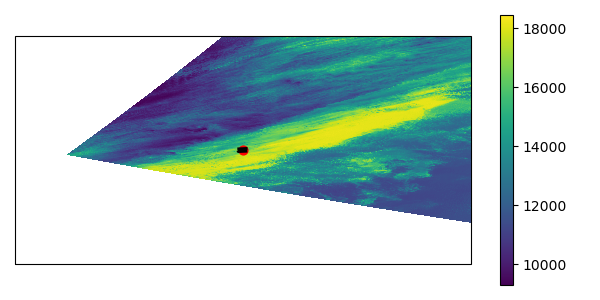

In [18]:
plt.figure(figsize=(6, 3))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_global()
ax.set_ylim([ilat-1,ilat+1])
ax.set_xlim([ilon-2,ilon+2])
cb = ax.pcolormesh(ls_scene.x,ls_scene.y,ls_scene.sel(band=1).to_array().isel(variable=0),transform=cartopy.crs.epsg(3031))
plt.scatter([ilon],[ilat],c='r',s=40,transform=ccrs.PlateCarree())
plt.plot([polarx[0],polarx[0],polarx[1],polarx[1],polarx[0]],[polary[0],polary[1],polary[1],polary[0],polary[0]],lw=2,ls='--',color='k',transform=cartopy.crs.epsg(3031))
ax.coastlines()
plt.colorbar(cb)
plt.tight_layout()

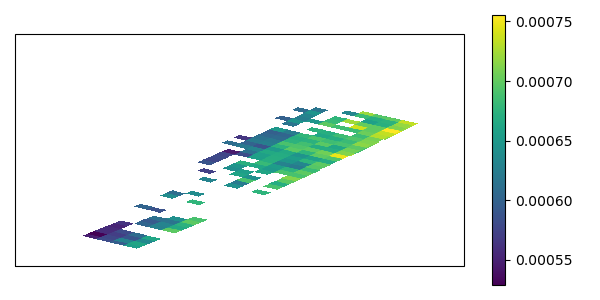

In [222]:
# plt.figure(figsize=(6, 3))
# ax = plt.axes(projection=ccrs.PlateCarree())
# ax.set_global()
# cb = ax.pcolormesh(WV_xr.x,WV_xr.y,WV_xr,transform=cartopy.crs.epsg(3031))
# ax.coastlines()
# ax.set_ylim([-72.6, -69.5])
# ax.set_xlim([-129,-123])
# plt.colorbar(cb)
# plt.tight_layout()

In [159]:
# Plot tiles of all scenes found
plot_search(gf,satellite,colnm)

:Overlay
   .Tiles.I    :Tiles   [x,y]
   .Polygons.I :Polygons   [Longitude,Latitude]   (landsat:wrs_path,landsat:wrs_row)

**Note the bands you would like to include are assigned by passing the bandNames parameter to landsat_to_xarray using the following codes:**

'coastal', 'blue', 'green', 'red', 'nir08', 'swir16', 'swir22', 'pan', 'cirrus', 'lwir11', 'lwir12', 'qa_pixel'

# Landsat-iQUAM validation assessment

In [48]:
# Read in processed matchups
# out_df = lsatpath / 'Landsat_validation_20230822_2023_01'
# df1 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20230822_2022_01'
# df2 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20230822_2021_01'
# df3 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20230822_2018_01'
# df4 = pd.read_pickle(out_df)
# valids = pd.concat([df1,df2,df3,df4])

# out_df = lsatpath / 'Landsat_validation_20240305_202109_202304'
# df1 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20240305_202012_202103'
# df2 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20240305_202011_202103'
# df3 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20240305_202002_202002'
# df4 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20240305_201909_202103'
# df5 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20240305_201509_201703'
# df6 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20240305_201409_201503'
# df7 = pd.read_pickle(out_df)

# out_df = lsatpath / 'Landsat_validation_20241128_202209_202303'
# df1 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20241128_202109_202203'
# df2 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20250107_202009_202103'
# df3 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20241128_201909_202003'
# df4 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20241128_201809_201903'
# df5 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20241128_201709_201803'
# df6 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20241128_201609_201703'
# df7 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20241128_201509_201603'
# df8 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20241128_201409_201503'
# df9 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20241128_201309_201403'
# df10 = pd.read_pickle(out_df)

# # 20250107 is threshold=-1.9, 20250114 is thresh=-1.94, 20250205 is thresh=-1.9
# out_df = lsatpath / 'Landsat_validation_20250205_202209_202303_1.0'
# df1 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20250205_202109_202203_1.0'
# df2 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20250205_202009_202103_1.0'
# df3 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20250205_201909_202003_1.0'
# df4 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20250205_201809_201903_1.0'
# df5 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20250205_201709_201803_1.0'
# df6 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20250205_201609_201703_1.0'
# df7 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20250205_201509_201603_1.0'
# df8 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20250205_201409_201503_1.0'
# df9 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20250205_201309_201403_1.0'
# df10 = pd.read_pickle(out_df)

out_df = lsatpath / 'Landsat_validation_20250507_202209_202303_1.0'
df1 = pd.read_pickle(out_df)
out_df = lsatpath / 'Landsat_validation_20250507_202109_202203_1.0'
df2 = pd.read_pickle(out_df)
out_df = lsatpath / 'Landsat_validation_20250507_202009_202103_1.0'
df3 = pd.read_pickle(out_df)
out_df = lsatpath / 'Landsat_validation_20250507_201909_202003_1.0'
df4 = pd.read_pickle(out_df)
out_df = lsatpath / 'Landsat_validation_20250507_201809_201903_1.0'
df5 = pd.read_pickle(out_df)
out_df = lsatpath / 'Landsat_validation_20250507_201709_201803_1.0'
df6 = pd.read_pickle(out_df)
out_df = lsatpath / 'Landsat_validation_20250507_201609_201703_1.0'
df7 = pd.read_pickle(out_df)
out_df = lsatpath / 'Landsat_validation_20250507_201509_201603_1.0'
df8 = pd.read_pickle(out_df)
out_df = lsatpath / 'Landsat_validation_20250507_201409_201503_1.0'
df9 = pd.read_pickle(out_df)
out_df = lsatpath / 'Landsat_validation_20250507_201309_201403_1.0'
df10 = pd.read_pickle(out_df)

valids = pd.concat([df1,df2,df3,df4,df5,df6,df7,df8,df9,df10]) 

valids = valids.set_index('DateTime')
valids = valids.sort_index()
valids['Argo_id'] = valids['Argo_id'].astype(int)

# Remove the non-numeric column for calculating daily means
numeric_valids = valids.select_dtypes(include=[np.number])
validmn = numeric_valids.groupby(numeric_valids['Argo_id']).mean()
valids = valids.reset_index()

# Group by the date component of the datetime and calculate the difference
# valids['time_dif'] = valids.groupby(x.dt.date)['DateTime'].diff()
# validmn['time_dif'] = valids.groupby(valids['DateTime'].dt.date)['time_dif'].first()
# validmn['time_hr'] = validmn['time_dif'].dt.total_seconds()/(60.0*60)
valids['temp_dif'] = valids.groupby(valids['Argo_id'])[f'L8_SST'].diff()
validmn['temp_dif'] = valids.groupby(valids['Argo_id'])['temp_dif'].first()
valids = valids.set_index('DateTime')

validmn['std'] = valids.groupby([valids['Argo_id']])[f'L8_SST'].std()
validmn['xaxis'] = pd.to_datetime(validmn.index).dayofyear
validmn['xaxis'][validmn['xaxis']<(365/2)] = validmn['xaxis'] + 365

valids['xaxis'] = pd.to_datetime(valids.index).dayofyear
valids['xaxis'][valids['xaxis']<(365/2)] = valids['xaxis'] + 365

validmn = validmn.dropna(subset=['L8_SST'])

valids

,L8_filename,L8_SST,L8_std,center,N,S,E,W,NE,SE,NW,SW,L8_SST_max,L8_SST_min,Argo_id,Argo_SST,A_lat,A_lon,temp_dif,xaxis
DateTime,,,,,,,,,,,,,,,,,,,,
2015-12-11 10:00:00,LC08_L1GT_027110_20151211_20201016_02_T2,-1.09,0.12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.787008,-1.252163,1614080,-1.76,-70.383110,-135.929657,NaN,345
2016-02-13 08:00:00,LC08_L1GT_027111_20160213_20201016_02_T2,-1.74,0.09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.571394,-1.893231,1460597,-0.53,-71.686996,-135.951996,NaN,409
2016-09-23 03:00:00,LC08_L1GT_029109_20160922_20200906_02_T2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1732027,-1.83,-70.180000,-134.613007,NaN,267
2018-01-01 12:00:00,LC08_L1GT_228108_20180101_20201016_02_T2,-0.68,0.05,-0.650624,-0.601495,-0.684302,-0.640289,-0.640289,-0.573061,-0.692066,-0.632525,-0.653246,-0.469712,-0.837162,1790883,-0.05,-68.344002,-80.625000,NaN,366
2018-01-21 23:00:00,LC08_L1GT_023110_20180121_20201016_02_T2,-0.93,0.05,-0.952590,-0.931842,-0.955183,-0.978524,-0.929249,-0.957777,-0.962963,-0.908476,-0.949996,-0.806581,-1.121442,1799801,-1.08,-70.258003,-128.796005,NaN,386
2018-10-29 17:00:00,LC08_L1GT_022110_20181029_20201016_02_T2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1898109,-1.82,-70.391899,-126.625000,NaN,302
2018-12-10 02:00:00,LC08_L1GT_005109_20181209_20201016_02_T2,-1.85,0.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.803631,-1.899024,1969557,-1.79,-70.017700,-99.761002,NaN,344
2018-12-10 02:00:00,LC08_L1GT_005110_20181209_20201016_02_T2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1969557,-1.79,-70.017700,-99.761002,NaN,344
2019-02-23 15:00:00,LC08_L1GT_226108_20190223_20201016_02_T2,0.95,0.09,0.927724,0.937753,0.935233,0.935233,0.915176,0.940273,0.947807,0.912656,0.925205,1.188241,0.550417,1711312,1.29,-67.725304,-76.595497,NaN,419


## Visualize all validation matchups for manual QC

In [49]:
# Setup and authenticate 
from dask.distributed import Client
import logging
client = Client(processes=True, n_workers=4, 
                threads_per_worker=1,
                silence_logs=logging.ERROR)
client.run(lambda: os.environ["AWS_REQUEST_PAYER"] == "requester" )
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /user/tsnow03/proxy/37659/status,
Dashboard: /user/tsnow03/proxy/37659/status,Workers: 4
Total threads: 4,Total memory: 29.67 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:38417,Workers: 4
Dashboard: /user/tsnow03/proxy/37659/status,Total threads: 4
Started: Just now,Total memory: 29.67 GiB
Comm: tcp://127.0.0.1:37101,Total threads: 1
Dashboard: /user/tsnow03/proxy/37205/status,Memory: 7.42 GiB
Nanny: tcp://127.0.0.1:33211,


In [50]:
os.chdir(SSTpath)
lsatfiles = os.listdir(SSTpath)
lsatfiles = [i for i in lsatfiles if i[0]=='L']

# Remove all files from the list with repeats and Landsat mean = nan
remove = [
'LC08_L1GT_029109_20160922_20200906_02_T2', 
'LC08_L1GT_022110_20181029_20201016_02_T2', 
'LC08_L1GT_005110_20181209_20201016_02_T2',
'LC08_L1GT_228108_20200123_20201016_02_T2',
'LC08_L1GT_001108_20200929_20201006_02_T2',
'LC08_L1GT_002109_20201022_20201105_02_T2',
'LC08_L1GT_233108_20201109_20210317_02_T2',
'LC08_L1GT_233109_20201109_20210317_02_T2',
'LC08_L1GT_001109_20201202_20210312_02_T2',
'LC08_L1GT_027112_20220128_20220204_02_T2',
'LC08_L1GT_002109_20210331_20210408_02_T2'
]

lsatfiles = [i for i in lsatfiles if i[:-15] not in remove]
if len(lsatfiles)!=12:
    print('Wrong number of Landsat scenes!!!')

good_ids = [2110117, 2237071,1892417,2150128,1711312,1969557,1799801]  # Argo_id numbers with good SST

LC08_L1GT_026112_20220310_20220321_02_T2_172555_Cel.tif
LC08_L1GT_008109_20220107_20220114_02_T2_153344_Cel.tif
LC08_L1GT_002108_20210331_20210408_02_T2_145547_Cel.tif
LC08_L1GT_009109_20200329_20200822_02_T2_153924_Cel.tif
LC08_L1GT_029110_20200309_20201016_02_T2_174335_Cel.tif
LC08_L1GT_006109_20200221_20201016_02_T2_152108_Cel.tif
LC08_L1GT_226108_20190223_20201016_02_T2_140006_Cel.tif
LC08_L1GT_005109_20181209_20201016_02_T2_151450_Cel.tif
LC08_L1GT_228108_20180101_20201016_02_T2_141254_Cel.tif
LC08_L1GT_023110_20180121_20201016_02_T2_170636_Cel.tif
LC08_L1GT_027111_20160213_20201016_02_T2_173140_Cel.tif
LC08_L1GT_027110_20151211_20201016_02_T2_173126_Cel.tif


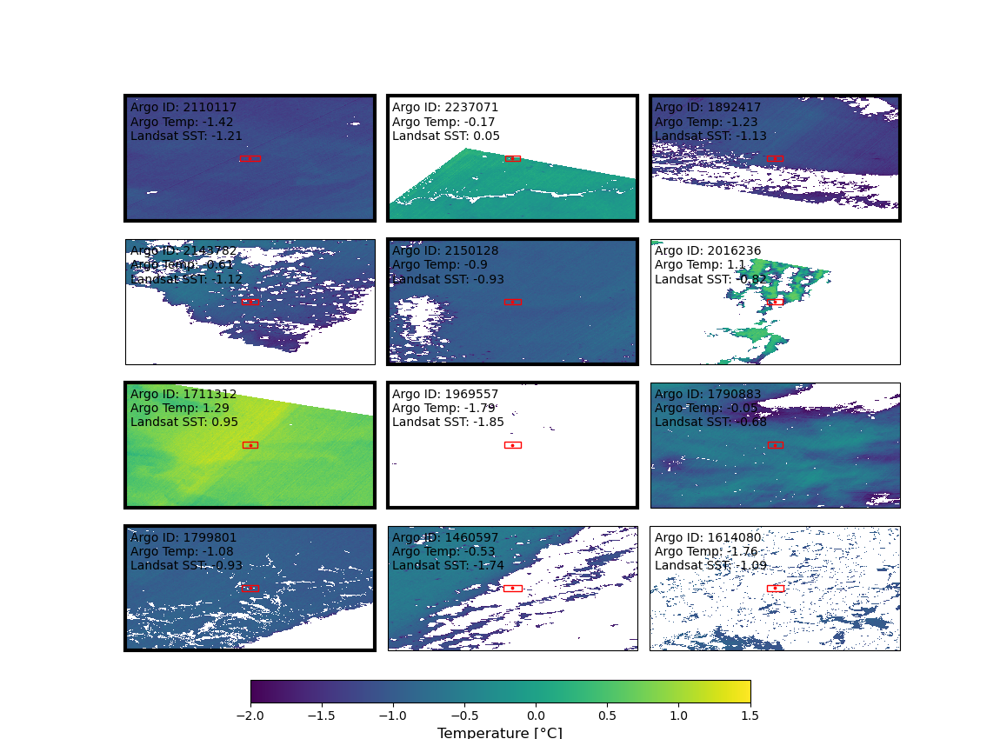

In [46]:
# Number of columns/rows for subplots
n_cols = 3
n_rows = 4

# Create one figure and a 4x7 grid of subplots
# The figsize is 10 across; adjust height as needed for clarity
fig, axes = plt.subplots(
    nrows=n_rows,
    ncols=n_cols,
    figsize=(11.5, 8.5),   
    subplot_kw={'projection': ccrs.PlateCarree()}
)

# Optional: if you want them *really* close, you can fine-tune spacing:
plt.subplots_adjust(wspace=0.05, hspace=0.03)
# plt.subplots_adjust(bottom=0.15)

# Counter for subplot index, and a handle to store the last "imshow" (for colorbar)
i = 0
im_obj = None

for lsatfile in lsatfiles:
    lsID = lsatfile
    print(lsID)
    
    mrow = valids[valids['L8_filename'].str.contains(lsatfile[:-15])]
    
    for idx, row in mrow.iterrows():
        # Check if L8_SST is NaN
        if pd.isnull(row['L8_SST']):
            # If it is NaN, skip this iteration and do not plot
            continue
        
        # --- Prepare data and coordinates ---
        ilat = row['A_lat']
        ilon = row['A_lon']
        
        lat_add = km_to_decimal_degrees(dist, ilat, direction='latitude')
        lon_add = km_to_decimal_degrees(dist, ilat, direction='longitude')
        xmin, ymin, xmax, ymax = (ilon - lon_add, ilat - lat_add, 
                                  ilon + lon_add, ilat + lat_add)
        
        # Load the Landsat file
        ds = xr.open_dataset(lsatfile, chunks=dict(x=512, y=512), engine='rasterio')
        ls_scene = ds['band_data'].sel(band=1).rio.write_crs("epsg:3031", inplace=True)
        
        # Assign time coordinate
        times = pd.to_datetime(lsatfile[17:25] + lsatfile[41:47], format='%Y%m%d%H%M%S')
        ls_scene = ls_scene.assign_coords(time=times, ID=lsatfile[:-8])
        
        # Reproject to EPSG:4326
        ls_scene = ls_scene.rio.reproject("EPSG:4326")

        # Calibrate using MODIS
        ls_scene = ls_scene * calib_m + calib_b

        # Remove all pixels that are too cold
        ls_scene = ls_scene.where(ls_scene>=lthresh,np.nan)
        
        # Select the subplot axis
        ax = axes[i // n_cols, i % n_cols]
        
        # Plot on that axis, without a colorbar
        # Store the "imshow" result in im_obj so we can build one colorbar later
        im_obj = ls_scene.plot.imshow(
            x='x', y='y',
            vmin=-2.0, vmax=1.5,
            ax=ax,
            transform=ccrs.PlateCarree(),
            origin='upper',
            add_colorbar=False  # <- No individual colorbar
        )
        
        # Remove titles completely (xarray may add one by default)
        ax.set_title('')
        
        # Set extent
        ax.set_extent([ilon - 0.4, ilon + 0.4, ilat - 0.2, ilat + 0.2], crs=ccrs.PlateCarree())
        
        # Argo observation
        ax.scatter([ilon], [ilat], c='r', s=3, transform=ccrs.PlateCarree(), label='Argo location')
        
        # Draw bounding box
        polygon_show = Pgon([(xmin, ymin), (xmin, ymax), 
                             (xmax, ymax), (xmax, ymin)],
                            closed=True, edgecolor='red', facecolor='none')
        ax.add_patch(polygon_show)
        
        # Text label
        text_str = (
            f"Argo ID: {row['Argo_id']}\n"
            f"Argo Temp: {np.around(row['Argo_SST'], 2)}\n"
            f"Landsat SST: {np.around(row['L8_SST'], 2)}"
        )
        ax.text(
            0.02, 0.95,
            text_str,
            transform=ax.transAxes,
            fontsize=10,
            va='top',
            ha='left'
        )

        # Bold certain Argo IDs or filename matches        
        if row['Argo_id'] in good_ids:
            for spine in ax.spines.values():
                spine.set_edgecolor('black')  # Set color of the border
                spine.set_linewidth(3)         # Set thickness of the border

        gc.collect()
        
        # Move to next subplot index
        i += 1
        

# Add a single colorbar for the entire figure
# We use the last "imshow" (im_obj) and attach to all subplot axes
cbar_ax = fig.add_axes([0.25, 0.05, 0.5, 0.03])

cbar = fig.colorbar(
    im_obj, 
    ax=axes.ravel().tolist(),  # or just ax=axes if axes is 2D
    cax=cbar_ax,
    orientation='horizontal',  # 'vertical' or 'horizontal'
    fraction=0.025,            # how long the colorbar is relative to axes
    pad=0.05                   # space between colorbar and subplots
)
cbar.set_label("Temperature [°C]", fontsize=12)

# plt.tight_layout()
plt.show() 

LC08_L1GT_026112_20220310_20220321_02_T2_172555_Cel.tif


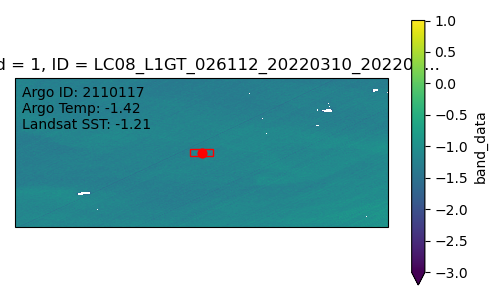

LC08_L1GT_008109_20220107_20220114_02_T2_153344_Cel.tif


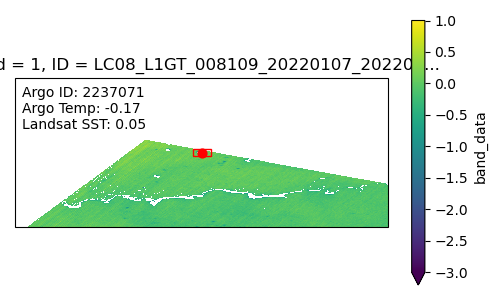

LC08_L1GT_002108_20210331_20210408_02_T2_145547_Cel.tif


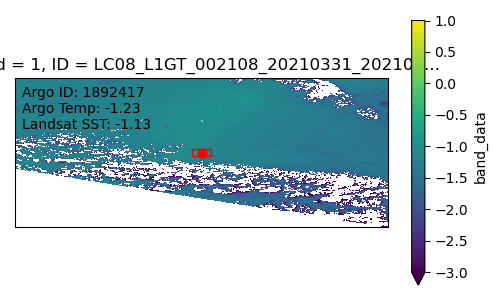

LC08_L1GT_009109_20200329_20200822_02_T2_153924_Cel.tif


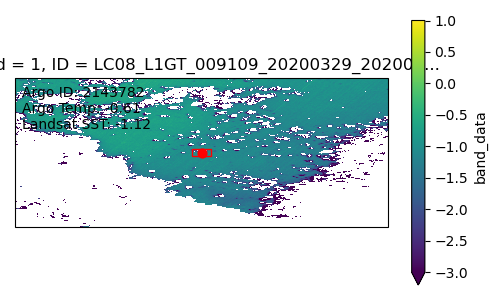

LC08_L1GT_029110_20200309_20201016_02_T2_174335_Cel.tif


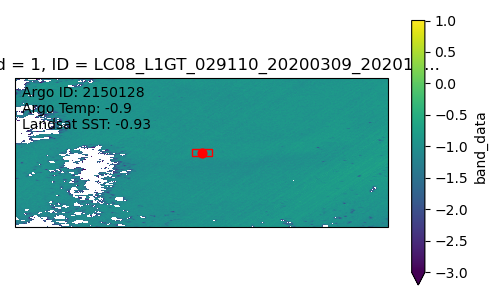

LC08_L1GT_006109_20200221_20201016_02_T2_152108_Cel.tif


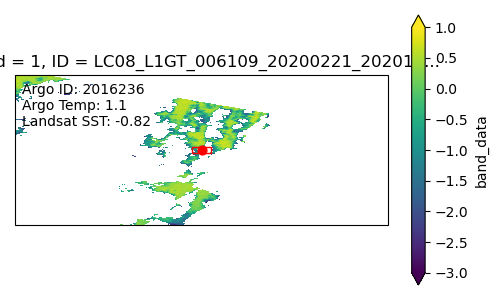

LC08_L1GT_226108_20190223_20201016_02_T2_140006_Cel.tif


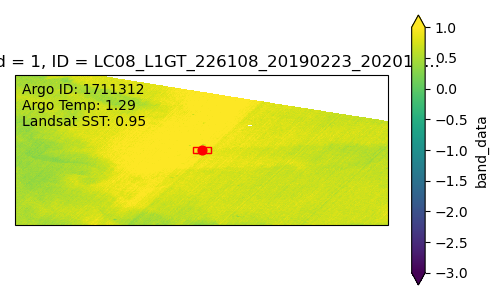

LC08_L1GT_005109_20181209_20201016_02_T2_151450_Cel.tif


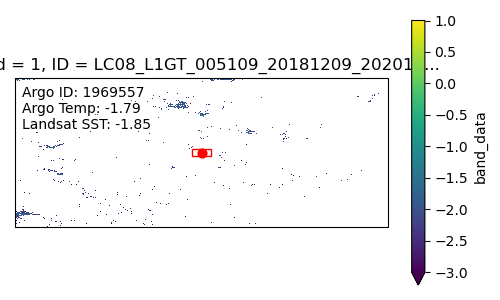

LC08_L1GT_228108_20180101_20201016_02_T2_141254_Cel.tif


Process Dask Worker process (from Nanny):
2025-05-07 18:38:36,303 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
Process Dask Worker process (from Nanny):
Process Dask Worker process (from Nanny):
2025-05-07 18:38:36,306 - distributed.nanny - ERROR - Worker process died unexpectedly
2025-05-07 18:38:36,308 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
Process Dask Worker process (from Nanny):
2025-05-07 18:38:36,309 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
2025-05-07 18:38:36,310 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
2025-05-07 18:38:36,311 - distributed.nanny - ERROR - Worker process died unexpectedly
2025-05-07 18:38:36,312 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
Traceback (mo

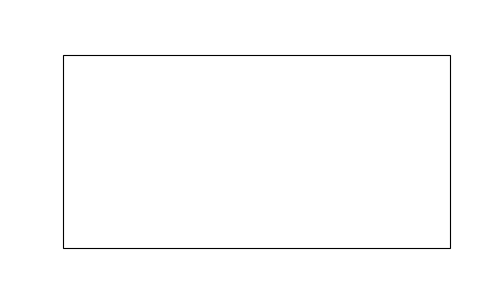

In [47]:
# Plot images individually for inspection
# # ***Do i need to remove outlier pixels from the square that the mean is taken over?
# for lsatfile in lsatfiles:
#     lsID = lsatfile
#     print(lsID)
    
#     # Find all rows where L8_filename contains search_str
#     mrow = valids[valids['L8_filename'].str.contains(lsatfile[:-15])]

#     # if mrow.shape[0]==0:
#     #     continue

#     for idx, row in mrow.iterrows():
#         # Extract lat/lon from this row and reconstruct bounding box bboxV
#         ilat = row['A_lat']
#         ilon = row['A_lon']
        
#         lat_add = km_to_decimal_degrees(dist, ilat, direction='latitude')
#         lon_add = km_to_decimal_degrees(dist, ilat, direction='longitude')
#         xmin, ymin, xmax, ymax = (ilon - lon_add, ilat - lat_add, ilon + lon_add, ilat + lat_add) 
        
#         # Load the Landsat file
#         ls_scene = (
#             xr.open_dataset(lsatfile, chunks=dict(x=512, y=512), engine='rasterio')['band_data']
#               .sel(band=1)
#               .rio.write_crs("epsg:3031", inplace=True))
        
#         # Extract time from filename
#         times = pd.to_datetime(lsatfile[17:25] + lsatfile[41:47], format='%Y%m%d%H%M%S')
#         ls_scene = ls_scene.assign_coords(time=times, ID=lsatfile[:-8])

#         ls_scene = ls_scene.rio.reproject("EPSG:4326")

#         # Calibrate using MODIS
#         ls_scene = ls_scene * calib_m + calib_b

#         # # Remove all pixels that are too cold
#         # ls_scene = ls_scene.where(ls_scene>=lthresh,np.nan)
    
#         # Plot the Landsat scene
#         fig, ax = plt.subplots(figsize=(5, 3), 
#                                subplot_kw={'projection': ccrs.PlateCarree()})
        
#         ls_scene.plot.imshow(x='x', y='y', vmin=-3, vmax=1, ax=ax,transform=ccrs.PlateCarree(),origin='upper',add_colorbar=True)
#         ax.set_extent([ilon - 0.5, ilon + 0.5, ilat - 0.2, ilat + 0.2], ccrs.PlateCarree())
#         ax.scatter([ilon], [ilat], c='r', s=40,transform=ccrs.PlateCarree(),label='Argo point')
    
#         # Draw bounding box for measurements
#         polygon_show = Pgon([(xmin, ymin),(xmin, ymax),(xmax, ymax),(xmax, ymin)], closed=True, edgecolor='red', facecolor='none')
#         ax.add_patch(polygon_show)
        
#         text_str = (
#             f"Argo ID: {row['Argo_id']}\n"
#             f"Argo Temp: {np.around(row['Argo_SST'], 2)}\n"
#             f"Landsat SST: {np.around(row['L8_SST'], 2)}"
#         )
#         ax.text(
#             0.02, 0.95,                  # x,y in Axes coordinates
#             text_str, 
#             transform=ax.transAxes, 
#             fontsize=10, 
#             va='top',                    # vertical alignment at top
#             ha='left'                    # horizontal alignment to the left
#         )
    
#         plt.tight_layout()
#         plt.show()
        
#         gc.collect()

In [ ]:
# for i in range(len(lsatfiles)):
#     # Concatenate all landsat files into xarray with a time dimension
#     ls_scene = xr.open_dataset(lsatfiles[i],chunks=dict(x=512, y=512),engine='rasterio')['band_data'].sel(band=1)
#     ls_scene = ls_scene.rio.write_crs("epsg:3031", inplace=True)

#     times = pd.to_datetime(lsatfiles[i][17:25]+lsatfiles[i][41:47], format='%Y%m%d%H%M%S')
#     ls_scene = ls_scene.assign_coords(time=times,ID=lsatfiles[i][:-8])

#     lsID = lsatfiles[i]
#     print (lsID)

#     fig, ax2 = plt.subplots(figsize=(12, 3))
#     ls_scene.plot.imshow(x='x', y='y', vmin=-3, vmax=1, ax=ax2)
#     ax.set_ylim([ilat-1,ilat+1])
#     ax.set_xlim([ilon-2,ilon+2])
#     plt.scatter([ilon],[ilat],c='r',s=40,transform=ccrs.PlateCarree())
#     ax.coastlines()
#     ax.set_title(f'{times}')
#     plt.tight_layout()
#     plt.show()

## Plot high and low quality validation data

In [51]:
# Remove low quality validation data from the valids data
rm_ids = [1460597, 1614080, 2143782, 2016236, 1790883]
rm = validmn[validmn.index.isin(rm_ids)]
validmn = validmn.drop(index=rm_ids, errors='ignore')
valids = valids[~valids['Argo_id'].isin(rm_ids)]

In [52]:
# Orthoganal Regression 
data = validmn

# Original data
x_original = np.array(data['Argo_SST'])
y_original = np.array(data['L8_SST'])

# Define a linear function for the model
def linear_model(p, x):
    return p[0] * x + p[1]

# Create a Model
linear = Model(linear_model)

# Create a RealData object using your DataFrame
data = RealData(x_original, y_original)

# Set up ODR with the model and data
odr = ODR(data, linear, beta0=[1., 0.])

# Run the regression
out = odr.run()

# Use the output
beta = out.beta
beta_err = out.sd_beta

# Print the summary
out.pprint()

# Predicting values using the ODR model
y_pred = linear_model(beta, x_original)

# Get R2
# Calculate Total Sum of Squares (SST)
y_mean = np.mean(y_original)
SST = np.sum((y_original - y_mean)**2)

# Calculate Residual Sum of Squares (SSR)
SSR = np.sum((y_original - y_pred)**2)

# Compute RMSE
rmse = np.sqrt(((y_original - y_pred) ** 2).mean())

# Calculate R^2
R2 = 1 - (SSR / SST)
print("R^2:", np.around(R2,2))
print(f"RMSE: {np.around(rmse,2)}")

Beta: [ 0.89674959 -0.04246095]
Beta Std Error: [0.06927135 0.08429322]
Beta Covariance: [[0.28401705 0.21504159]
 [0.21504159 0.42055462]]
Residual Variance: 0.016895182938958992
Inverse Condition #: 0.06470770344149686
Reason(s) for Halting:
  Sum of squares convergence
R^2: 0.97
RMSE: 0.15


At 95% confidence interval: 0.9+/-0.14, -0.04+/-0.17, n=7


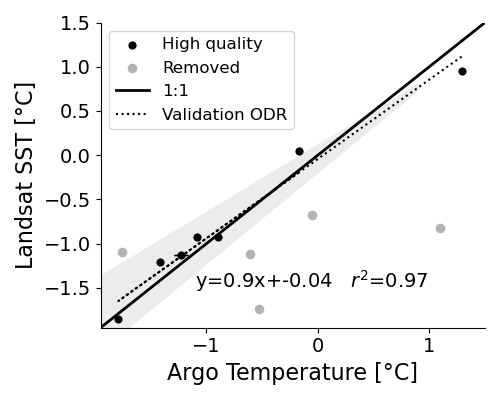

In [53]:
beta_mdn = [beta[0]-beta_err[0]*1.96,beta[1]-beta_err[1]*1.96]
beta_mup = [beta[0]+beta_err[0]*1.96,beta[1]-beta_err[1]*1.96]
beta_bdn = [beta[0]-beta_err[0]*1.96,beta[1]+beta_err[1]*1.96]
beta_bup = [beta[0]+beta_err[0]*1.96,beta[1]+beta_err[1]*1.96]
print(f'At 95% confidence interval: {np.around(beta[0],2)}+/-{np.around(beta_err[0]*1.96,2)}, {np.around(beta[1],2)}+/-{np.around(beta_err[1]*1.96,2)}, n={y_pred.shape[0]}')
xfill = np.array([-4.3,0.9])


# Plot data points and 1:1 line
fig, ax = plt.subplots(figsize=(5, 4))
ax.tick_params(labelsize=14)

xi = np.arange(-7.0,5.0,1.0)

# lower_err = abs(data['L8_SST'] - data['L8_SST_min'])  # distance to lower bound
# upper_err = abs(data['L8_SST_max'] - data['L8_SST'])  # distance to upper bound

ax.scatter(x_original,y_original,color='k',linewidth=0,s=35,label='High quality')
ax.errorbar(x_original,y_original,yerr=validmn['std'],color='k',fmt='o',ecolor='k',elinewidth=1,capthick=1,marker='o',ms=3,capsize=5,label='_no legend_')
# ax.errorbar(data['Argo_SST'],data['L8_SST'],yerr=[lower_err,upper_err],color='k',fmt='o',ecolor='k',elinewidth=1,capthick=1,marker='o',ms=3,capsize=5,label='_no legend_')
# ax.scatter(data['Argo_SST'],data['center'],color='r',linewidth=0,s=25,label='_no label_')
ax.scatter(rm['Argo_SST'],rm['L8_SST'],color='0.7', s=35, label='Removed',zorder=2)
ax.plot(xi,xi,color='k',linewidth=2, label='1:1')
ax.plot(x_original, y_pred, color='k', ls=':', label='Validation ODR')
ax.fill_between(xfill, linear_model(beta_bdn, xfill), linear_model(beta_mup, xfill),alpha=0.1, facecolor='0.3')
# a1.plot(xi,xi*lreg.coef_[0]+lreg.intercept_[0],color='r',linewidth=2,label='RANSAC regression')
# a1.scatter(xC,yLC,color='r',linewidth=0,s=35,label='_no label_')
# a1.plot(xi,xi*resultC.params.L8_SST+resultC.params.Intercept,color='k',linewidth=2,label='OLS regression')
# a1.text(-2.1,-2.85,f'y={np.around(resultC.params.L8_SST,2)}x+{np.around(resultC.params.Intercept,2)}   p={p_val}',fontsize=12)
ax.text(-1.1,-1.5,f'y={np.around(beta[0],2)}x+{np.around(beta[1],2)}   $r^2$={np.around(R2,2)}',fontsize=14)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_ylim([-1.95,1.5])
ax.set_xlim([-1.95,1.5])
ax.set_xlabel('Argo Temperature [°C]',fontsize=16)
ax.set_ylabel('Landsat SST [°C]',fontsize=16)
ax.legend(markerscale=1,fontsize=12,loc='upper left')

plt.tight_layout()
# plt.savefig('/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/Manuscripts/AmundsenCC_Manuscript/Figures/LMCalibration.jpg', format='jpg', dpi=1000)
plt.show()

# Old code copy

In [ ]:
%pip install pykrige
# %pip install ray
%pip install --upgrade earthaccess==0.5.3
# %pip install -U ipywidgets

In [1]:
%matplotlib widget
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from mpl_toolkits.mplot3d import Axes3D
from skimage import exposure
from skimage.io import imsave, imread
from osgeo import ogr
import pystac_client
from pyproj import Transformer
from datetime import date, timedelta, datetime
from dateutil.relativedelta import relativedelta
import geopandas as gpd
import pandas as pd
import geoviews as gv
import hvplot.pandas
import intake
import xarray as xr
import numpy as np
from numpy.random import default_rng
import intake
from pyproj import Proj, transform
from osgeo import gdal
from sklearn.neighbors import BallTree
import earthaccess

# for progress bar
from ipywidgets import IntProgress
from IPython.display import display
import time
from tqdm.notebook import trange, tqdm

import boto3
import rasterio as rio
from rasterio.features import rasterize
from rasterio.session import AWSSession
import dask
import os
import rioxarray
from rasterio.enums import Resampling
from rasterio.warp import reproject
from rasterio.warp import Resampling as resample
import cartopy.crs as ccrs
import cartopy
# from scipy.interpolate import BivariateSpline, UnivariateSpline
from pykrige.ok import OrdinaryKriging
import scipy
import statsmodels.formula.api as smf
from shapely.geometry.polygon import Polygon, Point
import pygmt
import gc
import pytz
import pyproj
from pathlib import Path

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Coefficients for calibration
calib_m = 0.93 #ORD, 0.79 OLS
calib_b = -0.11 #ORD, 0.73 OLS

# Functions

### Functions

In [3]:
# Functions to search and open Lansat scenes
'''
Functions to search, open, and analyze Landsat scenes.
Search_stac finds the Landsat scene based on user parameters, 
plot_search plots the locations of the landsat scenes from the search,
landsat_to_xarray takes one of those scenes and puts all bands into an xarray,
and create_masks produces cloud/ice/water masks for the scene. Subset_img 
subsets a landsat scene with coordinates that have been reprojected from lat/lon
and may be flipped in which is larger in the pair. Lsat_reproj can be used to reproject
while ensuring x and y pairs don't get flipped (common converting between espg 3031 and wgs84.
'''

def landsat_to_xarray(sceneid, catalog, bandNames=None):
    """
    Function to ingest landsat scenes from AWS s3 bucket with alternate href.
    Args:
        catalog: an intake STAC item collection
        bandNames: a list of the bands you want e.g. ['red', 'swir16']
    Returns:
        Xarray of scenes with dimensions time, band, y, x
    """

    # Import to xarray with cloud mask
    # nans are in locations where concat of multiple scenes has expanded the grid
    item = catalog[sceneid.id]

    bands = []
    band_names = []

    if bandNames is None:
        # Get band names
        for k in item.keys():
            M = getattr(item, k).metadata
            if 'eo:bands' in M:
                resol = M['eo:bands'][0]['gsd']
                if resol >= 30: # thermal bands are up sampled from 100 to 30
                    band_names.append(k)
    else:
        band_names = bandNames

    # Add qa band
    if 'qa_pixel' not in band_names:
        band_names.append('qa_pixel')
    
    band_names.append('VZA')
    band_names.append('qa_radsat')

    # Construct xarray for scene
    for band_name in band_names:
        asset = sceneid.assets[band_name]
        href = asset.extra_fields['alternate']['s3']['href']
        band = xr.open_dataset(href, engine='rasterio', chunks=dict(band=1, x=512, y=512))
        band['band'] = [band_name]
        bands.append(band)
    ls_scene = xr.concat(bands, dim='band')
    ls_scene.coords['id'] = sceneid.id
    ls_scene.coords['time'] = item.metadata['datetime'].strftime('%Y-%m-%dT%H:%M:%S')
    ls_scene = ls_scene['band_data']

    return ls_scene

##########################

def create_masks(ls_scene, cloud_mask=True, ice_mask=False, ocean_mask=False):
    """
    Create cloud, ice, and ocean masks. cloud is 1, ice is 2, ocean is 3, everything else is NaN.
    Args:
        ls_scene: xarray of one LS scenes output from landsat_to_xarray
        cloud_mask: bool to generate cloud mask, default True
        ice_mask: bool to generate ice mask, default False
        ocean_mask: bool to generate ocean mask, default False
    Returns:
        new xarray of LS scene with mask
    """
    
    cloud = []
    ocean = []
    ice = []

    qa = ls_scene.sel(band='qa_pixel').astype('uint16')

    n,c = np.unique(qa, return_counts=True)

    for j in range(len(n)):
        longform = f'{n[j]:016b}'
        if (longform[-7]=='0')|(longform[-3]=='1'): #bit 2 and 6 are for cirrus and clear sky
            cloud.append(n[j])
        if longform[-8:]=='11000000': #bit 6 and 7 give clear sky and water, lower bits need to be 0 
            ocean.append(n[j])
        if longform[-7:]=='1100000': #bit 5 and 6 give ice and clear sky 
            ice.append(n[j])

    if 0 in cloud:
        cloud.remove(0)
    if 1 in cloud:
        cloud.remove(1)

    # mask cloud, ice, and ocean
    if cloud_mask==True:
        # cloud is 2
        mask_c = xr.where(qa.isin(cloud), 1, np.nan)

    if ice_mask==True:
        mask_c = xr.where(qa.isin(ice), 2, mask_c)

    if ocean_mask==True:
        mask_c = xr.where(qa.isin(ocean), 3, mask_c)

    ls_scene.coords['mask'] = (('y', 'x'), mask_c.data)
        
    return ls_scene

##########################

def normalize(array):
    '''
    Normalizes a Dask array so all values fall between 0 and 1.

    Parameters
    ----------
    array : dask.array.Array
        The array to be normalized. Any NaNs are ignored when computing
        the minimum and maximum values.

    Returns
    -------
    dask.array.Array
        A new array with values re-scaled to the [0, 1] interval,
        based on the minimum and maximum of the input array.
    '''
    array_min = array.min(skipna=True)
    array_max = array.max(skipna=True)
    return (array - array_min) / (array_max - array_min)

##########################

def search_stac(url,bbox,timeRange,collection,gjson_outfile):
    '''
    Searches a STAC API for items that intersect a specified bounding box 
    and time range, optionally restricted to a given collection. The resulting 
    items are saved to a GeoJSON file and returned as a STAC ItemCollection.

    Parameters
    ----------
    url : str
        The root URL of the STAC API endpoint.
    bbox : list of float
        The bounding box to search, typically in the format [west, south, east, north].
    timeRange : str
        The time range to search, in STAC-compliant format (e.g. "YYYY-MM-DD/YYYY-MM-DD").
    collection : str
        The name of the STAC collection to include in the search.
    gjson_outfile : str
        The file path for the output GeoJSON file to store the returned items.

    Returns
    -------
    pystac.ItemCollection
        The STAC ItemCollection containing all items that match the search criteria.
    '''
 
    api = pystac_client.Client.open(url)

    items = api.search(
                bbox = bbox,
                datetime = timeRange,
                # limit = 400,
                collections=collection
            ).item_collection()

    print(f'{len(items)} Landsat 8/9 items')

    # Write a json file that records the search output
    items.save_object(gjson_outfile)
    
    return items

##########################

def plot_search(gf,satellite,colnm):
    '''
    """
    Plots a GeoDataFrame's area of interest (AOI) and corresponding image footprints 
    on an interactive map using HoloViz libraries (hvPlot, GeoViews, etc.). The 
    footprints are styled with transparency scaled based on the number of images 
    in the GeoDataFrame, and the map includes background tiles and labels.

    Parameters
    ----------
    gf : geopandas.GeoDataFrame
        A GeoDataFrame containing the STAC search results or other geometry 
        data to be plotted. Must include the columns specified in `colnm` 
        plus a 'geometry' column.
    satellite : str
        The name of the satellite (e.g., "Landsat8") to be displayed in the 
        plot title.
    colnm : list of str
        A list of two column names from `gf` to be shown when hovering over 
        footprints in the map. Example: ['landsat:wrs_path','landsat:wrs_row']

    Returns
    -------
    footprints : hvplot/holoviews object
        The plotted footprints object, which can be rendered in a 
        notebook or panel application.

    Notes
    -----
    - This function uses hvPlot, GeoViews, and other HoloViz libraries to 
      create an interactive map. It adds a tile layer and labels on top 
      of the footprints for context.
    - The transparency of each footprint is inversely proportional to 
      the square root of the total number of rows in the GeoDataFrame.

    Examples
    --------
    >>> footprints = plot_search(gdf, "Landsat8", ["id", "cloud_cover"])
    >>> footprints
    '''
    
    # Plot search AOI and frames on a map using Holoviz Libraries (more on these later)
    cols = gf.loc[:,('id',colnm[0],colnm[1],'geometry')]
    alpha = 1/gf.shape[0]**0.5 # transparency scales w number of images

    footprints = cols.hvplot(geo=True, line_color='k', hover_cols=[colnm[0],colnm[1]], alpha=alpha, title=satellite,tiles='ESRI')
    tiles = gv.tile_sources.CartoEco.options(width=700, height=500) 
    labels = gv.tile_sources.StamenLabels.options(level='annotation')
    tiles * footprints * labels
    
    return footprints

##########################

def subset_img(da,polarx,polary):
    '''
    Subsets a 2D xarray.DataArray (with coordinates named 'x' and 'y') 
    to a desired bounding box in a polar stereographic projection. This 
    function accounts for the fact that polar coordinates may be flipped 
    if reprojected from lat/lon, and will attempt alternative slice orders 
    if the first attempt produces an empty subset.

    Parameters
    ----------
    da : xarray.DataArray
        The input data array to be subset. Must have 2 dimensions 
        named 'x' and 'y'.
    polarx : list or tuple of float
        The [min_x, max_x] bounding values for the x dimension in 
        polar stereographic coordinates. May need flipping if 
        reprojected coordinates get reversed.
    polary : list or tuple of float
        The [min_y, max_y] bounding values for the y dimension in 
        polar stereographic coordinates. May need flipping if 
        reprojected coordinates get reversed.

    Returns
    -------
    xarray.DataArray
        A subset of the input `da`, cropped to the specified bounding box.

    Notes
    -----
    - This function **only works** for square grid cropping along the 
      orientation of the grid (i.e., not for lat/lon-based cropping 
      in EPSG:3031 if the grid itself is rotated).
    - If the initial subset call results in zero-sized dimensions, 
      the function automatically attempts to swap the bounding values 
      (flipping min and max) until a non-zero subset is found.
    - If no valid subset can be found, the final printed shape may 
      remain (0, 0) and the function will return an empty subset.
    - The function prints the final shape of the subset before returning.

    Examples
    --------
    >>> # Suppose `img_da` is a DataArray with dimensions (y, x)
    >>> # and we want to subset using two bounding boxes for x and y:
    >>> polarx = [1000000, 1100000]
    >>> polary = [-1200000, -1100000]
    >>> subset = subset_img(img_da, polarx, polary)
    >>> subset.shape
    (1000, 1000)   # for example
    '''

    # ***Landsat shape dimensions are one fewer than they are for LandsatCalibration [0,1] not [1,2], no .to_array() or Band
    ls_sub = da.sel(y=slice(polary[1],polary[0]),x=slice(polarx[0],polarx[1]))

    # Check for right dimensions because y order changes sometimes
    if (ls_sub.x.shape[0]==0) & (ls_sub.y.shape[0]==0):
        print ('L8 x and y shapes are 0')
        ls_sub = da.sel(y=slice(polary[0],polary[1]),x=slice(polarx[1],polarx[0]))
    elif ls_sub.y.shape[0]==0:
        print ('L8 y shape is 0')
        ls_sub = da.sel(y=slice(polary[0],polary[1]),x=slice(polarx[0],polarx[1]))
    elif ls_sub.x.shape[0]==0:
        print ('L8 x shape is 0')
        ls_sub = da.sel(y=slice(polary[1],polary[0]),x=slice(polarx[1],polarx[0]))
    print(ls_sub.shape)
    
    return ls_sub

##########################

def lsat_reproj(old_cs,new_cs,lbox):
    '''
    bbox comes out with the points out of order for making a polygon though pairs are correct. Order is 0,3,1,2 when done in normal projection. 
    Haven't tested for flipped grid.
    '''
    
    test_threshold = 0.5
    
    # Create a transform object to convert between coordinate systems
    inProj = Proj(init=old_cs)
    outProj = Proj(init=new_cs)
    
    ULX,LRY,LRX,ULY = lbox

    [lULX,lLRX], [lULY,lLRY] =  transform(inProj,outProj,[ULX,LRX], [ULY,LRY], always_xy=True)
    [cULX,cLRX], [cULY,cLRY] =  transform(outProj,inProj,[lULX,lLRX], [lULY,lLRY], always_xy=True)
    [lLLX,lURX], [lLLY,lURY] =  transform(inProj,outProj,[ULX,LRX], [LRY,ULY], always_xy=True)
    [cLLX,cURX], [cLLY,cURY] =  transform(outProj,inProj,[lLLX,lURX], [lLLY,lURY], always_xy=True)

    if LRY>ULY:
        bbox = [(lULX,lLLY),(lLLX,lULY),(lLRX,lURY),(lURX,lLRY)]
        print('lsat_reproj flipped orientation')
    else:
        bbox = [(lULX,lULY),(lLLX,lLLY),(lLRX,lLRY),(lURX,lURY)]
        print('lsat_reproj normal orientation')

    checkbox = np.array([cULX,cULY,cLRX,cLRY])
    if np.linalg.norm(checkbox - np.array([ULX,ULY,LRX,LRY])) > test_threshold:
        print(f"Round-trip transformation error 1 of {np.linalg.norm(checkbox - np.array([ULX,ULY,LRX,LRY]))}")
    checkbox = np.array([cLLX,cLLY,cURX,cURY])
    if np.linalg.norm(checkbox - np.array([ULX,LRY,LRX,ULY])) > test_threshold:
        print(f"Round-trip transformation error 2 of {np.linalg.norm(checkbox - np.array([ULX,LRY,LRX,ULY]))}")
    print (f'bbox={bbox}')
    print (f'lbox={lbox}')
    print (f'checkbox={checkbox}')
    
    return bbox,checkbox

##########################

def crop_xarray_dataarray_with_polygon(dataarray, polygon):
    """
    Crop an xarray.DataArray using a polygon.
    
    Parameters:
    - dataarray: xarray.DataArray with x and y coordinates.
    - polygon: Shapely Polygon object defining the crop area.
    
    Returns:
    - Cropped xarray.DataArray.
    """
    # Generate a 2D array of shapely Point objects for each grid point
    lon, lat = np.meshgrid(dataarray.x.values, dataarray.y.values)
    points = np.vectorize(Point)(lon, lat)
    
    # Create a mask where points within the polygon are True
    mask_func = np.vectorize(polygon.contains)
    mask = mask_func(points)
    
    # Convert the mask to an xarray.DataArray
    mask_da = xr.DataArray(mask, dims=["y", "x"], coords={"y": dataarray.y, "x": dataarray.x})
    
    # Apply the mask to the dataarray, cropping to the polygon
    # Use where method with drop=True to drop values outside the polygon
    cropped_dataarray = dataarray.where(mask_da, drop=True)
    
    return cropped_dataarray

##########################

def crosses_idl(coords):
    '''
    Determine if the set of coordinates crosses the International Dateline in a way that will mess up the creation of a polygon
    
    Variables:
    coords = list of lon, lat tuples
    
    Output:
    True or False
    '''
    
    for (lon1, lat1), (lon2, lat2) in zip(coords, coords[1:]):
        if abs(lon1 - lon2) >= 180:
            return True
    return False

In [4]:
# Atmospheric correction and production of SST
'''
Functions to find the matching MODIS water vapor image for atmospheric correction and production of SST.
Open_MODIS finds and downloads the closest MODIS water vapor image to a specific landsat image. Get_wv
aligns and subsets the modis image grid to landsat using MODISlookup and subsamples and extracts the data 
onto the Landsat grid using uniqueMODIS
'''

def open_MODIS(ls_scene,scene,modout_path):
    '''
    Search MOD/MDY07 atmospheric data and open water vapor for data collected closest in time to 
    Landsat scene.
    
    Input:
    ls_scene = xarray dataset with Landsat scene
    modout_path = directory path for MODIS data
    scene = STAC catalog item
    
    Output:
    mod07 = xarray dataset with MODIS (MOD/MDY07) water vapor 
    modfilenm = MODIS filename for image used in atm correction
    '''

    # Get spatial extent of Landsat scene in lat/lon
    mbbox = (scene.metadata['bbox'][0], scene.metadata['bbox'][1], scene.metadata['bbox'][2], scene.metadata['bbox'][3]) #(west, south, east, north) 
    lsatpoly = Polygon([(mbbox[0],mbbox[1]),(mbbox[0],mbbox[3]),(mbbox[2],mbbox[3]),(mbbox[2],mbbox[1]),(mbbox[0],mbbox[1])]) # ensure full lineup between landsat and modis

    ls_time = pd.to_datetime(ls_scene.time.values)
    calc_dt = datetime.strptime(ls_time.strftime('%Y-%m-%d %H:%M:%S'), '%Y-%m-%d %H:%M:%S')
    start_dt = (calc_dt + timedelta(days=-0.5)).strftime('%Y-%m-%d %H:%M:%S')
    end_dt = (calc_dt + timedelta(days=0.5)).strftime('%Y-%m-%d %H:%M:%S')

    # Gather all files from search location from Terra and Aqua for the same day as the Landsat image
    results = earthaccess.search_data(
        short_name='MOD07_L2',
        bounding_box=mbbox,
        # Day of a landsat scene to day after - searches day of only
        temporal=(start_dt,end_dt)
    )
    results2 = earthaccess.search_data(
        short_name='MYD07_L2',
        bounding_box=mbbox,
        # Day of a landsat scene to day after - searches day of only
        temporal=(start_dt,end_dt)
    )
    results = results + results2
    print (f'{len(results)} TOTAL granules')

    # Accept only granules that overlap at least 90% with Landsat
    best_grans = []
    for granule in results:
        try:
            granule['umm']['SpatialExtent']['HorizontalSpatialDomain']['Geometry']['GPolygons']
        except Exception as error:
            print(error)
            continue
        for num in range(len(granule['umm']['SpatialExtent']['HorizontalSpatialDomain']['Geometry']['GPolygons'])):
            try:
                map_points = [(xi['Longitude'],xi['Latitude']) for xi in granule['umm']['SpatialExtent']['HorizontalSpatialDomain']['Geometry']['GPolygons'][num]['Boundary']['Points']]
                pgon = Polygon(map_points)
                percent_dif = lsatpoly.difference(pgon).area/lsatpoly.area
                if percent_dif < 0.1:
                    if crosses_idl(map_points):
                        print (f'A granule has messed up polygon that likely crosses the International DateLine')
                    else:
                        best_grans.append(granule)
                        continue
            except Exception as error:
                print(error)
                # Would love to raise an exception for a valueerror except for GEOSError but not sure how 
    print(f'{len(best_grans)} TOTAL granules w overlap')

    # Find MODIS image closest in time to the Landsat image
    Mdates = [pd.to_datetime(granule['umm']['TemporalExtent']['RangeDateTime']['BeginningDateTime']) for granule in best_grans]
    ind = Mdates.index(min( Mdates, key=lambda x: abs(x - pytz.utc.localize(pd.to_datetime(ls_time)))))
    print(f'Time difference between MODIS and Landsat: {abs(Mdates[ind] - pytz.utc.localize(pd.to_datetime(ls_time)))}')

    # Download MODIS data if needed

    # # This doesn't work because xarray can't open legacy HDF EOS data formats
    # mod07 = xr.open_mfdataset(earthaccess.open(results))

    # Use these access pathways while S3 streaming is not working
    data_links = [granule.data_links(access="external") for granule in best_grans[ind:ind+1]]
    netcdf_list = [g._filter_related_links("USE SERVICE API")[0].replace(".html", ".nc4") for g in best_grans[ind:ind+1]]
    # This is going to be slow as we are asking Opendap to format HDF into NetCDF4 so we only processing 3 granules
    # and Opendap is very prone to failures due concurrent connections, not ideal.
    file_handlers = earthaccess.download(netcdf_list, modout_path,provider='NSIDC')

    # Open MODIS data
    mod_list = os.listdir(modout_path)
    mod_list = [file for file in mod_list if file[-3:]=='nc4']
    print(mod_list)
    modfilenm = mod_list[0]

    mod07 = xr.open_dataset(f'{modout_path}/{mod_list[0]}')
    mod07 = mod07.rio.write_crs('epsg:4326')

    # Delete MODIS file
    os.remove(f'{modout_path}/{mod_list[0]}')
    
    return mod07,modfilenm

##########################

# Notes for changes - MODISlookup2 doesn't need to output lat/lon, but if want to do the check, 
# can take the lat/lon check out of aligne and do it in 
def get_wv(ls_scene,mod07,spacing,param,scene,interp=0):
    '''
    ***This is copied in LandsatCalibration and changes there may generalize this!!
    
    Create water vapor files aligned and subsampled to Landsat
    
    Variables:
    ls_scene = xarray dataset of Landsat scene
    mod07 = xarray dataset with MODIS (MOD/MDY07) water vapor
    spacing = list of desired spatial resolution of data during alignment to MODIS in y and x (e.g.,[300,-300])
    param = string for desired dataset from MODIS file
    scene = 
    interp = 0 is no interpolation, 1 is bicubic kriging interpolation
    
    Output:
    WV_xr = xarray dataarray of Landsat aligned and upsampled dataset from MODIS

    Difference: no bicubic spline interpolation in LsatCalib during the upsampling, don't set new indexes at the end
    '''
    # Read in desired variables
    ULX = ls_scene.x[0] 
    ULY = ls_scene.y[0]  
    LRX = ls_scene.x[-1] 
    LRY = ls_scene.y[-1] 
    box = [ULX,LRX,ULY,LRY]
    
    #Extract desired datasets from MODIS file from lookup key
    data = mod07[param].values
    lat, lon = mod07.Latitude, mod07.Longitude
    #data.attributes()

    # Test lat is in correct range
    if ~((lat <= 90) & (lat >= -90)).all():
        print('MODIS latitude not between -90 and 90')
    # Test lon is in correct range
    if ~((lon <= 180) & (lon >= -180)).all():
        print('MODIS longitude not between -180 and 180')
    
    # Interpolate using PyGMT
    if interp==1:            
        grid = interpMOD(data,lat,lon)
        
        # Produce indicies for aligning MODIS pixel subset to match Landsat image at 4000m (or 300)resolution
        indiciesMOD,lines,samples,lat,lon = MODISlookup(mod07,ls_scene,box,spacing,scene,interpgrid=grid)
        
    else:
        # Produce indicies for aligning MODIS pixel subset to match Landsat image at 4000m (or 300)resolution
        indiciesMOD,lines,samples,lat,lon = MODISlookup(mod07,ls_scene,box,spacing,scene)

    # Align and resample MODIS WV to Landsat at indicated spacing with correct axes
    dataOutWV_xr = alignMODIS(grid.values,lat,lon,param,indiciesMOD,lines,samples,mod07,ls_scene,spacing)
    
    # # Resample WV to Landsat resolution and interpolate with B-spline
    # # Need to use 0.1k (this samples at .1 of the grid)
    # # Output of shape fits and need to adjust x and y coords cuz are wrong
    ups_factor = 30/spacing[0]
    WV_upsample = pygmt.grdsample(grid=dataOutWV_xr, spacing=f'{ups_factor}k', interpolation='c')
    # WV_upsample = xr.open_dataarray(lsatpath+'WV_upsample_B-spline_'+str(ls_scene.id.values))
    # # Resample WV to Landsat resolution manual - no interpolation
    # WV_resamp = MODresample(ls_scene,dataOutWV,y1,x1,spacing)

    # Put into Xarray
    # Sometimes spacing works properly with -1 and sometimes not
    latnew = np.arange(dataOutWV_xr.latitude[0],dataOutWV_xr.latitude[-1]+1,(dataOutWV_xr.latitude[-1]-dataOutWV_xr.latitude[0])/(WV_upsample.shape[0]-1))
    if (WV_upsample.shape[0]!=latnew.shape[0]):
        latnew = np.arange(dataOutWV_xr.latitude[0],dataOutWV_xr.latitude[-1]+1,(dataOutWV_xr.latitude[-1]-dataOutWV_xr.latitude[0])/(WV_upsample.shape[0]))

    # Put into Xarray
    latnew = ls_scene.y[:WV_upsample.shape[0]].values
    lonnew = ls_scene.x[:WV_upsample.shape[1]].values
    if dataOutWV_xr.latitude[0]!=latnew[0]:
        print('Aligned y dim needs to start with the same coordinate as ls_scene')
    if dataOutWV_xr.longitude[0]!=lonnew[0]:
        print('Aligned x dim needs to start with the same coordinate as ls_scene')
    
    WV_xr = xr.DataArray(WV_upsample,name='SST',dims=["y","x"], coords={"latitude": (["y"],latnew), "longitude": (["x"],lonnew)})

    WV_xr = WV_xr.rio.write_crs("epsg:3031", inplace=True)
    WV_xr = WV_xr.rename({'longitude':'x','latitude':'y'})
    
    return WV_xr

##########################
            
def interpMOD(data,lat,lon):
    # Interpolate using PyGMT
    # Extract necessary data into Pandas DataFrame (required for PyGMT)
    df = pd.DataFrame({
        'longitude': lon.values.flatten(),
        'latitude': lat.values.flatten(),
        'water_vapor': data.flatten()
    })

    # Remove missing or NaN values from DataFrame, as `surface` cannot handle them
    df = df.dropna(subset=['water_vapor'])

    # Set the region of interest [xmin, xmax, ymin, ymax] - make this the full image
    region = [df.longitude.min(), df.longitude.max(), df.latitude.min(), df.latitude.max()]
    # region = [scene.metadata['bbox'][0],  scene.metadata['bbox'][2], scene.metadata['bbox'][1], scene.metadata['bbox'][3]]

    # Create a PyGMT session
    with pygmt.clib.Session() as session:
        # Run the surface function
        grid = pygmt.surface(
            data=df[['longitude', 'latitude', 'water_vapor']].to_numpy(),  # Input data as NumPy array
            region=region,  
            spacing=f'0.3k',  
            tension=0.25,  
        )   
    
    return grid

##########################

def MODISlookup(mod07,lsat_filt_msk,box,spacing,scene,interpgrid=None):
    '''
    Look up indices for aligning MODIS product to the Landsat grid
    # Modified from http://stackoverflow.com/questions/2922532/obtain-latitude-and-longitude-from-a-geotiff-file 
    # and Shane Grigsby

    Variables:    
    mod07 = xarray with MODIS data with crs 4326 assigned
    lsat_filt_msk =  Landsat xarray DataArray
    box = list with [left easting,right easting,top northing,bottom northing]
    spacing = desired pixel size for extraction, list of [east/west, north/south] 
          (recommend choosing a number that allows for fast calculations and even division by 30)
    scene = 
    interpgrid = xarray of mod07 data that has been through interpolation in PyGMT (optional)

    Output:
    indiciesMOD = indicies used to project MODIS pixels to match Landsat pixels
    lines = number of lines in Landsat file/MODIS output shape
    samples = number of samples in Landsat file/MODIS output shape
    lon,lat = 2D lon and lat coordinates for grid
    '''
    test_threshold = 5
    
    if interpgrid is None:
        lat, lon = mod07.Latitude.values, mod07.Longitude.values
    else:
        lat, lon = interpgrid.lat, interpgrid.lon
        lon, lat = np.meshgrid(lon,lat)

    # Test lat is in correct range
    if ~((lat <= 90) & (lat >= -90)).all():
        print('MODIS latitude not between -90 and 90')
    # Test lon is in correct range
    if ~((lon <= 180) & (lon >= -180)).all():
        print('MODIS longitude not between -180 and 180')

    # Get the existing coordinate system
    old_cs = ls_scene.rio.crs # 'epsg:3031'
    new_cs = mod07.rio.crs # 'epsg:4326'

    # Create a transform object to convert between coordinate systems
    inProj = Proj(init=old_cs)
    outProj = Proj(init=new_cs)

    # Parse coordinates and spacing to different variables
    west,east,north,south = box
    ewspace,nsspace = spacing

    # Setting up grid, x coord from here to here at this spacing, mesh grid makes 2D
    samples = len(np.r_[west:east+1:ewspace])
    lines = len(np.r_[north:south-1:nsspace])#ns space is -300, could also do 30 instead of 300, but would just have duplicate pixels
    if lines==0:
        lines = len(np.r_[south:north-1:nsspace])

    # x1, y1 = np.meshgrid(np.r_[west:east:ewspace],np.r_[north:south:nsspace]) # offset by 1 meter to preserve shape
    ewdnsamp = int(spacing[0]/30)
    nsdnsamp = int(spacing[1]/30)
    
    # Set up coarser sampling and check to make sure is in the same orientation as the original Landsat grid
    xresamp = ls_scene.x.isel(x=slice(None, None, ewdnsamp)).values
    if xresamp[0]!=ls_scene.x.values[0]:
        xresamp = ls_scene.x.isel(x=slice(None, None, -ewdnsamp)).values
    yresamp = ls_scene.y.isel(y=slice(None, None, nsdnsamp)).values
    if yresamp[0]!=ls_scene.y.values[0]:
        yresamp = ls_scene.y.isel(y=slice(None, None, -nsdnsamp)).values
    x1, y1 = np.meshgrid(xresamp,yresamp)
    LScoords = np.vstack([x1.ravel(),y1.ravel()]).T
    if (LScoords[0,0]!=ls_scene.x.values[0]) |  (LScoords[0,1]!=ls_scene.y.values[0]):
        raise Exception('Landsat coordinates do not match expected during MODIS lookup')

    # Ravel so ND can lookup easily
    # Convert from LS map coords to lat lon --> x = lon, y = lat (usually?)
    # Test that reprojection is working correctly on first and last grid point using round-trip transformation
    xs1, ys1 =  transform(inProj,outProj,LScoords[0,0], LScoords[0,1], radians=True, always_xy=True)
    xsl1, ysl1 =  transform(outProj,inProj,xs1, ys1, radians=True, always_xy=True)
    if np.linalg.norm(np.array([xsl1, ysl1]) - LScoords[0,:]) > test_threshold:
        print(f"Round-trip transformation error for point {LScoords[0,:]}, {np.linalg.norm(np.array([xsl1, ysl1]) - LScoords[0,:])}")
    else:
        # If passes, run on entire grid
        xs, ys =  transform(inProj,outProj,LScoords[:,0], LScoords[:,1], radians=True, always_xy=True)

    # Produce landsat reprojected to lat/lon and ensure lat is in 0 column
    # Test: landsat data is in correct orientation as long as lat is in col 0 and lon in col 1
    grid_coords = test_gridcoords(xs,ys,scene)

    # Test that lines and samples match grid_coords
    if len(grid_coords) != lines*samples:
        raise Exception(f'Size of grid coordinates do not match low resolution Landsat dims: {len(grid_coords)} vs. {lines*samples}. Check that spacing is negative for y')
    MODIS_coords = np.vstack([lat.ravel(),lon.ravel()]).T
    MODIS_coords *= np.pi / 180. # to radians

    # Build lookup, haversine = calc dist between lat,lon pairs so can do nearest neighbor on sphere - if did utm it would be planar
    MOD_Ball = BallTree(MODIS_coords,metric='haversine') #sklearn library
    distanceMOD, indiciesMOD= MOD_Ball.query(grid_coords, dualtree=True, breadth_first=True)
        
    return indiciesMOD,lines,samples,lat,lon

##########################

def test_gridcoords(xs,ys,scene):
    '''
    Test to ensure grid lat and lon are not swapped during reprojection and output grid coordinates
    that have been raveled and stacked for input into BallTree
    
    Variables:
    xs = 1D radians representing longitude 
    ys = 1D radians representing latitude
    scene = catalog item for landsat image
    
    Output:
    grid_coords = two columns of x/y radian pairs representing lon/lat
    '''
    
    # Convert radians to lat/lon
    x_check = xs * 180. / np.pi
    y_check = ys * 180. / np.pi
    
    # We know lat is ys and lon is xs if this is true so goes in 0 column position to match MODIS
    if ((-90 <= y_check) & (y_check <= -60)).all() & ~((-90 <= x_check) & (x_check <= -60)).all():
        grid_coords = np.vstack([ys.ravel(),xs.ravel()]).T # note y / x switch (i.e., lat long convention)
        print('Latitude in proper position')

    # A small subset of data have lat and lon that falls between -60 and -90 so test if the landsat metadata confirms that
    elif ((-90 <= y_check) & (y_check <= -60)).all():
        llons = np.array((float(scene.metadata['bbox'][0]), float(scene.metadata['bbox'][2])))
        # ys is latitude if true here
        if ((-90 <= llons) & (llons <= -60)).all():
            grid_coords = np.vstack([ys.ravel(),xs.ravel()]).T # note y / x switch (i.e., lat long convention)
            print('Latitude in proper position')
        # xs is latitude if not and goes in 0 column position
        else:
            grid_coords = np.vstack([xs.ravel(),ys.ravel()]).T 
            print('Latitude in wrong position')

    # Otherwise xs is latitude and goes in 0 column position
    else:
        grid_coords = np.vstack([xs.ravel(),ys.ravel()]).T
        print('Latitude in wrong position')
    
    return grid_coords

##########################

def alignMODIS(data,lat,lon,param,indiciesMOD,lines,samples,mod07,ls_scene,spacing):
    test_threshold = 5
    
    # Check to ensure lat/lon and data have compatible shapes
    if (np.shape(lat)== np.shape(lon)== np.shape(data))==False:
        raise Exception("Error in creating indicies, lat/lon and data shapes do not match")
        
    # Extract MODIS data into Landsat grid and gather unique data values
    dataOut,uniqWV = uniqueMODIS(data,param,indiciesMOD,lines,samples)
    
    # Check grid directionality and create matching x/y for new grid
    # Define the source and target coordinate reference systems (CRS)
    src_crs = mod07.rio.crs #'epsg:4326'  MODIS
    target_crs = ls_scene.rio.crs #crs[6:] # 'epsg:3031' Landsat

    # Create a PyProj transformer
    transformer = pyproj.Transformer.from_crs(src_crs, target_crs, always_xy=True)
    transformer_test = pyproj.Transformer.from_crs(target_crs, src_crs, always_xy=True)

    # Test that reprojection is working correctly on first and last modis grid point
    xm1,xm2 = lon[0,0],lon[-1,-1]
    ym1,ym2 = lat[0,0],lat[-1,-1]
    xx,yy = [xm1,xm2], [ym1,ym2]
    xs1, ys1 =  transformer.transform(xx,yy)
    xsl1, ysl1 = transformer_test.transform(xs1, ys1)
    for i,n in enumerate(xsl1):
        if np.linalg.norm(np.array([xsl1[i], ysl1[i]]) - [xx[i],yy[i]]) > test_threshold:
            print(f"Round-trip transformation error for {sceneid}, {np.linalg.norm(np.array([xsl1[i], ysl1[i]]) - xx[i],yy[i])}")
    
    # Spacing to create x and y parameters at the correct spacing
    redy = int(abs(spacing[0]/30))
    redx = int(abs(spacing[1]/30))

    # Set up coarser sampling and check to make sure is in the same orientation as the original Landsat grid
    xgrid = ls_scene.x.isel(x=slice(None, None, redx)).values
    if xgrid[0]!=ls_scene.x.values[0]:
        xgrid = ls_scene.x.isel(x=slice(None, None, -redx)).values
    ygrid = ls_scene.y.isel(y=slice(None, None, redy)).values
    if ygrid[0]!=ls_scene.y.values[0]:
        ygrid = ls_scene.y.isel(y=slice(None, None, -redy)).values
    if (xgrid[0]!=ls_scene.x.values[0]) |  (ygrid[0]!=ls_scene.y.values[0]):
        raise Exception('Landsat coordinates do not match expected during MODIS lookup')
    
    # Create xarray from numpy array
    dataOut_xr = xr.DataArray(dataOut,name='SST',dims=["y","x"], coords={"latitude": (["y"],ygrid), "longitude": (["x"],xgrid)})
    
    return dataOut_xr

##########################

def uniqueMODIS(data,param,indiciesMOD,lines,samples):
    '''
    Extracts data values and unique values from desired MODIS dataset that corresponds to Landsat file
    # Modified from http://stackoverflow.com/questions/2922532/obtain-latitude-and-longitude-from-a-geotiff-file
    
    Variables: 
    data = array with MOD07 data in crs 4326 assigned 
    param =  string for desired dataset from MODIS file
    indiciesMOD = indicies output for neighest neighbor query from MODIS to Landsat coordinates
    lines = number of lines in Landsat file/MODIS output shape
    samples = number of samples in Landsat file/MODIS output shape
    
    Output:
    dataOut = MODIS atm image subset and aligned to Landsat image pixels
    uniq = uniq MODIS atm values within area of Landsat image
    #counts = count for each unique value in subset
    '''
    # Convert from K to C
    KtoC = -273.15

    # Reproject data from MODIS into corresponding postions for Landsat pixels for water vapor and ozone
    if param == 'sst':
        dataOut = np.reshape(np.array(data.ravel())[indiciesMOD],(lines,samples))#* # to scale?
        dataOut[dataOut < -3] = np.nan
        MODimg = np.array(data)#* # to scale?
        MODimg[MODimg < 0] = np.nan
    elif param == 'Water_Vapor':
        dataOut = np.reshape(np.array(data.ravel())[indiciesMOD],(lines,samples))
        dataOut[dataOut < 0] = np.nan
        MODimg = np.array(data)
        MODimg[MODimg < 0] = np.nan
    elif param == 'Total_Ozone':
        dataOut = np.reshape(np.array(data.ravel())[indiciesMOD],(lines,samples))
        dataOut[dataOut < 225] = np.nan
        dataOut[dataOut > 430] = np.nan
        MODimg = np.array(data)
        MODimg[MODimg < 0] = np.nan

    # Get unique values for datasets within Landsat extent
    #uniq, inverse, counts= np.unique(dataOut, return_inverse=True, return_counts=True)
    uniq = set(dataOut[np.isfinite(dataOut)])
    
    return dataOut,uniq # Can also output MODimg and inverse and counts if desired

## Derive NLSST coefficients for atmospheric correction

Non-linear SST (NLSST) atmospheric correction algorithm:

$$
  SST = a_0 + a_1\,T_L + a_2\,WV\,T_L
$$

where $a_k$ are derived coefficients, $T_L$ is TOA brightness temperature, and $WV$ is total column water vapor. We use this in `apply_NLSST`.

**Add TOA equations**

To calculate $WV$ ([https://resources.eumetrain.org/data/3/359/navmenu.php?tab=2&page=1.0.0](https://resources.eumetrain.org/data/3/359/navmenu.php?tab=2&page=1.0.0)) from ERA-5 specific humidities at atmospheric pressure levels along the total atmospheric column:

$$
  WV = \frac{1}{\rho_w\,g} \int_{p_z}^0 q(p)\,dp
$$

where $p_w$ is the water density 1000 $kg/m^3$; $g$ is the gravitational constant 9.8 $m/s^2$; $q(p)$ is the mixing ratio (g/kg) of water vapor in hPa at pressure level $p$, and $p_s$ is surface air pressure in hPa. That is calulated in `spec_hu_to_tcwv`. The mixing ratio $q(p)$ ([https://www.e-education.psu.edu/meteo300/node/519](https://www.e-education.psu.edu/meteo300/node/519)) is:

$$
  q(p) = \frac{q}{1-q}\,1000
$$

where $q$ is the specific humidity ($kg/kg$) at pressure level $p$. This is calculated in the `integ_mix_ratio` function in the `prep_NLSST` function below.

In [5]:
# Functions for deriving NLSST atmospheric correction coefficients
'''
These functions help to derive the NLSST atmospheric correction coefficients
prep_NLSST prepares the inputs for running the multiple regression that determines the coefficients, including
converting ERA-5 specific humidity data to total column water vapor in spec_hu_to_tcwv. Derive NLSST then takes
the inputs and runs an OLS multiple regression to derive the coefficients.
'''
def prep_NLSST(atmpath,prefix,spec_hu_file):
    '''
    Create the inputs for the NLSST algorithm using the atmospheric column inputs and outputs from 
    the MODTRAN model runs for Landsat. Uses specific humidity to calculate total column water vapor 
    for the NLSST multiple regression.
    
    Variable:
    atmpath = directory path where MODTRAN outputs are stored (str)
    prefix = beginning of file path name for MODTRAN outputs (str)
    spec_hu_file = file path for era5 input file for MODTRAN that includes specific humidity (str)
    
    Intermediates:
    modtran_lut = pandas dataframe of MODTRAN outputs
    modtran_atm = pandas dataframe of era5 atmopheric columns for input into MODTRAN
    
    Outputs:
    modtran_lut = pandas dataframe of MODTRAN outputs with total column water vapor [cm] added as 
                  a column
    '''
    
    # Open and concatenate MODTRAN outputs for SST algorithm
    # Get file paths
    modtr_list = os.listdir(atmpath)
    modtr_list = [file for file in modtr_list if file.startswith(prefix)]
    modtr_list.sort()

    # Open into pandas and concatenate
    df_list = []
    lut_cols = ['wind spd [m/s]','Surface T[K]','TOA T[K]','transmittance','jakobian']
    
    if len(modtr_list)>1:
        for mfile in modtr_list:
            df_list.append(pd.read_csv(f'{atmpath}/{mfile}', sep=' ',header=None,names=lut_cols))

        modtran_lut = pd.concat(df_list, ignore_index=True)
    else:
        mfile = modtr_list[0]
        modtran_lut = pd.read_csv(f'{atmpath}/{mfile}', sep=' ',header=None,names=lut_cols)
    
    modtran_lut['TCWV [cm]'] = np.nan
    
    # Open atm profiles for input of water vapor specific humidity
    atm_cols = ['Altitude [km]', 'pressure [hPa]', 'temp [K]', 'spec humidity [kg/kg]']
    modtran_atm = pd.read_csv(f'{atmpath}/{spec_hu_file}', sep='\t',header=None,names=atm_cols)
    
    
    # Calculate total column water vapor for each atm column using specific humidity from era5 inputs ***currently slow (~30min)
    # Function to calculate water vapor mixing ratio
    integ_mix_ratio = lambda x, df: ((df[df['pressure [hPa]']==x]['spec humidity [kg/kg]'] / (1-df[df['pressure [hPa]']==x]['spec humidity [kg/kg]']))*1000).values[0]
    
    # Run integral to get tcwv
    modtran_lut = spec_hu_to_tcwv(modtran_lut,modtran_atm,integ_mix_ratio)
    
    print (modtran_lut['TCWV [cm]'].max())
    print (modtran_lut['TCWV [cm]'].min())
    
    return modtran_lut

##########################

def derive_NLSST(modtran_lut):
    '''
    Derive the NLSST coefficients from the atmospheric column inputs and outputs to the MODTRAN
    model runs for Landsat using multiple regression. 
    
    Variables:
    modtran_lut = pandas dataframe that includes columns for surface temperature [K], top of 
                  atmosphere brightness temperature [K], total column water vapor [cm]
    
    Outputs:
    results = multiple regression summary and derived coefficients (ak) for NLSST atmospheric correction
    '''
    # Run OLS multiple regression to derive atmospheric correction coefficients
    df_newnames = modtran_lut.rename(columns={'Surface T[K]': 'surface', 'TOA T[K]': 'toa', 'TCWV [cm]': 'tcwv'})
    df_newnames['tcwv_toa'] = df_newnames['tcwv']*df_newnames['toa']
    results = smf.ols('surface ~ toa + tcwv_toa', data=df_newnames).fit()
 
    return results

##########################

def spec_hu_to_tcwv(modtran_lut,modtran_atm,integ_mix_ratio,atm_levels=37):
    '''
    Calculate total column water vapor by integrating across all atmospheric pressure levels 
    (modtran_atm) for each atmospheric column (modtran_lut) using non-uniform grid trapezoidal 
    integration method F(xp-1) + F(xp) / 2 * dp
    
    m & r track the individual atmospheric columns (dc)
    
    Variables:
    modtran_lut = pandas dataframe of MODTRAN outputs
    modtran_atm = pandas dataframe of era5 atmopheric columns for input into MODTRAN
    integ_mix_ratio = function for calculating the mixing ratio (g/kg) from specific humidity (kg/kg)
    atm_levels = number of atmospheric level in modtran_atm (default=37) (int)
    
    Output:
    modtran_lut = original dataframe with column added for total column water vapor 
    '''

    m = 0
    for y in tqdm(range(modtran_lut.shape[0]-1)):
        r = m + atm_levels
        df = modtran_atm.iloc[m:r]
        wvmr = [integ_mix_ratio(1,df)/2] # for p = 1, see eq. below, but fx_0 is 0 and dp is 1

        # convert from kg/kg to g/kg
        for i in range(1,df['pressure [hPa]'].size):
            p_0 = df['pressure [hPa]'].iloc[i-1]
            p = df['pressure [hPa]'].iloc[i]
            fx_0 = integ_mix_ratio(p_0,df)
            fx = integ_mix_ratio(p,df)
            wvmr.append(((fx_0 + fx/2)*(p-p_0)))

        # convert back to kg/m2 which is equivalent to mm, then convert to cm to match modis
        modtran_lut['TCWV [cm]'].iloc[y] = ((1/1000*9.8) * sum(wvmr) / 1000 / 10) 
        m = r
    
    return modtran_lut

In [6]:
# Functions to produce SST with atmospheric correction
'''
Functions to produce SST with atmospheric correction
apply_NLSST preps the masks and thermal data then runs the entire NLSST correction and calibration pipeline in lsatAtmCorr,
lsatAtmCorr calculates top of atmosphere brightness temperatures from thermal digital numbers data in TOA_BT and applies 
the atmospheric correction to get absolute temperatures [C] using NLSST.
'''

##########################

def TOA_BT(ls_thermal,scene):
    '''
    Calculate TOA radiance and brightness temperature using MTL json
    
    ls_thermal = xarray dataset of Landsat thermal data computed
    scene = catalog item for landsat scene
    
    Using equations from https://www.usgs.gov/landsat-missions/using-usgs-landsat-level-1-data-product
    '''
    
    # Calculate radiances using MTL data
    s3 = boto3.client("s3")

    # Extract bucket and key for json MTL file
    # Example: bucket = "usgs-landsat" ; key = "collection02/level-1/standard/oli-tirs/2019/002/113/LC08_L1GT_002113_20190206_20201016_02_T2/LC08_L1GT_002113_20190206_20201016_02_T2_MTL.json"
    s3_url = scene['MTL.json'].metadata['alternate']['s3']['href']
    bucket = s3_url.split('/')[2].strip()
    key = s3_url.split(bucket)[1].strip()[1:]

    # Get MLT data
    res = s3.get_object(Bucket=bucket, Key=key, RequestPayer="requester")
    MTL = res["Body"].read().decode("utf-8")

    # Get important constants from MTL
    ind = MTL.find('K1_CONSTANT_BAND_10')
    K1_10 = float(MTL[ind+23:ind+31])
    ind = MTL.find('K2_CONSTANT_BAND_10')
    K2_10 = float(MTL[ind+23:ind+32])
    ind = MTL.find('RADIANCE_MULT_BAND_10')
    ML10 = float(MTL[ind+25:ind+35])
    ind = MTL.find('RADIANCE_ADD_BAND_10')
    AL10 = float(MTL[ind+24:ind+31])

    # Mask no data 
    DN_masked = ls_thermal.where(ls_thermal != 0)

    # Top of Atmosphere radiance for Band 10
    Llambda = ML10 * DN_masked + AL10

    # Top of Atmosphere brightness temperature for Band 10
    T10 = K2_10 / np.log((K1_10 / Llambda) + 1)
    return T10

##########################
                    
def NLSST(toa,wv,a0,a1,a2):
    '''
    Calculates the surface temperature 
    
    Variables:
    toa = calculated TOA [K]
    wv = total column water vapor
    ak = derived NLSST coefficients
    
    Output:
    SST = sea surface temperature [C]
    '''
    
    SST = a0 + a1*toa + a2*wv*toa - 273.15
    return SST

##########################

def lsatAtmCorr(ls_thermal,scene,mask,modwv,a0,a1,a2):
    '''
    Applies atmospheric correction to top of atmosphere (TOA) brightness temperatures and converts to 
    absolute temperature for Landsat thermal images. Uses a derived coefficients for a non-linear
    sea surface temperature algorithm (NLSST) and water vapor from MODIS to produce the atmospheric 
    correction.

    Variables:
    ls_thermal = xarray dataset of Landsat thermal band computed 
    scene = STAC catalog item for the Landsat scene
    modwv = Water Vapor array (or other varrying parameter) from MODIS that has been 
            processed to the same dimensionality and pixel size as the Landsat image
    ak = derived NLSST coefficients 

    Previously defined:
    ak = derived NLSST coefficients

    Output: SST 2D array and GTiff of atmospheric corrected absolute temperatures [C]

    '''
    
    T10 = TOA_BT(ls_thermal,scene)
    T10 = mask * T10
    SST = NLSST(T10,modwv,a0,a1,a2)
    SST = SST.compute()
        
    return SST

##########################

def apply_NLSST(ls_thermal,scene,mask,WV_xr,atmcor):
    '''
    Use MODIS water vapor and landsat DN in NLSST algorithm to derive sea surface temperature.
    
    Variables:
    ls_scene = xarray dataset of Landsat scene  
    scene = STAC catalog item for the Landsat scene
    WV_xr = xarray dataarray of MODIS water vapor values matching timing of the landsat scene  
    atmcor = dictionary of derived NLSST coefficients for all months
    
    Outputs:
    SST = multiple regression summary and derived coefficients (ak) for NLSST atmospheric correction
    Also saves a cloud-optimized geotiff of SST
    '''
    try:
        wv2 = mask*WV_xr.values

        # Get rid of low outliers from over ice, cutoff for 98.5%
        outlier = np.quantile(wv2[np.isfinite(wv2)],0.015)
        mask2 = np.ones(wv2.shape)
        mask2[wv2<outlier] = np.nan

        wv3 = mask2*wv2
        wv3 = mask*np.around(wv3,decimals=5)

        means = np.nanmean(wv3)
        print (f'Mean water vapor value is: {means}, min: {np.nanmin(wv3)}, max: {np.nanmax(wv3)}')
        
        # Select appropriate atmospheric correction coefficients
        month = scene.metadata['datetime'].month
        a_mo = f'{month}'.zfill(2)
        a0 = atmcor[a_mo]['a0']
        a1 = atmcor[a_mo]['a1']
        a2 = atmcor[a_mo]['a2']

        # Apply atmospheric correction to get absolute temps in C
        SST = lsatAtmCorr(ls_thermal,scene,mask,wv3,a0,a1,a2)
        
        return SST
        
    except Exception as e: 
        print(e)
        print (f'atm correction of {ls_scene.id.values} failed')

# Run NLSST algorithm

In [64]:
timing = time.time()

In [65]:
# Define the landsat STAC catalog location
url = 'https://landsatlook.usgs.gov/stac-server'

# For atm correction
basepath = Path('/home/jovyan/Landsat_SST_algorithm')
lsatpath = basepath / 'Data'
atmpath = lsatpath / 'AtmCorrection'
modout_path = lsatpath / 'MOD07_L2'

WV = 'Water_Vapor'

# For search and tile plot for Landsat
satellite = 'Landsat8'
collection = 'landsat-c2l1' # Landsat Collection 2, Level 1 - includes L8 and L9
colnm = ['landsat:wrs_path','landsat:wrs_row']
gjson_outfile = lsatpath / f'{satellite}.geojson'

# # For scene search and plot

interp = 1

# SSTpath = lsatpath / 'SST/MODcalib/Cosgrove/'
# bbox = (-103.0, -73.5, -102.0, -73.42) # LatboundsC from LandsatCalibration20201031
# SSTpath = lsatpath / 'SST/MODcalib/DotsonPolynya/'
# bbox = (-113, -73.9, -111.5, -73.5) # Dotson polynya
# SSTpath = lsatpath / 'SST/UncalibratedSST/PineIslandPlume/'
# bbox = (-101.98,-75.09,-101.65,-75.05) # PIG plume for analysis - 2014
# bbox = (-101.88,-75.23,-100.35,-74.76) # PIG ice front for analysis
# bbox = (-101.8,-75.23,-100.50,-74.80) # PIG 2019?
SSTpath = lsatpath / 'SST/Validation/DotsonIntercomp/'
bbox = (-113.5,-74.20,-113.17,-74.11) # Dotson plume for analysis 

# bbox = (-99.2,-69.9,-98.4, -69.6) # Offshelf BAD

In [66]:
# Authenticate for accessing all data # This cell disappears if I make it markdown

In [67]:
# Authenticate for boto S3 access, etc.
os.environ["AWS_REQUEST_PAYER"] = "requester"
aws_session = AWSSession(boto3.Session(), requester_pays=True)

In [68]:
# Setup and authenticate 
from dask.distributed import Client
import logging
client = Client(processes=True, n_workers=4, 
                threads_per_worker=1,
                silence_logs=logging.ERROR)
client.run(lambda: os.environ["AWS_REQUEST_PAYER"] == "requester" )
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /user/tsnow03/proxy/41009/status,
Dashboard: /user/tsnow03/proxy/41009/status,Workers: 4
Total threads: 4,Total memory: 29.67 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:44951,Workers: 4
Dashboard: /user/tsnow03/proxy/41009/status,Total threads: 4
Started: Just now,Total memory: 29.67 GiB
Comm: tcp://127.0.0.1:39001,Total threads: 1
Dashboard: /user/tsnow03/proxy/40791/status,Memory: 7.42 GiB
Nanny: tcp://127.0.0.1:37649,


In [69]:
# Authenticate for accessing NASA data (MODIS)
auth = earthaccess.login(strategy="netrc")

# If we are not authenticated
if not auth.authenticated:
    # Ask for credentials and persist them in a .netrc file
    auth.login(strategy="interactive", persist=True)

In [70]:
# Derive NLSST coefficiencts from MODTRAN files

months = ['01','02','03','04','05','06','07','08','09','10','11','12']
atmcor = {}

for mo in months:
    print (f'Month: {mo}')
    NLSST_input_file = atmpath / f'TCWV_{mo}_20230911'
    if os.path.isfile(NLSST_input_file):
        print ('NLSST input exists')
        modtran_lut = pd.read_pickle(NLSST_input_file)
    else:
        spec_hu_file = f'modtran_atmprofiles_{mo}_20230823.txt'
        prefix = f'modtran_atmprofiles_{mo}.bts+tau+dbtdsst'
        modtran_lut = prep_NLSST(atmpath,prefix,spec_hu_file)
        modtran_lut.to_pickle(NLSST_input_file)
    
    NLSST_results = derive_NLSST(modtran_lut)
    a0 = np.around(NLSST_results.params.Intercept,2)
    a1 = np.around(NLSST_results.params.toa,2)
    a2 = np.around(NLSST_results.params.tcwv_toa,2)
        
    atmcor[mo] = {"a0": a0, "a1": a1, "a2": a2}
    
print(NLSST_results.summary())

Month: 01
NLSST input exists
Month: 02
NLSST input exists
Month: 03
NLSST input exists
Month: 04
NLSST input exists
Month: 05
NLSST input exists
Month: 06
NLSST input exists
Month: 07
NLSST input exists
Month: 08
NLSST input exists
Month: 09
NLSST input exists
Month: 10
NLSST input exists
Month: 11
NLSST input exists
Month: 12
NLSST input exists
                            OLS Regression Results                            
Dep. Variable:                surface   R-squared:                       0.964
Model:                            OLS   Adj. R-squared:                  0.964
Method:                 Least Squares   F-statistic:                 2.158e+04
Date:                Wed, 07 May 2025   Prob (F-statistic):               0.00
Time:                        20:16:28   Log-Likelihood:                 1360.2
No. Observations:                1629   AIC:                            -2714.
Df Residuals:                    1626   BIC:                            -2698.
Df Model:           

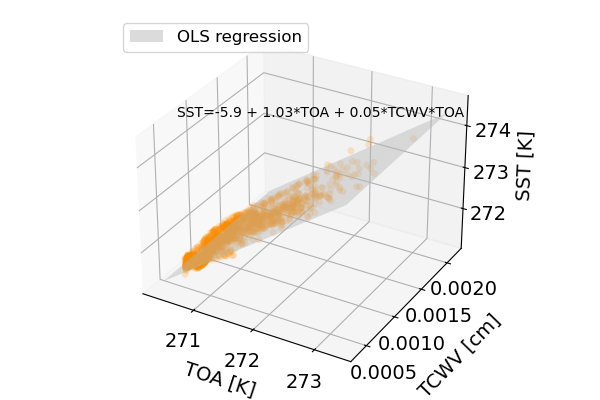

In [71]:
# Plot multiple linear regression in 3D

data = modtran_lut

# Generating predictions for a range of TOA and TCWV values
xi = np.linspace(data['TOA T[K]'].min(), data['TOA T[K]'].max(), 100)
wi = np.linspace(data['TCWV [cm]'].min(), data['TCWV [cm]'].max(), 100)
X, W = np.meshgrid(xi, wi)
Z_pred = NLSST_results.predict(exog=dict(toa=X.ravel(), tcwv_toa=(X*W).ravel())).values.reshape(X.shape)

# Create a figure and a 3D axes
fig = plt.figure(figsize=(6, 4))
ax = fig.add_subplot(111, projection='3d')

ax.tick_params(labelsize=14)
ax.plot_surface(X,W,Z_pred,color='0.8', alpha=0.5,label='OLS regression',zorder=0)
ax.scatter(data['TOA T[K]'],data['TCWV [cm]'],data['Surface T[K]'],color='darkorange',linewidth=0,s=25,alpha=0.2,label='_no label_',zorder=2)
ax.text(270.3,0.0007,274.7,f'SST={a0} + {a1}*TOA + {a2}*TCWV*TOA',fontsize=10)
# a1.set_ylim([-3,2.5])
# a1.set_xlim([-3,2.5])
ax.set_xlabel('TOA [K]',labelpad=6,fontsize=14)
ax.set_ylabel('TCWV [cm]',labelpad=13,fontsize=14)
ax.set_zlabel('SST [K]',labelpad=6,fontsize=14)
ax.legend(markerscale=1,fontsize=12,loc='upper left')

plt.tight_layout()
# plt.savefig('/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/Manuscripts/AmundsenCC_Manuscript/Figures/LMCalibration.jpg', format='jpg', dpi=1000)
plt.show()

In [16]:
# # Info on MODIS atmospheric dataset (MOD/MYD07 Level 2)
# from pprint import pprint
# datasets = earthaccess.search_datasets(short_name="MOD07_L2",
#                                        cloud_hosted=True)

# for dataset in datasets:
#     pprint(dataset.summary())

## Search for desired Landsat scenes

In [18]:
# # Interpolation test values, keep scene [2:3]
# bbox = (-106.5, -75.0, -104.9, -74.7) #(west, south, east, north) 
# timeRange = '2019-02-06/2019-02-07'

# # [0:1] Cosgrove bbox
# timeRange = '2022-11-01/2023-03-27'

# # # [0:1] Dotson bbox
# timeRange = '2022-11-01/2023-03-27'

# Paper time span
# # Cosgrove full run 
# timeRange = '2021-09-01/2023-04-07'

# # Dotson full run
# timeRange = '2021-09-01/2023-05-31'

# Dotson intercomp run
timeRange = '2021-09-01/2023-03-31'

# timeRange = '2023-03-30/2023-03-31'
# timeRange = '2022-12-18/2022-12-19'
# timeRange = '2023-01-30/2023-01-31'

In [19]:
# Search for desired Landsat scenes
items = search_stac(url,bbox,timeRange,collection,gjson_outfile)

# Open stac catalog for some needed info
catalog = intake.open_stac_item_collection(items)

# Load the geojson file
gf = gpd.read_file(gjson_outfile)

388 items


In [20]:
# Plot tiles of all scenes found
plot_search(gf,satellite,colnm)

:Overlay
   .Tiles.I    :Tiles   [x,y]
   .Polygons.I :Polygons   [Longitude,Latitude]   (landsat:wrs_path,landsat:wrs_row)

**Note the bands you would like to include are assigned by passing the bandNames parameter to landsat_to_xarray using the following codes:**

'coastal', 'blue', 'green', 'red', 'nir08', 'swir16', 'swir22', 'pan', 'cirrus', 'lwir11', 'lwir12', 'qa_pixel'

## Process Landsat scenes to acquire sea surface temperature

In [21]:
# Convert bounding box to polar for checking if landsat has any data in bounding box
source_crs = 'epsg:4326' 
target_crs = 'epsg:3031' # Coordinate system of the file

sbox,checkbox = lsat_reproj(source_crs,target_crs,(bbox[0],bbox[1],bbox[2],bbox[3]))

# Create polygon for later cropping
polygon = Polygon([(sbox[0][0],sbox[0][1]),(sbox[3][0],sbox[3][1]),(sbox[2][0],sbox[2][1]),(sbox[1][0],sbox[1][1])])

# Create min/max boundaries for trimming image before crop_xarray to cut down on processing times
minx, miny, maxx, maxy = polygon.bounds
polarx = [minx, maxx]
polary = [miny, maxy]

lsat_reproj normal orientation
bbox=[(-1593109.0801169195, -692703.5426974659), (-1583974.6675212178, -688731.7870628558), (-1587915.183520055, -679597.3747787862), (-1597072.3201527703, -683516.4543874896)]
lbox=(-113.5, -74.2, -113.17, -74.11)
checkbox=[-113.5   -74.2  -113.17  -74.11]


In [22]:
%%time  
## 1 min 1 sec per image without interpolation, 1 min 5 s with interp, no extra memory 
## With all clusters - 4 min 20 sec @ 15k, 4 min 6 sec @ 10k, 6 min 40 sec @ 5k

# Saves MODIS water vapor file name in COG so know what each image was corrected with

# Include only Landsat 8 scenes
catalog_list = [x for x in items if x.id[3]=='8']

for sceneid in catalog_list:
    print(sceneid.id)
    
    scene = catalog[sceneid.id]
    timestr = scene.metadata['datetime'].strftime('%H%M%S')

    outFile = f'{SSTpath}/{sceneid.id}_{timestr}_Cel.tif'
    
    if os.path.isfile(outFile):
        print (f'{sceneid.id} - atm corr exists')

    else:
        # Open all desired bands for one scene
        ls_scene = landsat_to_xarray(sceneid,catalog)
        ls_scene = ls_scene.rio.write_crs("epsg:3031", inplace=True)

        # Create classification mask
        ls_scene = create_masks(ls_scene, cloud_mask=True, ice_mask=True, ocean_mask=True)
        
        try:
            # Check for any open ocean pixels in bounding box - go to next image if none - 9.3 s
            mask = np.ones(ls_scene.shape[1:])
            mask[ls_scene.mask!=3] = np.nan
            ls_thermal = ls_scene.sel(band='lwir11').compute()
            ls_box = subset_img(ls_thermal*mask,polarx,polary)
            # ls_box = (ls_thermal*mask).sel(y=slice(polary[1],polary[0]),x=slice(polarx[0],polarx[1]))
            ls_box = ls_box.where(ls_box >= -3.5, np.nan)

            if ((ls_box).notnull()).sum().values==0:
                print (f'{sceneid.id} has no SSTs')
                try:
                    del ls_scene, scene, mask, ls_thermal, ls_box
                except:
                    pass
                gc.collect()
                continue
            
            # Use band ratios for RF cloud pixel classification
            # ###

            # Atmospheric correction using MODIS
            # Acquire and align MODIS water vapor (MOD/MYD07) to Landsat
            mod07,modfilenm = open_MODIS(ls_scene,scene,modout_path)

            # Create water vapor files aligned and subsampled to Landsat
            spacing = [300,-300] # 300m sampling of MODIS data so that upsampling is easy and because 30m takes far too long, 1 must be negative for MODISlookup

            #***has not yet been tested to ensure no interp works properly
            WV_xr = get_wv(ls_scene,mod07,spacing,WV,scene,interp=interp)

            # Create SST by masking and using water vapor to apply month-specific atmospheric correction
            SST = apply_NLSST(ls_thermal,scene,mask,WV_xr,atmcor)

            # Record MODIS water vapor image used in atmospheric correction, will find this info save under band_data in
            # data variables in COG (click on white paper info button in xarray readout)
            SST.attrs['MODIS_WV'] = modfilenm

            print (f'Mean SST: {np.nanmean(SST)}')

            # Save to a cloud-optimized Geotiff
            SST.rio.to_raster(raster_path=outFile, driver="COG")
            
        except Exception as e:
            print (f'{sceneid.id} has no SSTs: {e}')
        
        try:
            del ls_scene, scene, ls_thermal, ls_box, mod07, WV_xr, SST
        except:
            pass
        
        gc.collect()

LC08_L1GT_008113_20230518_20230524_02_T2
(437, 436)
LC08_L1GT_008113_20230518_20230524_02_T2 has no SSTs
LC08_L1GT_010113_20230516_20230523_02_T2
(437, 436)
LC08_L1GT_010113_20230516_20230523_02_T2 has no SSTs
LC08_L1GT_010112_20230516_20230523_02_T2
(437, 436)
LC08_L1GT_010112_20230516_20230523_02_T2 has no SSTs
LC08_L1GT_008113_20230502_20230509_02_T2
(437, 436)
LC08_L1GT_008113_20230502_20230509_02_T2 has no SSTs
LC08_L1GT_010113_20230430_20230509_02_T2
(437, 436)
LC08_L1GT_010113_20230430_20230509_02_T2 has no SSTs
LC08_L1GT_010112_20230430_20230509_02_T2
(437, 436)
LC08_L1GT_010112_20230430_20230509_02_T2 has no SSTs
LC08_L1GT_008113_20230416_20230428_02_T2
(437, 436)
LC08_L1GT_008113_20230416_20230428_02_T2 has no SSTs
LC08_L1GT_010113_20230414_20230428_02_T2
(437, 436)
LC08_L1GT_010113_20230414_20230428_02_T2 has no SSTs
LC08_L1GT_010112_20230414_20230428_02_T2
(437, 436)
LC08_L1GT_010112_20230414_20230428_02_T2 has no SSTs
LC08_L1GT_008113_20230331_20230411_02_T2
(437, 436)
LC0

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2023083.1620.061.2023133002620.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 17801 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.0001493260541799101, min: 7e-05, max: 0.00034
Mean SST: -4.765356130073946
LC08_L1GT_009113_20230322_20230404_02_T2
(437, 436)
Granules found: 11
Granules found: 10
21 TOTAL granules
TopologyException: side location conflict at -15.904953619622983 -74.006884273964346. This can occur if the input geometry is invalid.
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 04:38:53


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MYD07_L2.A2023081.2020.061.2023133013827.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 29780 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.0002000108755973204, min: 0.0002, max: 0.00021
Mean SST: -5.297800453237311
LC08_L1GT_011112_20230320_20230324_02_T2
(437, 436)
LC08_L1GT_011112_20230320_20230324_02_T2 has no SSTs
LC08_L1GT_008113_20230315_20230321_02_T2
(437, 436)
LC08_L1GT_008113_20230315_20230321_02_T2 has no SSTs
LC08_L1GT_010113_20230313_20230321_02_T2
(437, 436)
Granules found: 12
Granules found: 11
23 TOTAL granules
TopologyException: side location conflict at -93.095058371006601 -69.197956715509051. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -85.250271492216939 -73.095779100441433. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -53.102781023916009 -72.549838237814484. This can occur if the input geometry is invalid.
1 TOTAL granules w overlap
Time difference between MODIS and Land

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2023072.1700.061.2023132123006.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 23846 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00030681640014505474, min: 0.00025, max: 0.00046
Mean SST: -2.8997439214587017
LC08_L1GT_010112_20230313_20230321_02_T2
(437, 436)
Granules found: 11
Granules found: 10
21 TOTAL granules
TopologyException: side location conflict at -93.095058371006601 -69.197956715509051. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -85.250271492216939 -73.095779100441433. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -53.102781023916009 -72.549838237814484. This can occur if the input geometry is invalid.
3 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 01:12:58


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2023072.1700.061.2023132123006.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 23846 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00036136534849148095, min: 0.00027, max: 0.00051
Mean SST: -3.755535680802616
LC08_L1GT_012112_20230311_20230320_02_T2
(437, 436)
Granules found: 10
Granules found: 11
21 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -19.760947026140933 -74.504865022191964. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -69.566973045289842 -72.638790826326428. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -35.638886863516213 -72.234998551504617. This can occur if the input geometry is invalid.
3 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 01:15:36


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2023070.1715.061.2023132080921.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 15125 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00038828422921883914, min: 0.00023, max: 0.00047
Mean SST: -2.6357757499866272
LC08_L1GT_007113_20230308_20230320_02_T2
(437, 436)
Granules found: 9
Granules found: 11
20 TOTAL granules
TopologyException: side location conflict at -13.726019776354603 -74.480649752001113. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -88.30370341256662 -72.53997148801281. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -53.693641481704326 -72.198020096334687. This can occur if the input geometry is invalid.
2 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 08:28:53


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MYD07_L2.A2023067.0700.061.2023132081335.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 13453 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.0003173513998084966, min: 0.0002, max: 0.00038
Mean SST: -3.1840796861062084
LC08_L1GT_009113_20230306_20230316_02_T2
(437, 436)
LC08_L1GT_009113_20230306_20230316_02_T2 has no SSTs
LC08_L1GT_011112_20230304_20230316_02_T2
(437, 436)
LC08_L1GT_011112_20230304_20230316_02_T2 has no SSTs
LC08_L1GT_008113_20230227_20230315_02_T2
(437, 436)
LC08_L1GT_008113_20230227_20230315_02_T2 has no SSTs
LC08_L1GT_010113_20230225_20230301_02_T2
(437, 436)
LC08_L1GT_010113_20230225_20230301_02_T2 has no SSTs
LC08_L1GT_010112_20230225_20230301_02_T2
(437, 436)
LC08_L1GT_010112_20230225_20230301_02_T2 has no SSTs
LC08_L1GT_012112_20230223_20230301_02_T2
(437, 436)
LC08_L1GT_012112_20230223_20230301_02_T2 has no SSTs
LC08_L1GT_007113_20230220_20230228_02_T2
(437, 436)
LC08_L1GT_007113_20230220_20230228_02_T2 has no SSTs
LC08_L1GT_009113_20230218_20230223_02_T2
(437, 436)
Granules found: 10
Granules found: 11
21 TOTAL granules
TopologyException: side

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2023049.1600.061.2023131115339.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 22886 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.0003930743710059933, min: 0.00021, max: 0.00055
Mean SST: -4.128849400395623
LC08_L1GT_011112_20230216_20230223_02_T2
(437, 436)
LC08_L1GT_011112_20230216_20230223_02_T2 has no SSTs
LC08_L1GT_008113_20230211_20230217_02_T2
(437, 436)
LC08_L1GT_008113_20230211_20230217_02_T2 has no SSTs
LC08_L1GT_010113_20230209_20230217_02_T2
(437, 436)
LC08_L1GT_010113_20230209_20230217_02_T2 has no SSTs
LC08_L1GT_010112_20230209_20230217_02_T2
(437, 436)
LC08_L1GT_010112_20230209_20230217_02_T2 has no SSTs
LC08_L1GT_012112_20230207_20230217_02_T2
(437, 436)
LC08_L1GT_012112_20230207_20230217_02_T2 has no SSTs
LC08_L1GT_007113_20230204_20230209_02_T2
(437, 436)
Granules found: 11
Granules found: 11
22 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -68.899918957014719 -73.204231922213765. This can occur if the input geometry is invalid.
TopologyException: 

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2023035.1615.061.2023131005801.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 22034 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00032134233682164394, min: 0.00018, max: 0.00057
Mean SST: -4.8302492510164114
LC08_L1GT_009113_20230202_20230209_02_T2
(437, 436)
Granules found: 11
Granules found: 12
23 TOTAL granules
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:48:21


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2023033.1630.061.2023130235640.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 20770 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.000542954525439598, min: 0.00036, max: 0.00074
Mean SST: -2.208434167619511
LC08_L1GT_011112_20230131_20230208_02_T2
(437, 436)
Granules found: 10
Granules found: 9
19 TOTAL granules
TopologyException: side location conflict at -43.391804864105268 -71.946864474080144. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -54.267319653464511 -76.432313780940916. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:51:23


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2023031.1645.061.2023032023057.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 21141 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.0005097379312868503, min: 0.00041, max: 0.0006
Mean SST: 0.055928339111851036
LC08_L1GT_010113_20230124_20230207_02_T2
(437, 436)
LC08_L1GT_010113_20230124_20230207_02_T2 has no SSTs
LC08_L1GT_010112_20230124_20230207_02_T2
(437, 436)
LC08_L1GT_010112_20230124_20230207_02_T2 has no SSTs
LC08_L1GT_012112_20230122_20230207_02_T2
(437, 436)
Granules found: 11
Granules found: 10
21 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -77.269443725564273 -73.641058747338903. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
5 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:29:45


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2023022.1530.061.2023023012514.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 23853 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.0004642508668596909, min: 0.00037, max: 0.00057
Mean SST: 0.09252617356724523
LC08_L1GT_007113_20230119_20230131_02_T2
(437, 436)
LC08_L1GT_007113_20230119_20230131_02_T2 has no SSTs
LC08_L1GT_009113_20230117_20230131_02_T2
(437, 436)
Granules found: 10
Granules found: 9
19 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -70.578176743537625 -74.901700249631133. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -28.938203977134688 -75.148317669355322. This can occur if the input geometry is invalid.
2 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 05:18:28


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MYD07_L2.A2023017.2100.061.2023019061917.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 10811 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.000624929534690257, min: 0.00046, max: 0.00086
Mean SST: -0.7898538286309557
LC08_L1GT_011112_20230115_20230131_02_T2
(437, 436)
LC08_L1GT_011112_20230115_20230131_02_T2 has no SSTs
LC08_L1GT_164131_20230115_20230131_02_T2
(437, 436)
LC08_L1GT_164131_20230115_20230131_02_T2 has no SSTs
LC08_L1GT_166131_20230113_20230125_02_T2
(437, 436)
LC08_L1GT_166131_20230113_20230125_02_T2 has no SSTs
LC08_L1GT_008113_20230110_20230124_02_T2
(437, 436)
LC08_L1GT_008113_20230110_20230124_02_T2 has no SSTs
LC08_L1GT_010113_20230108_20230124_02_T2
(437, 436)
Granules found: 11
Granules found: 9
20 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -72.820952075391716 -72.277138144374419. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -55.899540353155565 -76.411663291540847. This can occur if the input geometry is

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2023008.1545.061.2023009014215.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 25931 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.0004244579499719584, min: 0.00029, max: 0.00054
Mean SST: -0.41081272022212834
LC08_L1GT_010112_20230108_20230124_02_T2
(437, 436)
Granules found: 10
Granules found: 10
20 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -72.820952075391716 -72.277138144374419. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -55.899540353155565 -76.411663291540847. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:02:27


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2023008.1545.061.2023009014215.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 25931 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00045787063851624604, min: 0.00029, max: 0.0006
Mean SST: -0.7752541374514895
LC08_L1GT_163131_20230108_20230124_02_T2
(437, 436)
Granules found: 12
Granules found: 10
22 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -72.820952075391716 -72.277138144374419. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -57.997415315790072 -70.082505518821108. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -55.899540353155565 -76.411663291540847. This can occur if the input geometry is invalid.
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:09:22


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MYD07_L2.A2023008.0750.061.2023008194318.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 16077 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00048082670182865537, min: 0.00036, max: 0.00056
Mean SST: -1.2479755290229164
LC08_L1GT_012112_20230106_20230110_02_T2
(437, 436)
LC08_L1GT_012112_20230106_20230110_02_T2 has no SSTs
LC08_L1GT_165131_20230106_20230110_02_T2
(437, 436)
LC08_L1GT_165131_20230106_20230110_02_T2 has no SSTs
LC08_L1GT_007113_20230103_20230111_02_T2
(437, 436)
LC08_L1GT_007113_20230103_20230111_02_T2 has no SSTs
LC08_L1GT_009113_20230101_20230110_02_T2
(437, 436)
LC08_L1GT_009113_20230101_20230110_02_T2 has no SSTs
LC08_L1GT_162132_20230101_20230110_02_T2
(437, 436)
LC08_L1GT_162132_20230101_20230110_02_T2 has no SSTs
LC08_L1GT_011112_20221230_20230110_02_T2
(437, 436)
LC08_L1GT_011112_20221230_20230110_02_T2 has no SSTs
LC08_L1GT_164131_20221230_20230110_02_T2
(437, 436)
LC08_L1GT_164131_20221230_20230110_02_T2 has no SSTs
LC08_L1GT_166131_20221228_20230104_02_T2
(437, 436)
LC08_L1GT_166131_20221228_20230104_02_T2 has no SSTs
LC08_L1GT_008113_2022122

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MYD07_L2.A2022359.2105.061.2022362062133.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 11794 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00040290484545561577, min: 0.00028, max: 0.00053
Mean SST: -0.5064119881863048
LC08_L1GT_010113_20221223_20230103_02_T2
(437, 436)
LC08_L1GT_010113_20221223_20230103_02_T2 has no SSTs
LC08_L1GT_010112_20221223_20230103_02_T2
(437, 436)
LC08_L1GT_010112_20221223_20230103_02_T2 has no SSTs
LC08_L1GT_163131_20221223_20230103_02_T2
(437, 436)
LC08_L1GT_163131_20221223_20230103_02_T2 has no SSTs
LC08_L1GT_012112_20221221_20221228_02_T2
(437, 436)
Granules found: 10
Granules found: 9
19 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -81.655613099616275 -72.462484698011281. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
5 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 02:05:12


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2022355.1805.061.2022356090845.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 2996 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.0004033182794735411, min: 0.00028, max: 0.00051
Mean SST: -0.9731001003279602
LC08_L1GT_165131_20221221_20221228_02_T2
(437, 436)
Granules found: 11
Granules found: 11
22 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -81.655613099616275 -72.462484698011281. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -84.638831933271803 -69.607423323617155. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -61.653994441027493 -70.199297647017119. This can occur if the input geometry is invalid.
3 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:17:00


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MYD07_L2.A2022355.0810.061.2022356005130.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 24436 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00037989645652708877, min: 0.00027, max: 0.00054
Mean SST: -1.7123787349847706
LC08_L1GT_007113_20221218_20230113_02_T2
(437, 436)
LC08_L1GT_007113_20221218_20230113_02_T2 has no SSTs
LC08_L1GT_009113_20221216_20221227_02_T2
(437, 436)
LC08_L1GT_009113_20221216_20221227_02_T2 has no SSTs
LC08_L1GT_162132_20221216_20221227_02_T2
(437, 436)
LC08_L1GT_162132_20221216_20221227_02_T2 has no SSTs
LC08_L1GT_011112_20221214_20221223_02_T2
(437, 436)
LC08_L1GT_011112_20221214_20221223_02_T2 has no SSTs
LC08_L1GT_164131_20221214_20221219_02_T2
(437, 436)
LC08_L1GT_164131_20221214_20221219_02_T2 has no SSTs
LC08_L1GT_166131_20221212_20230113_02_T2
(437, 436)
LC08_L1GT_166131_20221212_20230113_02_T2 has no SSTs
LC08_L1GT_008113_20221209_20221219_02_T2
(437, 436)
LC08_L1GT_008113_20221209_20221219_02_T2 has no SSTs
LC08_L1GT_010113_20221207_20221213_02_T2
(437, 436)
LC08_L1GT_010113_20221207_20221213_02_T2 has no SSTs
LC08_L1GT_010112_2022120

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MYD07_L2.A2022341.0805.061.2022341194103.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 26674 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.000493582461178386, min: 0.00038, max: 0.00063
Mean SST: -6.689744757999303
LC08_L1GT_012112_20221205_20230112_02_T2
(437, 436)
LC08_L1GT_012112_20221205_20230112_02_T2 has no SSTs
LC08_L1GT_165131_20221205_20230113_02_T2
(437, 436)
LC08_L1GT_165131_20221205_20230113_02_T2 has no SSTs
LC08_L1GT_007113_20221202_20221212_02_T2
(437, 436)
Granules found: 11
Granules found: 11
22 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -79.509108039813214 -70.720946242456833. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -100.10364579218421 -66.98363905040722. This can occur if the input geometry is invalid.
3 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 06:04:29


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MYD07_L2.A2022336.0925.061.2022336203844.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 25350 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.0003610111687562073, min: 0.00021, max: 0.00046
Mean SST: -1.2647916419712104
LC08_L1GT_009113_20221130_20221206_02_T2
(437, 436)
Granules found: 11
Granules found: 9
20 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -39.47752806344473 -74.24764003053626. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -74.142950098887994 -75.013259957210224. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:31:50


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2022334.1510.061.2022335213004.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 47958 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.0002609252974043397, min: 0.0002, max: 0.00036
Mean SST: -3.687871046273832
LC08_L1GT_162132_20221130_20221206_02_T2
(437, 436)
Granules found: 11
Granules found: 11
22 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -39.47752806344473 -74.24764003053626. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -74.142950098887994 -75.013259957210224. This can occur if the input geometry is invalid.
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:24:59


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MYD07_L2.A2022334.0800.061.2022334231805.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 42246 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00029520652161238757, min: 0.00021, max: 0.00034
Mean SST: -3.778510248592638
LC08_L1GT_011112_20221128_20221206_02_T2
(437, 436)
LC08_L1GT_011112_20221128_20221206_02_T2 has no SSTs
LC08_L1GT_164131_20221128_20221206_02_T2
(437, 436)
LC08_L1GT_164131_20221128_20221206_02_T2 has no SSTs
LC08_L1GT_166131_20221126_20221206_02_T2
(437, 436)
Granules found: 10
Granules found: 9
19 TOTAL granules
TopologyException: side location conflict at -109.1968021174703 -65.901148591468669. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -25.540221133201435 -73.444800859433386. This can occur if the input geometry is invalid.
1 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:24:20


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2022330.0735.061.2022330200555.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 52955 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00023361724396194, min: 0.00016, max: 0.00034
Mean SST: -3.829942904095995
LC08_L1GT_008113_20221123_20221205_02_T2
(437, 436)
Granules found: 11
Granules found: 10
21 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -60.891637355258723 -74.642492808271257. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -109.28799622997929 -64.899222038115852. This can occur if the input geometry is invalid.
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 05:39:22


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MYD07_L2.A2022327.2115.061.2022328170726.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 21541 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.000357434926112433, min: 0.00022, max: 0.00043
Mean SST: -4.624720053762684
LC08_L1GT_010113_20221121_20221129_02_T2
(437, 436)
LC08_L1GT_010113_20221121_20221129_02_T2 has no SSTs
LC08_L1GT_010112_20221121_20221129_02_T2
(437, 436)
LC08_L1GT_010112_20221121_20221129_02_T2 has no SSTs
LC08_L1GT_012112_20221119_20221128_02_T2
(437, 436)
LC08_L1GT_012112_20221119_20221128_02_T2 has no SSTs
LC08_L1GT_007113_20221116_20221128_02_T2
(437, 436)
Granules found: 12
Granules found: 9
21 TOTAL granules
TopologyException: side location conflict at -91.781320826281686 -69.247650370779041. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -72.898624505954587 -69.815511450771112. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -101.90389166763251 -70.597232198565351. This can occur if the input geometry is invalid.
TopologyException: side location conflic

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2022320.1700.061.2022336122538.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 15866 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00015297320343160182, min: 0.00012, max: 0.00019
Mean SST: -4.52214055922159
LC08_L1GT_009113_20221114_20221122_02_T2
(437, 436)
Granules found: 9
Granules found: 8
17 TOTAL granules
TopologyException: side location conflict at -34.600633792687852 -73.186137043449065. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
2 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 01:33:10


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2022318.1715.061.2022336035325.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 12228 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00014266459548182352, min: 0.00012, max: 0.00019
Mean SST: -5.6758825925445135
LC08_L1GT_011112_20221112_20230113_02_T2
(437, 436)
Granules found: 10
Granules found: 10
20 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -80.587888719893499 -71.797249102628214. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -53.365307411160273 -75.12199930976368. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -5.2482607526920759 -75.938080137813699. This can occur if the input geometry is invalid.
3 TOTAL granules w overlap
Time diff

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MYD07_L2.A2022316.2140.061.2022317180448.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 7272 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00034707120400043597, min: 0.00028, max: 0.00043
Mean SST: -7.680132890887002
LC08_L1GT_008113_20221107_20221115_02_T2
(437, 436)
LC08_L1GT_008113_20221107_20221115_02_T2 has no SSTs
LC08_L1GT_010113_20221105_20221115_02_T2
(437, 436)
Granules found: 9
Granules found: 9
18 TOTAL granules
TopologyException: side location conflict at -107.34277586546435 -71.749619412089814. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:11:54


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2022309.1600.061.2022335002055.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 26568 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00018436190434884556, min: 0.00013, max: 0.00022
Mean SST: -4.301428332335805
LC08_L1GT_010112_20221105_20221115_02_T2
(437, 436)
Granules found: 10
Granules found: 9
19 TOTAL granules
TopologyException: side location conflict at -107.34277586546435 -71.749619412089814. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:12:18


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2022309.1600.061.2022335002055.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 26568 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.000254135312806142, min: 0.00017, max: 0.00037
Mean SST: -4.437787796966573
LC08_L1GT_012112_20221103_20221114_02_T2
(437, 436)
LC08_L1GT_012112_20221103_20221114_02_T2 has no SSTs
LC08_L1GT_007113_20221031_20221108_02_T2
(437, 436)
LC08_L1GT_007113_20221031_20221108_02_T2 has no SSTs
LC08_L1GT_009113_20221029_20221108_02_T2
(437, 436)
LC08_L1GT_009113_20221029_20221108_02_T2 has no SSTs
LC08_L1GT_011112_20221027_20221108_02_T2
(437, 436)
LC08_L1GT_011112_20221027_20221108_02_T2 has no SSTs
LC08_L1GT_008113_20221022_20221101_02_T2
(437, 436)
Granules found: 0
Granules found: 11
11 TOTAL granules
TopologyException: side location conflict at -103.35762733937307 -70.802967260134736. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -55.217683302114594 -71.553826203078017. This can occur if the input geometry is invalid.
0 TOTAL granules w overlap
LC08_L1GT_008113_20221022_20221101_02_T2 ha

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MYD07_L2.A2022293.2140.061.2022294163427.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 36884 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00021346525119375682, min: 0.00015, max: 0.00037
Mean SST: -5.02421701378042
LC08_L1GT_010112_20221020_20221101_02_T2
(437, 436)
Granules found: 0
Granules found: 8
8 TOTAL granules
2 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 05:52:22


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MYD07_L2.A2022293.2140.061.2022294163427.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 36884 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00026196399332194524, min: 0.00016, max: 0.00037
Mean SST: -5.249290267117644
LC08_L1GT_012112_20221018_20221031_02_T2
(437, 436)
Granules found: 0
Granules found: 11
11 TOTAL granules
TopologyException: side location conflict at -58.087251080848723 -75.059366165195783. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -9.1880432288503009 -75.942103009359442. This can occur if the input geometry is invalid.
1 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 05:55:02


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MYD07_L2.A2022291.2155.061.2022292212245.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 13010 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 8.98250229071678e-05, min: 5e-05, max: 0.00023
Mean SST: -5.572842164769378
LC08_L1GT_007113_20221015_20221021_02_T2
(437, 436)
LC08_L1GT_007113_20221015_20221021_02_T2 has no SSTs
LC08_L1GT_011112_20221011_20221020_02_T2
(437, 436)
LC08_L1GT_011112_20221011_20221020_02_T2 has no SSTs
LC08_L1GT_008113_20221006_20221013_02_T2
(437, 436)
LC08_L1GT_008113_20221006_20221013_02_T2 has no SSTs
LC08_L1GT_010113_20221004_20221012_02_T2
(437, 436)
LC08_L1GT_010113_20221004_20221012_02_T2 has no SSTs
LC08_L1GT_010112_20221004_20221012_02_T2
(437, 436)
LC08_L1GT_010112_20221004_20221012_02_T2 has no SSTs
LC08_L1GT_012112_20221002_20221012_02_T2
(437, 436)
LC08_L1GT_012112_20221002_20221012_02_T2 has no SSTs
LC08_L1GT_007113_20220929_20221004_02_T2
(437, 436)
Granules found: 11
Granules found: 9
20 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -42.7915

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2022272.1755.061.2022273021013.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 9383 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00014823047031167527, min: 0.00011, max: 0.00019
Mean SST: -4.615995009799391
LC08_L1GT_009113_20220927_20221004_02_T2
(437, 436)
LC08_L1GT_009113_20220927_20221004_02_T2 has no SSTs
LC08_L1GT_011112_20220925_20221004_02_T2
(437, 436)
LC08_L1GT_011112_20220925_20221004_02_T2 has no SSTs
LC08_L1GT_008113_20220920_20220928_02_T2
(437, 436)
LC08_L1GT_008113_20220920_20220928_02_T2 has no SSTs
LC08_L1GT_010113_20220918_20220928_02_T2
(437, 436)
LC08_L1GT_010113_20220918_20220928_02_T2 has no SSTs
LC08_L1GT_010112_20220918_20220928_02_T2
(437, 436)
LC08_L1GT_010112_20220918_20220928_02_T2 has no SSTs
LC08_L1GT_010113_20220326_20220329_02_T2
(437, 436)
LC08_L1GT_010113_20220326_20220329_02_T2 has no SSTs
LC08_L1GT_010112_20220326_20220329_02_T2
(437, 436)
LC08_L1GT_010112_20220326_20220329_02_T2 has no SSTs
LC08_L1GT_012112_20220324_20220329_02_T2
(437, 436)
Granules found: 10
Granules found: 10
20 TOTAL granules
5 TOTAL granules w ove

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2022083.1655.061.2022091203539.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 24787 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00030139980779517346, min: 4e-05, max: 0.00047
Mean SST: -6.9188663740520235
LC08_L1GT_007113_20220321_20220329_02_T2
(437, 436)
Granules found: 11
Granules found: 10
21 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -60.703404576727664 -73.7843182936045. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
6 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:56:14


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2022080.1625.061.2022091192638.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 32887 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.0001296337627676229, min: 0.0001, max: 0.00024
Mean SST: -8.292530463993465
LC08_L1GT_009113_20220319_20220329_02_T2
(437, 436)
LC08_L1GT_009113_20220319_20220329_02_T2 has no SSTs
LC08_L1GT_011112_20220317_20220321_02_T2
(437, 436)
LC08_L1GT_011112_20220317_20220321_02_T2 has no SSTs
LC08_L1GT_008113_20220312_20220321_02_T2
(437, 436)
Granules found: 10
Granules found: 10
20 TOTAL granules
TopologyException: side location conflict at -69.320000398155955 -75.264003549828175. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -51.997331159092113 -70.796925405479485. This can occur if the input geometry is invalid.
2 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:54:57


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2022071.1630.061.2022072013420.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 16959 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00040278327096769217, min: 0.00026, max: 0.00057
Mean SST: -2.8275667638781172
LC08_L1GT_010113_20220310_20220321_02_T2
(437, 436)
LC08_L1GT_010113_20220310_20220321_02_T2 has no SSTs
LC08_L1GT_010112_20220310_20220321_02_T2
(437, 436)
LC08_L1GT_010112_20220310_20220321_02_T2 has no SSTs
LC08_L1GT_012112_20220308_20220315_02_T2
(437, 436)
LC08_L1GT_012112_20220308_20220315_02_T2 has no SSTs
LC08_L1GT_007113_20220305_20220315_02_T2
(437, 436)
LC08_L1GT_007113_20220305_20220315_02_T2 has no SSTs
LC08_L1GT_009113_20220303_20220315_02_T2
(437, 436)
LC08_L1GT_009113_20220303_20220315_02_T2 has no SSTs
LC08_L1GT_011112_20220301_20220309_02_T2
(437, 436)
LC08_L1GT_011112_20220301_20220309_02_T2 has no SSTs
LC08_L1GT_008113_20220224_20220301_02_T2
(437, 436)
LC08_L1GT_008113_20220224_20220301_02_T2 has no SSTs
LC08_L1GT_010113_20220222_20220302_02_T2
(437, 436)
LC08_L1GT_010113_20220222_20220302_02_T2 has no SSTs
LC08_L1GT_010112_2022022

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2022046.1815.061.2022047073747.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 1288 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.0003529142086765132, min: 0.00031, max: 0.0004
Mean SST: -4.0168203788829455
LC08_L1GT_011112_20220213_20220222_02_T2
(437, 436)
Granules found: 10
Granules found: 12
22 TOTAL granules
TopologyException: side location conflict at -92.668563068504611 -68.358884278024348. This can occur if the input geometry is invalid.
6 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:56:41


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2022044.1650.061.2022045014000.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 21653 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.0005950158553642066, min: 0.00022, max: 0.00077
Mean SST: -2.7703480338701185
LC08_L1GT_008113_20220208_20220222_02_T2
(437, 436)
LC08_L1GT_008113_20220208_20220222_02_T2 has no SSTs
LC08_L1GT_010113_20220206_20220212_02_T2
(437, 436)
Granules found: 10
Granules found: 11
21 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -77.482062022464106 -72.78940514976712. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
3 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 04:57:25


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MYD07_L2.A2022037.2045.061.2022039044045.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 15766 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00037991206334726183, min: 0.00037, max: 0.00038
Mean SST: -4.712847577225802
LC08_L1GT_010112_20220206_20220212_02_T2
(437, 436)
Granules found: 11
Granules found: 10
21 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -77.482062022464106 -72.78940514976712. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 04:57:49


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MYD07_L2.A2022037.2045.061.2022039044045.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 15766 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.0004020215368030287, min: 0.00038, max: 0.00045
Mean SST: -3.0324575209723044
LC08_L1GT_012112_20220204_20220212_02_T2
(437, 436)
Granules found: 10
Granules found: 12
22 TOTAL granules
TopologyException: side location conflict at -47.660103711404474 -71.47032415954871. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -73.636246009313155 -72.699547281970808. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -10.313135744425333 -74.746611891066436. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -88.85422959428395 -70.363768171879386. This can occur if the input geometry is invalid.
3 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:55:27


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2022035.1655.061.2022036015933.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 10428 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.0004053039533595489, min: 0.0003, max: 0.00056
Mean SST: -2.53562196155056
LC08_L1GT_007113_20220201_20220211_02_T2
(437, 436)
Granules found: 10
Granules found: 10
20 TOTAL granules
TopologyException: side location conflict at -73.849898347006132 -74.746787263220284. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -44.052797250269762 -71.34184931072609. This can occur if the input geometry is invalid.
2 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:55:57


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2022032.1625.061.2022033033552.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 20841 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.0003382060608716217, min: 0.00025, max: 0.00052
Mean SST: -3.462095777699014
LC08_L1GT_009113_20220130_20220204_02_T2
(437, 436)
LC08_L1GT_009113_20220130_20220204_02_T2 has no SSTs
LC08_L1GT_011112_20220128_20220204_02_T2
(437, 436)
LC08_L1GT_011112_20220128_20220204_02_T2 has no SSTs
LC08_L1GT_008113_20220123_20220128_02_T2
(437, 436)
LC08_L1GT_008113_20220123_20220128_02_T2 has no SSTs
LC08_L1GT_010113_20220121_20220128_02_T2
(437, 436)
Granules found: 10
Granules found: 12
22 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -58.985636065494141 -74.3061486407681. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
5 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:57:22


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2022021.1645.061.2022022153414.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 26890 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.0003753412571544747, min: 0.00031, max: 0.00051
Mean SST: -0.5608149419054509
LC08_L1GT_010112_20220121_20220128_02_T2
(437, 436)
Granules found: 11
Granules found: 11
22 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -58.985636065494141 -74.3061486407681. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
5 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:57:46


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2022021.1645.061.2022022153414.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 26890 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00041410835175725174, min: 0.00035, max: 0.00058
Mean SST: -0.8396643415836282
LC08_L1GT_012112_20220119_20220127_02_T2
(437, 436)
LC08_L1GT_012112_20220119_20220127_02_T2 has no SSTs
LC08_L1GT_007113_20220116_20220123_02_T2
(437, 436)
LC08_L1GT_007113_20220116_20220123_02_T2 has no SSTs
LC08_L1GT_009113_20220114_20220123_02_T2
(437, 436)
LC08_L1GT_009113_20220114_20220123_02_T2 has no SSTs
LC08_L1GT_011112_20220112_20220123_02_T2
(437, 436)
Granules found: 11
Granules found: 11
22 TOTAL granules
TopologyException: side location conflict at -55.649350446412143 -70.916550049792122. This can occur if the input geometry is invalid.
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:56:32


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2022012.1650.061.2022014143923.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 14873 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.0004565753576004292, min: 0.00027, max: 0.00055
Mean SST: -1.4555920344211697
LC08_L1GT_164131_20220112_20220122_02_T2
(437, 436)
Granules found: 10
Granules found: 11
21 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -39.49816889502484 -73.347760163459185. This can occur if the input geometry is invalid.
3 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:41:39


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2022012.0705.061.2022014144112.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 22899 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.0005212184614113375, min: 0.00035, max: 0.00066
Mean SST: -2.201994394403448
LC08_L1GT_166131_20220110_20220114_02_T2
(437, 436)
LC08_L1GT_166131_20220110_20220114_02_T2 has no SSTs
LC08_L1GT_008113_20220107_20220114_02_T2
(437, 436)
Granules found: 13
Granules found: 10
23 TOTAL granules
TopologyException: side location conflict at -74.508378444934579 -70.79854706825445. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -43.55323586057915 -74.687401228663333. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -59.856169772663804 -72.192432907421633. This can occur if the input geometry is invalid.
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 02:34:40


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2022007.1810.061.2022008073300.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 7490 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00026111816740880683, min: 0.00019, max: 0.00034
Mean SST: -0.34471077547797063
LC08_L1GT_010113_20220105_20220114_02_T2
(437, 436)
Granules found: 11
Granules found: 12
23 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -36.455060709572848 -76.232068406754507. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
5 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:57:18


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2022005.1645.061.2022006014331.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 23566 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.0004293307134965591, min: 0.0003, max: 0.00063
Mean SST: -0.6767975192868273
LC08_L1GT_010112_20220105_20220114_02_T2
(437, 436)
Granules found: 11
Granules found: 10
21 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -36.455060709572848 -76.232068406754507. This can occur if the input geometry is invalid.
5 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:57:42


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2022005.1645.061.2022006014331.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 23566 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.0005071427664076296, min: 0.00032, max: 0.00065
Mean SST: -0.9892780355242181
LC08_L1GT_163131_20220105_20220114_02_T2
(437, 436)
Granules found: 10
Granules found: 11
21 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -36.455060709572848 -76.232068406754507. This can occur if the input geometry is invalid.
3 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:40:29


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2022005.0700.061.2022005193355.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 26973 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00010150060250362052, min: 7e-05, max: 0.00021
Mean SST: -2.3502219173869543
LC08_L1GT_012112_20220103_20220113_02_T2
(437, 436)
LC08_L1GT_012112_20220103_20220113_02_T2 has no SSTs
LC08_L1GT_165131_20220103_20220114_02_T2
(437, 436)
LC08_L1GT_165131_20220103_20220114_02_T2 has no SSTs
LC08_L1GT_007113_20211231_20220105_02_T2
(437, 436)
LC08_L1GT_007113_20211231_20220105_02_T2 has no SSTs
LC08_L1GT_009113_20211229_20220105_02_T2
(437, 436)
LC08_L1GT_009113_20211229_20220105_02_T2 has no SSTs
LC08_L1GT_162132_20211229_20220105_02_T2
(437, 436)
LC08_L1GT_162132_20211229_20220105_02_T2 has no SSTs
LC08_L1GT_011112_20211227_20220105_02_T2
(437, 436)
Granules found: 11
Granules found: 12
23 TOTAL granules
TopologyException: side location conflict at -82.643236316473505 -70.042123811194628. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -55.834055534342255 -70.700785065285544. This can occ

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2021361.1650.061.2021362014701.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 10724 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.0005302786522713798, min: 0.00037, max: 0.00066
Mean SST: -1.6187183720266383
LC08_L1GT_164131_20211227_20220105_02_T2
(437, 436)
Granules found: 10
Granules found: 8
18 TOTAL granules
TopologyException: side location conflict at -82.643236316473505 -70.042123811194628. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -55.834055534342255 -70.700785065285544. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -43.265777099790803 -73.036892165861701. This can occur if the input geometry is invalid.
1 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 01:23:18


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MYD07_L2.A2021361.0910.061.2021361193743.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 5957 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00036715644393844985, min: 0.00031, max: 0.00043
Mean SST: -0.8051482715916727
LC08_L1GT_166131_20211225_20211229_02_T2
(437, 436)
LC08_L1GT_166131_20211225_20211229_02_T2 has no SSTs
LC08_L1GT_008113_20211222_20211230_02_T2
(437, 436)
Granules found: 12
Granules found: 11
23 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -54.29879399340772 -72.409172219707699. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -48.84746444720971 -74.239071554940054. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -64.173976047671289 -71.843028434504376. This can occur if the input geometry is invalid.
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 02:34:36


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2021356.1810.061.2021357074030.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 16896 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.0003922066906495173, min: 0.00033, max: 0.00055
Mean SST: -0.41876950987589556
LC08_L1GT_010113_20211220_20211229_02_T2
(437, 436)
Granules found: 11
Granules found: 10
21 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
5 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:57:13


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2021354.1645.061.2021355024506.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 22950 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00048112839265942656, min: 0.00036, max: 0.00055
Mean SST: -0.39153789980931736
LC08_L1GT_010112_20211220_20211229_02_T2
(437, 436)
Granules found: 10
Granules found: 9
LC08_L1GT_010112_20211220_20211229_02_T2 has no SSTs: <html>
<head><title>502 Bad Gateway</title></head>
<body>
<center><h1>502 Bad Gateway</h1></center>
</body>
</html>

LC08_L1GT_163131_20211220_20211229_02_T2
(437, 436)
Granules found: 12
LC08_L1GT_163131_20211220_20211229_02_T2 has no SSTs: <html>
<head><title>504 Gateway Time-out</title></head>
<body>
<center><h1>504 Gateway Time-out</h1></center>
</body>
</html>

LC08_L1GT_012112_20211218_20211223_02_T2
(437, 436)
LC08_L1GT_012112_20211218_20211223_02_T2 has no SSTs
LC08_L1GT_165131_20211218_20211223_02_T2
(437, 436)
LC08_L1GT_165131_20211218_20211223_02_T2 has no SSTs
LC08_L1GT_007113_20211215_20211223_02_T2
(437, 436)
Granules found: 11
Granules found: 10
21 TOTAL granules
TopologyException: side location 

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MYD07_L2.A2021343.0745.061.2021343194747.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 25235 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00022342184218421797, min: 8e-05, max: 0.00043
Mean SST: -15.785591984227782
LC08_L1GT_008113_20211206_20211215_02_T2
(437, 436)
LC08_L1GT_008113_20211206_20211215_02_T2 has no SSTs
LC08_L1GT_010113_20211204_20211214_02_T2
(437, 436)
LC08_L1GT_010113_20211204_20211214_02_T2 has no SSTs
LC08_L1GT_010112_20211204_20211214_02_T2
(437, 436)
LC08_L1GT_010112_20211204_20211214_02_T2 has no SSTs
LC08_L1GT_163131_20211204_20211208_02_T2
(437, 436)
Granules found: 11
Granules found: 10
21 TOTAL granules
TopologyException: side location conflict at -38.996605787296772 -71.253209778625759. This can occur if the input geometry is invalid.
2 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:40:36


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2021338.0700.061.2021338193914.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 36353 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00016616422584055175, min: 8e-05, max: 0.00027
Mean SST: -15.260258230925912
LC08_L1GT_012112_20211202_20211209_02_T2
(437, 436)
Granules found: 11
Granules found: 10
21 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -48.060028944933997 -73.390774915009899. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -87.694536523549573 -71.567479332334301. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -23.628229997508399 -73.633390643004248. This can occur if the input geometry is invalid.
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:39:47


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2021336.1520.061.2021337013922.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 31834 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00030411119886469996, min: 0.00023, max: 0.00044
Mean SST: -1.1557999523505238
LC08_L1GT_007113_20211129_20211208_02_T2
(437, 436)
Granules found: 12
Granules found: 10
22 TOTAL granules
TopologyException: side location conflict at -79.492247410047852 -70.285163382184763. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -59.761984979945609 -70.126723509238573. This can occur if the input geometry is invalid.
3 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 02:35:43


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2021333.1805.061.2021334075038.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 9362 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00026118245842559457, min: 0.00021, max: 0.00036
Mean SST: -4.144002730414525
LC08_L1GT_009113_20211127_20211208_02_T2
(437, 436)
LC08_L1GT_009113_20211127_20211208_02_T2 has no SSTs
LC08_L1GT_011112_20211125_20211201_02_T2
(437, 436)
LC08_L1GT_011112_20211125_20211201_02_T2 has no SSTs
LC08_L1GT_008113_20211120_20211130_02_T2
(437, 436)
Granules found: 10
Granules found: 11
21 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -12.216986359364324 -75.920952472114351. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -93.44565625552589 -71.257366920618466. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -68.288285952490526 -72.612023603188433. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -83.354729978855772

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MYD07_L2.A2021324.2035.061.2021325154004.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 25904 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00035682275630329307, min: 0.00026, max: 0.00048
Mean SST: -3.879988351762361
LC08_L1GT_010113_20211118_20211125_02_T2
(437, 436)
LC08_L1GT_010113_20211118_20211125_02_T2 has no SSTs
LC08_L1GT_010112_20211118_20211125_02_T2
(437, 436)
LC08_L1GT_010112_20211118_20211125_02_T2 has no SSTs
LC08_L1GT_012112_20211116_20211125_02_T2
(437, 436)
Granules found: 10
Granules found: 10
20 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -28.949410796540779 -75.012805312924996. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -108.3899962970972 -70.563404447446018. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -88.307807397187048 -71.526905904709736. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -25.151418816082042

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2021320.1520.061.2021321023228.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 23748 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00018195090991048404, min: 0.0001, max: 0.00036
Mean SST: -4.603861967894912
LC08_L1GT_007113_20211113_20211125_02_T2
(437, 436)
LC08_L1GT_007113_20211113_20211125_02_T2 has no SSTs
LC08_L1GT_009113_20211111_20211117_02_T2
(437, 436)
Granules found: 12
Granules found: 10
22 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -93.18412616134718 -72.756097271163398. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -29.980169630432499 -74.793267941347651. This can occur if the input geometry is invalid.
5 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:58:21


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2021315.1640.061.2021316014228.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 17280 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00018551531793123757, min: 0.00012, max: 0.00028
Mean SST: -5.864286808872649
LC08_L1GT_011112_20211109_20211117_02_T2
(437, 436)
LC08_L1GT_011112_20211109_20211117_02_T2 has no SSTs
LC08_L1GT_008113_20211104_20211116_02_T2
(437, 436)
LC08_L1GT_008113_20211104_20211116_02_T2 has no SSTs
LC08_L1GT_010113_20211102_20211109_02_T2
(437, 436)
LC08_L1GT_010113_20211102_20211109_02_T2 has no SSTs
LC08_L1GT_010112_20211102_20211109_02_T2
(437, 436)
LC08_L1GT_010112_20211102_20211109_02_T2 has no SSTs
LC08_L1GT_012112_20211031_20211109_02_T2
(437, 436)
Granules found: 9
Granules found: 9
18 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -13.278597023220279 -76.369287442428018. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -95.441267987158469 -71.588239312200031. This can occur if the input geometry is

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2021304.1520.061.2021305014140.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 20373 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00032931369764908517, min: 0.00023, max: 0.0004
Mean SST: -3.8870837838361747
LC08_L1GT_007113_20211028_20211108_02_T2
(437, 436)
Granules found: 12
Granules found: 11
23 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -49.952290939917845 -72.631759768630673. This can occur if the input geometry is invalid.
4 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 02:35:39


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2021301.1805.061.2021302074543.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 11782 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00013554442239813438, min: 0.00013, max: 0.00014
Mean SST: -4.418638107158044
LC08_L1GT_009113_20211026_20211104_02_T2
(437, 436)
LC08_L1GT_009113_20211026_20211104_02_T2 has no SSTs
LC08_L1GT_011112_20211024_20211103_02_T2
(437, 436)
LC08_L1GT_011112_20211024_20211103_02_T2 has no SSTs
LC08_L1GT_008113_20211019_20211026_02_T2
(437, 436)
Granules found: 11
Granules found: 11
22 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -62.258631967019099 -73.774363167497043. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -82.101931886032503 -71.53473529578207. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -19.349359346746503 -73.482074332697849. This can occur if the input geometry is invalid.
4 TOTAL granules w overlap
Time difference between MODIS and Lan

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2021292.1635.061.2021293013708.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 28621 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00017933321771458415, min: 0.0001, max: 0.0003
Mean SST: -5.9996676509241516
LC08_L1GT_010113_20211017_20211026_02_T2
(437, 436)
Granules found: 11
Granules found: 10
21 TOTAL granules
TopologyException: side location conflict at -33.181723285707577 -72.356710212702893. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
2 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 04:57:07


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MYD07_L2.A2021290.2045.061.2021291154257.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 22280 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.0002685539521510336, min: 0.00024, max: 0.00031
Mean SST: -4.706450157685039
LC08_L1GT_010112_20211017_20211026_02_T2
(437, 436)
Granules found: 10
Granules found: 10
20 TOTAL granules
TopologyException: side location conflict at -33.181723285707577 -72.356710212702893. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
3 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 04:57:31


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MYD07_L2.A2021290.2045.061.2021291154257.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 22280 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00021618207665299478, min: 0.00016, max: 0.00032
Mean SST: -5.658506945953926
LC08_L1GT_012112_20211015_20211025_02_T2
(437, 436)
LC08_L1GT_012112_20211015_20211025_02_T2 has no SSTs
LC08_L1GT_007113_20211012_20211019_02_T2
(437, 436)
LC08_L1GT_007113_20211012_20211019_02_T2 has no SSTs
LC08_L1GT_009113_20211010_20211019_02_T2
(437, 436)
Granules found: 10
Granules found: 11
21 TOTAL granules
TopologyException: side location conflict at -74.315845662092102 -74.964907519702152. This can occur if the input geometry is invalid.
TopologyException: side location conflict at -103.66421447065744 -71.914800091576083. This can occur if the input geometry is invalid.
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -40.48427003525218 -73.915769632982901. This can occur if the input geometry is invalid.
4 TOTAL granules w overlap
Time difference between MODIS and Lan

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2021283.1640.061.2021284014559.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 12853 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00015498620248981652, min: 0.00014, max: 0.00017
Mean SST: -4.785744677057773
LC08_L1GT_011112_20211008_20211018_02_T2
(437, 436)
LC08_L1GT_011112_20211008_20211018_02_T2 has no SSTs
LC08_L1GT_008113_20211003_20211013_02_T2
(437, 436)
LC08_L1GT_008113_20211003_20211013_02_T2 has no SSTs
LC08_L1GT_010113_20211001_20211013_02_T2
(437, 436)
LC08_L1GT_010113_20211001_20211013_02_T2 has no SSTs
LC08_L1GT_010112_20211001_20211013_02_T2
(437, 436)
LC08_L1GT_010112_20211001_20211013_02_T2 has no SSTs
LC08_L1GT_012112_20210929_20211013_02_T2
(437, 436)
LC08_L1GT_012112_20210929_20211013_02_T2 has no SSTs
LC08_L1GT_007113_20210926_20210930_02_T2
(437, 436)
Granules found: 10
Granules found: 11
21 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -12.702706079595529 -75.740593506126658. This can occur if the input geometry is invalid.
TopologyException:

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MYD07_L2.A2021269.2205.061.2021271004011.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 40988 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00018798283260292704, min: 8e-05, max: 0.00025
Mean SST: -4.434479144241836
LC08_L1GT_009113_20210924_20210930_02_T2
(437, 436)
LC08_L1GT_009113_20210924_20210930_02_T2 has no SSTs
LC08_L1GT_011112_20210922_20210930_02_T2
(437, 436)
Granules found: 4
Granules found: 12
16 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
3 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 06:36:28


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MYD07_L2.A2021265.2230.061.2021266153524.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 34744 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00018868701980705754, min: 0.00013, max: 0.00031
Mean SST: -4.54808118808122
LC08_L1GT_008113_20210917_20210924_02_T2
(437, 436)
LC08_L1GT_008113_20210917_20210924_02_T2 has no SSTs
LC08_L1GT_010113_20210915_20210924_02_T2
(437, 436)
LC08_L1GT_010113_20210915_20210924_02_T2 has no SSTs
LC08_L1GT_010112_20210915_20210924_02_T2
(437, 436)
LC08_L1GT_010112_20210915_20210924_02_T2 has no SSTs
LC08_L1GT_012112_20210913_20210924_02_T2
(437, 436)
LC08_L1GT_012112_20210913_20210924_02_T2 has no SSTs
CPU times: user 1h 9min 15s, sys: 8min 29s, total: 1h 17min 44s
Wall time: 2h 12min 8s


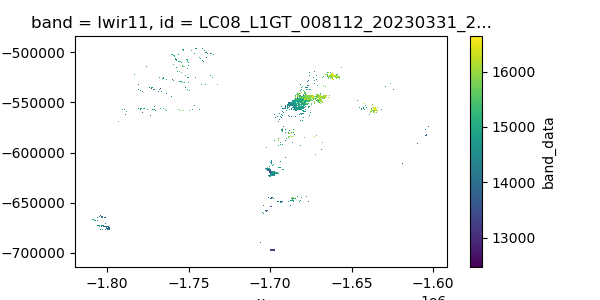

In [26]:
plt.figure(figsize=(6, 3))
(ls_thermal*mask).plot.imshow(x='x',y='y')
# (ls_scene.sel(band='qa_pixel').compute()*mask).plot.imshow(x='x',y='y')
# plt.imshow(mask)

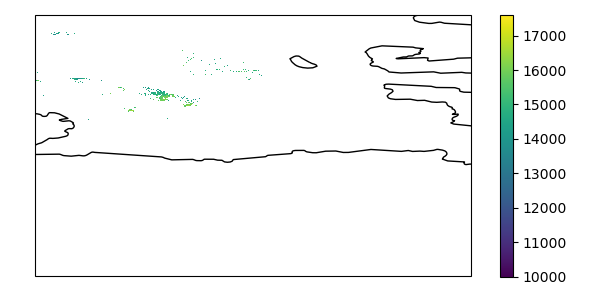

In [24]:
# Plot water vapor data ***need to comment out the delete code above for this to work
data0 = ls_thermal*mask
plt.figure(figsize=(6, 3))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_global()
cb = ax.pcolormesh(data0.x,data0.y,data0.values,vmin=10000,vmax=17600,transform=cartopy.crs.epsg(3031))
ax.coastlines()
ax.set_ylim([-78, -72])
ax.set_xlim([-111,-101])
cbar = plt.colorbar(cb)
plt.tight_layout()

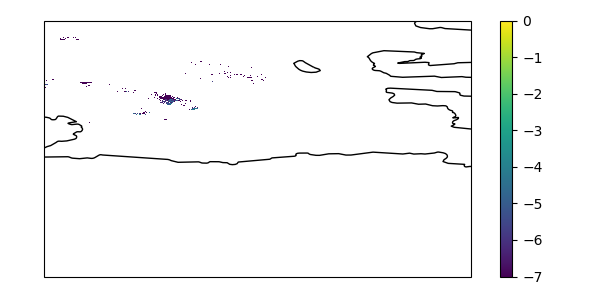

In [34]:
# Plot water vapor data ***need to comment out the delete code above for this to work
data0 = SST
plt.figure(figsize=(6, 3))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_global()
cb = ax.pcolormesh(data0.x,data0.y,data0.values,vmin=-7,vmax=0,transform=cartopy.crs.epsg(3031))
ax.coastlines()
ax.set_ylim([-78, -72])
ax.set_xlim([-111,-101])
cbar = plt.colorbar(cb)
plt.tight_layout()

## Testing code

In [21]:
# Get date/time for Landsat image and search for corresponding MODIS imagery  
# ls_time = ls_scene.time.values.item()

# Get spatial extent of Landsat scene in lat/lon
mbbox = (scene.metadata['bbox'][0], scene.metadata['bbox'][1], scene.metadata['bbox'][2], scene.metadata['bbox'][3]) #(west, south, east, north) 
lsatpoly = Polygon([(mbbox[0],mbbox[1]),(mbbox[0],mbbox[3]),(mbbox[2],mbbox[3]),(mbbox[2],mbbox[1]),(mbbox[0],mbbox[1])]) # ensure full lineup between landsat and modis

# start_dt = ls_time[0:10]
# calc_dt = datetime.strptime(start_dt, '%Y-%m-%d')
# end_dt = (calc_dt + timedelta(days=1)).strftime('%Y-%m-%d')
ls_time = pd.to_datetime(ls_scene.time.values)
calc_dt = datetime.strptime(ls_time.strftime('%Y-%m-%d %H:%M:%S'), '%Y-%m-%d %H:%M:%S')
start_dt = (calc_dt + timedelta(days=-0.5)).strftime('%Y-%m-%d %H:%M:%S')
end_dt = (calc_dt + timedelta(days=0.5)).strftime('%Y-%m-%d %H:%M:%S')

# Gather all files from search location from Terra and Aqua for the same day as the Landsat image
results = earthaccess.search_data(
    short_name='MOD07_L2',
    bounding_box=mbbox,
    # Day of a landsat scene to day after - searches day of only
    temporal=(start_dt,end_dt)
)
results2 = earthaccess.search_data(
    short_name='MYD07_L2',
    bounding_box=mbbox,
    # Day of a landsat scene to day after - searches day of only
    temporal=(start_dt,end_dt)
)
results = results + results2
print (f'{len(results)} TOTAL')

# Accept only granules that overlap at least 90% with Landsat
best_grans = []
for granule in results:
    try:
        granule['umm']['SpatialExtent']['HorizontalSpatialDomain']['Geometry']['GPolygons']
    except Exception as error:
        print(error)
        continue
    for num in range(len(granule['umm']['SpatialExtent']['HorizontalSpatialDomain']['Geometry']['GPolygons'])):
        try:
            map_points = [(xi['Longitude'],xi['Latitude']) for xi in granule['umm']['SpatialExtent']['HorizontalSpatialDomain']['Geometry']['GPolygons'][num]['Boundary']['Points']]
            pgon = Polygon(map_points)
            percent_dif = lsatpoly.difference(pgon).area/lsatpoly.area
            if percent_dif < 0.1:
                if crosses_idl(map_points):
                    print (f'A granule has messed up polygon that likely crosses the International DateLine')
                else:
                    best_grans.append(granule)
                    continue
        except Exception as error:
            print(error)
            # Would love to raise an exception for a valueerror except for GEOSError but not sure how 
print(f'{len(best_grans)} TOTAL w overlap')

# Find MODIS image closest in time to the Landsat image
Mdates = [pd.to_datetime(granule['umm']['TemporalExtent']['RangeDateTime']['BeginningDateTime']) for granule in best_grans]
ind = Mdates.index(min( Mdates, key=lambda x: abs(x - pytz.utc.localize(pd.to_datetime(ls_time)))))
print(abs(Mdates[ind] - pytz.utc.localize(pd.to_datetime(ls_time))))


# Download MODIS data if needed

# # This doesn't work because xarray can't open legacy HDF EOS data formats
# mod07 = xr.open_mfdataset(earthaccess.open(results))

# Use these access pathways while S3 streaming is not working
data_links = [granule.data_links(access="external") for granule in best_grans[ind:ind+1]]
netcdf_list = [g._filter_related_links("USE SERVICE API")[0].replace(".html", ".nc4") for g in best_grans[ind:ind+1]]
# This is going to be slow as we are asking Opendap to format HDF into NetCDF4 so we only processing 3 granules
# and Opendap is very prone to failures due concurrent connections, not ideal.
file_handlers = earthaccess.download(netcdf_list, modout_path,provider='NSIDC')


# Open MODIS data
mod_list = os.listdir(modout_path)
mod_list = [file for file in mod_list if file[-3:]=='nc4']
print(mod_list)
modfilenm = mod_list[0]

mod07 = xr.open_dataset(f'{modout_path}/{mod_list[0]}')
mod07 = mod07.rio.write_crs('epsg:4326')

Granules found: 10
Granules found: 10
20 TOTAL
A granule has messed up polygon that likely crosses the International DateLine
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: Input geom 1 is invalid: Self-intersection at -75.891037882737649 -71.714827762325314
A granule has messed up polygon that likely crosses the International DateLine
A granule has messed up polygon that likely crosses the International DateLine
A granule has messed up polygon that likely crosses the International DateLine
6 TOTAL w overlap
0 days 01:12:17


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2023096.1345.061.2023133105537.hdf.nc4', 'MOD07_L2.A2023094.1540.061.2023133095851.hdf.nc4']


In [35]:
%%time
# Read in desired variables and paths

param = WV
spacing = [300,-300]
interp=1

uniqWV = []

ULX = ls_scene.x[0] 
ULY = ls_scene.y[0]  
LRX = ls_scene.x[-1] 
LRY = ls_scene.y[-1] 
box = [ULX,LRX,ULY,LRY]

#Extract desired datasets from MODIS file from lookup key
data = mod07[param].values
lat, lon = mod07.Latitude, mod07.Longitude
#data.attributes()

# Test lat is in correct range
if ~((lat < 90) & (lat > -90)).all():
    print('MODIS latitude not between -90 and 90')
# Test lon is in correct range
if ~((lon < 180) & (lon > -180)).all():
    print('MODIS longitude not between -180 and 180')

# Interpolate using PyGMT
# Extract necessary data into Pandas DataFrame (required for PyGMT)
df = pd.DataFrame({
    'longitude': lon.values.flatten(),
    'latitude': lat.values.flatten(),
    'water_vapor': data.flatten()
})

# Remove missing or NaN values from DataFrame, as `surface` cannot handle them
df = df.dropna(subset=['water_vapor'])

# Set the region of interest [xmin, xmax, ymin, ymax] - make this the full image
region = [df.longitude.min(), df.longitude.max(), df.latitude.min(), df.latitude.max()]
# region = [scene.metadata['bbox'][0],  scene.metadata['bbox'][2], scene.metadata['bbox'][1], scene.metadata['bbox'][3]]

# Create a PyGMT session
with pygmt.clib.Session() as session:
    # Run the surface function
    grid = pygmt.surface(
        data=df[['longitude', 'latitude', 'water_vapor']].to_numpy(),  # Input data as NumPy array
        region=region,  
        spacing=f'0.3k',  
        tension=0.25,  
    )
# lat = grid.lat
# lon = grid.lon

    
data = grid.values

surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 16697 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


CPU times: user 453 ms, sys: 4.64 ms, total: 457 ms
Wall time: 753 ms


In [36]:
# # Test for correct projection
# transformer_3031_to_4326 = pyproj.Transformer.from_crs("EPSG:3031", "EPSG:4326", always_xy=True)
# transformer_4326_to_3031 = pyproj.Transformer.from_crs("EPSG:4326", "EPSG:3031", always_xy=True)

# # Test points in EPSG:3031
# test_points = np.array([[-1000000, -1000000], [1000000, 1000000]])  # Add more points as needed

# # Round-trip transformation
# for point in test_points:
#     lat, lon = transformer_3031_to_4326.transform(*point)
#     x, y = transformer_4326_to_3031.transform(lat, lon)
#     if np.linalg.norm(np.array([x, y]) - point) > some_acceptable_threshold:
#         print(f"Round-trip transformation error for point {point}")

In [41]:
%%time
interpgrid=grid
test_threshold = 10

#modlookup
if interpgrid is None:
    lat, lon = mod07.Latitude.values, mod07.Longitude.values # Different for SST vs WV
else:
    lat, lon = interpgrid.lat, interpgrid.lon
    lon, lat = np.meshgrid(lon,lat)

# Test lat is in correct range
if ~((lat < 90) & (lat > -90)).all():
    print('MODIS latitude not between -90 and 90')
# Test lon is in correct range
if ~((lon < 180) & (lon > -180)).all():
    print('MODIS longitude not between -180 and 180')
    
# Get the existing coordinate system
old_cs = ls_scene.rio.crs #crs[6:] # 'epsg:3031'
new_cs = mod07.rio.crs #'epsg:4326'

# Create a transform object to convert between coordinate systems
inProj = Proj(init=old_cs)
outProj = Proj(init=new_cs)

# Parse coordinates and spacing to different variables
west,east,north,south = box
ewspace,nsspace = spacing

# Setting up grid, x coord from here to here at this spacing, mesh grid makes 2D
samples = len(np.r_[west:east+1:ewspace])
lines = len(np.r_[north:south-1:nsspace])#ns space is -300, could also do 30 instead of 300, but would just have duplicate pixels
if lines==0:
    lines = len(np.r_[south:north-1:nsspace])

# x1, y1 = np.meshgrid(np.r_[west:east:ewspace],np.r_[north:south:nsspace]) # offset by 1 meter to preserve shape
ewdnsamp = int(spacing[0]/30)
nsdnsamp = int(spacing[1]/30)

# Set up coarser sampling and check to make sure is in the same orientation as the original Landsat grid
# If length issues arise it is because spacing should be -300 for y
xresamp = ls_scene.x.values[0::ewdnsamp]
if len(xresamp)==1:
    xresamp = ls_scene.x.values[0::-ewdnsamp]
if xresamp[0]!=ls_scene.x.values[0]:
    xresamp = np.flip(xresamp)
    print ('x flip')
yresamp = ls_scene.y.values[0::nsdnsamp]
if len(yresamp)==1:
    yresamp = ls_scene.y.values[0::-nsdnsamp]
if yresamp[0]!=ls_scene.y.values[0]:
    yresamp = np.flip(yresamp)
    print ('y flip')
x1, y1 = np.meshgrid(xresamp,yresamp)
LScoords = np.vstack([x1.ravel(),y1.ravel()]).T
if (LScoords[0,0]!=ls_scene.x.values[0]) |  (LScoords[0,1]!=ls_scene.y.values[0]):
    raise Exception(f'Landsat coordinates do not match expected during MODIS lookup')

# Ravel so ND can lookup easily
# Convert from LS map coords to lat lon --> x = lon, y = lat (usually?)
# Test that reprojection is working correctly on first and last grid point using round-trip transformation
xs1, ys1 =  transform(inProj,outProj,LScoords[0,0], LScoords[0,1], radians=True, always_xy=True)
xsl1, ysl1 =  transform(outProj,inProj,xs1, ys1, radians=True, always_xy=True)
if np.linalg.norm(np.array([xsl1, ysl1]) - LScoords[0,:]) > test_threshold:
    print(f"Round-trip transformation error for point {LScoords[0,:]}, {np.linalg.norm(np.array([xsl1, ysl1]) - LScoords[0,:])}")
else:
    # If passes, run on entire grid
    xs, ys =  transform(inProj,outProj,LScoords[:,0], LScoords[:,1], radians=True, always_xy=True)

# Produce landsat reprojected to lat/lon and ensure lat is in 0 column
# Test: landsat data is in correct orientation as long as lat is in col 0 and lon in col 1
grid_coords = test_gridcoords(xs,ys,scene)

# Test that lines and samples match grid_coords
if len(grid_coords) != lines*samples:
    raise Exception(f'Size of grid coordinates do not match low resolution Landsat dims: {len(grid_coords)} vs. {lines*samples}')
MODIS_coords = np.vstack([lat.ravel(),lon.ravel()]).T
MODIS_coords *= np.pi / 180. # to radians

# Build lookup, haversine = calc dist between lat,lon pairs so can do nearest neighbor on sphere - if did utm it would be planar
MOD_Ball = BallTree(MODIS_coords,metric='haversine') #sklearn library
#LS_Ball = BallTree(grid_coords,metric='haversine') # In case want reverse coordinate for Landsat
# Query modis coords with landsat coords, gives distance between and index for nearest neighbor
distanceMOD, indiciesMOD= MOD_Ball.query(grid_coords, dualtree=True, breadth_first=True)

Latitude in proper position
CPU times: user 13.3 s, sys: 11.8 ms, total: 13.3 s
Wall time: 13.2 s


In [44]:
nsdnsamp = int(-300/30)
ls_scene.y.values[0::-nsdnsamp].shape

(840,)

In [38]:
%%time
# Unique MODIS

# Convert from K to C
KtoC = -273.15

# #Extract desired datasets from MODIS file from lookup key
# data = mod07[param]
# lat, lon = mod07.Latitude, mod07.Longitude


# if interp==1:        
#     # Interpolate using PyGMT    
#     # Assume `ds` is your xarray DataSet
#     # Extract necessary data into Pandas DataFrame (modify this step based on your actual data structure)
#     df = pd.DataFrame({
#         'longitude': lon.values.flatten(),
#         'latitude': lat.values.flatten(),
#         'water_vapor': data.values.flatten()
#     })

#     # Remove missing or NaN values from DataFrame, as `surface` cannot handle them
#     df = df.dropna(subset=['water_vapor'])

#     # Set the region of interest [xmin, xmax, ymin, ymax]
#     region = [df.longitude.min(), df.longitude.max(), df.latitude.min(), df.latitude.max()]
#     # region = [scene.metadata['bbox'][0],  scene.metadata['bbox'][2], scene.metadata['bbox'][1], scene.metadata['bbox'][3]]

#     # Create a PyGMT session
#     with pygmt.clib.Session() as session:
#         # Run the surface function
#         grid = pygmt.surface(
#             data=df[['longitude', 'latitude', 'water_vapor']].to_numpy(),  # Input data as NumPy array
#             region=region,  
#             spacing=f'0.6k',  
#             tension=0.25,  
#         )
#     data = grid


#     # # Interpolate using scikit gaussian process
#     # # Extract longitude, latitude, and water vapor data, flattening the arrays
#     # # Adjust the variable names as per your actual dataset

#     # Prepare the input features as a 2D array and target variable
#     X = np.vstack((lon.values.flatten(), lat.values.flatten())).T
#     y = data.values.flatten()

#     # Removing NaN values (you may want to handle this more gracefully)
#     mask = ~np.isnan(y)
#     X_mask = X[mask]
#     y = y[mask]
    
#     subsample_indices = np.random.choice(len(y), size=5000, replace=False)  # Adjust size as needed
#     X_subsampled = X_mask[subsample_indices]
#     y_subsampled = y[subsample_indices]

#     # Fit the Gaussian Process Model
#     # Define Matern kernel
#     kernel = GPy.kern.Matern52(input_dim=2, variance=1., lengthscale=15.)

#     # Initialize Sparse GP using inducing inputs
#     z = X_subsampled.copy()  # Inducing inputs, you might need to choose these more carefully
#     model = GPy.models.SparseGPRegression(X_mask, y.reshape(-1, 1), kernel, Z=z)
    
#     # Optimize the model parameters
#     model.optimize(optimizer='bfgs', max_iters=3, messages=True)
#     model.plot()
#     print (model)
    
#     # Make predictions
#     results, variance = model.predict(X)

#     data = results.reshape(lat.shape)
# else:
#     print('No interpolation')
#     data = data.values

    
#     # Interpolate using Spherical Krigging
#     data_flat = data.values.flatten()
#     lat_flat = lat.values.flatten()
#     lon_flat = lon.values.flatten()

#     mask = ~np.isnan(data_flat)
#     lon_valid = lon_flat[mask]
#     lat_valid = lat_flat[mask]
#     data_valid = data_flat[mask]

#     # Create the kriging object using the valid data - gaussian sucks, sph and exp both look pretty good
#     OK = OrdinaryKriging(lon_valid, lat_valid, data_valid, variogram_model='spherical', verbose=True)

#     # # Predict using the original irregular grid locations
#     # z, ss = OK.execute('points', lon_flat, lat_flat)
#     # data = z.reshape(lat.shape)

#     # Using ray to parallelize the spherical krigging
#     # Define chunk size and calculate number of chunks
#     chunk_size = 10000  # example value, adjust as necessary
#     num_chunks = len(lon_flat) // chunk_size + (len(lon_flat) % chunk_size != 0)

#     # Placeholder for results
#     results = np.zeros_like(data_flat)

#     ray.init() #num_cpus=4)

#     OK_r = ray.put(OK)

#     @ray.remote        
#     def kriging_chunk(i, chunk_size, lon_flat, lat_flat, OK):
#         start_idx = i * chunk_size
#         end_idx = (i + 1) * chunk_size

#         # Subset data
#         lon_subset = lon_flat[start_idx:end_idx]
#         lat_subset = lat_flat[start_idx:end_idx]

#         # Kriging on subset
#         z, ss = OK.execute('points', lon_subset, lat_subset)
#         return start_idx, end_idx, z

#     # Launch Ray tasks
#     futures = [kriging_chunk.remote(i, chunk_size, lon_flat, lat_flat, OK_r) for i in range(num_chunks)]

#     # Collect results
#     for future in ray.get(futures):
#         start_idx, end_idx, z = future
#         results[start_idx:end_idx] = z

#     # When you're done with Ray, shut it down
#     ray.shutdown()

#     data = results.reshape(lat.shape)
# else:
#     data = data.values



# Regrid
if (np.shape(lat)== np.shape(lon)== np.shape(data))==False:
    raise Exception("Error in creating indicies, lat/lon and data shapes do not match")

# Reproject data from MODIS into corresponding postions for Landsat pixels for water vapor and ozone
if param == 'sst':
    dataOut = np.reshape(np.array(data.ravel())[indiciesMOD],(lines,samples))#* # to scale?
    dataOut[dataOut < -3] = np.nan
    MODimg = np.array(data)#* # to scale?
    MODimg[MODimg < 0] = np.nan
elif param == 'Water_Vapor':
    dataOut = np.reshape(np.array(data.ravel())[indiciesMOD]*0.0010000000474974513,(lines,samples))
    dataOut[dataOut < 0] = np.nan
    MODimg = np.array(data*0.001000000047497451)
    MODimg[MODimg < 0] = np.nan
elif param == 'Total_Ozone':
    dataOut = np.reshape(np.array(data.ravel())[indiciesMOD]*0.10000000149011612,(lines,samples))
    dataOut[dataOut < 225] = np.nan
    dataOut[dataOut > 430] = np.nan
    MODimg = np.array(data*0.10000000149011612)
    MODimg[MODimg < 0] = np.nan

CPU times: user 2.82 ms, sys: 3.83 ms, total: 6.64 ms
Wall time: 5.21 ms


In [39]:
# EPSG 3031:
# Easting is always x, Northing is always y
# scene box is not necessarily oriented to same x/y directions
# 180 is the antimeridian of the projection

# -0 Easting, -3333134.03 Northing = -60N,-180E
# +0 Easting, -3333134.03 Northing = -60N,+180E

# -2356881.67 Easting, -2356881.67 Northing = -60N,-135E
# +2356881.67 Easting, -2356881.67 Northing = -60N,+135E

# -3333134.03 Easting, +0 Northing = -60N,-90E
# +3333134.03 Easting, +0 Northing = -60N,+90E

# -2356881.67 Easting, +2356881.67 Northing = -60N,-45E
# +2356881.67 Easting, +2356881.67 Northing = -60N,+45E

# +0 Easting, +3333134.03 Northing = -60N,+0E

In [40]:
# # Reproject the Landsat points, do they match the orientation of the modis grid?
# x1, y1 = transformer_test.transform(ls_scene.x.values[0], ls_scene.y.values[0])
# x2, y2 = transformer_test.transform(ls_scene.x.values[-1], ls_scene.y.values[-1])
# print(x1,x2)
# print(y1,y2)
# # To match MODIS, the landsat scene must be flipped in the x direction

In [41]:
# print(lon[0,0],lon[-1,-1])
# print(lat[0,0],lat[-1,-1])

In [42]:
# Align MODIS
test_threshold = 5

##***Don't forget to add uniqMODIS back in here
## dataOut,uniqWV = uniqMODIS2(......)

# Check grid directionality and create matching x/y for new grid
# Define the source and target coordinate reference systems (CRS)
src_crs = mod07.rio.crs #'epsg:4326'  MODIS
target_crs = ls_scene.rio.crs #crs[6:] # 'epsg:3031' Landsat

# Create a PyProj transformer
transformer = pyproj.Transformer.from_crs(src_crs, target_crs, always_xy=True)
transformer_test = pyproj.Transformer.from_crs(target_crs, src_crs, always_xy=True)

# Test that reprojection is working correctly on first and last modis grid point
xm1,xm2 = lon[0,0],lon[-1,-1]
ym1,ym2 = lat[0,0],lat[-1,-1]
xx,yy = [xm1,xm2], [ym1,ym2]
xs1, ys1 =  transformer.transform(xx,yy)
xsl1, ysl1 = transformer_test.transform(xs1, ys1)
for i,n in enumerate(xsl1):
    if np.linalg.norm(np.array([xsl1[i], ysl1[i]]) - [xx[i],yy[i]]) > test_threshold:
        print(f"Round-trip transformation error for {sceneid}, {np.linalg.norm(np.array([xsl1[i], ysl1[i]]) - xx[i],yy[i])}")

# # Reproject the Landsat points, do they match the orientation of the modis grid?
# xl1, yl1 = transformer_test.transform(ls_scene.x.values[0], ls_scene.y.values[0])
# xl2, yl2 = transformer_test.transform(ls_scene.x.values[-1], ls_scene.y.values[-1])

# Spacing to create x and y parameters at the correct spacing
red_y = int(abs(spacing[0]/30))
red_x = int(abs(spacing[1]/30))

# # if modis lat not in same orientation as Landsat grid lats, flip the data
# if yl1<yl2:
#     if ym1>ym2:
#         dataOut = np.flip(dataOut,axis=1)
#         print('Y flipped')
# else:
#     if ym1<ym2:
#         dataOut = np.flip(dataOut,axis=1)
#         print('Y flipped')

# # if modis lon not in same orientation as Landsat grid lons, flip the data
# if xl1<xl2:
#     if xm1>xm2:
#         dataOut = np.flip(dataOut,axis=0)
#         print('X flipped')
# else:
#     if xm1<xm2:
#         dataOut = np.flip(dataOut,axis=0)
#         print('X flipped')
    
# xgrid = ls_scene.x.values[::red_x]
# ygrid = ls_scene.y.values[::red_y]

# Set up coarser sampling and check to make sure is in the same orientation as the original Landsat grid
xgrid = ls_scene.x.values[::red_x]
if xgrid[0]!=ls_scene.x.values[0]:
    xgrid = np.flip(xgrid)
    print ('Align x flip')
ygrid = ls_scene.y.values[::red_y]
if ygrid[0]!=ls_scene.y.values[0]:
    ygrid = np.flip(ygrid)
    print ('Align y flip')
if (xgrid[0]!=ls_scene.x.values[0]) |  (ygrid[0]!=ls_scene.y.values[0]):
    raise Exception(f'Landsat coordinates do not match expected during MODIS align')

# Create xarray from numpy array
dataOut_xr = xr.DataArray(dataOut,name='SST',dims=["y","x"], coords={"latitude": (["y"],ygrid), "longitude": (["x"],xgrid)})
dataOutWV_xr = dataOut_xr

In [43]:
# dataOutWV_xr = xr.DataArray(dataOut,name='SST',dims=["y","x"], coords={"latitude": (["y"],ygrid), "longitude": (["x"],xgrid)})

# # Resample WV to Landsat resolution and interpolate with B-spline
# # Need to use 0.1k (this samples at .1 of the grid)
# # Output of shape fits and need to adjust x and y coords cuz are wrong
ups_factor = 30/spacing[0]
WV_upsample = pygmt.grdsample(grid=dataOutWV_xr, spacing=f'{ups_factor}k', interpolation='c')
# WV_upsample = xr.open_dataarray(lsatpath+'WV_upsample_B-spline_'+str(ls_scene.id.values))
# # Resample WV to Landsat resolution manual - no interpolation
# WV_resamp = MODresample(ls_scene,dataOutWV,y1,x1,spacing)

# Put into Xarray
# Sometimes spacing works properly with -1 and sometimes not
latnew = np.arange(dataOutWV_xr.latitude[0],dataOutWV_xr.latitude[-1]+1,(dataOutWV_xr.latitude[-1]-dataOutWV_xr.latitude[0])/(WV_upsample.shape[0]-1))
if (WV_upsample.shape[0]!=latnew.shape[0]):
    latnew = np.arange(dataOutWV_xr.latitude[0],dataOutWV_xr.latitude[-1]+1,(dataOutWV_xr.latitude[-1]-dataOutWV_xr.latitude[0])/(WV_upsample.shape[0]))

# lonnew = np.arange(dataOutWV_xr.longitude[0],dataOutWV_xr.longitude[-1]+1,(dataOutWV_xr.longitude[-1]-dataOutWV_xr.longitude[0])/(WV_upsample.shape[1]-1))
lonnew = np.arange(dataOutWV_xr.longitude[-1],dataOutWV_xr.longitude[0]-1,-(dataOutWV_xr.longitude[-1]-dataOutWV_xr.longitude[0])/(WV_upsample.shape[1]-1))
if (WV_upsample.shape[1]!=lonnew.shape[0]):
    # lonnew = np.arange(dataOutWV_xr.longitude[0],dataOutWV_xr.longitude[-1]+1,(dataOutWV_xr.longitude[-1]-dataOutWV_xr.longitude[0])/(WV_upsample.shape[1]))
    lonnew = np.arange(dataOutWV_xr.longitude[-1],dataOutWV_xr.longitude[0]-1,-(dataOutWV_xr.longitude[-1]-dataOutWV_xr.longitude[0])/(WV_upsample.shape[1]))

# Check to make sure coordinates in the same orientation as the previous grid
if latnew[0]!=dataOutWV_xr.latitude[0]:
    latnew = np.flip(latnew)
    print ('Upsample lat flip')
if lonnew[0]!=dataOutWV_xr.longitude[0]:
    lonnew = np.flip(lonnew)
    print ('Upsample lon flip')
if (latnew[0]!=dataOutWV_xr.latitude[0]) |  (lonnew[0]!=dataOutWV_xr.longitude[0]):
    raise Exception(f'Coordinates do not match expected after upsampling')
    
WV_xr = xr.DataArray(WV_upsample,name='SST',dims=["y","x"], coords={"latitude": (["y"],latnew), "longitude": (["x"],lonnew)})

# WV_xr = xr.DataArray(WV_upsample,name='WV',dims=["y","x"], coords={"latitude": (["y"],ls_scene.y.values), "longitude": (["x"],ls_scene.x.values)})
WV_xr = WV_xr.rio.write_crs("epsg:3031", inplace=True)
WV_xr = WV_xr.rename({'longitude':'x','latitude':'y'})


Upsample lon flip


In [26]:
import cartopy.feature as cfeature

In [ ]:
# Create a figure with two subplots side by side
fig, axs = plt.subplots(nrows=1, ncols=2, subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(12, 6))

grid_array = data.to_numpy()
grid_extent = [data.coords["Cell_Across_Swath"][0], data.coords["Cell_Across_Swath"][-1], data.coords["Cell_Along_Swath"][0], data.coords["Cell_Along_Swath"][-1]]

# Iterate over the subplots and plot the data
ax = axs[0]
# ax.set_extent(grid_extent)  # Set the extent of the plot to the extent of the grid
ax.imshow(grid_array, extent=grid_extent,origin='upper', cmap='viridis')  # Plot the grid data

grid_array = grid.to_numpy()
grid_extent = [grid.coords["lon"][0], grid.coords["lon"][-1], grid.coords["lat"][0], grid.coords["lat"][-1]]

ax1 = axs[1]
ax1.set_extent(grid_extent, crs=ccrs.PlateCarree())  # Set the extent of the plot to the extent of the grid
ax1.imshow(grid_array, extent=grid_extent, transform=ccrs.PlateCarree(), origin='upper', cmap='viridis')  # Plot the grid data
ax1.add_feature(cfeature.COASTLINE)  # Add coastlines to the plot
ax1.add_feature(cfeature.BORDERS, linestyle=':')  # Add country borders to the plot

# Show the plot
plt.show()

In [49]:
# data.to_netcdf("mod07data.nc")
# lat.to_netcdf("mod07lat.nc")
# lon.to_netcdf("mod07lon.nc")

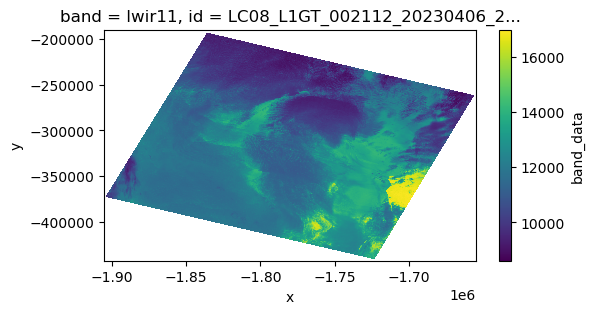

In [32]:
plt.figure(figsize=(6, 3))
ls_thermal.plot.imshow(x='x',y='y')#,vmin=0,vmax=0.0008)
# (dataOutWV_xrGPy-dataOutWV_xrK).plot.imshow(x='longitude',y='latitude',vmin=-0.00012,vmax=0.00012)

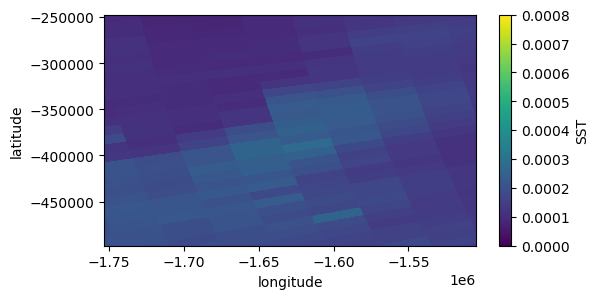

In [122]:
plt.figure(figsize=(6, 3))
dataOutWV_xr.plot.imshow(x='longitude',y='latitude',vmin=0,vmax=0.0008)
# (dataOutWV_xrGPy-dataOutWV_xrK).plot.imshow(x='longitude',y='latitude',vmin=-0.00012,vmax=0.00012)

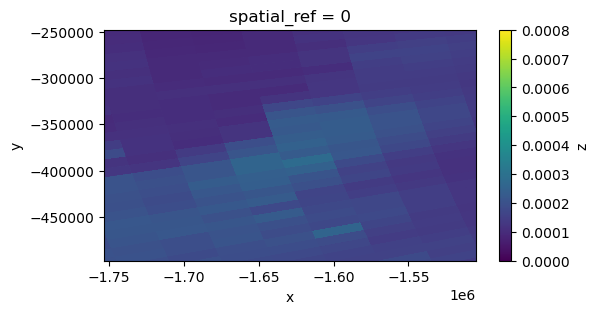

In [123]:
plt.figure(figsize=(6, 3))
WV_xr.plot.imshow(x='x',y='y',vmin=0,vmax=0.0008)

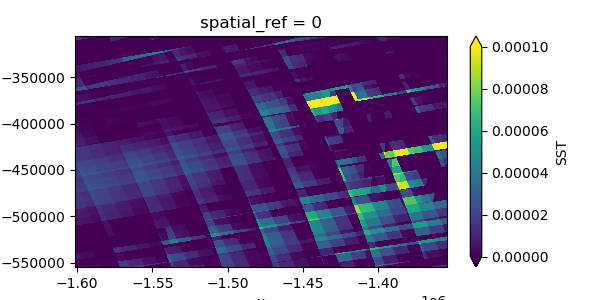

In [333]:
plt.figure(figsize=(6, 3))
(WV_xr-WV_xrK).plot.imshow(x='x',y='y',vmin=0,vmax=0.0001)

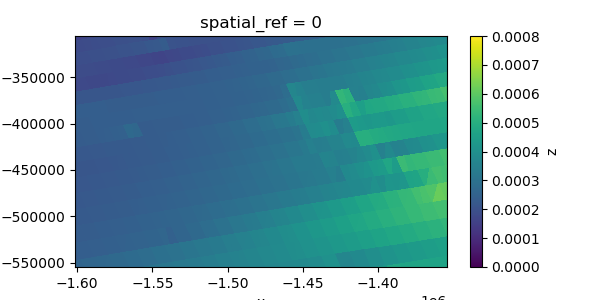

In [308]:
plt.figure(figsize=(6, 3))
WV_xrK.plot.imshow(x='x',y='y',vmin=0,vmax=0.0008)

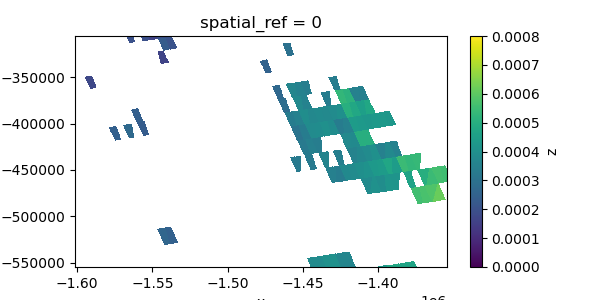

In [318]:
plt.figure(figsize=(6, 3))
WV_xr.plot.imshow(x='x',y='y',vmin=0,vmax=0.0008)

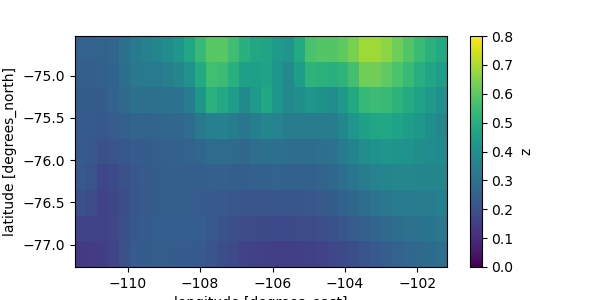

In [208]:
plt.figure(figsize=(6, 3))
dataPG_sub300.plot.imshow(x='lon',y='lat',vmin=0,vmax=0.8)

In [ ]:
# Plot water vapor data ***need to comment out the delete code above for this to work
data0 = mod07[WV]
plt.figure(figsize=(6, 3))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_global()
cb = ax.pcolormesh(data0.Longitude,data0.Latitude,data0.values,vmin=0,vmax=0.8,transform=ccrs.PlateCarree())
ax.coastlines()
ax.set_ylim([-90, -55])
ax.set_xlim([-135,-62.5])
# ax.set_ylim([-75, -72])
# ax.set_xlim([-107,-100])
cbar = plt.colorbar(cb)
plt.tight_layout()

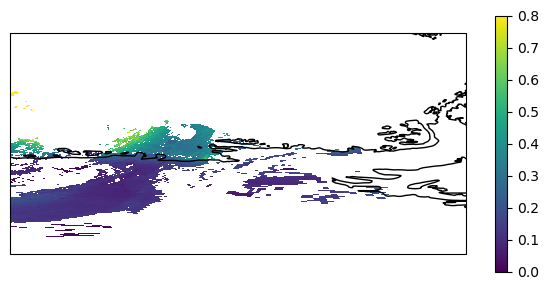

In [66]:
# Plot water vapor data ***need to comment out the delete code above for this to work
data0 = mod07[param]
plt.figure(figsize=(6, 3))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_global()
cb = ax.pcolormesh(data0.Longitude,data0.Latitude,data0.values,vmin=0,vmax=0.8,transform=ccrs.PlateCarree())
ax.coastlines()
ax.set_ylim([-90, -55])
ax.set_xlim([-135,-62.5])
# ax.set_ylim([-75, -72])
# ax.set_xlim([-107,-100])
cbar = plt.colorbar(cb)
plt.tight_layout()

In [ ]:
# Plot water vapor data ***need to comment out the delete code above for this to work
plt.figure(figsize=(6, 3))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_global()
# cb = ax.pcolormesh(lon,lat,dataK,vmin=0,vmax=0.8,transform=ccrs.PlateCarree())
# cb = ax.pcolormesh(lon,lat,data,vmin=0,vmax=0.8,transform=ccrs.PlateCarree())
# cb = ax.pcolormesh(dataPG_sub30.lon,dataPG_sub30.lat,dataPG_sub30,vmin=0,vmax=0.8,transform=ccrs.PlateCarree())
# cb = ax.pcolormesh(lon,lat,dataGPy-dataK,vmin=-0.15,vmax=0.15,transform=ccrs.PlateCarree())
# cb = ax.pcolormesh(data0.Longitude,data0.Latitude,data0.values,vmin=0,vmax=0.8,transform=ccrs.PlateCarree(),zorder=3)
cb = ax.pcolormesh(WV_xr.x,WV_xr.y,WV_xr,vmin=0,vmax=0.0008,transform=cartopy.crs.epsg(3031))
ax.coastlines()
# ax.set_ylim([-90, -55])
# ax.set_xlim([-135,-62.5])
# ax.set_ylim([-75, -72])
# ax.set_xlim([-107,-100])
# ax.set_ylim([-81, -61])
# ax.set_xlim([-135,-93])
# ax.set_ylim([-75.6, -72]) # close in on LC08_L1GT_004112_20230130_20230208_02_T2_151021_Cel
# ax.set_xlim([-107,-99])
ax.set_ylim([-77.1, -74.7]) # close in on LC08_L1GT_002114_20190206_20201016_02_T2_145810_Cel
ax.set_xlim([-107.2,-101.4])
cbar = plt.colorbar(cb)
plt.tight_layout()

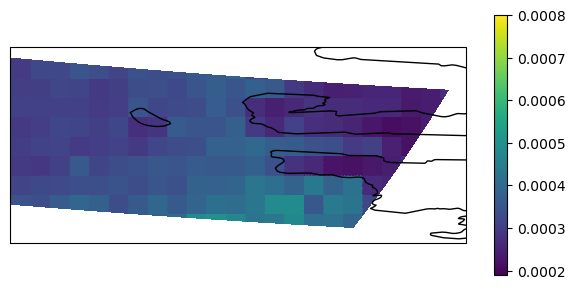

In [65]:
# Plot water vapor data ***need to comment out the delete code above for this to work
plt.figure(figsize=(6, 3))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_global()
cb = ax.pcolormesh(WV_xr.x,WV_xr.y,WV_xr,vmin=0.00019,vmax=0.0008,transform=cartopy.crs.epsg(3031)) #
ax.coastlines()
ax.set_ylim([-75, -72])
ax.set_xlim([-107,-100])
cbar = plt.colorbar(cb)
plt.tight_layout()

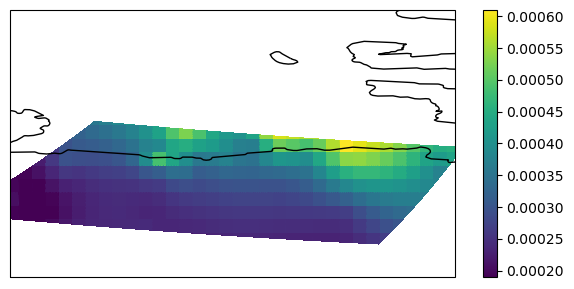

In [106]:
# For [2:3], plot water vapor data ***need to comment out the delete code above for this to work
plt.figure(figsize=(6, 3))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_global()
cb = ax.pcolormesh(WV_xr.x,WV_xr.y,WV_xr,vmin=0.00019,vmax=0.00061,transform=cartopy.crs.epsg(3031))
ax.coastlines()
ax.set_ylim([-78, -72])
ax.set_xlim([-111,-101])
cbar = plt.colorbar(cb)
plt.tight_layout()

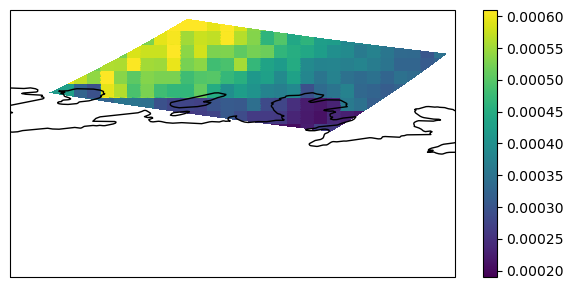

In [45]:
# For Dotson, plot water vapor data ***need to comment out the delete code above for this to work
plt.figure(figsize=(6, 3))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_global()
cb = ax.pcolormesh(WV_xr.x,WV_xr.y,WV_xr,vmin=0.00019,vmax=0.00061,transform=cartopy.crs.epsg(3031))
ax.coastlines()
ax.set_ylim([-78, -72])
ax.set_xlim([-121,-111])
cbar = plt.colorbar(cb)
plt.tight_layout()

### Make a list of images w SST in a desired box

In [ ]:
# # To make a list of images with SST in a desired box
# catalog = intake.open_stac_item_collection(items)

# # Include only Landsat 8 scenes
# catalog_list = [x for x in list(catalog) if x[3]=='8']

# if calib==1:
#     print('Running calibration!')
    
# mm=0
# lsat_good = []

# for img in catalog_list[847:1047]:
#     print(img)
    
#     scene = catalog[img]
#     timestr = scene.metadata['datetime'].strftime('%H%M%S')

#     if calib==1:
#         outFile = f'{lsatpath}{SSTpath}/{img}_{timestr}_Cel_calib.tif'
#     elif calib==0:
#         outFile = f'{lsatpath}{SSTpath}/{img}_{timestr}_Cel.tif'
    
#     if os.path.isfile(outFile):
#         print (f'{img} - atm corr exists')

#     else:
#         print(mm)
#         mm+=1
#         # Open all desired bands for one scene
#         ls_scene = landsat_to_xarray(scene,catalog)
#         ls_scene = ls_scene.rio.write_crs("epsg:3031", inplace=True)

#         # Create classification mask
#         ls_scene = create_masks(ls_scene, cloud_mask=True, ice_mask=True, ocean_mask=True)
        
#         try:
#             # Check for any open ocean pixels - go to next image if none - 9.3 s
#             mask = np.ones(ls_scene.shape[1:])
#             mask[ls_scene.mask!=3] = np.nan
#             ls_thermal = ls_scene.sel(band='lwir11').compute()
#             # Check in bounding box or for entire Landsat image depending on whether doing calibration runs or not
#             if calib==0:
#                 ls_box = (ls_thermal*mask).sel(y=slice(polary[1],polary[0]),x=slice(polarx[0],polarx[1]))
#             else:
#                 ls_box = ls_thermal
                
#             if ((ls_box).notnull()).sum().values==0:
#                 print (f'{img} has no SSTs')
#                 del ls_scene, scene, mask, ls_box
#                 gc.collect()

#             else:
#                 lsat_good.append([img,((ls_box).notnull()).sum().values])
#                 del ls_scene, scene, mask, ls_box, ls_thermal

#         except Exception as e:
#             print (f'{img} has no SSTs: {e}')
        
#         gc.collect()

In [8]:
# # Save list and re-open list
# import pickle
# with open(lsatpath+'landsat8_goodfiles_dotson_2021_2023', "wb") as fp:   #Pickling
#     pickle.dump(lsat_good, fp)

# with open(lsatpath+'landsat8_goodfiles_dotson_1', "rb") as fp:   # Unpickling
#     bb = pickle.load(fp)
# len(bb)

# import csv

# with open(lsatpath+'landsat8_goodfiles_dotson_forTed.csv', 'w', newline = '') as csvfile:
#     my_writer = csv.writer(csvfile, delimiter = ' ')
#     my_writer.writerow(bb)

In [33]:
# # Plot water vapor data ***need to comment out the delete code above for this to work
# plt.figure(figsize=(6, 3))
# ax = plt.axes(projection=ccrs.PlateCarree())
# ax.set_global()
# cb = ax.pcolormesh(WV_xr.x,WV_xr.y,WV_xr,transform=cartopy.crs.epsg(3031))
# ax.coastlines()
# ax.set_ylim([-76, -69])
# ax.set_xlim([-115,-95])
# cbar = plt.colorbar(cb)
# plt.tight_layout()

In [ ]:
# # Plot SST data ***need to comment out the delete code above for this to work
# plt.figure(figsize=(6, 3))
# ax = plt.axes(projection=ccrs.PlateCarree())
# ax.set_global()
# cb = ax.pcolormesh(WV_xr.x,WV_xr.y,SST,transform=cartopy.crs.epsg(3031))
# ax.coastlines()
# ax.set_ylim([-74.4, -74.2])
# ax.set_xlim([-103.9,-103.5])
# cbar = plt.colorbar(cb)
# # cbar.set_clim(-1, -6) # set limits of color map
# plt.tight_layout()

### Mosaic SST images from Xarray
https://github.com/pangeo-data/cog-best-practices/issues/4

# Validate via GHRSST iQUAM data
https://www.star.nesdis.noaa.gov/socd/sst/iquam/?tab=0&dateinput_year=2023&dateinput_month=02&dayofmoninput_day=26&dateinput_hour=00&dayofmon=monthly&qcrefsst=_qcrey&qcrefsst=_qccmc&outlier=qced#qmap

In [35]:
# Landsat STAC catalog location
url = 'https://landsatlook.usgs.gov/stac-server'

# Paths
basepath = Path('/home/jovyan/Landsat_SST_algorithm')
lsatpath = basepath / 'Data'
atmpath = lsatpath / 'AtmCorrection'
modout_path = lsatpath / 'MOD07_L2'
SSTpath = lsatpath / 'SST/Validation/iQuamIntercomp/'
iQpath = lsatpath / 'iQuam'

WV = 'Water_Vapor'

# For geopandas and tile plots
satellite = 'Landsat8'
collection = 'landsat-c2l1' # Landsat Collection 2, Level 1
colnm = ['landsat:wrs_path','landsat:wrs_row']
gjson_outfile = lsatpath / f'{satellite}_iQuam.geojson'

interp = 1

In [8]:
# Get iQuam file paths in directory between desired dates
start_yrmo = '202109'
end_yrmo = '202304'

yrmo = []
m0 = start_yrmo

# Make a list of months between start and end
while int(m0) <= int(end_yrmo):
    calc_dt = datetime.strptime(f'{m0[:4]}-{m0[4:]}', '%Y-%m')
    yrmo.append(calc_dt.strftime("%Y%m"))
    m0 = (calc_dt + relativedelta(months=1)).strftime("%Y%m")

# Get file names and select only those matching dates from yrmo    
iQfiles = os.listdir(iQpath)
iQfiles = [x for x in iQfiles if x[:6] in yrmo]
iQfiles.sort()
print (len(iQfiles))

os.chdir(iQpath)

20


In [11]:
# # Open Argos data from iQuam files
# # iquam_file = lsatpath / 'iQuam/202304-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # iquam_file = lsatpath / 'iQuam/202303-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # iquam_file = lsatpath / 'iQuam/202302-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # iquam_file = lsatpath / 'iQuam/202301-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # iquam_file = lsatpath / 'iQuam/202212-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # iquam_file = lsatpath / 'iQuam/202211-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # iquam_file = lsatpath / 'iQuam/202210-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # # iquam_file = lsatpath / 'iQuam/202209-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # # iquam_file = lsatpath / 'iQuam/202208-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # # iquam_file = lsatpath / 'iQuam/202207-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # # iquam_file = lsatpath / 'iQuam/202206-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv03.0.nc'
# # # iquam_file = lsatpath / 'iQuam/202205-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # # iquam_file = lsatpath / 'iQuam/202204-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv03.0.nc'
# # iquam_file = lsatpath / 'iQuam/202203-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # iquam_file = lsatpath / 'iQuam/202202-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv03.0.nc'
# # iquam_file = lsatpath / 'iQuam/202201-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# # iquam_file = lsatpath / 'iQuam/202112-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv03.0.nc'
# iquam_file = lsatpath / 'iQuam/202111-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv03.0.nc'
# # iquam_file = lsatpath / 'iQuam/202110-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv05.0.nc'
# # iquam_file = lsatpath / 'iQuam/202109-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv03.0.nc'

# # iquam_file = lsatpath / 'iQuam/202101-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv01.0.nc'
# # iquam_file = lsatpath / 'iQuam/202001-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv10.0.nc'
# # iquam_file = lsatpath / 'iQuam/201901-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv13.0.nc'
# # iquam_file = lsatpath / 'iQuam/201801-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv10.0.nc'
# # iquam_file = lsatpath / 'iQuam/201701-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv01.0.nc'
# # iquam_file = lsatpath / 'iQuam/201601-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv01.0.nc'
# # iquam_file = lsatpath / 'iQuam/201501-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv01.0.nc'
# # iquam_file = lsatpath / 'iQuam/201401-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv01.0.nc'
# df = xr.open_dataset(iquam_file)
# iquam = df.to_dataframe()
# iquam.head(2)

In [40]:
# iquam_file = 'https://www.star.nesdis.noaa.gov/pub/sod/sst/iquam/v2.10/202304-STAR-L2i_GHRSST-SST-iQuam-V2.10-v01.0-fv02.0.nc'
# df = xr.open_dataset(iquam_file,engine='netcdf4')

In [12]:
# # Subset to Antarctica
# ant = iquam[(iquam.lat<-65)&(iquam.lon>-142)&(iquam.lon<-72)&(iquam.platform_type==5.0)&(iquam.quality_level==5.0)]  # Entire West Antarctica (later)
# # ant = iquam[(iquam.lat<-69)&(iquam.lon>-125)&(iquam.lon<-98)&(iquam.platform_type==5.0)&(iquam.quality_level==5.0)] # Amundsen Sea
# print(f'{ant.shape[0]} measurements')
# ant.head(3)

In [9]:
# Authenticate for accessing NASA data (MODIS)
auth = earthaccess.login(strategy="netrc")

# If we are not authenticated
if not auth.authenticated:
    # ask for credentials and persist them in a .netrc file
    auth.login(strategy="interactive", persist=True)

You're now authenticated with NASA Earthdata Login
Using token with expiration date: 03/25/2024
Using .netrc file for EDL


In [10]:
# Authenticate for boto S3 access, etc.
os.environ["AWS_REQUEST_PAYER"] = "requester"
aws_session = AWSSession(boto3.Session(), requester_pays=True)

In [11]:
# Setup and authenticate 
from dask.distributed import Client
import logging
client = Client(processes=True, n_workers=4, 
                threads_per_worker=1,
                silence_logs=logging.ERROR)
client.run(lambda: os.environ["AWS_REQUEST_PAYER"] == "requester" )
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /user/tsnow03/proxy/33139/status,
Dashboard: /user/tsnow03/proxy/33139/status,Workers: 4
Total threads: 4,Total memory: 30.89 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:38229,Workers: 4
Dashboard: /user/tsnow03/proxy/33139/status,Total threads: 4
Started: Just now,Total memory: 30.89 GiB
Comm: tcp://127.0.0.1:36863,Total threads: 1
Dashboard: /user/tsnow03/proxy/32829/status,Memory: 7.72 GiB
Nanny: tcp://127.0.0.1:46599,


In [12]:
# Derive NLSST coefficiencts from MODTRAN files

months = ['01','02','03','04','05','06','07','08','09','10','11','12']
atmcor = {}

for mo in months:
    print (f'Month: {mo}')
    NLSST_input_file = atmpath / f'TCWV_{mo}_20230911'
    if os.path.isfile(NLSST_input_file):
        print ('NLSST input exists')
        modtran_lut = pd.read_pickle(NLSST_input_file)
    else:
        spec_hu_file = f'modtran_atmprofiles_{mo}_20230823.txt'
        prefix = f'modtran_atmprofiles_{mo}.bts+tau+dbtdsst'
        modtran_lut = prep_NLSST(atmpath,prefix,spec_hu_file)
        modtran_lut.to_pickle(NLSST_input_file)
    
    NLSST_results = derive_NLSST(modtran_lut)
    a0 = np.around(NLSST_results.params.Intercept,2)
    a1 = np.around(NLSST_results.params.toa,2)
    a2 = np.around(NLSST_results.params.tcwv_toa,2)
        
    atmcor[mo] = {"a0": a0, "a1": a1, "a2": a2}

print(NLSST_results.summary())

Month: 01
NLSST input exists
Month: 02
NLSST input exists
Month: 03
NLSST input exists
Month: 04
NLSST input exists
Month: 05
NLSST input exists
Month: 06
NLSST input exists
Month: 07
NLSST input exists
Month: 08
NLSST input exists
Month: 09
NLSST input exists
Month: 10
NLSST input exists
Month: 11
NLSST input exists
Month: 12
NLSST input exists
                            OLS Regression Results                            
Dep. Variable:                surface   R-squared:                       0.964
Model:                            OLS   Adj. R-squared:                  0.964
Method:                 Least Squares   F-statistic:                 2.158e+04
Date:                Tue, 05 Mar 2024   Prob (F-statistic):               0.00
Time:                        22:06:30   Log-Likelihood:                 1360.2
No. Observations:                1629   AIC:                            -2714.
Df Residuals:                    1626   BIC:                            -2698.
Df Model:           

In [13]:
# Set up projections
source_crs = 'epsg:4326' 
target_crs = 'epsg:3031' # Coordinate system of the Landsat file

In [14]:
%%time

# For each iquam file, pair West Antarctic Argo buoy data with Landsat data and create calibrated SSTs
valid = []

# Buffer around iquam point used to create a bounding box for Landsat sample
lon_add = 0.05
lat_add = 0.01

# Temporal search range (days) before/after iquam measurement for finding Landsat image
time_add = 0.5

for iquam_file in iQfiles:
    # Open Argos data from iQuam file
    df = xr.open_dataset(iquam_file)
    iquam = df.to_dataframe()
    
    # Subset to Antarctica
    ant = iquam[(iquam.lat<-65)&(iquam.lon>-142)&(iquam.lon<-72)&(iquam.platform_type==5.0)&(iquam.quality_level==5.0)]  # Entire West Antarctica (later)
    # ant = iquam[(iquam.lat<-69)&(iquam.lon>-125)&(iquam.lon<-98)&(iquam.platform_type==5.0)&(iquam.quality_level==5.0)] # Amundsen Sea
    print('')
    print(f'{iquam_file[:6]}: {ant.shape[0]} measurements')

    for idx in range(ant.shape[0]):

        # Create search area
        ilat = ant['lat'].iloc[idx]
        ilon = ant['lon'].iloc[idx]
        bboxV = (ilon-lon_add,ilat-lat_add,ilon+lon_add,ilat+lat_add)

        # Create Landsat temporal search range in correct format
        ihr = int(ant.hour.iloc[idx])
        iyr = int(ant.year.iloc[idx])
        imo = int(ant.month.iloc[idx])

        calc_dt = datetime.strptime(f'{iyr}-{imo}-{int(ant.day.iloc[idx])} {ihr}', '%Y-%m-%d %H')
        start_dt = (calc_dt + timedelta(days=-time_add))
        end_dt = (calc_dt + timedelta(days=time_add))

        timeRangeV = f'{start_dt}/{end_dt}'

        # Search for desired Landsat scenes
        items = search_stac(url,bboxV,timeRangeV,collection,gjson_outfile)

        # Load the geojson file and open stac catalog
        catalog = intake.open_stac_item_collection(items)
        gf = gpd.read_file(gjson_outfile)

        # Exclude Landsat 9
        catalog_list = [x for x in items if x.id[3]=='8']
        num_scene = len(catalog_list)
        print(f'{num_scene} Landsat 8 items')

        # If any matching landsat scenes are found create calibrated SSTs for them
        if num_scene>0:

            # Reproject to determine bounding box in espg 3031
            sbox,checkbox = lsat_reproj(source_crs,target_crs,(bboxV[0],bboxV[1],bboxV[2],bboxV[3]))

            # Create polygon for later cropping
            polygon = Polygon([(sbox[0][0],sbox[0][1]),(sbox[3][0],sbox[3][1]),(sbox[2][0],sbox[2][1]),(sbox[1][0],sbox[1][1])])
            
            # Create min/max boundaries for trimming image before crop_xarray to cut down on processing times
            minx, miny, maxx, maxy = polygon.bounds
            polarx = [minx, maxx]
            polary = [miny, maxy]

            # Create calibrated SSTs for each matching landsat scene
            for sceneid in catalog_list:
                print(sceneid.id)

                scene = catalog[sceneid.id]
                timestr = scene.metadata['datetime'].strftime('%H%M%S')

                outFile = f'{SSTpath}/{sceneid.id}_{timestr}_Cel.tif'

                if os.path.isfile(outFile):
                    print (f'{sceneid.id} - atm corr exists')
                    ls_scene = xr.open_dataset(outFile,chunks=dict(x=512, y=512),engine='rasterio')

                    # Subset all scenes and check for right dimensions because y order changes sometimes
                    ls_sub = subset_img(ls_scene['band_data'].sel(band=1),polarx,polary) # subset so easier to work with 
                    ls_sub = crop_xarray_dataarray_with_polygon(ls_sub, polygon) # crop data to exact bounding box

                    # Calibrate using MODIS
                    ls_sub = ls_sub * calib_m + calib_b

                    # Remove all pixels that are too cold
                    ls_sub = ls_sub.where(ls_sub>=-1.9,np.nan)

                    lsat = np.nanmean(ls_sub)
                    lstd = np.nanstd(ls_sub)

                else:
                    # Open all desired bands for one scene
                    ls_scene = landsat_to_xarray(sceneid,catalog)
                    ls_scene = ls_scene.rio.write_crs("epsg:3031", inplace=True)

                    # Create classification mask
                    ls_scene = create_masks(ls_scene, cloud_mask=True, ice_mask=True, ocean_mask=True)

                    try:
                        # Check for any open ocean pixels - go to next image if none - ??? s
                        mask = np.ones(ls_scene.shape[1:])
                        mask[ls_scene.mask!=3] = np.nan
                        ls_thermal = ls_scene.sel(band='lwir11').compute()

                        # Check in bounding box or for entire Landsat image depending on whether doing calibration runs or not
                        ls_box = subset_img(ls_thermal*mask,polarx,polary)

                        if ((ls_box).notnull()).sum().values==0:
                            print (f'{sceneid.id} has no SSTs')
                            try:
                                del ls_scene, scene, mask, ls_thermal, ls_box
                            except:
                                pass
                            gc.collect()
                            continue

                        # Use band ratios for RF cloud pixel classification
                        ####

                        # Atmospheric correction using MODIS
                        # Acquire and align MODIS water vapor (MOD/MYD07) to Landsat
                        mod07,modfilenm = open_MODIS(ls_scene,scene,modout_path)

                        # Create water vapor files aligned and subsampled to Landsat
                        spacing = [300,-300] # 300m sampling of MODIS data so that upsampling is easy and because 30m takes far too long
                        WV_xr = get_wv(ls_scene,mod07,spacing,WV,scene,interp=interp)

                        # Create SST by masking and using water vapor to apply atmospheric correction
                        SST = apply_NLSST(ls_thermal,scene,mask,WV_xr,atmcor)

                        # Record MODIS water vapor image used in atmospheric correction, will find this info save under band_data in
                        # data variables in COG (click on white paper info button in xarray readout)
                        SST.attrs['MODIS_WV'] = modfilenm

                        # Save to a cloud-optimized Geotiff
                        SST.rio.to_raster(raster_path=outFile, driver="COG")

                        # Calibrate using MODIS
                        SST = SST * calib_m + calib_b

                        print (f'Mean SST: {np.nanmean(SST)}')

                        # Subset all scenes and check for right dimensions because y order changes sometimes
                        ls_sub = subset_img(SST,polarx,polary) # subset so easier to work with 
                        ls_sub = crop_xarray_dataarray_with_polygon(ls_sub, polygon) # crop data to exact bounding box

                        # Remove all pixels that are too cold
                        ls_sub = ls_sub.where(ls_sub>-1.9,np.nan)

                        lsat = np.nanmean(ls_sub)
                        lstd = np.nanstd(ls_sub)

                        try:
                            del mask, ls_thermal, mod07, WV_xr, SST, ls_sub
                        except:
                            pass

                    except Exception as e:
                        print (sceneid.id, e)
                        lsat = np.nan
                        lstd = np.nan

                # Record coincident data from landsat and argo float
                argo = ant.sst.iloc[idx]-273.15
                valid.append([sceneid.id,lsat,lstd, ant.iloc[idx].name,argo])
                print (f'Argo temp: {argo}, Landsat 8 mean: {lsat}+-{lstd}')

                try:
                    del ls_scene, scene, ls_thermal, ls_box, mod07, WV_xr, SST
                except:
                    pass

                gc.collect()


202109: 8 measurements
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items

202110: 32 measurements
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
1 Landsat 8/9 items
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2362557.6665456533, 469942.0693398914), (-2360349.7372684004, 469502.8847780916), (-2359526.705548405, 473621.7550343814), (-2361733.8649415164, 474064.79248886235)]
lbox=(-78.74999694824218, -68.1099984741211, -78.64999694824219, -68.08999847412109)
checkbox=[-78.74999695 -68.10999847 -78.64999695 -68.08999847]
LC08_L1GT_228108_20211008_20211018_02_T2
(152, 101)
LC08_L1GT_2281

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2022007.1630.061.2022008014128.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 25427 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.000498404172933185, min: 0.00041, max: 0.00055
Mean SST: -0.6181416208662727
(151, 105)
Argo temp: -0.17300000000000182, Landsat 8 mean: -0.025006633029416216+-0.13500810369886354
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
2 Landsat 8/9 items
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2353342.6491395636, 487192.39396963647), (-2351138.563392227, 486736.1009550379), (-2350285.468080619, 490838.8684405958), (-2352488.7540898, 491299.00761359616)]
lbox=(-78.30376892089843, -68

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MYD07_L2.A2022069.2225.061.2022070155452.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: 14985 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00011034356200998043, min: 5e-05, max: 0.00023
Mean SST: -1.4473066143519118
(127, 130)
Argo temp: -1.4239999999999782, Landsat 8 mean: -1.2804896157236747+-0.06651386636994669
1 Landsat 8/9 items
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-1242944.6825847833, -1376166.0519630904), (-1241457.1419048533, -1374519.0736113454), (-1243854.238186619, -1372350.2297347947), (-1245344.6511189307, -1373994.6093311047)]
lbox=(-137.91184692382814, -73.07253051757813, -137.8118469238281, -73.05253051757812)
checkbox=[-137.91184692  -73.07253052 -137.81184692  -73.05253052]
LC08_L1GT_025112_20220319_20220329_02_T2
(127, 130)
LC08_L1GT_025112_20220319_20220329_02_T2 has no SSTs
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
2 Landsat 8/9 items
1 Landsat 8 items
lsat_reproj normal orientation
bbox=[(-2221506.441254901, -567118.786976922), (-2219332.3477060664, -566563.7720225235), (-2220317.8072928586, 

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

Error while downloading the file MOD07_L2.A2023017.1520.061.2023018023229.hdf.nc4
Traceback (most recent call last):
  File "/srv/conda/envs/notebook/lib/python3.11/site-packages/earthaccess/store.py", line 555, in _download_file
    r.raise_for_status()
  File "/srv/conda/envs/notebook/lib/python3.11/site-packages/requests/models.py", line 1021, in raise_for_status
    raise HTTPError(http_error_msg, response=self)
requests.exceptions.HTTPError: 504 Server Error: Gateway Time-out for url: https://ladsweb.modaps.eosdis.nasa.gov/opendap/RemoteResources/laads/allData/61/MOD07_L2/2023/017/MOD07_L2.A2023017.1520.061.2023018023229.hdf.nc4



COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

[]
LC08_L1GT_009110_20230117_20230131_02_T2 list index out of range
Argo temp: -0.8789999999999623, Landsat 8 mean: nan+-nan
LC08_L1GT_009109_20230117_20230131_02_T2
(140, 106)
Granules found: 9
Granules found: 10
19 TOTAL granules
A granule has messed up polygon that likely crosses the International DateLine
A granule has messed up polygon that likely crosses the International DateLine
A granule has messed up polygon that likely crosses the International DateLine
A granule has messed up polygon that likely crosses the International DateLine
TopologyException: side location conflict at -28.938203977134698 -75.148317669355322. This can occur if the input geometry is invalid.
5 TOTAL granules w overlap
Time difference between MODIS and Landsat: 0 days 00:19:57


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['MOD07_L2.A2023017.1520.061.2023018023229.hdf.nc4']


surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: Your grid dimensions are mutually prime.  Convergence is very unlikely.
surface [WARNING]: 15822 unusable points were supplied; these will be ignored.
surface [WARNING]: You should have pre-processed the data with block-mean, -median, or -mode.
surface [WARNING]: Check that previous processing steps write results with enough decimals.
surface [WARNING]: Possibly some data were half-way between nodes and subject to IEEE 754 rounding.


Latitude in proper position
Mean water vapor value is: 0.00046946643145307073, min: 0.00039, max: 0.00054
Mean SST: -1.5792709687144537
(140, 106)
Argo temp: -0.8789999999999623, Landsat 8 mean: -1.7708989969645794+-0.07887917948990693
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
1 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 Landsat 8/9 items
0 Landsat 8 items
0 La

In [15]:
# Put data into DataFrame and save    
headers = ['L8_filename','L8_SST','L8_std','Argo_id','Argo_SST']
lsat_mod_df = pd.DataFrame(valid,columns=headers)
out_df = lsatpath / f'Landsat_validation_20240305_{start_yrmo}_{end_yrmo}'
lsat_mod_df.to_pickle(out_df)

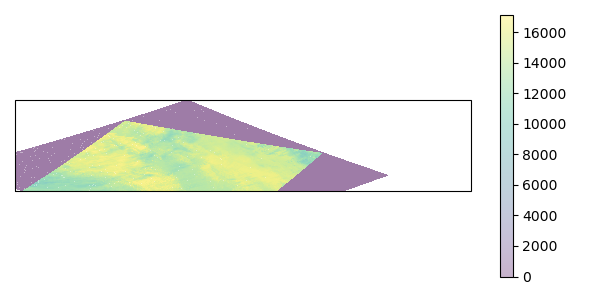

In [31]:
# plt.figure(figsize=(6, 3))
# ax = plt.axes(projection=ccrs.PlateCarree())
# ax.set_global()
# ax.pcolormesh(mod07.Longitude,mod07.Latitude,mod07.Water_Vapor,transform=ccrs.PlateCarree())
# cb = ax.pcolormesh(ls_scene.x,ls_scene.y,ls_scene.sel(band='lwir11'),alpha=0.3,transform=cartopy.crs.epsg(3031))
# ax.coastlines()
# ax.set_ylim([-70, -68])
# ax.set_xlim([-142,-132])
# plt.colorbar(cb)
# plt.tight_layout()

In [55]:
Lfile = '/home/jovyan/Landsat_SST_algorithm/Data/SST/Validation/LC08_L1GT_228108_20200123_20201016_02_T2_141253_Cel_calib.tif'
ls_scene = xr.open_dataset(Lfile)
ls_scene

<xarray.Dataset>
Dimensions:      (band: 1, x: 9081, y: 9101)
Coordinates:
  * band         (band) int64 1
  * x            (x) float64 -2.495e+06 -2.495e+06 ... -2.223e+06 -2.223e+06
  * y            (y) float64 5.046e+05 5.046e+05 ... 2.316e+05 2.316e+05
    spatial_ref  int64 ...
Data variables:
    band_data    (band, y, x) float64 ...

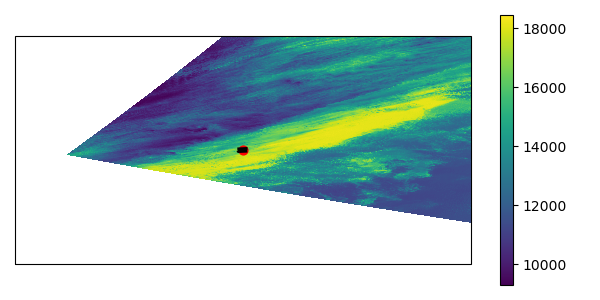

In [18]:
plt.figure(figsize=(6, 3))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_global()
ax.set_ylim([ilat-1,ilat+1])
ax.set_xlim([ilon-2,ilon+2])
cb = ax.pcolormesh(ls_scene.x,ls_scene.y,ls_scene.sel(band=1).to_array().isel(variable=0),transform=cartopy.crs.epsg(3031))
plt.scatter([ilon],[ilat],c='r',s=40,transform=ccrs.PlateCarree())
plt.plot([polarx[0],polarx[0],polarx[1],polarx[1],polarx[0]],[polary[0],polary[1],polary[1],polary[0],polary[0]],lw=2,ls='--',color='k',transform=cartopy.crs.epsg(3031))
ax.coastlines()
plt.colorbar(cb)
plt.tight_layout()

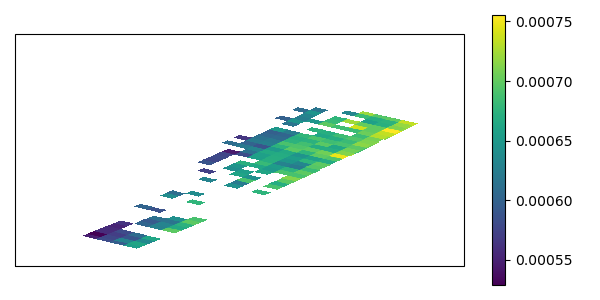

In [222]:
# plt.figure(figsize=(6, 3))
# ax = plt.axes(projection=ccrs.PlateCarree())
# ax.set_global()
# cb = ax.pcolormesh(WV_xr.x,WV_xr.y,WV_xr,transform=cartopy.crs.epsg(3031))
# ax.coastlines()
# ax.set_ylim([-72.6, -69.5])
# ax.set_xlim([-129,-123])
# plt.colorbar(cb)
# plt.tight_layout()

In [159]:
# Plot tiles of all scenes found
plot_search(gf,satellite,colnm)

:Overlay
   .Tiles.I    :Tiles   [x,y]
   .Polygons.I :Polygons   [Longitude,Latitude]   (landsat:wrs_path,landsat:wrs_row)

**Note the bands you would like to include are assigned by passing the bandNames parameter to landsat_to_xarray using the following codes:**

'coastal', 'blue', 'green', 'red', 'nir08', 'swir16', 'swir22', 'pan', 'cirrus', 'lwir11', 'lwir12', 'qa_pixel'

## Process calibrated Landsat scenes to create matchups

In [16]:
# Read in processed matchups
# out_df = lsatpath / 'Landsat_validation_20230822_2023_01'
# df1 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20230822_2022_01'
# df2 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20230822_2021_01'
# df3 = pd.read_pickle(out_df)
# out_df = lsatpath / 'Landsat_validation_20230822_2018_01'
# df4 = pd.read_pickle(out_df)
# valids = pd.concat([df1,df2,df3,df4])

out_df = lsatpath / f'Landsat_validation_20240305_{start_yrmo}_{end_yrmo}'
df1 = pd.read_pickle(out_df)

valids = df1
valids

,L8_filename,L8_SST,L8_std,Argo_id,Argo_SST
0,LC08_L1GT_029112_20211022_20211103_02_T2,NaN,NaN,2542149,-1.822
1,LC08_L1GT_029111_20211022_20211103_02_T2,NaN,NaN,2542149,-1.822
2,LC08_L1GT_026112_20211220_20211229_02_T2,NaN,NaN,2271093,-1.694
3,LC08_L1GT_227108_20220105_20220114_02_T2,NaN,NaN,2236842,0.544
4,LC08_L1GT_027112_20220128_20220204_02_T2,NaN,NaN,2237070,-1.589
5,LC08_L1GT_008109_20220107_20220114_02_T2,-0.025007,0.135008,2237071,-0.173
6,LC08_L1GT_026112_20220310_20220321_02_T2,-1.280490,0.066514,2110117,-1.424
7,LC08_L1GT_009110_20230117_20230131_02_T2,NaN,NaN,2547953,-0.879
8,LC08_L1GT_009109_20230117_20230131_02_T2,-1.770899,0.078879,2547953,-0.879


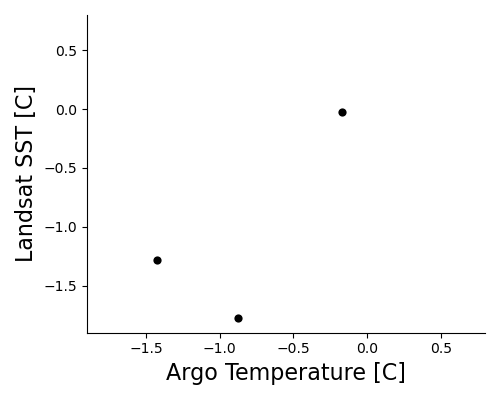

In [17]:
# Plot data points and RANSAC regression
fig, ax = plt.subplots(figsize=(5, 4))
xi = np.arange(-7.0,5.0,1.0)

data = valids

ax.tick_params(labelsize=10)
ax.scatter(data['Argo_SST'],data['L8_SST'],color='k',linewidth=0,s=35,label='_no label_')
# a1.plot(xi,xi*lreg.coef_[0]+lreg.intercept_[0],color='r',linewidth=2,label='RANSAC regression')
# a1.scatter(xC,yLC,color='r',linewidth=0,s=35,label='_no label_')
# a1.plot(xi,xi*resultC.params.L8_SST+resultC.params.Intercept,color='k',linewidth=2,label='OLS regression')
# a1.text(-2.1,-2.85,f'y={np.around(resultC.params.L8_SST,2)}x+{np.around(resultC.params.Intercept,2)}   p={p_val}',fontsize=12)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_ylim([-1.9,0.8])
ax.set_xlim([-1.9,0.8])
ax.set_xlabel('Argo Temperature [C]',fontsize=16)
ax.set_ylabel('Landsat SST [C]',fontsize=16)
# a1.legend(markerscale=1,fontsize=12,loc='upper left')

plt.tight_layout()
# plt.savefig('/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/Manuscripts/AmundsenCC_Manuscript/Figures/LMCalibration.jpg', format='jpg', dpi=1000)
plt.show()